<a href="https://colab.research.google.com/github/jocdoc07/Military-Well-being/blob/main/PETRI_Military_WB_11_May_2025.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
MilitaryDF <- read.csv("Military.csv") # Enclose the file path in quotes

In [3]:
dim(MilitaryDF)

[1] 1495  234

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   1.000   1.000   1.411   1.000   6.000 


   1    2    3    4    5    6 
1129  215   86   42   13   10 

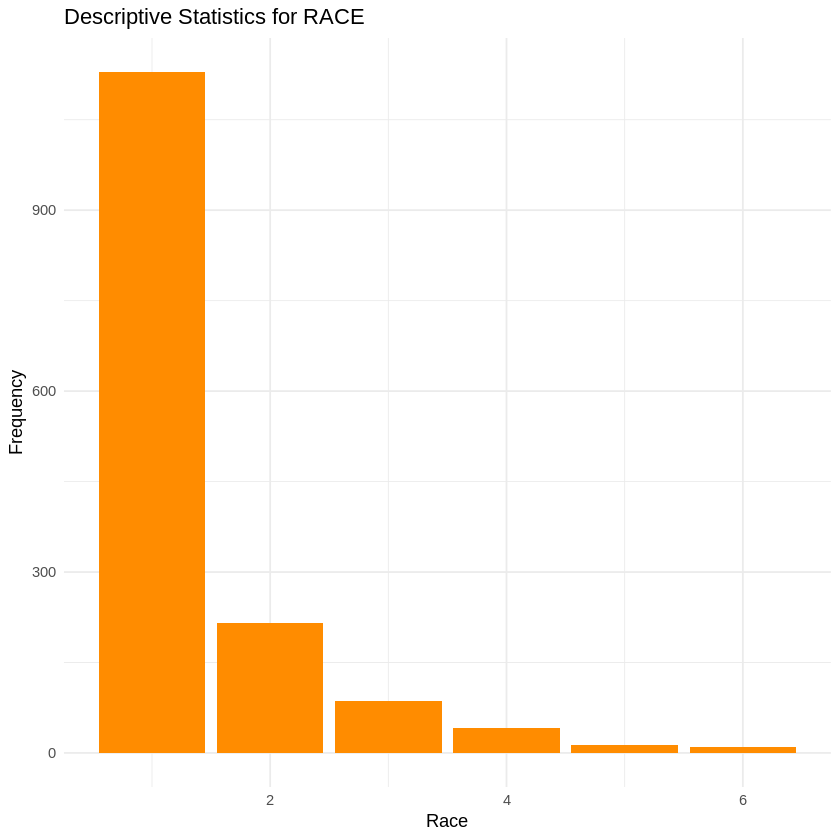

In [ ]:
# prompt: descriptive statistics for variable RACE. Use the color dark orange for graph

library(ggplot2)

ggplot(MilitaryDF, aes(x = RACE)) +
  geom_bar(fill = "#FF8C00") +  # Dark orange color
  labs(title = "Descriptive Statistics for RACE",
       x = "Race",
       y = "Frequency") +
  theme_minimal()


# Calculate descriptive statistics
summary(MilitaryDF$RACE)
table(MilitaryDF$RACE)
#Other useful functions include:
#mean(MilitaryDF$RACE, na.rm = TRUE)
#median(MilitaryDF$RACE, na.rm = TRUE)
#sd(MilitaryDF$RACE, na.rm = TRUE)
#quantile(MilitaryDF$RACE, probs = c(0.25, 0.75), na.rm = TRUE)
#boxplot(MilitaryDF$RACE, main = "Box Plot of Race", ylab = "Race")


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   1.000   1.000   1.187   1.000   2.000 


   1    2 
1215  280 

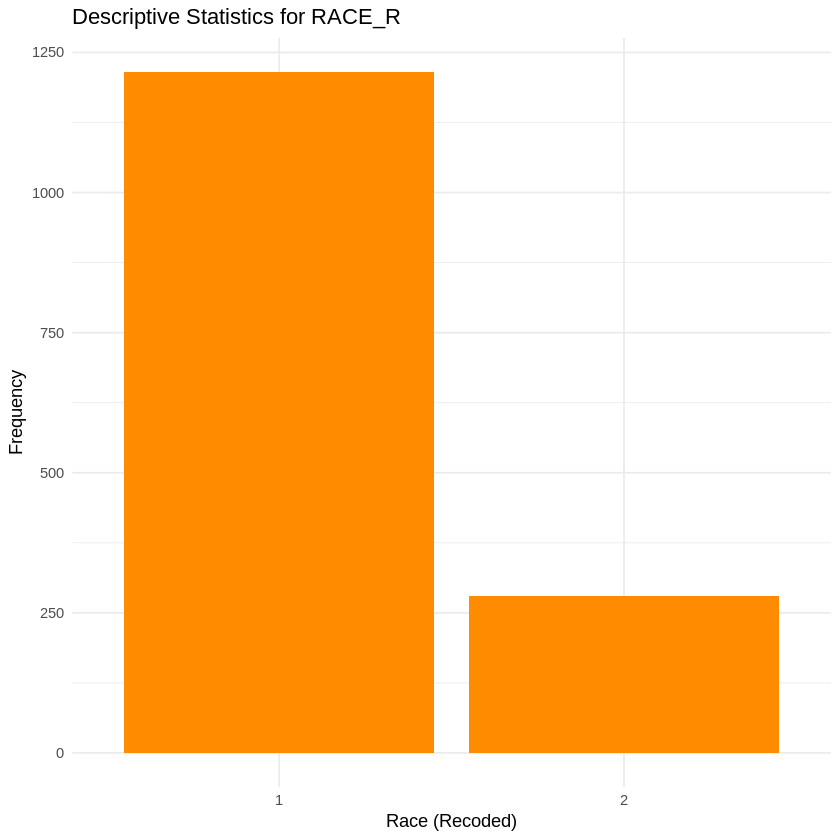

In [ ]:
# prompt: Create new variable named RACE_R  with 1 = 1 +3  and 2 = 2 + 4 + 5 + 6. Label 1 = White and 2 = Non-White. Display descriptive statistics with plot for RACE_R

# Create RACE_R variable
MilitaryDF$RACE_R <- NA  # Initialize the new variable

# Assign values based on the conditions
MilitaryDF$RACE_R[MilitaryDF$RACE %in% c(1, 3)] <- 1
MilitaryDF$RACE_R[MilitaryDF$RACE %in% c(2, 4, 5, 6)] <- 2

# Label the levels of RACE_R
levels(MilitaryDF$RACE_R) <- c("White", "Non-White")

# Descriptive Statistics and Plot for RACE_R
ggplot(MilitaryDF, aes(x = factor(RACE_R))) + # Convert to factor for proper labels
  geom_bar(fill = "#FF8C00") +
  labs(title = "Descriptive Statistics for RACE_R",
       x = "Race (Recoded)",
       y = "Frequency") +
  theme_minimal()


summary(MilitaryDF$RACE_R)
table(MilitaryDF$RACE_R)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
      0   32000   59000   66501   93500  200000      56 

Warning message:
“Removed 56 rows containing non-finite outside the scale range (`stat_bin()`).”


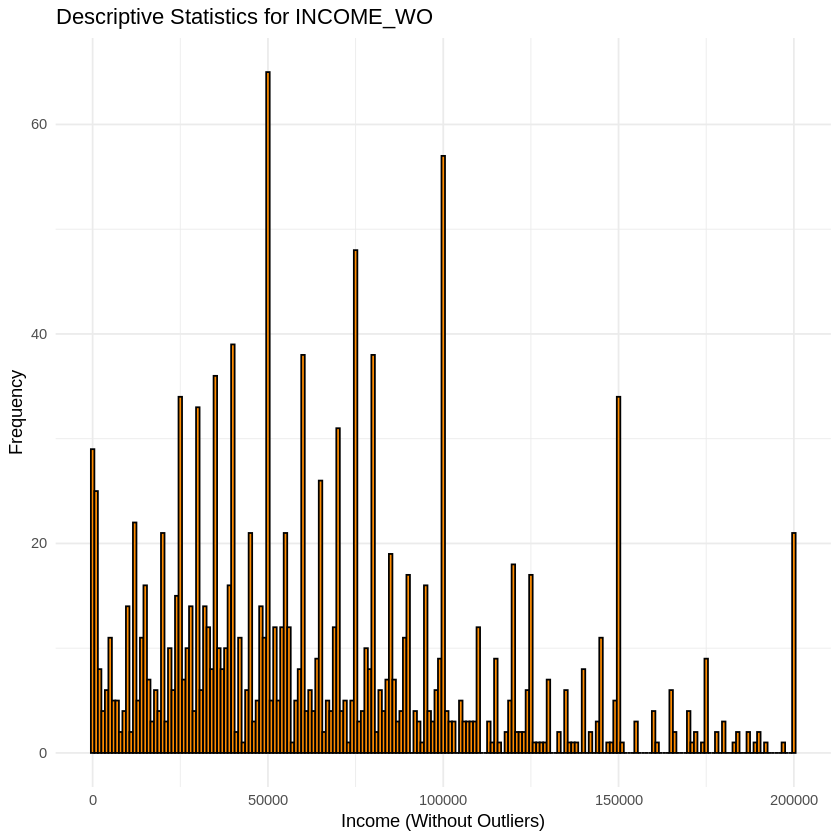

In [ ]:
# prompt: Create new variable INCOME_WO from INCOME by removing the outliers. Display descriptive statistics with plot for INCOME_WO

# Calculate IQR for INCOME
IQR_INCOME <- IQR(MilitaryDF$INCOME, na.rm = TRUE)

# Calculate upper and lower bounds for outliers
upper_bound <- quantile(MilitaryDF$INCOME, 0.75, na.rm = TRUE) + 1.5 * IQR_INCOME
lower_bound <- quantile(MilitaryDF$INCOME, 0.25, na.rm = TRUE) - 1.5 * IQR_INCOME

# Create INCOME_WO by removing outliers
MilitaryDF$INCOME_WO <- ifelse(MilitaryDF$INCOME > upper_bound | MilitaryDF$INCOME < lower_bound, NA, MilitaryDF$INCOME)

# Display descriptive statistics for INCOME_WO
summary(MilitaryDF$INCOME_WO)

# Plot INCOME_WO (you can customize the plot as needed)
ggplot(MilitaryDF, aes(x = INCOME_WO)) +
  geom_histogram(binwidth = 1000, fill = "#FF8C00", color = "black") + # Adjust binwidth as needed
  labs(title = "Descriptive Statistics for INCOME_WO",
       x = "Income (Without Outliers)",
       y = "Frequency") +
  theme_minimal()

In [ ]:
# prompt: install "dplyr"

install.packages("dplyr")
library(dplyr)


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0000  0.0000  0.8555  2.0000  4.0000 

[1] 1.311261


  0   1   2   3   4 
954 150 151 133 107 

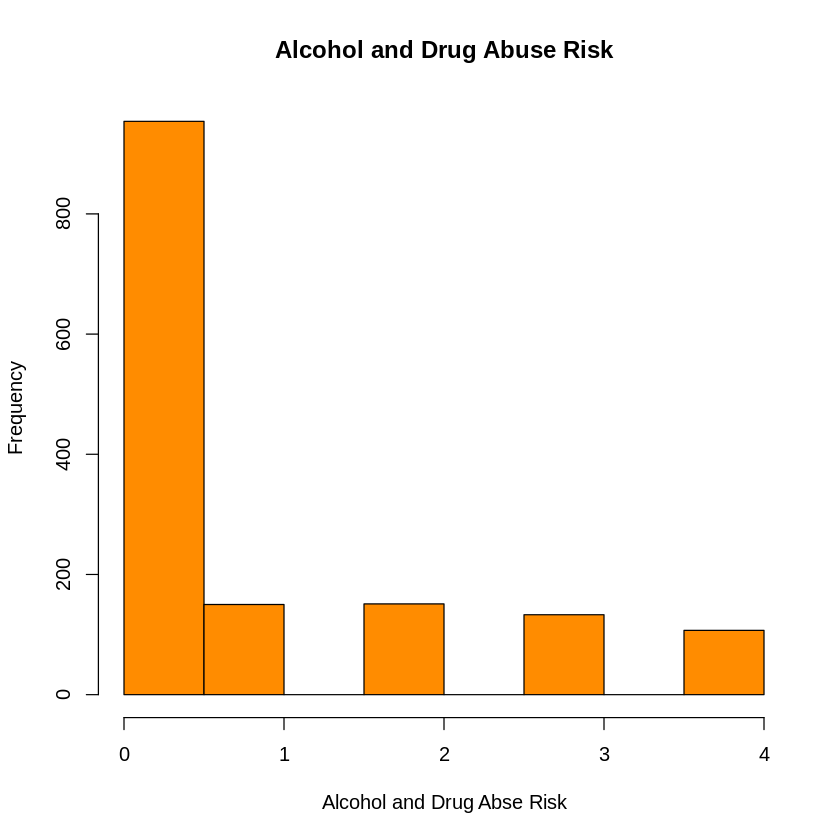

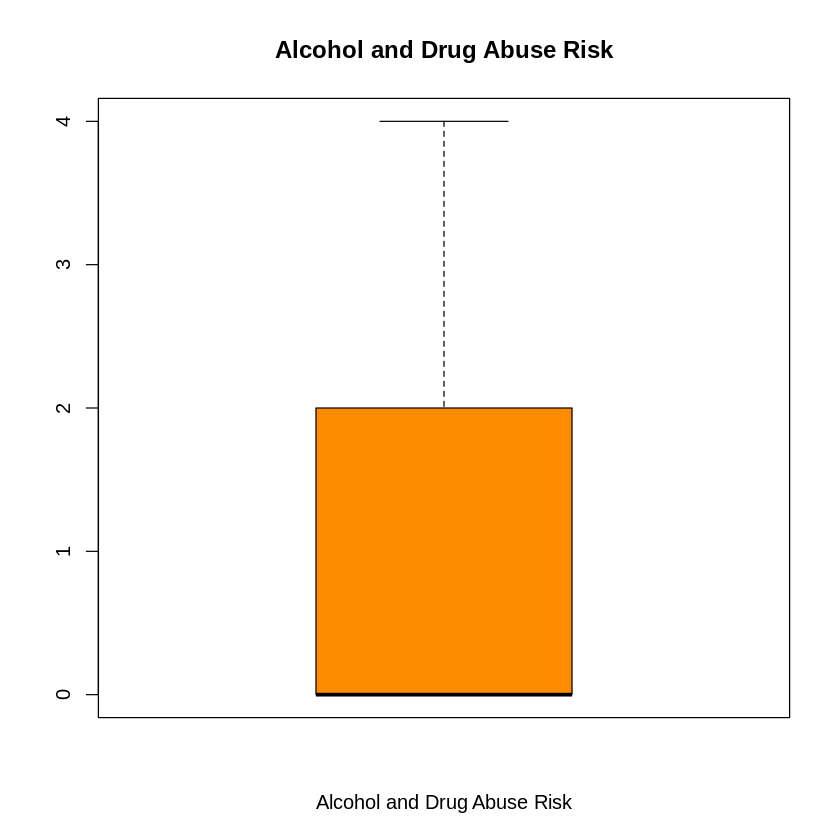

In [ ]:
# prompt: Descriptive statistics for CAGEAID_TOTAL with frequency table with sd, Histogram and Box Plot, use color dark orange, Use label "Alcohol and Drug Use Risk" for title and x-axis.

# Calculate descriptive statistics
summary(MilitaryDF$CAGEAID_TOTAL)
sd(MilitaryDF$CAGEAID_TOTAL, na.rm = TRUE)

# Frequency table
table(MilitaryDF$CAGEAID_TOTAL)

# Histogram
hist(MilitaryDF$CAGEAID_TOTAL,
     main = "Alcohol and Drug Abuse Risk",
     xlab = "Alcohol and Drug Abse Risk",
     col = "darkorange")

# Box plot
boxplot(MilitaryDF$CAGEAID_TOTAL,
        main = "Alcohol and Drug Abuse Risk",
        xlab = "Alcohol and Drug Abuse Risk",
        col = "darkorange")

In [ ]:
# prompt: Create new variable PUR_TOTAL with the summation of PURPOSE_1 through PURPOSE_5

MilitaryDF <- MilitaryDF %>%
  mutate(PUR_TOTAL = PURPOSE_1 + PURPOSE_2 + PURPOSE_3 + PURPOSE_4 + PURPOSE_5)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   5.00   18.00   20.00   20.24   23.00   25.00 

[1] 3.15261


  5   7   8  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25 
  2   3   1   2   5  10  10  28  45  59  97 131 182 232 162 139 127 102 158 

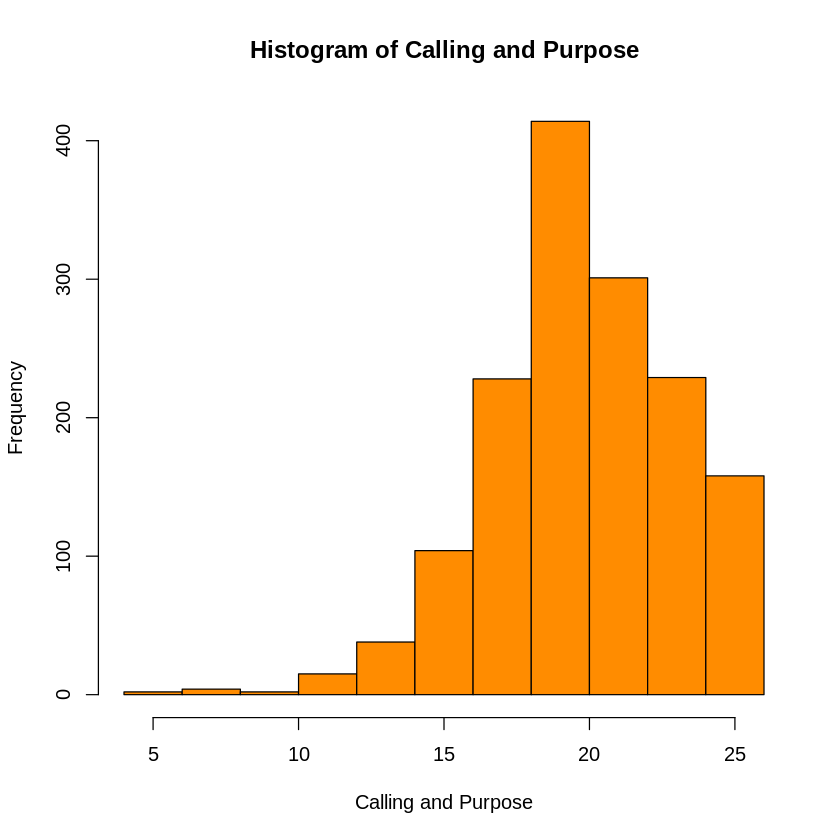

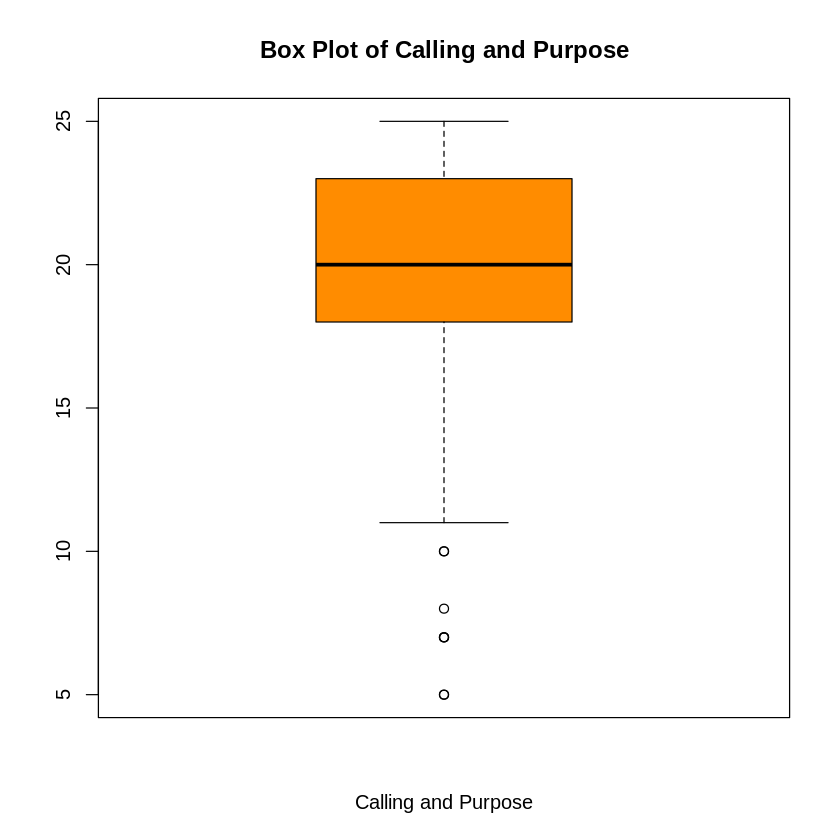

In [ ]:
# prompt: Descriptive statistics for PUR_TOTAL with frequency table with sd, histogram and box plot, use color dark orange, Use label "Calling and Purpose" for title and x-axis.

# Descriptive Statistics
summary(MilitaryDF$PUR_TOTAL)
sd(MilitaryDF$PUR_TOTAL, na.rm = TRUE) # Calculate standard deviation, removing NA values

# Frequency Table
table(MilitaryDF$PUR_TOTAL)

# Histogram
hist(MilitaryDF$PUR_TOTAL,
     main = "Histogram of Calling and Purpose",
     xlab = "Calling and Purpose",
     col = "darkorange")

# Boxplot
boxplot(MilitaryDF$PUR_TOTAL,
        main = "Box Plot of Calling and Purpose",
        xlab = "Calling and Purpose",
        col = "darkorange",
        horizontal = FALSE) #Horizontal for better readability

In [ ]:
# prompt: Create new variable SOC_TOTAL from SOC_INTEGRATION_1R + SOC_INTEGRATION_2 + SOC_INTEGRATION_3 + SOC_CONTRIBUTION_1 + SOC_CONTRIBUTION_2R + SOC_CONTRIBUTION_3R

MilitaryDF <- MilitaryDF %>%
  mutate(SOC_TOTAL = SOC_INTEGRATION_1R + SOC_INTEGRATION_2 + SOC_INTEGRATION_3 + SOC_CONTRIBUTION_1 + SOC_CONTRIBUTION_2R + SOC_CONTRIBUTION_3R)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  12.00   24.00   27.00   26.67   31.00   36.00 

[1] 5.168928


 12  13  14  15  16  17  18  19  20  21  22  23  24  25  26  27  28  29  30  31 
  7  10  13  11  12  19  33  24  44  49  68  76 157  94 122  91  92  94  98  71 
 32  33  34  35  36 
101  62  72  23  52 

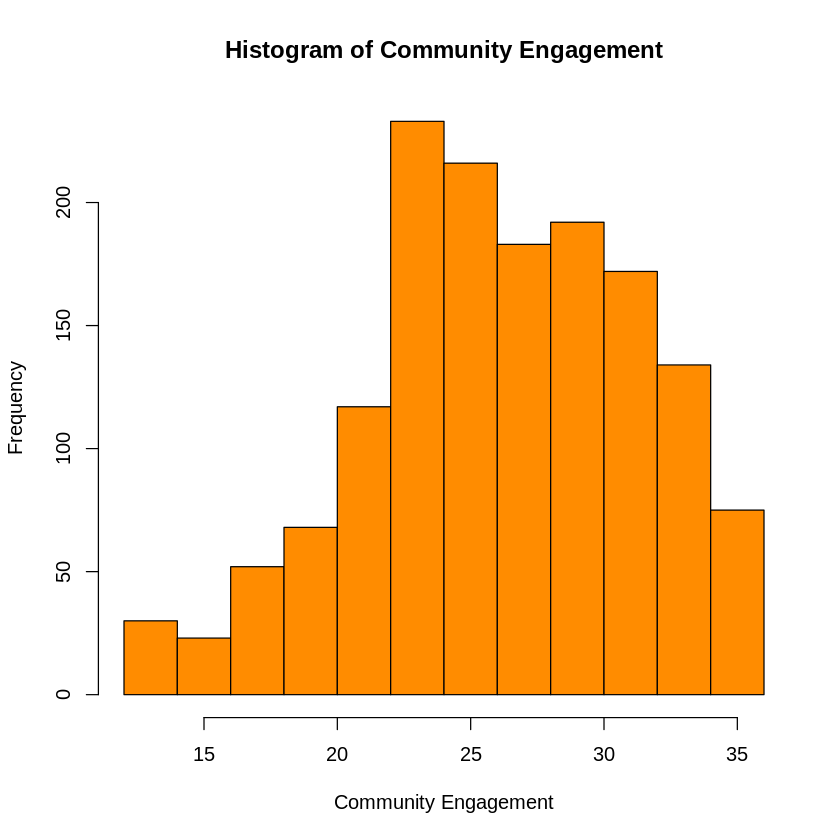

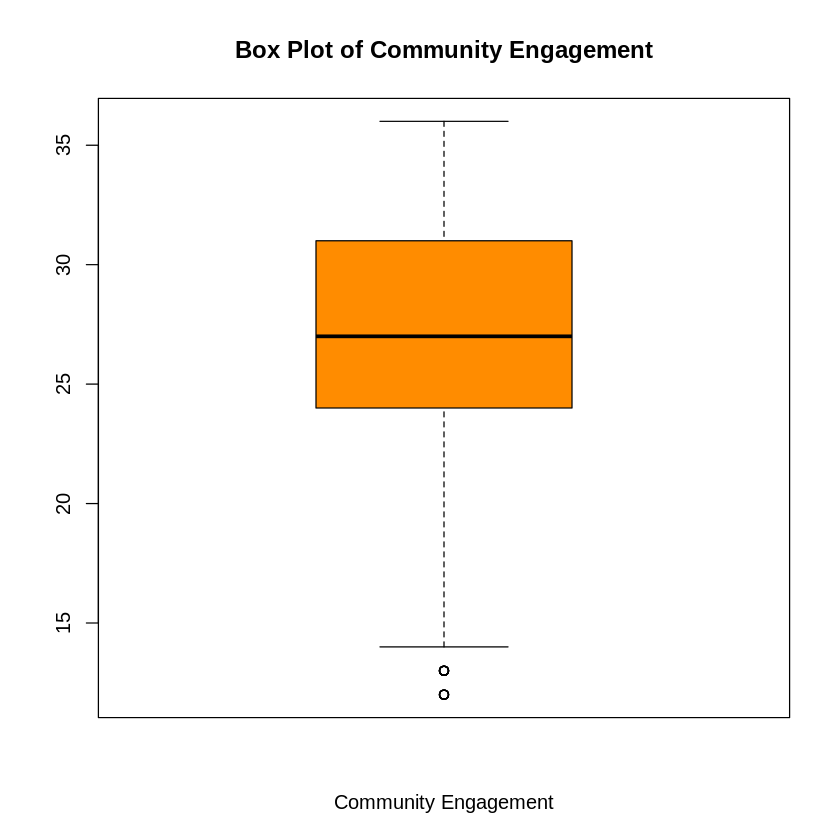

In [ ]:
# prompt: Descriptive statistics for SOC_TOTAL with frequency table with sd, histogram and box plot, use color dark orange, Use label "Community Engagement" for title and x-axis.

# Descriptive Statistics
summary(MilitaryDF$SOC_TOTAL)
sd(MilitaryDF$SOC_TOTAL, na.rm = TRUE) # Calculate standard deviation, removing NA values

# Frequency Table
table(MilitaryDF$SOC_TOTAL)

# Histogram
hist(MilitaryDF$SOC_TOTAL,
     main = "Histogram of Community Engagement",
     xlab = "Community Engagement",
     col = "darkorange")

# Boxplot
boxplot(MilitaryDF$SOC_TOTAL,
        main = "Box Plot of Community Engagement",
        xlab = "Community Engagement",
        col = "darkorange",
        horizontal = FALSE) #Horizontal for better readability

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   3.00   10.00   13.00   12.96   16.00   21.00 

[1] 4.285222


  3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18  19  20  21 
 56  11  19  56  39  42  87  69  95 172 134 154 140 107  65 132  41  26  50 

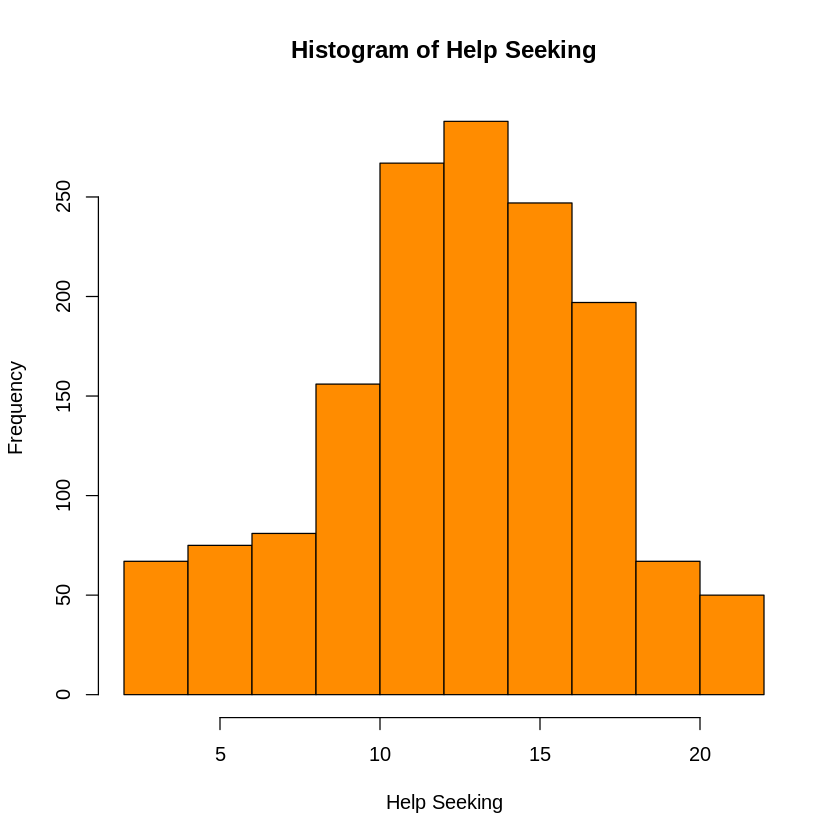

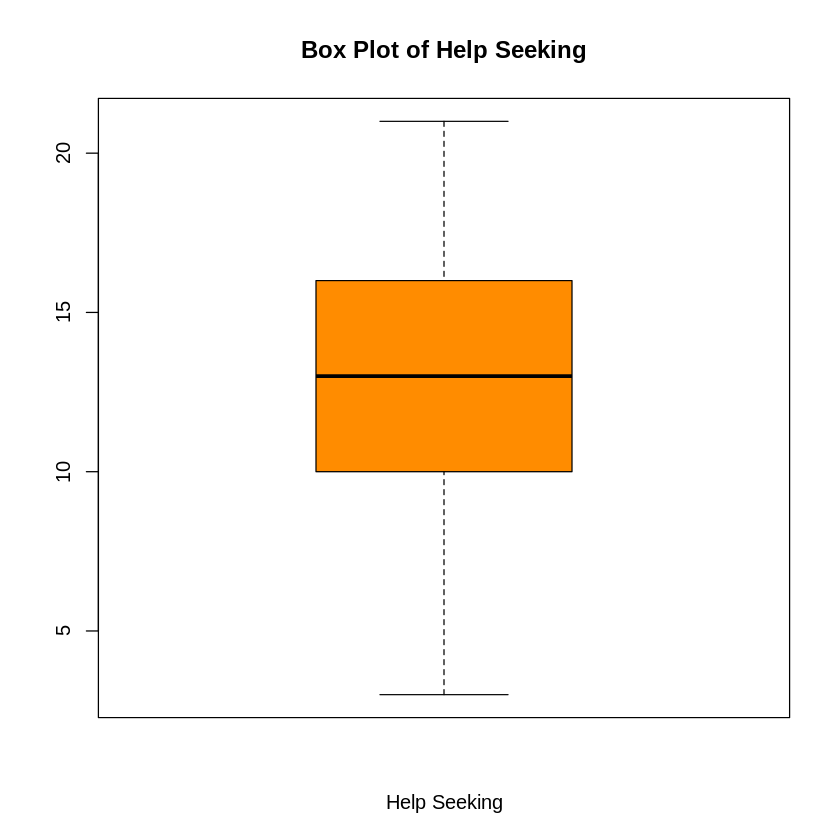

In [ ]:
# prompt: Create new variable HELP_TOTAL as the summation of HELP_SEEKING_1 through 3

MilitaryDF <- MilitaryDF %>%
  mutate(HELP_TOTAL = HELP_SEEKING_1 + HELP_SEEKING_2 + HELP_SEEKING_3)

# Descriptive Statistics
summary(MilitaryDF$HELP_TOTAL)
sd(MilitaryDF$HELP_TOTAL, na.rm = TRUE)

# Frequency Table
table(MilitaryDF$HELP_TOTAL)

# Histogram
hist(MilitaryDF$HELP_TOTAL,
     main = "Histogram of Help Seeking",
     xlab = "Help Seeking",
     col = "darkorange")

# Boxplot
boxplot(MilitaryDF$HELP_TOTAL,
        main = "Box Plot of Help Seeking",
        xlab = "Help Seeking",
        col = "darkorange",
        horizontal = FALSE)

In [ ]:
# prompt: Create a new variable MIL_CALL as the summation of NPIS_1 through 3

MilitaryDF <- MilitaryDF %>%
  mutate(MIL_CALL = NPIS_1 + NPIS_2 + NPIS_3)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   3.00   16.00   18.00   17.38   20.00   21.00 

[1] 3.650563


  3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18  19  20  21 
 13   3   5   8   6   7  20  20  30  38  48  70 103 103 130 218 158 154 361 

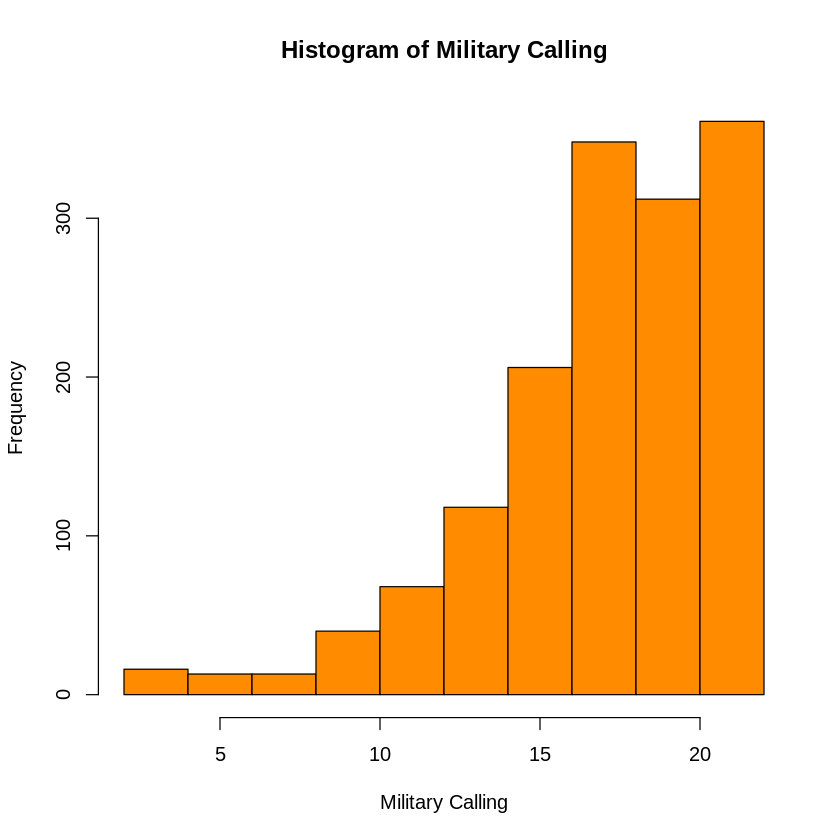

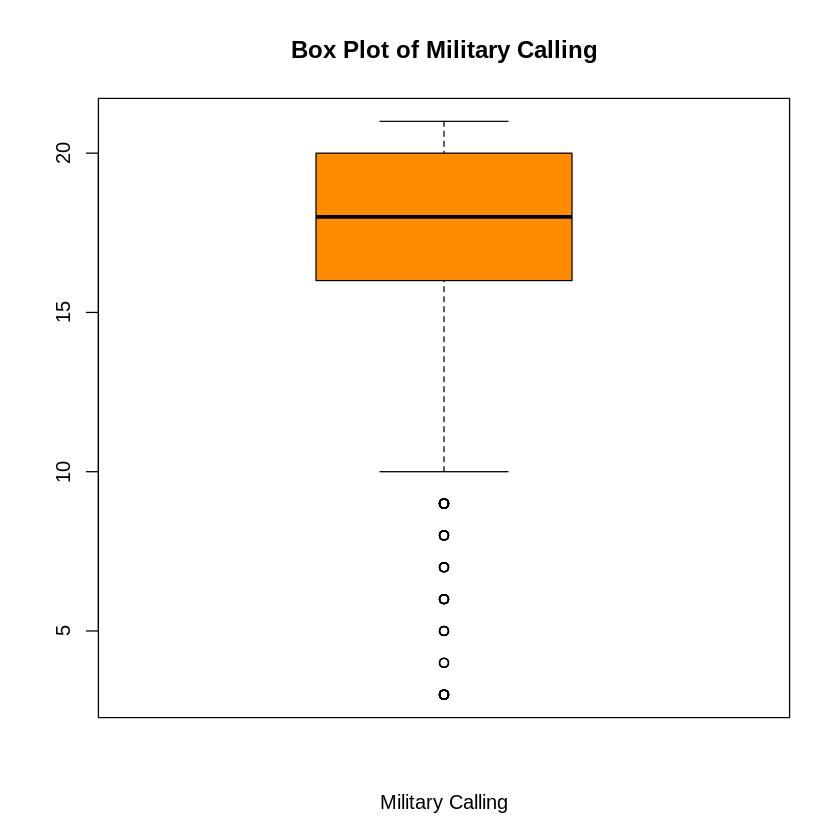

In [ ]:
# prompt: Descriptive statistics for MIL_CALL with frequency table with sd, histogram and box plot, use color dark orange, Use label "Military Calling" for title and x-axis.

# Descriptive Statistics
summary(MilitaryDF$MIL_CALL)
sd(MilitaryDF$MIL_CALL, na.rm = TRUE)

# Frequency Table
table(MilitaryDF$MIL_CALL)

# Histogram
hist(MilitaryDF$MIL_CALL,
     main = "Histogram of Military Calling",
     xlab = "Military Calling",
     col = "darkorange")

# Boxplot
boxplot(MilitaryDF$MIL_CALL,
        main = "Box Plot of Military Calling",
        xlab = "Military Calling",
        col = "darkorange",
        horizontal = FALSE)

In [ ]:
# prompt: Create new variable WHO_TOTAL from summation of WHO1 through 26 but use reverse codes for 3, 4, 26

MilitaryDF <- MilitaryDF %>%
  mutate(WHO_TOTAL = WHO1 + WHO2 + WHO3R + WHO4R + WHO5 + WHO6 + WHO7 + WHO8 + WHO9 + WHO10 + WHO11 + WHO12 + WHO13 + WHO14 + WHO15 + WHO16 + WHO17 + WHO18 + WHO19 + WHO20 + WHO21 + WHO22 + WHO23 + WHO24 + WHO25 + WHO26R)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  35.00   87.00  101.00   98.33  111.00  130.00      38 

[1] 17.93763


 35  38  42  43  44  45  46  47  49  51  52  53  54  55  56  57  58  59  60  61 
  1   2   1   1   1   1   3   1   2   1   1   3   2   2   3   1   5   7   5   4 
 62  63  64  65  66  67  68  69  70  71  72  73  74  75  76  77  78  79  80  81 
  8  10   7   3  13   6   6   8   7  13  12   6   7  14   9  13  21  25  14  22 
 82  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99 100 101 
 13  20  15  17  20  23  20  26  24  27  18  31  34  18  22  33  20  29  32  45 
102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 
 26  37  30  40  37  33  42  32  26  38  32  26  23  24  24  24  19  20  18  19 
122 123 124 125 126 127 128 129 130 
 26  16  15  16   8   9   9  13  17 

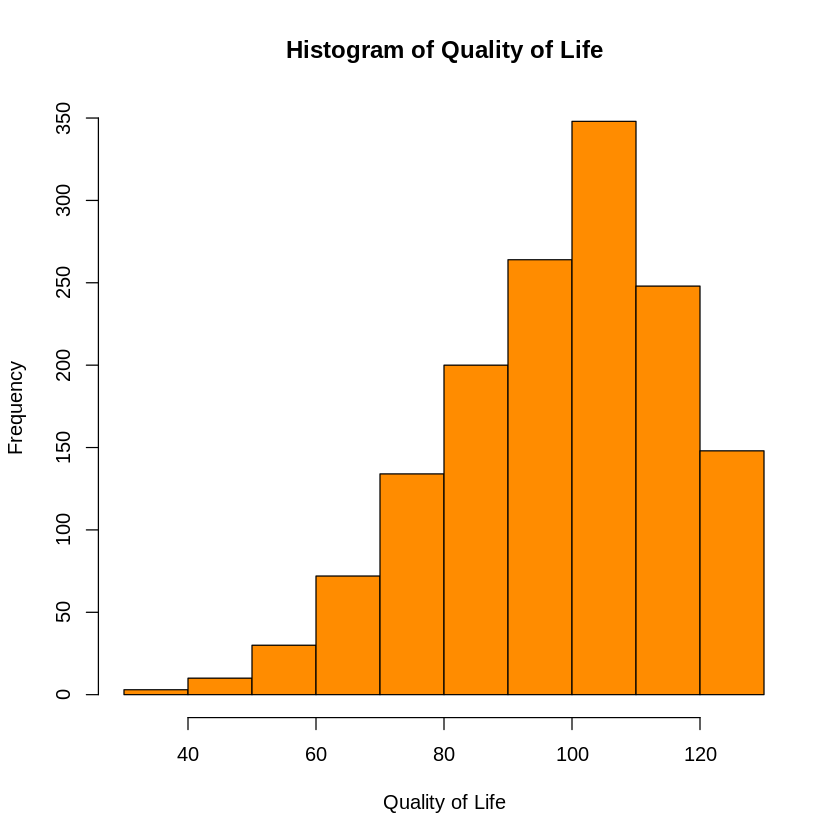

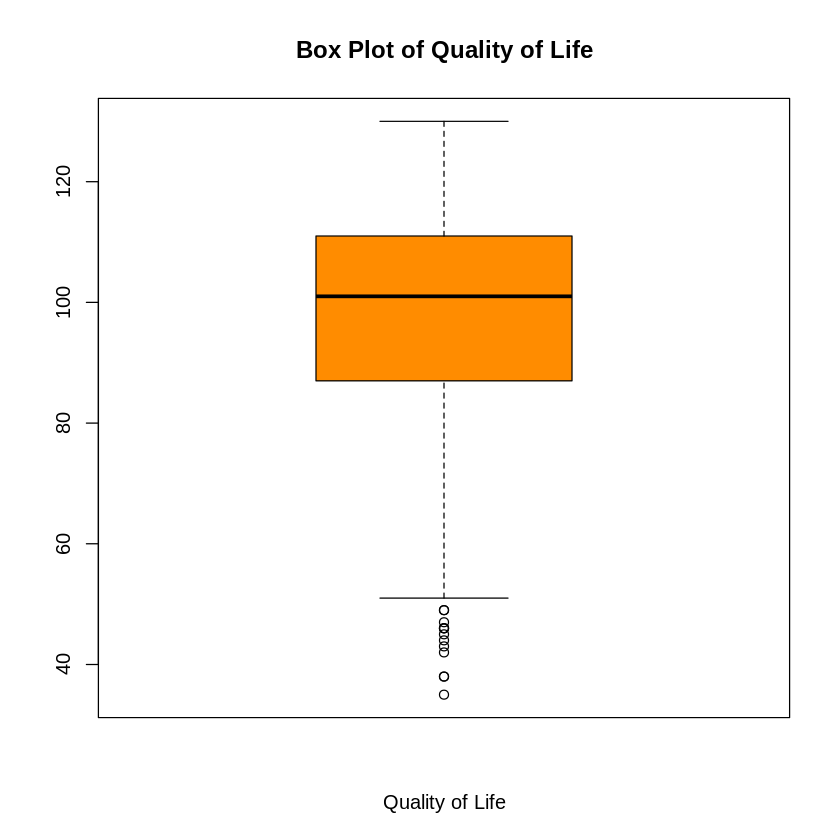

In [ ]:
# prompt: Descriptive statistics for WHO_TOTAL with frequency table with sd, histogram and box plot, use color dark orange, Use label "WHO Quality of Life" for title and x-axis. Use Histogram of and Box Plot of

# Descriptive Statistics
summary(MilitaryDF$WHO_TOTAL)
sd(MilitaryDF$WHO_TOTAL, na.rm = TRUE)

# Frequency Table
table(MilitaryDF$WHO_TOTAL)

# Histogram
hist(MilitaryDF$WHO_TOTAL,
     main = "Histogram of Quality of Life",
     xlab = "Quality of Life",
     col = "darkorange")

# Boxplot
boxplot(MilitaryDF$WHO_TOTAL,
        main = "Box Plot of Quality of Life",
        xlab = "Quality of Life",
        col = "darkorange",
        horizontal = FALSE)

In [ ]:
# prompt: Create new variable named PUB_SER from summation of PUBLIC_1 through 5

MilitaryDF <- MilitaryDF %>%
  mutate(PUB_SER = PUBLIC_1 + PUBLIC_2 + PUBLIC_3 + PUBLIC_4 + PUBLIC_5)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   5.00   18.00   20.00   19.96   22.00   25.00 

[1] 3.381142


  5   6   7   8   9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24 
  3   1   1   5   2   7   8  12  18  22  70  62  94 130 171 241 156 125 120 100 
 25 
147 

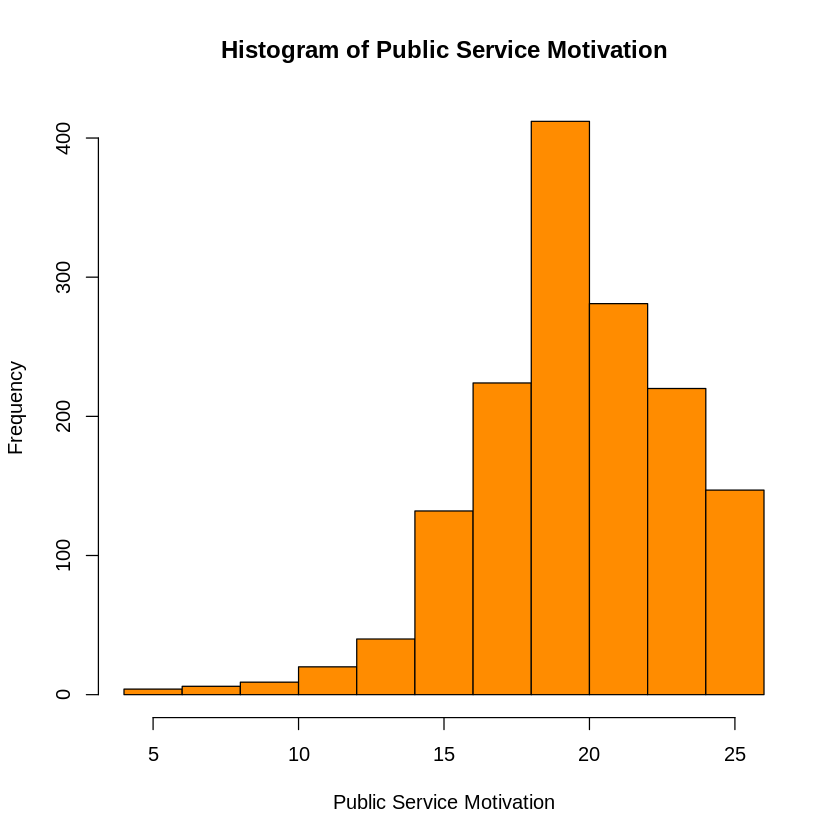

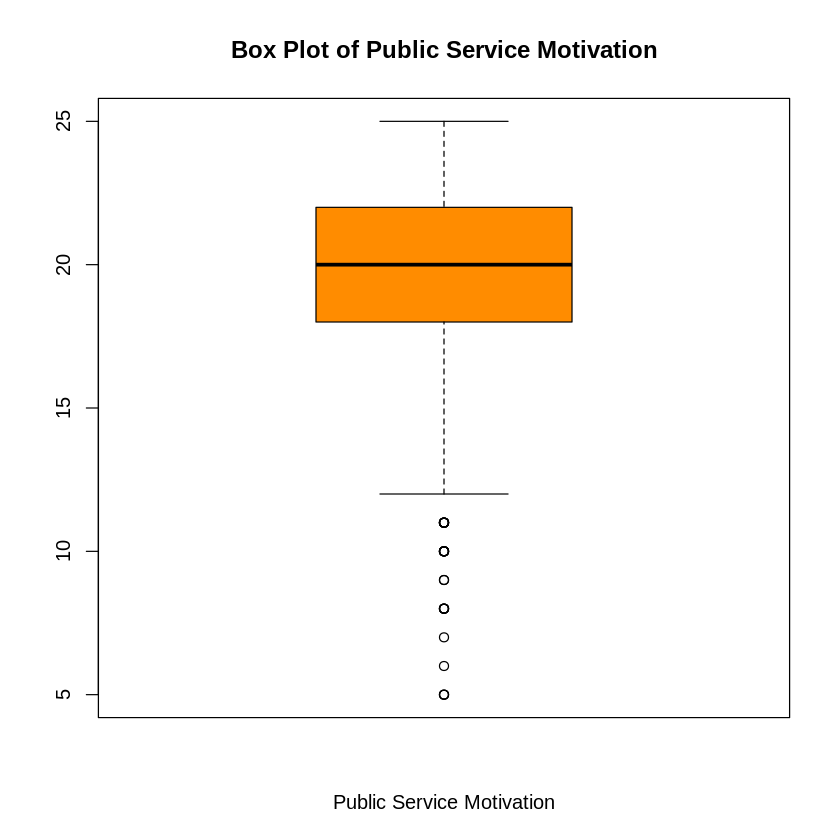

In [ ]:
# prompt: Descriptive statistics for PUB_SER with frequency table with sd, histogram and box plot, use color dark orange, Use label "Public Service Motivation" for title and x-axis.

# Descriptive Statistics
summary(MilitaryDF$PUB_SER)
sd(MilitaryDF$PUB_SER, na.rm = TRUE)

# Frequency Table
table(MilitaryDF$PUB_SER)

# Histogram
hist(MilitaryDF$PUB_SER,
     main = "Histogram of Public Service Motivation",
     xlab = "Public Service Motivation",
     col = "darkorange")

# Boxplot
boxplot(MilitaryDF$PUB_SER,
        main = "Box Plot of Public Service Motivation",
        xlab = "Public Service Motivation",
        col = "darkorange",
        horizontal = FALSE)

In [ ]:
MilitaryDF <- MilitaryDF %>%
  mutate(WELL_MAG = rowSums(select(., WELLNESS_1, WELLNESS_2R, WELLNESS_3, WELLNESS_4,
                                      WELLNESS_5, WELLNESS_6R, WELLNESS_7, WELLNESS_8R, WELLNESS_9R,
                                      WELLNESS_10R, WELLNESS_11, WELLNESS_12R, WELLNESS_13, WELLNESS_14R,
                                      WELLNESS_15, WELLNESS_16, WELLNESS_17R, WELLNESS_18, WELLNESS_19,
                                      WELLNESS_20, WELLNESS_21R, WELLNESS_22, WELLNESS_23R, WELLNESS_24R,
                                      WELLNESS_25, WELLNESS_26R, WELLNESS_27, WELLNESS_28, WELLNESS_29,
                                      WELLNESS_30R), na.rm = TRUE))

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   40.0    94.0   109.0   109.2   124.0   150.0 

[1] 20.10989


 40  44  45  46  50  52  53  55  57  58  59  61  62  64  65  66  67  69  70  71 
  1   1   1   1   1   1   1   1   1   3   1   2   3   2   3   3   3   3   5   4 
 72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91 
  2   3   4   6   9   8   7   7  13  11  14  14  13  15  23  17  24  26  24  23 
 92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108 109 110 111 
 30  37  30  29  31  17  25  20  28  19  16  27  17  26  22  24  27  22  27  20 
112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 
 23  23  29  21  15  37  31  23  32  23  18  30  22  19  17  19  16  20  28  24 
132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 
 16  20  15  11  22  15  17   8  10  13  17  13   9   8   9   3   9   8   4 

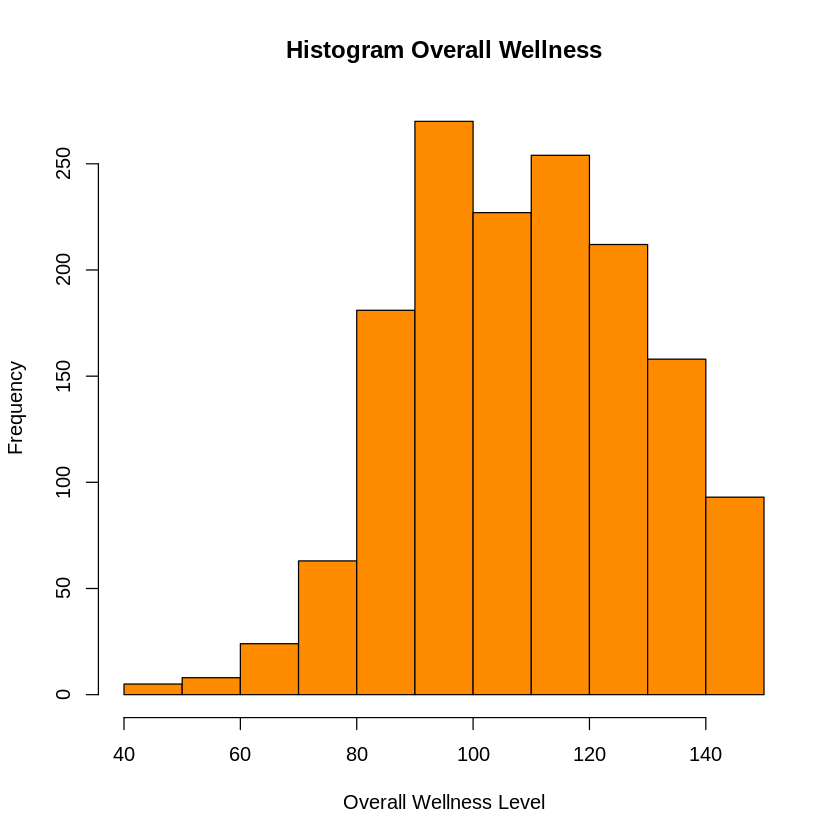

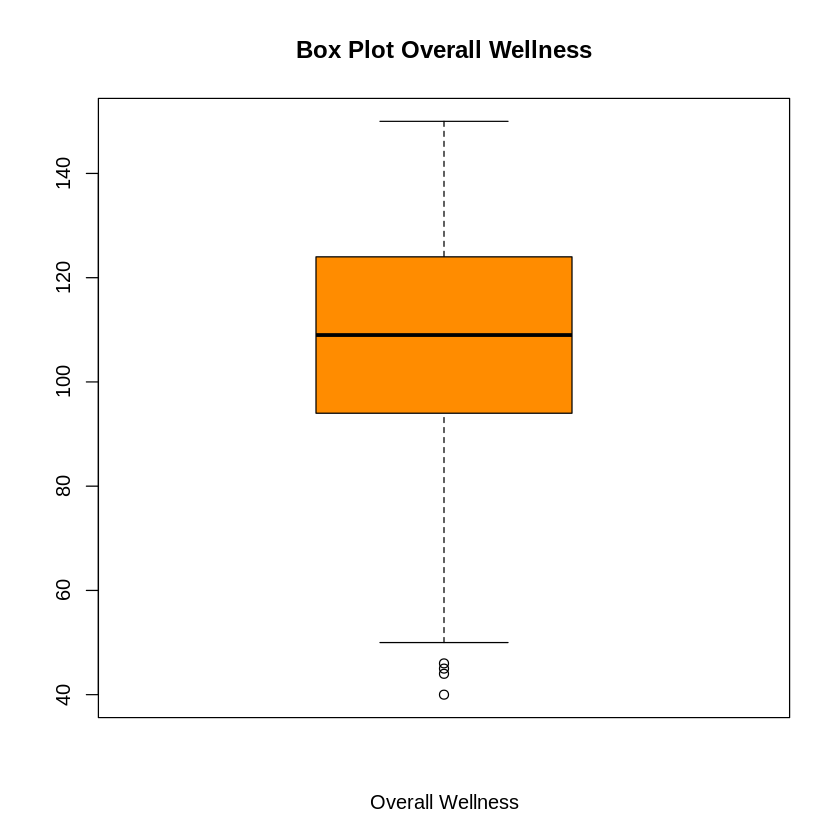

In [ ]:
# prompt: Descriptive statistics for WELL_MAG with frequency table with sd, histogram and box plot, use color dark orange, Use label "Overall Well Being Level" for title and x-axis.

# Descriptive Statistics
summary(MilitaryDF$WELL_MAG)
sd(MilitaryDF$WELL_MAG, na.rm = TRUE)

# Frequency Table
table(MilitaryDF$WELL_MAG)

# Histogram
hist(MilitaryDF$WELL_MAG,
     main = "Histogram Overall Wellness",
     xlab = "Overall Wellness Level",
     col = "darkorange")

# Boxplot
boxplot(MilitaryDF$WELL_MAG,
        main = "Box Plot Overall Wellness",
        xlab = "Overall Wellness",
        col = "darkorange",
        horizontal = FALSE)

,CAGEAID_TOTAL,PUR_TOTAL,SOC_TOTAL,HELP_TOTAL,MIL_CALL,WHO_TOTAL,PUB_SER,WELL_MAG
CAGEAID_TOTAL,1.0000000000,-0.007778174,-0.2190376,-0.0004007257,-0.05728373,-0.3328458,0.004890299,-0.3396049
PUR_TOTAL,-0.0077781744,1.000000000,0.2845943,0.2927605777,0.35998696,0.1745666,0.583609608,0.2682490
SOC_TOTAL,-0.2190376027,0.284594322,1.0000000,0.4574644285,0.20123861,0.6114610,0.226058230,0.7104182
HELP_TOTAL,-0.0004007257,0.292760578,0.4574644,1.0000000000,0.22660808,0.2793158,0.295959428,0.2881854
MIL_CALL,-0.0572837325,0.359986964,0.2012386,0.2266080758,1.00000000,0.1251004,0.582278894,0.2045894
WHO_TOTAL,-0.3328457864,0.174566565,0.6114610,0.2793157691,0.12510043,1.0000000,0.112334035,0.7779921
PUB_SER,0.0048902994,0.583609608,0.2260582,0.2959594284,0.58227889,0.1123340,1.000000000,0.2208385
WELL_MAG,-0.3396049087,0.268248978,0.7104182,0.2881853948,0.20458945,0.7779921,0.220838544,1.0000000


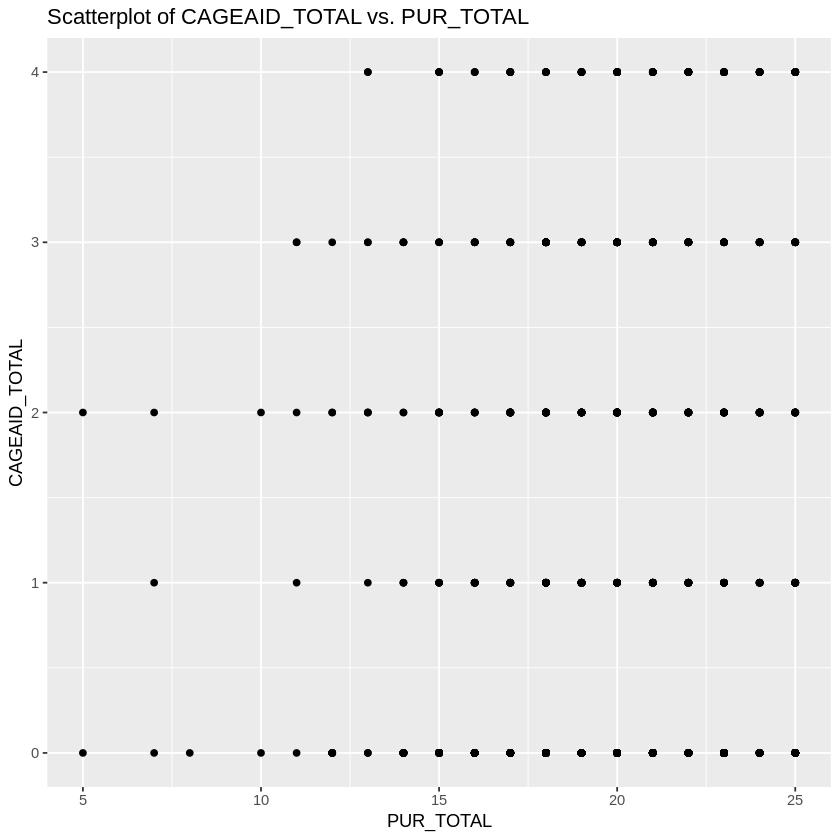

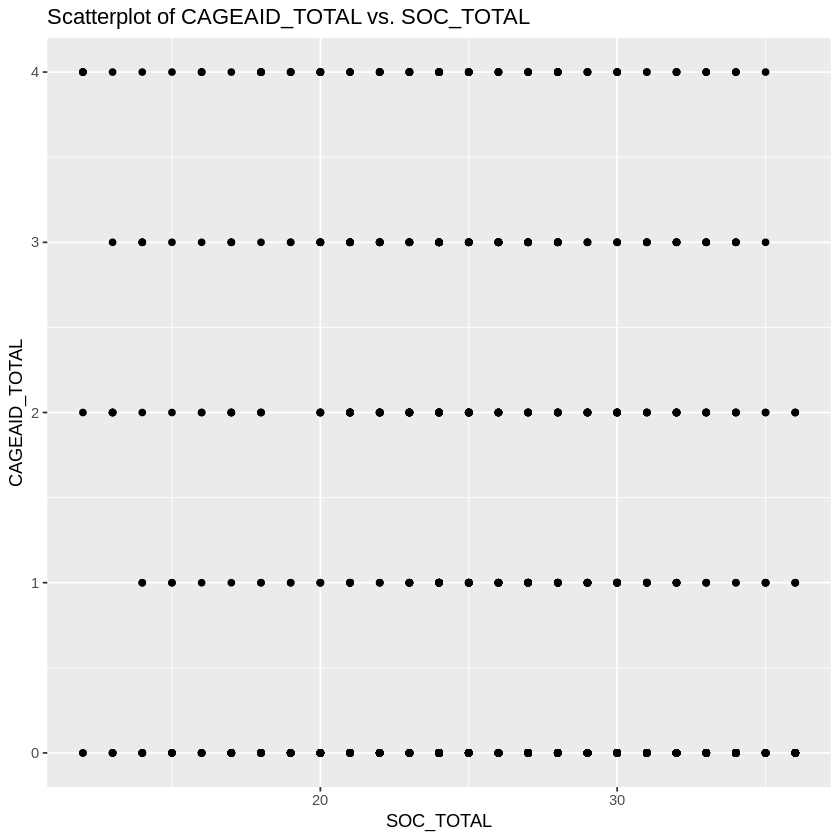

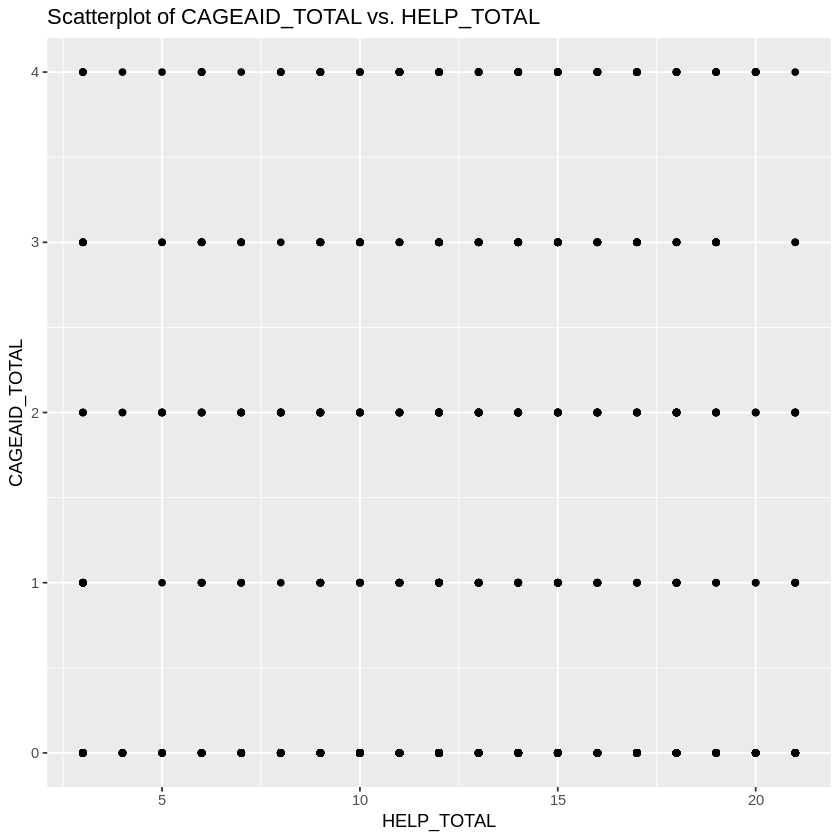

Warning message:
“Removed 38 rows containing missing values or values outside the scale range
(`geom_point()`).”


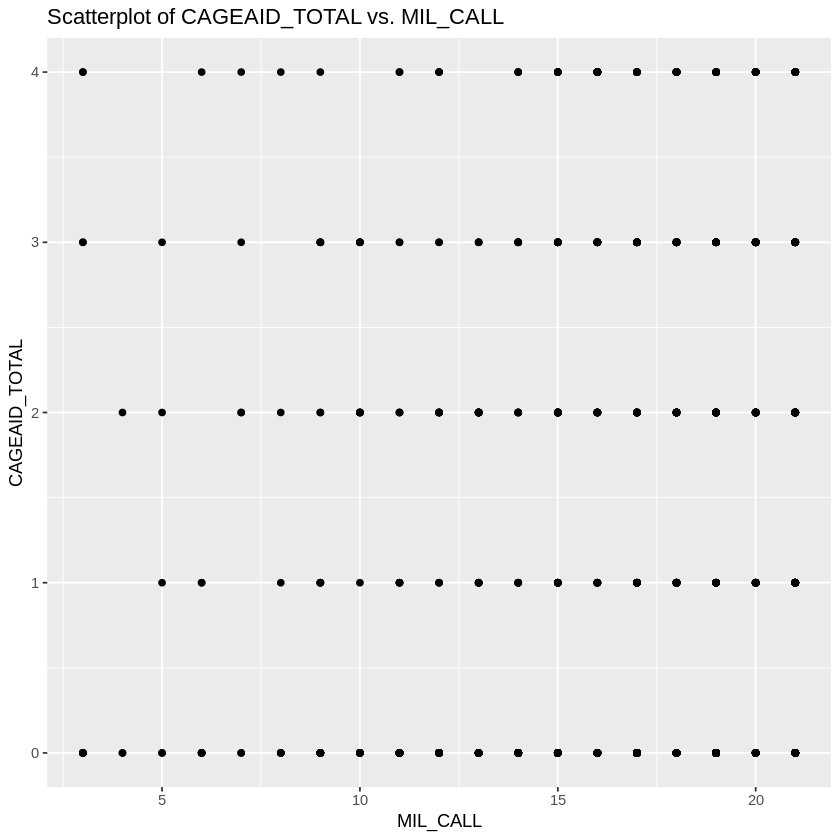

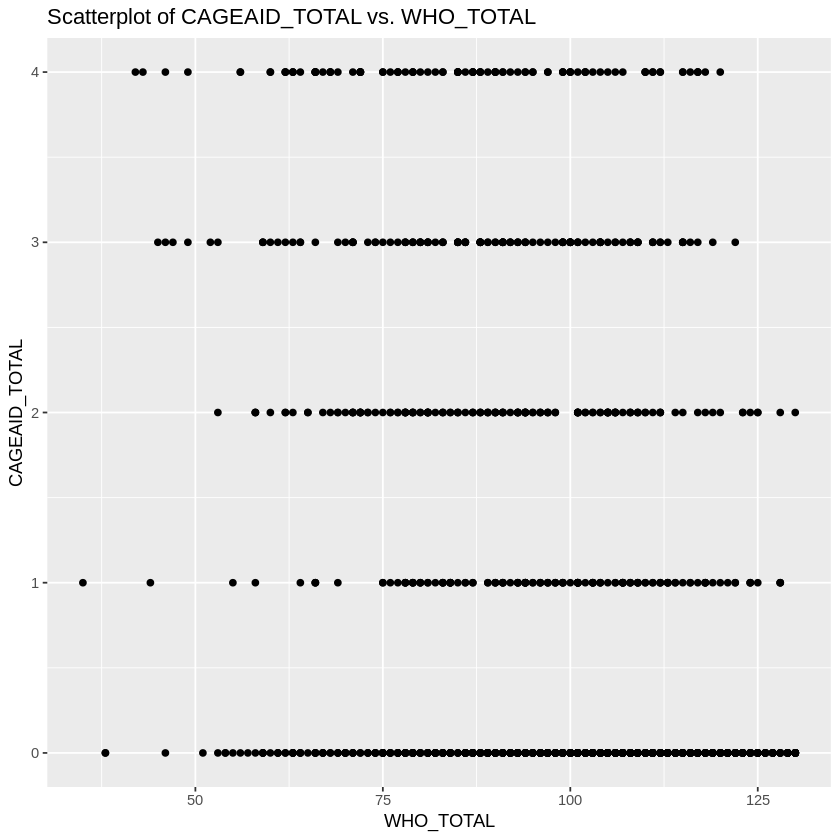

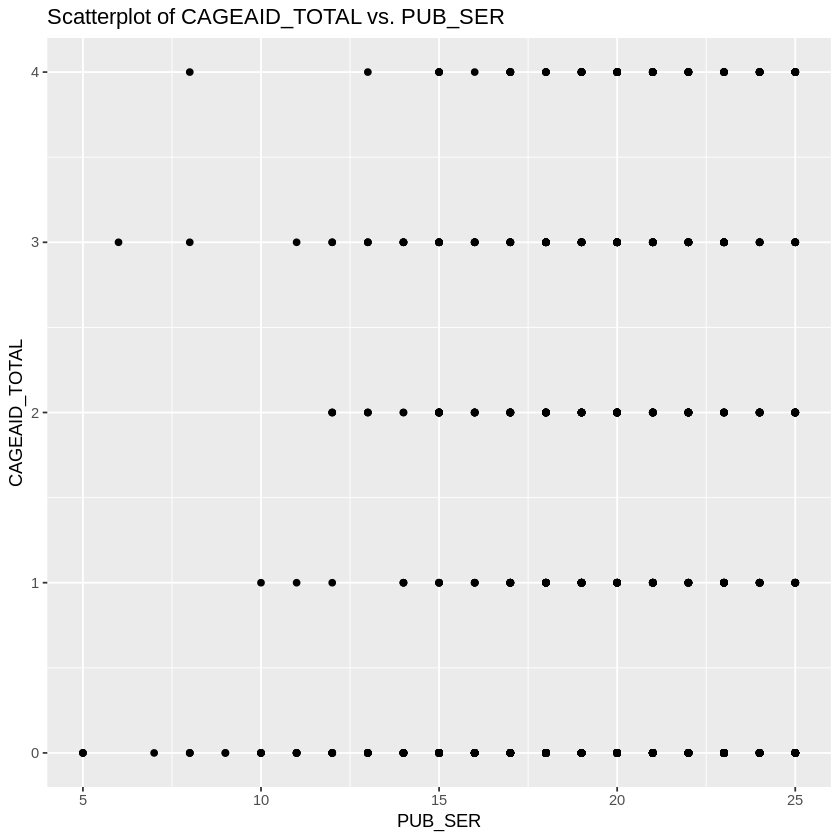

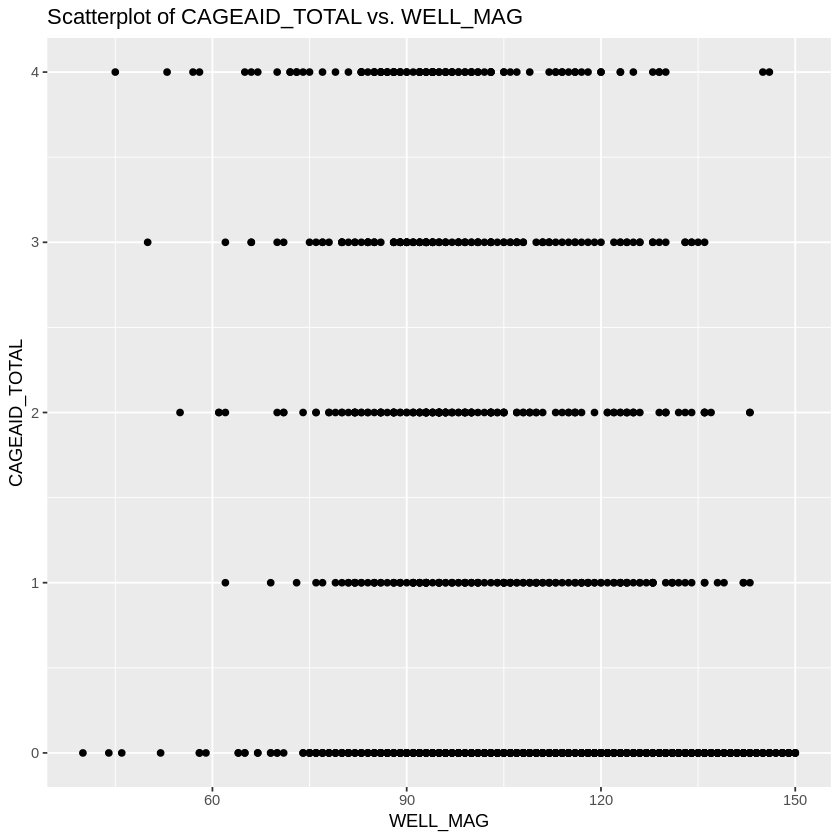

In [ ]:
# prompt: conduct bivariate analysis for the following variable CAGEAID_TOTAL by the following variables, PUR_TOTAL, SOC_TOTAL, HELP_TOTAL, MIL_CALL, WHO_TOTAL, PUB_SER, and WELL_MAG.

# Correlation Analysis
cor(MilitaryDF[, c("CAGEAID_TOTAL", "PUR_TOTAL", "SOC_TOTAL", "HELP_TOTAL", "MIL_CALL", "WHO_TOTAL", "PUB_SER", "WELL_MAG")], use = "complete.obs")


# Scatterplots
library(ggplot2)

# Function to create scatterplots for each variable against CAGEAID_TOTAL
create_scatterplot <- function(df, x_var) {
  ggplot(df, aes(x = .data[[x_var]], y = CAGEAID_TOTAL)) +
    geom_point() +
    labs(title = paste("Scatterplot of CAGEAID_TOTAL vs.", x_var),
         x = x_var,
         y = "CAGEAID_TOTAL")
}

# Variables for bivariate analysis
variables <- c("PUR_TOTAL", "SOC_TOTAL", "HELP_TOTAL", "MIL_CALL", "WHO_TOTAL", "PUB_SER", "WELL_MAG")

# Create and display scatterplots for each variable
for (var in variables) {
  print(create_scatterplot(MilitaryDF, var))
}

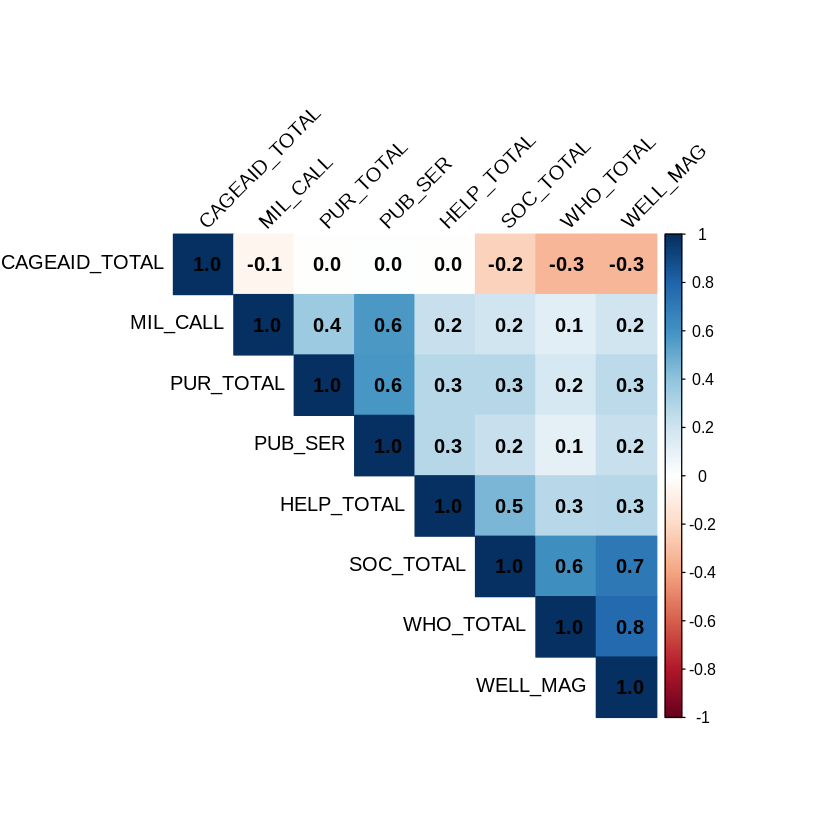

In [ ]:
# Install necessary packages if not already installed
if(!require(dplyr)){install.packages("dplyr")}
if(!require(corrplot)){install.packages("corrplot")}

# Select variables for correlation matrix
selected_vars <- c("CAGEAID_TOTAL", "PUR_TOTAL", "SOC_TOTAL", "HELP_TOTAL", "MIL_CALL", "WHO_TOTAL", "PUB_SER", "WELL_MAG")

# Create correlation matrix (ensure Combat_Exposure_Recoded is numeric)
cor_matrix <- cor(MilitaryDF[, selected_vars],
                  use = "pairwise.complete.obs")


# Visualize correlation matrix with 1 significant figure
corrplot(cor_matrix,
         method = "color",
         type = "upper",
         order = "hclust",
         tl.col = "black",
         tl.srt = 45,
         addCoef.col = "black",  # Add coefficient colors
         number.digits = 1,     # Set number of digits to 1
         insig = "blank")       # Optionally hide insignificant correlations

Loading required package: corrplot

corrplot 0.95 loaded



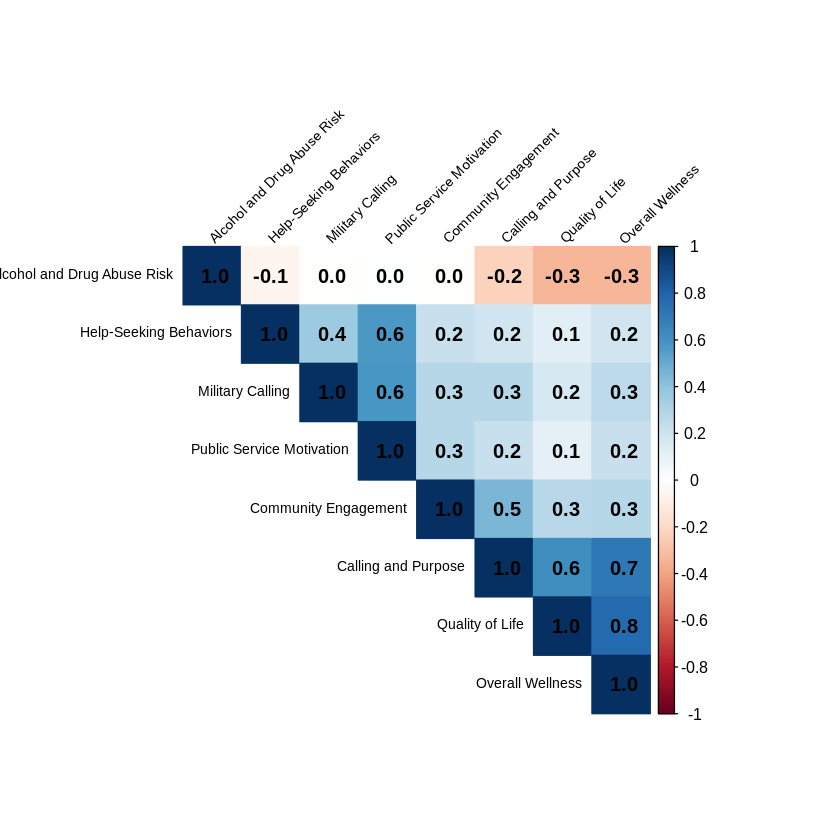

In [ ]:
# prompt: For the above correlation plot, use the labels as follows Alcohol and Drug Use Risk, Military Calling, Calling and Purpose, Community Engagement, Help-Seeking Behaviors, Quality of Life, Public Service Motivation, and Overall Wellness.

# Install and load corrplot if not already installed
if(!require(corrplot)){install.packages("corrplot")}
library(corrplot)

# Define custom labels
labels <- c("Alcohol and Drug Abuse Risk", "Military Calling", "Calling and Purpose", "Community Engagement", "Help-Seeking Behaviors", "Quality of Life", "Public Service Motivation", "Overall Wellness")

# Rename columns in the correlation matrix
colnames(cor_matrix) <- labels
rownames(cor_matrix) <- labels


# Visualize correlation matrix with custom labels and 1 significant figure
corrplot(cor_matrix,
         method = "color",
         type = "upper",
         order = "hclust",
         tl.col = "black",
         tl.srt = 45,
         addCoef.col = "black",  # Add coefficient colors
         number.digits = 1,     # Set number of digits to 1
         insig = "blank",       # Optionally hide insignificant correlations
         tl.cex = 0.7) # Adjust label size as needed

In [ ]:
# prompt: name this model1

model1 <- lm(CAGEAID_TOTAL ~ PUR_TOTAL + SOC_TOTAL + HELP_TOTAL + MIL_CALL + WHO_TOTAL + PUB_SER + WELL_MAG, data = MilitaryDF)
summary(model1)


Call:
lm(formula = CAGEAID_TOTAL ~ PUR_TOTAL + SOC_TOTAL + HELP_TOTAL + 
    MIL_CALL + WHO_TOTAL + PUB_SER + WELL_MAG, data = MilitaryDF)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.4474 -0.8098 -0.3697  0.6389  3.7588 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  2.999366   0.267884  11.197  < 2e-16 ***
PUR_TOTAL    0.019781   0.012742   1.552 0.120778    
SOC_TOTAL    0.001127   0.009499   0.119 0.905598    
HELP_TOTAL   0.031097   0.008661   3.590 0.000341 ***
MIL_CALL    -0.020287   0.010729  -1.891 0.058834 .  
WHO_TOTAL   -0.013270   0.002878  -4.610 4.38e-06 ***
PUB_SER      0.020628   0.013411   1.538 0.124224    
WELL_MAG    -0.015857   0.002906  -5.456 5.72e-08 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.215 on 1449 degrees of freedom
  (38 observations deleted due to missingness)
Multiple R-squared:  0.1453,	Adjusted R-squared:  0.1412 
F-statistic:  35.2 on 7 and 1449 D

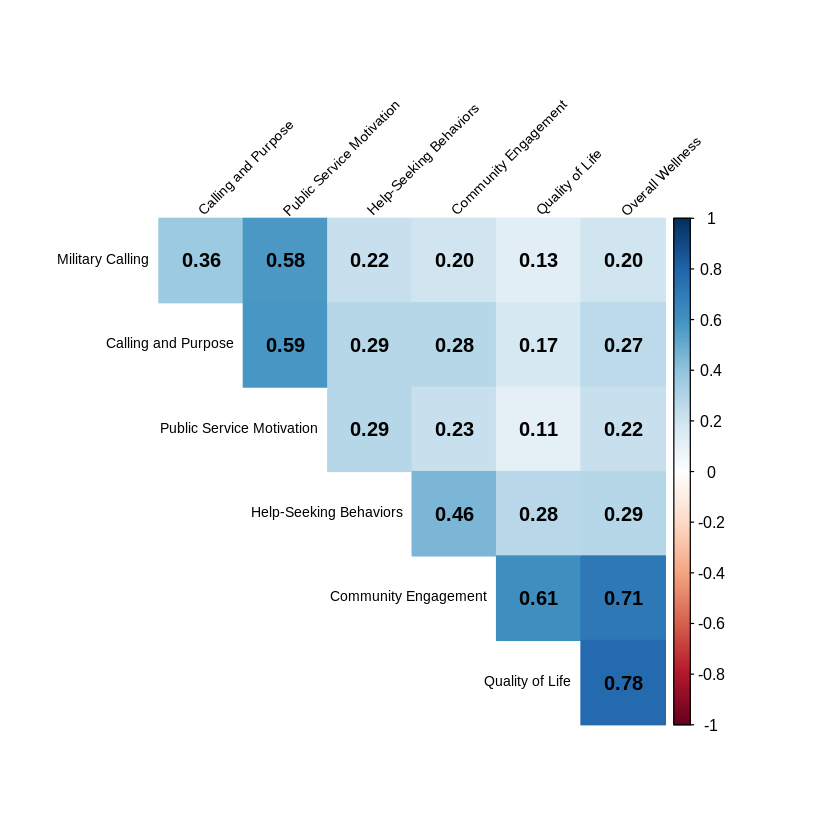

In [ ]:
# prompt: Create correlation heatmap for model1

# Install and load corrplot if not already installed
if(!require(corrplot)){install.packages("corrplot")}
library(corrplot)

# Assuming 'model1' is already defined as in your code
# Extract the relevant variables from the model summary
model_vars <- names(coef(model1))[-1] # Exclude the intercept

# Create a correlation matrix for the variables in model1
cor_matrix_model1 <- cor(MilitaryDF[, model_vars], use = "pairwise.complete.obs")


# Define custom labels (customize these if needed)
labels_model1 <- c("Calling and Purpose", "Community Engagement", "Help-Seeking Behaviors",
                   "Military Calling", "Quality of Life", "Public Service Motivation", "Overall Wellness")

# Rename columns and rows of the correlation matrix
colnames(cor_matrix_model1) <- labels_model1
rownames(cor_matrix_model1) <- labels_model1


# Create the correlation heatmap
corrplot(cor_matrix_model1,
         method = "color",
         type = "upper",
         order = "hclust",
         tl.col = "black",
         tl.srt = 45,
         addCoef.col = "black",  # Add coefficient colors
         number.digits = 2,     # Set number of digits to 1
         insig = "blank",       # Optionally hide insignificant correlations
         tl.cex = 0.7,
         diag=FALSE) # Adjust label size as needed

In [ ]:
# prompt: conduct bivariate analysis for the following variable CAGEAID_TOTAL by the following variables, PUR_TOTAL, SOC_TOTAL, HELP_TOTAL, MIL_CALL, WHO_TOTAL, PUB_SER, and WELL_MAG.

# Correlation Analysis
cor(MilitaryDF[, c("CAGEAID_TOTAL", "PUR_TOTAL", "SOC_TOTAL", "HELP_TOTAL", "MIL_CALL", "WHO_TOTAL", "PUB_SER", "WELL_MAG", "AGE", "GENDER", "RACE_R", "INCOME_WO")], use = "complete.obs")


# Scatterplots
library(ggplot2)

# Function to create scatterplots for each variable against CAGEAID_TOTAL
create_scatterplot <- function(df, x_var) {
  ggplot(df, aes(x = .data[[x_var]], y = CAGEAID_TOTAL)) +
    geom_point() +
    labs(title = paste("Scatterplot of CAGEAID_TOTAL vs.", x_var),
         x = x_var,
         y = "CAGEAID_TOTAL")
}

# Variables for bivariate analysis
variables <- c("PUR_TOTAL", "SOC_TOTAL", "HELP_TOTAL", "MIL_CALL", "WHO_TOTAL", "PUB_SER", "WELL_MAG", "AGE", "GENDER", "RACE_R", "INCOME_WO")

# Create and display scatterplots for each variable
for (var in variables) {
  print(create_scatterplot(MilitaryDF, var))
}

ERROR: Error in cor(MilitaryDF[, c("CAGEAID_TOTAL", "PUR_TOTAL", "SOC_TOTAL", : 'x' must be numeric


In [ ]:
# Convert the required columns to numeric
MilitaryDF$CAGEAID_TOTAL <- as.numeric(as.character(MilitaryDF$CAGEAID_TOTAL))
MilitaryDF$PUR_TOTAL <- as.numeric(as.character(MilitaryDF$PUR_TOTAL))
MilitaryDF$SOC_TOTAL <- as.numeric(as.character(MilitaryDF$SOC_TOTAL))
MilitaryDF$HELP_TOTAL <- as.numeric(as.character(MilitaryDF$HELP_TOTAL))
MilitaryDF$MIL_CALL <- as.numeric(as.character(MilitaryDF$MIL_CALL))
MilitaryDF$WHO_TOTAL <- as.numeric(as.character(MilitaryDF$WHO_TOTAL))
MilitaryDF$PUB_SER <- as.numeric(as.character(MilitaryDF$PUB_SER))
MilitaryDF$WELL_MAG <- as.numeric(as.character(MilitaryDF$WELL_MAG))
MilitaryDF$AGE <- as.numeric(as.character(MilitaryDF$AGE))
MilitaryDF$GENDER <- as.numeric(as.character(MilitaryDF$GENDER))
MilitaryDF$RACE_R <- as.numeric(as.character(MilitaryDF$RACE_R))
MilitaryDF$INCOME_WO <- as.numeric(as.character(MilitaryDF$INCOME_WO))


# Now calculate the correlation
cor(MilitaryDF[, c("CAGEAID_TOTAL", "PUR_TOTAL", "SOC_TOTAL", "HELP_TOTAL", "MIL_CALL", "WHO_TOTAL", "PUB_SER", "WELL_MAG", "AGE", "GENDER", "RACE_R", "INCOME_WO")], use = "complete.obs")

,CAGEAID_TOTAL,PUR_TOTAL,SOC_TOTAL,HELP_TOTAL,MIL_CALL,WHO_TOTAL,PUB_SER,WELL_MAG,AGE,GENDER,RACE_R,INCOME_WO
CAGEAID_TOTAL,1.000000000,-0.016578901,-0.221773620,-0.01243767,-0.05117685,-0.33909423,0.004456525,-0.33353232,-0.24162518,-0.011568291,0.092412541,-0.086518244
PUR_TOTAL,-0.016578901,1.000000000,0.285247324,0.29123695,0.36707371,0.17676553,0.584609449,0.27067847,0.06473304,0.050940485,0.051477228,-0.002595414
SOC_TOTAL,-0.221773620,0.285247324,1.000000000,0.46301768,0.20555727,0.61154810,0.224216058,0.71128744,0.08632253,-0.017384285,0.005860249,0.191310823
HELP_TOTAL,-0.012437672,0.291236949,0.463017675,1.00000000,0.23702786,0.28605970,0.295866689,0.29873236,-0.15267521,0.027420400,0.042329481,0.064504433
MIL_CALL,-0.051176846,0.367073715,0.205557274,0.23702786,1.00000000,0.12871323,0.590142522,0.19875133,0.12253743,-0.039776122,-0.101588126,0.052881283
WHO_TOTAL,-0.339094228,0.176765528,0.611548100,0.28605970,0.12871323,1.00000000,0.108494836,0.78145794,0.17723157,-0.104542478,-0.041333892,0.256309431
PUB_SER,0.004456525,0.584609449,0.224216058,0.29586669,0.59014252,0.10849484,1.000000000,0.21211139,0.03143483,-0.002392185,-0.065196313,0.054456152
WELL_MAG,-0.333532318,0.270678473,0.711287443,0.29873236,0.19875133,0.78145794,0.212111390,1.00000000,0.28037752,-0.093091631,-0.013058648,0.195160096
AGE,-0.241625179,0.064733041,0.086322527,-0.15267521,0.12253743,0.17723157,0.031434826,0.28037752,1.00000000,-0.158909457,-0.156998998,0.061008550
GENDER,-0.011568291,0.050940485,-0.017384285,0.02742040,-0.03977612,-0.10454248,-0.002392185,-0.09309163,-0.15890946,1.000000000,0.069012032,-0.160686951


In [ ]:
# prompt: name the above correlation "model1a)

model1a <- cor(MilitaryDF[, c("CAGEAID_TOTAL", "PUR_TOTAL", "SOC_TOTAL", "HELP_TOTAL", "MIL_CALL", "WHO_TOTAL", "PUB_SER", "WELL_MAG", "AGE", "GENDER", "RACE_R", "INCOME_WO")], use = "complete.obs")

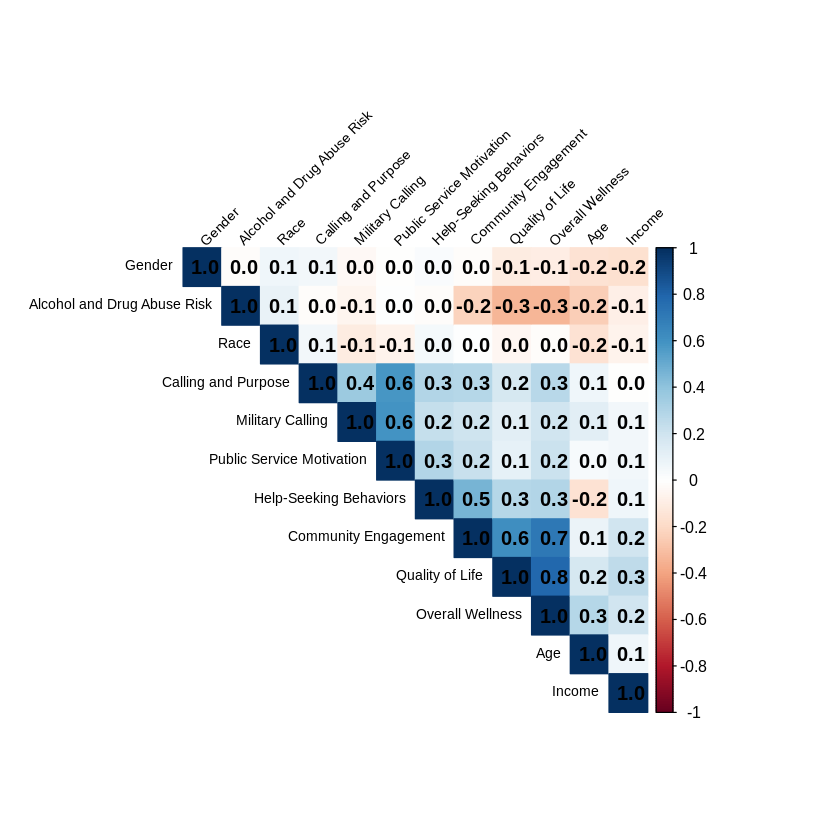

In [ ]:
# prompt: create a correlation matrix for model1a.  Use the appropriate labels for the matrix

# Install and load corrplot if not already installed
if(!require(corrplot)){install.packages("corrplot")}
library(corrplot)

# Define custom labels
labels <- c("Alcohol and Drug Abuse Risk", "Calling and Purpose", "Community Engagement", "Help-Seeking Behaviors", "Military Calling", "Quality of Life", "Public Service Motivation", "Overall Wellness", "Age", "Gender", "Race", "Income")

# Rename columns in the correlation matrix
colnames(model1a) <- labels
rownames(model1a) <- labels


# Visualize correlation matrix with custom labels and 1 significant figure
corrplot(model1a,
         method = "color",
         type = "upper",
         order = "hclust",
         tl.col = "black",
         tl.srt = 45,
         addCoef.col = "black",  # Add coefficient colors
         number.digits = 1,     # Set number of digits to 1
         insig = "blank",       # Optionally hide insignificant correlations
         tl.cex = 0.7) # Adjust label size as needed

In [ ]:
# prompt: conduct a linear regression for model1a

model1a <- lm(CAGEAID_TOTAL ~ PUR_TOTAL + SOC_TOTAL + HELP_TOTAL + MIL_CALL + WHO_TOTAL + PUB_SER + WELL_MAG + AGE + GENDER + RACE_R + INCOME_WO, data = MilitaryDF)
summary(model1a)



Call:
lm(formula = CAGEAID_TOTAL ~ PUR_TOTAL + SOC_TOTAL + HELP_TOTAL + 
    MIL_CALL + WHO_TOTAL + PUB_SER + WELL_MAG + AGE + GENDER + 
    RACE_R + INCOME_WO, data = MilitaryDF)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.4599 -0.7900 -0.3168  0.5176  4.0672 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.609e+00  3.244e-01  11.124  < 2e-16 ***
PUR_TOTAL    1.859e-02  1.293e-02   1.437  0.15091    
SOC_TOTAL   -3.484e-03  9.540e-03  -0.365  0.71503    
HELP_TOTAL   1.732e-02  8.908e-03   1.944  0.05204 .  
MIL_CALL    -8.435e-03  1.096e-02  -0.770  0.44163    
WHO_TOTAL   -1.580e-02  2.955e-03  -5.348 1.04e-07 ***
PUB_SER      1.636e-02  1.357e-02   1.206  0.22813    
WELL_MAG    -9.766e-03  3.045e-03  -3.207  0.00137 ** 
AGE         -1.521e-02  2.647e-03  -5.747 1.12e-08 ***
GENDER      -2.226e-01  6.794e-02  -3.277  0.00108 ** 
RACE_R       1.956e-01  8.451e-02   2.314  0.02079 *  
INCOME_WO   -9.698e-08  7.344e-07  -0.132  0.89496

Loading required package: cluster

Loading required package: dendextend

Warning message in library(package, lib.loc = lib.loc, character.only = TRUE, logical.return = TRUE, :
“there is no package called ‘dendextend’”
Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘gridExtra’, ‘viridis’



---------------------
Welcome to dendextend version 1.19.0
Type citation('dendextend') for how to cite the package.

Type browseVignettes(package = 'dendextend') for the package vignette.
The github page is: https://github.com/talgalili/dendextend/

Suggestions and bug-reports can be submitted at: https://github.com/talgalili/dendextend/issues
You may ask questions at stackoverflow, use the r and dendextend tags: 
	 https://stackoverflow.com/questions/tagged/dendextend

	To suppress this message use:  suppressPackageStartupMessages(library(dendextend))
---------------------



Attaching package: ‘dendextend’


The following object i

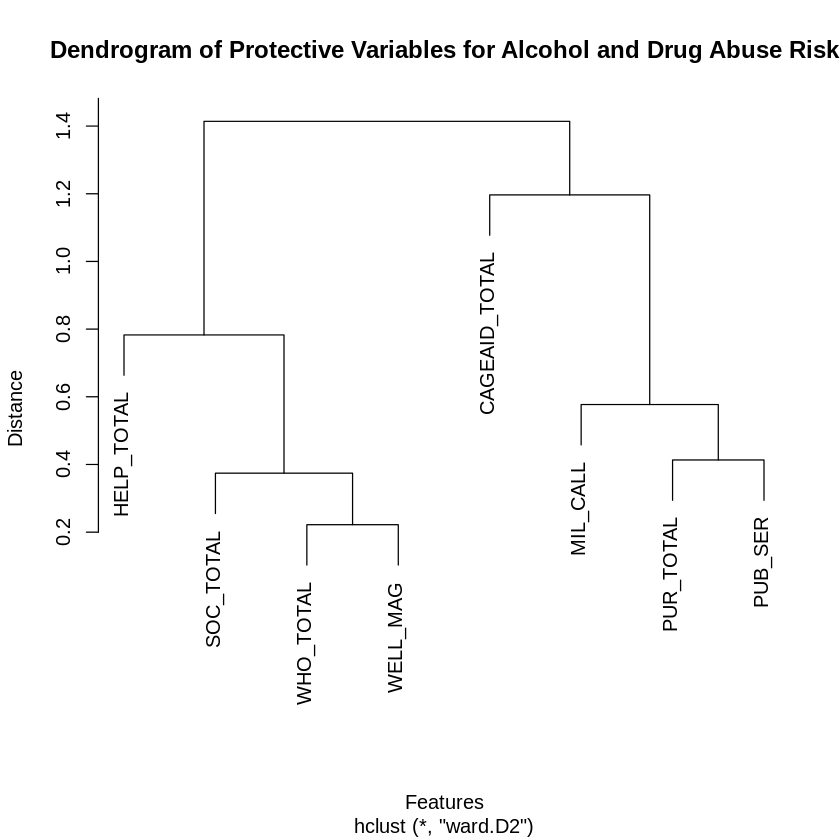

In [ ]:
# Install necessary packages if not already installed
if(!require(cluster)){install.packages("cluster")}
if(!require(dendextend)){install.packages("dendextend")}
library(cluster)
library(dendextend)

# Select composite variables for clustering
composite_vars <- c("CAGEAID_TOTAL", "PUR_TOTAL", "SOC_TOTAL", "HELP_TOTAL", "MIL_CALL", "WHO_TOTAL", "PUB_SER", "WELL_MAG")

# Subset the data to include only composite variables
composite_data <- MilitaryDF[, composite_vars]

# Calculate correlation matrix for composite variables
cor_matrix <- cor(composite_data, use = "pairwise.complete.obs")

# Perform hierarchical clustering on the correlation matrix
# Changed 'ward.d2' to 'ward.D2'
hc_model <- hclust(as.dist(1 - cor_matrix), method = "ward.D2") # Use correlation as distance

# Create dendrogram
dend <- as.dendrogram(hc_model) # Changed hc to hc_model

# Plot the dendrogram
plot(hc_model, main = "Dendrogram of Protective Variables for Alcohol and Drug Abuse Risk",
     xlab = "Features", ylab = "Distance")


# Customize dendrogram (optional)
# dend <- color_branches(dend, k = 3)  # Color branches based on clusters
# dend <- set(dend, "labels_cex", 0.8) # Adjust label size
# plot(dend)

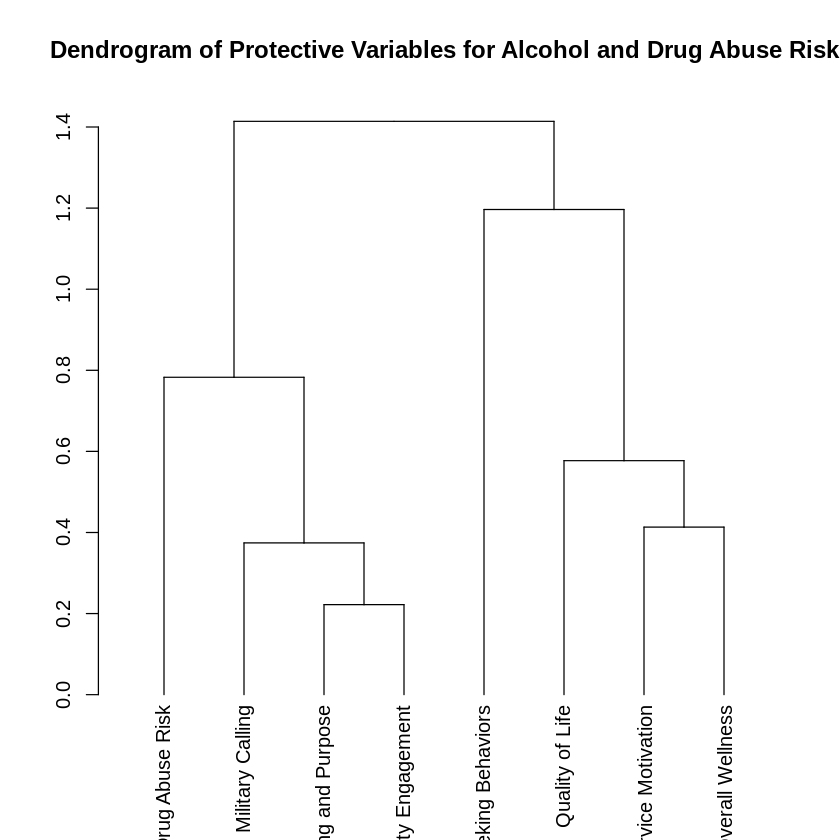

In [ ]:
# prompt: use the labels # Define custom labels
# For the above dendrogram use the following labels  CAGEAID_TOTAL = "Alcohol and Drug Abuse Risk", MIL_CALL = "Military Calling", PUR_TOTAL = "Calling and Purpose", SOC_TOTAL = "Community Engagement", HELP_TOTAL = "Help-Seeking Behaviors", WHO_TOTAL = "Quality of Life",  PUR_TOTAL ="Public Service Motivation", WELL_MAG ="Overall Wellness"

# Define custom labels
labels <- c("Alcohol and Drug Abuse Risk", "Military Calling", "Calling and Purpose", "Community Engagement", "Help-Seeking Behaviors", "Quality of Life", "Public Service Motivation", "Overall Wellness")

# Rename columns in the correlation matrix
colnames(cor_matrix) <- labels
rownames(cor_matrix) <- labels

# ... (rest of your existing code)

# Create dendrogram with custom labels
dend <- as.dendrogram(hc_model)
dend <- dend %>%
  set("labels", labels) # Set custom labels

# Define custom labels
labels <- c("Alcohol and Drug Abuse Risk", "Military Calling", "Calling and Purpose", "Community Engagement", "Help-Seeking Behaviors", "Quality of Life", "Public Service Motivation", "Overall Wellness")

plot(dend, main = "Dendrogram of Protective Variables for Alcohol and Drug Abuse Risk")

In [ ]:
install.packages("car")  # Install if not already installed
library(car)            # Load the package

vif(model1)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘RcppEigen’, ‘pbkrtest’, ‘lme4’


Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode




PUR_TOTAL  SOC_TOTAL HELP_TOTAL   MIL_CALL  WHO_TOTAL    PUB_SER   WELL_MAG 
  1.594101   2.387757   1.359469   1.531059   2.627563   2.037605   3.385041

In [ ]:
# prompt: conduct multiple linear regression analysis for the variables CAGEAID_TOTAL, PUR_TOTAL, SOC_TOTAL, HELP_TOTAL, MIL_CALL, WHO_TOTAL, PUB_SER, AND WELL_MAG. Limit to 2 decimal places

# Multiple Linear Regression
model1 <- lm(CAGEAID_TOTAL ~ PUR_TOTAL + SOC_TOTAL + HELP_TOTAL + MIL_CALL + WHO_TOTAL + PUB_SER + WELL_MAG, data = MilitaryDF)

# Summarize the model
summary(model1)

# Print coefficients rounded to 2 decimal places
round(coef(model1), 3)


Call:
lm(formula = CAGEAID_TOTAL ~ PUR_TOTAL + SOC_TOTAL + HELP_TOTAL + 
    MIL_CALL + WHO_TOTAL + PUB_SER + WELL_MAG, data = MilitaryDF)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.4474 -0.8098 -0.3697  0.6389  3.7588 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  2.999366   0.267884  11.197  < 2e-16 ***
PUR_TOTAL    0.019781   0.012742   1.552 0.120778    
SOC_TOTAL    0.001127   0.009499   0.119 0.905598    
HELP_TOTAL   0.031097   0.008661   3.590 0.000341 ***
MIL_CALL    -0.020287   0.010729  -1.891 0.058834 .  
WHO_TOTAL   -0.013270   0.002878  -4.610 4.38e-06 ***
PUB_SER      0.020628   0.013411   1.538 0.124224    
WELL_MAG    -0.015857   0.002906  -5.456 5.72e-08 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.215 on 1449 degrees of freedom
  (38 observations deleted due to missingness)
Multiple R-squared:  0.1453,	Adjusted R-squared:  0.1412 
F-statistic:  35.2 on 7 and 1449 D

(Intercept)   PUR_TOTAL   SOC_TOTAL  HELP_TOTAL    MIL_CALL   WHO_TOTAL 
      2.999       0.020       0.001       0.031      -0.020      -0.013 
    PUB_SER    WELL_MAG 
      0.021      -0.016

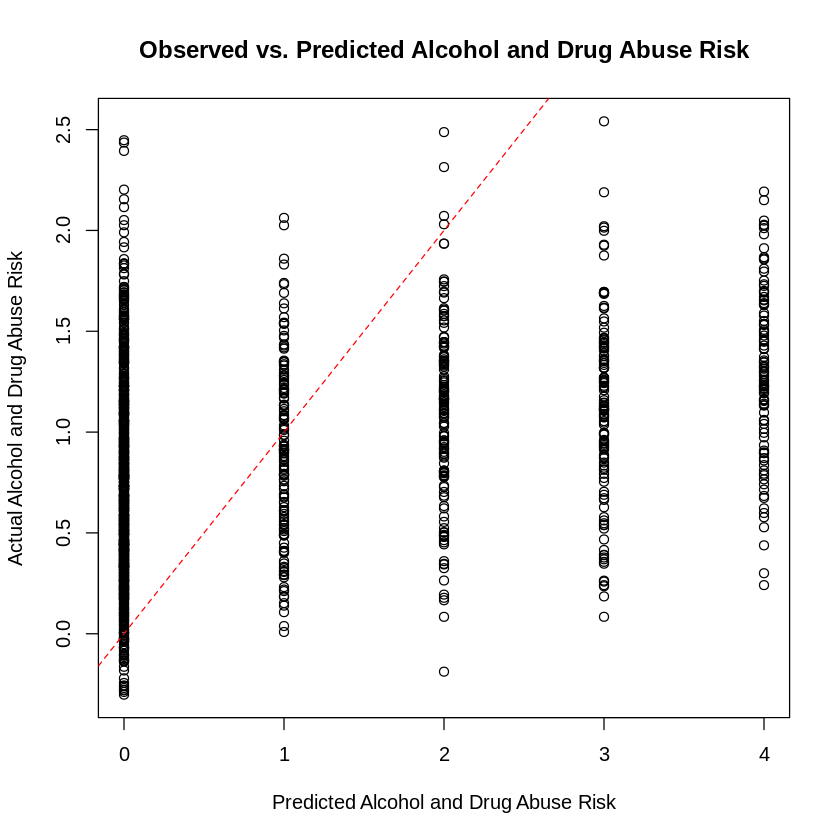

In [ ]:
# prompt: produce a "y versus y-estimate" scatterplot for the above model

# Assuming 'model' is the linear regression model from the previous code

# Create the scatterplot
# Remove rows with missing values in any of the variables used in the model
complete_data <- MilitaryDF[complete.cases(MilitaryDF[, c("CAGEAID_TOTAL", "PUR_TOTAL", "SOC_TOTAL", "HELP_TOTAL", "MIL_CALL", "WHO_TOTAL", "PUB_SER", "WELL_MAG")]), ]

# Now use the complete data for the plot
plot(complete_data$CAGEAID_TOTAL, predict(model1, newdata = complete_data),
     ylab = "Actual Alcohol and Drug Abuse Risk",
     xlab = "Predicted Alcohol and Drug Abuse Risk",
     main = "Observed vs. Predicted Alcohol and Drug Abuse Risk")

# Add a reference line (y = x) for comparison
abline(a = 0, b = 1, col = "red", lty = 2)


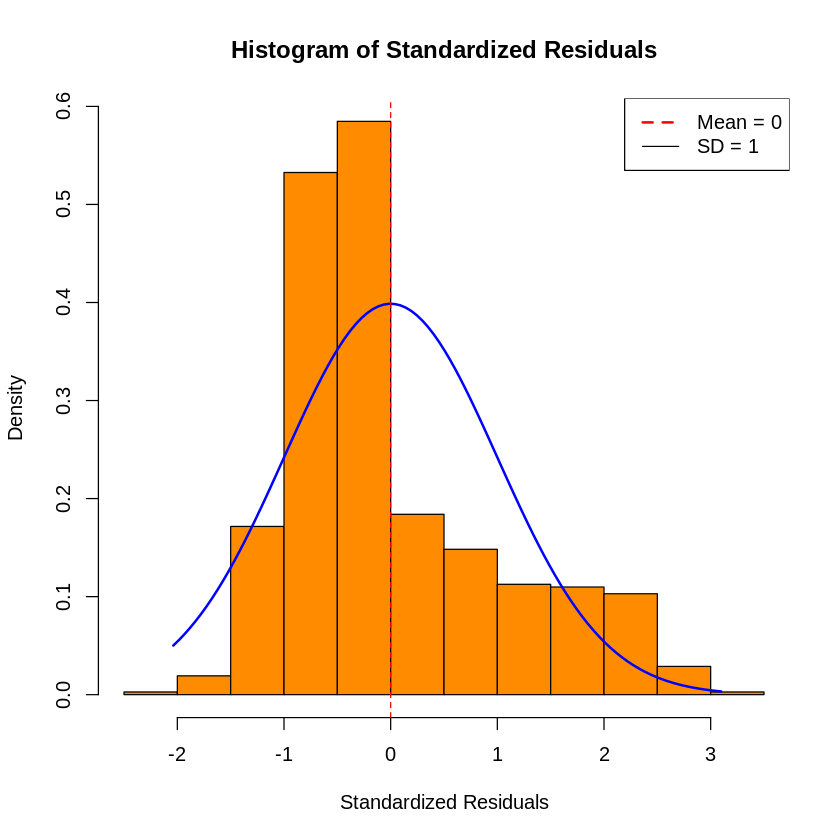

In [ ]:
# prompt: Produce a standardized error terms histogram for the model. use the color darkorange. what is the mean and sd for the histogram. display on chart in a legend. use 2 decimal places. show the mean line

# Calculate standardized residuals
std_residuals <- rstandard(model1)

# Create the histogram of standardized residuals
hist(std_residuals,
     main = "Histogram of Standardized Residuals",
     xlab = "Standardized Residuals",
     col = "darkorange",
     freq = FALSE) # Set freq = FALSE for density plot

# Calculate mean and standard deviation of standardized residuals
mean_std_res <- mean(std_residuals)
sd_std_res <- sd(std_residuals)

# Add a normal curve to the histogram
xfit <- seq(min(std_residuals), max(std_residuals), length = 100)
yfit <- dnorm(xfit, mean = mean_std_res, sd = sd_std_res)
lines(xfit, yfit, col = "blue", lwd = 2)

# Add mean line
abline(v = mean_std_res, col = "red", lty = 2)

# Add legend
legend("topright",
       legend = c(paste("Mean =", round(mean_std_res, 2)),
                  paste("SD =", round(sd_std_res, 2))),
       col = c("red", "black"), # Adjust colors if needed
       lty = c(2, 1), # Adjust line types if needed
       lwd = c(2, 1)) # Adjust line widths if needed

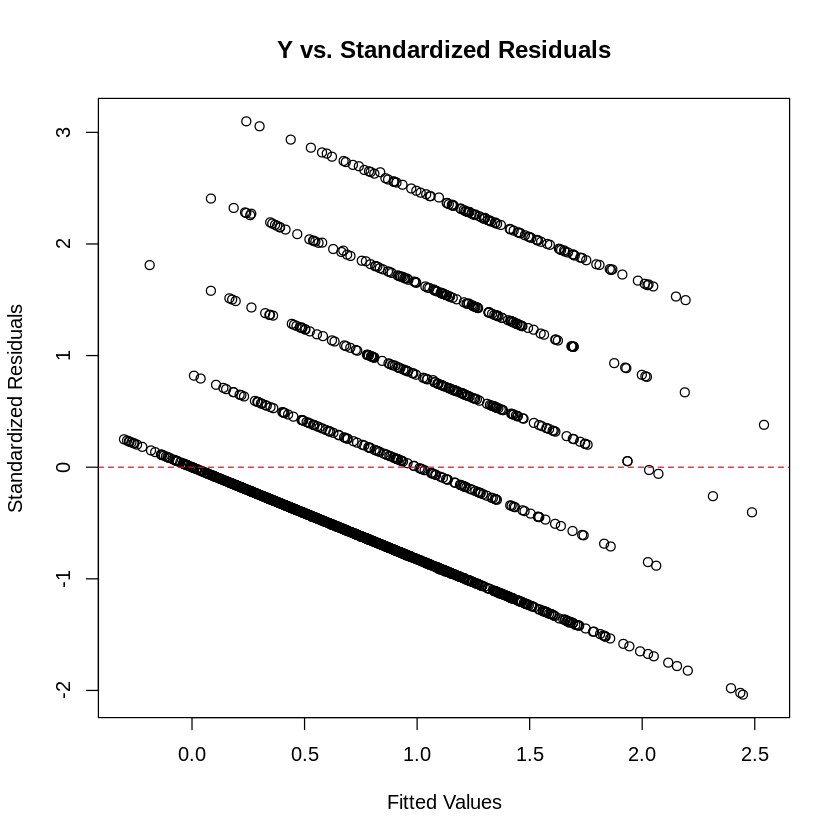

In [ ]:
# prompt: Produce a Y versus standardized error terms scatterplot for the model

# Assuming 'model' is your linear regression model and 'MilitaryDF' your dataframe

# Extract fitted values and standardized residuals
fitted_values <- fitted(model1)
std_residuals <- rstandard(model1)

# Create the scatterplot
plot(fitted_values, std_residuals,
     xlab = "Fitted Values",
     ylab = "Standardized Residuals",
     main = "Y vs. Standardized Residuals")

# Add a horizontal line at y = 0
abline(h = 0, col = "red", lty = 2)

,CAGEAID_TOTAL,HELP_TOTAL,WHO_TOTAL,WELL_MAG
CAGEAID_TOTAL,1.0000000000,-0.0004007257,-0.3328458,-0.3396049
HELP_TOTAL,-0.0004007257,1.0000000000,0.2793158,0.2881854
WHO_TOTAL,-0.3328457864,0.2793157691,1.0000000,0.7779921
WELL_MAG,-0.3396049087,0.2881853948,0.7779921,1.0000000


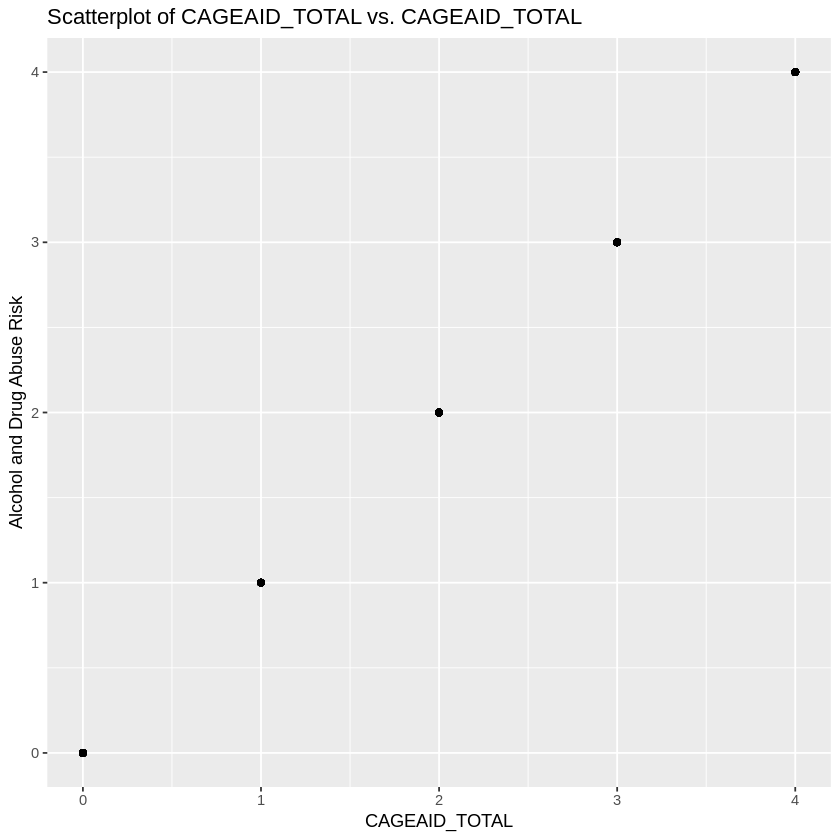

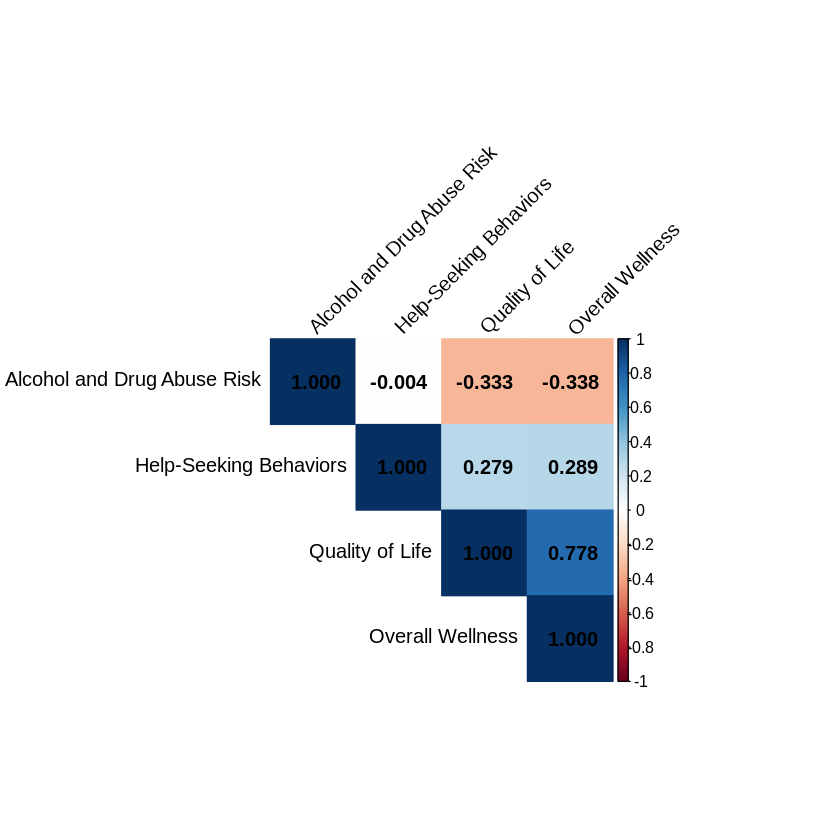

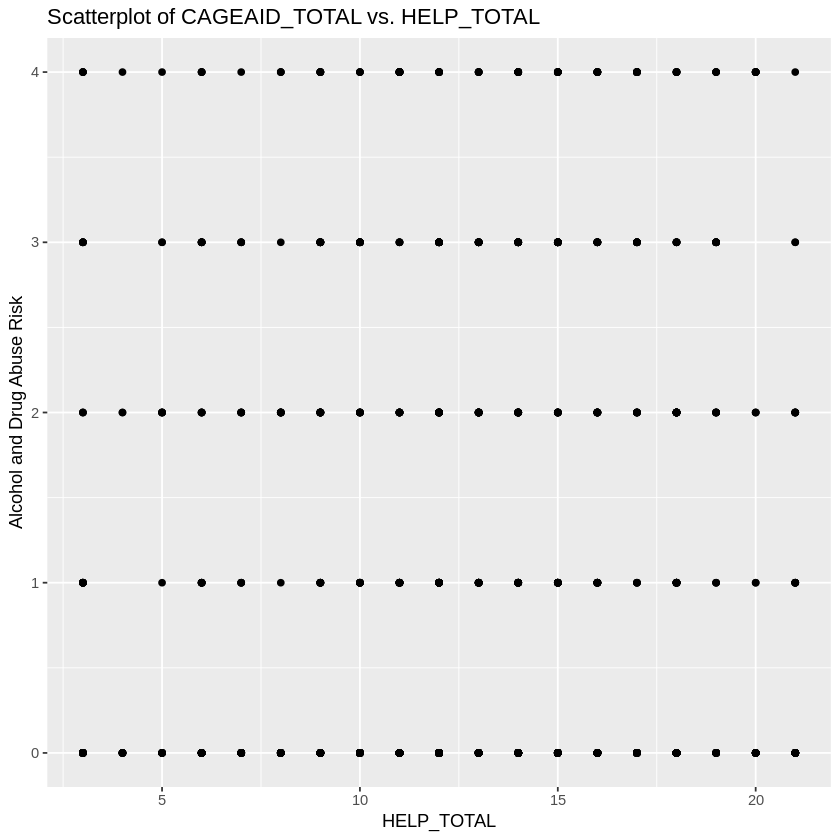

Warning message:
“Removed 38 rows containing missing values or values outside the scale range
(`geom_point()`).”


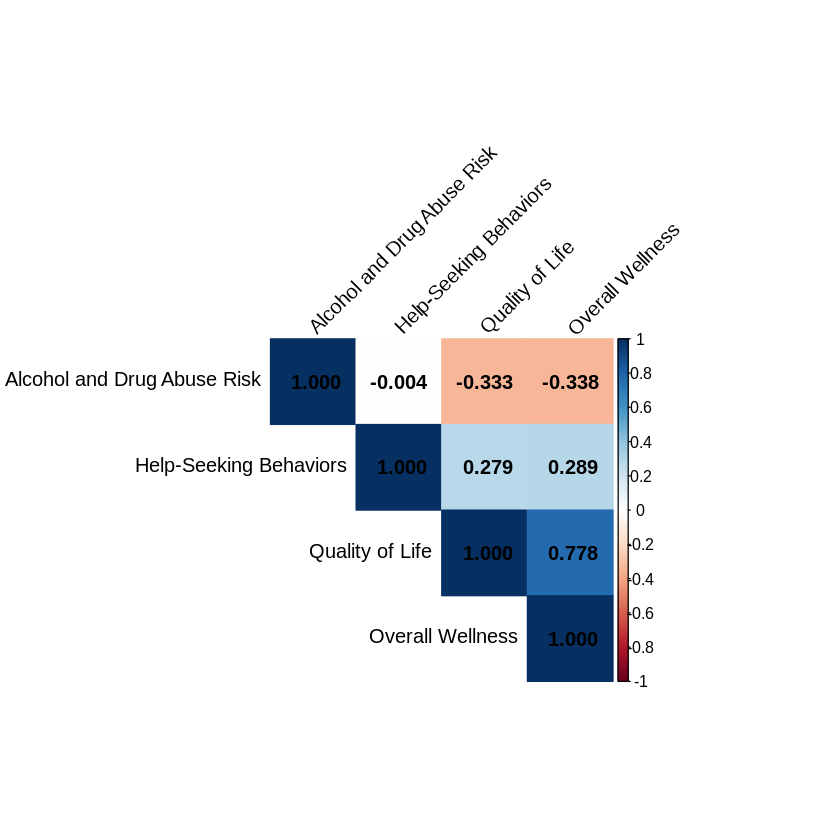

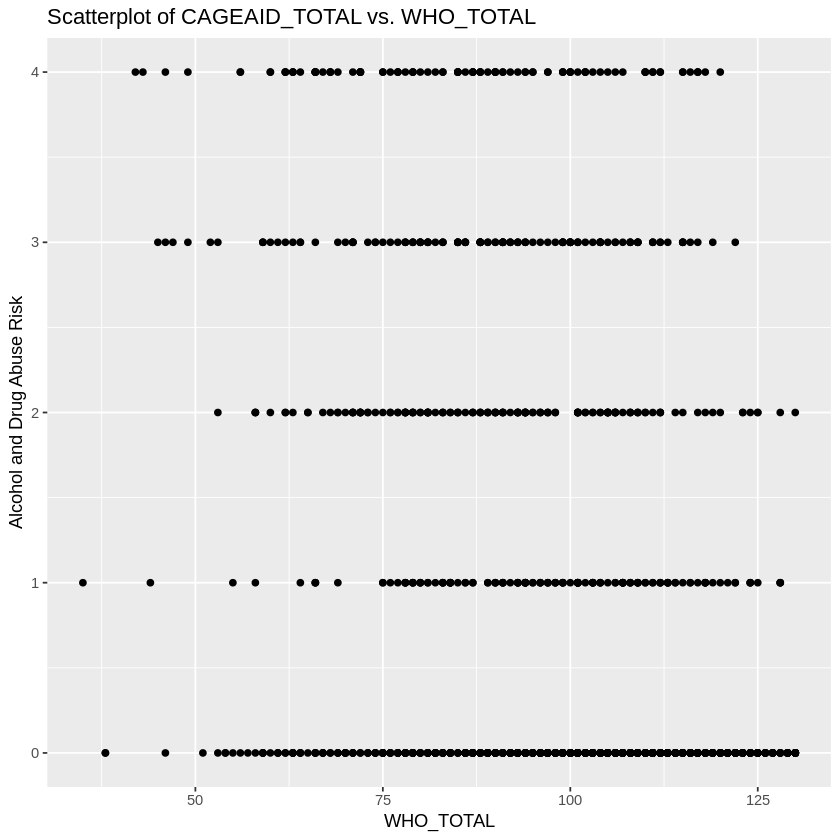

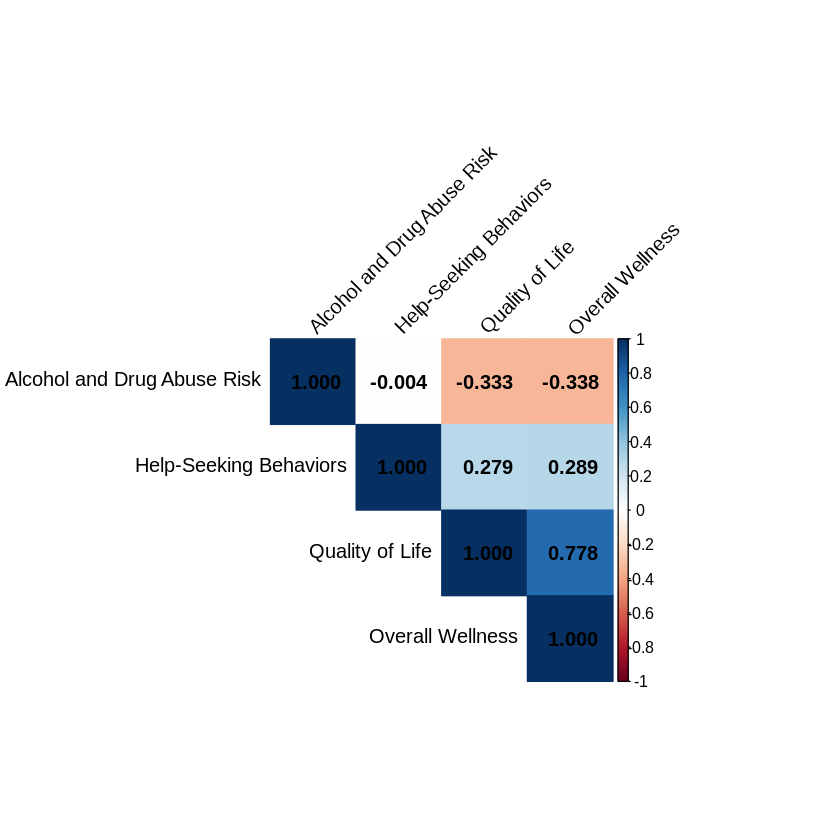

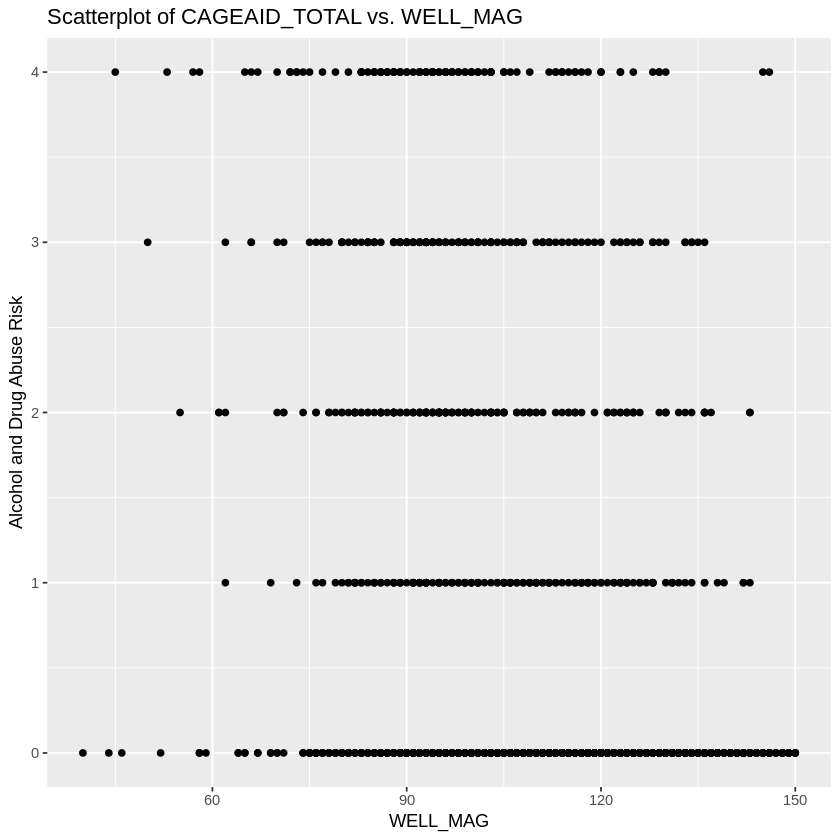

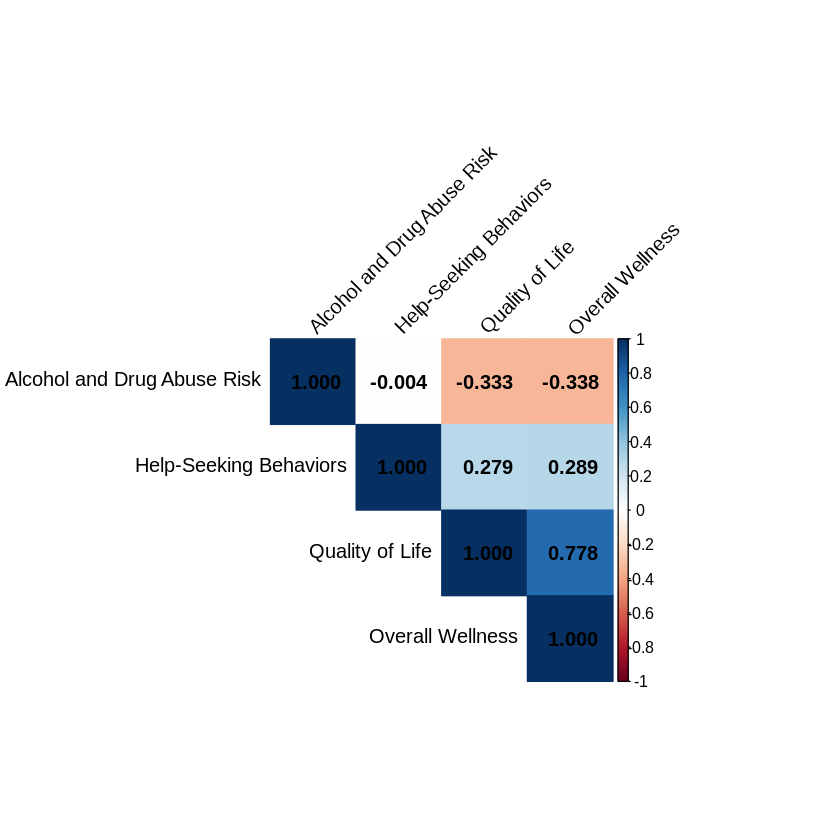

In [ ]:
# prompt: conduct bivariate analysis for the following variable CAGEAID_TOTAL by the following variables, PUR_TOTAL, SOC_TOTAL, HELP_TOTAL, MIL_CALL, WHO_TOTAL, PUB_SER, and WELL_MAG.

# Correlation Analysis
cor(MilitaryDF[, c("CAGEAID_TOTAL", "HELP_TOTAL", "WHO_TOTAL", "WELL_MAG")], use = "complete.obs")


# Scatterplots
library(ggplot2)

# Function to create scatterplots for each variable against CAGEAID_TOTAL
create_scatterplot <- function(df, x_var) {
  ggplot(df, aes(x = .data[[x_var]], y = CAGEAID_TOTAL)) +
    geom_point() +
    labs(title = paste("Scatterplot of CAGEAID_TOTAL vs.", x_var),
         x = x_var,
         y = "Alcohol and Drug Abuse Risk")
}

# Variables for bivariate analysis
variables <- c("CAGEAID_TOTAL", "HELP_TOTAL", "WHO_TOTAL", "WELL_MAG")

# Create and display scatterplots for each variable
for (var in variables) {
  print(create_scatterplot(MilitaryDF, var))

  selected_vars <- c("CAGEAID_TOTAL", "HELP_TOTAL", "WHO_TOTAL", "WELL_MAG")

# Create correlation matrix (ensure Combat_Exposure_Recoded is numeric)
cor_matrix <- cor(MilitaryDF[, selected_vars],
                  use = "pairwise.complete.obs")

labels <- c("Alcohol and Drug Abuse Risk", "Help-Seeking Behaviors", "Quality of Life", "Overall Wellness")

# Rename columns in the correlation matrix
colnames(cor_matrix) <- labels
rownames(cor_matrix) <- labels

# Visualize correlation matrix with 1 significant figure
corrplot(cor_matrix,
         method = "color",
         type = "upper",
         order = "hclust",
         tl.col = "black",
         tl.srt = 45,
         addCoef.col = "black",  # Add coefficient colors
         number.digits = 3,     # Set number of digits to 1
         insig = "blank")       # Optionally hide insignificant correlations

labels <- c("Alcohol and Drug Abuse Risk", "Help-Seeking Behaviors", "Quality of Life", "Overall Wellness")
}

In [ ]:
# prompt: name this model2

model2 <- lm(CAGEAID_TOTAL ~ HELP_TOTAL + WHO_TOTAL + WELL_MAG, data = MilitaryDF)
summary(model2)
round(coef(model2), 3)



Call:
lm(formula = CAGEAID_TOTAL ~ HELP_TOTAL + WHO_TOTAL + WELL_MAG, 
    data = MilitaryDF)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.2847 -0.8253 -0.3808  0.6315  3.7992 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.357986   0.192103  17.480  < 2e-16 ***
HELP_TOTAL   0.036010   0.007804   4.614 4.29e-06 ***
WHO_TOTAL   -0.013916   0.002843  -4.894 1.10e-06 ***
WELL_MAG    -0.014666   0.002537  -5.782 9.03e-09 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.218 on 1453 degrees of freedom
  (38 observations deleted due to missingness)
Multiple R-squared:  0.1399,	Adjusted R-squared:  0.1381 
F-statistic: 78.76 on 3 and 1453 DF,  p-value: < 2.2e-16


(Intercept)  HELP_TOTAL   WHO_TOTAL    WELL_MAG 
      3.358       0.036      -0.014      -0.015

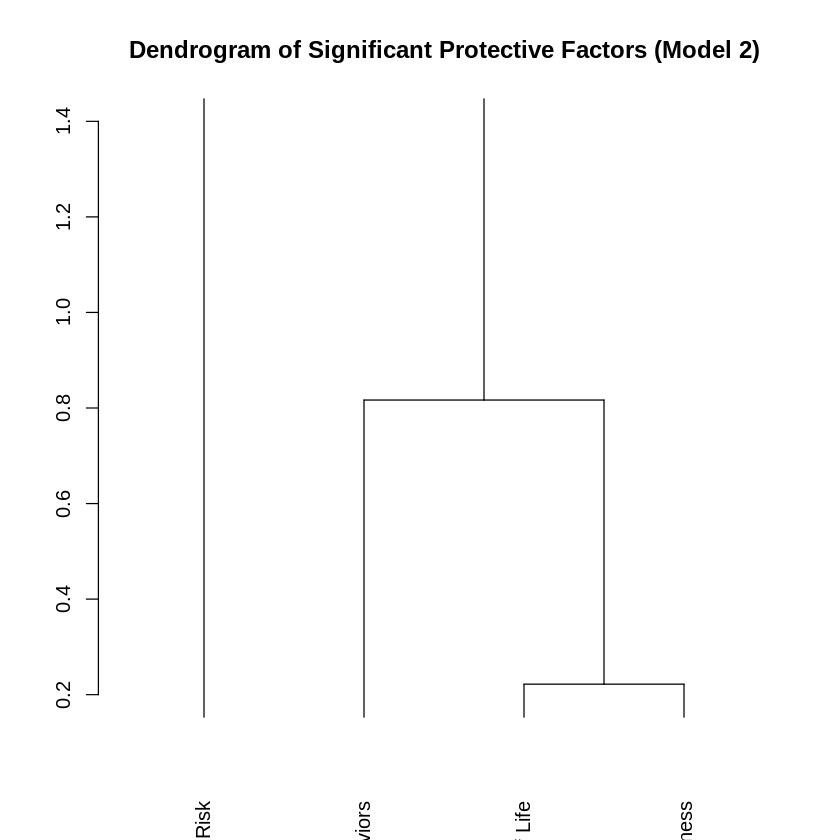

In [ ]:
# prompt: Produce a dendrogram for model2 composite variables

# Install necessary packages if not already installed
if(!require(cluster)){install.packages("cluster")}
if(!require(dendextend)){install.packages("dendextend")}
library(cluster)
library(dendextend)

# Select composite variables for clustering
composite_vars <- c("CAGEAID_TOTAL", "HELP_TOTAL", "WHO_TOTAL", "WELL_MAG")

# Subset the data to include only composite variables
composite_data <- MilitaryDF[, composite_vars]

# Calculate correlation matrix for composite variables
cor_matrix <- cor(composite_data, use = "pairwise.complete.obs")

# Perform hierarchical clustering on the correlation matrix
hc_model2 <- hclust(as.dist(1 - cor_matrix), method = "ward.D2")

# Create dendrogram
dend2 <- as.dendrogram(hc_model2)

# Define custom labels
labels2 <- c("Alcohol and Drug Abuse Risk", "Help-Seeking Behaviors", "Quality of Life", "Overall Wellness")

# Set custom labels on the dendrogram
dend2 <- dend2 %>% set("labels", labels2)

# Plot the dendrogram with custom labels and title
plot(dend2, main = "Dendrogram of Significant Protective Factors (Model 2)", ylim =c(0.2, 1.4))

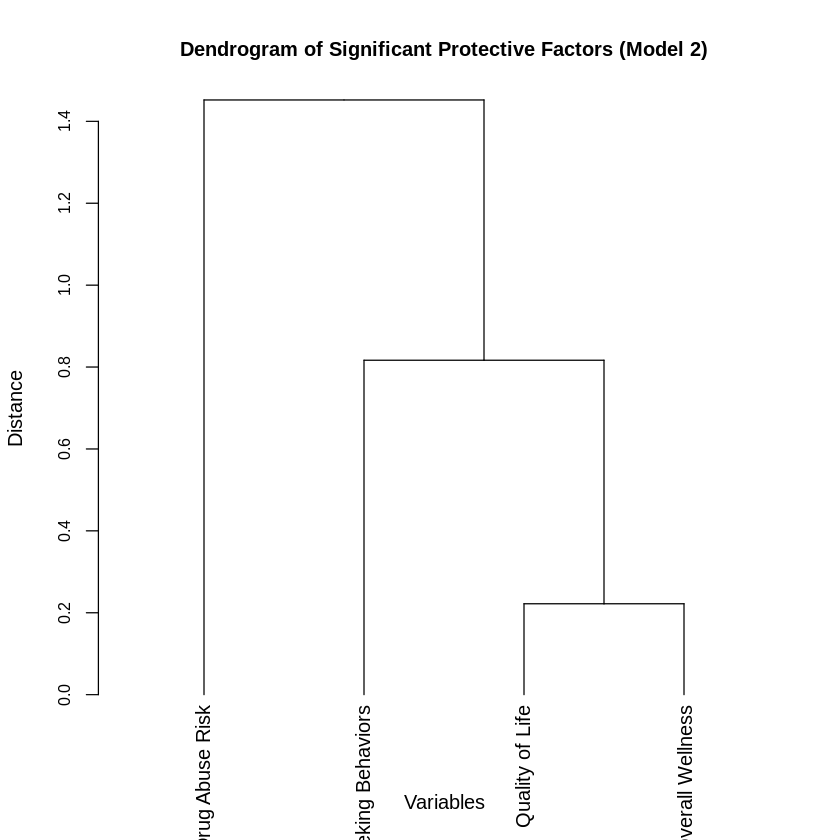

In [ ]:
# prompt: From the above model2 dendrogram, fit the dendrogram to the paper

# Assuming 'dend2' is the dendrogram object from your previous code.

# Adjust plot parameters for better fit on the page
plot(dend2,
     main = "Dendrogram of Significant Protective Factors (Model 2)",
     xlab = "Variables",
     ylab = "Distance",
     horiz = FALSE, # Set to TRUE for horizontal orientation
     ylim = c(0, 1.4),  # Adjust y-axis limits as needed
     cex = 0.8, # Adjust the text size of the labels
     cex.axis = 0.8, # Adjust the axis label size
     cex.main = 1.0 # Adjust the title size
     )

In [ ]:
# prompt: perform vif for model2

# Install and load the 'car' package if not already installed
if(!require(car)){install.packages("car")}
library(car)

# Calculate Variance Inflation Factors (VIFs) for model2
vif(model2)

HELP_TOTAL  WHO_TOTAL   WELL_MAG 
  1.099801   2.554826   2.568850


Call:
lm(formula = CAGEAID_TOTAL ~ HELP_TOTAL + WHO_TOTAL + WELL_MAG, 
    data = MilitaryDF)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.2847 -0.8253 -0.3808  0.6315  3.7992 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.357986   0.192103  17.480  < 2e-16 ***
HELP_TOTAL   0.036010   0.007804   4.614 4.29e-06 ***
WHO_TOTAL   -0.013916   0.002843  -4.894 1.10e-06 ***
WELL_MAG    -0.014666   0.002537  -5.782 9.03e-09 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.218 on 1453 degrees of freedom
  (38 observations deleted due to missingness)
Multiple R-squared:  0.1399,	Adjusted R-squared:  0.1381 
F-statistic: 78.76 on 3 and 1453 DF,  p-value: < 2.2e-16


(Intercept)  HELP_TOTAL   WHO_TOTAL    WELL_MAG 
       3.36        0.04       -0.01       -0.01

HELP_TOTAL  WHO_TOTAL   WELL_MAG 
  1.099801   2.554826   2.568850

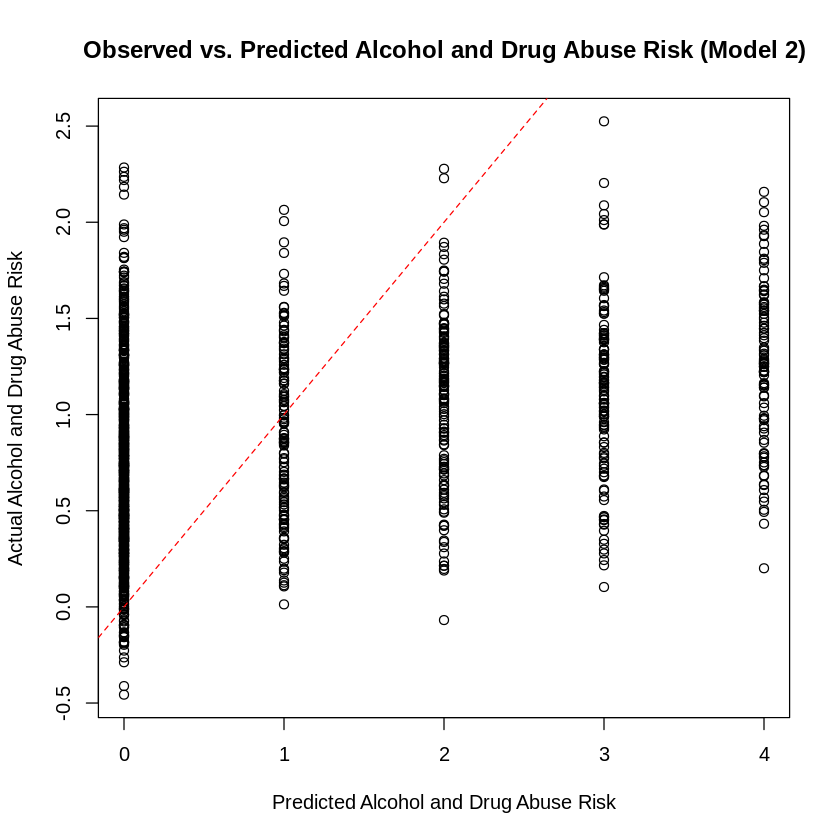

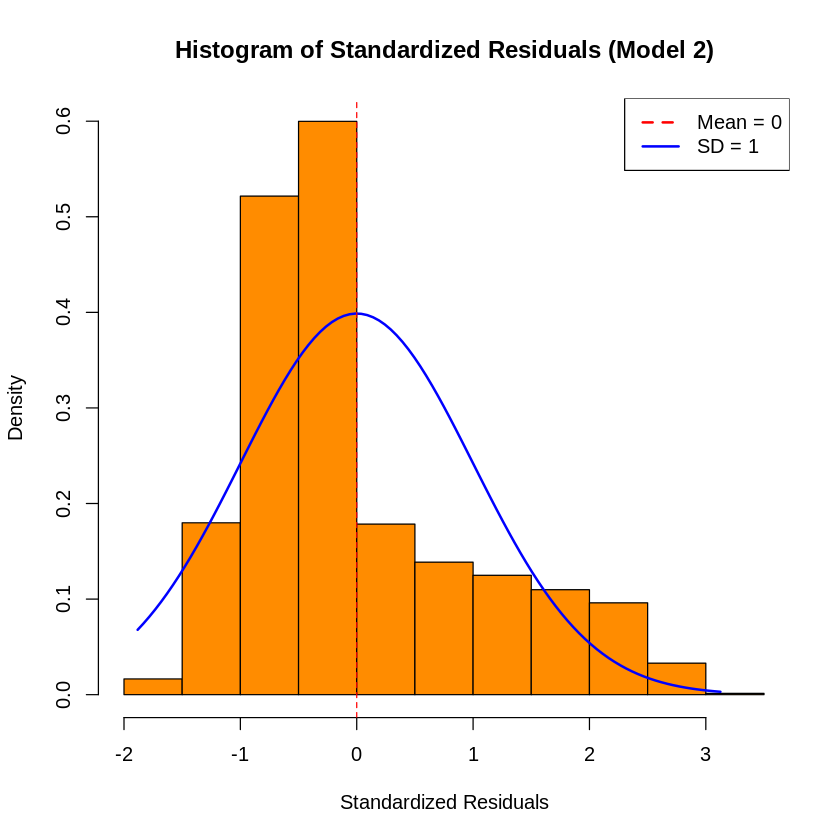

In [ ]:
# Multiple Linear Regression Model 2
model2 <- lm(CAGEAID_TOTAL ~ HELP_TOTAL + WHO_TOTAL + WELL_MAG, data = MilitaryDF)

# Summarize the model
summary(model2)

# Print coefficients rounded to 2 decimal places
round(coef(model2), 2)

# Calculate variance inflation factors (VIFs)
vif(model2)

# Create the scatterplot
# Remove rows with missing values in any of the variables used in the model
complete_data2 <- MilitaryDF[complete.cases(MilitaryDF[, c("CAGEAID_TOTAL", "HELP_TOTAL", "WHO_TOTAL", "WELL_MAG")]), ]

# Now use the complete data for the plot
plot(complete_data2$CAGEAID_TOTAL, predict(model2, newdata = complete_data2),
     ylab = "Actual Alcohol and Drug Abuse Risk",
     xlab = "Predicted Alcohol and Drug Abuse Risk",
     main = "Observed vs. Predicted Alcohol and Drug Abuse Risk (Model 2)")

# Add a reference line (y = x) for comparison
abline(a = 0, b = 1, col = "red", lty = 2)

# Calculate standardized residuals
std_residuals2 <- rstandard(model2)

# Create the histogram of standardized residuals
hist(std_residuals2,
     main = "Histogram of Standardized Residuals (Model 2)",
     xlab = "Standardized Residuals",
     col = "darkorange",
     freq = FALSE) # Set freq = FALSE for density plot

# Calculate mean and standard deviation of standardized residuals
mean_std_res2 <- mean(std_residuals2)
sd_std_res2 <- sd(std_residuals2)

# Add a normal curve to the histogram
xfit2 <- seq(min(std_residuals2), max(std_residuals2), length = 100)
yfit2 <- dnorm(xfit2, mean = mean_std_res2, sd = sd_std_res2)
lines(xfit2, yfit2, col = "blue", lwd = 2)

legend("topright",
       legend = c(paste("Mean =", round(mean_std_res2, 2)),
                  paste("SD =", round(sd_std_res2, 2))),
       col = c("red", "blue"), # Use different colors for mean and curve
       lty = c(2, 1), # Use different line types for mean and curve
       lwd = c(2, 2)) # Use different line widths if needed

# Add mean line
abline(v = mean_std_res2, col = "red", lty = 2) # Fixed: Added lty = 2

In [ ]:
# prompt: Conduct a regression analysis for the variables CAGEAID_TOTAL, HELP_TOTAL, WHO_TOTAL AND WELL_MAG

# Multiple Linear Regression Model 2
model2 <- lm(CAGEAID_TOTAL ~ HELP_TOTAL + WHO_TOTAL + WELL_MAG, data = MilitaryDF)

# Summarize the model
summary(model2)

# Print coefficients rounded to 2 decimal places
round(coef(model2), 2)

# Calculate variance inflation factors (VIFs)
vif(model2)


Call:
lm(formula = CAGEAID_TOTAL ~ HELP_TOTAL + WHO_TOTAL + WELL_MAG, 
    data = MilitaryDF)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.2847 -0.8253 -0.3808  0.6315  3.7992 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  3.357986   0.192103  17.480  < 2e-16 ***
HELP_TOTAL   0.036010   0.007804   4.614 4.29e-06 ***
WHO_TOTAL   -0.013916   0.002843  -4.894 1.10e-06 ***
WELL_MAG    -0.014666   0.002537  -5.782 9.03e-09 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.218 on 1453 degrees of freedom
  (38 observations deleted due to missingness)
Multiple R-squared:  0.1399,	Adjusted R-squared:  0.1381 
F-statistic: 78.76 on 3 and 1453 DF,  p-value: < 2.2e-16


(Intercept)  HELP_TOTAL   WHO_TOTAL    WELL_MAG 
       3.36        0.04       -0.01       -0.01

HELP_TOTAL  WHO_TOTAL   WELL_MAG 
  1.099801   2.554826   2.568850

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   7.00    7.00    8.00   11.58   15.00   35.00 

[1] 6.055312


  7   8   9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26 
644 121  93  54  50  44  38  40  49  43  47  33  36  27  35  33  21  14  22  13 
 27  28  29  30  31  32  33  34  35 
 10   8   4   3   4   5   2   1   1 

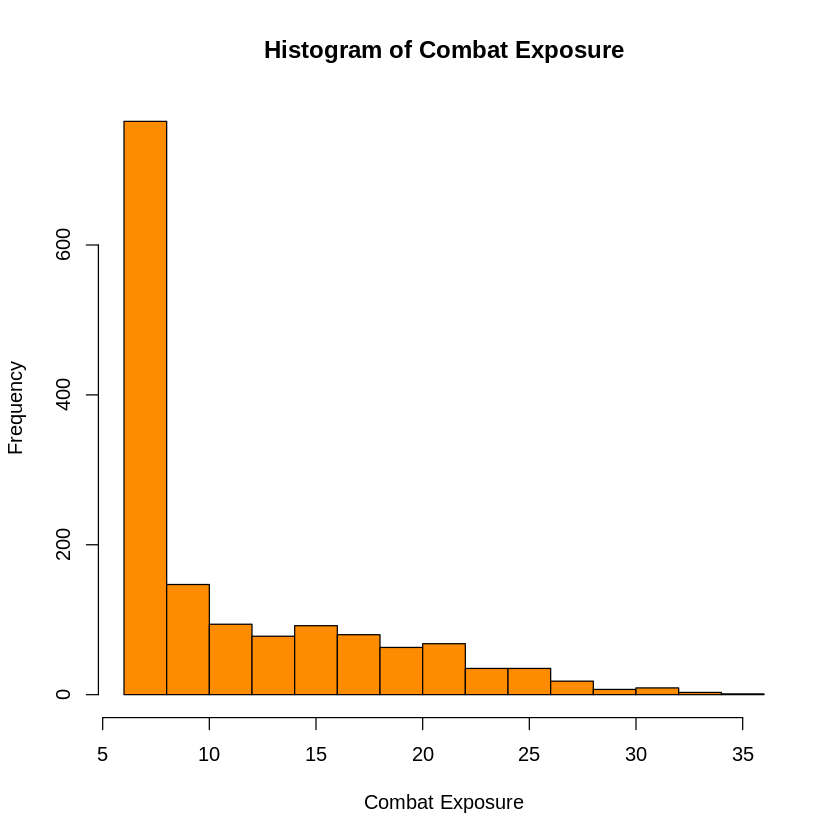

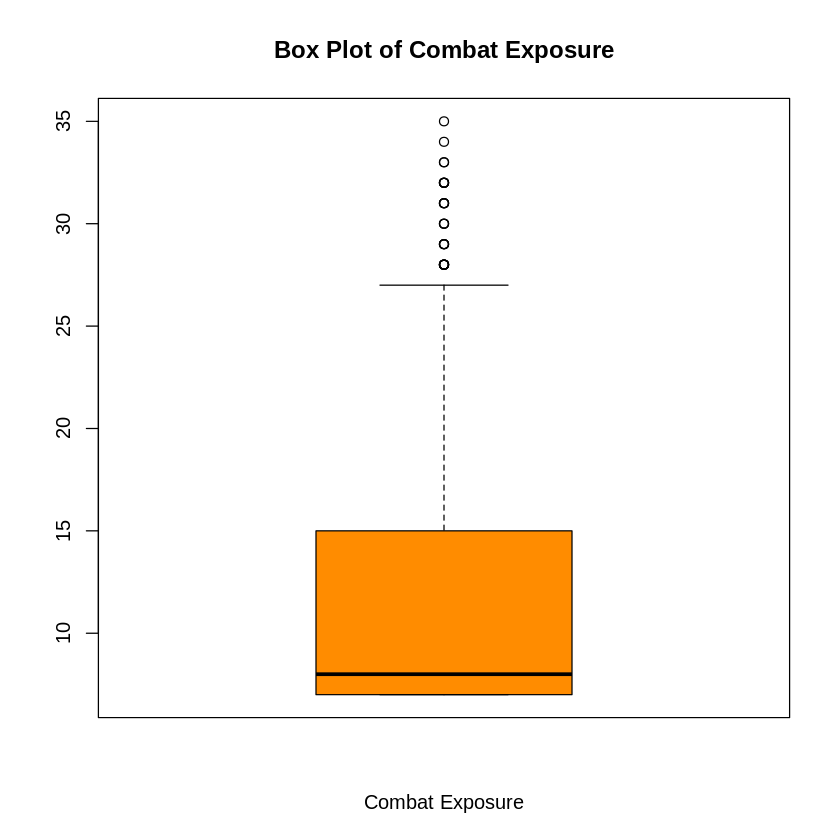

In [ ]:
# prompt: create new variable COM_TOTAL from the summation of CES_1 through CES_7.  Provide descriptive statistical with histogram and box plot for the variable COM_TOTAL.  Use the color darkorange.  Title the graphs with using Combat Exposure instead of COM_TOTAL

# Assuming MilitaryDF is your data frame and CES_1 to CES_7 are the columns you want to sum

MilitaryDF <- MilitaryDF %>%
  mutate(COM_TOTAL = CES_1 + CES_2 + CES_3 + CES_4 + CES_5 + CES_6 + CES_7)

# Descriptive Statistics
summary(MilitaryDF$COM_TOTAL)
sd(MilitaryDF$COM_TOTAL, na.rm = TRUE)

# Frequency Table
table(MilitaryDF$COM_TOTAL)

# Histogram
hist(MilitaryDF$COM_TOTAL,
     main = "Histogram of Combat Exposure",
     xlab = "Combat Exposure",
     col = "darkorange")

# Boxplot
boxplot(MilitaryDF$COM_TOTAL,
        main = "Box Plot of Combat Exposure",
        xlab = "Combat Exposure",
        col = "darkorange",
        horizontal = FALSE)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   0.000   1.000   1.591   3.000   7.000 

[1] 1.776966


  0   1   2   3   4   5   6   7 
597 280 196 173 128  69  34  18 

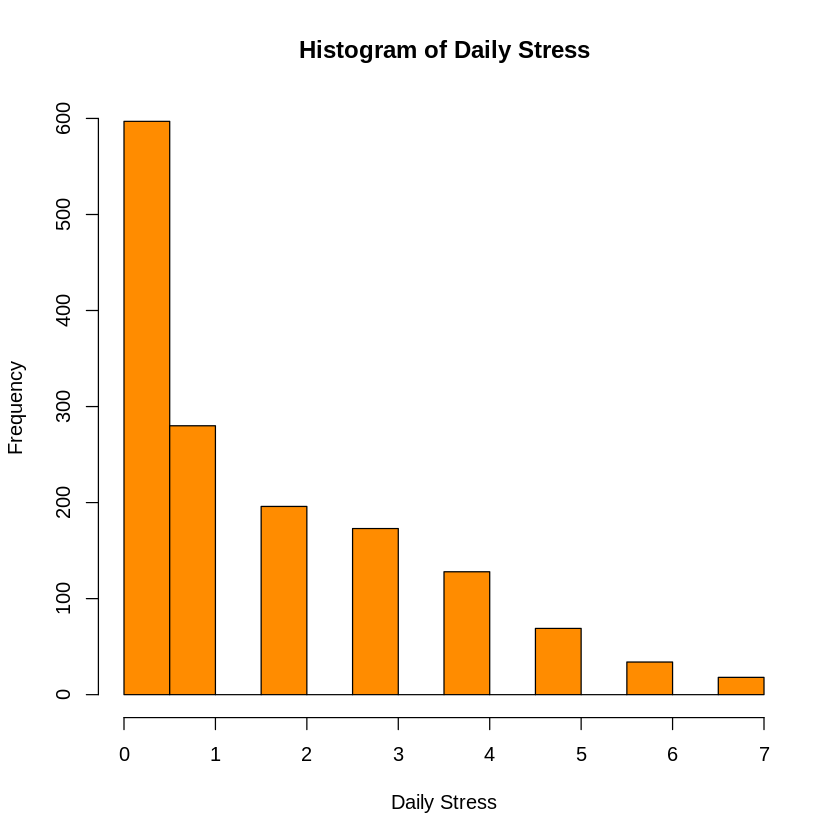

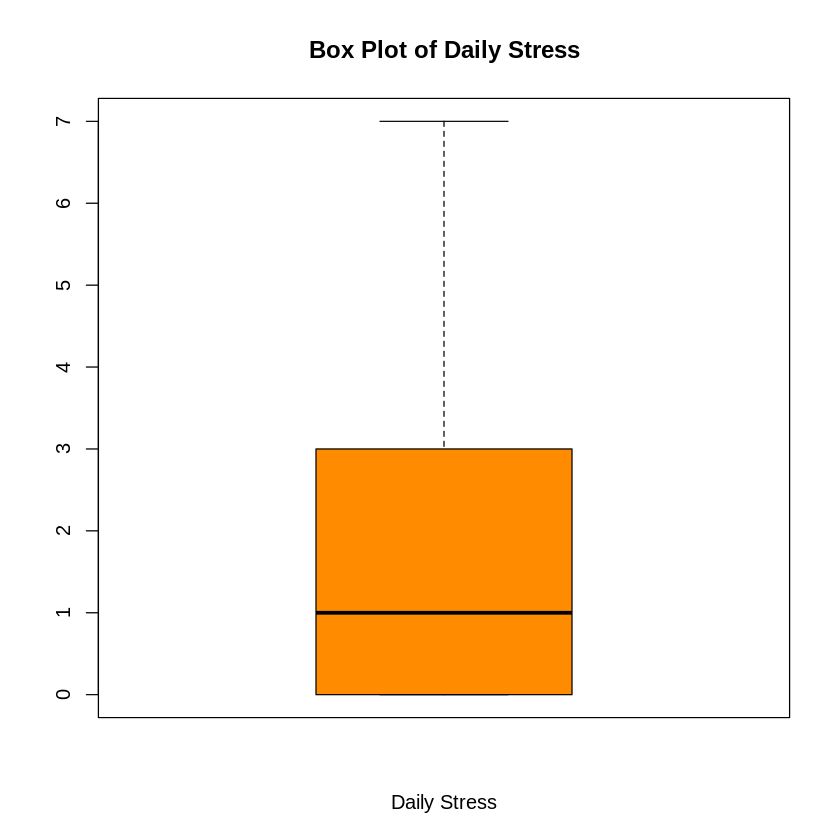

In [ ]:
# prompt: create new variable STRESS_TOTAL from the summation of STRESS_1 through STRESS_7.  Provide descriptive statistical with histogram and box plot for the variable STRESS_TOTAL.  Use the color darkorange.  Title the graphs with using Daily Stress instead of STRESS_TOTAL

# Assuming MilitaryDF is your data frame and STRESS_1 to STRESS_7 are the columns you want to sum
MilitaryDF <- MilitaryDF %>%
  mutate(STRESS_TOTAL = STRESS_1 + STRESS_2 + STRESS_3 + STRESS_4 + STRESS_5 + STRESS_6 + STRESS_7)

# Descriptive Statistics
summary(MilitaryDF$STRESS_TOTAL)
sd(MilitaryDF$STRESS_TOTAL, na.rm = TRUE)

# Frequency Table
table(MilitaryDF$STRESS_TOTAL)

# Histogram
hist(MilitaryDF$STRESS_TOTAL,
     main = "Histogram of Daily Stress",
     xlab = "Daily Stress",
     col = "darkorange")

# Boxplot
boxplot(MilitaryDF$STRESS_TOTAL,
        main = "Box Plot of Daily Stress",
        xlab = "Daily Stress",
        col = "darkorange",
        horizontal = FALSE)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  3.000   3.000   4.000   4.886   6.000   9.000 

[1] 1.885519

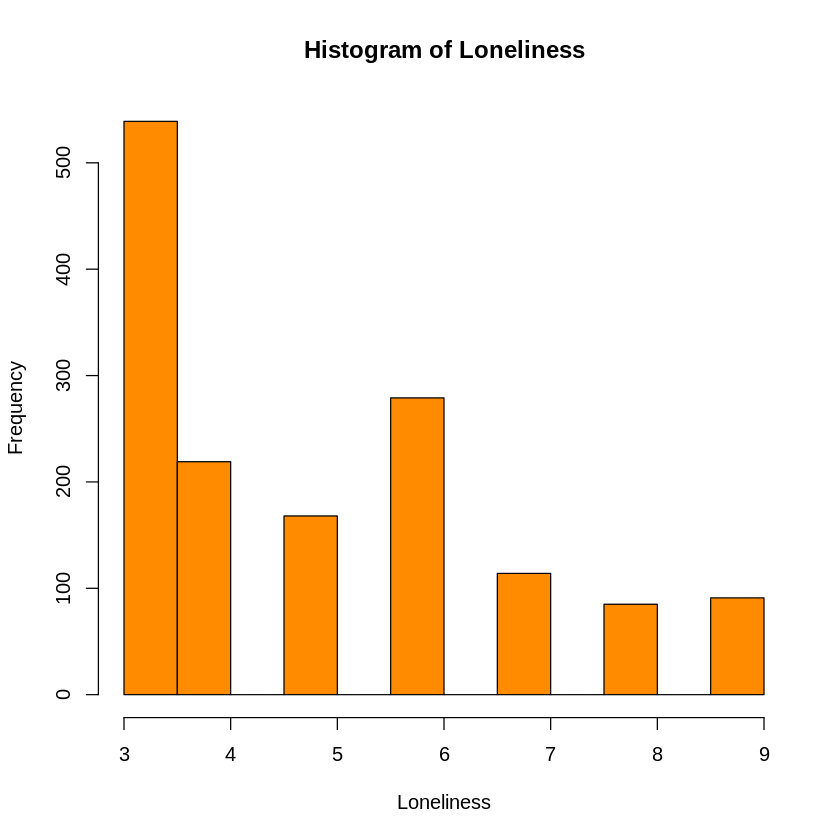

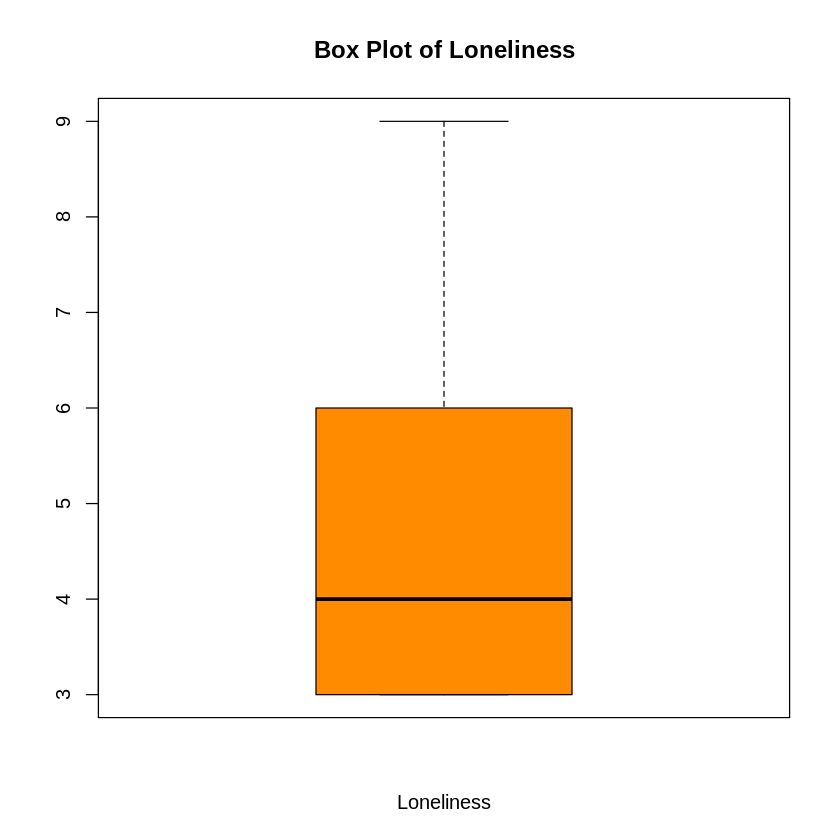

In [ ]:
# prompt: Create new variable LONE_TOTAL from the summation of LONELINES_1 through LONELINESS_3.  Provide descriptive statistical with histogram and box plot for the variable LONE_TOTAL.  Use the color darkorange.  Title the graphs with using Loneliness instead of LONE_TOTAL

MilitaryDF <- MilitaryDF %>%
  mutate(LONE_TOTAL = LONELINESS_1 + LONELINESS_2 + LONELINESS_3)

# Descriptive Statistics
summary(MilitaryDF$LONE_TOTAL)
sd(MilitaryDF$LONE_TOTAL, na.rm = TRUE)

# Histogram
hist(MilitaryDF$LONE_TOTAL,
     main = "Histogram of Loneliness",
     xlab = "Loneliness",
     col = "darkorange")

# Boxplot
boxplot(MilitaryDF$LONE_TOTAL,
        main = "Box Plot of Loneliness",
        xlab = "Loneliness",
        col = "darkorange",
        horizontal = FALSE)

In [ ]:
MilitaryDF <- MilitaryDF %>%
mutate(MOR_INJ = MISSSF_1 + MISSSF_2 + MISSSF_3 + MISSSF_4 + MISSSF_5R + MISSSF_6R + MISSSF_7R + MISSSF_8 + MISSSF_9R + MISSSF_10R + MISSSF_11)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  11.00   28.00   38.00   40.13   51.50   98.00 

[1] 15.31494


11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 
 8  5  6  4  9 13  7 19 22 33 16 21 25 48 39 30 34 47 42 43 46 33 45 37 34 27 
37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 
43 36 42 25 24 29 29 23 31 27 32 17 30 23 17 23 14 25 23 23 28 28 28 24 27  9 
63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 84 86 90 93 96 98 
21  6 10 13 10  7  1  5  7  5  6  3  9  2  1  2  1  1  2  2  3  1  1  1  1  1 

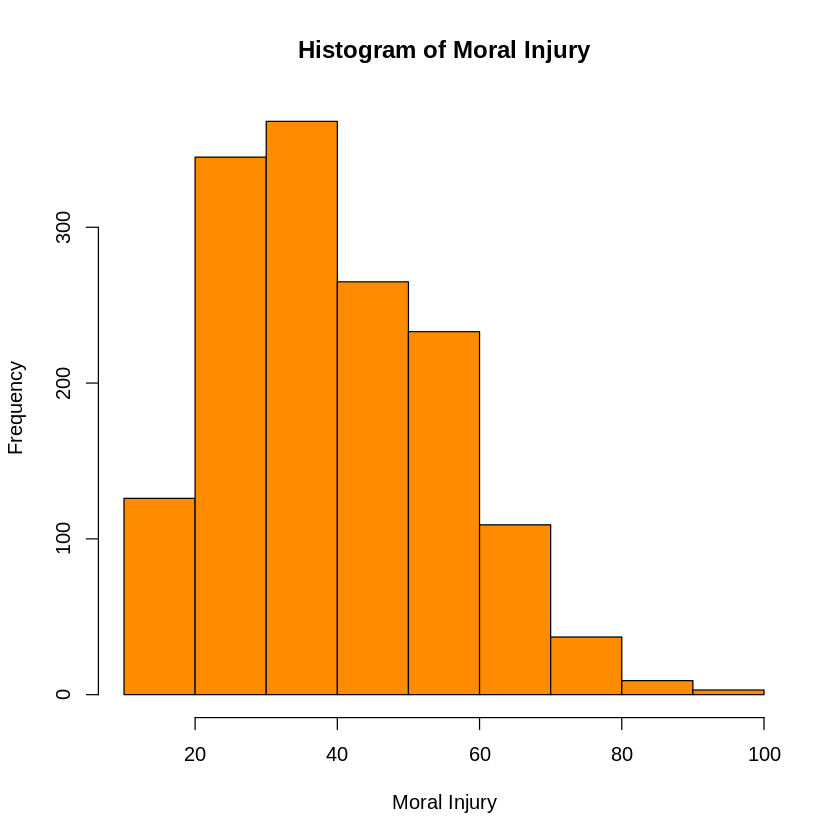

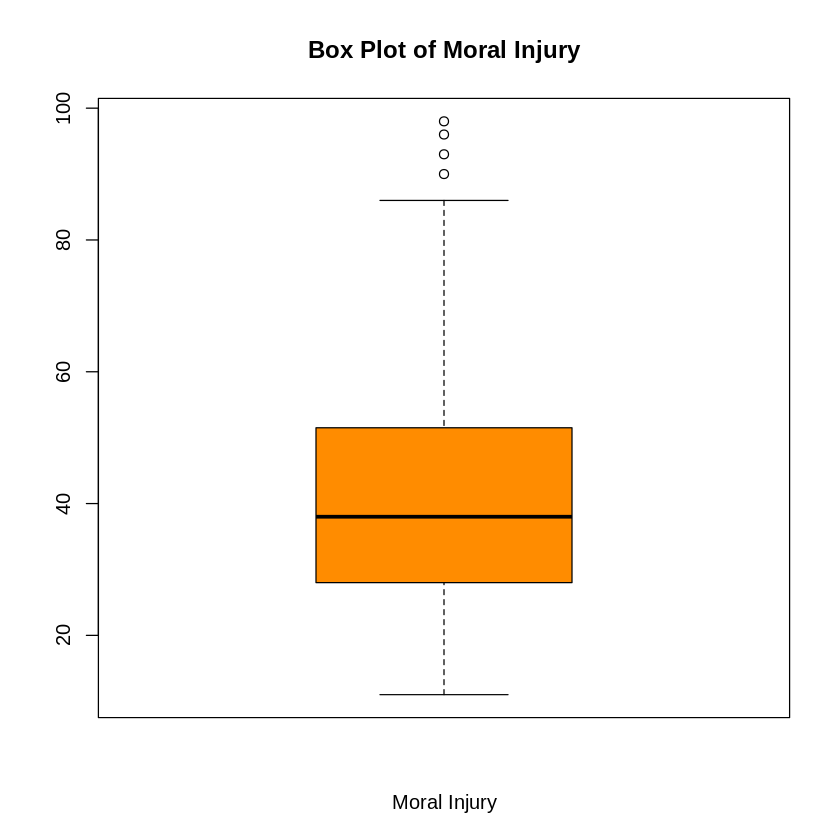

In [ ]:
# prompt: SUMMARY TABLE FOR MOR_INJ

# Descriptive Statistics
summary(MilitaryDF$MOR_INJ)
sd(MilitaryDF$MOR_INJ, na.rm = TRUE)

# Frequency Table
table(MilitaryDF$MOR_INJ)

# Histogram
hist(MilitaryDF$MOR_INJ,
     main = "Histogram of Moral Injury",
     xlab = "Moral Injury",
     col = "darkorange")

# Boxplot
boxplot(MilitaryDF$MOR_INJ,
        main = "Box Plot of Moral Injury",
        xlab = "Moral Injury",
        col = "darkorange",
        horizontal = FALSE)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  4.000   4.000   7.000   8.803  11.000  28.000 

[1] 5.106639

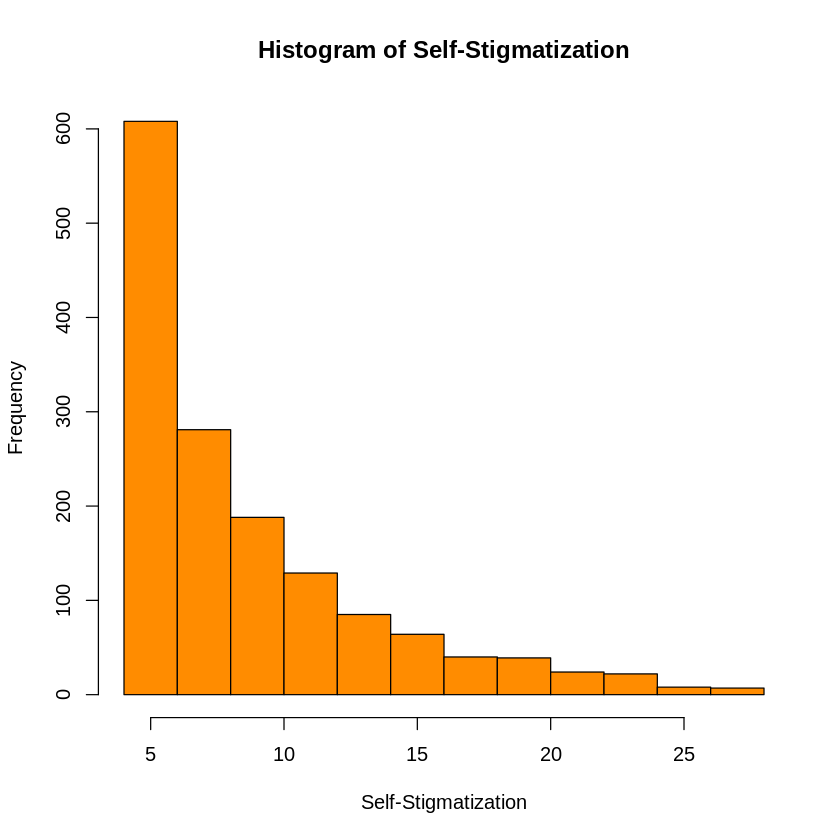

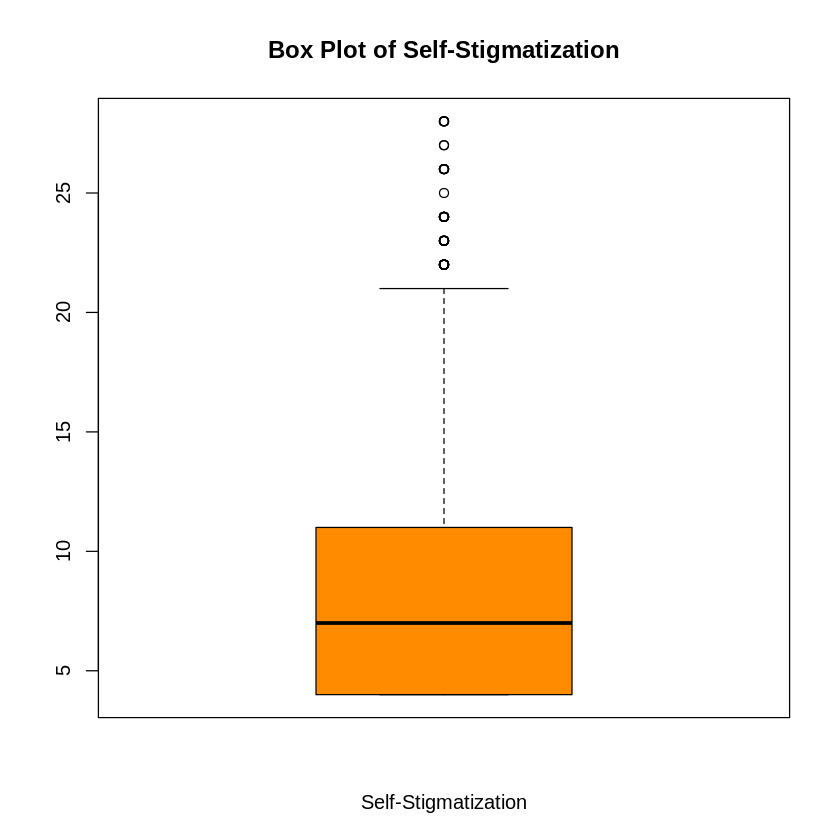

In [ ]:
# prompt: Create new variable STIGMA from the summation of DD_1 through DD_4.  Provide descriptive statistical with histogram and box plot for the variable STIGMA.  Use the color darkorange.  Title the graphs with using Self-Stigmatization instead of STIGMA

# Assuming MilitaryDF is your data frame and DD_1 to DD_4 are the columns you want to sum
MilitaryDF <- MilitaryDF %>%
  mutate(STIGMA = DD_1 + DD_2 + DD_3 + DD_4)

# Descriptive Statistics for STIGMA
summary(MilitaryDF$STIGMA)
sd(MilitaryDF$STIGMA, na.rm = TRUE)

# Histogram for Self-Stigmatization
hist(MilitaryDF$STIGMA,
     main = "Histogram of Self-Stigmatization",
     xlab = "Self-Stigmatization",
     col = "darkorange")

# Boxplot for Self-Stigmatization
boxplot(MilitaryDF$STIGMA,
        main = "Box Plot of Self-Stigmatization",
        xlab = "Self-Stigmatization",
        col = "darkorange",
        horizontal = FALSE)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  3.000   3.000   3.000   5.298   6.000  22.000      26 

[1] 3.709422


  3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18  19  20  21  22 
774 170 107  74  54  57  35  39  25  27  24  22  16  13   8  10   7   3   1   3 

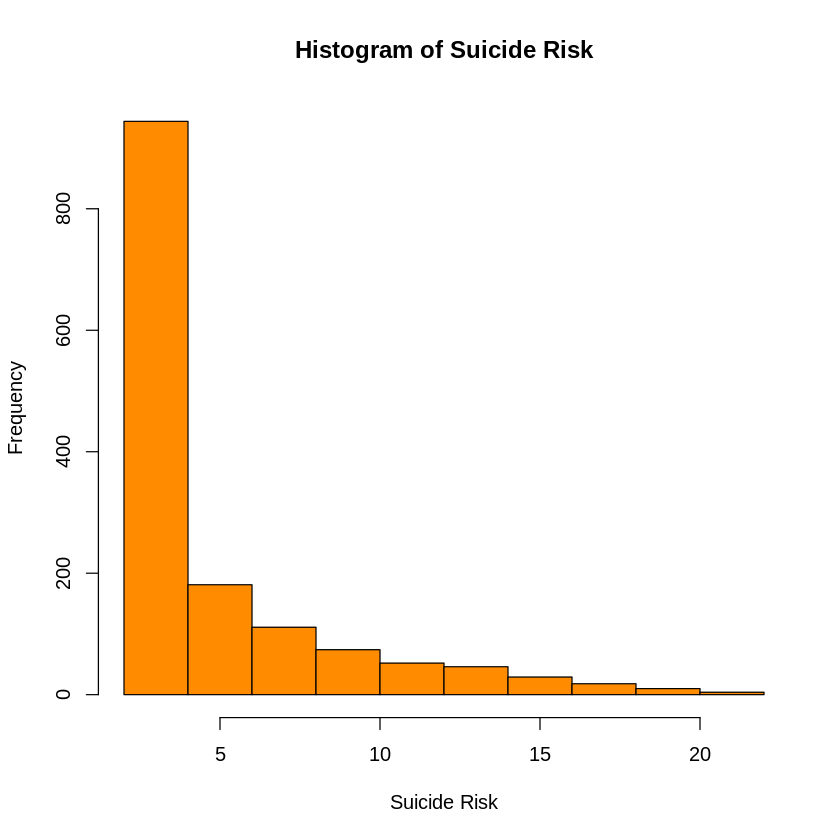

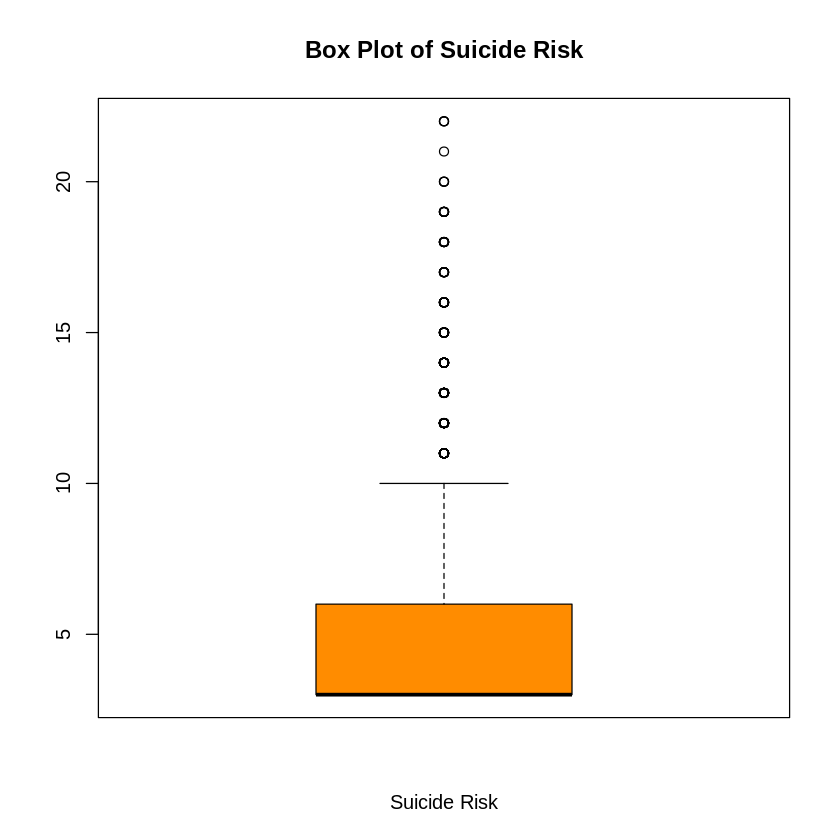

In [ ]:
# prompt: Summary table for SBQ_TOTAL

# Assuming MilitaryDF is your data frame and SBQ_1 to SBQ_10 are the columns you want to sum

MilitaryDF <- MilitaryDF %>%
  mutate(SUICIDE_TOTAL = SBQ_1 + SBQ_2 + SBQ_3 + SBQ_4)

# Descriptive Statistics for SBQ_TOTAL
summary(MilitaryDF$SBQ_TOTAL)
sd(MilitaryDF$SBQ_TOTAL, na.rm = TRUE)

# Frequency Table for SBQ_TOTAL
table(MilitaryDF$SBQ_TOTAL)

# Histogram for SBQ_TOTAL
hist(MilitaryDF$SBQ_TOTAL,
     main = "Histogram of Suicide Risk",
     xlab = "Suicide Risk",
     col = "darkorange")

# Boxplot for SBQ_TOTAL
boxplot(MilitaryDF$SBQ_TOTAL,
        main = "Box Plot of Suicide Risk",
        xlab = "Suicide Risk",
        col = "darkorange",
        horizontal = FALSE)

In [ ]:
# prompt: Replace all missing values in SUICIDE_TOTAL with the mean

MilitaryDF <- MilitaryDF %>%
  mutate(SUICIDE_TOTAL = ifelse(is.na(SUICIDE_TOTAL), mean(SUICIDE_TOTAL, na.rm = TRUE), SUICIDE_TOTAL))

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  3.000   3.000   3.000   5.298   6.000  22.000 

[1] 3.677003


               3                4                5 5.29816201497617 
             774              170              107               26 
               6                7                8                9 
              74               54               57               35 
              10               11               12               13 
              39               25               27               24 
              14               15               16               17 
              22               16               13                8 
              18               19               20               21 
              10                7                3                1 
              22 
               3 

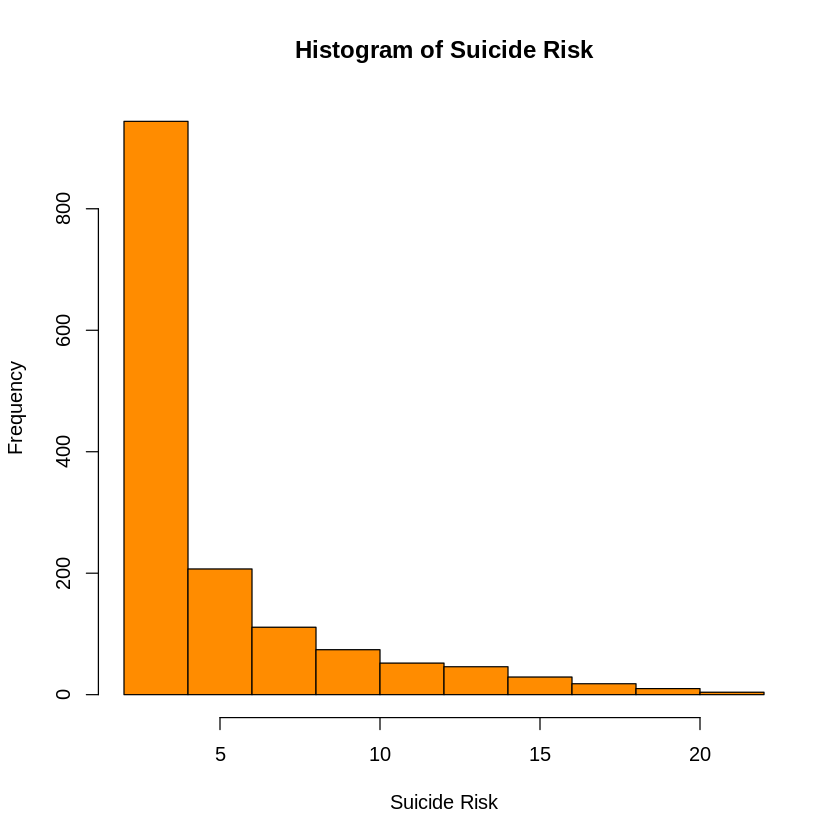

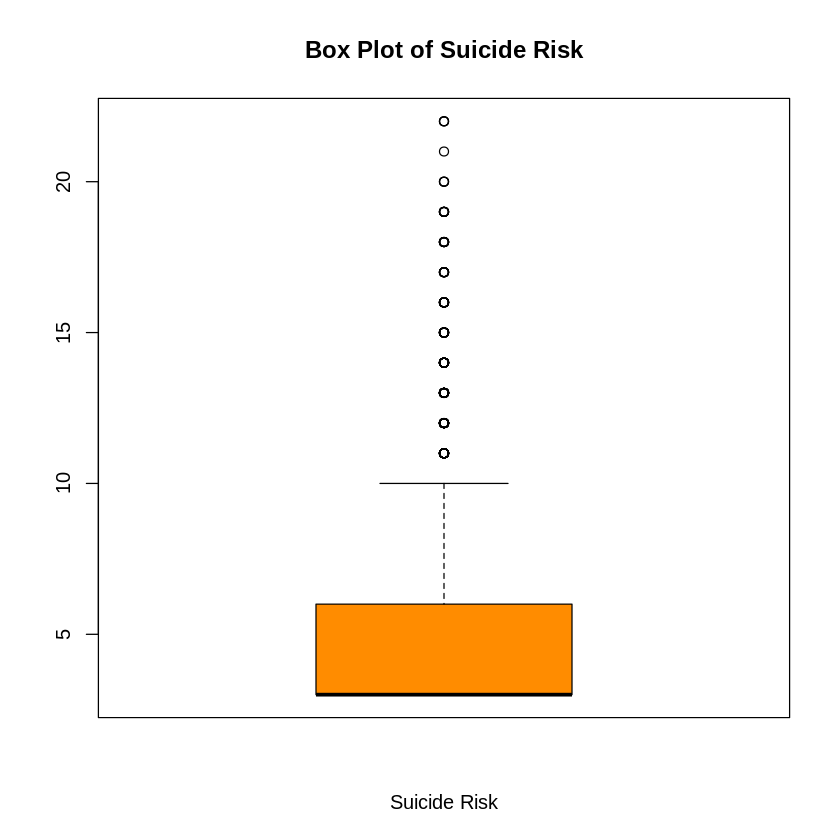

In [ ]:
# prompt: Repeat the summary table for SUICIDE_TOTAL

# Descriptive Statistics for SUICIDE_TOTAL
summary(MilitaryDF$SUICIDE_TOTAL)
sd(MilitaryDF$SUICIDE_TOTAL, na.rm = TRUE)

# Frequency Table for SUICIDE_TOTAL
table(MilitaryDF$SUICIDE_TOTAL)

# Histogram for SUICIDE_TOTAL
hist(MilitaryDF$SUICIDE_TOTAL,
     main = "Histogram of Suicide Risk",
     xlab = "Suicide Risk",
     col = "darkorange")

# Boxplot for SUICIDE_TOTAL
boxplot(MilitaryDF$SUICIDE_TOTAL,
        main = "Box Plot of Suicide Risk",
        xlab = "Suicide Risk",
        col = "darkorange",
        horizontal = FALSE)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0000  0.0000  0.1686  0.0000  1.0000 


   0    1 
1243  252 

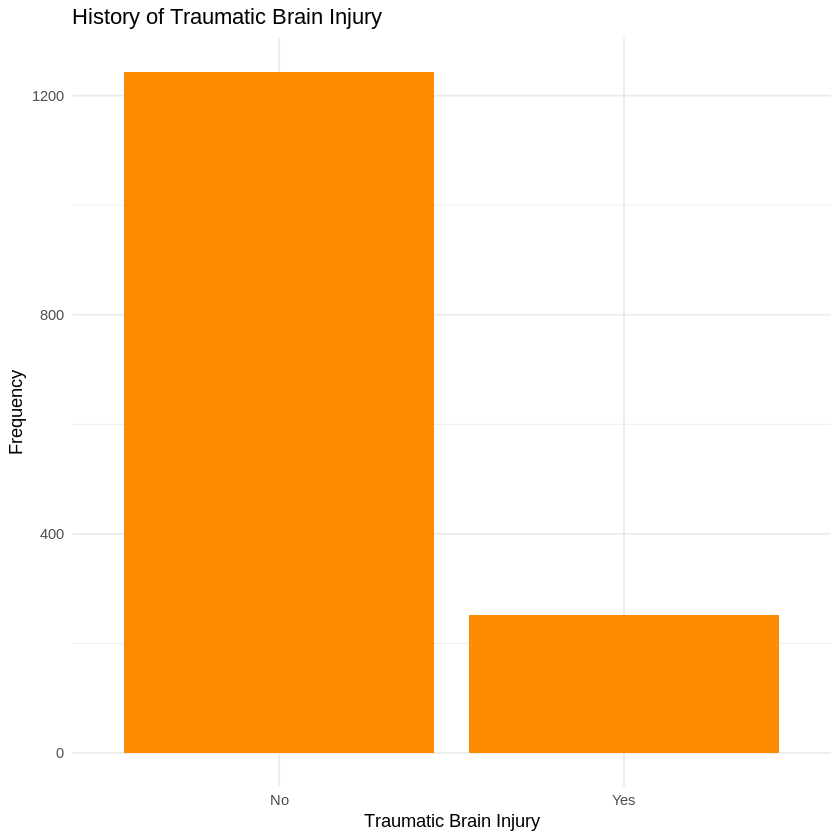

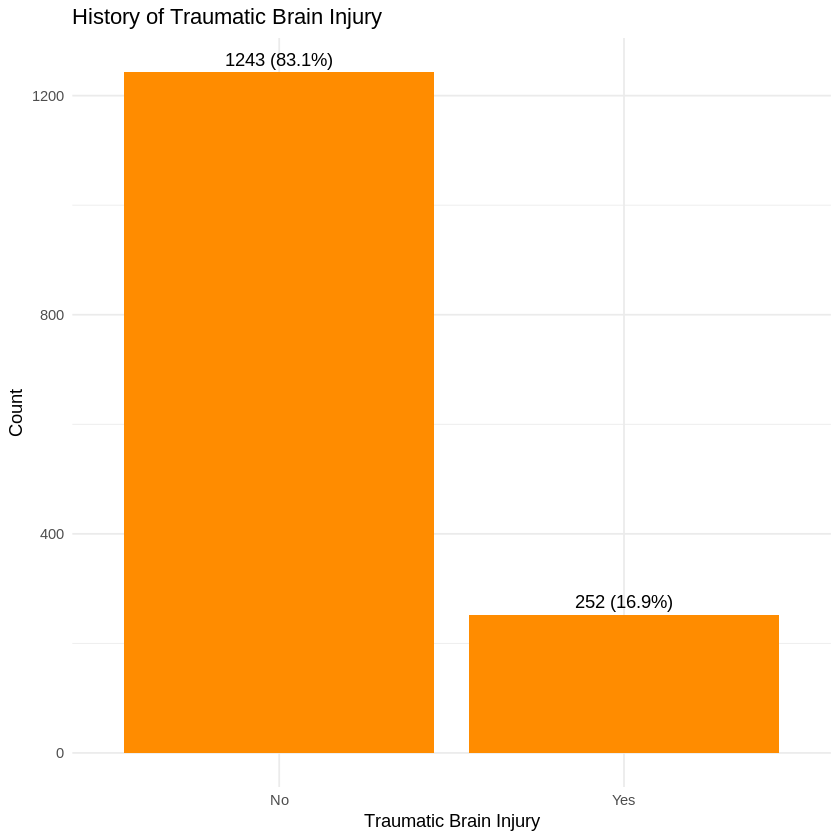

In [ ]:
# prompt: descriptive stats for TBI, use the color dark orange and use the title label "History of Traumatic Brain Injury".  Replace "0" with No and "1" with Yes for the x-axis labels

# Assuming 'MilitaryDF' is your dataframe and it contains a column named 'TBI'.
# Replace 'MilitaryDF' with your actual dataframe name if different.

# Summary statistics for TBI
summary(MilitaryDF$TBI)

# Frequency table for TBI
table(MilitaryDF$TBI)

# Bar plot for TBI with dark orange color, custom labels, and title
library(ggplot2)

ggplot(MilitaryDF, aes(x = factor(TBI))) +
  geom_bar(fill = "darkorange") +
  labs(title = "History of Traumatic Brain Injury",
       x = "Traumatic Brain Injury",
       y = "Frequency") +
  scale_x_discrete(labels = c("0" = "No", "1" = "Yes")) +  # Replace 0 and 1 with No and Yes
  theme_minimal()

# Calculate counts and percentages for each level of TBI
tbi_counts <- table(MilitaryDF$TBI)
tbi_percentages <- prop.table(tbi_counts) * 100

# Create the bar chart with percentages and custom labels
ggplot(as.data.frame(tbi_counts), aes(x = Var1, y = Freq)) +
  geom_bar(stat = "identity", fill = "darkorange") +
  geom_text(aes(label = paste0(Freq, " (", round(tbi_percentages, 1), "%)")), vjust = -0.5) +
  labs(title = "History of Traumatic Brain Injury", x = "Traumatic Brain Injury", y = "Count") +
  scale_x_discrete(labels = c("0" = "No", "1" = "Yes")) +  # Replace 0 and 1 with No and Yes
  theme_minimal()

In [ ]:
# prompt: perform a linear regression analysis for the variable CAGEAID_TOTAL by COM_TOTAL, STRESS_TOTAL, LONE_TOTAL, MOR_INJ, STIGMA, SUICIDE_TOTAL AND TBI. Name this as model3

model3 <- lm(CAGEAID_TOTAL ~ COM_TOTAL + STRESS_TOTAL + LONE_TOTAL + MOR_INJ + STIGMA + SUICIDE_TOTAL + TBI, data = MilitaryDF)
summary(model3)
round(coef(model3), 3)



Call:
lm(formula = CAGEAID_TOTAL ~ COM_TOTAL + STRESS_TOTAL + LONE_TOTAL + 
    MOR_INJ + STIGMA + SUICIDE_TOTAL + TBI, data = MilitaryDF)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.2536 -0.6361 -0.2767  0.4357  3.8494 

Coefficients:
               Estimate Std. Error t value Pr(>|t|)    
(Intercept)   -0.787392   0.100633  -7.824 9.61e-15 ***
COM_TOTAL      0.015323   0.005272   2.906  0.00371 ** 
STRESS_TOTAL   0.120872   0.019106   6.326 3.31e-10 ***
LONE_TOTAL     0.053504   0.018804   2.845  0.00450 ** 
MOR_INJ        0.014131   0.002734   5.169 2.67e-07 ***
STIGMA         0.004488   0.006524   0.688  0.49157    
SUICIDE_TOTAL  0.076054   0.009565   7.952 3.61e-15 ***
TBI            0.013710   0.081014   0.169  0.86564    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 1.13 on 1487 degrees of freedom
Multiple R-squared:  0.2613,	Adjusted R-squared:  0.2578 
F-statistic: 75.13 on 7 and 1487 DF,  p-value: < 2.2e-16


(Intercept)     COM_TOTAL  STRESS_TOTAL    LONE_TOTAL       MOR_INJ 
       -0.787         0.015         0.121         0.054         0.014 
       STIGMA SUICIDE_TOTAL           TBI 
        0.004         0.076         0.014

In [ ]:
# prompt: Add the variables AGE, GENDER, RACE_R and INCOME_WO to model3  and rename model3a.  Perform a linear regression for model3

model3a <- lm(CAGEAID_TOTAL ~ COM_TOTAL + STRESS_TOTAL + LONE_TOTAL + MOR_INJ + STIGMA + SUICIDE_TOTAL + TBI + AGE + GENDER + RACE_R + INCOME_WO, data = MilitaryDF)
summary(model3a)


Call:
lm(formula = CAGEAID_TOTAL ~ COM_TOTAL + STRESS_TOTAL + LONE_TOTAL + 
    MOR_INJ + STIGMA + SUICIDE_TOTAL + TBI + AGE + GENDER + RACE_R + 
    INCOME_WO, data = MilitaryDF)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.1679 -0.6559 -0.2714  0.4516  3.9325 

Coefficients:
                Estimate Std. Error t value Pr(>|t|)    
(Intercept)   -4.030e-01  2.717e-01  -1.483  0.13820    
COM_TOTAL      1.154e-02  5.803e-03   1.989  0.04693 *  
STRESS_TOTAL   1.286e-01  2.007e-02   6.408 1.99e-10 ***
LONE_TOTAL     5.230e-02  1.916e-02   2.730  0.00641 ** 
MOR_INJ        1.313e-02  2.797e-03   4.693 2.95e-06 ***
STIGMA         1.095e-03  6.894e-03   0.159  0.87382    
SUICIDE_TOTAL  8.081e-02  9.814e-03   8.234 4.05e-16 ***
TBI            1.110e-02  8.250e-02   0.135  0.89296    
AGE           -1.074e-03  2.806e-03  -0.383  0.70194    
GENDER        -2.656e-01  6.442e-02  -4.123 3.95e-05 ***
RACE_R         1.512e-01  7.748e-02   1.952  0.05112 .  
INCOME_WO     -1.125e-06  

In [ ]:
# prompt: Perform a Pearson's Correlation for Model3

# Perform Pearson's correlation for model3a
cor(MilitaryDF[, c("CAGEAID_TOTAL", "COM_TOTAL", "STRESS_TOTAL", "LONE_TOTAL", "MOR_INJ", "STIGMA", "SUICIDE_TOTAL", "TBI", "AGE", "GENDER", "RACE_R", "INCOME_WO")], use = "complete.obs")

,CAGEAID_TOTAL,COM_TOTAL,STRESS_TOTAL,LONE_TOTAL,MOR_INJ,STIGMA,SUICIDE_TOTAL,TBI,AGE,GENDER,RACE_R,INCOME_WO
CAGEAID_TOTAL,1.00000000,0.22715826,0.35252791,0.31764400,0.40822516,0.20840932,0.39640081,0.12995533,-0.23839229,-0.01522447,0.09358180,-0.08577971
COM_TOTAL,0.22715826,1.00000000,0.29590048,0.18323418,0.31533990,0.23069100,0.20702784,0.17358679,-0.42659715,-0.07293170,0.10368291,0.09978282
STRESS_TOTAL,0.35252791,0.29590048,1.00000000,0.32714671,0.43189473,0.29395394,0.31870396,0.17238124,-0.42047243,0.09826893,0.07519489,-0.01381987
LONE_TOTAL,0.31764400,0.18323418,0.32714671,1.00000000,0.52926007,0.21759871,0.40394062,0.16208445,-0.25936991,0.10248492,0.03768362,-0.18262593
MOR_INJ,0.40822516,0.31533990,0.43189473,0.52926007,1.00000000,0.44611891,0.50975534,0.18528916,-0.40489030,0.07586425,0.08270472,-0.12794999
STIGMA,0.20840932,0.23069100,0.29395394,0.21759871,0.44611891,1.00000000,0.19568002,0.08657030,-0.40232606,-0.00699949,0.10785851,-0.04543836
SUICIDE_TOTAL,0.39640081,0.20702784,0.31870396,0.40394062,0.50975534,0.19568002,1.00000000,0.19949047,-0.24174457,0.17506809,0.07323579,-0.12015610
TBI,0.12995533,0.17358679,0.17238124,0.16208445,0.18528916,0.08657030,0.19949047,1.00000000,-0.09798104,0.00804882,-0.01621173,-0.05089044
AGE,-0.23839229,-0.42659715,-0.42047243,-0.25936991,-0.40489030,-0.40232606,-0.24174457,-0.09798104,1.00000000,-0.15134089,-0.14446254,0.05348962
GENDER,-0.01522447,-0.07293170,0.09826893,0.10248492,0.07586425,-0.00699949,0.17506809,0.00804882,-0.15134089,1.00000000,0.07205311,-0.15790728


In [ ]:
# prompt: perform a correlation matrix for model3a.  Use the appropriate labels for the variables. Display 2 decimal places

# Assuming 'model3a' is your linear model and 'MilitaryDF' your dataframe

# Extract the relevant variables for correlation
variables_model3a <- c("CAGEAID_TOTAL", "COM_TOTAL", "STRESS_TOTAL", "LONE_TOTAL", "MOR_INJ", "STIGMA", "SUICIDE_TOTAL", "TBI", "AGE", "GENDER", "RACE_R", "INCOME_WO")

# Calculate the correlation matrix, handling missing values
cor_matrix_model3a <- cor(MilitaryDF[, variables_model3a], use = "pairwise.complete.obs")


# Define custom labels for better readability
labels_model3a <- c("Alcohol and Drug Abuse Risk", "Combat Exposure", "Daily Stress", "Loneliness", "Moral Injury", "Self-Stigma", "Suicide Risk", "History of Traumatic Brain Injury", "Age", "Gender", "Race", "Income")

# Rename the rows and columns of the correlation matrix
colnames(cor_matrix_model3a) <- labels_model3a
rownames(cor_matrix_model3a) <- labels_model3a

# Round the correlation matrix values to 2 decimal places
cor_matrix_model3a_rounded <- round(cor_matrix_model3a, 2)

# Display the rounded correlation matrix
cor_matrix_model3a_rounded



,Alcohol and Drug Abuse Risk,Combat Exposure,Daily Stress,Loneliness,Moral Injury,Self-Stigma,Suicide Risk,History of Traumatic Brain Injury,Age,Gender,Race,Income
Alcohol and Drug Abuse Risk,1.00,0.24,0.36,0.33,0.42,0.22,0.40,0.14,-0.25,-0.01,0.09,-0.09
Combat Exposure,0.24,1.00,0.31,0.20,0.33,0.25,0.22,0.18,-0.43,-0.07,0.10,0.10
Daily Stress,0.36,0.31,1.00,0.33,0.44,0.30,0.33,0.18,-0.43,0.10,0.09,-0.01
Loneliness,0.33,0.20,0.33,1.00,0.54,0.23,0.41,0.16,-0.26,0.11,0.04,-0.18
Moral Injury,0.42,0.33,0.44,0.54,1.00,0.46,0.51,0.19,-0.41,0.08,0.09,-0.13
Self-Stigma,0.22,0.25,0.30,0.23,0.46,1.00,0.21,0.10,-0.40,0.00,0.10,-0.05
Suicide Risk,0.40,0.22,0.33,0.41,0.51,0.21,1.00,0.20,-0.25,0.18,0.07,-0.12
History of Traumatic Brain Injury,0.14,0.18,0.18,0.16,0.19,0.10,0.20,1.00,-0.10,0.01,-0.01,-0.05
Age,-0.25,-0.43,-0.43,-0.26,-0.41,-0.40,-0.25,-0.10,1.00,-0.15,-0.15,0.05
Gender,-0.01,-0.07,0.10,0.11,0.08,0.00,0.18,0.01,-0.15,1.00,0.08,-0.16


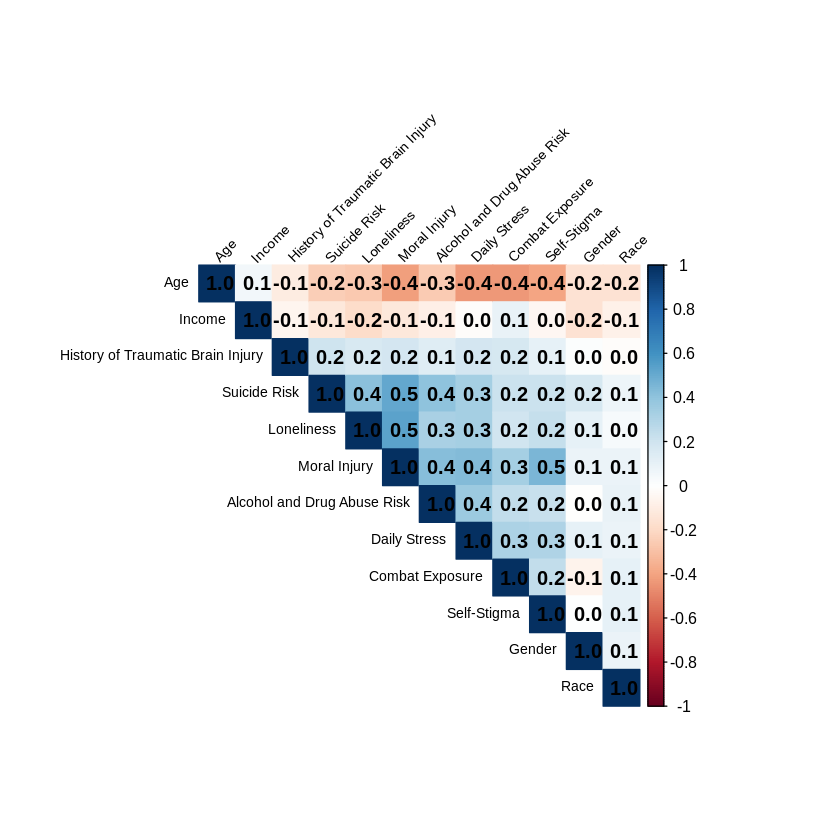

In [ ]:
# prompt: Perform a Correlation Plot for model3a with the appropriate labels. Use one decimal places

# Install and load necessary packages
if(!require(corrplot)){install.packages("corrplot")}
library(corrplot)

# Assuming 'cor_matrix_model3a' is your correlation matrix from the previous code
# and 'labels_model3a' are the custom labels.

# Visualize the correlation matrix with one decimal place
corrplot(cor_matrix_model3a,
         method = "color",
         type = "upper",
         order = "hclust",
         tl.col = "black",
         tl.srt = 45,
         addCoef.col = "black",  # Add coefficient colors
         number.digits = 1,     # Set number of digits to 1
         insig = "blank",       # Optionally hide insignificant correlations
         tl.cex = 0.7) # Adjust the size of the labels if necessary

In [ ]:
# prompt: perform a linear regression analysis combining model1a and model3a. Name the model5a

model5a <- lm(CAGEAID_TOTAL ~ PUR_TOTAL + SOC_TOTAL + HELP_TOTAL + MIL_CALL + WHO_TOTAL + PUB_SER + WELL_MAG + COM_TOTAL + STRESS_TOTAL + LONE_TOTAL + MOR_INJ + STIGMA + SUICIDE_TOTAL + TBI + AGE + GENDER + RACE_R + INCOME_WO, data = MilitaryDF)
summary(model5a)
round(coef(model5a), 3)



Call:
lm(formula = CAGEAID_TOTAL ~ PUR_TOTAL + SOC_TOTAL + HELP_TOTAL + 
    MIL_CALL + WHO_TOTAL + PUB_SER + WELL_MAG + COM_TOTAL + STRESS_TOTAL + 
    LONE_TOTAL + MOR_INJ + STIGMA + SUICIDE_TOTAL + TBI + AGE + 
    GENDER + RACE_R + INCOME_WO, data = MilitaryDF)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.2019 -0.6493 -0.2658  0.4186  3.9187 

Coefficients:
                Estimate Std. Error t value Pr(>|t|)    
(Intercept)   -7.264e-01  5.151e-01  -1.410   0.1587    
PUR_TOTAL      1.595e-02  1.234e-02   1.292   0.1964    
SOC_TOTAL      1.674e-03  9.107e-03   0.184   0.8542    
HELP_TOTAL     1.481e-02  8.490e-03   1.744   0.0813 .  
MIL_CALL       2.655e-03  1.090e-02   0.244   0.8076    
WHO_TOTAL     -2.159e-03  3.016e-03  -0.716   0.4742    
PUB_SER       -1.830e-03  1.291e-02  -0.142   0.8873    
WELL_MAG      -5.600e-04  3.047e-03  -0.184   0.8542    
COM_TOTAL      1.068e-02  6.032e-03   1.771   0.0768 .  
STRESS_TOTAL   1.240e-01  2.055e-02   6.034 2.05e-09 *

(Intercept)     PUR_TOTAL     SOC_TOTAL    HELP_TOTAL      MIL_CALL 
       -0.726         0.016         0.002         0.015         0.003 
    WHO_TOTAL       PUB_SER      WELL_MAG     COM_TOTAL  STRESS_TOTAL 
       -0.002        -0.002        -0.001         0.011         0.124 
   LONE_TOTAL       MOR_INJ        STIGMA SUICIDE_TOTAL           TBI 
        0.048         0.013         0.004         0.081         0.014 
          AGE        GENDER        RACE_R     INCOME_WO 
        0.000        -0.270         0.139         0.000

In [ ]:
# prompt: perform a correlation matrix for model5a.  Use the appropriate labels for the variables. Display 2 decimal places

```R
# Install and load necessary packages
if(!require(corrplot)){install.packages("corrplot")}
library(corrplot)

# Extract the relevant variables for correlation from model5a
variables_model5a <- c("CAGEAID_TOTAL", "PUR_TOTAL", "SOC_TOTAL", "HELP_TOTAL", "MIL_CALL", "WHO_TOTAL", "PUB_SER", "WELL_MAG", "COM_TOTAL", "STRESS_TOTAL", "LONE_TOTAL", "MOR_INJ", "STIGMA", "SUICIDE_TOTAL", "TBI", "AGE", "GENDER", "RACE_R", "INCOME_WO")

# Calculate the correlation matrix, handling missing values
cor_matrix_model5a <- cor(MilitaryDF[, variables_model5a], use = "pairwise.complete.obs")

# Define custom labels for better readability (adjust as needed)
labels_model5a <- c("Alcohol and Drug Abuse Risk", "Purpose in Life", "Social Support", "Help-Seeking Behaviors", "Military Culture", "Quality of Life", "Public Service Motivation", "Overall Wellness", "Combat Exposure", "Daily Stress", "Loneliness", "Moral Injury", "Self-Stigma", "Suicide Risk", "History of TBI", "Age", "Gender", "Race", "Income")


# Rename the rows and columns of the correlation matrix
colnames(cor_matrix_model5a) <- labels_model5a
rownames(cor_matrix_model5a) <- labels_model5a

# Round the correlation matrix values to 2 decimal places
cor_matrix_model5a_rounded <- round(cor_matrix_model5a, 2)

# Display the rounded correlation matrix
cor_matrix_model5a_rounded


ERROR: Error in parse(text = input): attempt to use zero-length variable name


,Alcohol and Drug Abuse Risk,Purpose in Life,Social Support,Help-Seeking Behaviors,Military Culture,Quality of Life,Public Service Motivation,Overall Wellness,Combat Exposure,Daily Stress,Loneliness,Moral Injury,Self-Stigma,Suicide Risk,History of TBI,Age,Gender,Race,Income
Alcohol and Drug Abuse Risk,1.00,-0.01,-0.22,0.00,-0.06,-0.33,0.01,-0.34,0.24,0.36,0.33,0.42,0.22,0.40,0.14,-0.25,-0.01,0.09,-0.09
Purpose in Life,-0.01,1.00,0.28,0.29,0.36,0.17,0.59,0.27,0.01,-0.04,0.00,-0.18,-0.21,-0.07,0.00,0.06,0.05,0.05,0.00
Social Support,-0.22,0.28,1.00,0.46,0.20,0.61,0.23,0.71,-0.01,-0.15,-0.47,-0.51,-0.20,-0.39,-0.13,0.08,-0.03,0.00,0.20
Help-Seeking Behaviors,0.00,0.29,0.46,1.00,0.22,0.28,0.29,0.29,0.14,0.03,-0.19,-0.14,0.01,-0.12,-0.04,-0.16,0.03,0.04,0.07
Military Culture,-0.06,0.36,0.20,0.22,1.00,0.13,0.58,0.20,0.02,-0.10,-0.05,-0.20,-0.41,-0.09,0.01,0.13,-0.05,-0.11,0.05
Quality of Life,-0.33,0.17,0.61,0.28,0.13,1.00,0.11,0.78,-0.13,-0.33,-0.59,-0.62,-0.22,-0.53,-0.22,0.18,-0.11,-0.04,0.26
Public Service Motivation,0.01,0.59,0.23,0.29,0.58,0.11,1.00,0.22,0.11,0.01,0.02,-0.13,-0.27,-0.02,0.02,0.03,-0.01,-0.06,0.06
Overall Wellness,-0.34,0.27,0.71,0.29,0.20,0.78,0.22,1.00,-0.14,-0.32,-0.58,-0.70,-0.31,-0.53,-0.16,0.28,-0.10,-0.02,0.20
Combat Exposure,0.24,0.01,-0.01,0.14,0.02,-0.13,0.11,-0.14,1.00,0.31,0.20,0.33,0.25,0.22,0.18,-0.43,-0.07,0.10,0.10
Daily Stress,0.36,-0.04,-0.15,0.03,-0.10,-0.33,0.01,-0.32,0.31,1.00,0.33,0.44,0.30,0.33,0.18,-0.43,0.10,0.09,-0.01


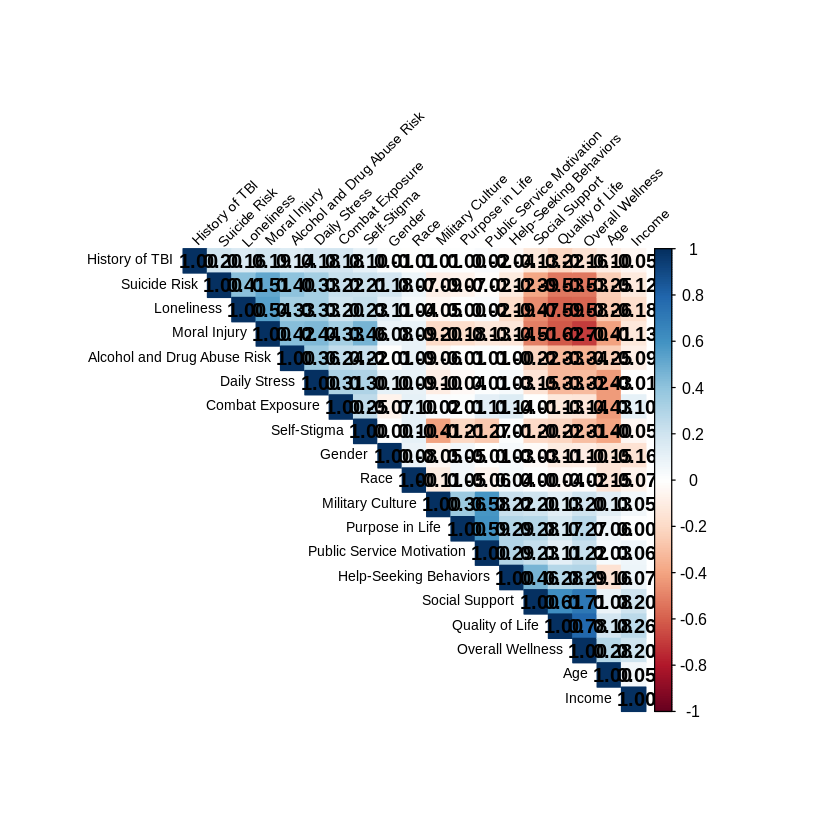

In [ ]:
# Install and load necessary packages
if (!require(corrplot)) {install.packages("corrplot")}  # Ensure '!' is followed by a space and 'require' is correctly spelled
library(corrplot)

# Extract the relevant variables for correlation from model5a
variables_model5a <- c("CAGEAID_TOTAL", "PUR_TOTAL", "SOC_TOTAL", "HELP_TOTAL", "MIL_CALL", "WHO_TOTAL", "PUB_SER", "WELL_MAG", "COM_TOTAL", "STRESS_TOTAL", "LONE_TOTAL", "MOR_INJ", "STIGMA", "SUICIDE_TOTAL", "TBI", "AGE", "GENDER", "RACE_R", "INCOME_WO")

# Calculate the correlation matrix, handling missing values
cor_matrix_model5a <- cor(MilitaryDF[, variables_model5a], use = "pairwise.complete.obs")

# Define custom labels for better readability (adjust as needed)
labels_model5a <- c("Alcohol and Drug Abuse Risk", "Purpose in Life", "Social Support", "Help-Seeking Behaviors", "Military Culture", "Quality of Life", "Public Service Motivation", "Overall Wellness", "Combat Exposure", "Daily Stress", "Loneliness", "Moral Injury", "Self-Stigma", "Suicide Risk", "History of TBI", "Age", "Gender", "Race", "Income")


# Rename the rows and columns of the correlation matrix
colnames(cor_matrix_model5a) <- labels_model5a
rownames(cor_matrix_model5a) <- labels_model5a

# Round the correlation matrix values to 2 decimal places
cor_matrix_model5a_rounded <- round(cor_matrix_model5a, 2)

# Display the rounded correlation matrix
cor_matrix_model5a_rounded

# Visualize the correlation matrix with corrplot
corrplot(cor_matrix_model5a_rounded,
         method = "color",
         type = "upper",
         order = "hclust",
         tl.col = "black",
         tl.srt = 45,
         addCoef.col = "black",
         number.digits = 2, # Display 2 decimal places
         insig = "blank",
         tl.cex = 0.7)

In [ ]:
# prompt: apply cohen's conventions

# Cohen's conventions for effect sizes
# Small effect: 0.1
# Medium effect: 0.3
# Large effect: 0.5

# Function to apply Cohen's conventions and add a column to the summary table
apply_cohens_conventions <- function(model_summary) {
  # Extract coefficients and p-values from summary table
  coefficients <- coef(model_summary)
  p_values <- summary(model_summary)$coefficients[, 4]

  # Calculate effect sizes based on standardized coefficients (beta)
  # Effect size is equivalent to the absolute value of the standardized coefficient (beta)
  effect_sizes <- abs(coefficients)

  # Create a new data frame to store summary information with Cohen's conventions
  summary_with_cohens <- data.frame(
    Coefficient = names(coefficients),
    Estimate = coefficients,
    Std_Error = summary(model_summary)$coefficients[, 2],
    t_value = summary(model_summary)$coefficients[, 3],
    p_value = p_values,
    Effect_Size = effect_sizes,
    Cohen_Convention = NA
    )

  # Apply Cohen's conventions
  summary_with_cohens$Cohen_Convention[summary_with_cohens$Effect_Size < 0.1] <- "Small"
  summary_with_cohens$Cohen_Convention[summary_with_cohens$Effect_Size >= 0.1 & summary_with_cohens$Effect_Size < 0.3] <- "Medium"
  summary_with_cohens$Cohen_Convention[summary_with_cohens$Effect_Size >= 0.3] <- "Large"

  return(summary_with_cohens)
}

labels_model5a <- c("Alcohol and Drug Abuse Risk", "Purpose in Life", "Social Support", "Help-Seeking Behaviors", "Military Calling", "Quality of Life", "Public Service Motivation", "Overall Wellness", "Combat Exposure", "Daily Stress", "Loneliness", "Moral Injury", "Self-Stigma", "Suicide Risk", "History of TBI", "Age", "Gender", "Race", "Income")
# Example usage for model5a
summary_model5a <- summary(model5a)
cohens_model5a <- apply_cohens_conventions(model5a)
print(cohens_model5a)

# Example usage for model3a
summary_model3a <- summary(model3a)
cohens_model3a <- apply_cohens_conventions(model3a)
print(cohens_model3a)

# Example usage for model2
summary_model2 <- summary(model2) # Added this line to define summary_model2
cohens_model2 <- apply_cohens_conventions(model2)  # Added this line to apply the function to model2
print(cohens_model2) # Added this line to print the results for model2

                Coefficient      Estimate    Std_Error     t_value      p_value
(Intercept)     (Intercept) -7.263506e-01 5.150666e-01 -1.41020712 1.587034e-01
PUR_TOTAL         PUR_TOTAL  1.594814e-02 1.234016e-02  1.29237677 1.964426e-01
SOC_TOTAL         SOC_TOTAL  1.673726e-03 9.107055e-03  0.18378346 8.542103e-01
HELP_TOTAL       HELP_TOTAL  1.481014e-02 8.489672e-03  1.74448956 8.129590e-02
MIL_CALL           MIL_CALL  2.654760e-03 1.090187e-02  0.24351416 8.076432e-01
WHO_TOTAL         WHO_TOTAL -2.159091e-03 3.016391e-03 -0.71578621 4.742442e-01
PUB_SER             PUB_SER -1.829835e-03 1.290569e-02 -0.14178511 8.872704e-01
WELL_MAG           WELL_MAG -5.599708e-04 3.047323e-03 -0.18375829 8.542300e-01
COM_TOTAL         COM_TOTAL  1.068276e-02 6.031670e-03  1.77111154 7.676236e-02
STRESS_TOTAL   STRESS_TOTAL  1.240188e-01 2.055456e-02  6.03363859 2.054887e-09
LONE_TOTAL       LONE_TOTAL  4.812538e-02 2.154910e-02  2.23328966 2.568928e-02
MOR_INJ             MOR_INJ  1.322983e-0

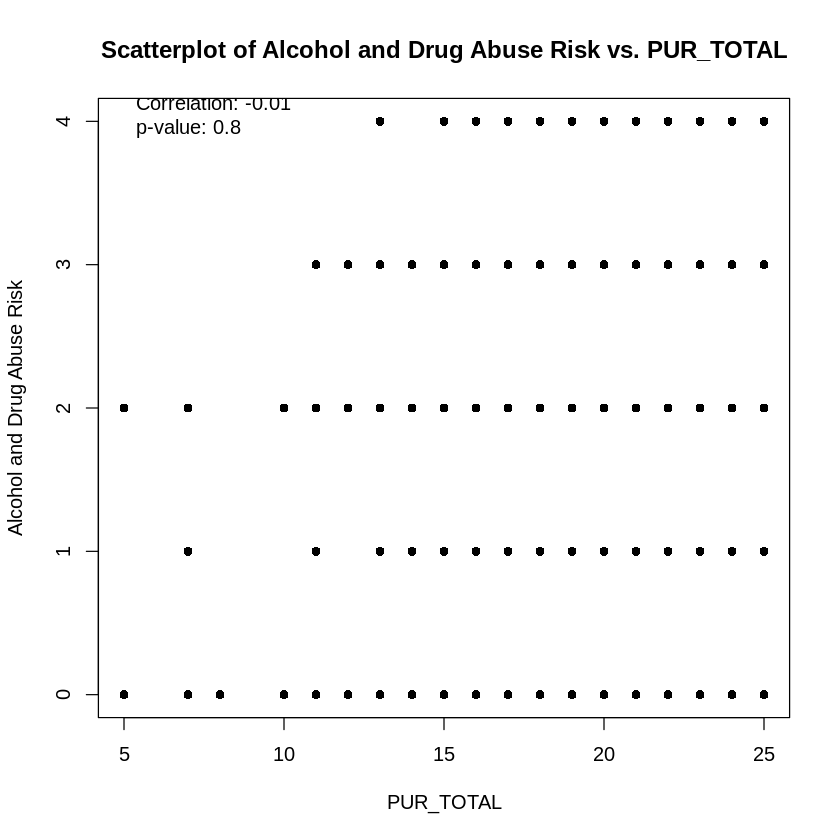

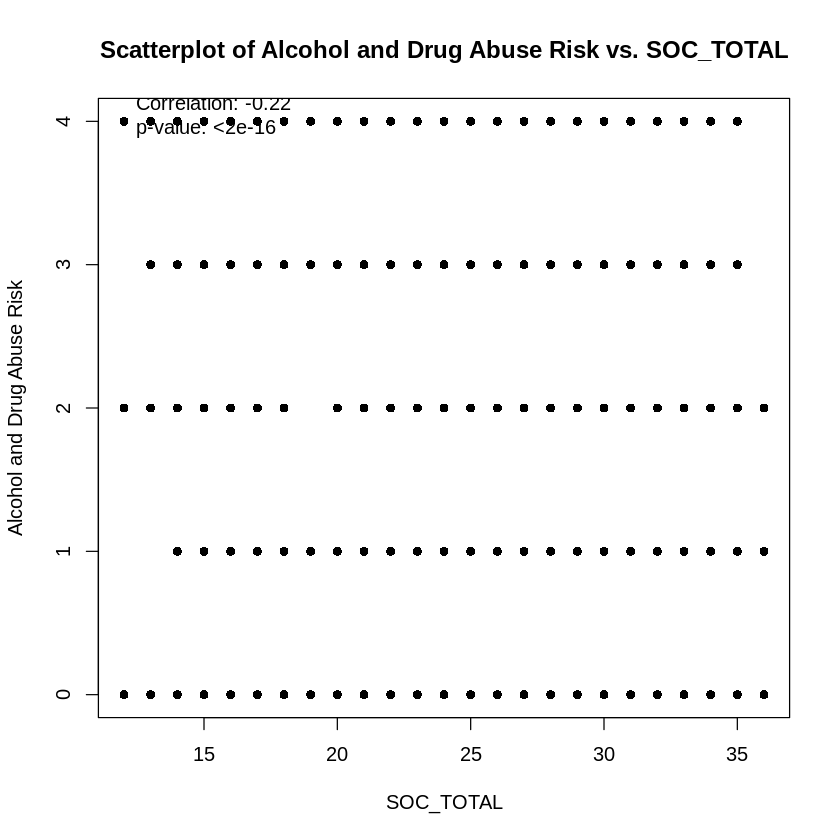

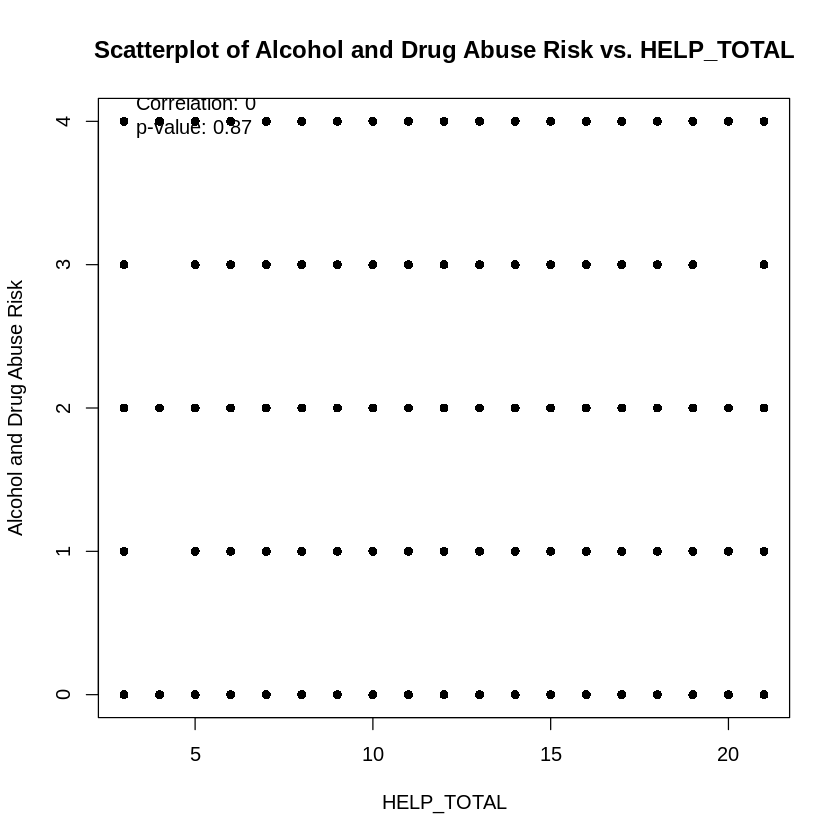

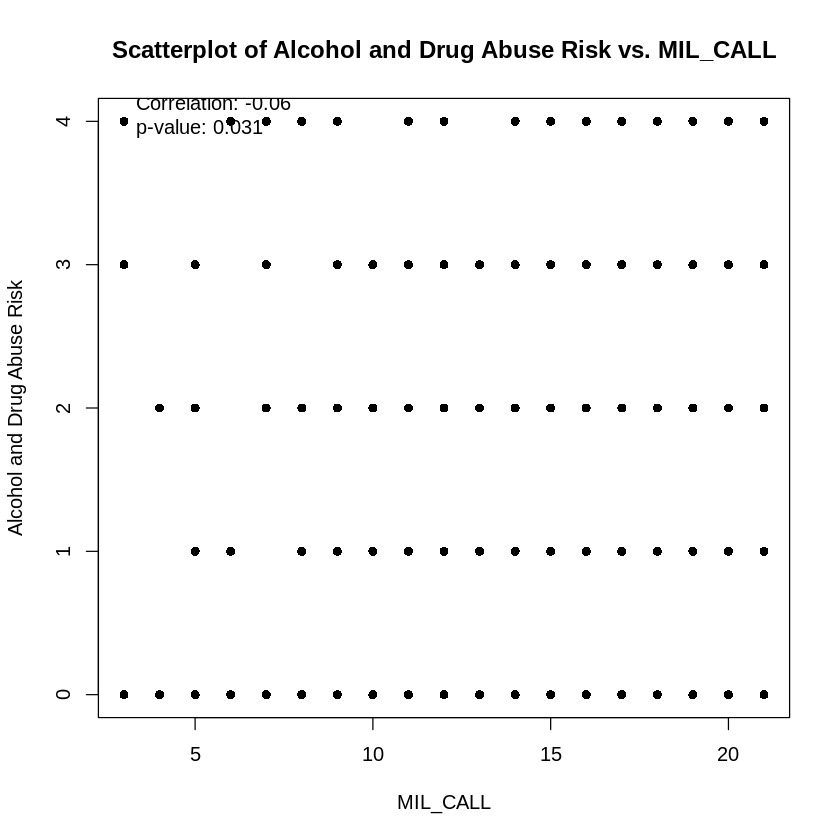

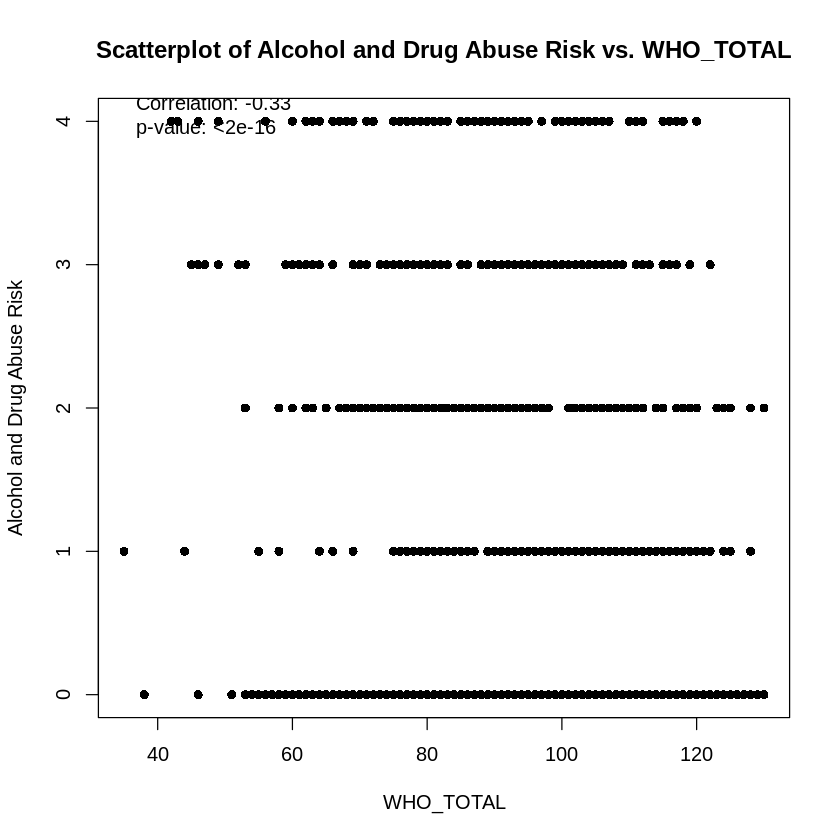

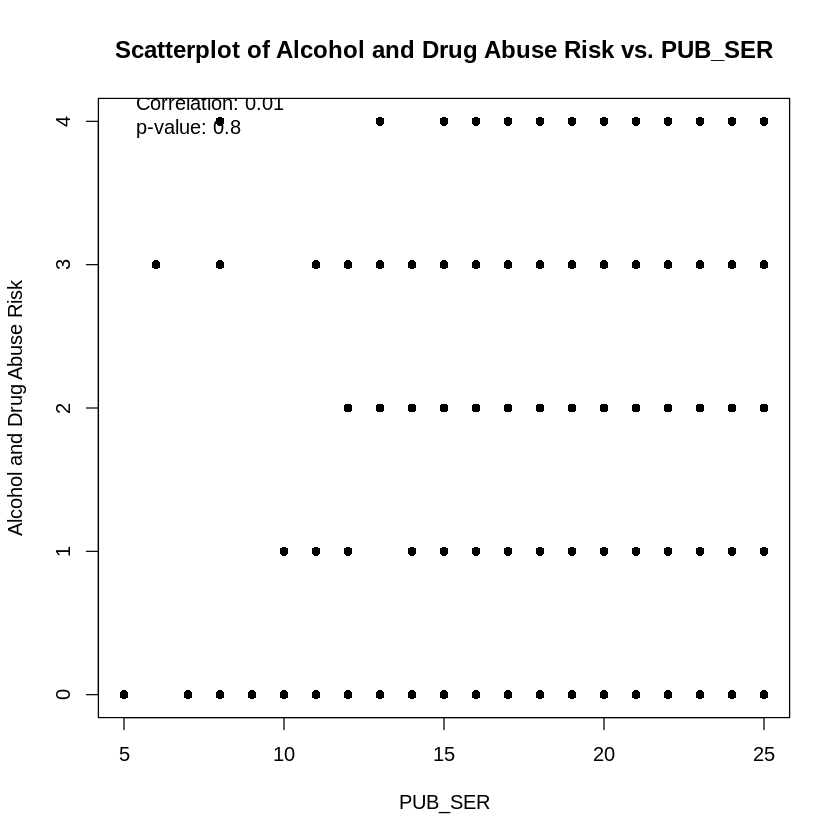

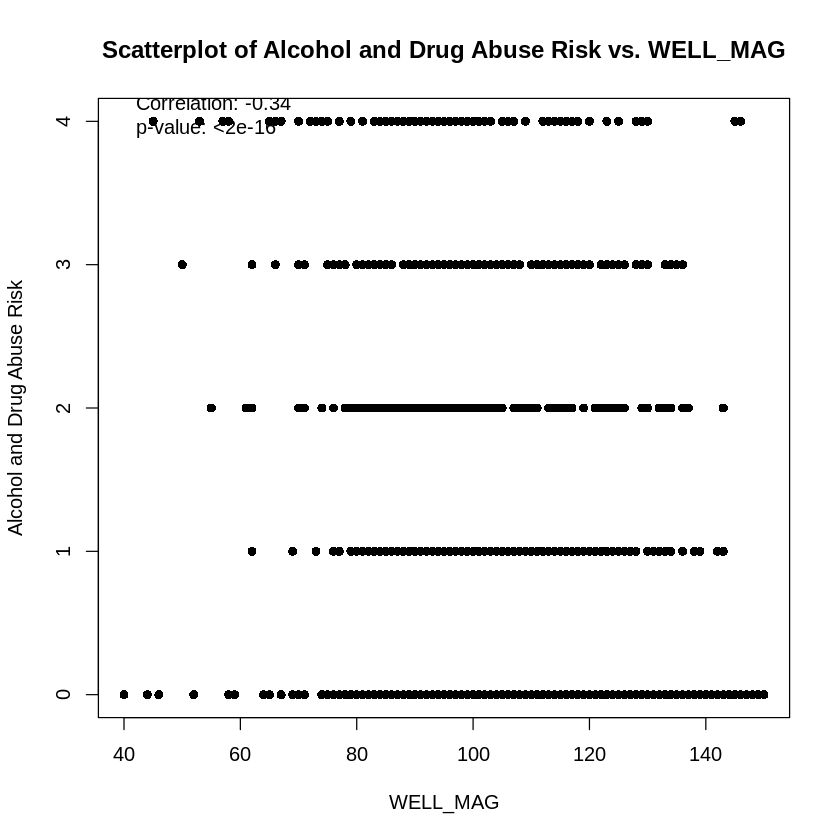

Warning message:
“Variable STRESS_SEV or CAGEAID_TOTAL not found in the dataframe.”


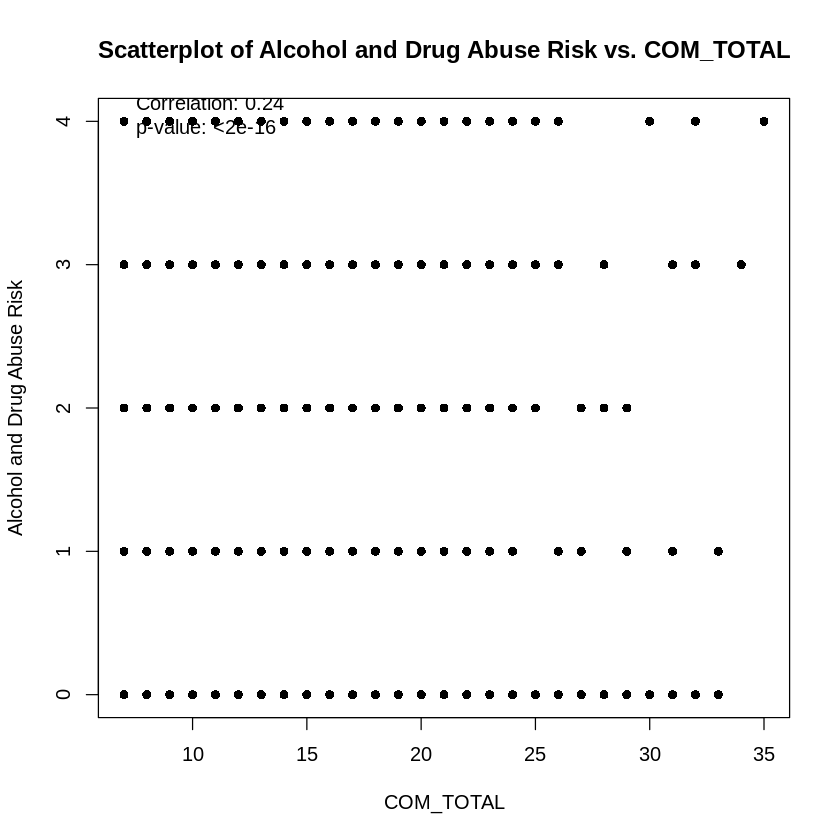

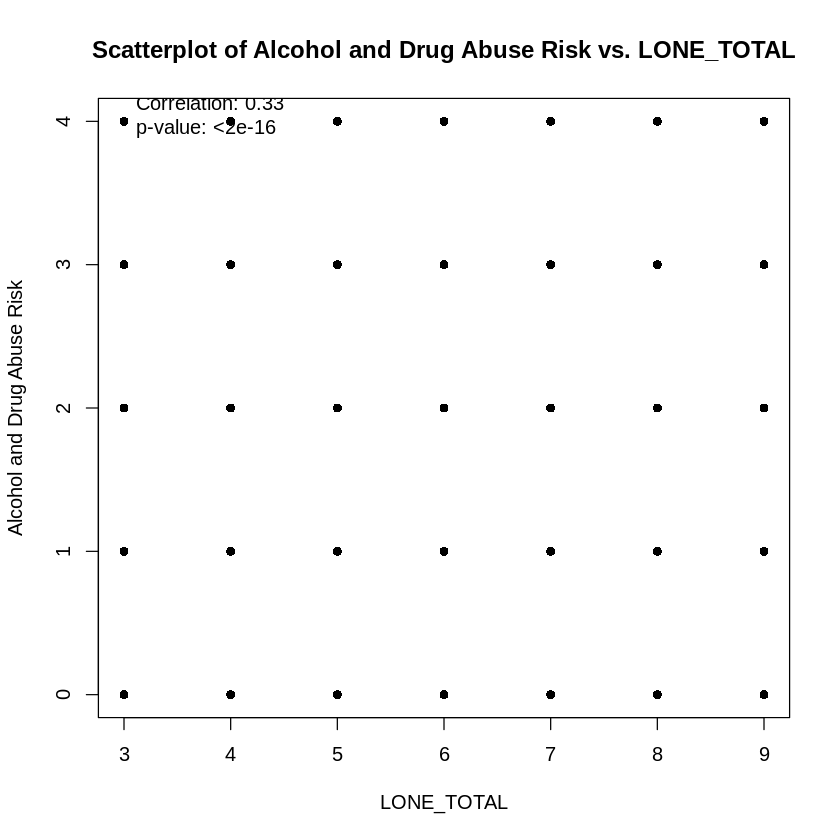

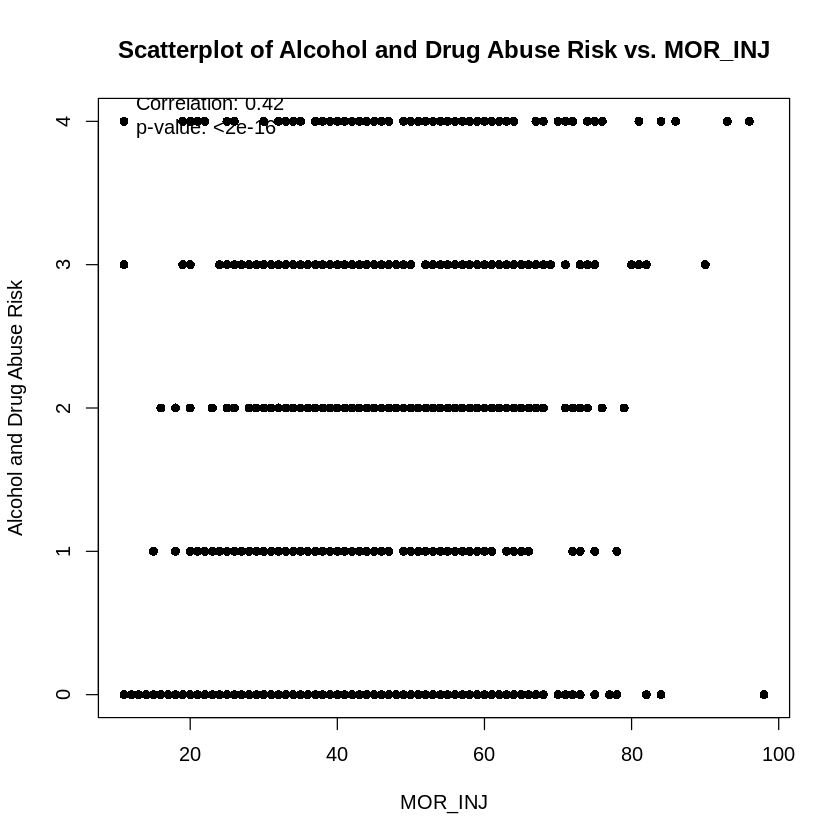

Warning message:
“Variable SUICIDE_R or CAGEAID_TOTAL not found in the dataframe.”


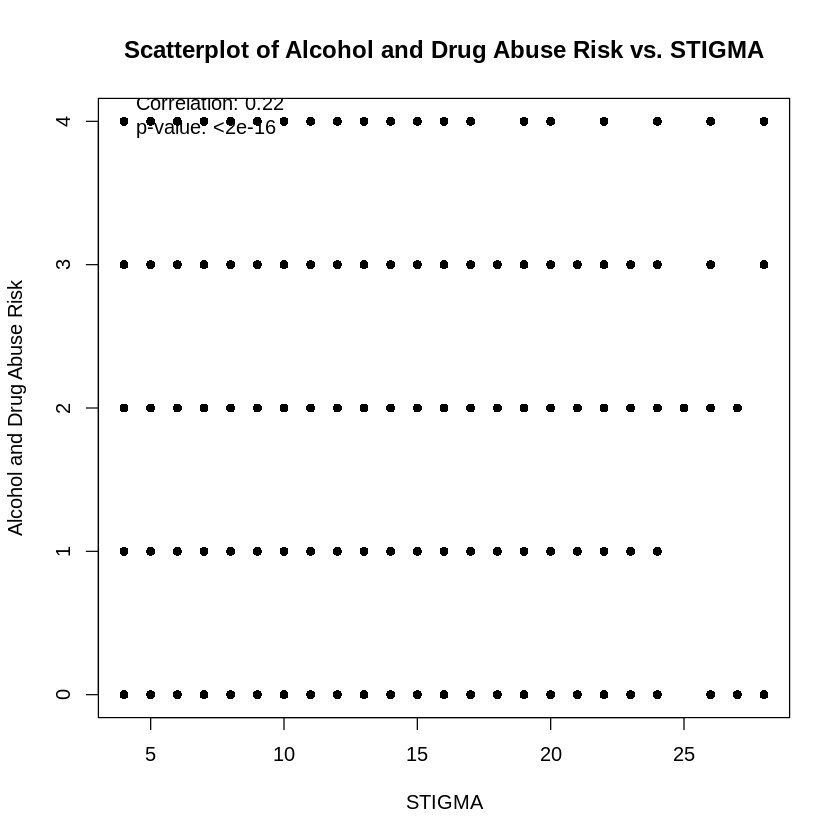

Warning message:
“Variable INCOME_R or CAGEAID_TOTAL not found in the dataframe.”


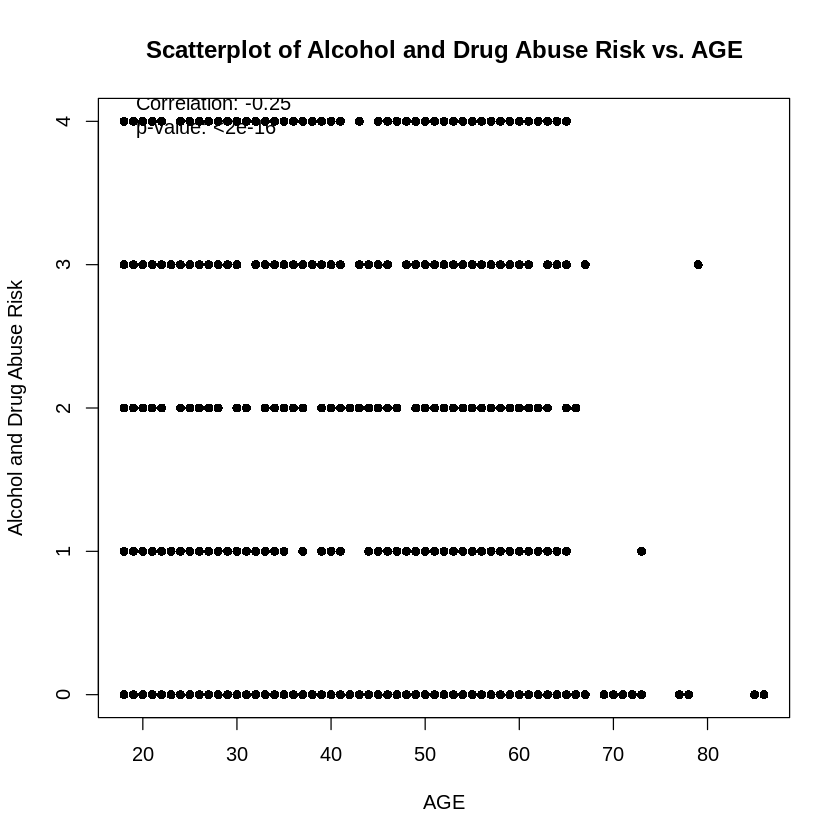

In [ ]:
# prompt: Only perform bivariate analysis for CAGEAID_TOTAL by the following variables PUR_TOTAL, SOC_TOTAL, HELP_TOTAL, MIL_CALL, WHO_TOTAL, PUB_SER, WELL_MAG, COM_TOTAL, STRESS_SEV, LONE_TOTAL, MOR_INJ, STIGMA, SUICIDE_R, AGE, INCOME_R.

# Assuming 'MilitaryDF' is your dataframe

# Variables for bivariate analysis
variables <- c("PUR_TOTAL", "SOC_TOTAL", "HELP_TOTAL", "MIL_CALL", "WHO_TOTAL", "PUB_SER", "WELL_MAG", "COM_TOTAL", "STRESS_SEV", "LONE_TOTAL", "MOR_INJ", "STIGMA", "SUICIDE_R", "AGE", "INCOME_R")

# Loop through each variable and create a scatterplot with CAGEAID_TOTAL
for (var in variables) {
  # Check if both variables exist in the dataframe
  if (var %in% names(MilitaryDF) && "CAGEAID_TOTAL" %in% names(MilitaryDF)) {

    # Create the scatterplot
    plot(MilitaryDF[, var], MilitaryDF$CAGEAID_TOTAL,
         main = paste("Scatterplot of Alcohol and Drug Abuse Risk vs.", var),
         xlab = var,
         ylab = "Alcohol and Drug Abuse Risk",
         pch = 16)  # Use filled circles for points


    # Add correlation coefficient and p-value
    correlation <- cor.test(MilitaryDF[, var], MilitaryDF$CAGEAID_TOTAL, use="complete.obs")
    text(min(MilitaryDF[,var], na.rm=TRUE), max(MilitaryDF$CAGEAID_TOTAL, na.rm=TRUE),
         paste("Correlation:", round(correlation$estimate, 2),
               "\np-value:", format.pval(correlation$p.value, digits=2)), pos = 4)


  } else {
    warning(paste("Variable", var, "or CAGEAID_TOTAL not found in the dataframe."))
  }
}

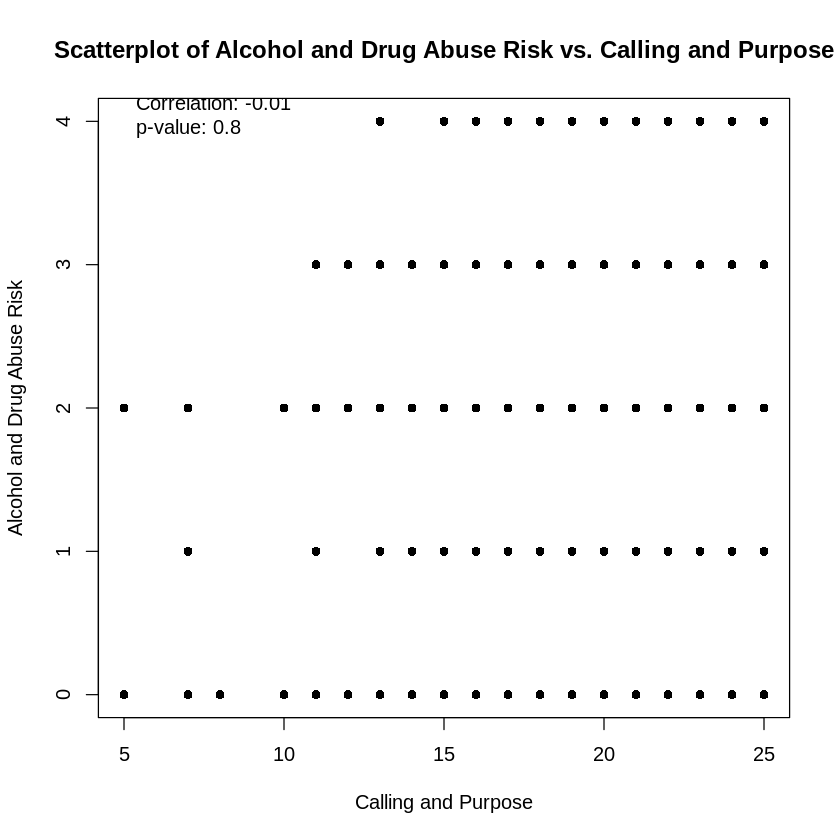

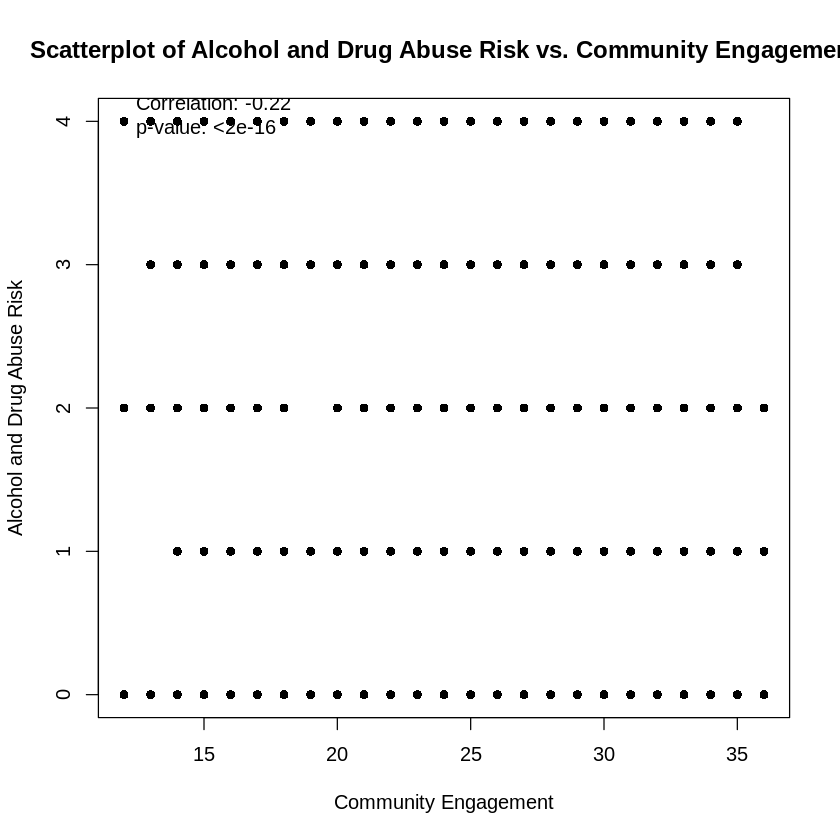

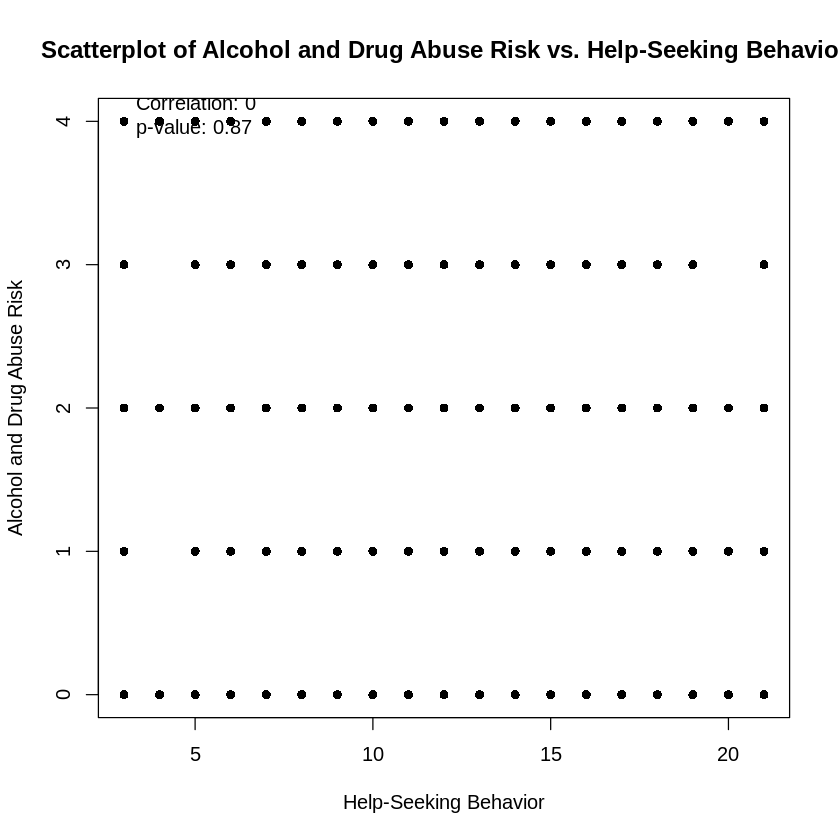

In [ ]:
# prompt: Use the following labels for the scatterplot "Calling and Purpose" for PUR_TOTAL, "Community Engagement" for SOC_TOTAL, "Help-Seeking Behavior" for HELP_TOTAL

# Assuming 'MilitaryDF' is your dataframe

# Variables for bivariate analysis
variables <- c("PUR_TOTAL", "SOC_TOTAL", "HELP_TOTAL")
custom_labels <- c("Calling and Purpose", "Community Engagement", "Help-Seeking Behavior")


# Loop through each variable and create a scatterplot with CAGEAID_TOTAL
for (i in 1:length(variables)) {
  var <- variables[i]
  label <- custom_labels[i]
  # Check if both variables exist in the dataframe
  if (var %in% names(MilitaryDF) && "CAGEAID_TOTAL" %in% names(MilitaryDF)) {

    # Create the scatterplot
    plot(MilitaryDF[, var], MilitaryDF$CAGEAID_TOTAL,
         main = paste("Scatterplot of Alcohol and Drug Abuse Risk vs.", label),
         xlab = label,
         ylab = "Alcohol and Drug Abuse Risk",
         pch = 16)  # Use filled circles for points


    # Add correlation coefficient and p-value
    correlation <- cor.test(MilitaryDF[, var], MilitaryDF$CAGEAID_TOTAL, use="complete.obs")
    text(min(MilitaryDF[,var], na.rm=TRUE), max(MilitaryDF$CAGEAID_TOTAL, na.rm=TRUE),
         paste("Correlation:", round(correlation$estimate, 2),
               "\np-value:", format.pval(correlation$p.value, digits=2)), pos = 4)


  } else {
    warning(paste("Variable", var, "or CAGEAID_TOTAL not found in the dataframe."))
  }
}

In [ ]:
# prompt: Perform a Pearson's Correlations for Model 3.

# Calculate Variance Inflation Factors (VIFs) for model3
vif(model3)

# Correlation Analysis for Model 3
cor(MilitaryDF[, c("CAGEAID_TOTAL", "COM_TOTAL", "STRESS_TOTAL", "LONE_TOTAL", "MOR_INJ", "STIGMA", "SUICIDE_TOTAL", "TBI")], use = "complete.obs")

COM_TOTAL  STRESS_TOTAL    LONE_TOTAL       MOR_INJ        STIGMA 
     1.193091      1.349391      1.471650      2.052171      1.299227 
SUICIDE_TOTAL           TBI 
     1.447954      1.077556

,CAGEAID_TOTAL,COM_TOTAL,STRESS_TOTAL,LONE_TOTAL,MOR_INJ,STIGMA,SUICIDE_TOTAL,TBI
CAGEAID_TOTAL,1.0000000,0.2437315,0.3603947,0.3257624,0.4200490,0.2232623,0.4039698,0.1355026
COM_TOTAL,0.2437315,1.0000000,0.3120213,0.1983379,0.3318964,0.2481173,0.2193856,0.1785359
STRESS_TOTAL,0.3603947,0.3120213,1.0000000,0.3306260,0.4392694,0.3036537,0.3308057,0.1842301
LONE_TOTAL,0.3257624,0.1983379,0.3306260,1.0000000,0.5350915,0.2317219,0.4108909,0.1638260
MOR_INJ,0.4200490,0.3318964,0.4392694,0.5350915,1.0000000,0.4558387,0.5143609,0.1875438
STIGMA,0.2232623,0.2481173,0.3036537,0.2317219,0.4558387,1.0000000,0.2111006,0.1034465
SUICIDE_TOTAL,0.4039698,0.2193856,0.3308057,0.4108909,0.5143609,0.2111006,1.0000000,0.2035533
TBI,0.1355026,0.1785359,0.1842301,0.1638260,0.1875438,0.1034465,0.2035533,1.0000000


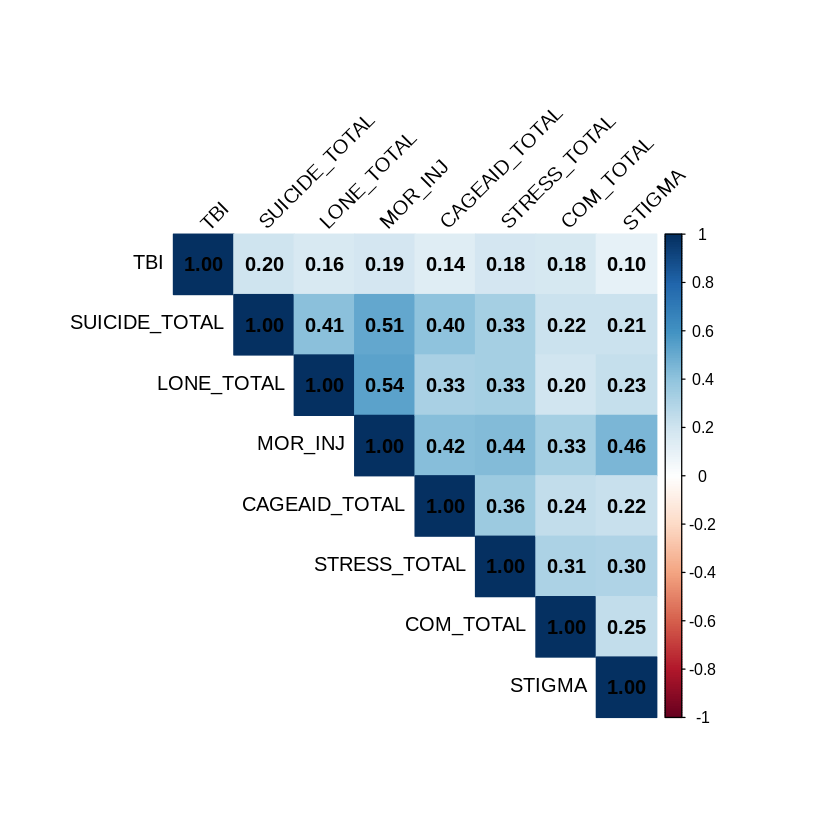

In [ ]:
# Assuming 'model3' is your linear regression model
# Select variables for correlation matrix
selected_vars <- c("CAGEAID_TOTAL", "COM_TOTAL", "STRESS_TOTAL", "LONE_TOTAL", "MOR_INJ", "STIGMA", "SUICIDE_TOTAL", "TBI")

# Create correlation matrix
cor_matrix <- cor(MilitaryDF[, selected_vars], use = "pairwise.complete.obs")

# Install and load corrplot (if not already installed)
if(!require(corrplot)){install.packages("corrplot")}
library(corrplot)

# Visualize the correlation matrix (one-sided)
corrplot(cor_matrix,
         method = "color", # or method = "number"
         type = "upper",   # Display only the upper triangle
         order = "hclust", # Order by hierarchical clustering
         tl.col = "black",  # Text label color
         tl.srt = 45,      # Text label rotation
         addCoef.col = "black", # Add correlation coefficients in black
         number.digits = 2  # Display coefficients with 3 decimal places
         )

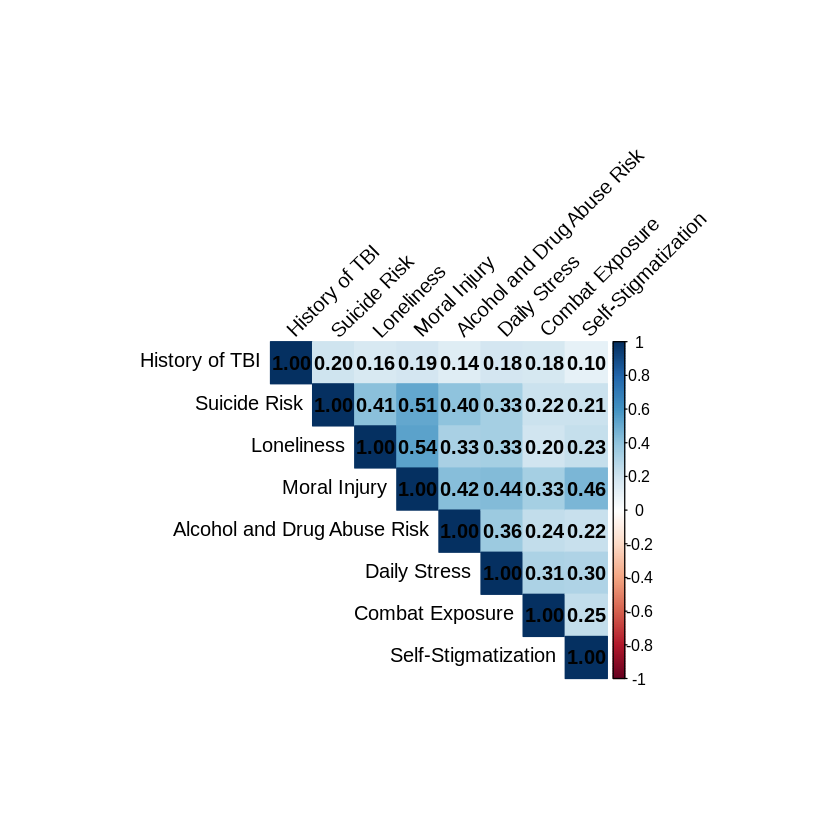

In [ ]:
# prompt: Use the labels Alcohol and Drug Abuse Risk, Suicide Risk, Loneliness, Moral Injury, Daily Stress, Combat Exposure, Self-Stigmatization, History of TBI for the above correlation matrix

# Assuming 'cor_matrix' is your correlation matrix from the previous code

# Define custom labels
labels <- c("Alcohol and Drug Abuse Risk", "Combat Exposure", "Daily Stress", "Loneliness", "Moral Injury", "Self-Stigmatization", "Suicide Risk", "History of TBI")

# Rename the rows and columns of the correlation matrix
colnames(cor_matrix) <- labels
rownames(cor_matrix) <- labels

# Visualize the correlation matrix with custom labels
corrplot(cor_matrix,
         method = "color",
         type = "upper",
         order = "hclust",
         tl.col = "black",
         tl.srt = 45,
         addCoef.col = "black",
         number.digits = 2,
         insig = "blank")

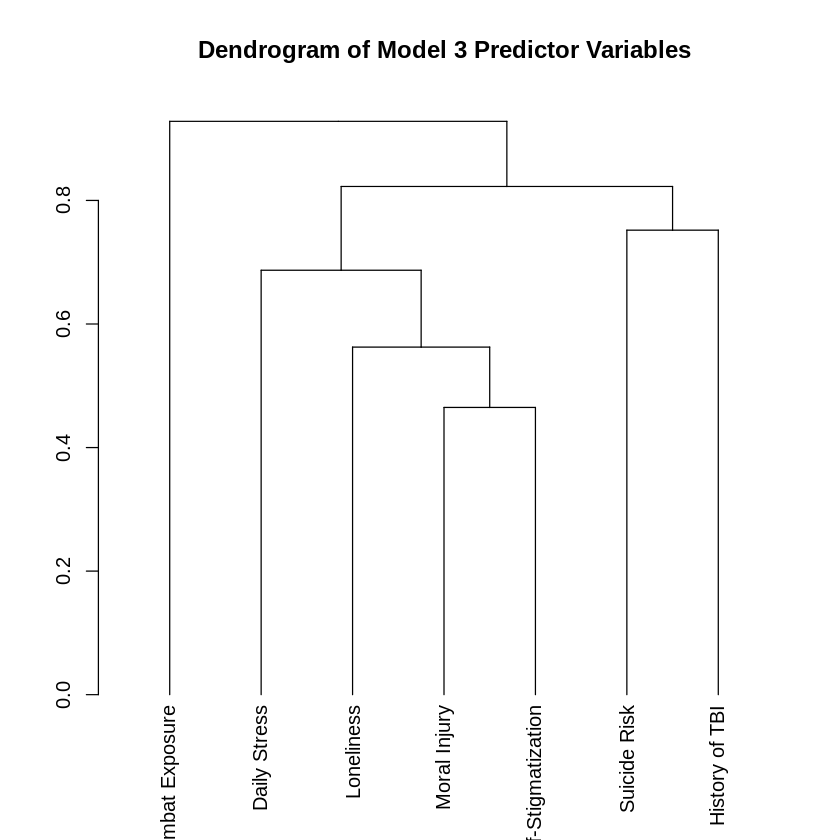

In [ ]:
# prompt: Produce a dendrogram for model 3 with the labels

# Install and load necessary packages
if(!require(cluster)){install.packages("cluster")}
if(!require(dendextend)){install.packages("dendextend")}
library(cluster)
library(dendextend)

# Select variables for clustering (from model3)
composite_vars <- c("COM_TOTAL", "STRESS_TOTAL", "LONE_TOTAL", "MOR_INJ", "STIGMA", "SUICIDE_TOTAL", "TBI")

# Subset the data
composite_data <- MilitaryDF[, composite_vars]

# Calculate the correlation matrix
cor_matrix <- cor(composite_data, use = "pairwise.complete.obs")

# Perform hierarchical clustering
hc_model3 <- hclust(as.dist(1 - cor_matrix), method = "ward.D2")

# Create the dendrogram
dend3 <- as.dendrogram(hc_model3)

# Define custom labels
labels3 <- c("Combat Exposure", "Daily Stress", "Loneliness", "Moral Injury", "Self-Stigmatization", "Suicide Risk", "History of TBI")

# Set the custom labels
dend3 <- dend3 %>% set("labels", labels3)

# Plot the dendrogram
plot(dend3, main = "Dendrogram of Model 3 Predictor Variables")

In [ ]:
vif(model3)

COM_TOTAL  STRESS_TOTAL    LONE_TOTAL       MOR_INJ        STIGMA 
     1.193091      1.349391      1.471650      2.052171      1.299227 
SUICIDE_TOTAL           TBI 
     1.447954      1.077556

In [ ]:
# prompt: what are the variables in model 1

# The variables in model2 are:
# HELP_TOTAL
# WHO_TOTAL
# WELL_MAG
# They predict CAGEAID_TOTAL

In [ ]:
# prompt: Perform a linear regression of the combines model1 with model3

# Combine model1 and model3 (assuming model1 exists and is defined previously)
model5 <- lm(CAGEAID_TOTAL ~ PUR_TOTAL + SOC_TOTAL + HELP_TOTAL + MIL_CALL + WHO_TOTAL + PUB_SER + WELL_MAG + COM_TOTAL + STRESS_TOTAL + LONE_TOTAL + MOR_INJ + STIGMA + SUICIDE_TOTAL + TBI, data = MilitaryDF)

# Summarize the combined model
summary(model5)

# Print coefficients rounded to 3 decimal places
round(coef(model5), 3)


Call:
lm(formula = CAGEAID_TOTAL ~ PUR_TOTAL + SOC_TOTAL + HELP_TOTAL + 
    MIL_CALL + WHO_TOTAL + PUB_SER + WELL_MAG + COM_TOTAL + STRESS_TOTAL + 
    LONE_TOTAL + MOR_INJ + STIGMA + SUICIDE_TOTAL + TBI, data = MilitaryDF)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.3165 -0.6350 -0.2627  0.4216  3.7909 

Coefficients:
                Estimate Std. Error t value Pr(>|t|)    
(Intercept)   -1.1093661  0.4308677  -2.575  0.01013 *  
PUR_TOTAL      0.0199135  0.0119954   1.660  0.09711 .  
SOC_TOTAL      0.0007039  0.0089440   0.079  0.93728    
HELP_TOTAL     0.0137731  0.0082599   1.667  0.09564 .  
MIL_CALL       0.0036786  0.0105531   0.349  0.72746    
WHO_TOTAL     -0.0014965  0.0028545  -0.524  0.60018    
PUB_SER       -0.0045341  0.0126083  -0.360  0.71919    
WELL_MAG      -0.0007642  0.0029566  -0.258  0.79609    
COM_TOTAL      0.0143867  0.0055408   2.596  0.00951 ** 
STRESS_TOTAL   0.1153729  0.0195402   5.904 4.41e-09 ***
LONE_TOTAL     0.0487819  0.0212863   

(Intercept)     PUR_TOTAL     SOC_TOTAL    HELP_TOTAL      MIL_CALL 
       -1.109         0.020         0.001         0.014         0.004 
    WHO_TOTAL       PUB_SER      WELL_MAG     COM_TOTAL  STRESS_TOTAL 
       -0.001        -0.005        -0.001         0.014         0.115 
   LONE_TOTAL       MOR_INJ        STIGMA SUICIDE_TOTAL           TBI 
        0.049         0.014         0.007         0.075         0.018

In [ ]:
# prompt: Perform a linear regression for model5 combined with the variables AGE and RACE_R.  Name the model, "model6".

model6 <- lm(CAGEAID_TOTAL ~ PUR_TOTAL + SOC_TOTAL + HELP_TOTAL + MIL_CALL + WHO_TOTAL + PUB_SER + WELL_MAG + COM_TOTAL + STRESS_TOTAL + LONE_TOTAL + MOR_INJ + STIGMA + SUICIDE_TOTAL + TBI + AGE + RACE_R, data = MilitaryDF)
summary(model6)
round(coef(model6), 3)



Call:
lm(formula = CAGEAID_TOTAL ~ PUR_TOTAL + SOC_TOTAL + HELP_TOTAL + 
    MIL_CALL + WHO_TOTAL + PUB_SER + WELL_MAG + COM_TOTAL + STRESS_TOTAL + 
    LONE_TOTAL + MOR_INJ + STIGMA + SUICIDE_TOTAL + TBI + AGE + 
    RACE_R, data = MilitaryDF)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.2832 -0.6422 -0.2677  0.4307  3.8232 

Coefficients:
                Estimate Std. Error t value Pr(>|t|)    
(Intercept)   -1.2726933  0.4915908  -2.589  0.00972 ** 
PUR_TOTAL      0.0179529  0.0120833   1.486  0.13756    
SOC_TOTAL      0.0008370  0.0089704   0.093  0.92568    
HELP_TOTAL     0.0137182  0.0083475   1.643  0.10052    
MIL_CALL       0.0046164  0.0105868   0.436  0.66287    
WHO_TOTAL     -0.0012410  0.0028858  -0.430  0.66725    
PUB_SER       -0.0030880  0.0126539  -0.244  0.80724    
WELL_MAG      -0.0010756  0.0029921  -0.359  0.71929    
COM_TOTAL      0.0141872  0.0057456   2.469  0.01366 *  
STRESS_TOTAL   0.1158111  0.0201211   5.756 1.05e-08 ***
LONE_TOTAL     0.0

(Intercept)     PUR_TOTAL     SOC_TOTAL    HELP_TOTAL      MIL_CALL 
       -1.273         0.018         0.001         0.014         0.005 
    WHO_TOTAL       PUB_SER      WELL_MAG     COM_TOTAL  STRESS_TOTAL 
       -0.001        -0.003        -0.001         0.014         0.116 
   LONE_TOTAL       MOR_INJ        STIGMA SUICIDE_TOTAL           TBI 
        0.049         0.014         0.007         0.075         0.023 
          AGE        RACE_R 
        0.001         0.106

In [ ]:
# prompt: produce a pearson's correlation table for model5

# Assuming 'model5' is your linear regression model and 'MilitaryDF' is your data frame

# Select variables for correlation matrix (including the dependent variable)
selected_vars <- c("CAGEAID_TOTAL", "PUR_TOTAL", "SOC_TOTAL", "HELP_TOTAL", "PUB_SER", "MIL_CALL", "WHO_TOTAL", "WELL_MAG", "COM_TOTAL", "STRESS_TOTAL", "LONE_TOTAL", "MOR_INJ", "STIGMA", "SUICIDE_TOTAL", "TBI")

# Create correlation matrix
cor_matrix_model5 <- cor(MilitaryDF[, selected_vars], use = "pairwise.complete.obs")

# Print the correlation table
cor_matrix_model5

# Optionally, visualize the correlation matrix using corrplot
# (Install and load corrplot if not already installed)
# if(!require(corrplot)){install.packages("corrplot")}
# library(corrplot)
# corrplot(cor_matrix_model5, method = "color", type = "upper", order = "hclust", tl.col = "black", tl.srt = 45)

,CAGEAID_TOTAL,PUR_TOTAL,SOC_TOTAL,HELP_TOTAL,PUB_SER,MIL_CALL,WHO_TOTAL,WELL_MAG,COM_TOTAL,STRESS_TOTAL,LONE_TOTAL,MOR_INJ,STIGMA,SUICIDE_TOTAL,TBI
CAGEAID_TOTAL,1.000000000,-0.006659787,-0.222024213,-0.004146991,0.006541789,-0.055943038,-0.3328458,-0.3383724,0.243731530,0.36039472,0.32576242,0.4200490,0.22326228,0.40396977,0.135502588
PUR_TOTAL,-0.006659787,1.000000000,0.280476628,0.289626635,0.586706646,0.361334754,0.1745666,0.2672109,0.013667496,-0.04337627,0.00394817,-0.1831971,-0.20669154,-0.07448438,0.000842640
SOC_TOTAL,-0.222024213,0.280476628,1.000000000,0.456751932,0.225473372,0.196267279,0.6114610,0.7105632,-0.008106962,-0.15272951,-0.47369935,-0.5091864,-0.19796807,-0.38957181,-0.126523198
HELP_TOTAL,-0.004146991,0.289626635,0.456751932,1.000000000,0.288755991,0.220874507,0.2793158,0.2888993,0.143972937,0.02848265,-0.18779861,-0.1367415,0.01364205,-0.12321393,-0.041591876
PUB_SER,0.006541789,0.586706646,0.225473372,0.288755991,1.000000000,0.579145139,0.1123340,0.2200595,0.105557734,0.01007531,0.01775800,-0.1306369,-0.26542288,-0.01967498,0.020676406
MIL_CALL,-0.055943038,0.361334754,0.196267279,0.220874507,0.579145139,1.000000000,0.1251004,0.1985482,0.022896918,-0.09708437,-0.04814950,-0.2045100,-0.40886750,-0.09062607,0.005104381
WHO_TOTAL,-0.332845786,0.174566565,0.611461048,0.279315769,0.112334035,0.125100434,1.0000000,0.7779921,-0.134906434,-0.33154422,-0.59413301,-0.6191601,-0.22163294,-0.53245223,-0.221248986
WELL_MAG,-0.338372418,0.267210938,0.710563225,0.288899301,0.220059467,0.198548156,0.7779921,1.0000000,-0.138593006,-0.31706995,-0.57874544,-0.6966874,-0.30745935,-0.52941487,-0.156678476
COM_TOTAL,0.243731530,0.013667496,-0.008106962,0.143972937,0.105557734,0.022896918,-0.1349064,-0.1385930,1.000000000,0.31202127,0.19833788,0.3318964,0.24811731,0.21938564,0.178535906
STRESS_TOTAL,0.360394720,-0.043376265,-0.152729510,0.028482652,0.010075307,-0.097084368,-0.3315442,-0.3170699,0.312021269,1.00000000,0.33062596,0.4392694,0.30365371,0.33080570,0.184230087


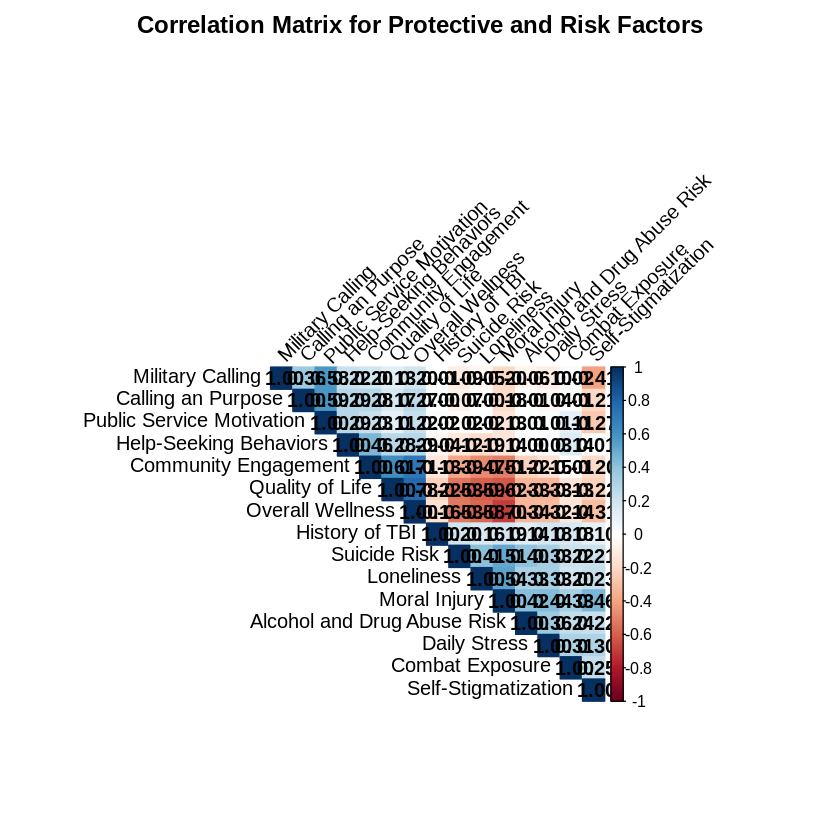

In [ ]:
# prompt: Create a correlation matrix  and plot for model5. Use full labels for the variables

# Calculate the correlation matrix for model5
model5_vars <- c("CAGEAID_TOTAL", "PUR_TOTAL", "SOC_TOTAL", "HELP_TOTAL", "PUB_SER", "MIL_CALL", "WHO_TOTAL", "WELL_MAG", "COM_TOTAL", "STRESS_TOTAL", "LONE_TOTAL", "MOR_INJ", "STIGMA", "SUICIDE_TOTAL", "TBI")
cor_matrix_model5 <- cor(MilitaryDF[, model5_vars], use = "pairwise.complete.obs")

# Install and load corrplot if not already installed
if(!require(corrplot)){install.packages("corrplot")}
library(corrplot)

# Define custom labels for the variables
custom_labels <- c("Alcohol and Drug Abuse Risk", "Calling an Purpose", "Community Engagement", "Help-Seeking Behaviors", "Public Service Motivation", "Military Calling", "Quality of Life", "Overall Wellness", "Combat Exposure", "Daily Stress", "Loneliness", "Moral Injury", "Self-Stigmatization", "Suicide Risk", "History of TBI")

# Rename the rows and columns of the correlation matrix with custom labels
colnames(cor_matrix_model5) <- custom_labels
rownames(cor_matrix_model5) <- custom_labels

# Create the correlation plot with custom labels
corrplot(cor_matrix_model5,
         method = "color",
         type = "upper",
         order = "hclust",
         tl.col = "black",
         tl.srt = 45,
         addCoef.col = "black",
         number.digits = 2,
         insig = "blank",
         title = "Correlation Matrix for Protective and Risk Factors",
         mar=c(0,0,2,0)) # Adjust margin for title

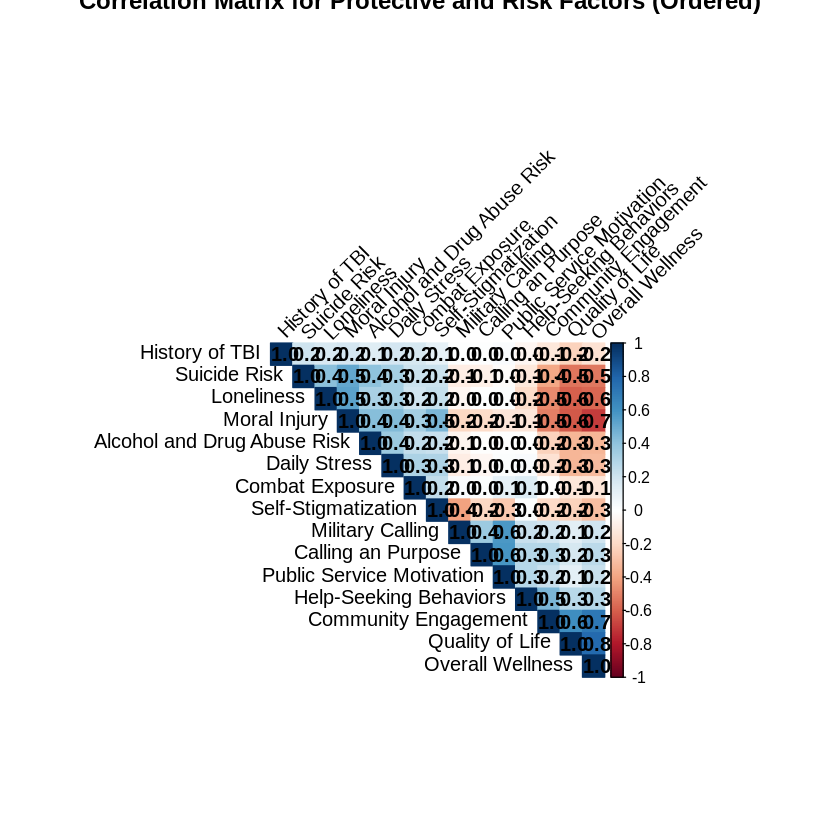

In [ ]:
# prompt: reorder the matrix for model5 based upon hierarchical clustering

# Assuming 'cor_matrix_model5' is your correlation matrix from the previous code

# Perform hierarchical clustering on the correlation matrix
hc_model5 <- hclust(as.dist(1 - cor_matrix_model5), method = "ward.D2")

# Create a dendrogram object
dend5 <- as.dendrogram(hc_model5)

# Reorder the correlation matrix based on the dendrogram
cor_matrix_model5_ordered <- cor_matrix_model5[order.dendrogram(dend5), order.dendrogram(dend5)]

# Now 'cor_matrix_model5_ordered' contains the reordered matrix
# You can use this matrix in your subsequent visualizations (e.g., corrplot)

# Example using corrplot:
corrplot(cor_matrix_model5_ordered,
         method = "color",
         type = "upper",
         order = "original", # Set to 'original' because matrix is already ordered
         tl.col = "black",
         tl.srt = 45,
         addCoef.col = "black",
         number.digits = 1,
         insig = "blank",
         title = "Correlation Matrix for Protective and Risk Factors (Ordered)")

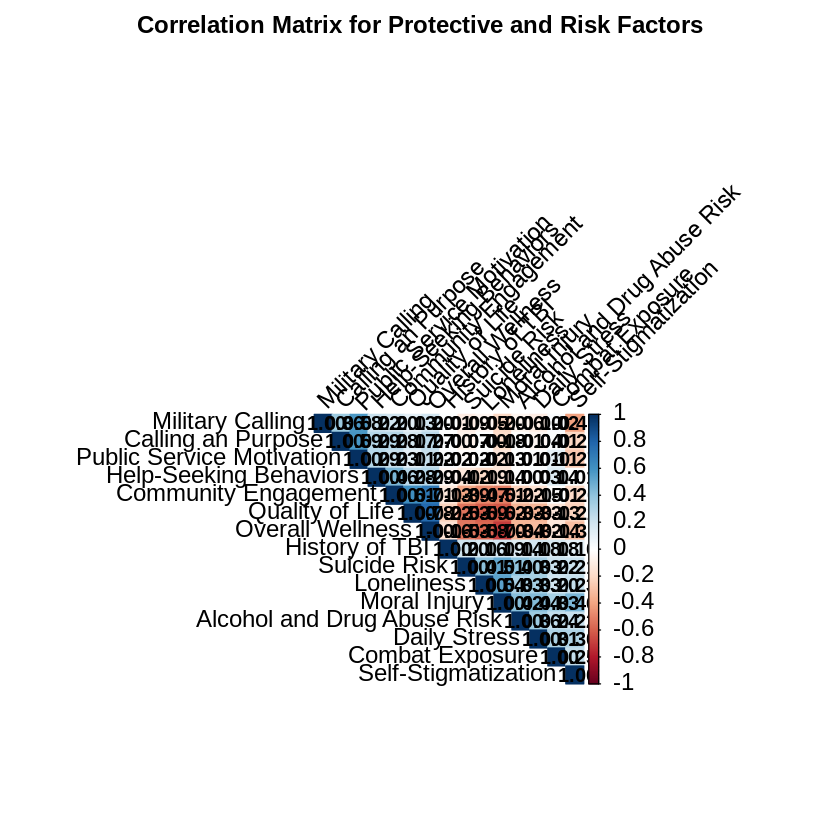

In [ ]:
# prompt: Create a correlation matrix and plot for model5. Use full labels for the variables

# Calculate the correlation matrix for model5
model5_vars <- c("CAGEAID_TOTAL", "PUR_TOTAL", "SOC_TOTAL", "HELP_TOTAL", "PUB_SER", "MIL_CALL", "WHO_TOTAL", "WELL_MAG", "COM_TOTAL", "STRESS_TOTAL", "LONE_TOTAL", "MOR_INJ", "STIGMA", "SUICIDE_TOTAL", "TBI")
cor_matrix_model5 <- cor(MilitaryDF[, model5_vars], use = "pairwise.complete.obs")

# Install and load corrplot if not already installed
if(!require(corrplot)){install.packages("corrplot")}
library(corrplot)

# Define custom labels for the variables
custom_labels <- c("Alcohol and Drug Abuse Risk", "Calling an Purpose", "Community Engagement", "Help-Seeking Behaviors", "Public Service Motivation", "Military Calling", "Quality of Life", "Overall Wellness", "Combat Exposure", "Daily Stress", "Loneliness", "Moral Injury", "Self-Stigmatization", "Suicide Risk", "History of TBI")

# Rename the rows and columns of the correlation matrix with custom labels
colnames(cor_matrix_model5) <- custom_labels
rownames(cor_matrix_model5) <- custom_labels

# Create the correlation plot with custom labels
# All arguments should be inside the corrplot() function's parentheses
corrplot(cor_matrix_model5,
         method = "color",
         type = "upper",
         order = "hclust",
         tl.col = "black",
         tl.srt = 45,
         addCoef.col = "black",
         number.digits = 2,
         insig = "blank",
         title = "Correlation Matrix for Protective and Risk Factors",
         mar = c(0, 0, 2, 0),  # Adjust margin for title
         cl.cex = 1.2,        # Increase color key label size
         tl.cex = 1.2,        # Increase variable label size
         number.cex = 1,      # Increase correlation coefficient size
         cl.align.text = "l")  # Align color key labels to the left

In [ ]:
# prompt: Make the correlation matrix larger

# Assuming 'cor_matrix' is your correlation matrix from the previous code

# Define custom labels
labels <- c("Alcohol and Drug Abuse Risk", "Combat Exposure", "Daily Stress", "Loneliness", "Moral Injury", "Self-Stigmatization", "Suicide Risk", "History of TBI")

# Rename the rows and columns of the correlation matrix
colnames(cor_matrix) <- labels
rownames(cor_matrix) <- labels

# Visualize the correlation matrix with custom labels and increased size
corrplot(cor_matrix,
         method = "color",
         type = "upper",
         order = "hclust",
         tl.col = "black",
         tl.srt = 45,
         addCoef.col = "black",
         number.digits = 2,
         insig = "blank",
         cl.cex = 1,  # Increase the size of the color key labels
         tl.cex = 1, # Increase the size of the variable labels
         cl.align.text = "l") # Align the color key labels to the left

ERROR: Error in dimnames(x) <- dn: length of 'dimnames' [2] not equal to array extent


In [ ]:
# prompt: Add the variables AGE and RACE to model 5 and perform a linear regression.  Name it model6

# Assuming AGE and RACE are columns in your MilitaryDF dataframe.
model6 <- lm(CAGEAID_TOTAL ~ PUR_TOTAL + SOC_TOTAL + HELP_TOTAL + PUB_SER + MIL_CALL + WHO_TOTAL + WELL_MAG + COM_TOTAL + STRESS_TOTAL + LONE_TOTAL + MOR_INJ + STIGMA + SUICIDE_TOTAL + TBI + AGE + RACE, data = MilitaryDF)
summary(model6)


Call:
lm(formula = CAGEAID_TOTAL ~ PUR_TOTAL + SOC_TOTAL + HELP_TOTAL + 
    PUB_SER + MIL_CALL + WHO_TOTAL + WELL_MAG + COM_TOTAL + STRESS_TOTAL + 
    LONE_TOTAL + MOR_INJ + STIGMA + SUICIDE_TOTAL + TBI + AGE + 
    RACE, data = MilitaryDF)

Residuals:
    Min      1Q  Median      3Q     Max 
-3.3066 -0.6353 -0.2644  0.4197  3.7994 

Coefficients:
                Estimate Std. Error t value Pr(>|t|)    
(Intercept)   -1.1424468  0.4839368  -2.361   0.0184 *  
PUR_TOTAL      0.0197674  0.0120429   1.641   0.1009    
SOC_TOTAL      0.0007705  0.0089775   0.086   0.9316    
HELP_TOTAL     0.0139299  0.0083515   1.668   0.0955 .  
PUB_SER       -0.0044718  0.0126254  -0.354   0.7232    
MIL_CALL       0.0036544  0.0105707   0.346   0.7296    
WHO_TOTAL     -0.0014320  0.0028861  -0.496   0.6199    
WELL_MAG      -0.0008287  0.0029895  -0.277   0.7816    
COM_TOTAL      0.0145376  0.0057512   2.528   0.0116 *  
STRESS_TOTAL   0.1160073  0.0201344   5.762 1.02e-08 ***
LONE_TOTAL     0.049


Descriptive Statistics for BRANCH 
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   2.000   3.000   3.728   6.000   7.000 
Standard Deviation: 2.203767 

Frequency Table:

  1   2   3   4   5   6   7 
366  36 491 115  42 122 323 

Percentage Table:

        1         2         3         4         5         6         7 
24.481605  2.408027 32.842809  7.692308  2.809365  8.160535 21.605351 

Descriptive Statistics for GENDER 
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   1.000   1.000   1.334   2.000   3.000 
Standard Deviation: 0.4829379 

Frequency Table:

   1    2    3 
1004  483    8 

Percentage Table:

         1          2          3 
67.1571906 32.3076923  0.5351171 


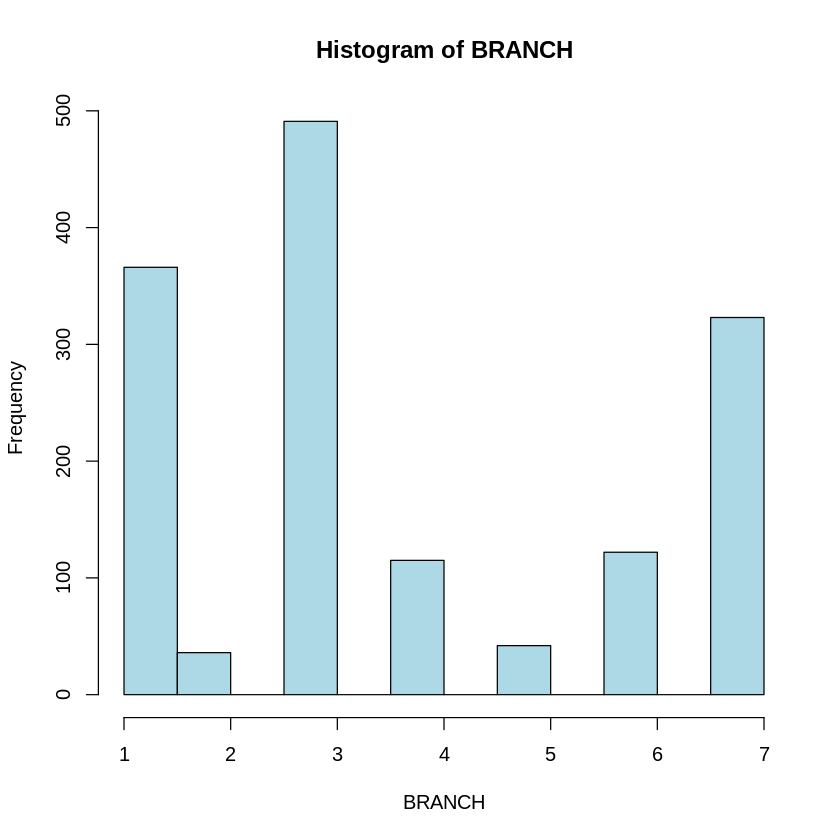


Descriptive Statistics for RACE 
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   1.000   1.000   1.411   1.000   6.000 
Standard Deviation: 0.8742971 

Frequency Table:

   1    2    3    4    5    6 
1129  215   86   42   13   10 

Percentage Table:

         1          2          3          4          5          6 
75.5183946 14.3812709  5.7525084  2.8093645  0.8695652  0.6688963 


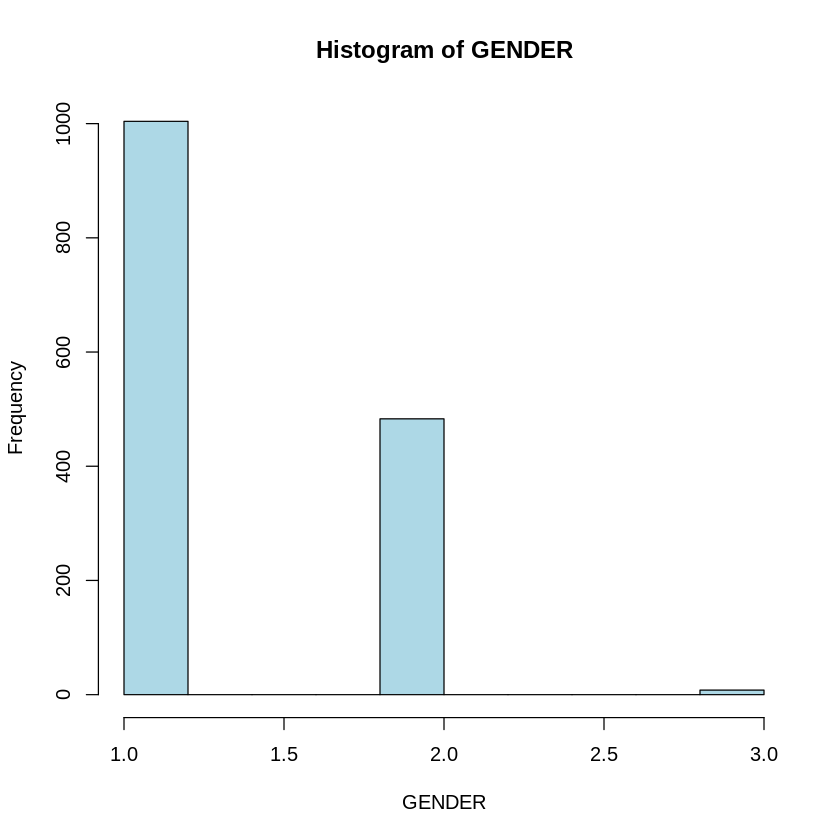


Descriptive Statistics for AGE 
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  18.00   41.00   54.00   50.05   61.00   86.00 
Standard Deviation: 13.40957 

Frequency Table:

 18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37 
 17  18  19  15  16   8   9  20  12  14  13  12  14   7  22  12  20  24  13  22 
 38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57 
 26  17  20  15   7  17  12  19  17  23  24  34  34  40  37  49  54  55  56  64 
 58  59  60  61  62  63  64  65  66  67  69  70  71  72  73  77  78  79  85  86 
 63  62  67  87 102  56  49  54   4   4   3   4   1   1   6   1   1   1   1   1 

Percentage Table:

        18         19         20         21         22         23         24 
1.13712375 1.20401338 1.27090301 1.00334448 1.07023411 0.53511706 0.60200669 
        25         26         27         28         29         30         31 
1.33779264 0.80267559 0.93645485 0.86956522 0.80267559 0.93645485 0.46822742 
  

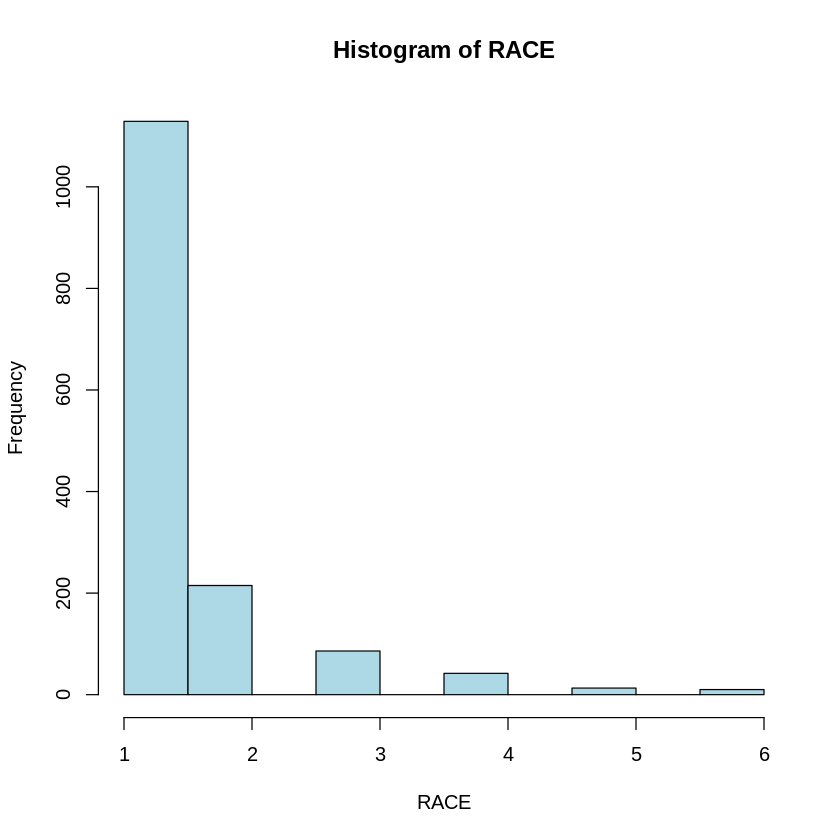


Descriptive Statistics for MARITAL 
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   2.000   2.000   2.229   2.000   5.000 
Standard Deviation: 1.004596 

Frequency Table:

  1   2   3   4   5 
282 886  73 211  43 

Percentage Table:

        1         2         3         4         5 
18.862876 59.264214  4.882943 14.113712  2.876254 


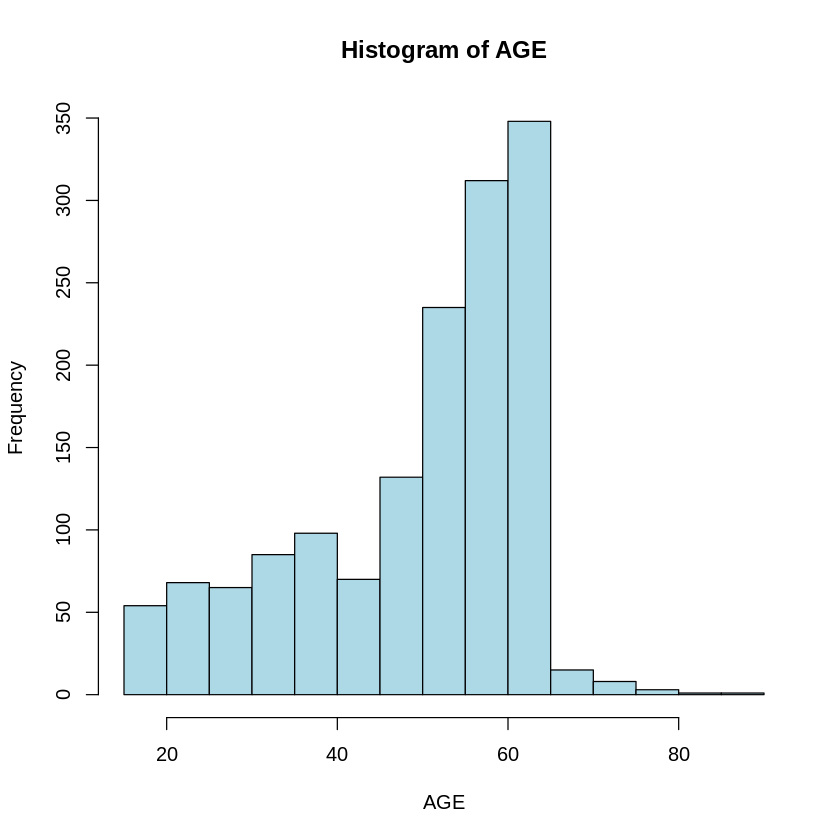


Descriptive Statistics for REGION 
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   1.000   2.000   2.557   4.000   5.000 
Standard Deviation: 1.399697 

Frequency Table:

  1   2   3   4   5 
507 262 272 295 159 

Percentage Table:

       1        2        3        4        5 
33.91304 17.52508 18.19398 19.73244 10.63545 


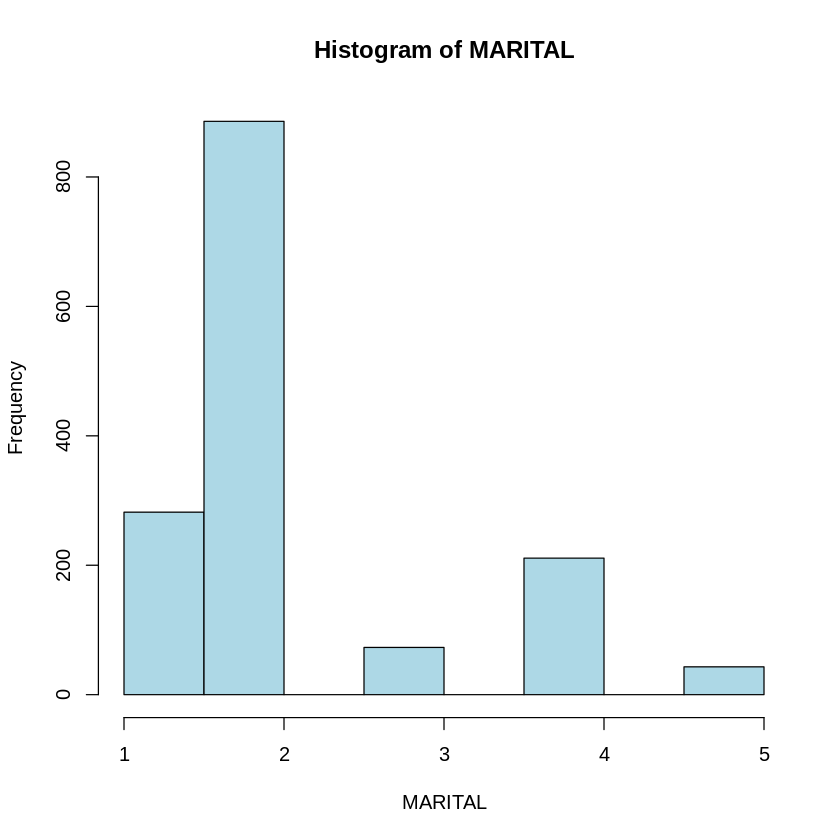


Descriptive Statistics for DURATION 
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   0.03    4.00    6.00    9.59   14.00   40.00 
Standard Deviation: 8.152934 

Frequency Table:

 0.03  0.04  0.05  0.12  0.25   0.3   0.5     1   1.2  1.21   1.5   1.7   1.8 
    1     1     1     1     1     1     4    30     1     1     4     1     1 
    2   2.3   2.5   2.6  2.75  2.95  2.96     3  3.17   3.2  3.21  3.25   3.4 
  100     3     6     1     1     1     1   117     1     2     1     3     1 
  3.5  3.75   3.9     4   4.1  4.25   4.3   4.4  4.45   4.5  4.55   4.7  4.75 
   10     1     1   267     3     1     1     2     1    13     1     1     1 
  4.9     5  5.25   5.3   5.4   5.5  5.75     6  6.08  6.25   6.5   6.7  6.75 
    3    82     3     1     2     5     1   133     1     1     5     1     1 
    7   7.1   7.5  7.75     8   8.3   8.5  8.74  8.75   8.8     9   9.8    10 
   35     1     2     2    99     2     1     1     1     1    19     1    49 
 10.5  10.6 10.75    11  

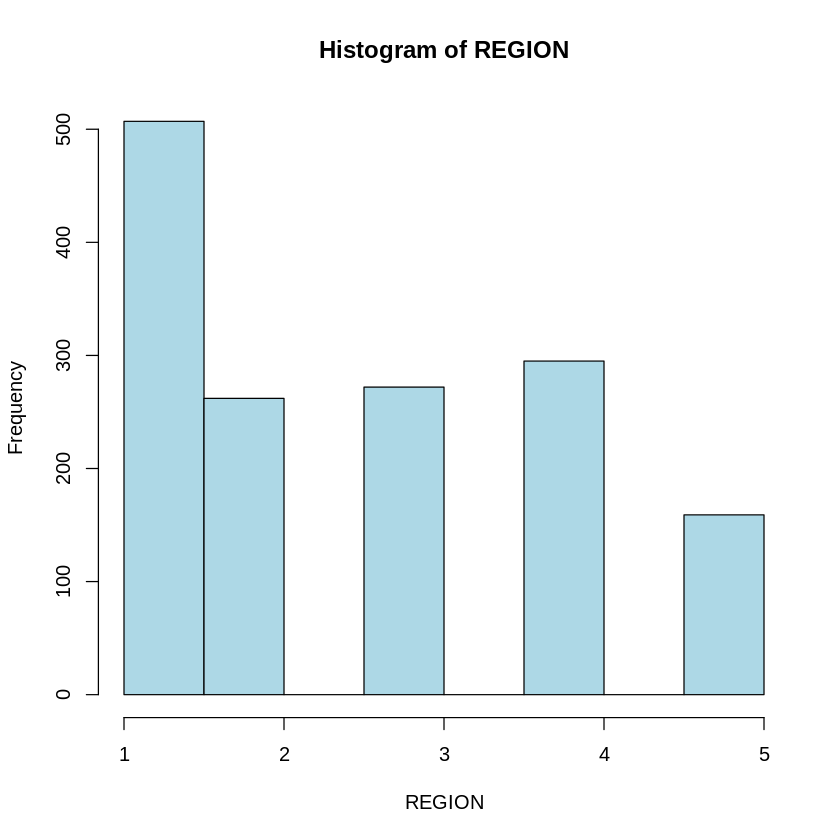


Descriptive Statistics for RETIRED 
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   1975    1988    1999    1999    2010    2020 
Standard Deviation: 12.63749 

Frequency Table:

1975 1976 1977 1978 1979 1980 1981 1982 1983 1984 1985 1986 1987 1988 1989 1990 
   2    6   13   18   32   26   35   24   39   38   36   52   26   32   34   50 
1991 1992 1993 1994 1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 
  30   43   26   45   42   32   22   36   29   38   21   27   37   31   41   33 
2007 2008 2009 2010 2011 2012 2013 2014 2015 2016 2017 2018 2019 2020 
  31   35   27   43   18   39   16   17   50   52   54   74   41    2 

Percentage Table:

     1975      1976      1977      1978      1979      1980      1981      1982 
0.1337793 0.4013378 0.8695652 1.2040134 2.1404682 1.7391304 2.3411371 1.6053512 
     1983      1984      1985      1986      1987      1988      1989      1990 
2.6086957 2.5418060 2.4080268 3.4782609 1.7391304 2.1404682 2.2742475 3.3444816 
     1

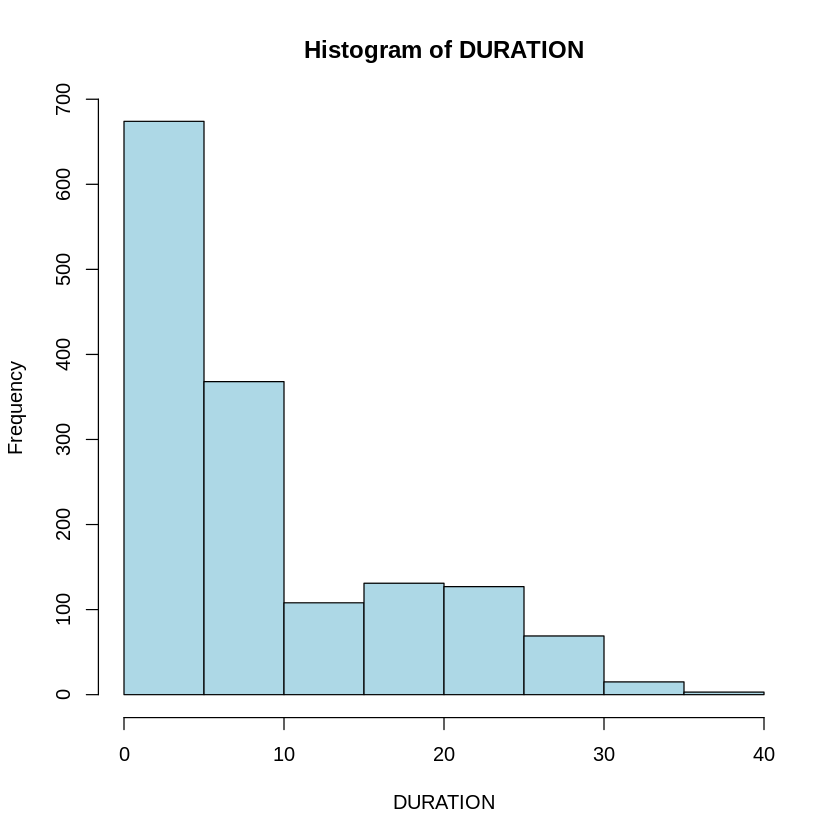


Descriptive Statistics for EMPLOYED 
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   0.000   1.000   0.596   1.000   1.000 
Standard Deviation: 0.4908643 

Frequency Table:

  0   1 
604 891 

Percentage Table:

       0        1 
40.40134 59.59866 


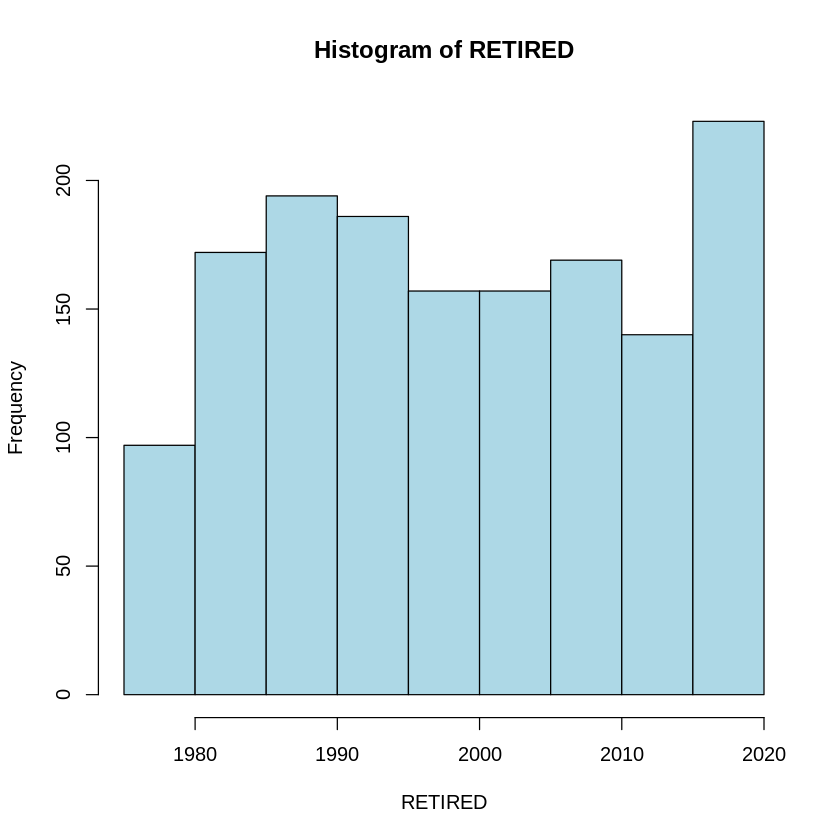


Descriptive Statistics for OCCUPATION 
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   1.00    1.00    5.00    4.95    9.00   10.00 
Standard Deviation: 3.664771 

Frequency Table:

  1   2   3   4   5   6   7   8   9  10 
545  68  59  60 111  70  41   6 358 177 

Percentage Table:

         1          2          3          4          5          6          7 
36.4548495  4.5484950  3.9464883  4.0133779  7.4247492  4.6822742  2.7424749 
         8          9         10 
 0.4013378 23.9464883 11.8394649 


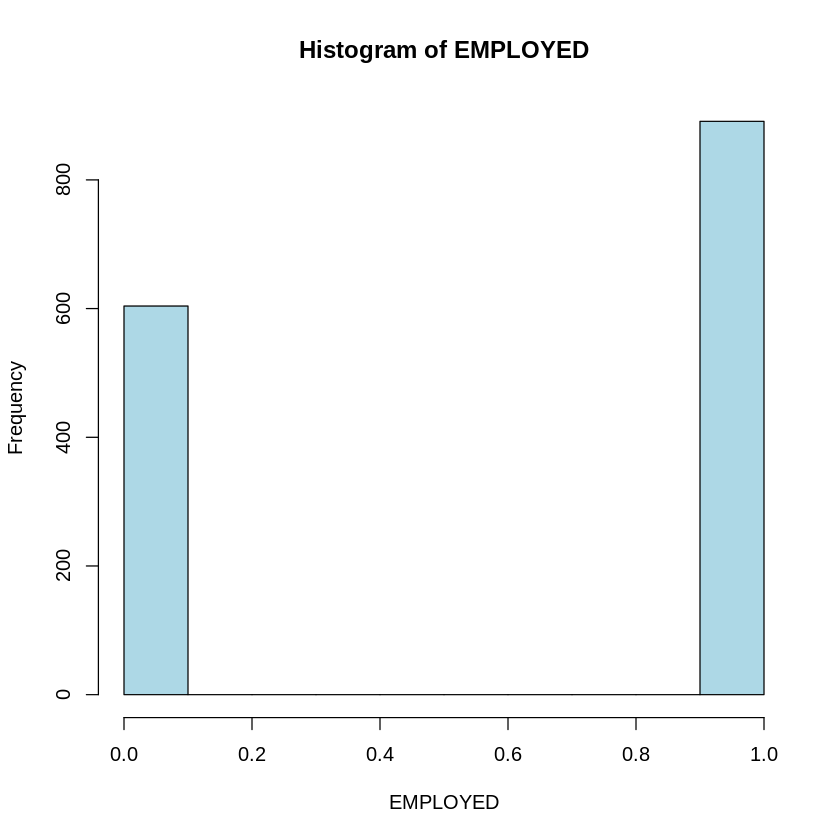


Descriptive Statistics for INCOME 
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
      0   33000   60000   81972  100000 1500000 
Standard Deviation: 112487.8 

Frequency Table:

      0    1000    1200    1330    1400    1900    2000    2200    2500    3000 
     29      19       4       1       1       2       4       1       1       4 
   4000    5000    5300    6000    6500    7000    7200    7300    7367    8000 
      6      10       1       4       1       2       1       1       1       1 
   8110    9000    9420    9500    9999   10000   10200   11000   12000   12230 
      1       2       1       1       1      12       1       2      19       1 
  12400   12500   13000   13400   13752   14000   14500   14784   15000   15500 
      1       1       4       1       1       9       1       1      14       1 
  15999   16000   17000   18000   18420   19000   19090   19999   20000   21000 
      1       6       3       5       1       3       1       2      19       3 
  21532

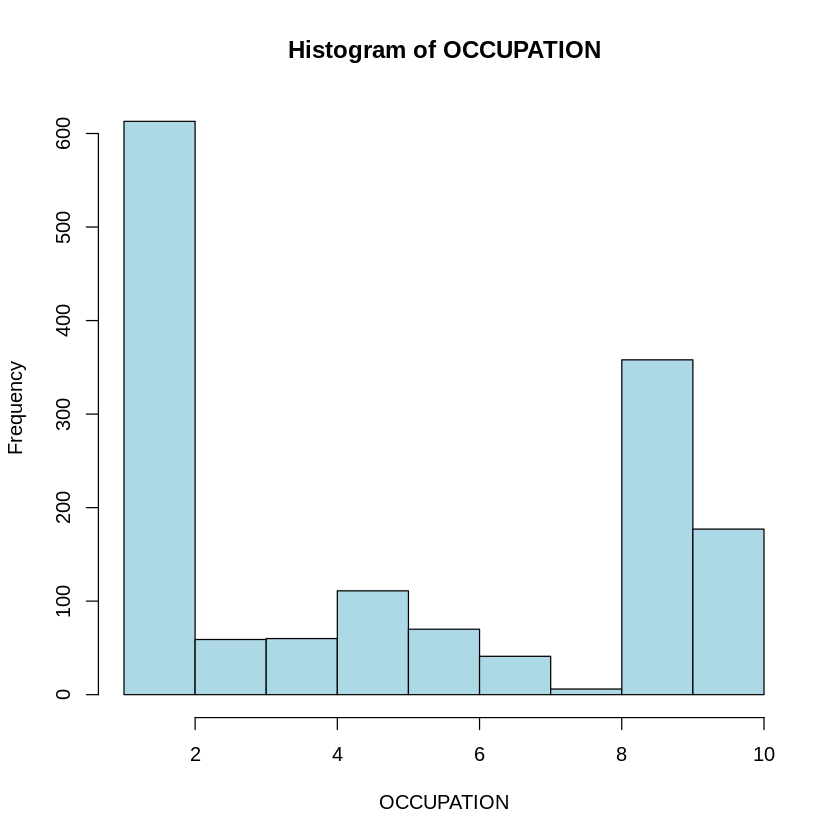

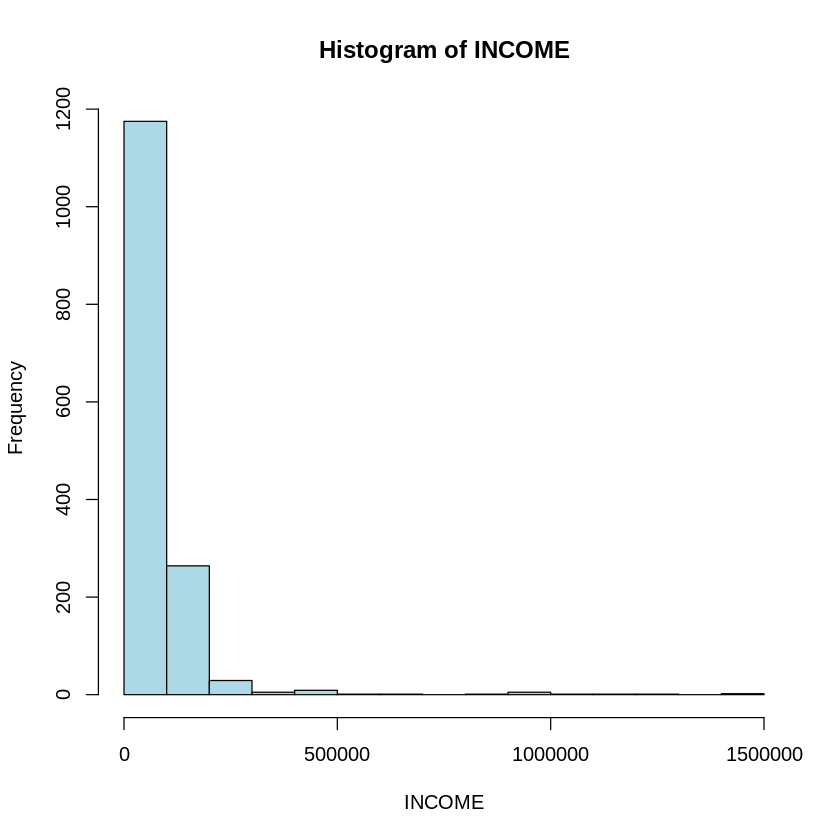

In [ ]:
# prompt: Make a descriptive statistics table for the following variables  BRANCH, GENDER, RACE, AGE, MARITAL, REGION, DURATION, RETIRED, EMPLOYED, OCCUPATION, INCOME. Include frequency table with percent.  Also include the SD.  Display the appropriate graph for each variable

# Assuming MilitaryDF is your data frame
variables <- c("BRANCH", "GENDER", "RACE", "AGE", "MARITAL", "REGION", "DURATION", "RETIRED", "EMPLOYED", "OCCUPATION", "INCOME")

# Loop through each variable
for (var in variables) {
  # Descriptive statistics
  cat("\nDescriptive Statistics for", var, "\n")
  print(summary(MilitaryDF[[var]]))
  cat("Standard Deviation:", sd(MilitaryDF[[var]], na.rm = TRUE), "\n")

  # Frequency table with percentages
  freq_table <- table(MilitaryDF[[var]])
  percent_table <- prop.table(freq_table) * 100
  cat("\nFrequency Table:\n")
  print(freq_table)
  cat("\nPercentage Table:\n")
  print(percent_table)

  # Appropriate graph
  if (is.numeric(MilitaryDF[[var]])) {
    # Histogram for numeric variables
    hist(MilitaryDF[[var]], main = paste("Histogram of", var), xlab = var, col = "lightblue")
  } else {
    # Bar plot for categorical variables
    barplot(freq_table, main = paste("Barplot of", var), xlab = var, ylab = "Frequency", col = "lightgreen")
  }
}

In [ ]:
# prompt: create new variable named RETIRED_LENGTH from the calculation of (2020 - RETIRED)

MilitaryDF <- MilitaryDF %>%
  mutate(RETIRED_LENGTH = 2020 - RETIRED)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   0.00   10.00   21.00   20.83   32.00   45.00 

[1] 12.63749

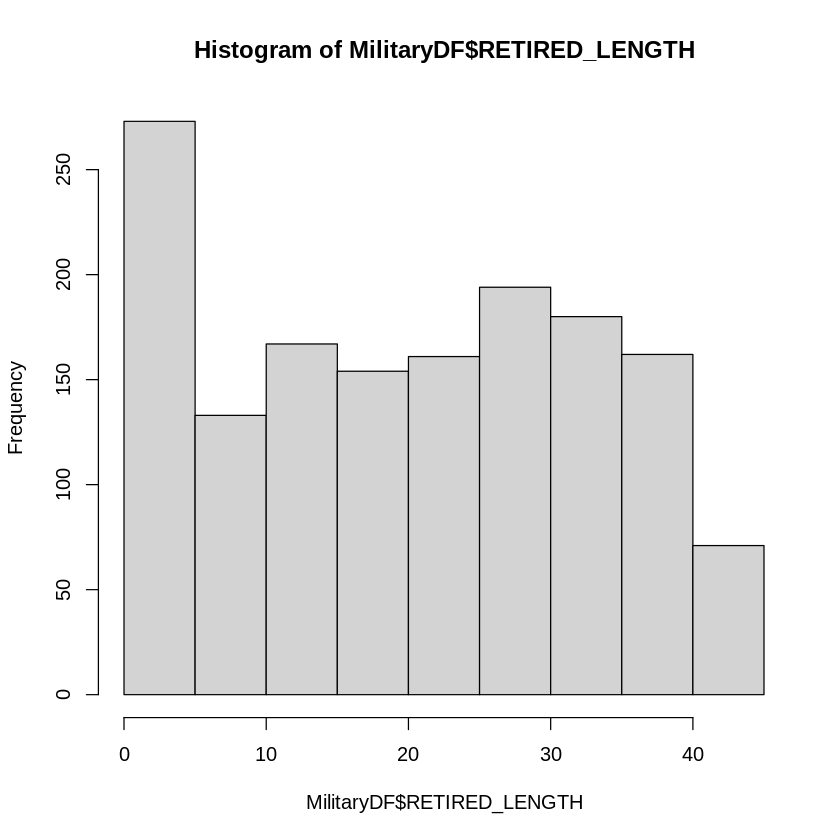

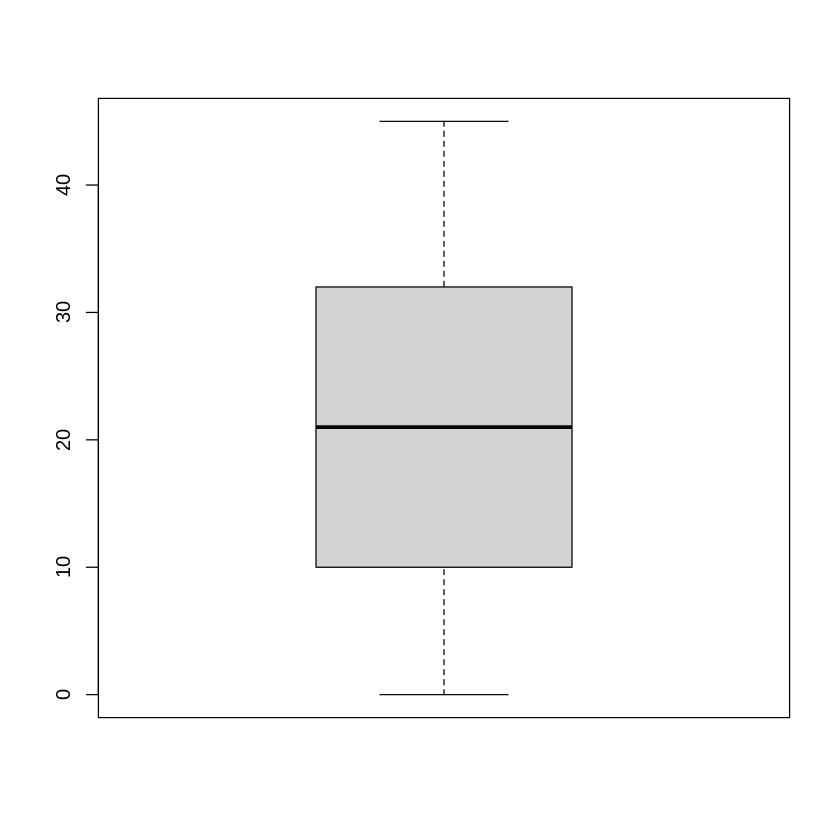

In [ ]:
# prompt: Descriptive statistics for RETIRED_LENGTH

summary(MilitaryDF$RETIRED_LENGTH)
sd(MilitaryDF$RETIRED_LENGTH, na.rm = TRUE)
hist(MilitaryDF$RETIRED_LENGTH)
boxplot(MilitaryDF$RETIRED_LENGTH)

 [1]  350000  256000 1000000  500000  326000  250000  700000  500000  250000
[10]  500000  260000  250000  250000  350000  495000  240000  500000 1000000
[19]  270000 1000000 1500000 1001257  360000  250000  218000 1000000  250000
[28]  202000  225000  227000  205000  260000  449000  245000  575000  295500
[37] 1500000 1000000  202000  500000  250000  286000  220000  840000 1200000
[46]  245000  250000 1259985  220000  450000  265000  500000  300000  225000
[55]  280000  350000


No Studentized residuals with Bonferroni p < 0.05
Largest |rstudent|:
    rstudent unadjusted p-value Bonferroni p
598 3.401912         0.00068751           NA

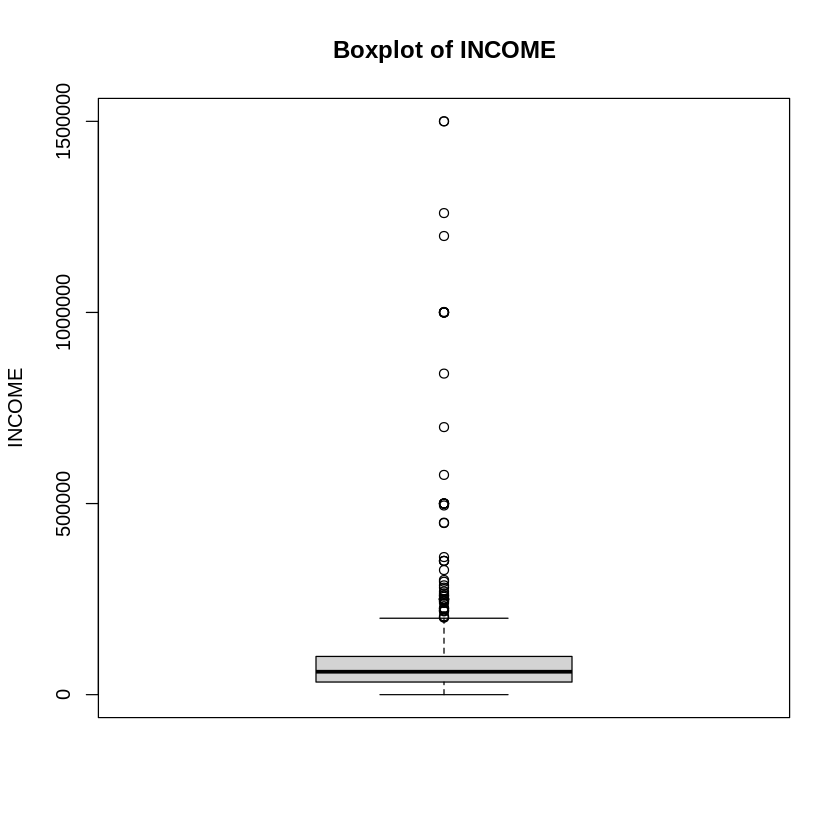

In [ ]:
# prompt: Identify any outliers for the variable INCOME

# Identify outliers in INCOME using boxplot
boxplot(MilitaryDF$INCOME, main = "Boxplot of INCOME", ylab = "INCOME")

# Identify outliers using IQR method
Q1 <- quantile(MilitaryDF$INCOME, 0.25, na.rm = TRUE)
Q3 <- quantile(MilitaryDF$INCOME, 0.75, na.rm = TRUE)
IQR <- Q3 - Q1
lower_bound <- Q1 - 1.5 * IQR
upper_bound <- Q3 + 1.5 * IQR

outliers <- MilitaryDF$INCOME[MilitaryDF$INCOME < lower_bound | MilitaryDF$INCOME > upper_bound]
print(outliers) # Print the outlier values

#Alternative outlier detection method (using the car package)
if(!require(car)){install.packages("car")}
library(car)

outlierTest(model6) #model6 is your full model



 [1] "Outliers (IQR method): 350000"  "Outliers (IQR method): 256000" 
 [3] "Outliers (IQR method): 1000000" "Outliers (IQR method): 500000" 
 [5] "Outliers (IQR method): 326000"  "Outliers (IQR method): 250000" 
 [7] "Outliers (IQR method): 700000"  "Outliers (IQR method): 500000" 
 [9] "Outliers (IQR method): 250000"  "Outliers (IQR method): 500000" 
[11] "Outliers (IQR method): 260000"  "Outliers (IQR method): 250000" 
[13] "Outliers (IQR method): 250000"  "Outliers (IQR method): 350000" 
[15] "Outliers (IQR method): 495000"  "Outliers (IQR method): 240000" 
[17] "Outliers (IQR method): 500000"  "Outliers (IQR method): 1000000"
[19] "Outliers (IQR method): 270000"  "Outliers (IQR method): 1000000"
[21] "Outliers (IQR method): 1500000" "Outliers (IQR method): 1001257"
[23] "Outliers (IQR method): 360000"  "Outliers (IQR method): 250000" 
[25] "Outliers (IQR method): 218000"  "Outliers (IQR method): 1000000"
[27] "Outliers (IQR method): 250000"  "Outliers (IQR method): 202000" 
[29] "

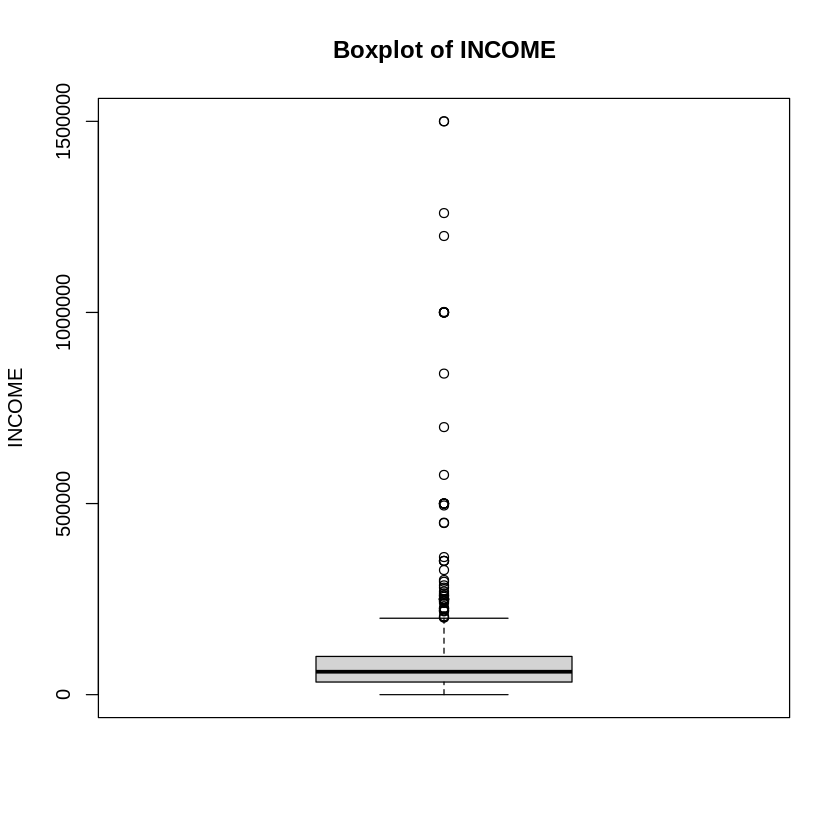

In [ ]:
# prompt: Identify any outliers for the variable INCOME include bonferroni

# Install and load necessary packages
if(!require(car)){install.packages("car")}
library(car)

# Assuming 'MilitaryDF' is your data frame and 'INCOME' is the column of interest.
# Replace 'MilitaryDF' and 'INCOME' with your actual names if they are different.


# Identify outliers using boxplot method.
boxplot(MilitaryDF$INCOME, main = "Boxplot of INCOME", ylab = "INCOME")

# Identify outliers using IQR method
Q1 <- quantile(MilitaryDF$INCOME, 0.25, na.rm = TRUE)
Q3 <- quantile(MilitaryDF$INCOME, 0.75, na.rm = TRUE)
IQR <- Q3 - Q1
lower_bound <- Q1 - 1.5 * IQR
upper_bound <- Q3 + 1.5 * IQR

outliers_iqr <- MilitaryDF$INCOME[MilitaryDF$INCOME < lower_bound | MilitaryDF$INCOME > upper_bound]

# Bonferroni correction for multiple comparisons (if needed).
# The Bonferroni correction is usually used to adjust p-values in multiple comparisons.
# Since we are just identifying outliers visually and using the IQR method here,
# a Bonferroni correction isn't directly applicable to this part of the code.

# Print or further analyze identified outliers
print(paste("Outliers (IQR method):", outliers_iqr))

In [ ]:
# prompt: How many outliers were identified for the variable INCOME

# Identify outliers using IQR method
Q1 <- quantile(MilitaryDF$INCOME, 0.25, na.rm = TRUE)
Q3 <- quantile(MilitaryDF$INCOME, 0.75, na.rm = TRUE)
IQR <- Q3 - Q1
lower_bound <- Q1 - 1.5 * IQR
upper_bound <- Q3 + 1.5 * IQR

outliers <- MilitaryDF$INCOME[MilitaryDF$INCOME < lower_bound | MilitaryDF$INCOME > upper_bound]
print(outliers) # Print the outlier values

# Count the number of outliers
n_outliers <- length(outliers)
cat("Number of outliers in INCOME:", n_outliers, "\n")

 [1]  350000  256000 1000000  500000  326000  250000  700000  500000  250000
[10]  500000  260000  250000  250000  350000  495000  240000  500000 1000000
[19]  270000 1000000 1500000 1001257  360000  250000  218000 1000000  250000
[28]  202000  225000  227000  205000  260000  449000  245000  575000  295500
[37] 1500000 1000000  202000  500000  250000  286000  220000  840000 1200000
[46]  245000  250000 1259985  220000  450000  265000  500000  300000  225000
[55]  280000  350000
Number of outliers in INCOME: 56 


In [ ]:
# prompt: Rerun the descriptive statistics for INCOME with and without the outliers

# Descriptive statistics for INCOME with outliers
summary(MilitaryDF$INCOME)
sd(MilitaryDF$INCOME, na.rm = TRUE)

# Remove outliers from INCOME
MilitaryDF_no_outliers <- MilitaryDF %>%
  filter(INCOME >= lower_bound & INCOME <= upper_bound)


# Descriptive statistics for INCOME without outliers
summary(MilitaryDF_no_outliers$INCOME)
sd(MilitaryDF_no_outliers$INCOME, na.rm = TRUE)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
      0   33000   60000   81972  100000 1500000 

[1] 112487.8

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
      0   32000   59000   66501   93500  200000 

[1] 45655.46

In [ ]:
# Install necessary packages (if not already installed)
if(!require(dplyr)){install.packages("dplyr")}

# Function to calculate descriptive statistics
descriptive_stats <- function(data, var) {
  # Calculate sample size
  n <- sum(!is.na(data[[var]]))

  # Calculate percentage for categorical variables (BRANCH and RACE)
  if (is.factor(data[[var]])) {
    percentage <- prop.table(table(data[[var]])) * 100
  } else {
    percentage <- NULL  # For numeric variables (AGE)
  }

  # Calculate mean and sd for numeric variables (AGE)
  if (is.numeric(data[[var]])) {
    mean_val <- mean(data[[var]], na.rm = TRUE)
    sd_val <- sd(data[[var]], na.rm = TRUE)
  } else {
    mean_val <- NULL  # For categorical variables (BRANCH and RACE)
    sd_val <- NULL    # For categorical variables (BRANCH and RACE)
  }

  # Return results as a list
  return(list(
    variable = var,
    sample_size = n,
    percentage = percentage,
    mean = mean_val,
    sd = sd_val
  ))
}

# Apply the function to the desired variables
variables <- c("AGE", "BRANCH", "RACE")
results <- lapply(variables, function(var) descriptive_stats(MilitaryDF, var))

# Print the results
for (result in results) {
  print(paste("Descriptive Statistics for", result$variable))
  print(paste("Sample Size:", result$sample_size))

  if (!is.null(result$percentage)) {
    print("Percentage:")
    print(result$percentage)
  }

  if (!is.null(result$mean)) {
    print(paste("Mean:", result$mean))
    print(paste("Standard Deviation:", result$sd))
  }

  cat("\n")  # Add a newline for better readability
}

[1] "Descriptive Statistics for AGE"
[1] "Sample Size: 1495"
[1] "Mean: 50.0461538461538"
[1] "Standard Deviation: 13.4095665910966"

[1] "Descriptive Statistics for BRANCH"
[1] "Sample Size: 1495"
[1] "Mean: 3.72842809364548"
[1] "Standard Deviation: 2.20376667418089"

[1] "Descriptive Statistics for RACE"
[1] "Sample Size: 1495"
[1] "Mean: 1.41137123745819"
[1] "Standard Deviation: 0.874297074305236"



In [ ]:
# Install necessary packages (if not already installed)
if(!require(plyr)){install.packages("plyr")}
if(!require(dplyr)){install.packages("dplyr")}


# Assuming your data is in a data frame called 'MilitaryDF'
# Select the desired columns
stress_vars <- c("STRESS_1", "STRESS_1A", "STRESS_2", "STRESS_2A",
                 "STRESS_3", "STRESS_3A", "STRESS_4", "STRESS_4A",
                 "STRESS_5", "STRESS_5A", "STRESS_6", "STRESS_6A",
                 "STRESS_7", "STRESS_7A")
stress_data <- MilitaryDF[, stress_vars]

# Create frequency table for each variable
freq_tables <- lapply(stress_data, table)

# Combine tables into a single data frame
freq_df <- ldply(freq_tables, data.frame)

# Rename columns
colnames(freq_df) <- c("Variable", "Response", "Frequency")

# Print the table
print(freq_df)

Loading required package: plyr

------------------------------------------------------------------------------

You have loaded plyr after dplyr - this is likely to cause problems.
If you need functions from both plyr and dplyr, please load plyr first, then dplyr:
library(plyr); library(dplyr)

------------------------------------------------------------------------------


Attaching package: ‘plyr’


The following objects are masked from ‘package:dplyr’:

    arrange, count, desc, failwith, id, mutate, rename, summarise,
    summarize


The following object is masked from ‘package:ggpubr’:

    mutate




    Variable Response Frequency
1   STRESS_1        0      1193
2   STRESS_1        1       302
3  STRESS_1A        1        71
4  STRESS_1A        2        85
5  STRESS_1A        3        94
6  STRESS_1A        4        52
7   STRESS_2        0       986
8   STRESS_2        1       509
9  STRESS_2A        1       143
10 STRESS_2A        2       201
11 STRESS_2A        3       117
12 STRESS_2A        4        48
13  STRESS_3        0      1217
14  STRESS_3        1       278
15 STRESS_3A        1        34
16 STRESS_3A        2       102
17 STRESS_3A        3        87
18 STRESS_3A        4        55
19  STRESS_4        0      1080
20  STRESS_4        1       415
21 STRESS_4A        1        96
22 STRESS_4A        2       130
23 STRESS_4A        3       121
24 STRESS_4A        4        68
25  STRESS_5        0      1121
26  STRESS_5        1       374
27 STRESS_5A        1        55
28 STRESS_5A        2       130
29 STRESS_5A        3       114
30 STRESS_5A        4        75
31  STRE

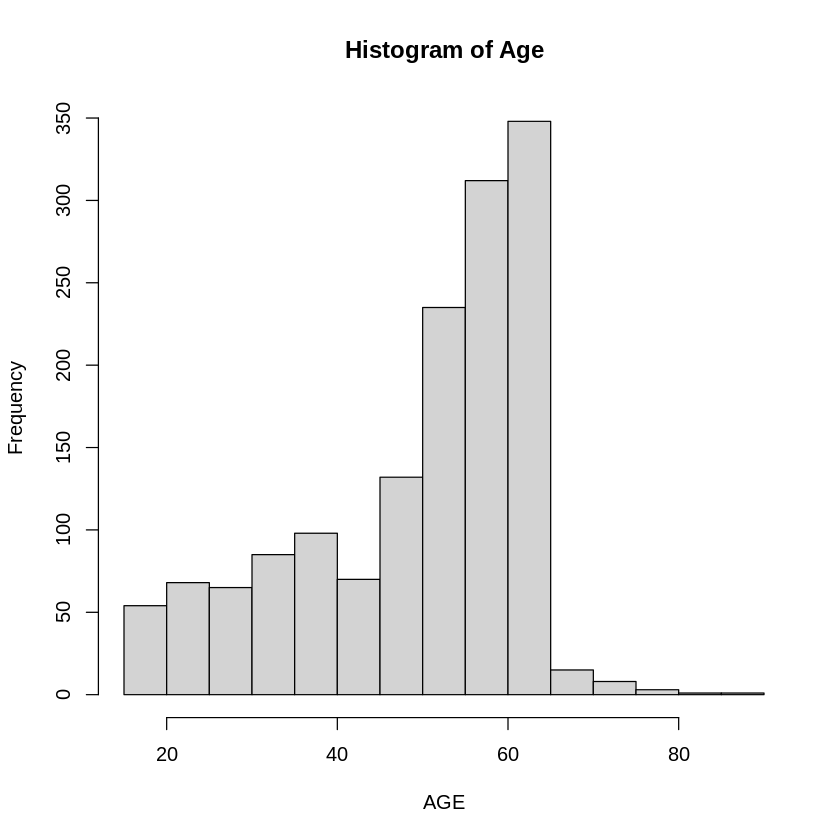

In [ ]:
 hist(MilitaryDF$AGE, main = "Histogram of Age", xlab = "AGE", ylab = "Frequency")

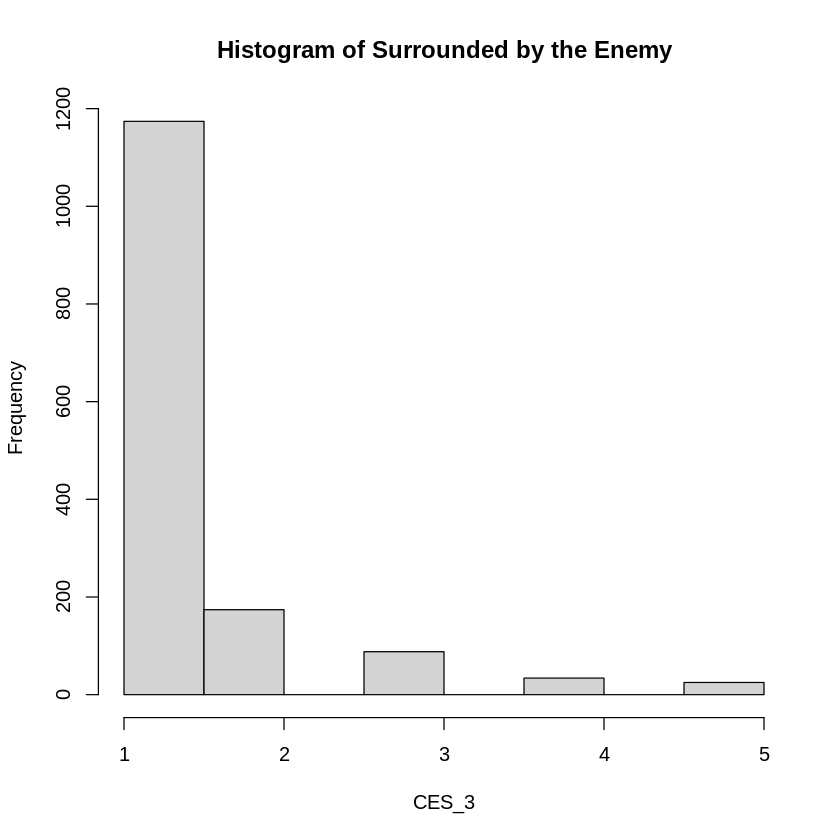

In [ ]:
hist(MilitaryDF$CES_3, main = "Histogram of Surrounded by the Enemy", xlab = "CES_3", ylab = "Frequency")

In [ ]:
summary(MilitaryDF$CAGEAID_TOTAL)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0000  0.0000  0.8555  2.0000  4.0000 

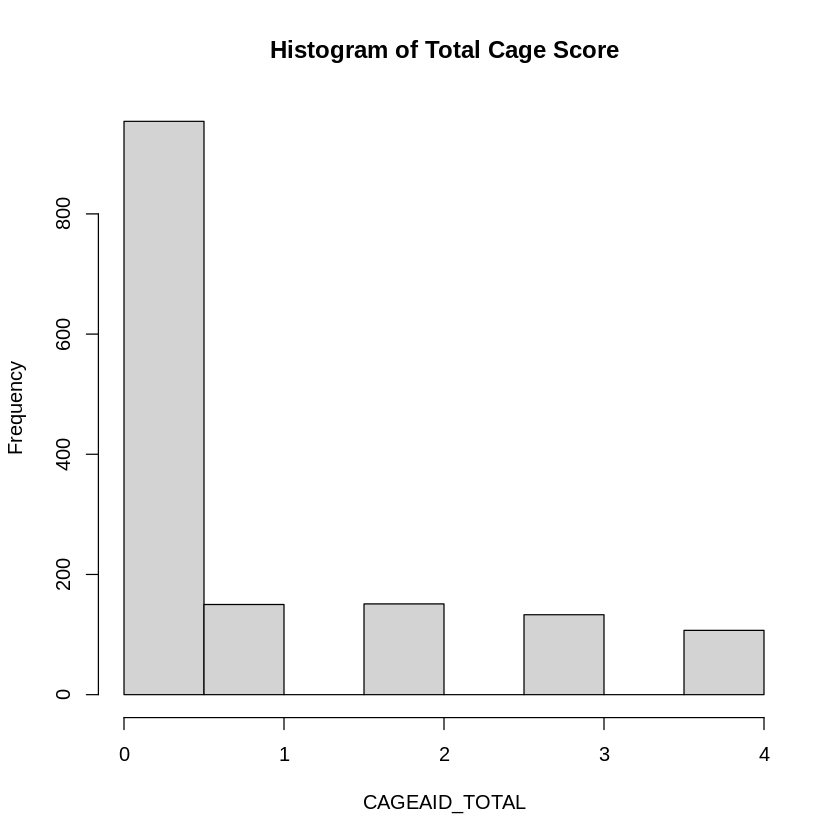

In [ ]:
hist(MilitaryDF$CAGEAID_TOTAL, main = "Histogram of Total Cage Score", xlab = "CAGEAID_TOTAL", ylab = "Frequency")

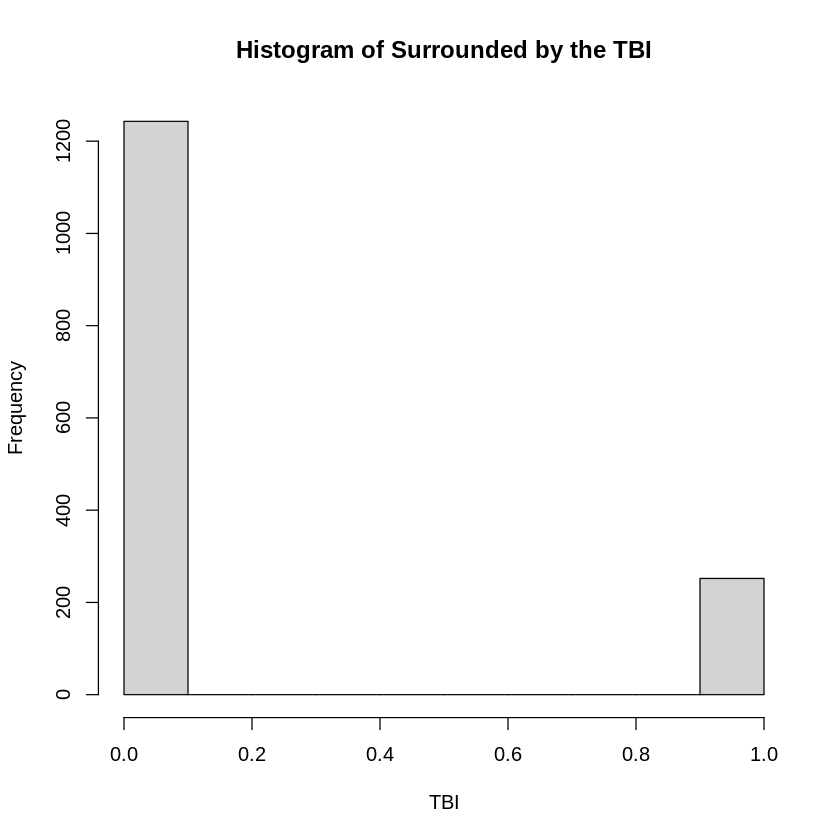

In [ ]:
hist(MilitaryDF$TBI, main = "Histogram of Surrounded by the TBI", xlab = "TBI", ylab = "Frequency")

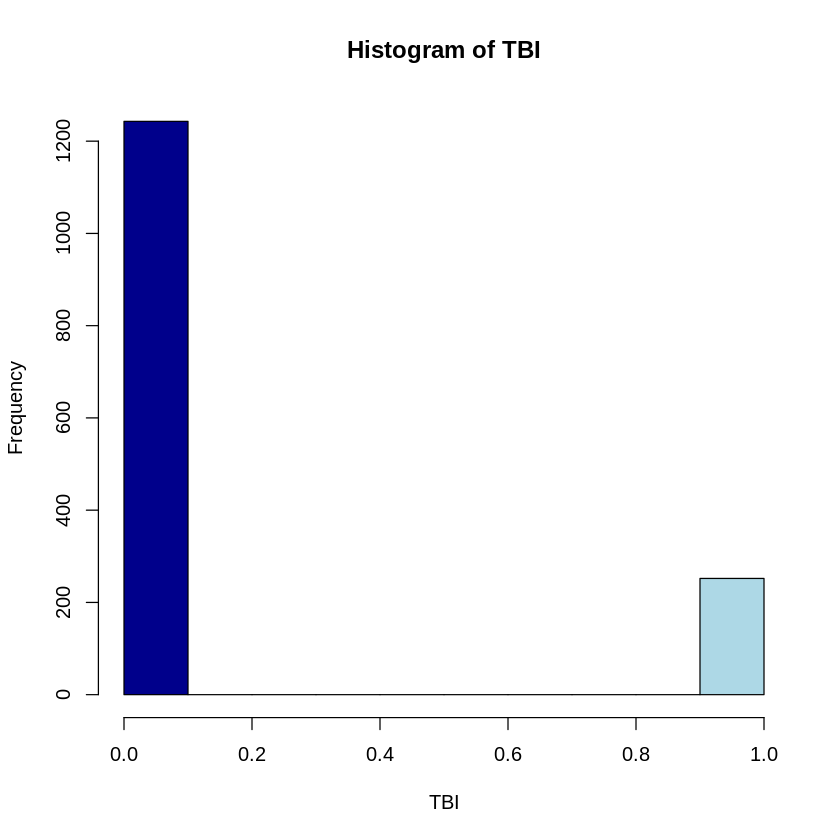

In [ ]:
hist(MilitaryDF$TBI, main = "Histogram of TBI", xlab = "TBI", ylab = "Frequency", col = c("darkblue", "lightblue"))

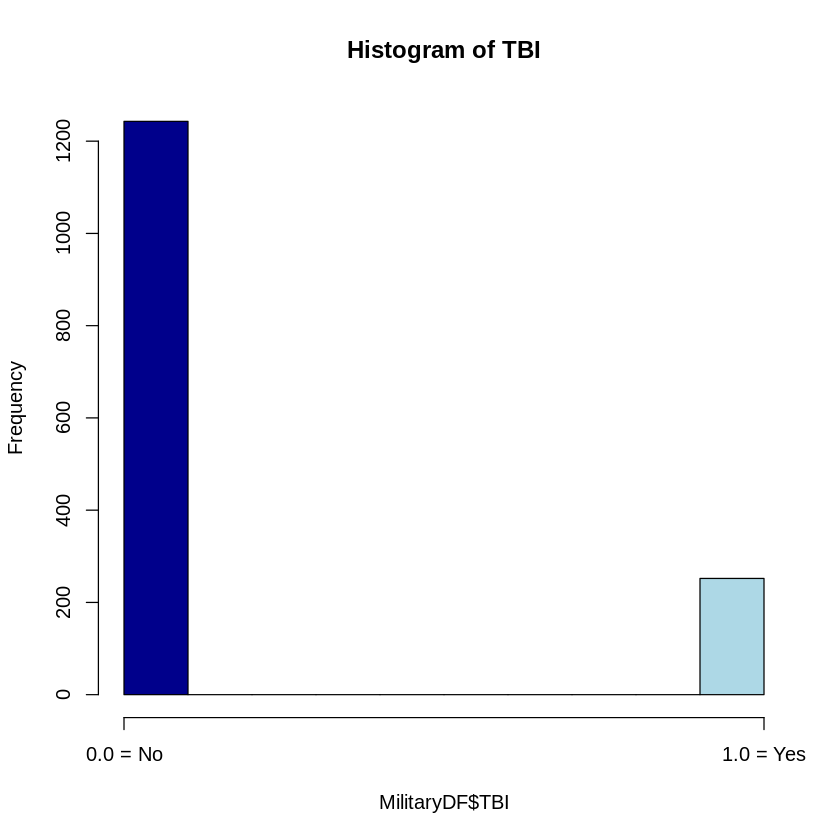

In [ ]:
hist(MilitaryDF$TBI,
     main = "Histogram of TBI",
     ylab = "Frequency",
     xaxt = "n", # Remove the default x-axis
     col = c("darkblue", "lightblue"))

# Add custom x-axis labels
axis(1, at = c(0, 1), labels = c("0.0 = No", "1.0 = Yes"))

In [ ]:
summary(MilitaryDF$TBI)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0000  0.0000  0.1686  0.0000  1.0000 

In [ ]:
# Create a contingency table
contingency_table <- table(MilitaryDF$TBI, MilitaryDF$CAGEAID_TOTAL)

# Print the table
print(contingency_table)


   
      0   1   2   3   4
  0 824 124 119 102  74
  1 130  26  32  31  33


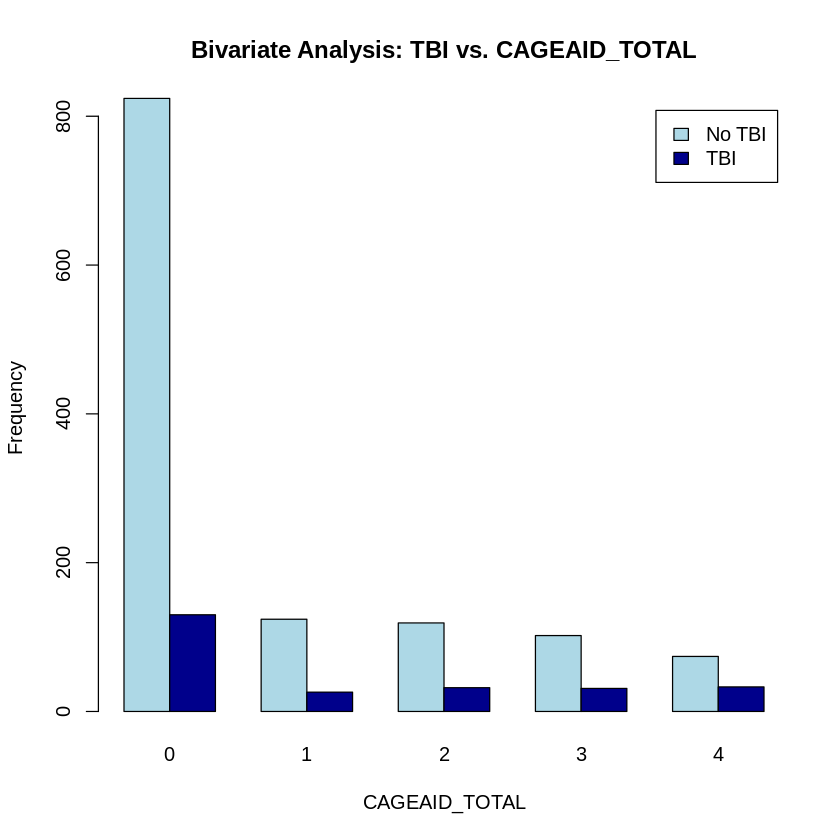

In [ ]:
# Create a contingency table
contingency_table <- table(MilitaryDF$TBI, MilitaryDF$CAGEAID_TOTAL)

# Convert the contingency table to a matrix
contingency_matrix <- as.matrix(contingency_table)

# Create a grouped bar plot
barplot(contingency_matrix, beside = TRUE,
        col = c("lightblue", "darkblue"),
        legend.text = c("No TBI", "TBI"),
        xlab = "CAGEAID_TOTAL", ylab = "Frequency",
        main = "Bivariate Analysis: TBI vs. CAGEAID_TOTAL")

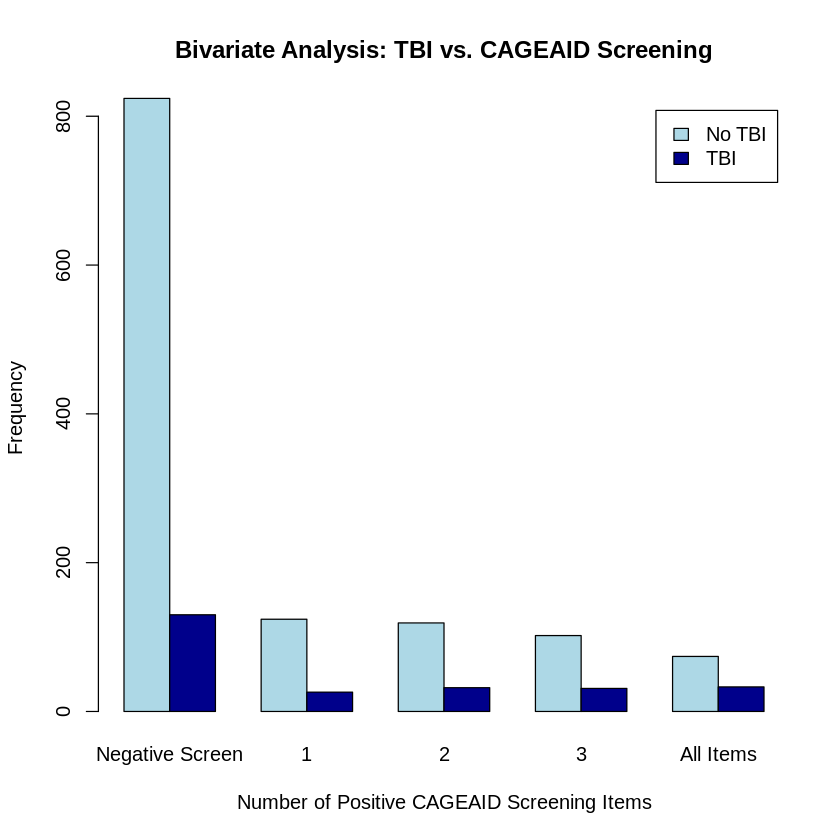

In [ ]:
# Create a contingency table
contingency_table <- table(MilitaryDF$TBI, MilitaryDF$CAGEAID_TOTAL)

# Convert the contingency table to a matrix
contingency_matrix <- as.matrix(contingency_table)

# Create a grouped bar plot with custom x-axis labels
barplot(contingency_matrix, beside = TRUE,
        col = c("lightblue", "darkblue"),
        legend.text = c("No TBI", "TBI"),
        xlab = "Number of Positive CAGEAID Screening Items",  # Updated x-axis label
        ylab = "Frequency",
        main = "Bivariate Analysis: TBI vs. CAGEAID Screening", # Updated title
        names.arg = c("Negative Screen", "1", "2", "3", "All Items")) # Custom x-axis labels

In [ ]:
# Create a contingency table
contingency_table <- table(MilitaryDF$TBI, MilitaryDF$CAGEAID_TOTAL)

# Perform Chi-Square Test
chisq_test <- chisq.test(contingency_table)

# Print the results
print(chisq_test)


	Pearson's Chi-squared test

data:  contingency_table
X-squared = 28.031, df = 4, p-value = 1.229e-05



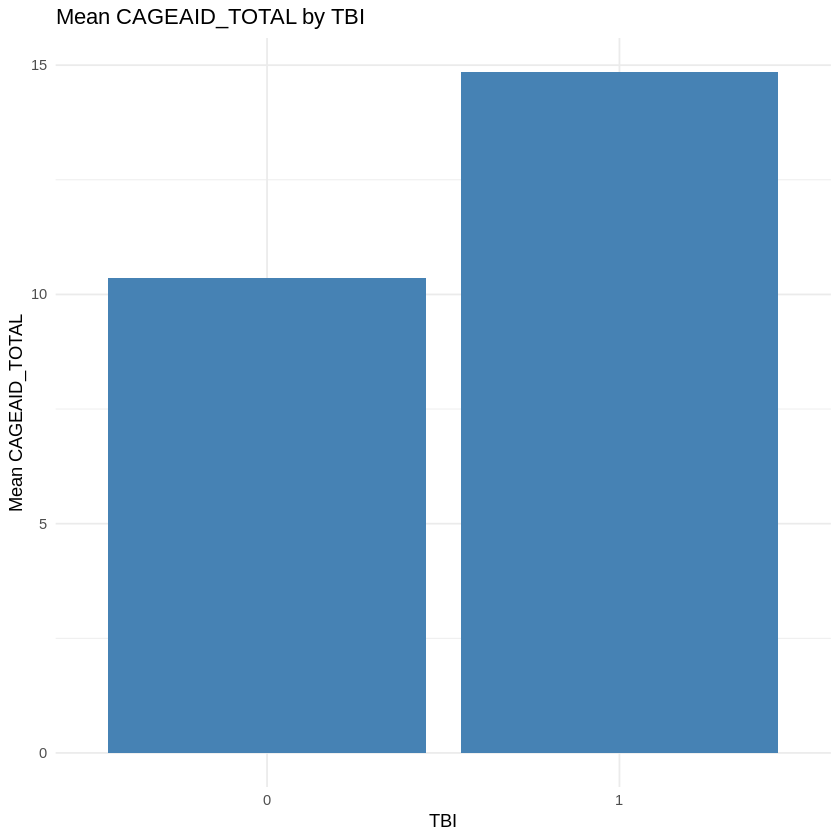

In [ ]:
# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2")}

# Create the means plot
ggplot(MilitaryDF, aes(x = factor(TBI), y = SBQ_TOTAL)) +
  geom_bar(stat = "summary", fun = "mean", position = "dodge", fill = "steelblue") +  # Calculate and plot means
  labs(title = "Mean CAGEAID_TOTAL by TBI",
       x = "TBI",
       y = "Mean CAGEAID_TOTAL") +
  theme_minimal()

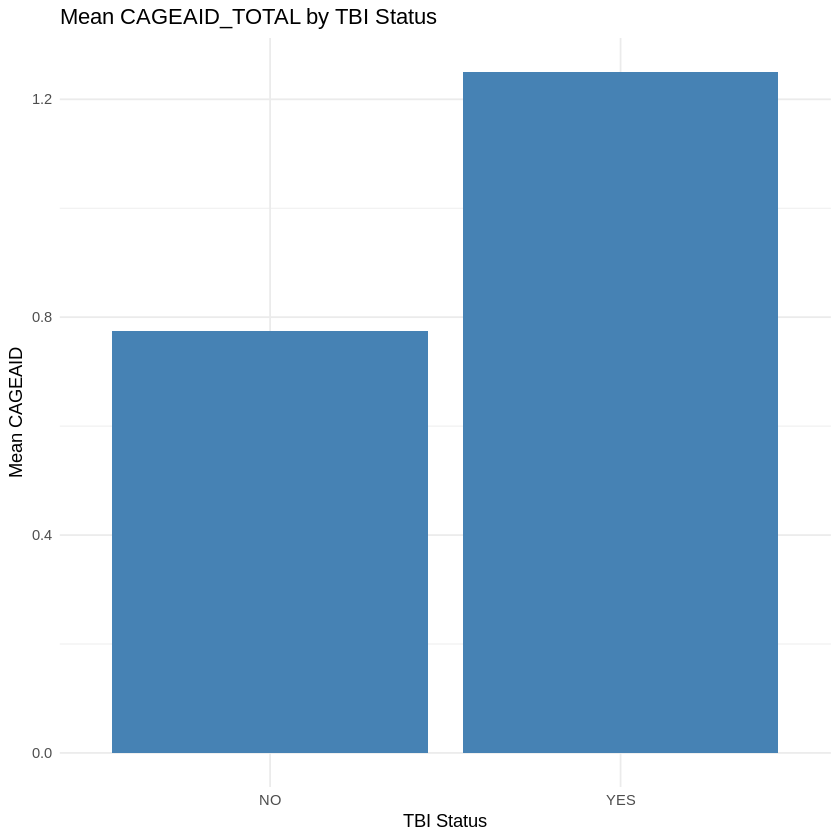

In [ ]:
# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2")}

# Create the means plot with updated labels
ggplot(MilitaryDF, aes(x = factor(TBI), y = CAGEAID_TOTAL)) +
  geom_bar(stat = "summary", fun = "mean", position = "dodge", fill = "steelblue") +
  labs(title = "Mean CAGEAID_TOTAL by TBI Status", # Updated title
       x = "TBI Status",                       # Updated x-axis label
       y = "Mean CAGEAID") +
  scale_x_discrete(labels = c("0" = "NO", "1" = "YES")) + # Custom x-axis labels
  theme_minimal()

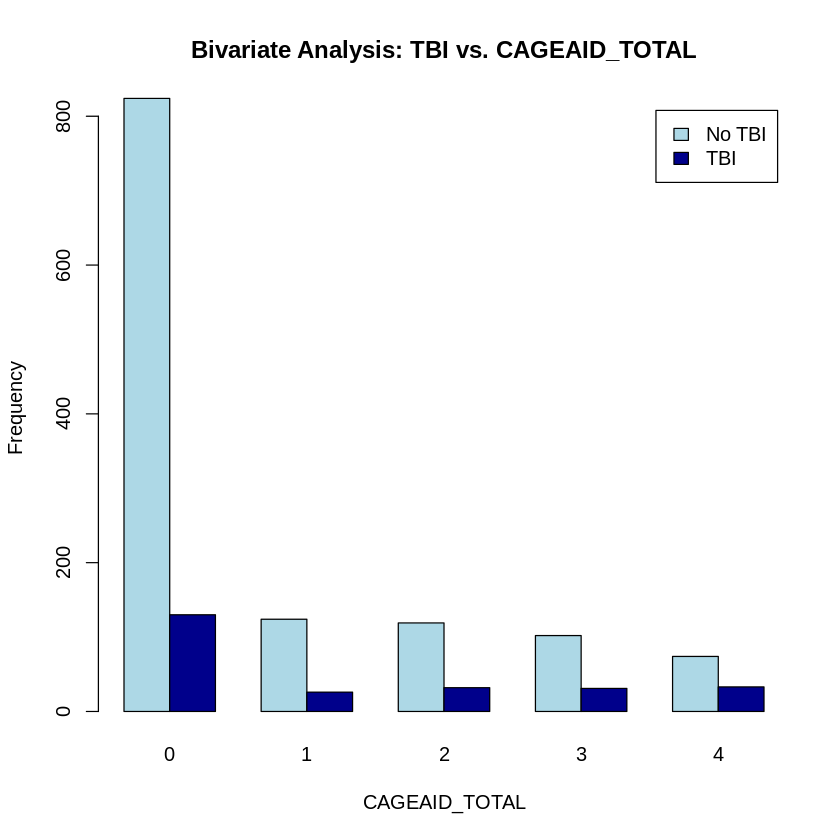

In [ ]:
# Create a grouped bar plot
barplot(contingency_table, beside = TRUE,
        col = c("lightblue", "darkblue"),
        legend.text = c("No TBI", "TBI"),
        xlab = "CAGEAID_TOTAL", ylab = "Frequency",
        main = "Bivariate Analysis: TBI vs. CAGEAID_TOTAL")

In [ ]:
# Create a contingency table
contingency_table <- table(MilitaryDF$TBI, MilitaryDF$CAGEAID_TOTAL)

# Perform Chi-Square Test
chisq_test <- chisq.test(contingency_table)

# Print the results
print(chisq_test)


	Pearson's Chi-squared test

data:  contingency_table
X-squared = 28.031, df = 4, p-value = 1.229e-05



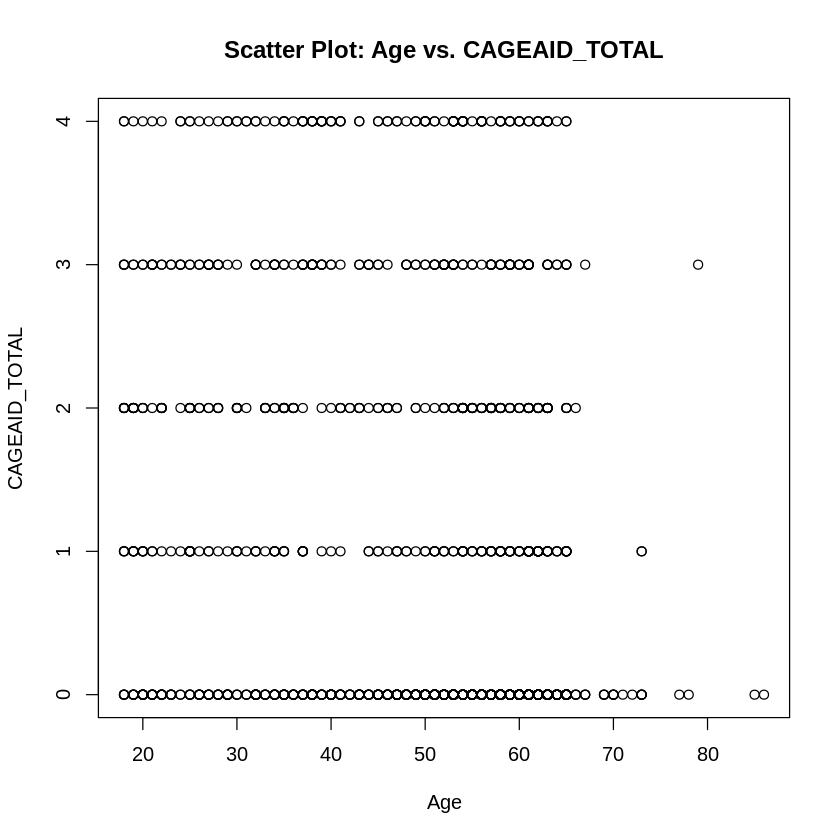

In [ ]:
plot(MilitaryDF$AGE, MilitaryDF$CAGEAID_TOTAL,
     xlab = "Age", ylab = "CAGEAID_TOTAL",
     main = "Scatter Plot: Age vs. CAGEAID_TOTAL")

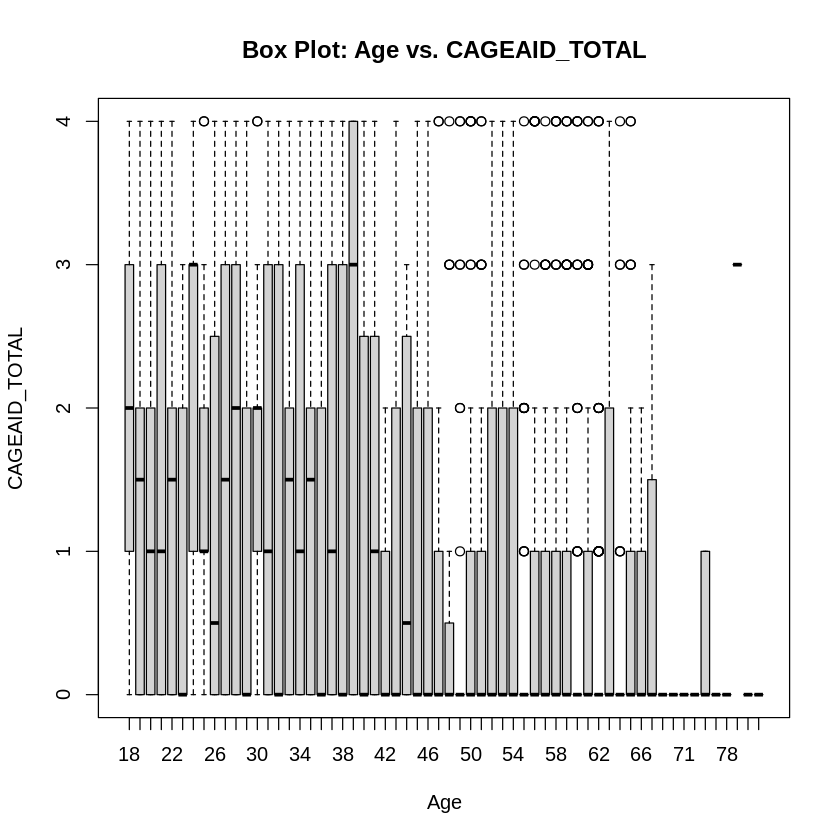

In [ ]:
boxplot(MilitaryDF$CAGEAID_TOTAL ~ MilitaryDF$AGE,
        xlab = "Age", ylab = "CAGEAID_TOTAL",
        main = "Box Plot: Age vs. CAGEAID_TOTAL")

In [ ]:
cor(MilitaryDF$AGE, MilitaryDF$CAGEAID_TOTAL)

[1] -0.2538681

In [ ]:
class(MilitaryDF)

[1] "data.frame"

In [ ]:
# Install necessary packages (if not already installed)
if(!require(plyr)){install.packages("plyr")}
if(!require(dplyr)){install.packages("dplyr")}


# Assuming your data is in a data frame called 'MilitaryDF'
# Select the desired columns
stress_vars <- c("STRESS_1", "STRESS_1A", "STRESS_2", "STRESS_2A",
                 "STRESS_3", "STRESS_3A", "STRESS_4", "STRESS_4A",
                 "STRESS_5", "STRESS_5A", "STRESS_6", "STRESS_6A",
                 "STRESS_7", "STRESS_7A")
stress_data <- MilitaryDF[, stress_vars]

# Create frequency table for each variable
freq_tables <- lapply(stress_data, table)

# Combine tables into a single data frame
freq_df <- ldply(freq_tables, data.frame)

# Rename columns
colnames(freq_df) <- c("Variable", "Response", "Frequency")

# Print the table
print(freq_df)

    Variable Response Frequency
1   STRESS_1        0      1193
2   STRESS_1        1       302
3  STRESS_1A        1        71
4  STRESS_1A        2        85
5  STRESS_1A        3        94
6  STRESS_1A        4        52
7   STRESS_2        0       986
8   STRESS_2        1       509
9  STRESS_2A        1       143
10 STRESS_2A        2       201
11 STRESS_2A        3       117
12 STRESS_2A        4        48
13  STRESS_3        0      1217
14  STRESS_3        1       278
15 STRESS_3A        1        34
16 STRESS_3A        2       102
17 STRESS_3A        3        87
18 STRESS_3A        4        55
19  STRESS_4        0      1080
20  STRESS_4        1       415
21 STRESS_4A        1        96
22 STRESS_4A        2       130
23 STRESS_4A        3       121
24 STRESS_4A        4        68
25  STRESS_5        0      1121
26  STRESS_5        1       374
27 STRESS_5A        1        55
28 STRESS_5A        2       130
29 STRESS_5A        3       114
30 STRESS_5A        4        75
31  STRE

In [ ]:
# Assuming your data is in a data frame called 'MilitaryDF'
MilitaryDF$STRESS_T <- ifelse(MilitaryDF$STRESS_1 == 1 &
                                 MilitaryDF$STRESS_2 == 1 &
                                 MilitaryDF$STRESS_3 == 1 &
                                 MilitaryDF$STRESS_4 == 1 &
                                 MilitaryDF$STRESS_5 == 1 &
                                 MilitaryDF$STRESS_6 == 1 &
                                 MilitaryDF$STRESS_7 == 1, 1, 0)

# Report frequency of STRESS_T
table(MilitaryDF$STRESS_T)


   0    1 
1477   18 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   1.000   1.000   1.722   2.000   5.000 

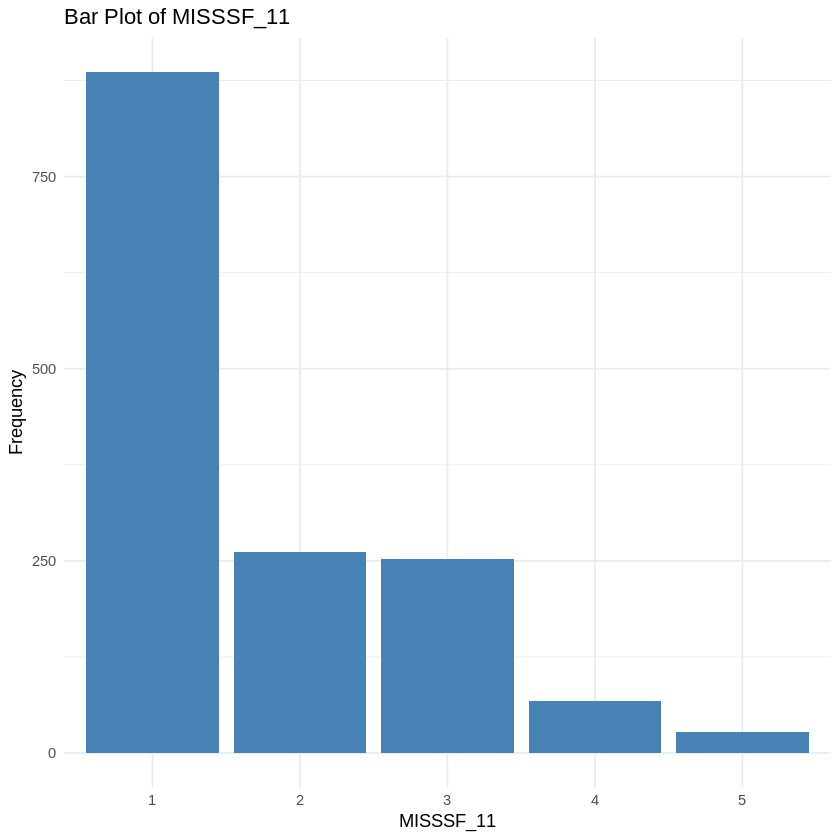

In [ ]:
# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2")}

# Descriptive Statistics
summary(MilitaryDF$MISSSF_11)

# Bar Plot using ggplot2
ggplot(MilitaryDF, aes(x = factor(MISSSF_11))) +
  geom_bar(fill = "steelblue") +
  labs(title = "Bar Plot of MISSSF_11",
       x = "MISSSF_11",
       y = "Frequency") +
  theme_minimal()

Loading required package: tidyr



[1] "Descriptive Statistics for MISSSF_1"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   3.000   6.000   5.094   8.000  10.000 
[1] "Descriptive Statistics for MISSSF_2"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   1.000   1.000   3.299   6.000  10.000 


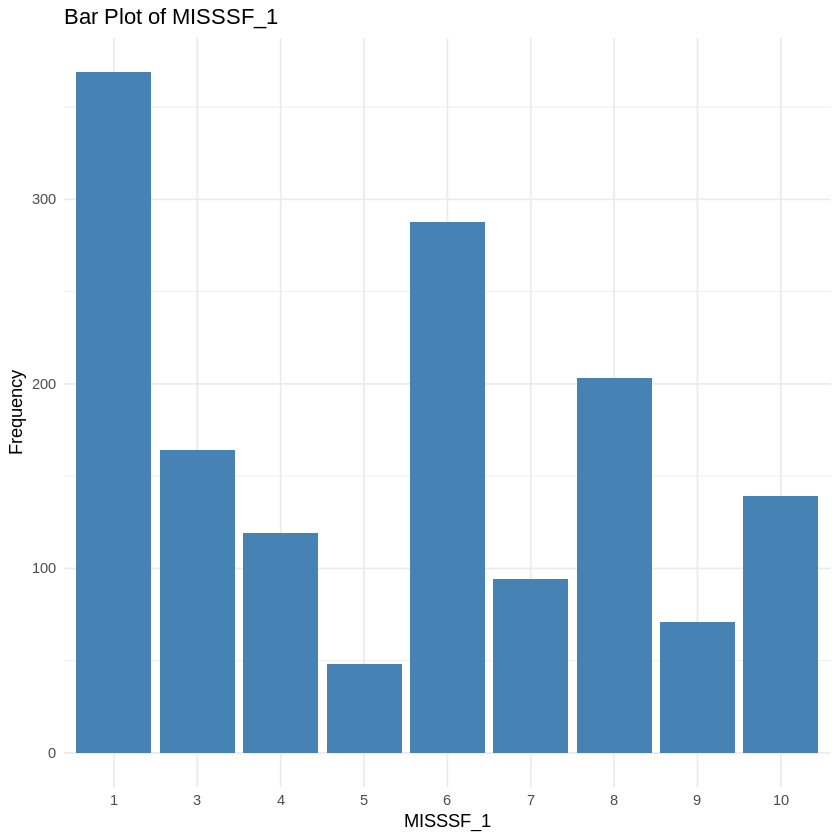

[1] "Descriptive Statistics for MISSSF_3"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   1.000   1.000   3.341   6.000  10.000 


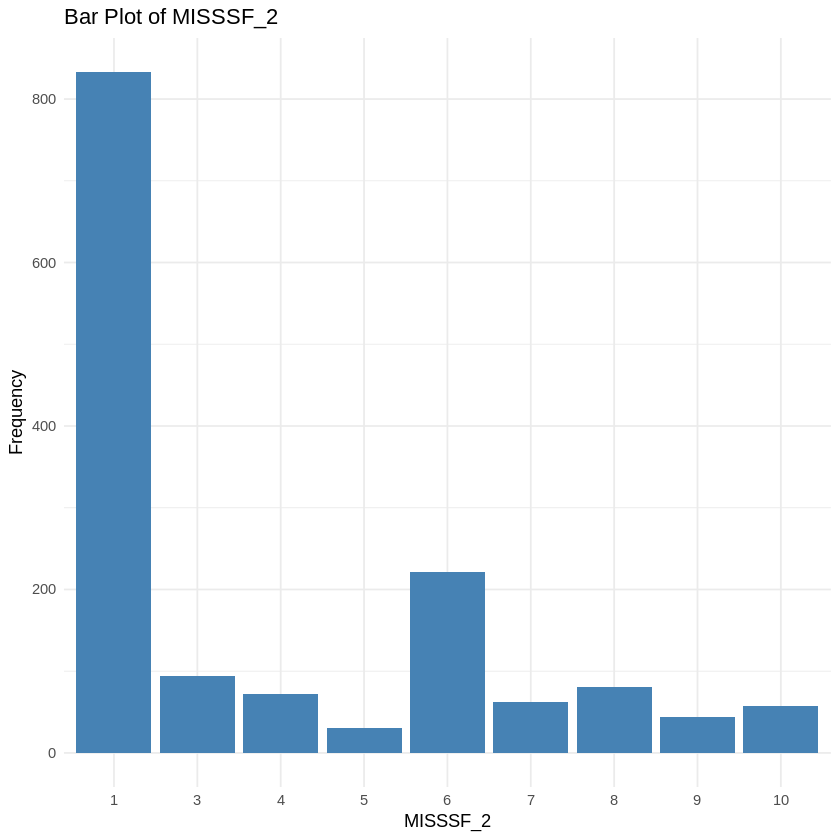

[1] "Descriptive Statistics for MISSSF_4"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   1.000   1.000   3.412   6.000  10.000 


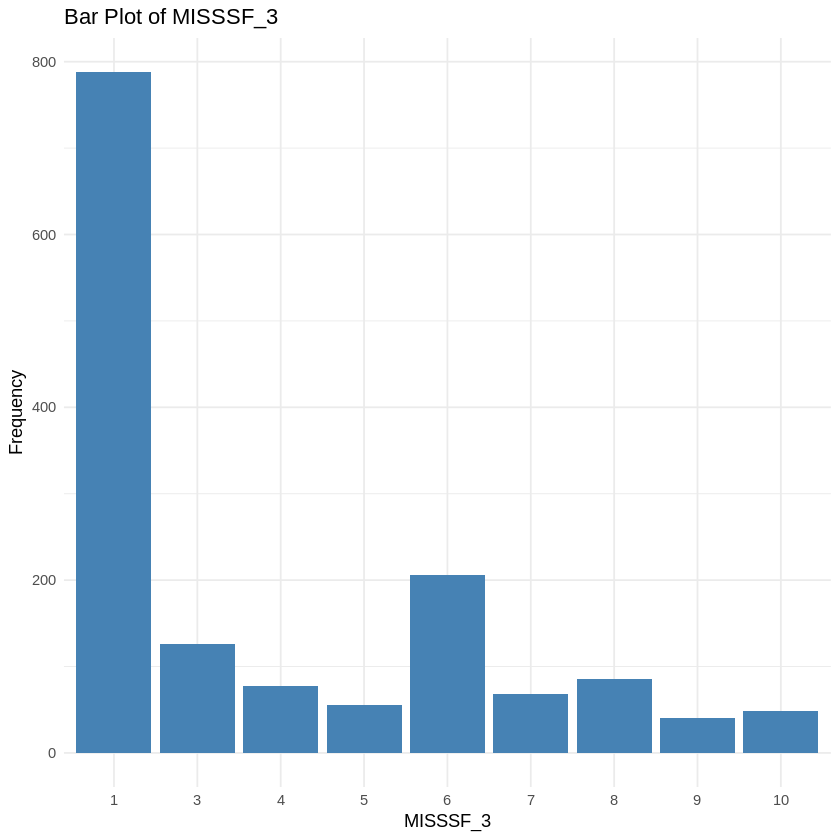

[1] "Descriptive Statistics for MISSSF_5"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   5.000   7.000   6.532   8.000  10.000 


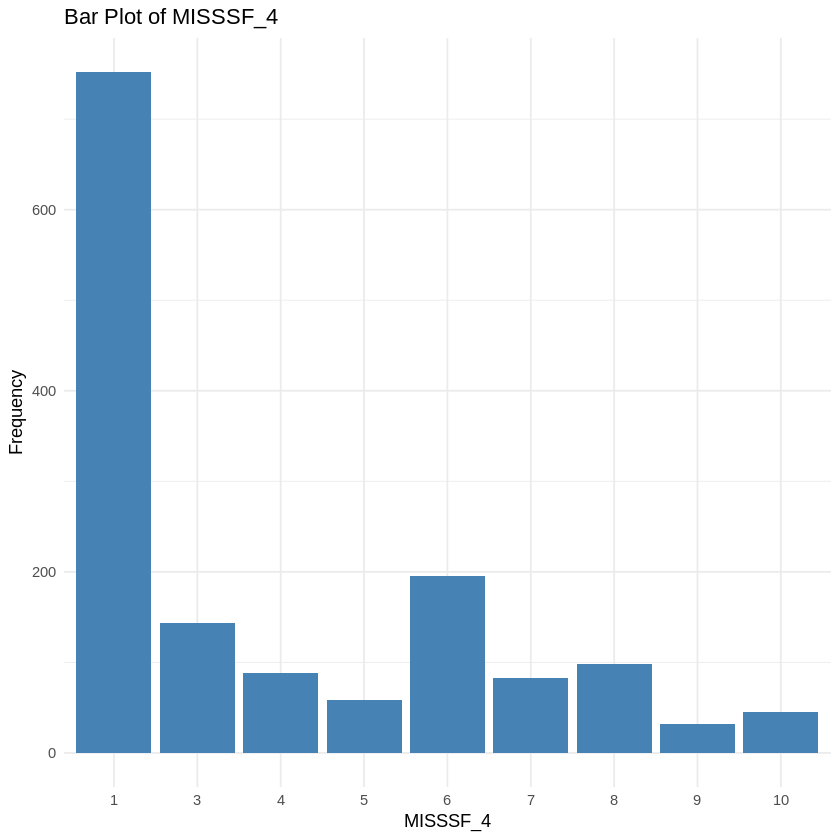

[1] "Descriptive Statistics for MISSSF_5R"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   3.000   4.000   4.468   6.000  10.000 


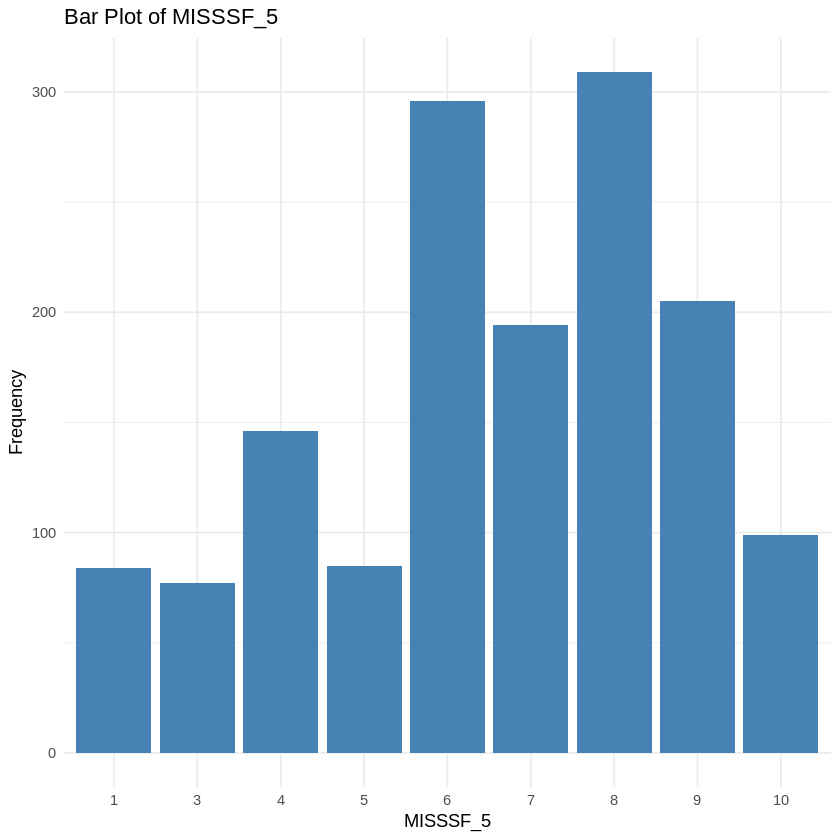

[1] "Descriptive Statistics for MISSSF_6"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   7.000   8.000   8.068   9.000  10.000 


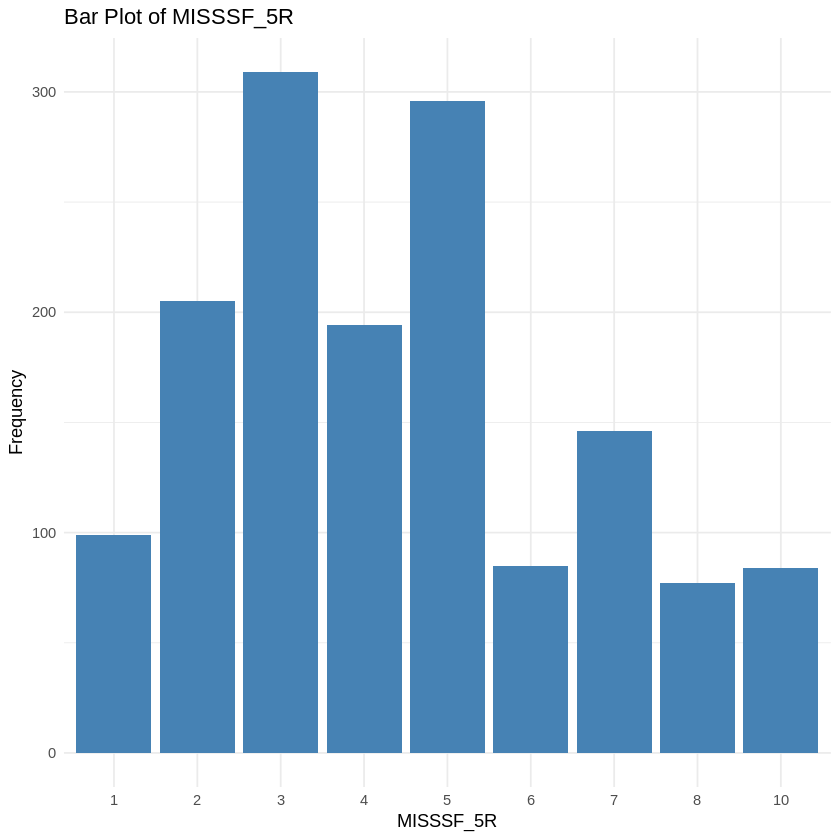

[1] "Descriptive Statistics for MISSSF_6R"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   2.000   3.000   2.932   4.000  10.000 


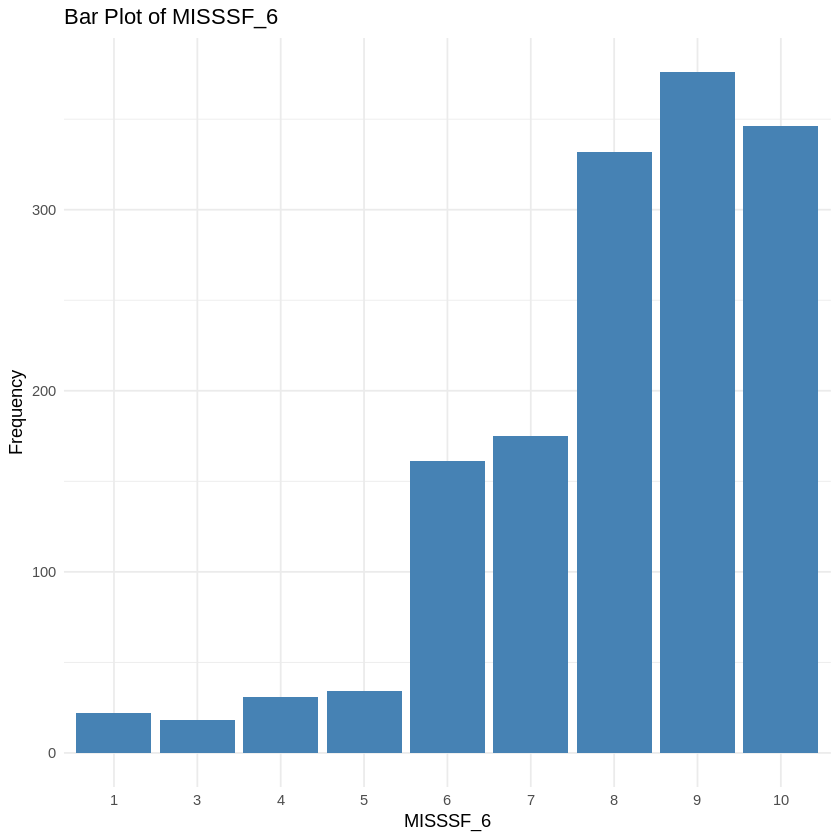

[1] "Descriptive Statistics for MISSSF_7"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   6.000   6.000   6.252   8.000  10.000 


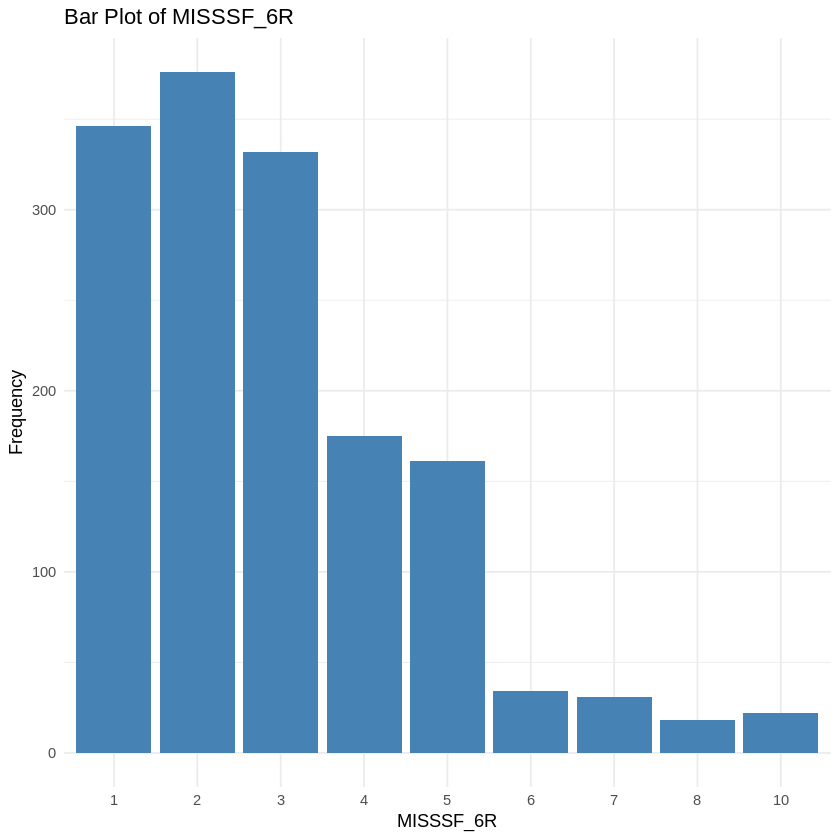

[1] "Descriptive Statistics for MISSSF_7R"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   3.000   5.000   4.748   5.000  10.000 


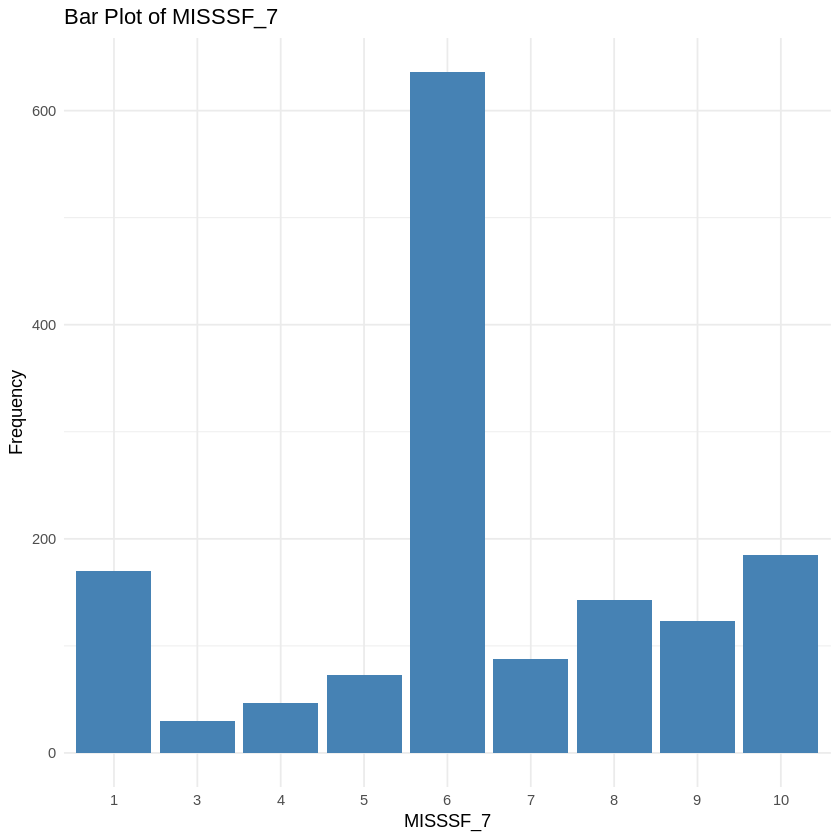

[1] "Descriptive Statistics for MISSSF_8"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   1.000   1.000   3.256   6.000  10.000 


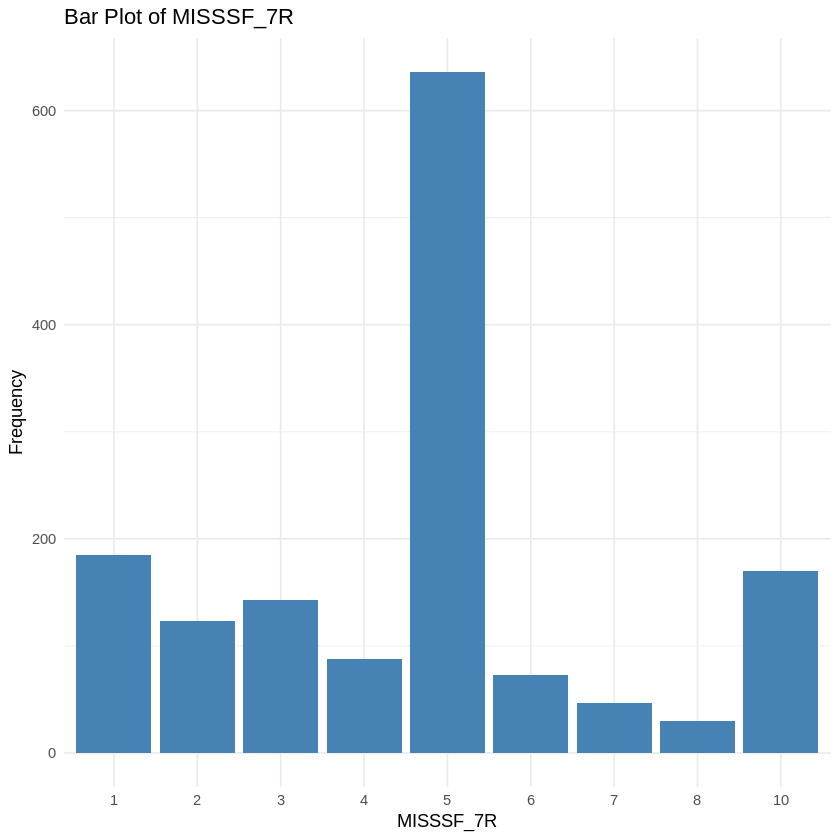

[1] "Descriptive Statistics for MISSSF_9"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   7.000  10.000   8.302  10.000  10.000 


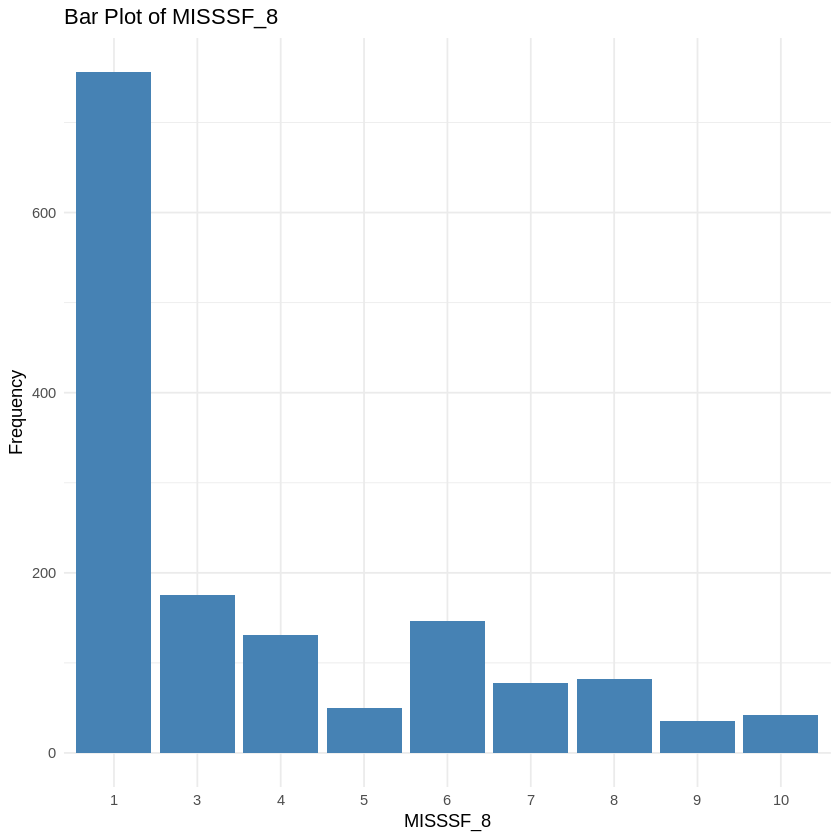

[1] "Descriptive Statistics for MISSSF_9R"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   1.000   1.000   2.698   4.000  10.000 


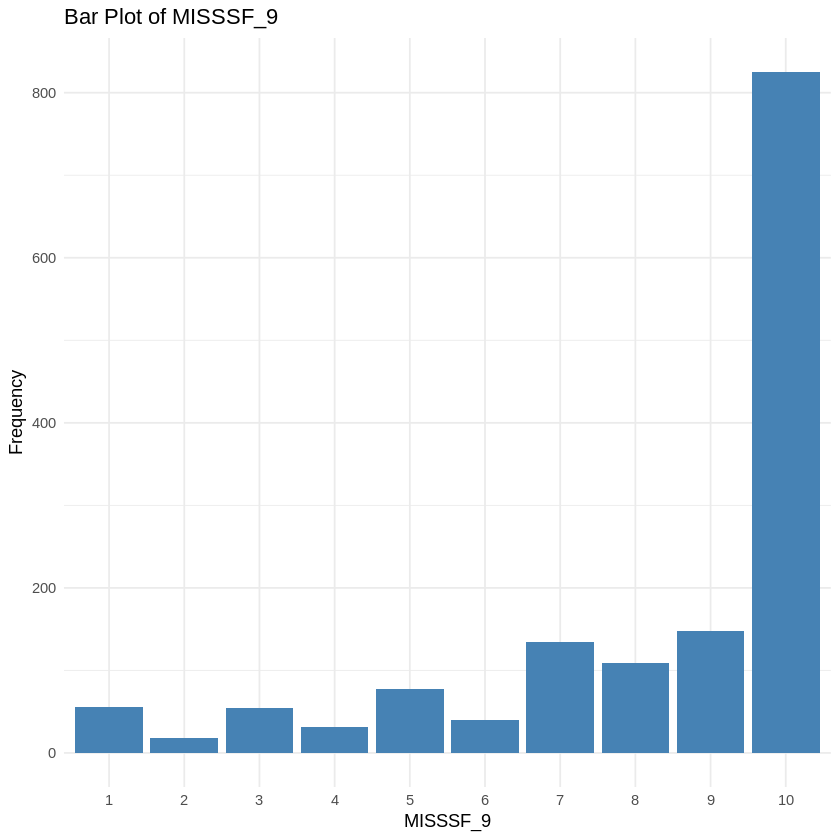

[1] "Descriptive Statistics for MISSSF_10"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   4.000   5.000   5.845   8.000  10.000 


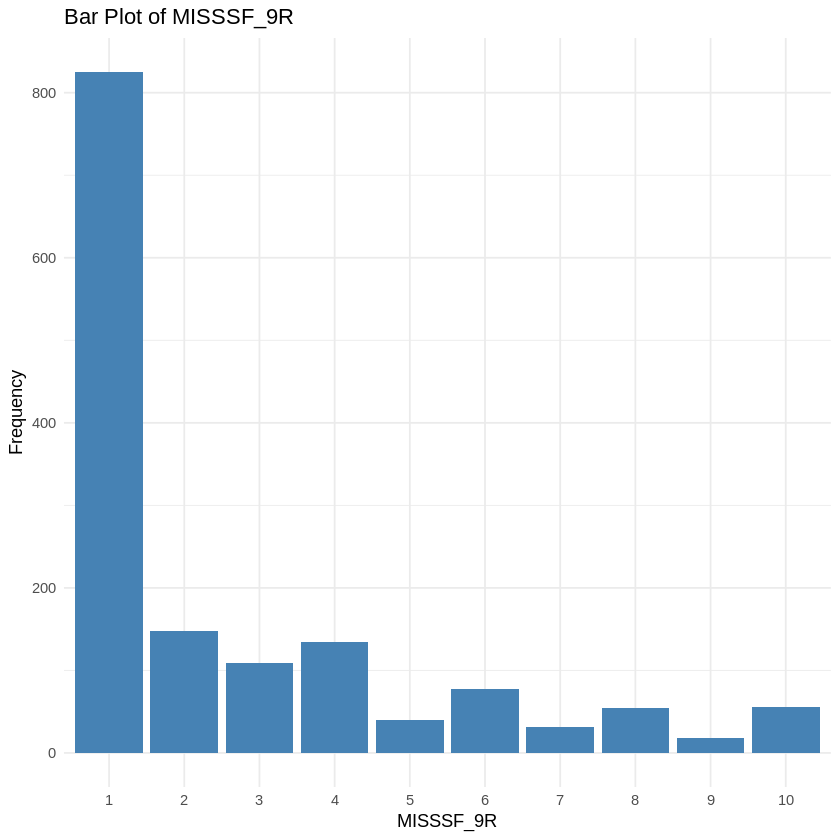

[1] "Descriptive Statistics for MISSSF_10R"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   3.000   6.000   5.155   7.000  10.000 


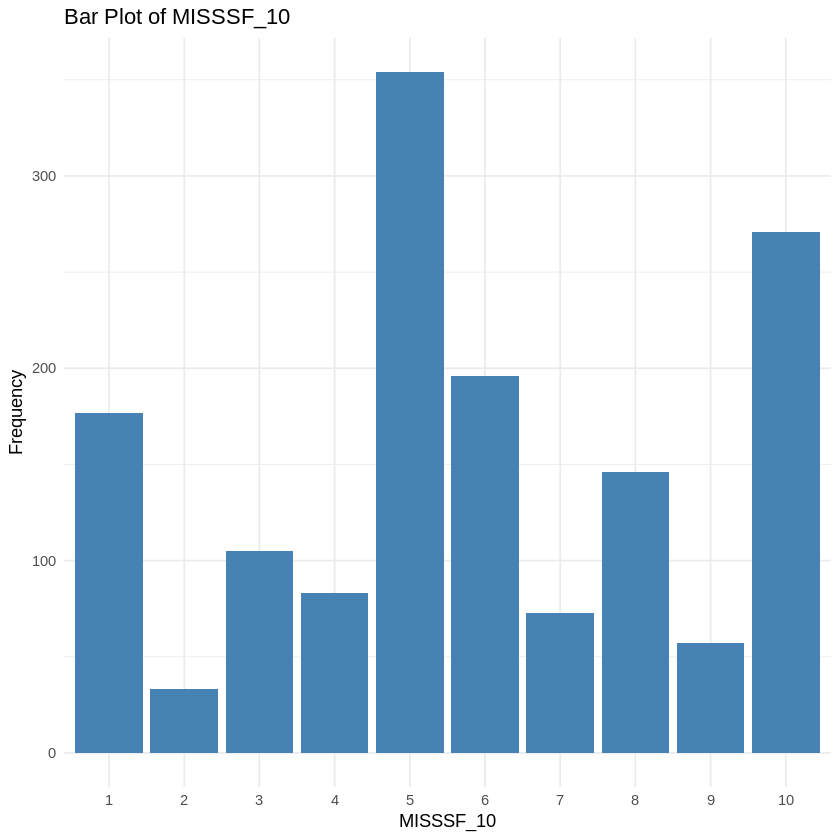

[1] "Descriptive Statistics for MISSSF_11"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   1.000   1.000   1.722   2.000   5.000 


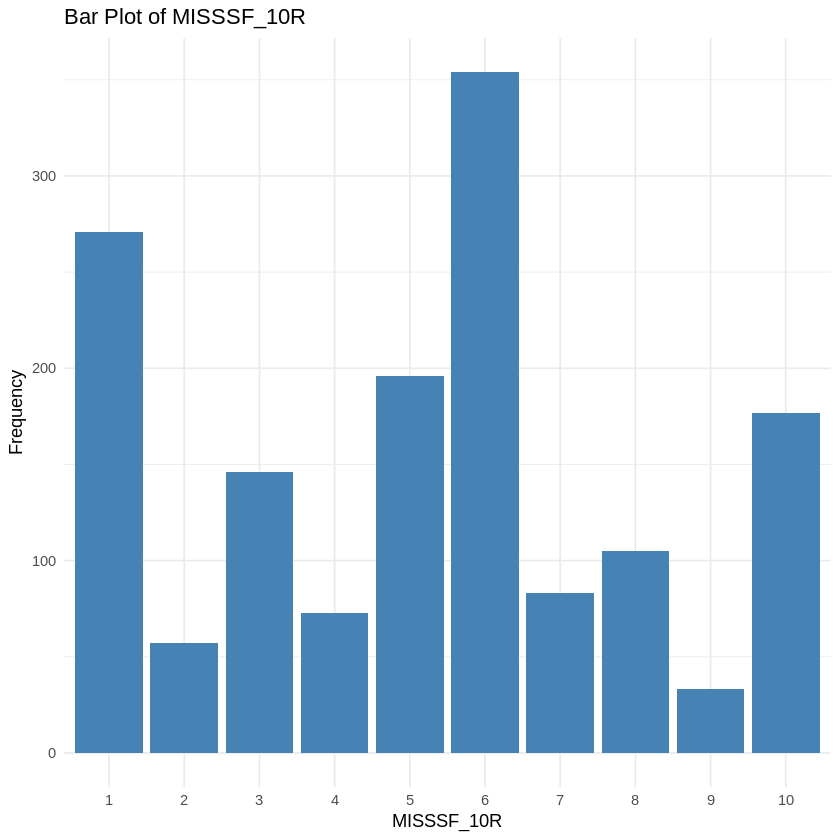

[1] "Descriptive Statistics for MISSSF_TOTAL"
   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  11.00   28.00   38.00   40.13   51.50   98.00 


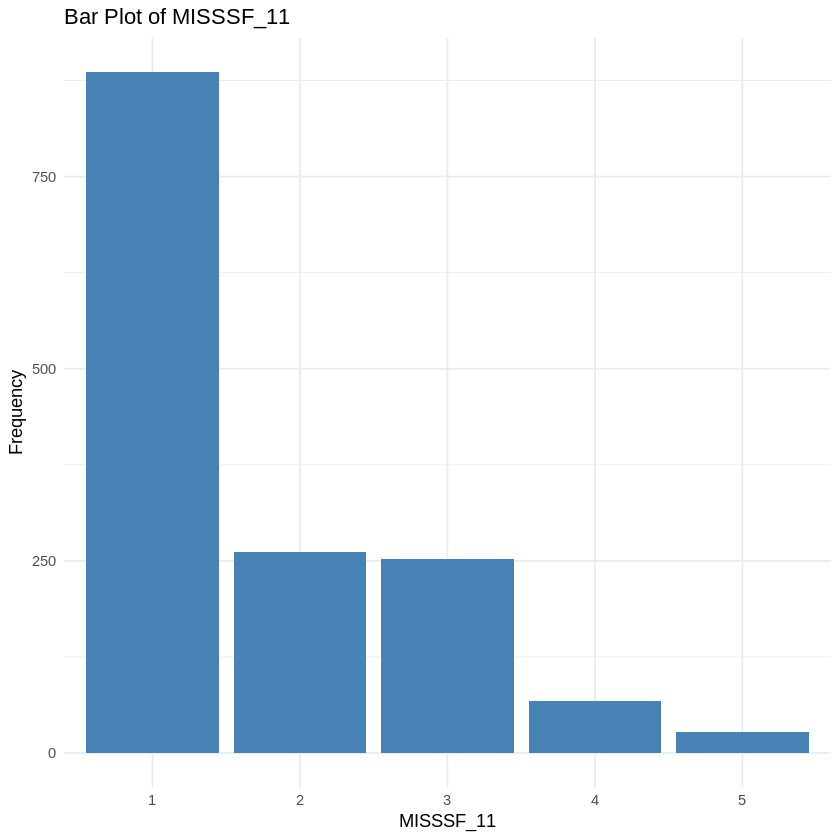

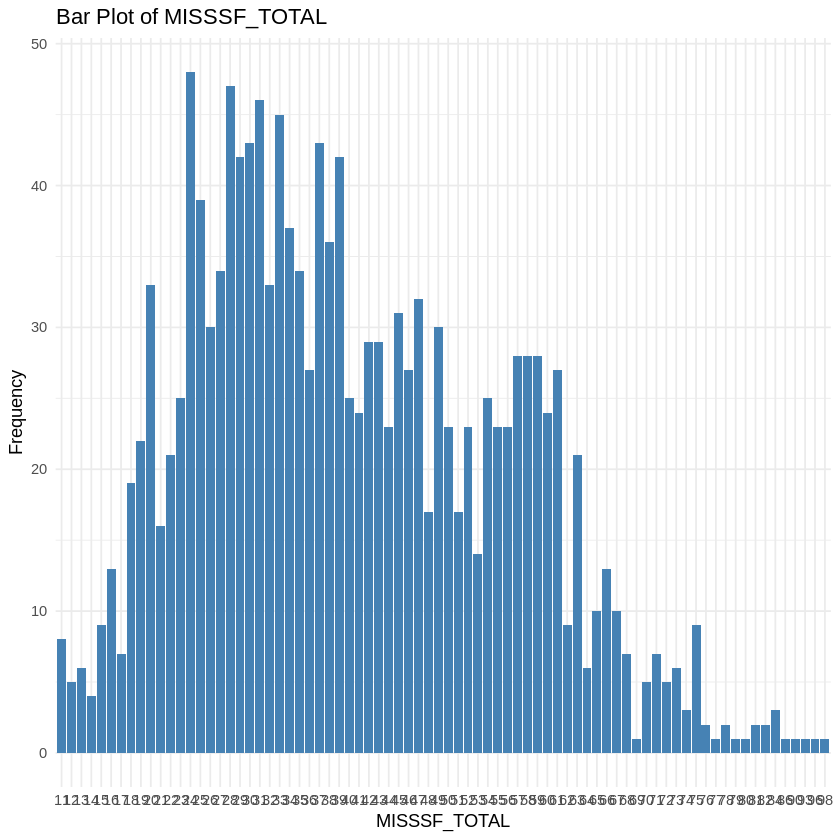

In [ ]:
# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2", dependencies=TRUE)}
if(!require(dplyr)){install.packages("dplyr", dependencies=TRUE)}
if(!require(tidyr)){install.packages("tidyr", dependencies=TRUE)}

# Select variables starting with "MISSSF_"
misssf_vars <- MilitaryDF %>%
  select(starts_with("MISSSF_")) %>%
  names()

# Loop through each variable and create plot/summary
for (var in misssf_vars) {

  # Descriptive statistics
  print(paste("Descriptive Statistics for", var))
  print(summary(MilitaryDF[[var]]))

  # Bar plot using ggplot2
  plot <- ggplot(MilitaryDF, aes(x = factor(!!sym(var)))) +
    geom_bar(fill = "steelblue") +
    labs(title = paste("Bar Plot of", var),
         x = var,
         y = "Frequency") +
    theme_minimal()

  print(plot)
}

In [ ]:
# Install necessary packages (if not already installed)
if(!require(dplyr)){install.packages("dplyr")}

# Function to calculate descriptive statistics
descriptive_stats <- function(data, var) {
  # Calculate sample size
  n <- sum(!is.na(data[[var]]))

  # Calculate percentage for categorical variables (BRANCH and RACE)
  if (is.factor(data[[var]])) {
    percentage <- prop.table(table(data[[var]])) * 100
  } else {
    percentage <- NULL  # For numeric variables (AGE)
  }

  # Calculate mean and sd for numeric variables (AGE)
  if (is.numeric(data[[var]])) {
    mean_val <- mean(data[[var]], na.rm = TRUE)
    sd_val <- sd(data[[var]], na.rm = TRUE)
  } else {
    mean_val <- NULL  # For categorical variables (BRANCH and RACE)
    sd_val <- NULL    # For categorical variables (BRANCH and RACE)
  }

  # Return results as a list
  return(list(
    variable = var,
    sample_size = n,
    percentage = percentage,
    mean = mean_val,
    sd = sd_val
  ))
}

# Apply the function to the desired variables
variables <- c("AGE", "BRANCH", "RACE")
results <- lapply(variables, function(var) descriptive_stats(MilitaryDF, var))

# Print the results
for (result in results) {
  print(paste("Descriptive Statistics for", result$variable))
  print(paste("Sample Size:", result$sample_size))

  if (!is.null(result$percentage)) {
    print("Percentage:")
    print(result$percentage)
  }

  if (!is.null(result$mean)) {
    print(paste("Mean:", result$mean))
    print(paste("Standard Deviation:", result$sd))
  }

  cat("\n")  # Add a newline for better readability
}

[1] "Descriptive Statistics for AGE"
[1] "Sample Size: 1495"
[1] "Mean: 50.0461538461538"
[1] "Standard Deviation: 13.4095665910966"

[1] "Descriptive Statistics for BRANCH"
[1] "Sample Size: 1495"
[1] "Mean: 3.72842809364548"
[1] "Standard Deviation: 2.20376667418089"

[1] "Descriptive Statistics for RACE"
[1] "Sample Size: 1495"
[1] "Mean: 1.41137123745819"
[1] "Standard Deviation: 0.874297074305236"



In [ ]:
# Install necessary packages (if not already installed)
if(!require(dplyr)){install.packages("dplyr")}

# Function to calculate descriptive statistics for categorical variables
categorical_stats <- function(data, var) {
  # Calculate sample size
  n <- sum(!is.na(data[[var]]))

  # Calculate percentage
  percentage <- prop.table(table(data[[var]])) * 100

  # Return results as a list
  return(list(
    variable = var,
    sample_size = n,
    percentage = percentage
  ))
}

# Apply the function to the desired variables
variables <- c("BRANCH", "RACE")
results <- lapply(variables, function(var) categorical_stats(MilitaryDF, var))

# Print the results
for (result in results) {
  print(paste("Descriptive Statistics for", result$variable))
  print(paste("Sample Size:", result$sample_size))
  print("Percentage:")
  print(result$percentage)
  cat("\n")  # Add a newline for better readability
}

[1] "Descriptive Statistics for BRANCH"
[1] "Sample Size: 1495"
[1] "Percentage:"

        1         2         3         4         5         6         7 
24.481605  2.408027 32.842809  7.692308  2.809365  8.160535 21.605351 

[1] "Descriptive Statistics for RACE"
[1] "Sample Size: 1495"
[1] "Percentage:"

         1          2          3          4          5          6 
75.5183946 14.3812709  5.7525084  2.8093645  0.8695652  0.6688963 



In [ ]:
# For BRANCH
table(MilitaryDF$BRANCH)

# For RACE
table(MilitaryDF$RACE)


  1   2   3   4   5   6   7 
366  36 491 115  42 122 323 


   1    2    3    4    5    6 
1129  215   86   42   13   10 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0000  0.0000  0.8555  2.0000  4.0000 

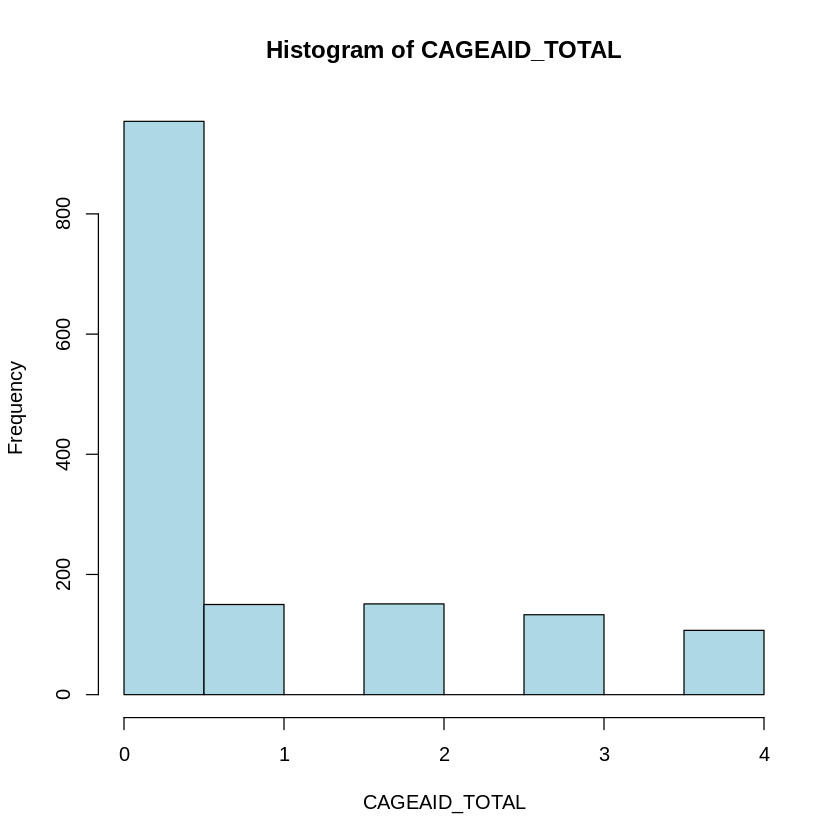

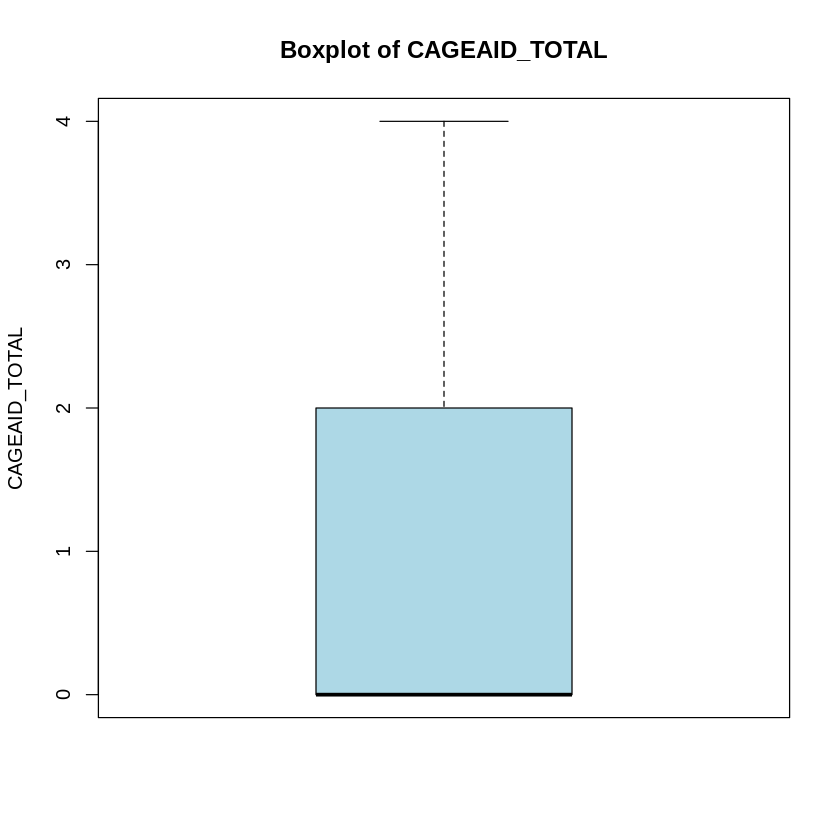

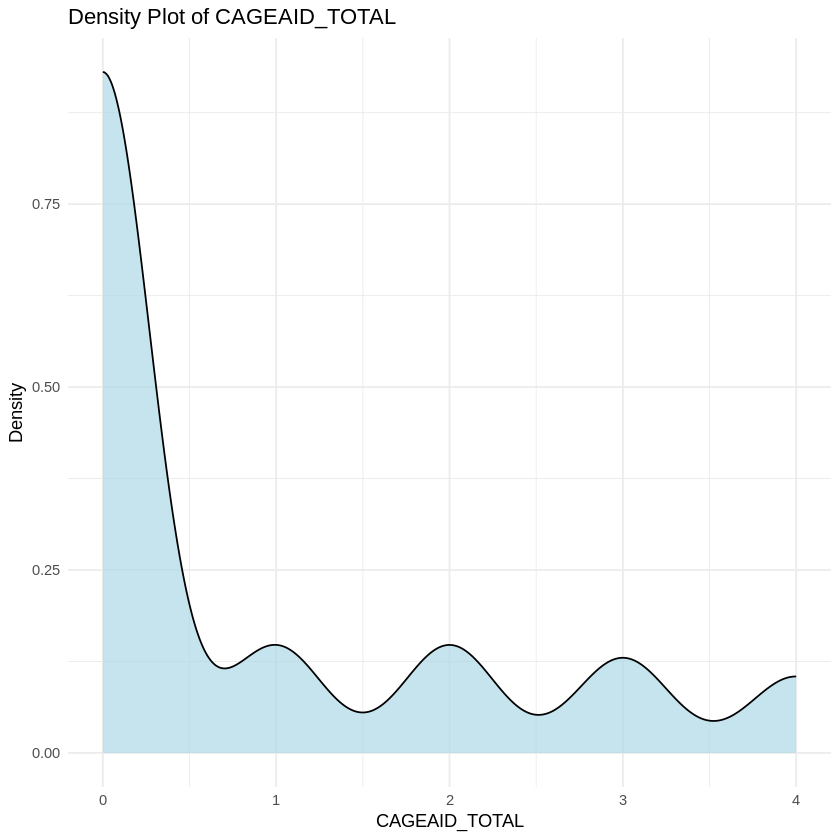

In [ ]:
# prompt: descriptive statistics for CAGEAID_TOTAL with graphs

# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2")}

# Descriptive Statistics
summary(MilitaryDF$CAGEAID_TOTAL)

# Histogram
hist(MilitaryDF$CAGEAID_TOTAL,
     main = "Histogram of CAGEAID_TOTAL",
     xlab = "CAGEAID_TOTAL",
     ylab = "Frequency",
     col = "lightblue", border = "black")

# Boxplot
boxplot(MilitaryDF$CAGEAID_TOTAL,
        main = "Boxplot of CAGEAID_TOTAL",
        ylab = "CAGEAID_TOTAL",
        col = "lightblue", border = "black")

# Density Plot
ggplot(MilitaryDF, aes(x = CAGEAID_TOTAL)) +
  geom_density(fill = "lightblue", alpha = 0.7) +
  labs(title = "Density Plot of CAGEAID_TOTAL", x = "CAGEAID_TOTAL", y = "Density") +
  theme_minimal()

In [ ]:
# prompt: display the frequency of each level for the variable CAGEAID_TOTAL

table(MilitaryDF$CAGEAID_TOTAL)



  0   1   2   3   4 
954 150 151 133 107 

In [ ]:
# Recode CAGEAID_TOTAL to CAGE_R
MilitaryDF$CAGE_R <- ifelse(MilitaryDF$CAGEAID_TOTAL %in% c(0, 1), 0,
                            ifelse(MilitaryDF$CAGEAID_TOTAL %in% c(2, 3, 4), 1, NA))

# Add labels
MilitaryDF$CAGE_R <- factor(MilitaryDF$CAGE_R,
                            levels = c(0, 1),
                            labels = c("No Risk", "At Risk"))

# Display the frequency table of the recoded variable
table(MilitaryDF$CAGE_R)


No Risk At Risk 
   1104     391 

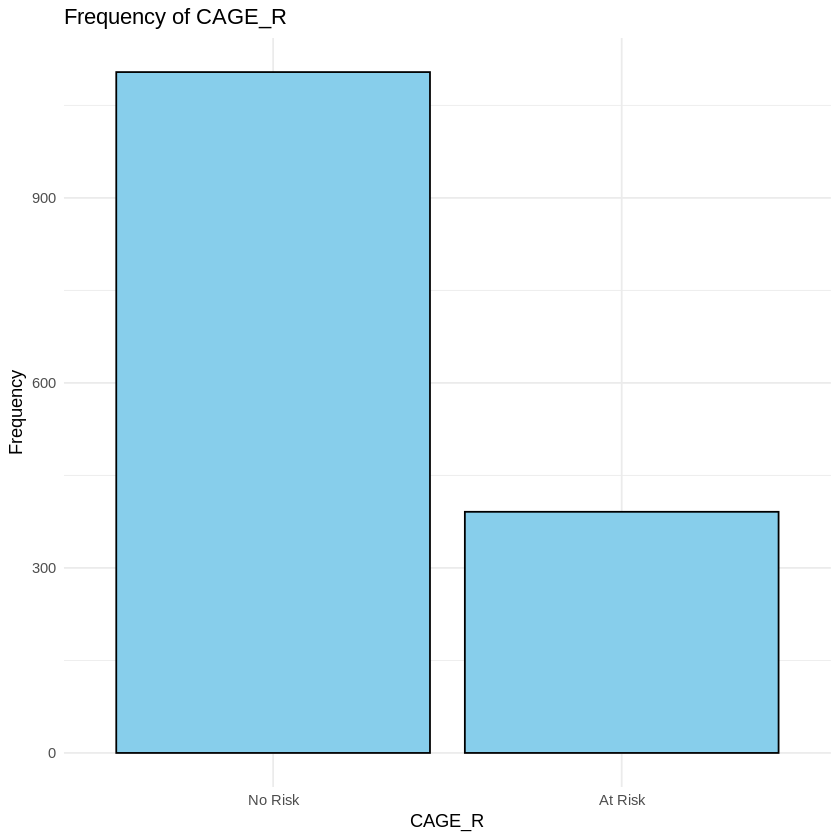

In [ ]:
# prompt: Provide a graph for the variable CAGE_R

# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2")}

# Bar plot of CAGE_R
ggplot(MilitaryDF, aes(x = CAGE_R)) +
  geom_bar(fill = "skyblue", color = "black") +  # Use skyblue fill and black border
  labs(title = "Frequency of CAGE_R", x = "CAGE_R", y = "Frequency") +
  theme_minimal() # Use minimal theme for a cleaner look


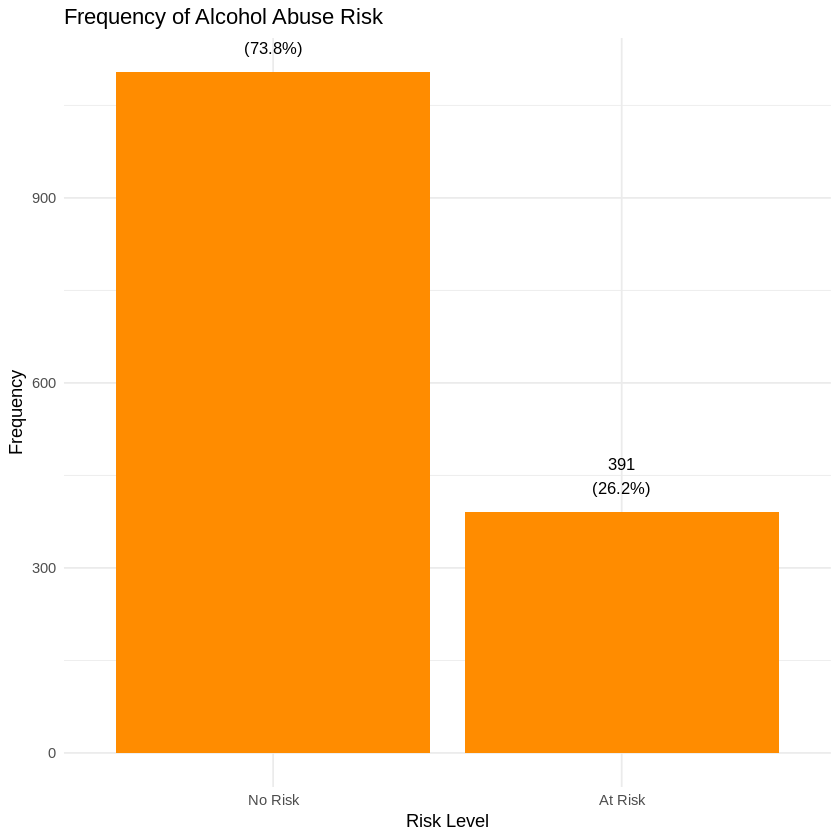

In [ ]:
# prompt: Label Graph "Frequency of Alcohol Abuse RIsk "  Provided the count  and % at the top of the bar.  use the color dark blue

# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2")}

# Calculate counts and percentages for each category
cage_table <- table(MilitaryDF$CAGE_R)
cage_percent <- prop.table(cage_table) * 100

# Create the bar plot
ggplot(as.data.frame(cage_table), aes(x = Var1, y = Freq)) +
  geom_bar(stat = "identity", fill = "darkorange") +
  geom_text(aes(label = paste0(Freq, "\n(", round(cage_percent, 1), "%)")),
            vjust = -0.5, size = 3.5) + # Add counts and percentages
  labs(title = "Frequency of Alcohol Abuse Risk",
       x = "Risk Level",
       y = "Frequency") +
  theme_minimal()

In [ ]:
install.packages("corrplot")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



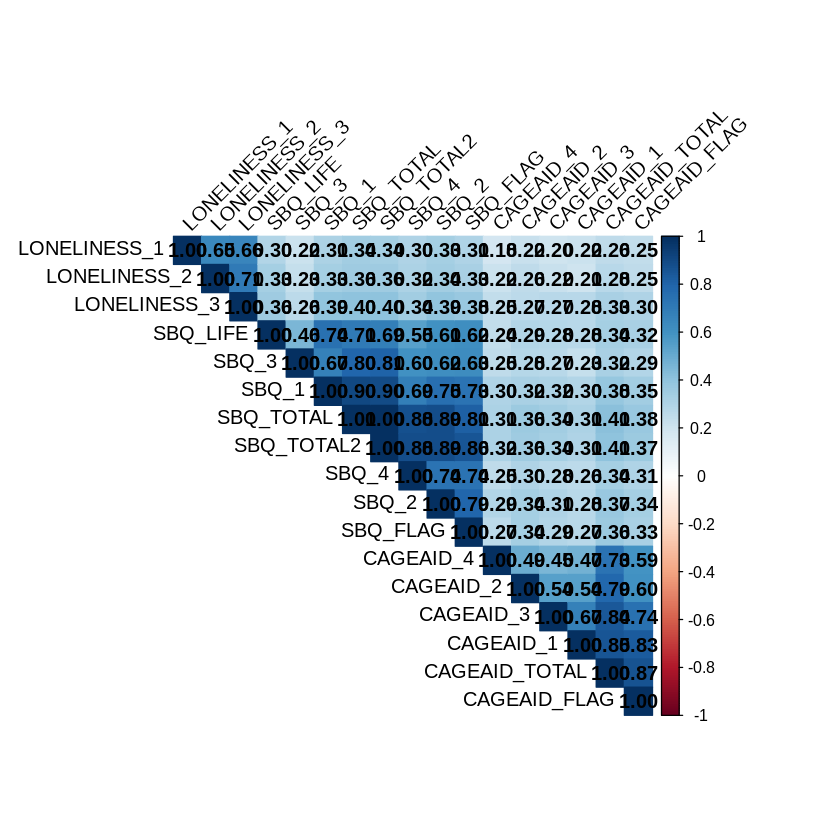

In [ ]:
# Install necessary packages if not already installed
if(!require(dplyr)){install.packages("dplyr")}
if(!require(corrplot)){install.packages("corrplot")}

# Select variables starting with "LONELINESS_", "SBQ_", and "CAGEAID_"
selected_vars <- MilitaryDF %>%
  select(starts_with("LONELINESS_"), starts_with("SBQ_"), starts_with("CAGEAID_")) %>%
  names()

# Create correlation matrix
cor_matrix <- cor(MilitaryDF[, selected_vars], use = "pairwise.complete.obs")

# Visualize correlation matrix using corrplot
corrplot(cor_matrix, method = "color", type = "upper", order = "hclust",
         tl.col = "black", tl.srt = 45, addCoef.col = "black")

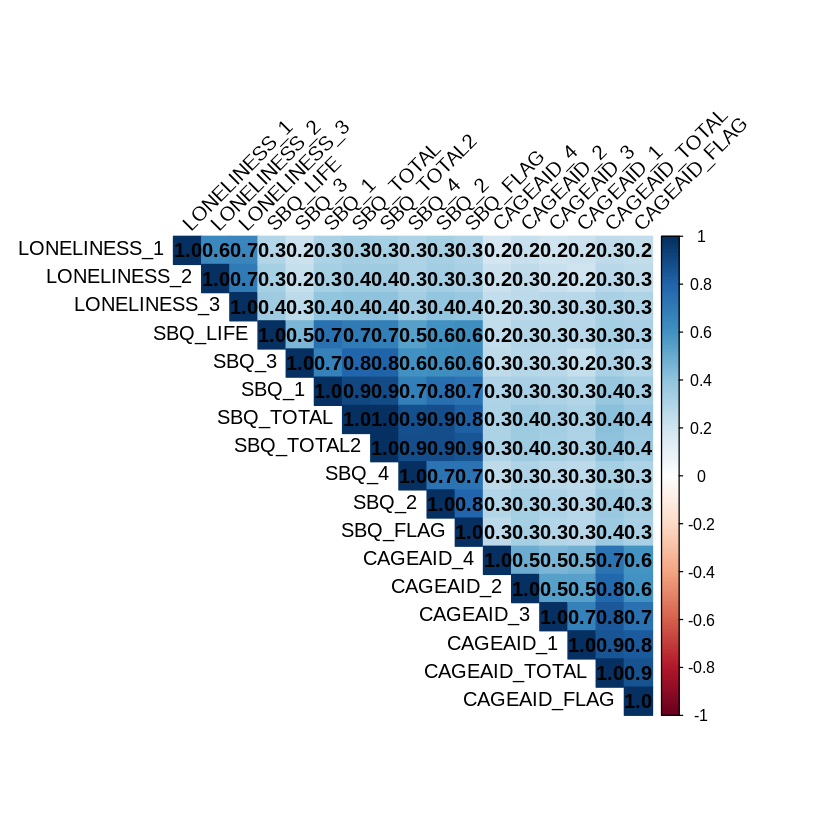

In [ ]:
# ... (previous code for selecting variables and creating cor_matrix) ...

# Visualize correlation matrix with 1 significant figure
corrplot(cor_matrix, method = "color", type = "upper", order = "hclust",
         tl.col = "black", tl.srt = 45,
         addCoef.col = "black",  # Add coefficient colors
         number.digits = 1,     # Set number of digits to 1
         insig = "blank")       # Optionally hide insignificant correlations

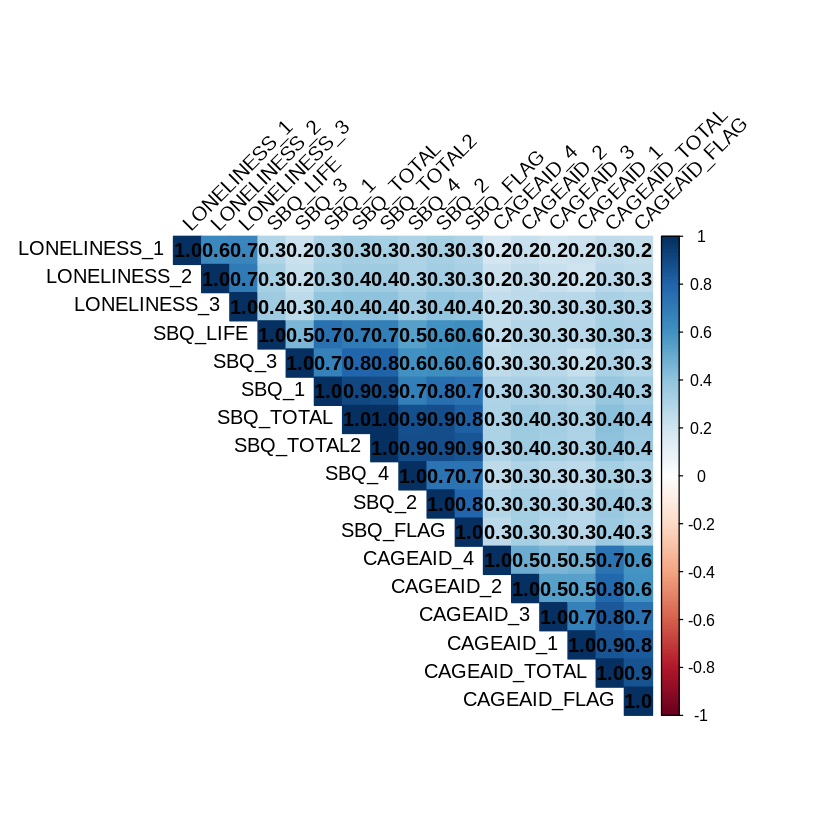

In [ ]:
# prompt: report to only one digit as follows .*

# ... (previous code) ...

# Visualize correlation matrix with 1 significant figure
corrplot(cor_matrix, method = "color", type = "upper", order = "hclust",
         tl.col = "black", tl.srt = 45,
         addCoef.col = "black",  # Add coefficient colors
         number.digits = 1,     # Set number of digits to 1
         insig = "blank")       # Optionally hide insignificant correlations

In [ ]:
install.packages("corrplot")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



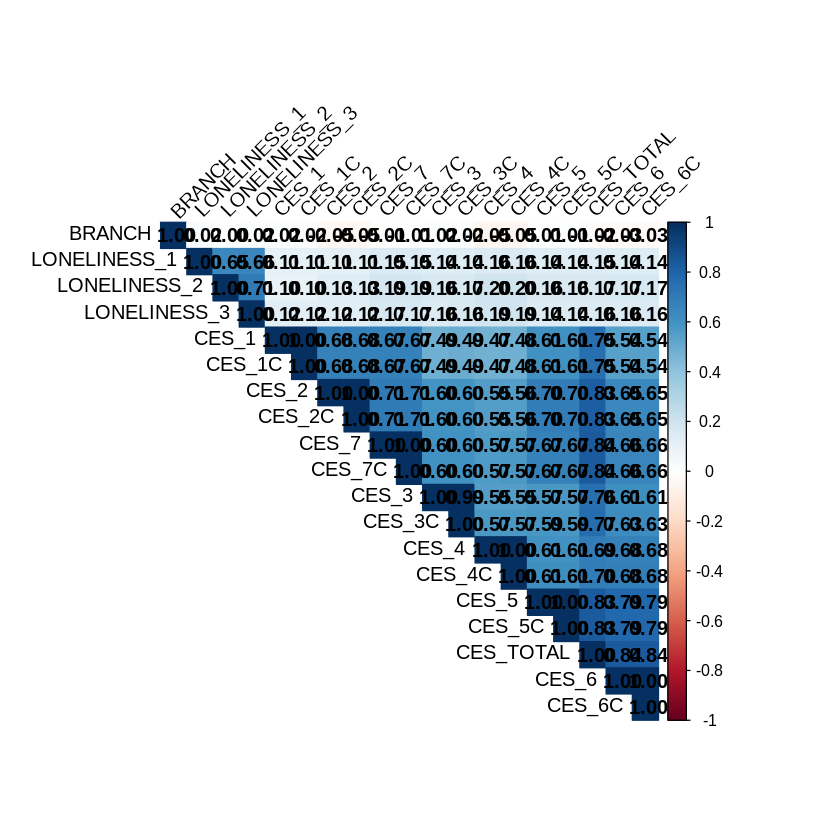

In [ ]:
# Install necessary packages if not already installed
if(!require(dplyr)){install.packages("dplyr")}
if(!require(corrplot)){install.packages("corrplot")}

# Select variables
selected_vars <- MilitaryDF %>%
  select(BRANCH, starts_with("LONELINESS_"), starts_with("CES_")) %>%
  names()

# Convert BRANCH to numeric for correlation calculation (if it's a factor)
if (is.factor(MilitaryDF$BRANCH)) {
  MilitaryDF$BRANCH_numeric <- as.numeric(MilitaryDF$BRANCH)
  selected_vars <- replace(selected_vars, selected_vars == "BRANCH", "BRANCH_numeric")
}

# Create correlation matrix
cor_matrix <- cor(MilitaryDF[, selected_vars], use = "pairwise.complete.obs")

# Visualize correlation matrix using corrplot
corrplot(cor_matrix, method = "color", type = "upper", order = "hclust",
         tl.col = "black", tl.srt = 45, addCoef.col = "black")

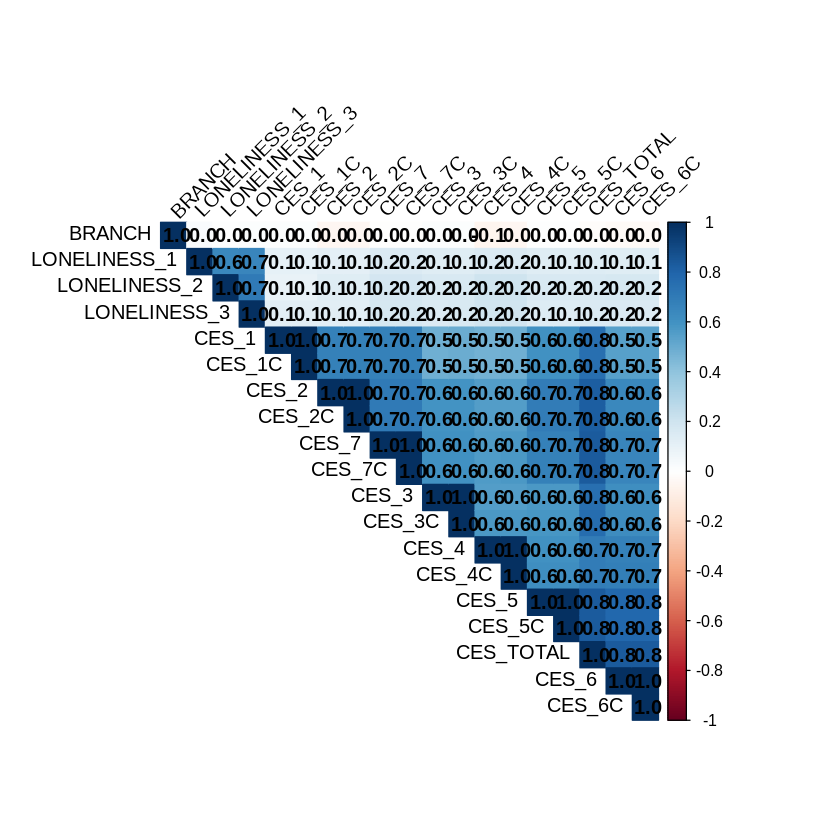

In [ ]:
# ... (previous code for selecting variables and creating cor_matrix) ...

# Visualize correlation matrix with 1 significant figure
corrplot(cor_matrix, method = "color", type = "upper", order = "hclust",
         tl.col = "black", tl.srt = 45,
         addCoef.col = "black",  # Add coefficient colors
         number.digits = 1,     # Set number of digits to 1
         insig = "blank")       # Optionally hide insignificant correlations

In [ ]:
library(caret)

In [ ]:
# Install necessary packages if needed
if (!require(caret)) install.packages("caret")

# Create stratified train/test split (e.g., 70% train, 30% test)
set.seed(123)  # Set seed for reproducibility
index <- createDataPartition(MilitaryDF$BRANCH, p = 0.7, list = FALSE)
train_data <- MilitaryDF[index, ]
test_data <- MilitaryDF[-index, ]

# Verify stratification
table(train_data$BRANCH)  # Check distribution in training data
table(test_data$BRANCH)   # Check distribution in testing data


  1   2   3   4   5   6   7 
264  18 344  81  26  89 227 


  1   2   3   4   5   6   7 
102  18 147  34  16  33  96 

In [ ]:
# prompt: DESCRIPTIVE STATISTICS FOR SBQ_*

# Assuming 'MilitaryDF' is your dataframe
summary(MilitaryDF$SBQ_1)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
   1.00    1.00    1.00    1.74    2.00    6.00      12 

In [ ]:
# Install necessary packages if not already installed
if(!require(dplyr)){install.packages("dplyr")}
if(!require(psych)){install.packages("psych")}

# Select variables starting with "SBQ_"
sbq_vars <- MilitaryDF %>%
  select(starts_with("SBQ_")) %>%
  names()

# Loop through each variable and print descriptive statistics
for (var in sbq_vars) {
  print(paste("Descriptive Statistics for", var))
  print(describe(MilitaryDF[[var]])) # Using describe() from psych package
}

[1] "Descriptive Statistics for SBQ_1"
   vars    n mean   sd median trimmed mad min max range skew kurtosis   se
X1    1 1483 1.74 1.17      1    1.47   0   1   6     5    2     3.78 0.03
[1] "Descriptive Statistics for SBQ_2"
   vars    n mean   sd median trimmed mad min max range skew kurtosis   se
X1    1 1484  1.5 0.97      1    1.28   0   1   5     4    2     3.28 0.03
[1] "Descriptive Statistics for SBQ_3"
   vars    n mean   sd median trimmed mad min max range skew kurtosis   se
X1    1 1478 1.35 0.85      1    1.11   0   1   5     4 2.78     7.38 0.02
[1] "Descriptive Statistics for SBQ_4"
   vars    n mean   sd median trimmed mad min max range skew kurtosis   se
X1    1 1487 0.68 1.23      0    0.39   0   0   6     6 1.95     3.32 0.03
[1] "Descriptive Statistics for SBQ_TOTAL"
   vars    n  mean   sd median trimmed mad min max range skew kurtosis   se
X1    1 1495 11.11 8.14      6    9.35   0   2  46    44 1.77     2.57 0.21
[1] "Descriptive Statistics for SBQ_LIFE"
   vars

In [ ]:
# Select columns starting with "SBQ_"
SBQ_cols <- grep("^SBQ_", names(MilitaryDF), value = TRUE)

# Calculate the row sums and create the new variable
MilitaryDF$SBQ_TOTAL <- rowSums(MilitaryDF[, SBQ_cols], na.rm = TRUE)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   4.00   12.00   12.00   22.22   26.00   92.00 

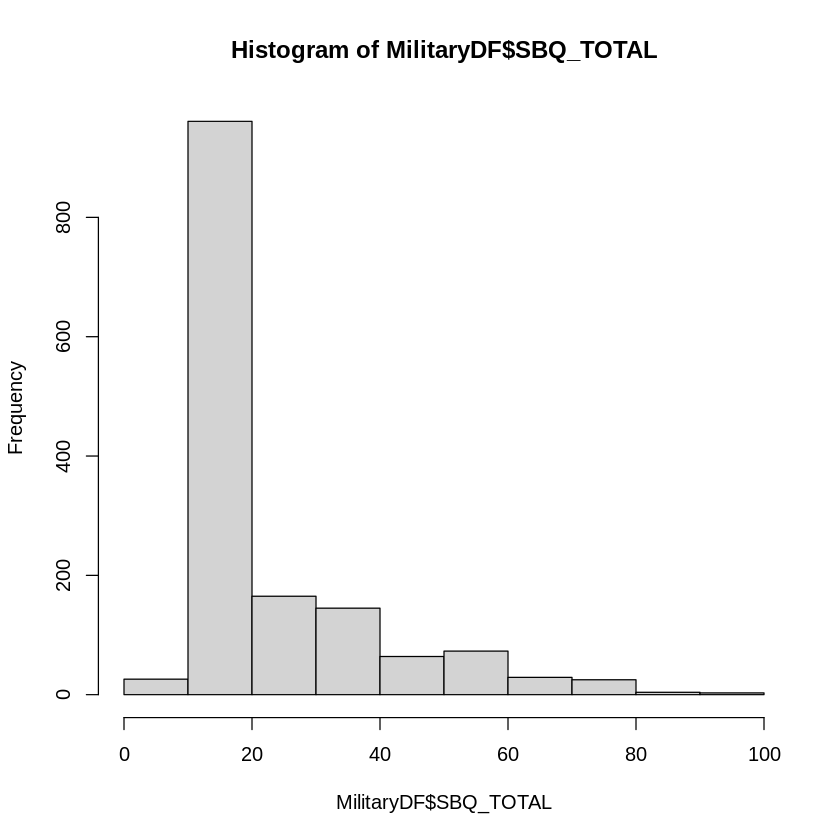

[1] 16.27117

[1] 22.21672

,vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X1,1,1495,22.21672,16.27117,12,18.6934,0,4,92,88,1.771989,2.57257,0.4208217


25% 50% 75% 
 12  12  26

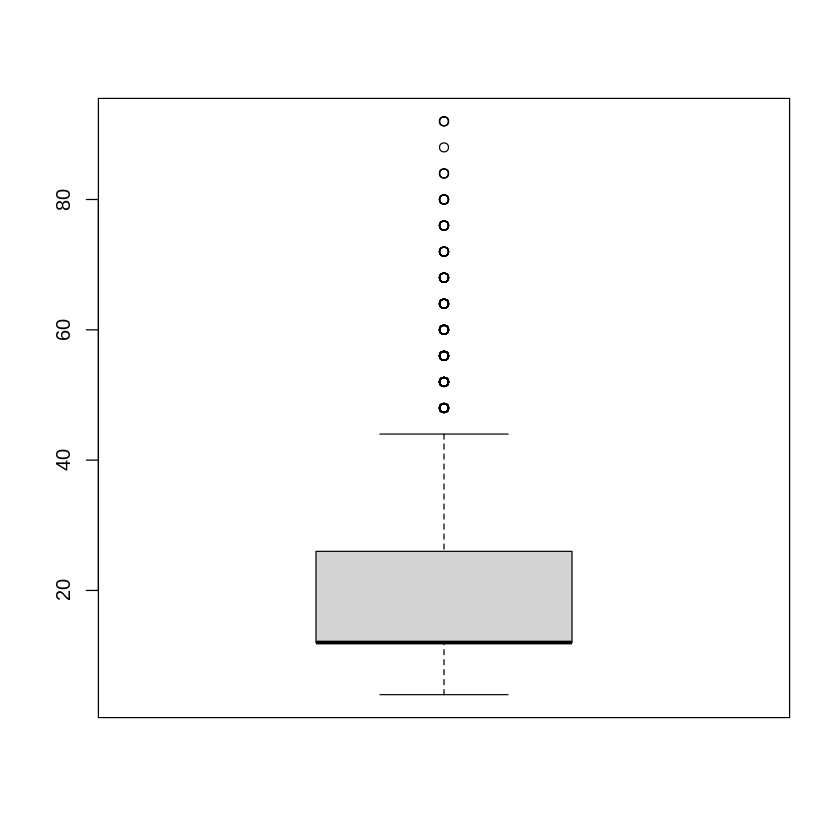

In [ ]:
# prompt: DESCRIPTIVE STAT FOR SBQ_TOTAL

summary(MilitaryDF$SBQ_TOTAL)
hist(MilitaryDF$SBQ_TOTAL)
boxplot(MilitaryDF$SBQ_TOTAL)
sd(MilitaryDF$SBQ_TOTAL, na.rm = TRUE)
mean(MilitaryDF$SBQ_TOTAL, na.rm = TRUE)
# Additional descriptive statistics
describe(MilitaryDF$SBQ_TOTAL) #using psych package
# You can also add other descriptive stats here as per your requirement
# For example: quantiles, skewness, kurtosis, etc.
# Example:
quantile(MilitaryDF$SBQ_TOTAL, probs = c(0.25, 0.5, 0.75), na.rm = TRUE)
#For more details about describe() function, see ?describe


Warning message:
“Continuous x aesthetic
ℹ did you forget `aes(group = ...)`?”
Warning message:
“Removed 12 rows containing non-finite outside the scale range
(`stat_boxplot()`).”


ERROR: Error in !sym(sbq_var): invalid argument type


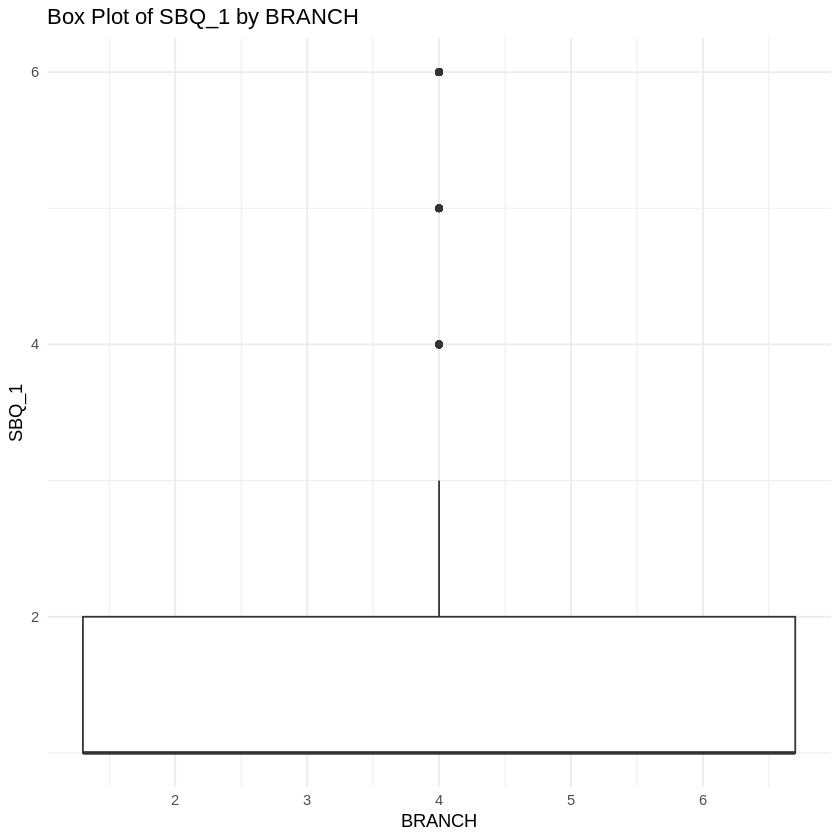

In [ ]:
# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2")}

# Select SBQ_* variables
sbq_vars <- names(MilitaryDF)[grep("^SBQ_", names(MilitaryDF))]

# Loop through each SBQ_* variable and perform analysis
for (sbq_var in sbq_vars) {

  # Box plot
  print(ggplot(MilitaryDF, aes(x = BRANCH, y = !!sym(sbq_var))) +
          geom_boxplot() +
          labs(title = paste("Box Plot of", sbq_var, "by BRANCH"),
               x = "BRANCH", y = sbq_var) +
          theme_minimal())

  # ANOVA (if SBQ_* is numerical)
  if (is.numeric(MilitaryDF[[sbq_var]])) {
    anova_result <- aov(!!sym(sbq_var) ~ BRANCH, data = MilitaryDF)
    print(summary(anova_result))
  }

}

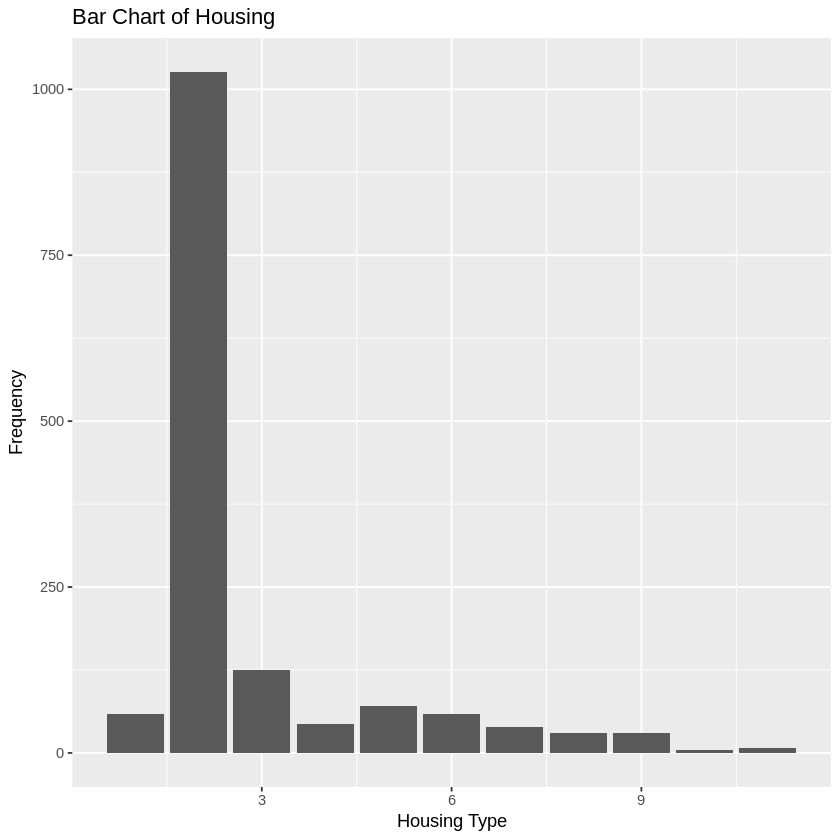

In [ ]:
# prompt: bar chart for HOUSING

# Assuming you want a bar chart of the 'HOUSING' variable
library(ggplot2)

ggplot(MilitaryDF, aes(x = HOUSING)) +
  geom_bar() +
  labs(title = "Bar Chart of Housing", x = "Housing Type", y = "Frequency")

[1] 0.2071052


	Welch Two Sample t-test

data:  SBQ_TOTAL by TBI
t = -6.9449, df = 315.62, p-value = 2.168e-11
alternative hypothesis: true difference in means between group 0 and group 1 is not equal to 0
95 percent confidence interval:
 -11.547793  -6.449194
sample estimates:
mean in group 0 mean in group 1 
       20.69992        29.69841 


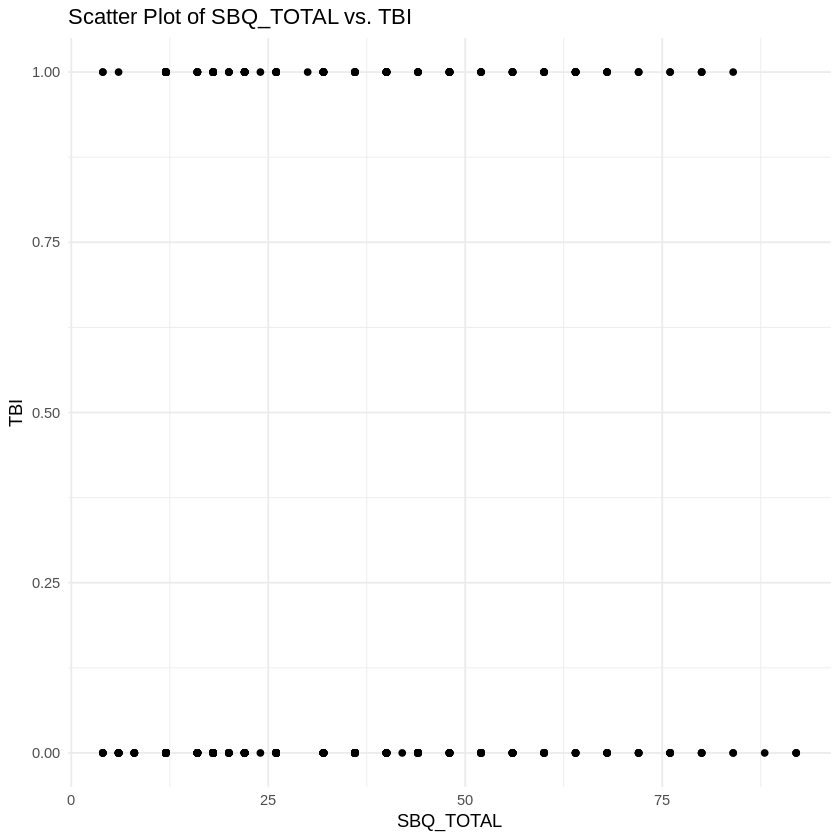

In [ ]:
# prompt: bivariate analysis of SBQ_TOTAL and TBI

# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2")}

# Create a scatter plot
ggplot(MilitaryDF, aes(x = SBQ_TOTAL, y = TBI)) +
  geom_point() +
  labs(title = "Scatter Plot of SBQ_TOTAL vs. TBI",
       x = "SBQ_TOTAL",
       y = "TBI") +
  theme_minimal()


# Calculate the correlation
cor(MilitaryDF$SBQ_TOTAL, MilitaryDF$TBI, use = "complete.obs") # Use complete.obs to handle missing data

# Perform a t-test or other statistical tests depending on the nature of your data
# Example t-test (assuming TBI is a binary variable 0/1)
t.test(SBQ_TOTAL ~ TBI, data = MilitaryDF)



In [ ]:
# prompt: linear regression of TBI and SBQ_TOTAL

# Fit the linear regression model
model <- lm(TBI ~ SBQ_TOTAL, data = MilitaryDF)

# Print the model summary
summary(model)


Call:
lm(formula = TBI ~ SBQ_TOTAL, data = MilitaryDF)

Residuals:
    Min      1Q  Median      3Q     Max 
-0.5012 -0.1580 -0.1199 -0.1199  0.9183 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept) 0.0626628  0.0160454   3.905 9.83e-05 ***
SBQ_TOTAL   0.0047666  0.0005827   8.180 6.02e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 0.3665 on 1493 degrees of freedom
Multiple R-squared:  0.04289,	Adjusted R-squared:  0.04225 
F-statistic: 66.91 on 1 and 1493 DF,  p-value: 6.019e-16


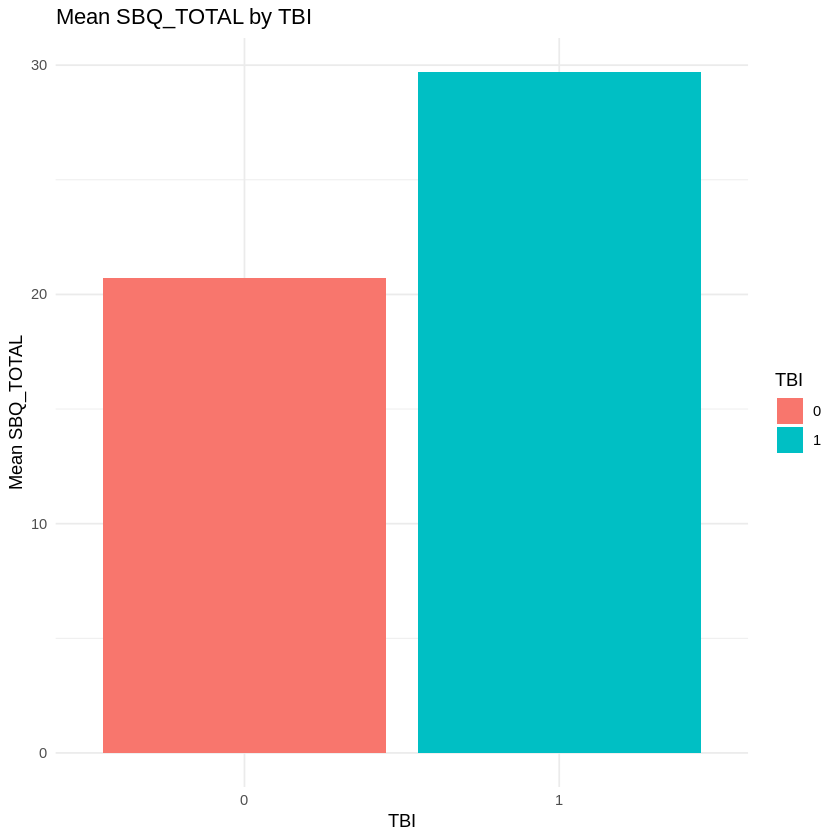

In [ ]:
# prompt: show side by side bar graph for SBQ_TOTAL by TBI

# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2")}

# Create the side-by-side bar graph
ggplot(MilitaryDF, aes(x = factor(TBI), y = SBQ_TOTAL, fill = factor(TBI))) +
  geom_bar(stat = "summary", fun = "mean", position = "dodge") +  # Calculate mean for each group
  labs(title = "Mean SBQ_TOTAL by TBI",
       x = "TBI",
       y = "Mean SBQ_TOTAL",
       fill = "TBI") +
  theme_minimal()

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0000  0.0000  0.1686  0.0000  1.0000 

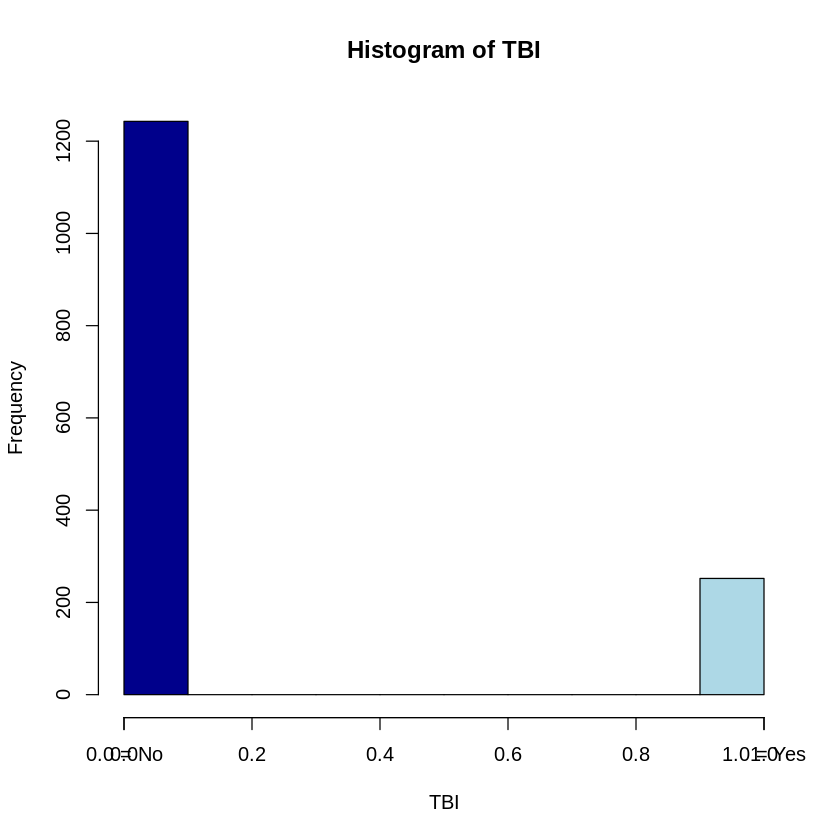

In [ ]:
# prompt: descriptive statistics for TBI

summary(MilitaryDF$TBI)
hist(MilitaryDF$TBI, main = "Histogram of TBI", xlab = "TBI", ylab = "Frequency", col = c("darkblue", "lightblue"))
# Add custom x-axis labels
axis(1, at = c(0, 1), labels = c("0.0 = No", "1.0 = Yes"))


Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.”


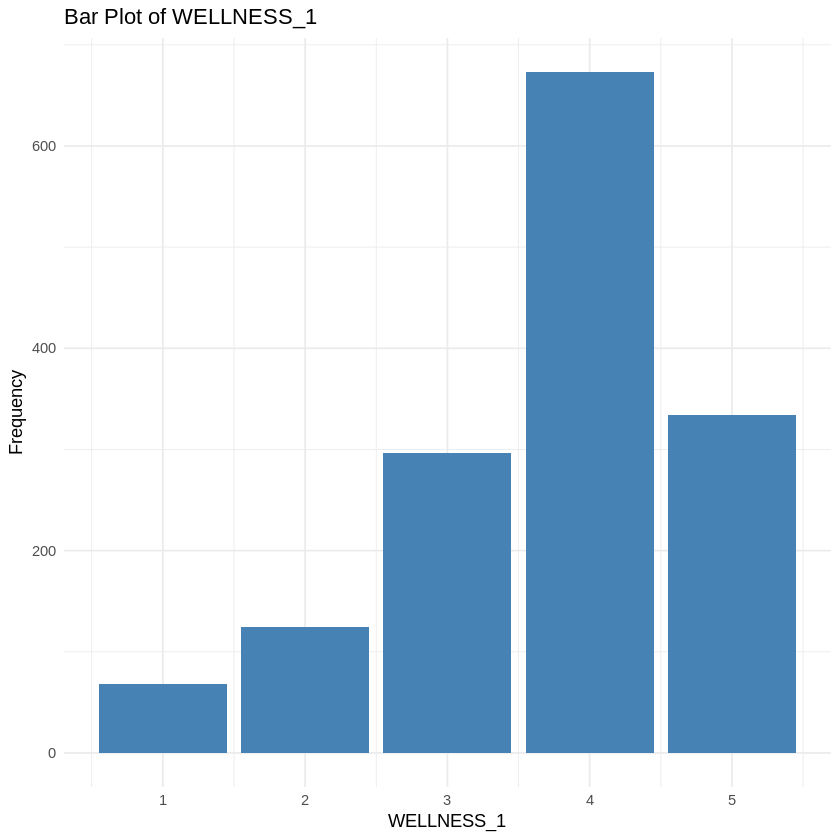

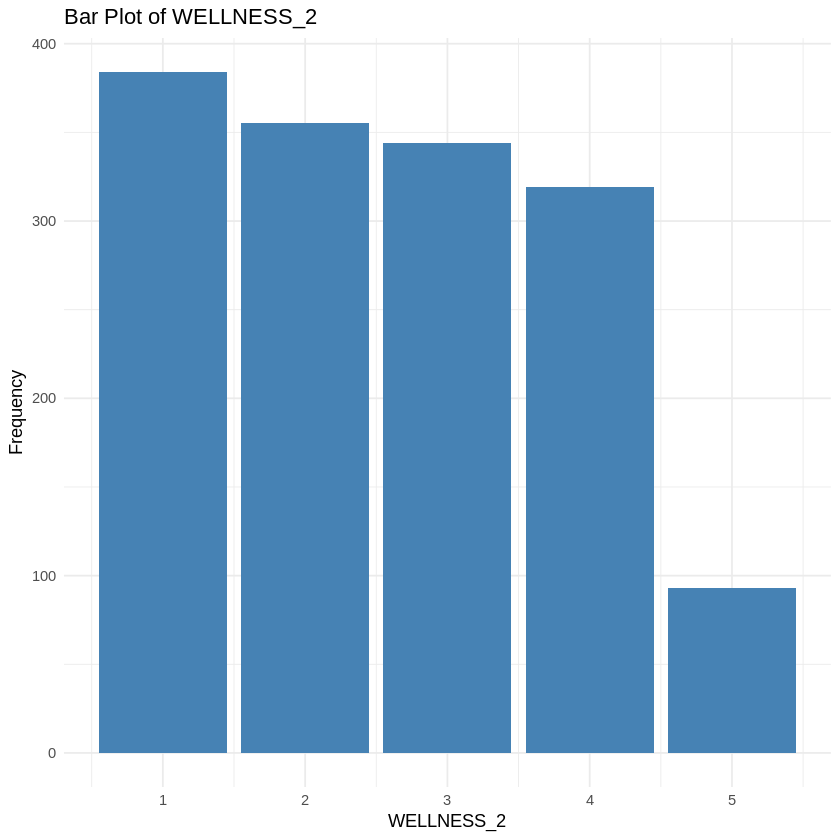

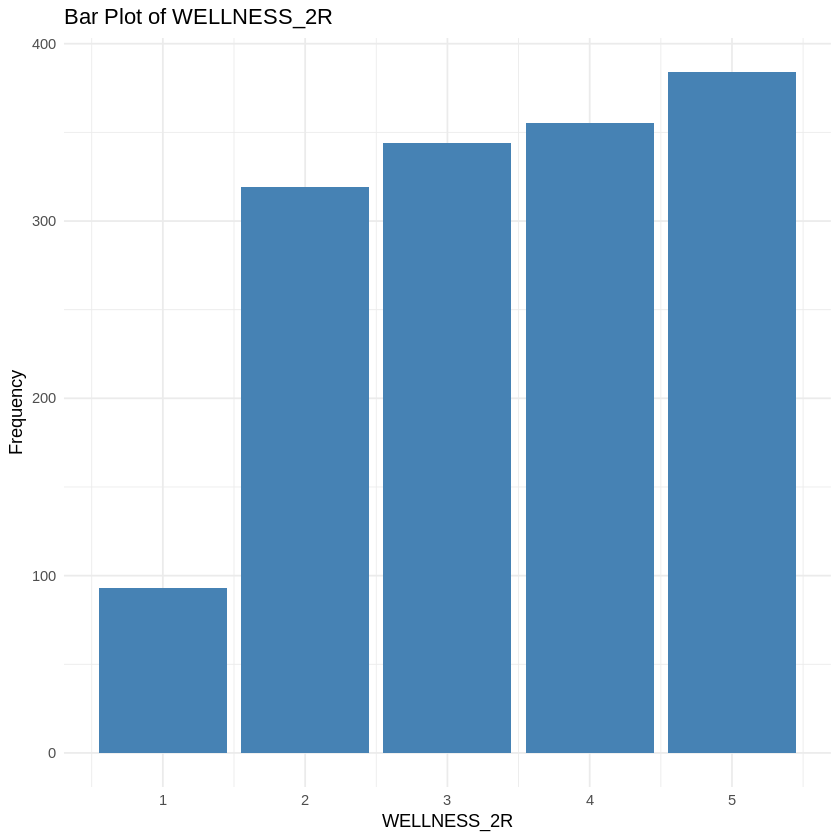

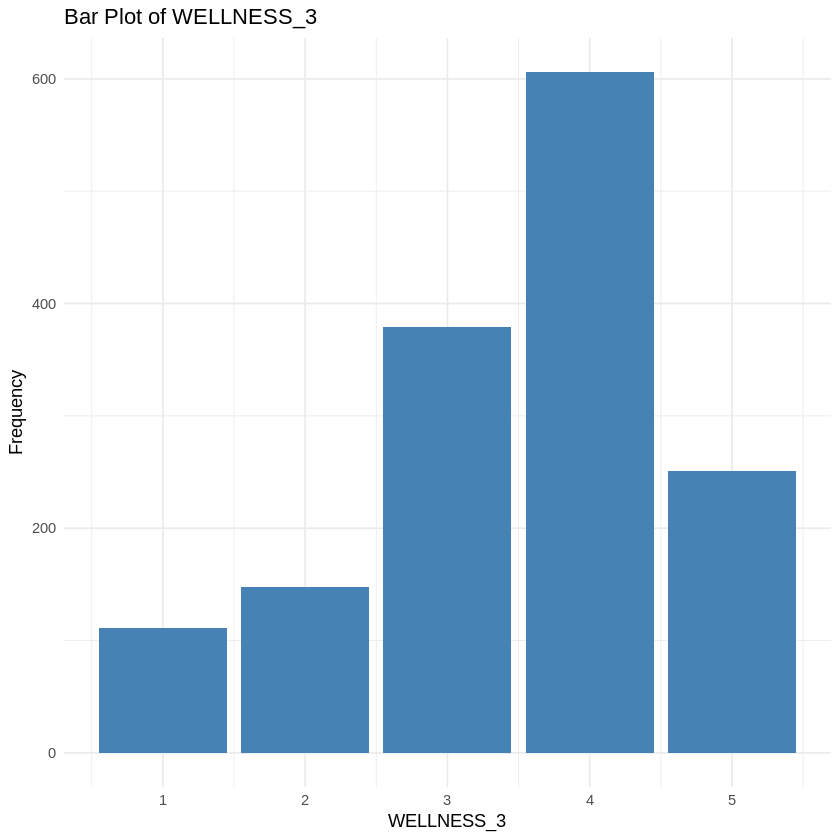

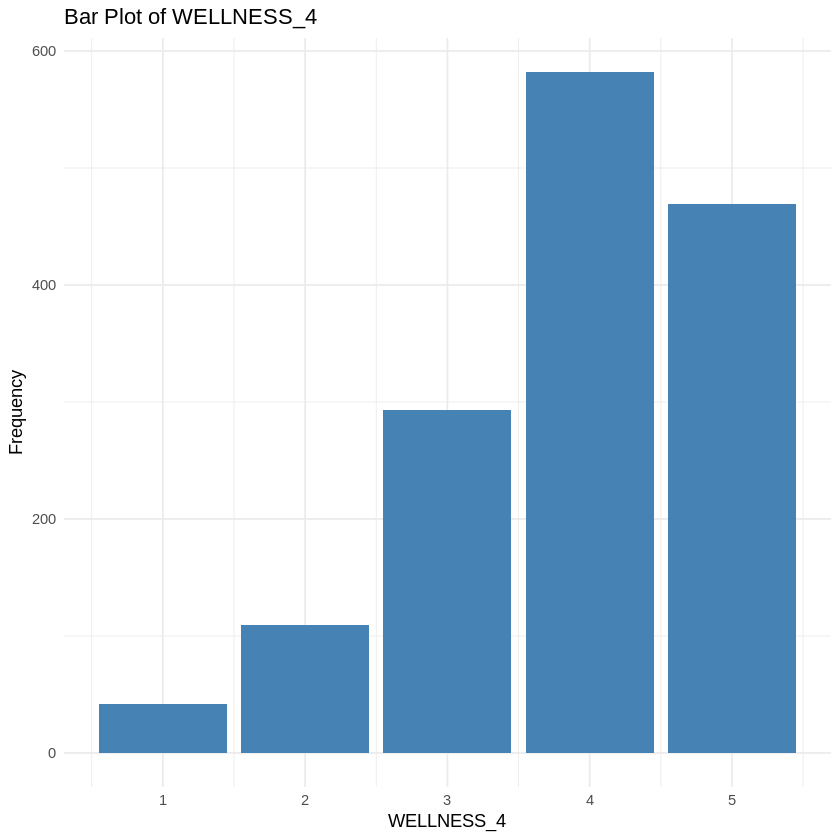

...

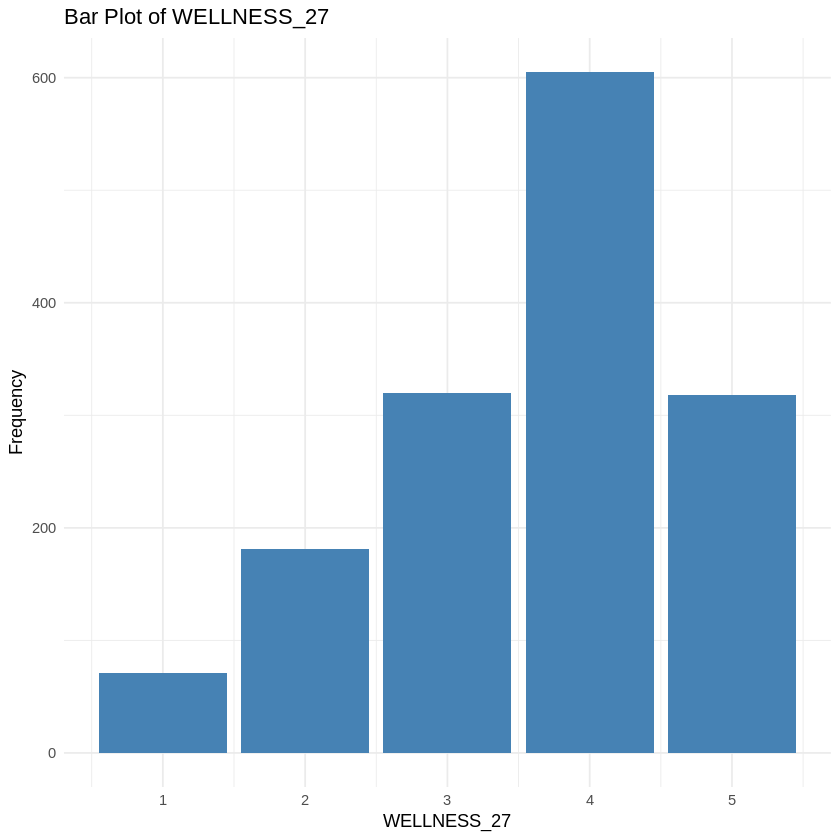

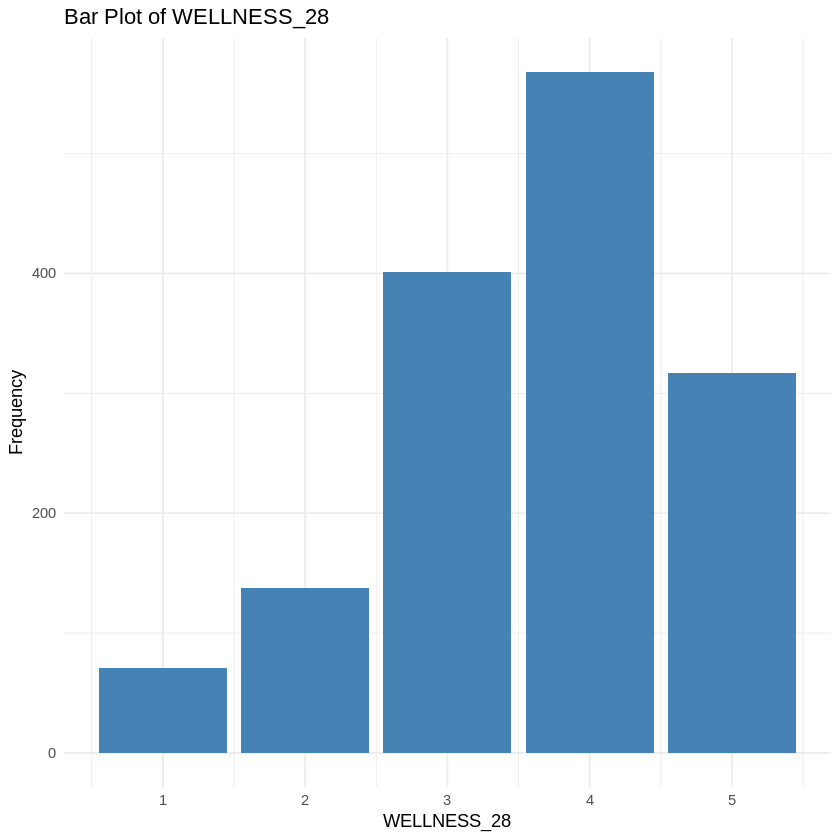

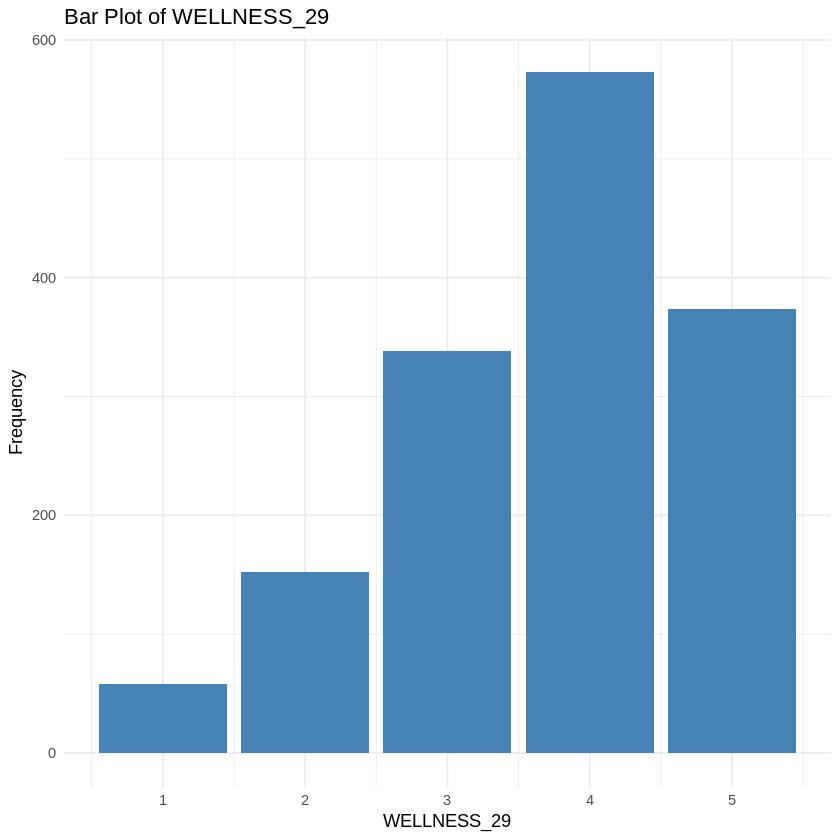

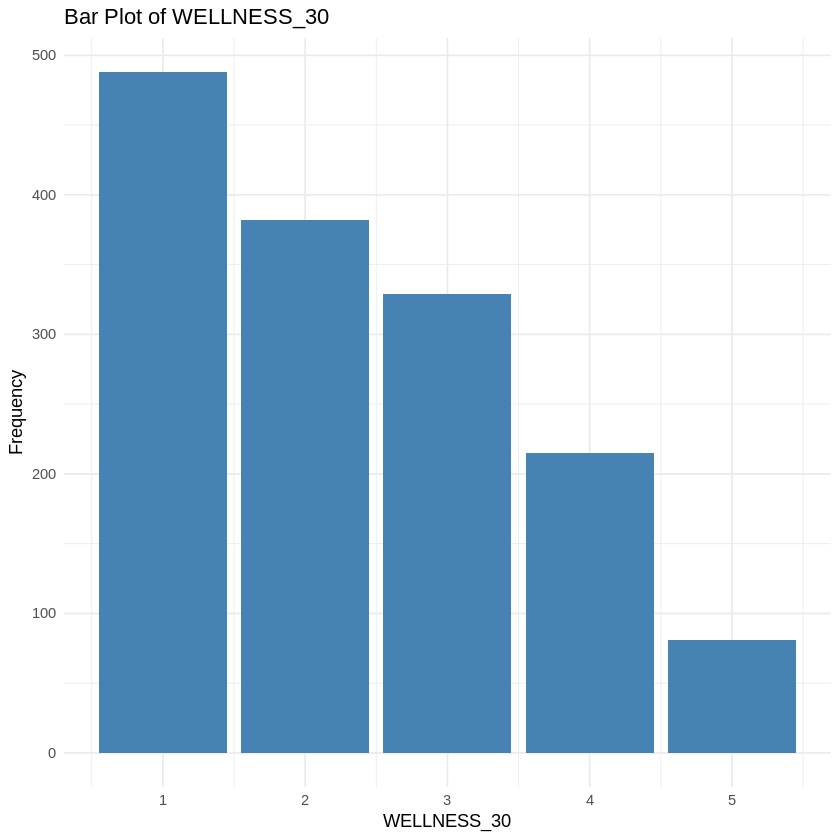

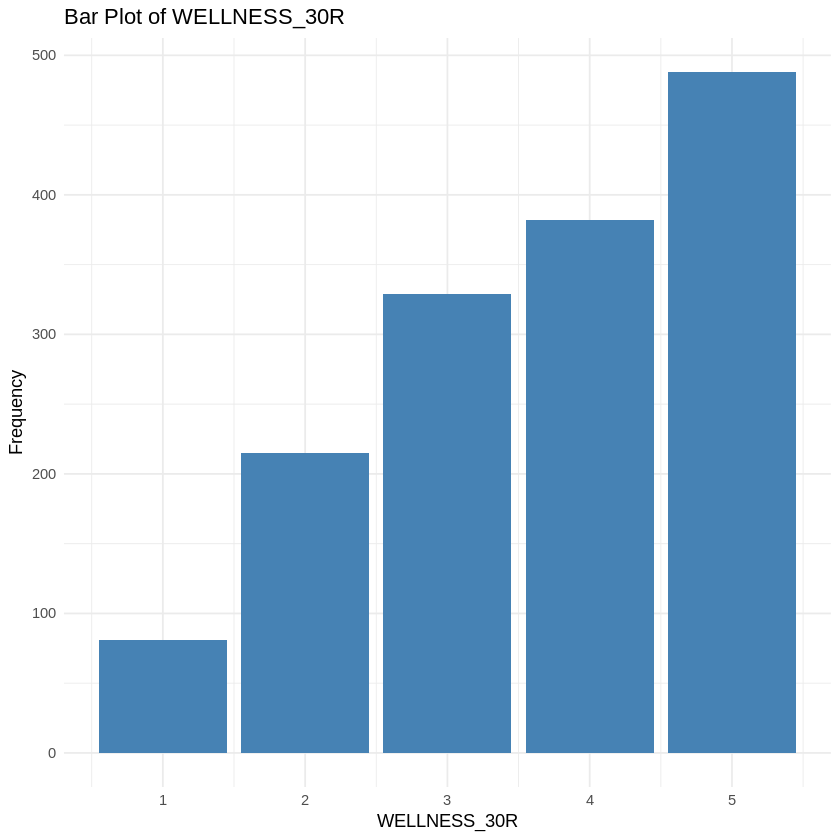

In [ ]:
# prompt: Bar plot of WELLNESS_*

# Assuming 'MilitaryDF' is your dataframe and you want a bar plot of all variables starting with 'WELLNESS_'
library(ggplot2)

# Get a list of wellness variables
wellness_vars <- names(MilitaryDF)[grep("^WELLNESS_", names(MilitaryDF))]

# Loop through each variable and create a plot
for (var in wellness_vars) {
  # Create bar plot
  p <- ggplot(MilitaryDF, aes_string(x = var)) +
    geom_bar(fill = "steelblue") +
    labs(title = paste("Bar Plot of", var),
         x = var,
         y = "Frequency") +
    theme_minimal()
  print(p) # Display the plot
}

In [ ]:
# Select the columns to be summed
wellness_cols <- c("WELLNESS_1", "WELLNESS_2R", "WELLNESS_3", "WELLNESS_4", "WELLNESS_5",
                   "WELLNESS_6R", "WELLNESS_7", "WELLNESS_8R", "WELLNESS_9R", "WELLNESS_10R",
                   "WELLNESS_11", "WELLNESS_12R", "WELLNESS_13", "WELLNESS_14R", "WELLNESS_15",
                   "WELLNESS_16", "WELLNESS_17R", "WELLNESS_18", "WELLNESS_19", "WELLNESS_20",
                   "WELLNESS_21R", "WELLNESS_22", "WELLNESS_23R", "WELLNESS_24R", "WELLNESS_25",
                   "WELLNESS_26R", "WELLNESS_27", "WELLNESS_28", "WELLNESS_29", "WELLNESS_30R")

# Calculate the row sums and create the new variable WELL_MAG
MilitaryDF$WELL_MAG <- rowSums(MilitaryDF[, wellness_cols], na.rm = TRUE)

In [ ]:
MilitaryDF$WELL_MEAN <- mean(MilitaryDF$WELL_MAG, na.rm = TRUE)

In [ ]:
MilitaryDF$WELL_SD <- sd(MilitaryDF$WELL_MAG, na.rm = TRUE)

In [ ]:
MilitaryDF$WELL_VAR <- MilitaryDF$WELL_SD / 5

In [ ]:
MilitaryDF$WELL_BAL <- sqrt(MilitaryDF$WELL_SD) + 1.25

In [ ]:
MilitaryDF$WELL_COMP <- MilitaryDF$WELL_MAG / MilitaryDF$WELL_BAL

In [ ]:
# prompt: load package psych

library(psych)


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  6.975  16.392  19.008  19.038  21.624  26.158 

[1] 3.506883

[1] 19.0384

,vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X1,1,1495,19.0384,3.506883,19.00808,19.07174,3.878171,6.975441,26.1579,19.18246,-0.1391522,-0.4678047,0.09069862


25%      50%      75% 
16.39229 19.00808 21.62387

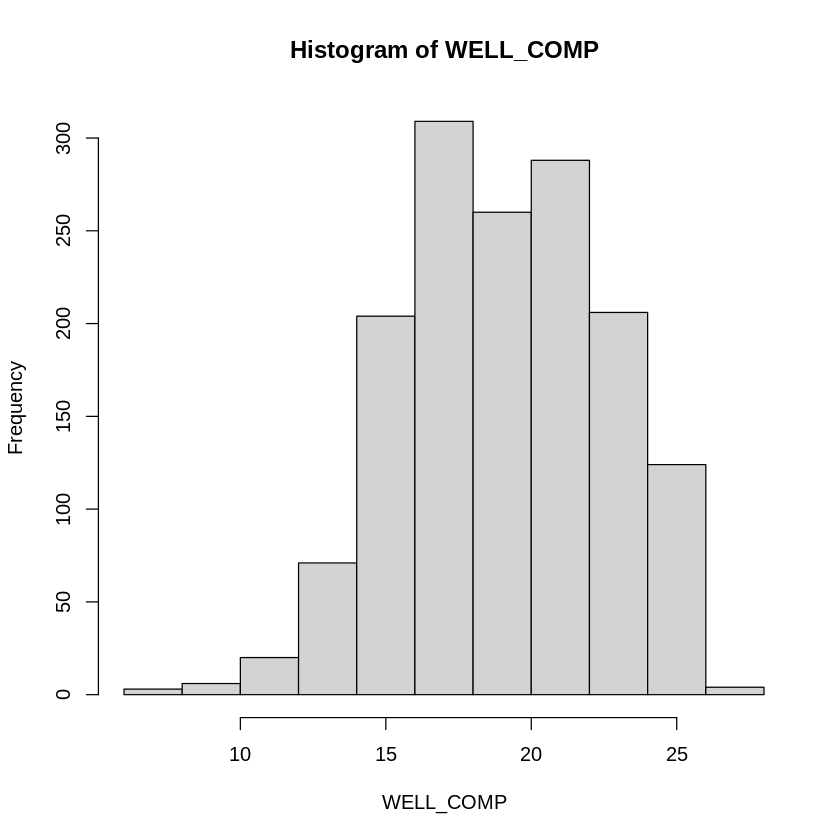

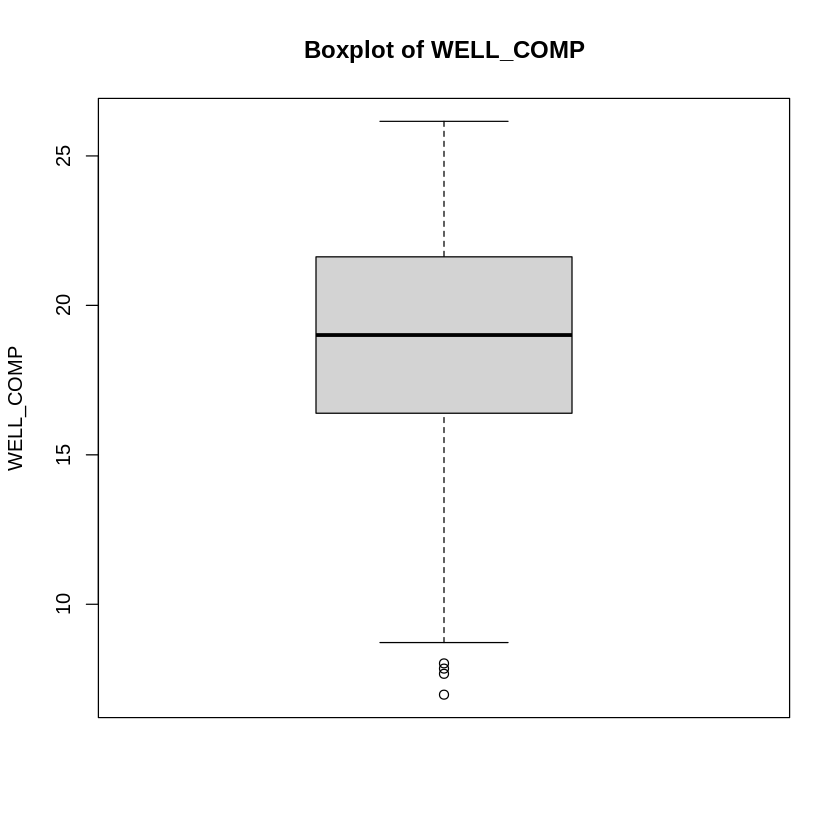

In [ ]:
# Descriptive Statistics
summary(MilitaryDF$WELL_COMP)
sd(MilitaryDF$WELL_COMP, na.rm = TRUE)
mean(MilitaryDF$WELL_COMP, na.rm = TRUE)

# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}
describe(MilitaryDF$WELL_COMP) #using psych package

# You can also add other descriptive stats here as per your requirement
# For example: quantiles, skewness, kurtosis, etc.
# Example:
quantile(MilitaryDF$WELL_COMP, probs = c(0.25, 0.5, 0.75), na.rm = TRUE)
#For more details about describe() function, see ?describe


# Histogram
hist(MilitaryDF$WELL_COMP, main = "Histogram of WELL_COMP", xlab = "WELL_COMP", ylab = "Frequency")

# Boxplot
boxplot(MilitaryDF$WELL_COMP, main = "Boxplot of WELL_COMP", ylab = "WELL_COMP")

In [ ]:
MilitaryDF$Wellness <- MilitaryDF$WELL_COMP

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  6.975  16.392  19.008  19.038  21.624  26.158 

[1] 3.506883

[1] 19.0384

,vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X1,1,1495,19.0384,3.506883,19.00808,19.07174,3.878171,6.975441,26.1579,19.18246,-0.1391522,-0.4678047,0.09069862


25%      50%      75% 
16.39229 19.00808 21.62387

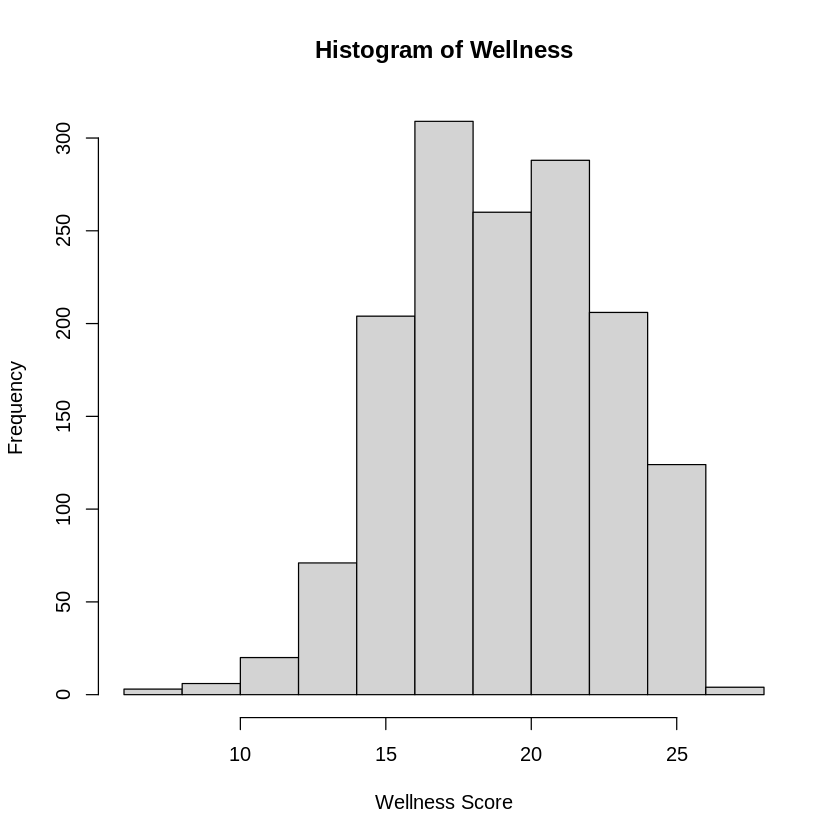

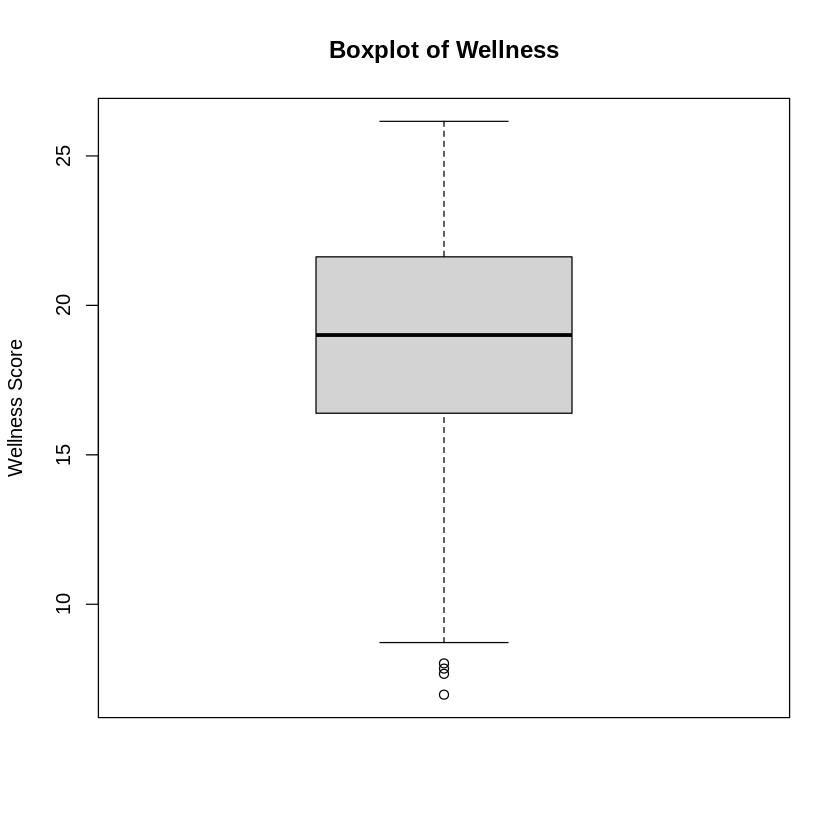

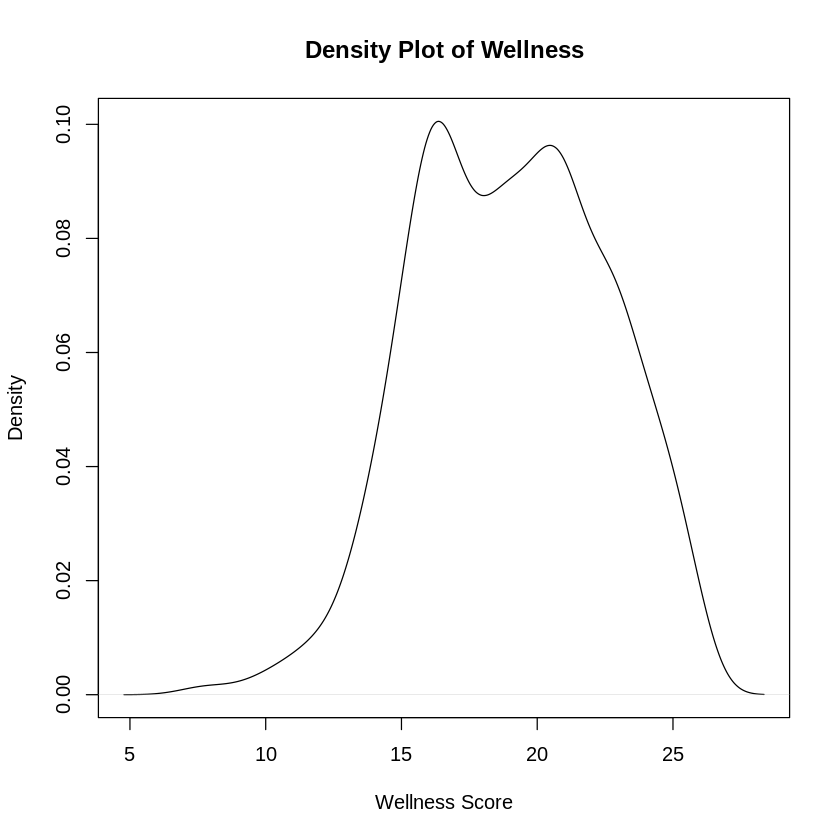

In [ ]:
# Descriptive Statistics
summary(MilitaryDF$Wellness)
sd(MilitaryDF$Wellness, na.rm = TRUE)
mean(MilitaryDF$Wellness, na.rm = TRUE)

# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}
describe(MilitaryDF$Wellness) #using psych package

# You can also add other descriptive stats here as per your requirement
# For example: quantiles, skewness, kurtosis, etc.
# Example:
quantile(MilitaryDF$Wellness, probs = c(0.25, 0.5, 0.75), na.rm = TRUE)
#For more details about describe() function, see ?describe


# Histogram
hist(MilitaryDF$Wellness, main = "Histogram of Wellness", xlab = "Wellness Score", ylab = "Frequency")

# Boxplot
boxplot(MilitaryDF$Wellness, main = "Boxplot of Wellness", ylab = "Wellness Score")

# Density Plot (Optional)
plot(density(MilitaryDF$Wellness, na.rm = TRUE), main = "Density Plot of Wellness", xlab = "Wellness Score")

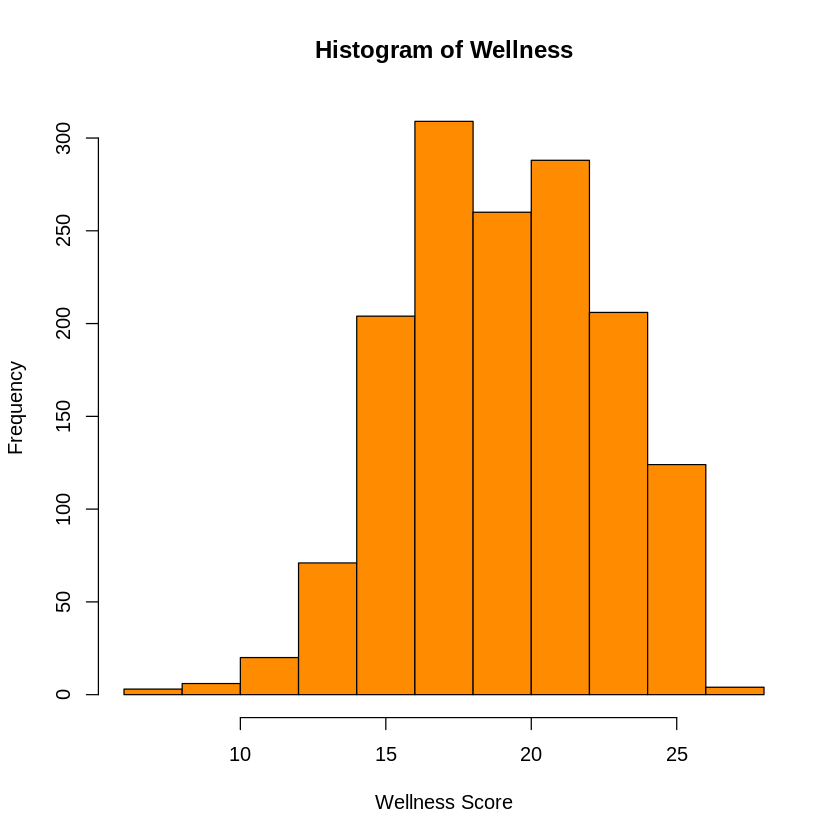

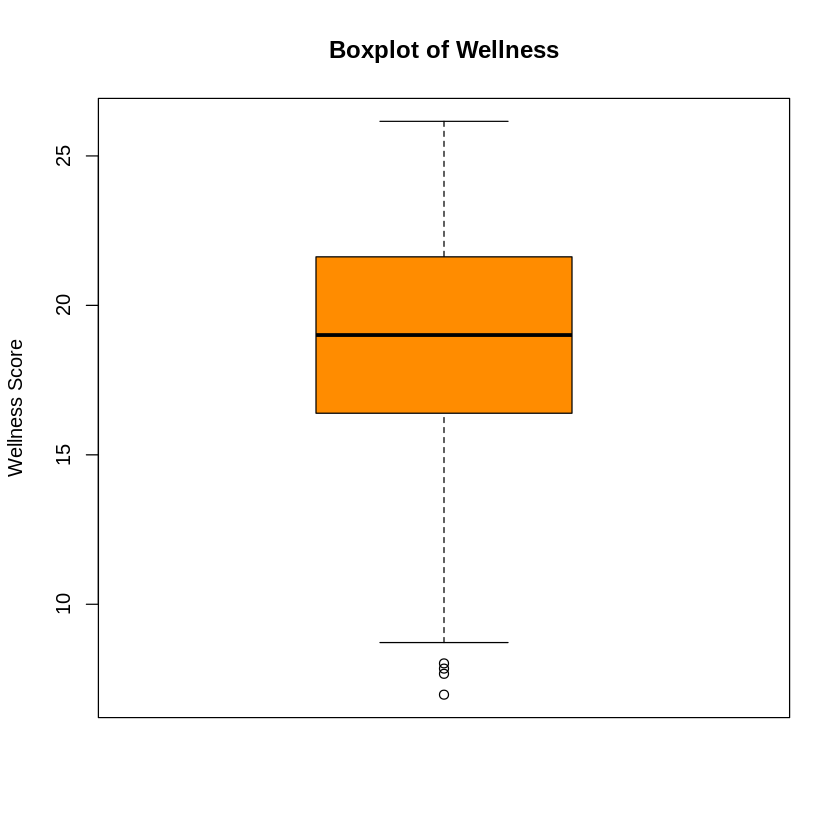

In [ ]:
# prompt: for the histogram and box plot for variable "Wellness" change color to darkorange

# Histogram
hist(MilitaryDF$Wellness, main = "Histogram of Wellness", xlab = "Wellness Score", ylab = "Frequency", col = "darkorange")

# Boxplot
boxplot(MilitaryDF$Wellness, main = "Boxplot of Wellness", ylab = "Wellness Score", col = "darkorange")

[1] "Descriptive Statistics for CES_1"
   vars    n mean   sd median trimmed mad min max range skew kurtosis   se
X1    1 1495 2.02 1.27      1    1.82   0   1   5     4 1.02    -0.15 0.03


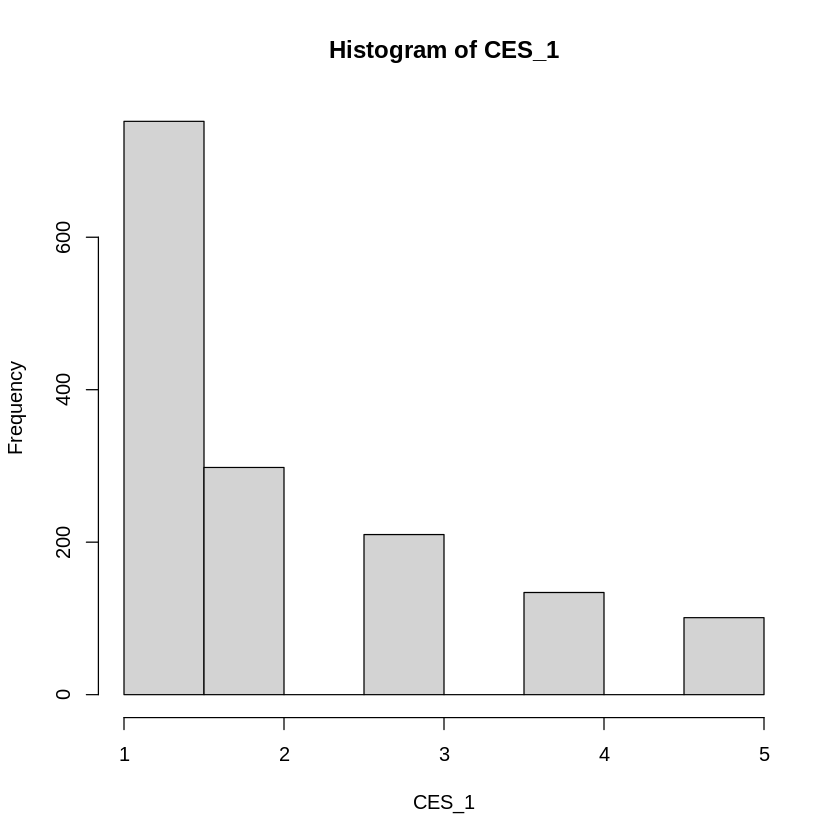

[1] "Descriptive Statistics for CES_2"
   vars    n mean   sd median trimmed mad min max range skew kurtosis   se
X1    1 1495 1.78 1.27      1    1.51   0   1   5     4 1.49     0.93 0.03


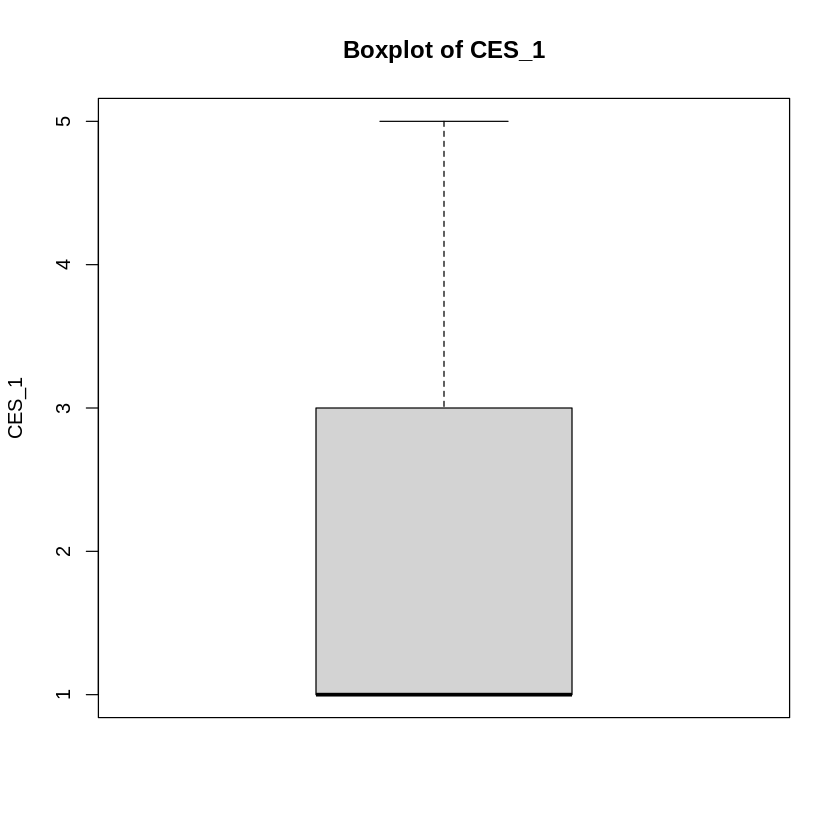

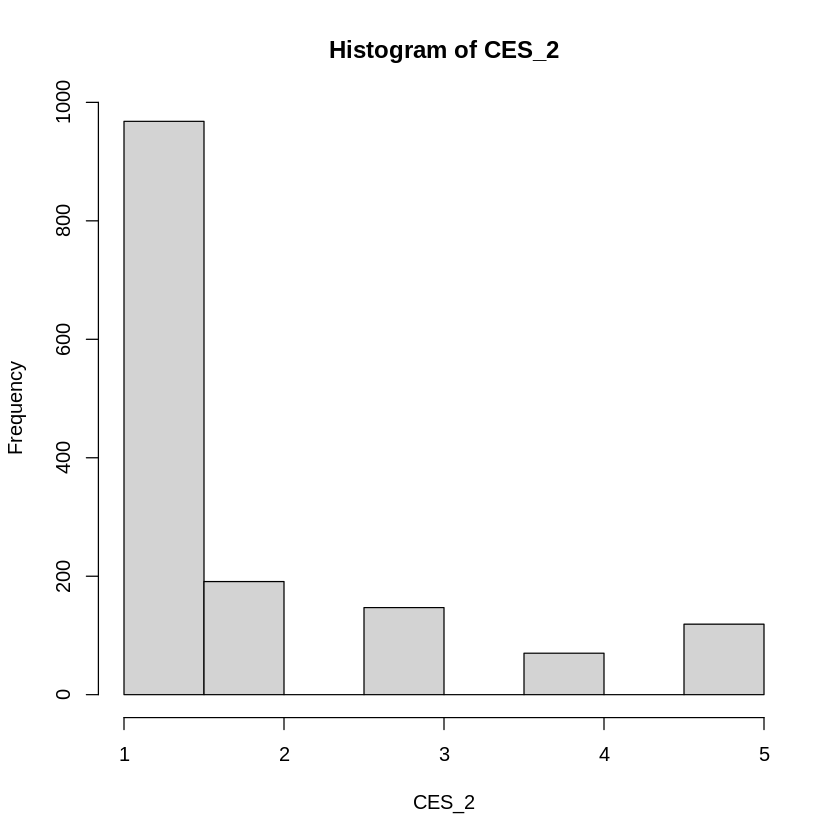

[1] "Descriptive Statistics for CES_3"
   vars    n mean   sd median trimmed mad min max range skew kurtosis   se
X1    1 1495 1.37 0.83      1    1.14   0   1   5     4 2.56     6.38 0.02


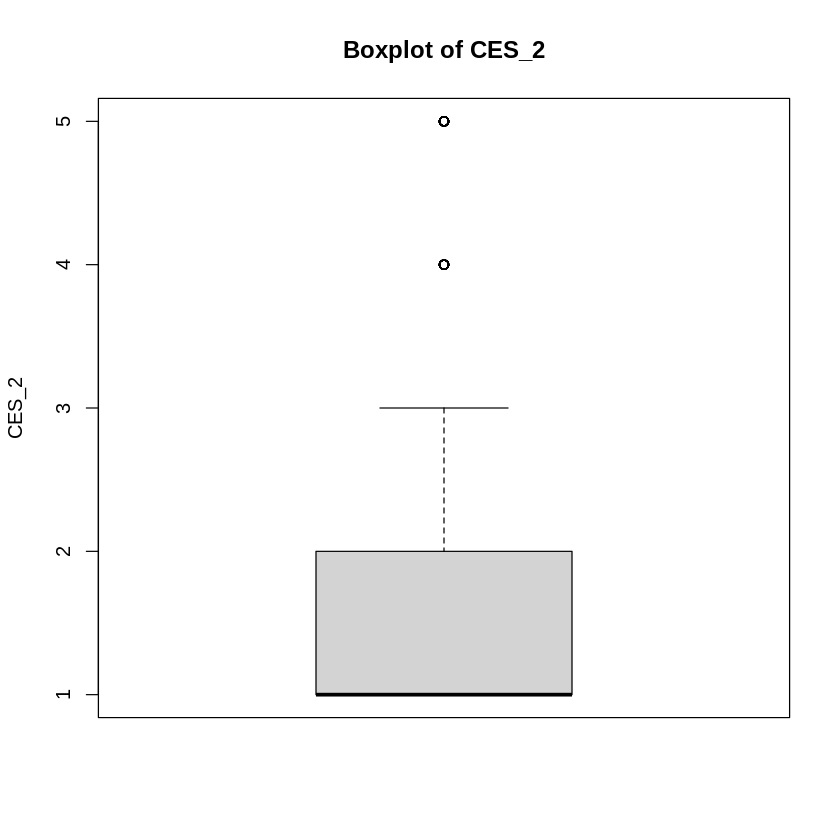

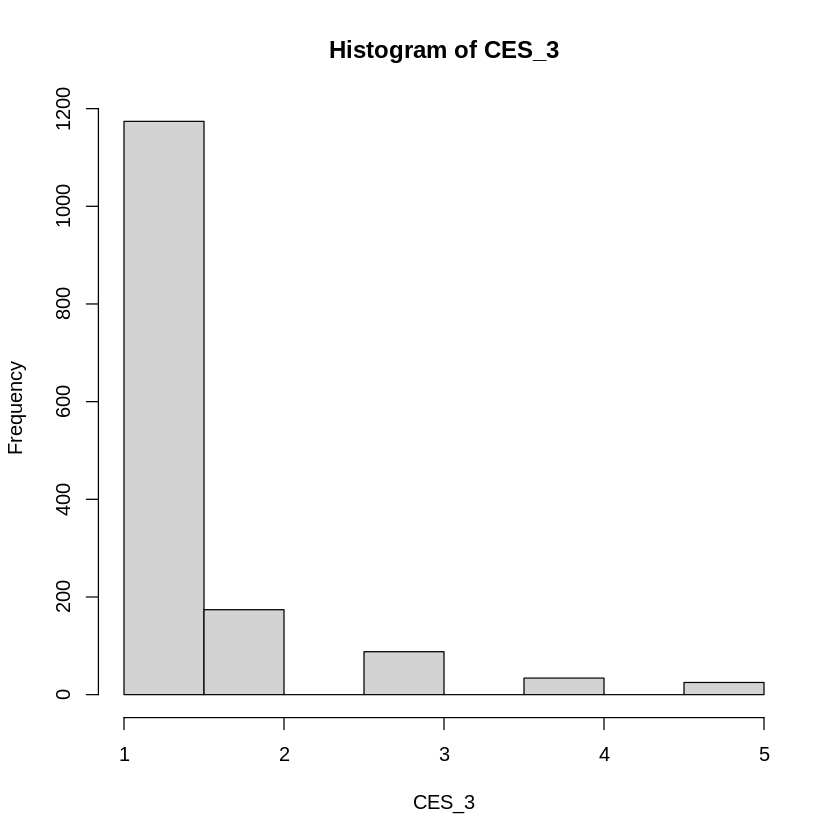

[1] "Descriptive Statistics for CES_4"
   vars    n mean   sd median trimmed mad min max range skew kurtosis   se
X1    1 1495 1.42 0.68      1    1.29   0   1   5     4 1.85     4.11 0.02


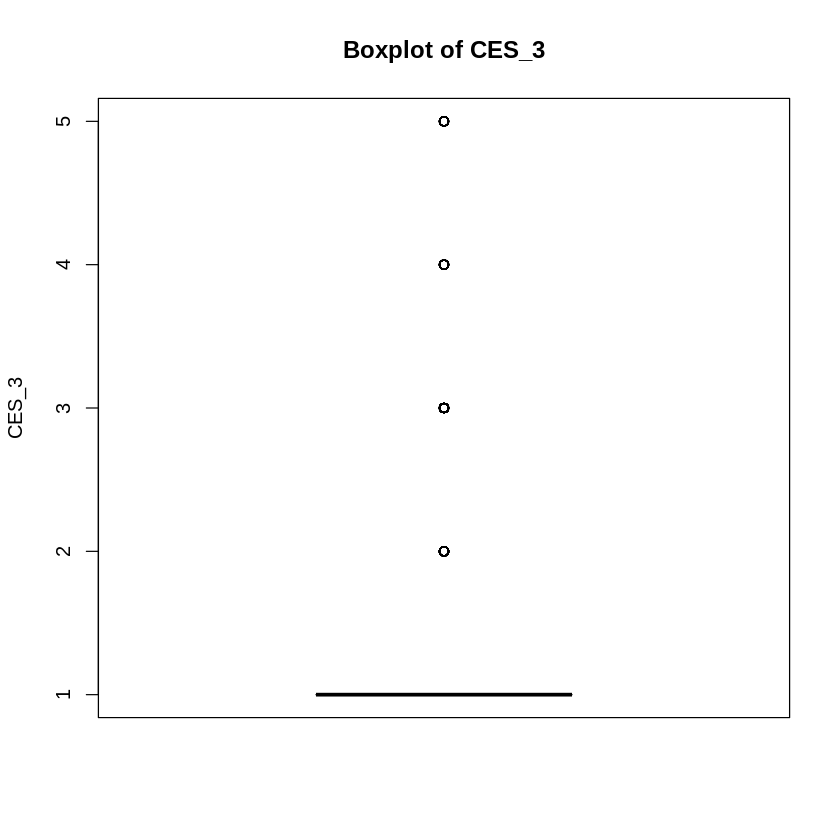

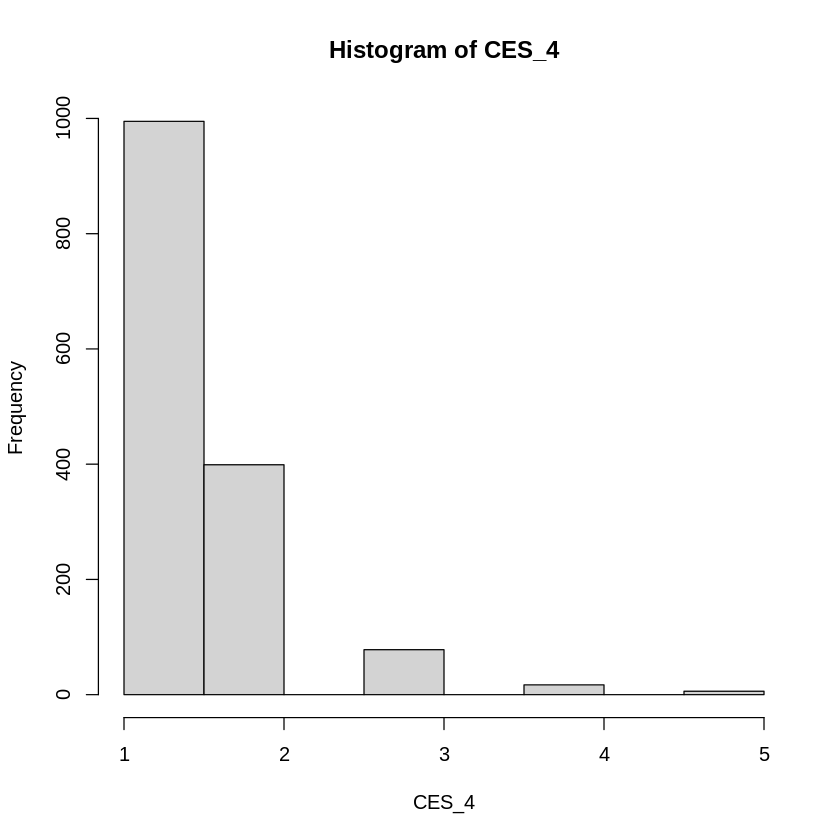

[1] "Descriptive Statistics for CES_5"
   vars    n mean   sd median trimmed mad min max range skew kurtosis   se
X1    1 1495  1.7 1.21      1    1.43   0   1   5     4 1.56     1.16 0.03


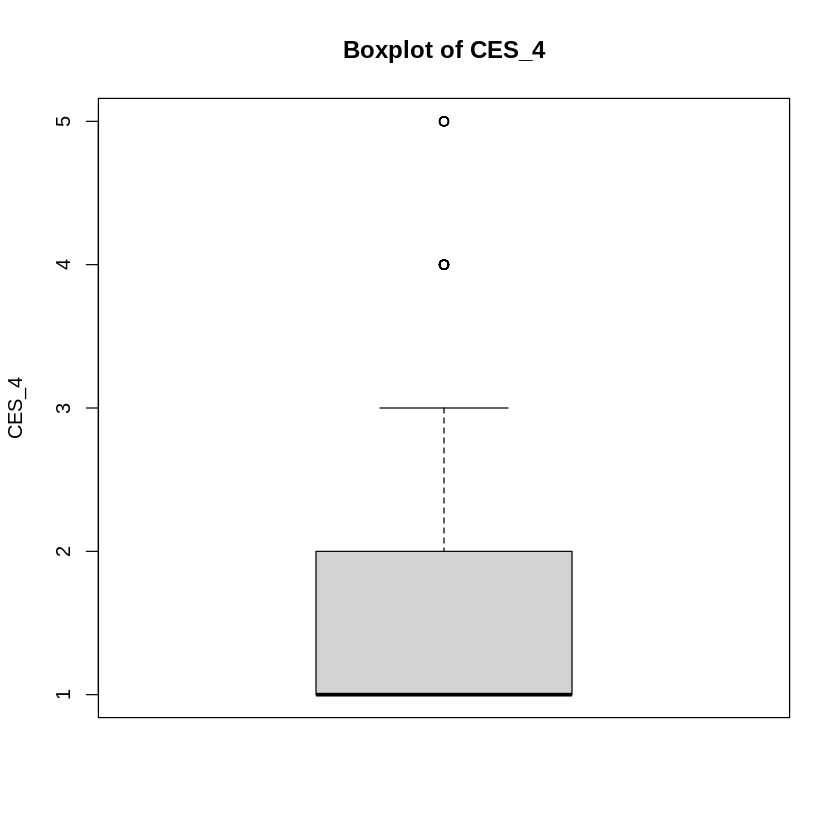

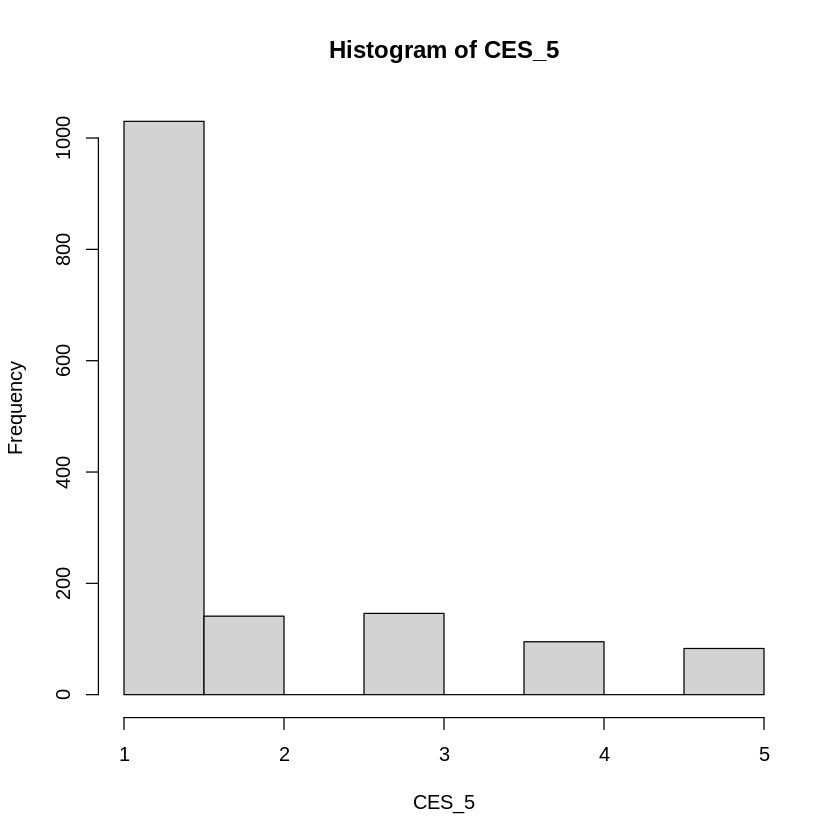

[1] "Descriptive Statistics for CES_6"
   vars    n mean   sd median trimmed mad min max range skew kurtosis   se
X1    1 1495 1.55 0.98      1    1.33   0   1   5     4 1.71     1.95 0.03


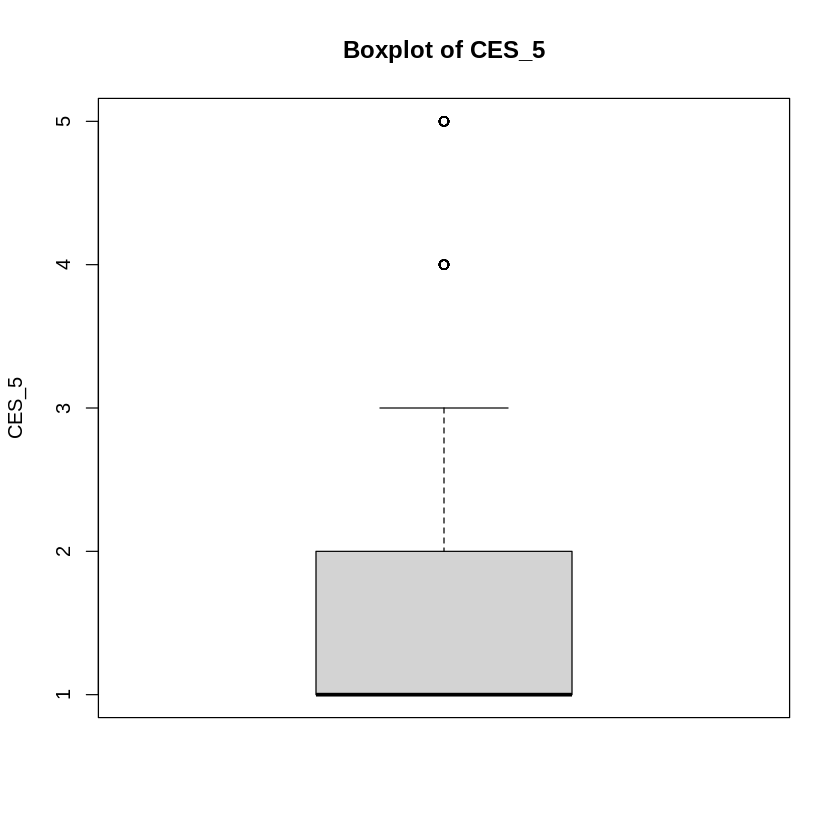

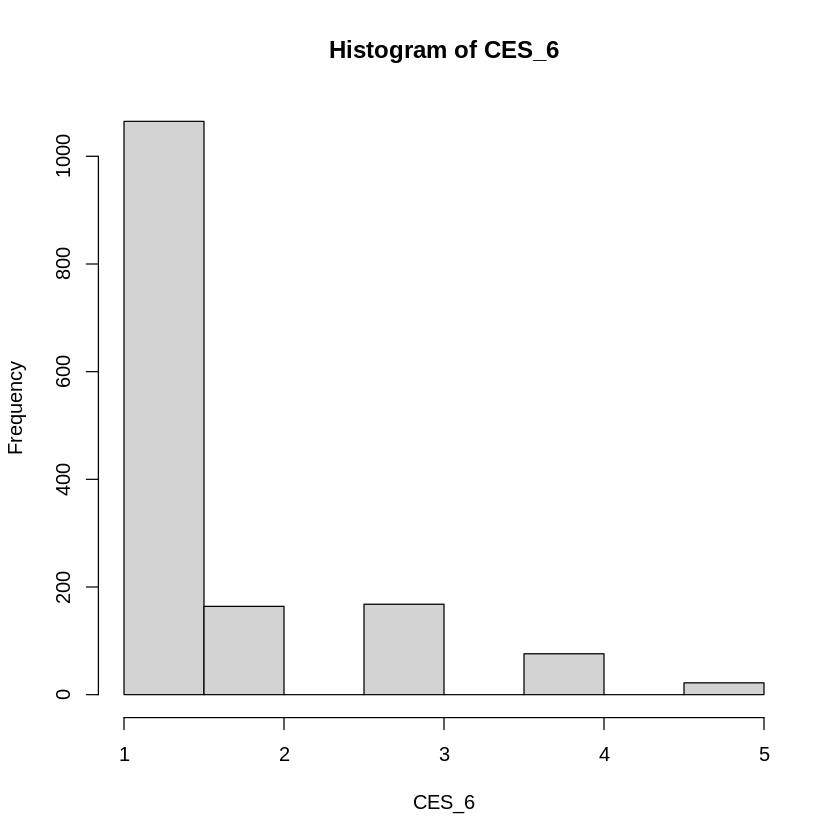

[1] "Descriptive Statistics for CES_7"
   vars    n mean  sd median trimmed mad min max range skew kurtosis   se
X1    1 1495 1.74 1.1      1    1.52   0   1   5     4 1.44      1.2 0.03


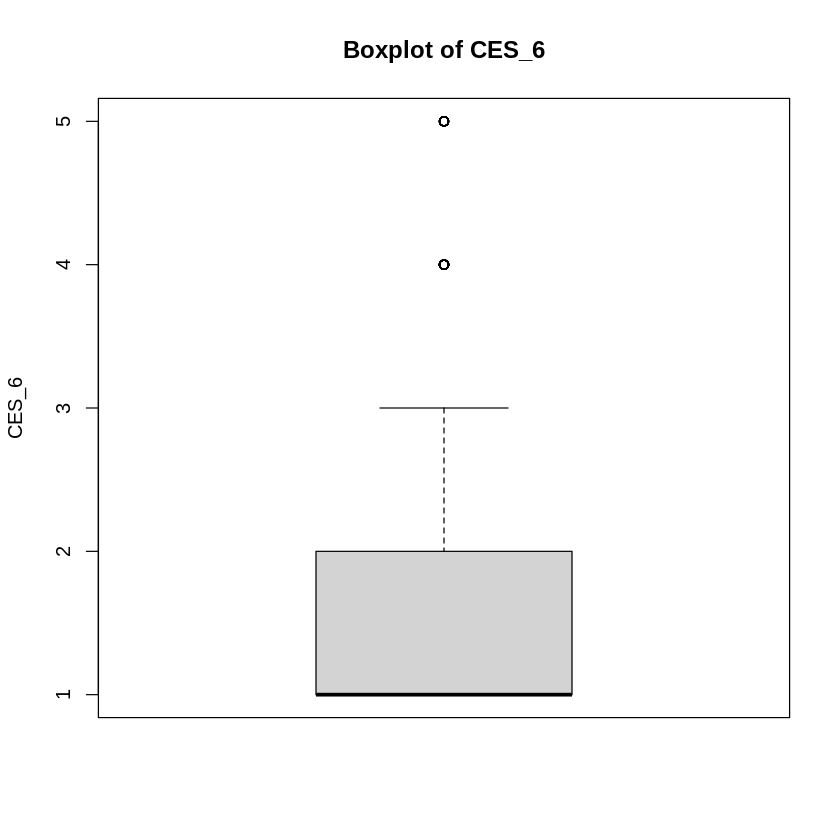

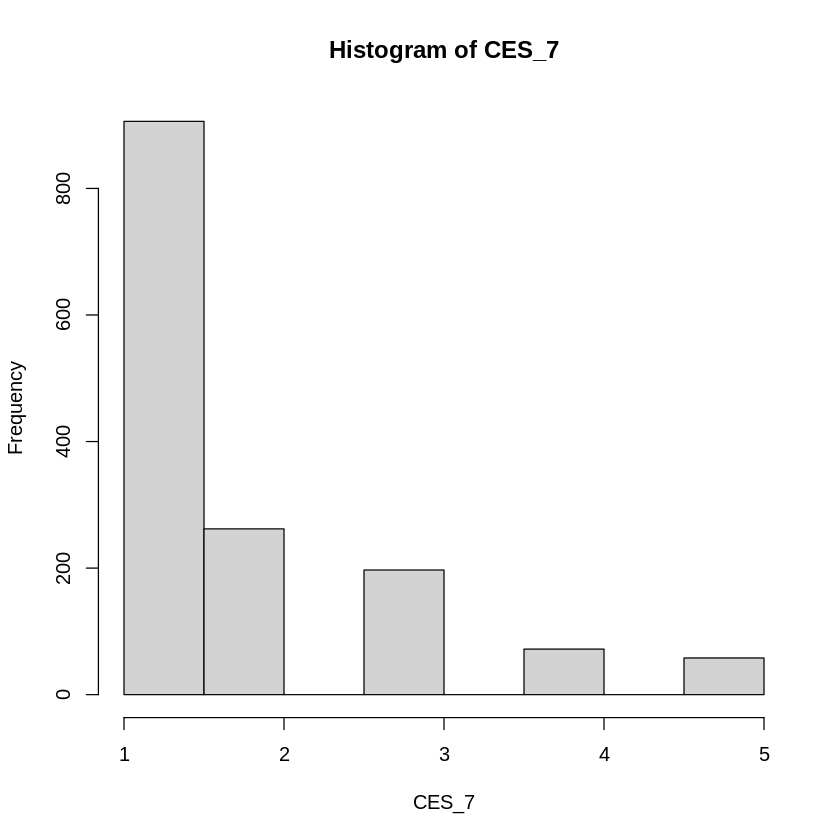

[1] "Descriptive Statistics for CES_1C"
   vars    n mean   sd median trimmed mad min max range skew kurtosis   se
X1    1 1495 2.04 2.54      0    1.63   0   0   8     8 1.02    -0.15 0.07


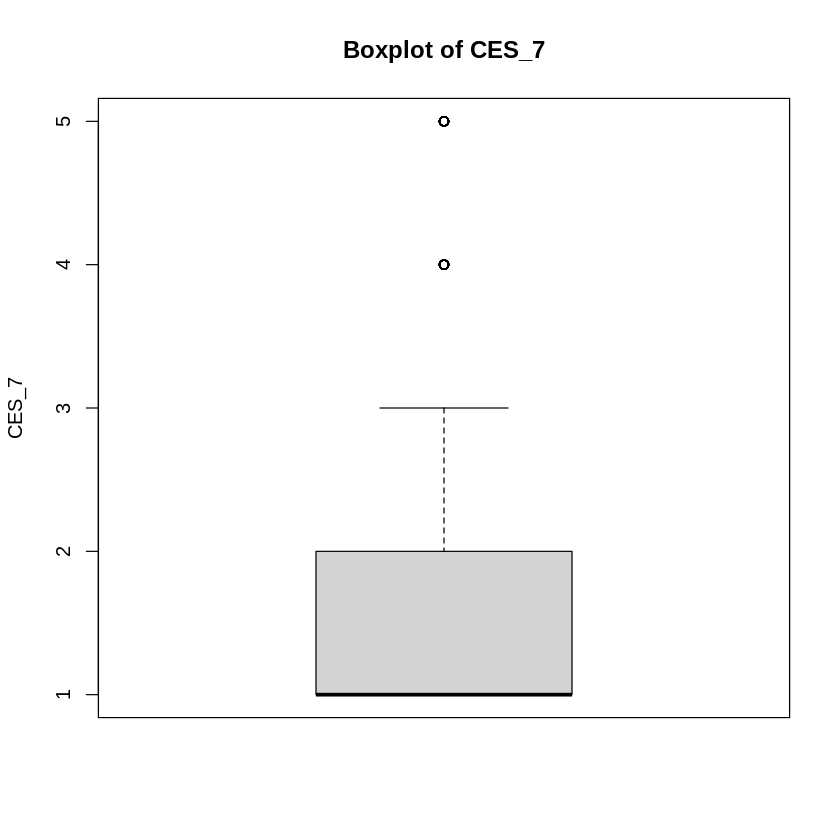

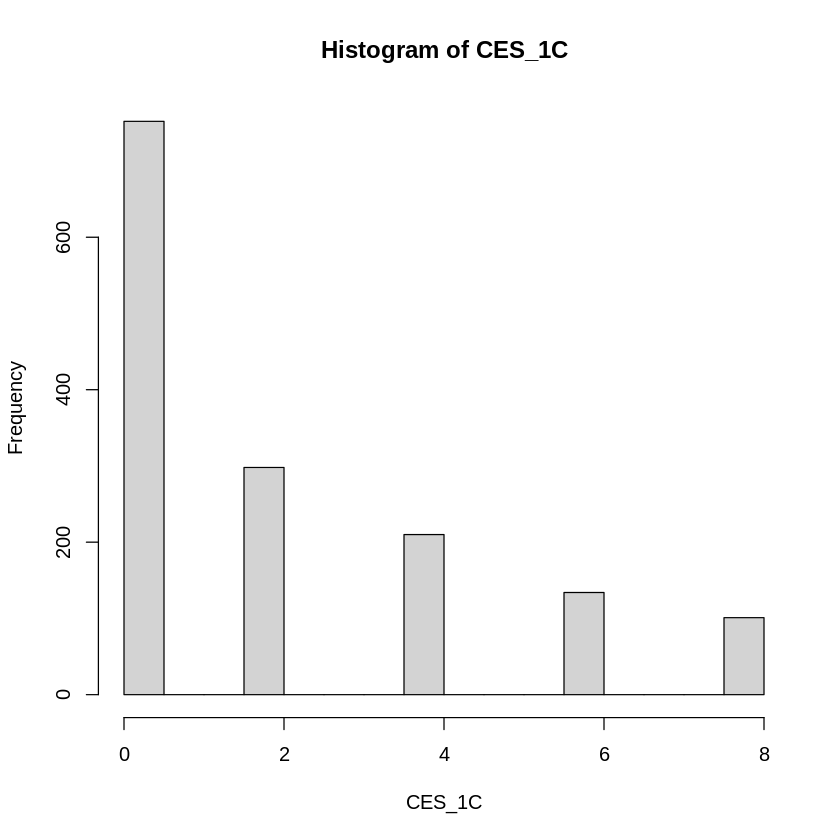

[1] "Descriptive Statistics for CES_2C"
   vars    n mean   sd median trimmed mad min max range skew kurtosis   se
X1    1 1495 0.78 1.27      0    0.51   0   0   4     4 1.49     0.93 0.03


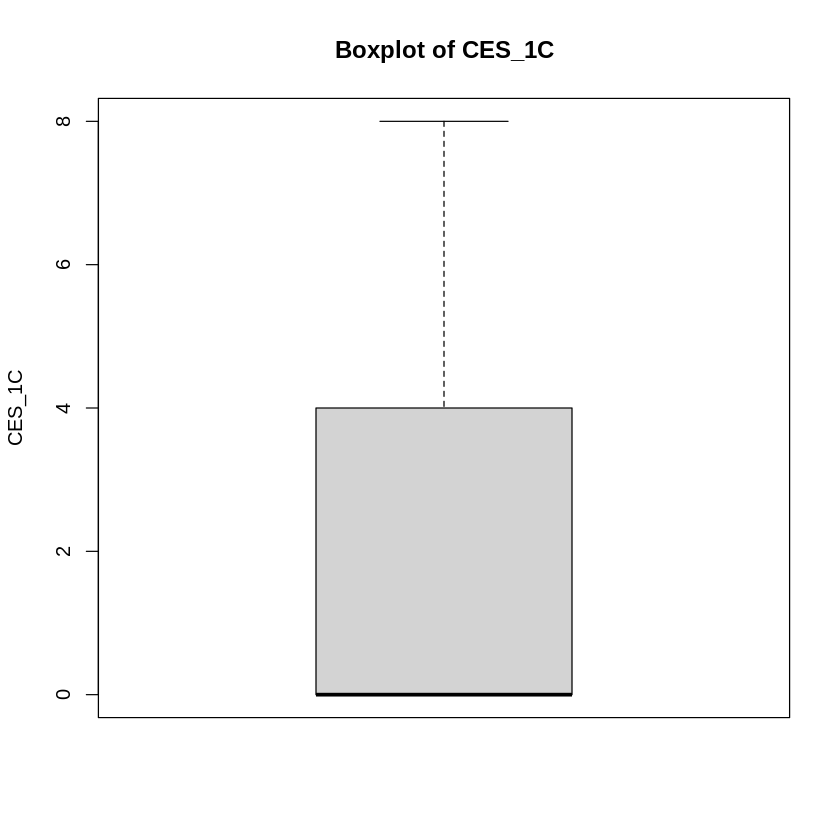

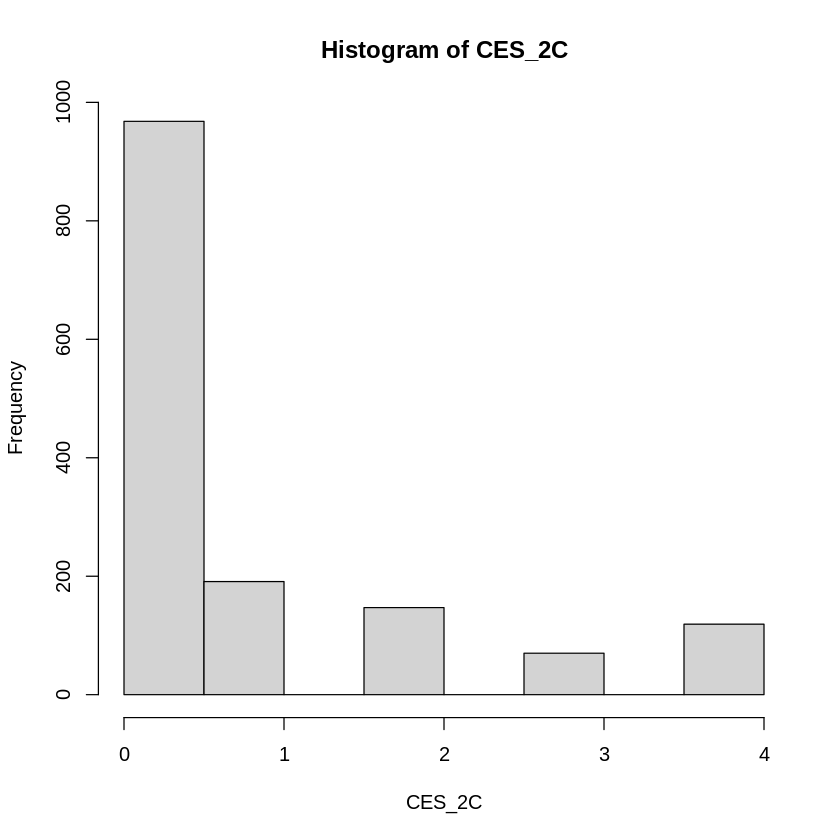

[1] "Descriptive Statistics for CES_3C"
   vars    n mean   sd median trimmed mad min max range skew kurtosis   se
X1    1 1495 0.71 1.53      0    0.29   0   0   6     6 2.23     4.07 0.04


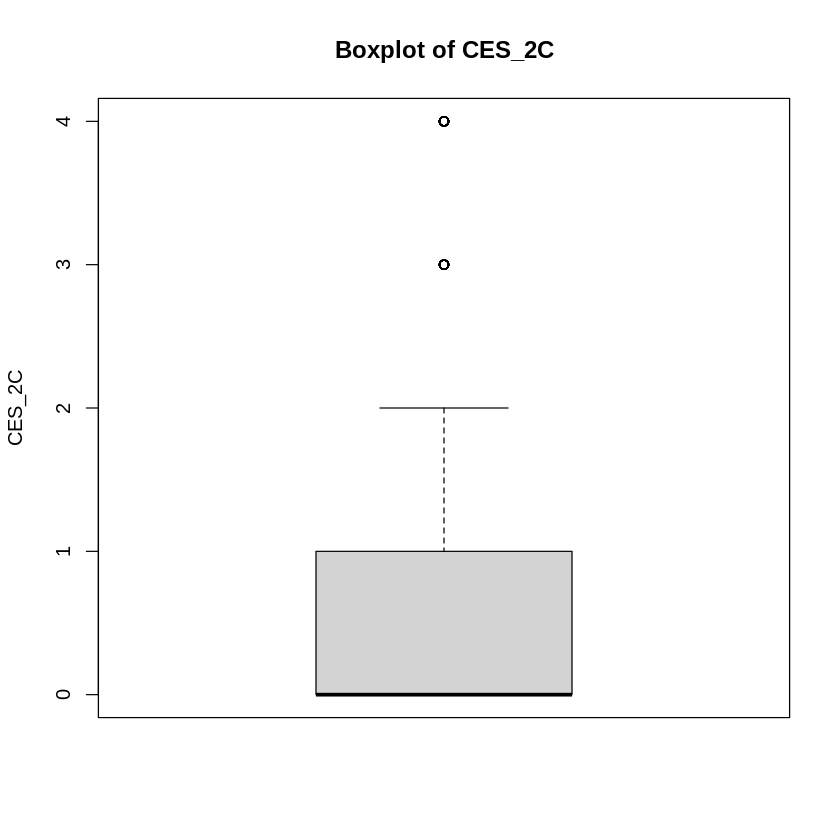

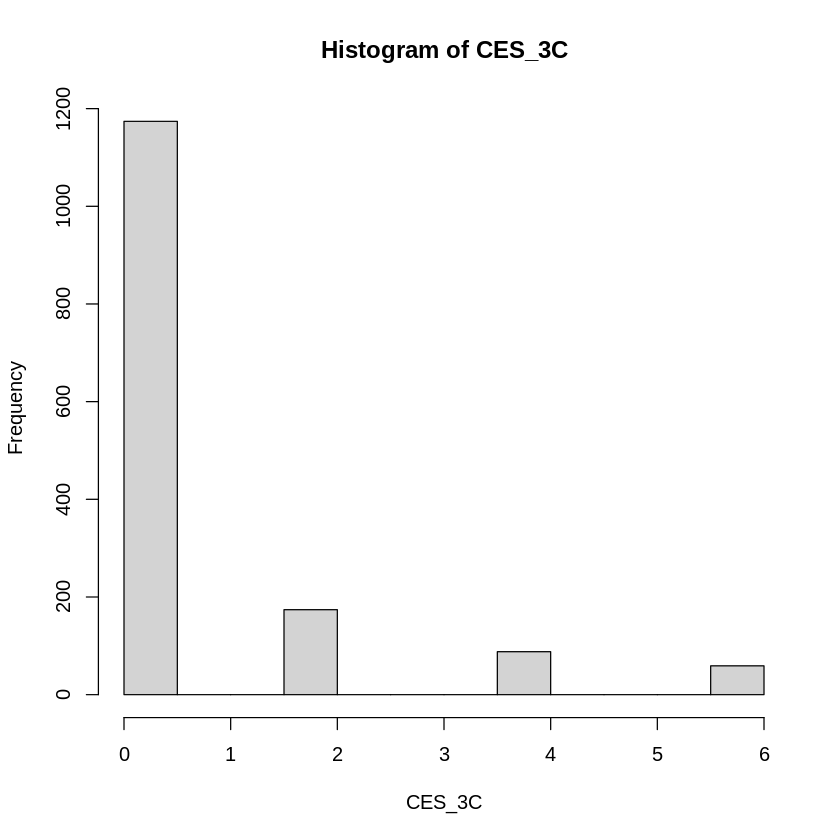

[1] "Descriptive Statistics for CES_4C"
   vars    n mean   sd median trimmed mad min max range skew kurtosis   se
X1    1 1495 0.42 0.66      0    0.29   0   0   3     3 1.63     2.49 0.02


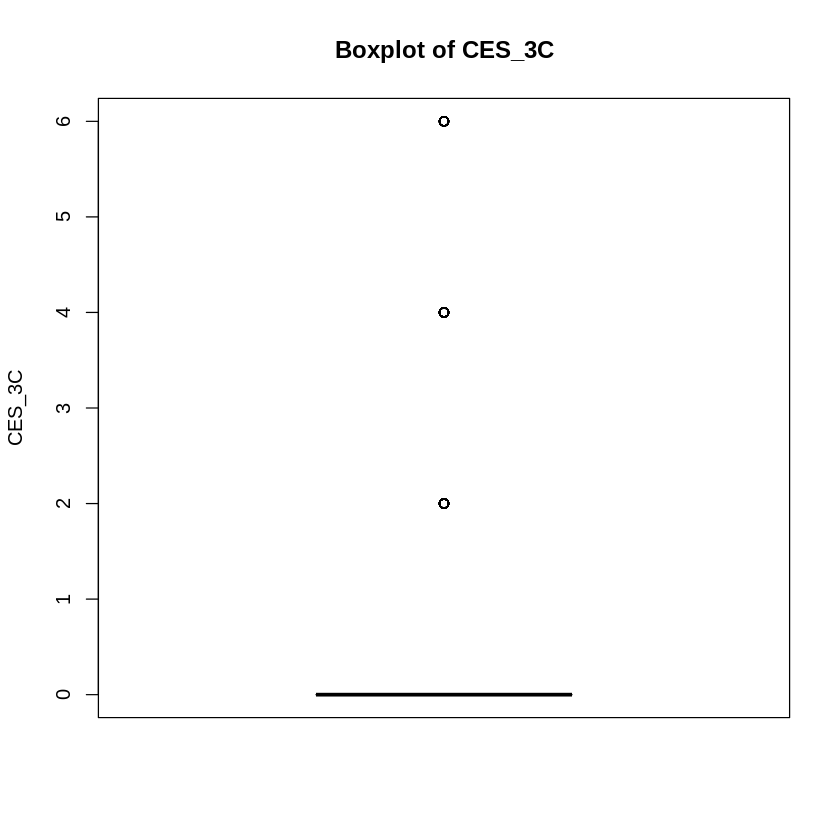

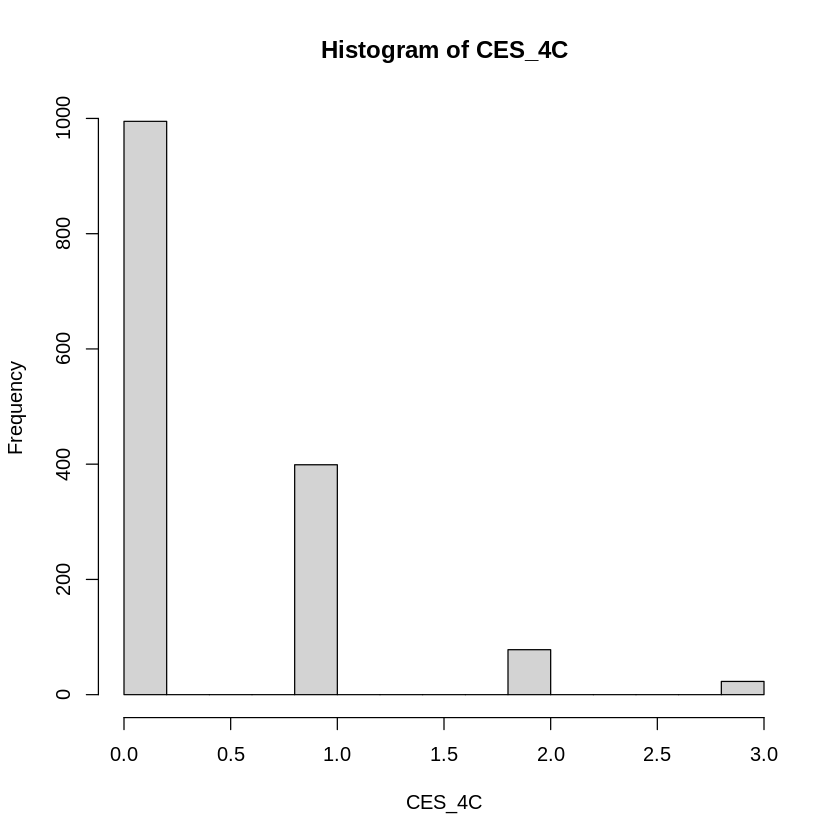

[1] "Descriptive Statistics for CES_5C"
   vars    n mean   sd median trimmed mad min max range skew kurtosis   se
X1    1 1495  0.7 1.21      0    0.43   0   0   4     4 1.56     1.16 0.03


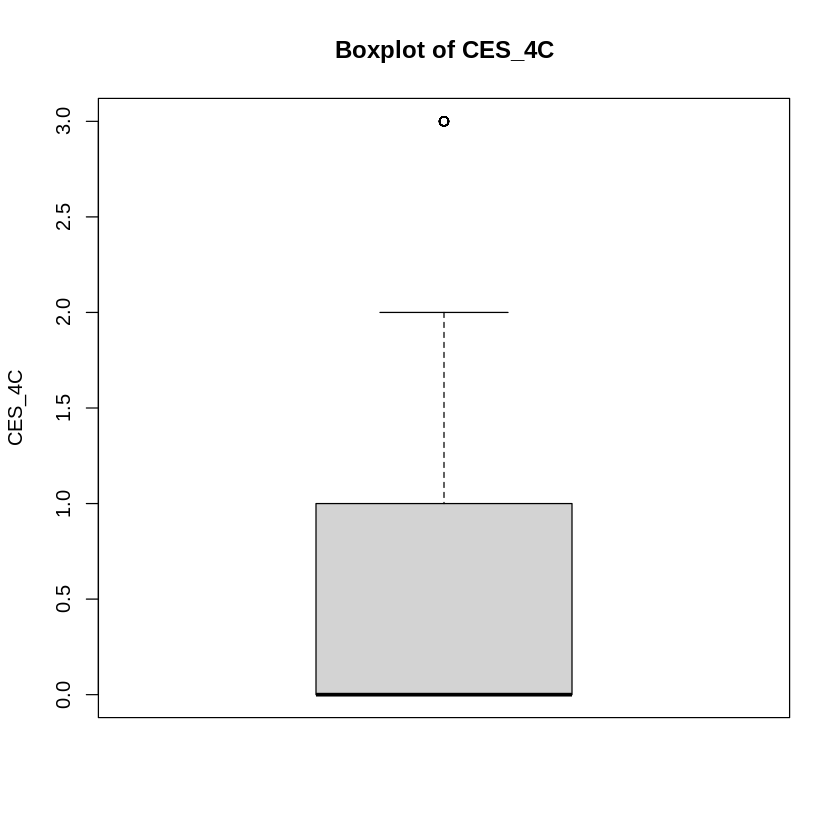

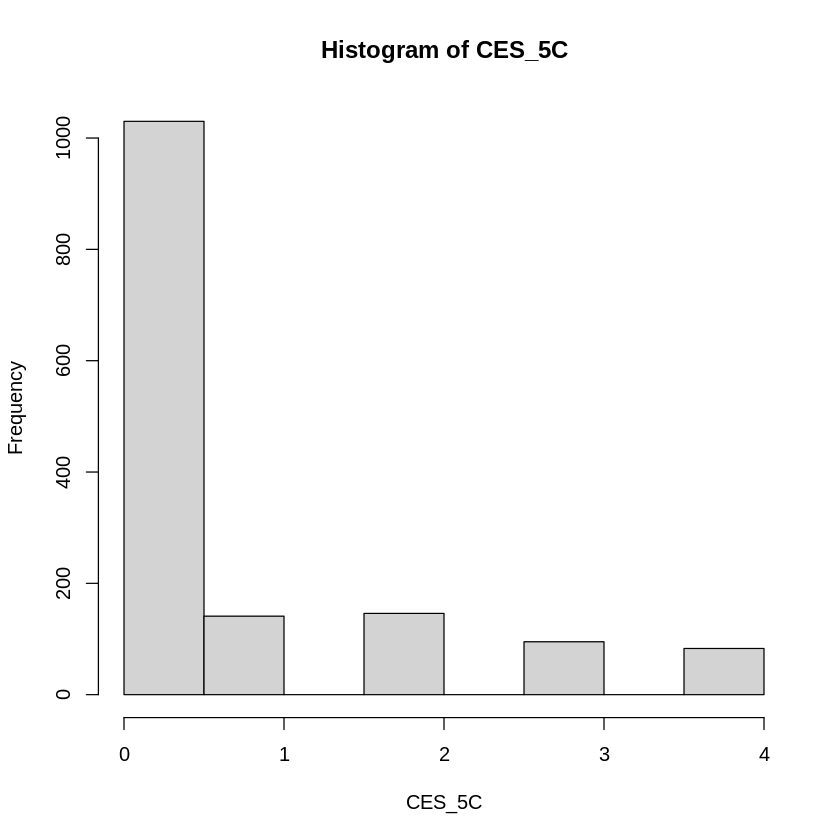

[1] "Descriptive Statistics for CES_6C"
   vars    n mean   sd median trimmed mad min max range skew kurtosis   se
X1    1 1495 1.09 1.95      0    0.66   0   0   8     8 1.71     1.95 0.05


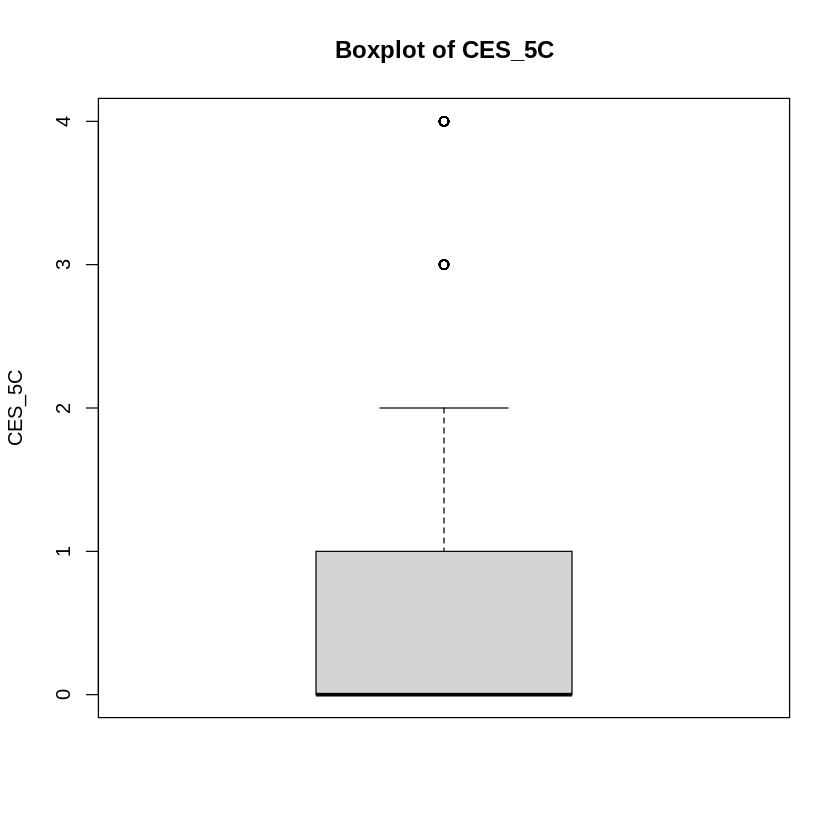

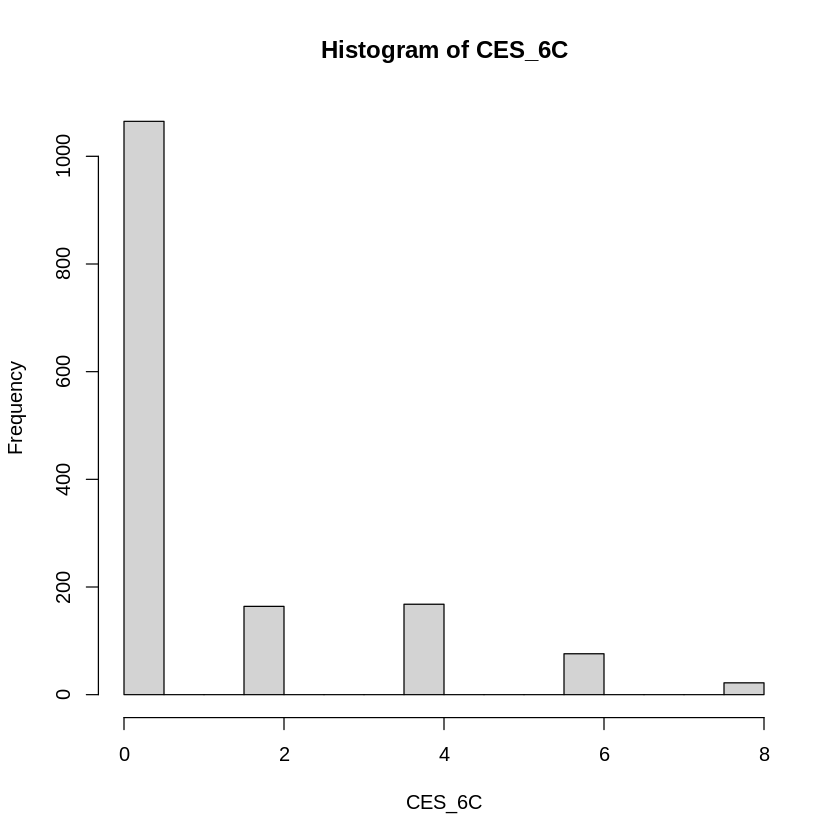

[1] "Descriptive Statistics for CES_7C"
   vars    n mean  sd median trimmed mad min max range skew kurtosis   se
X1    1 1495 1.48 2.2      0    1.03   0   0   8     8 1.44      1.2 0.06


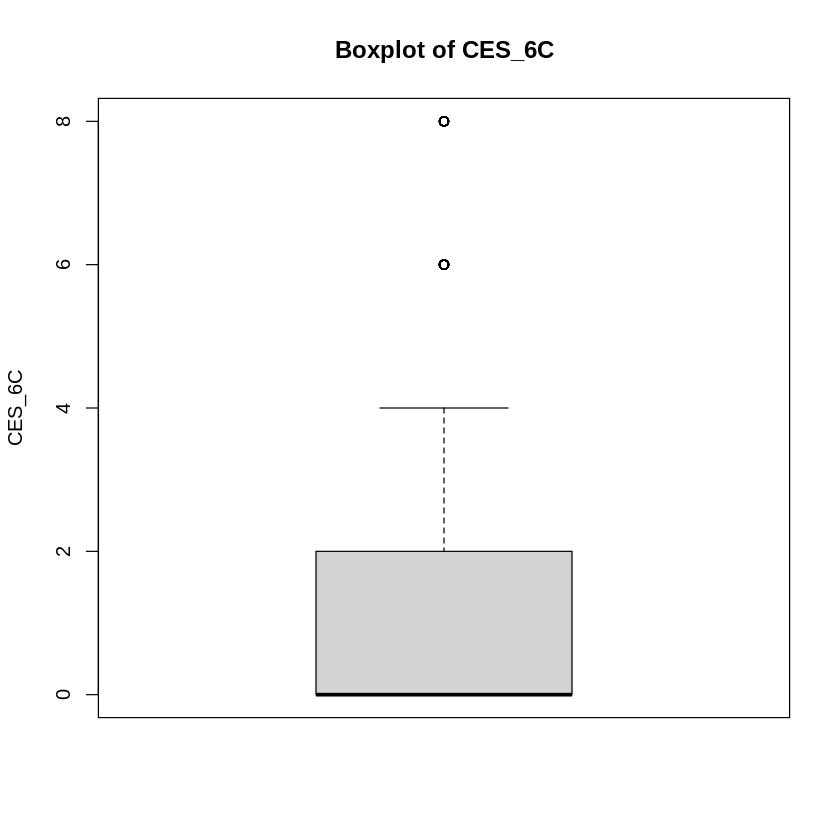

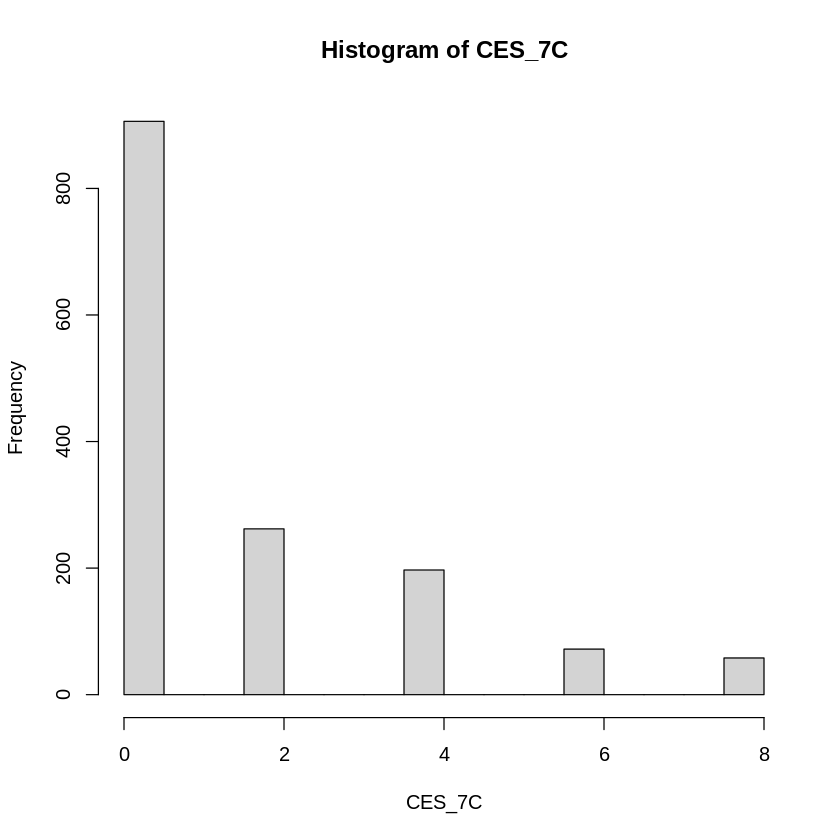

[1] "Descriptive Statistics for CES_TOTAL"
   vars    n mean   sd median trimmed mad min max range skew kurtosis   se
X1    1 1495  1.6 0.99      1     1.4   0   1   5     4  1.6     1.66 0.03


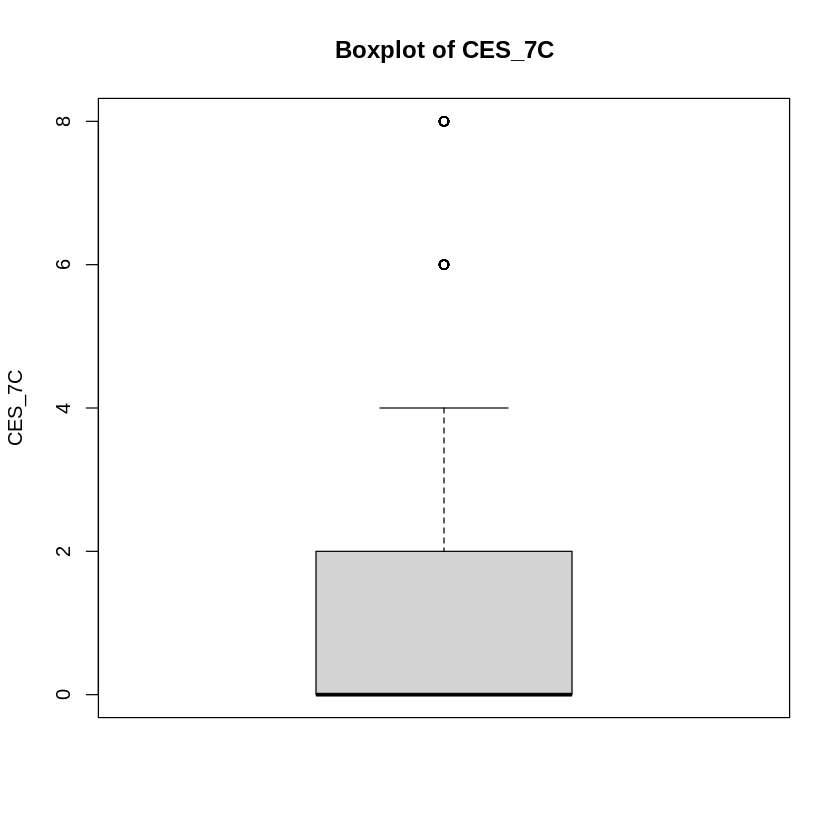

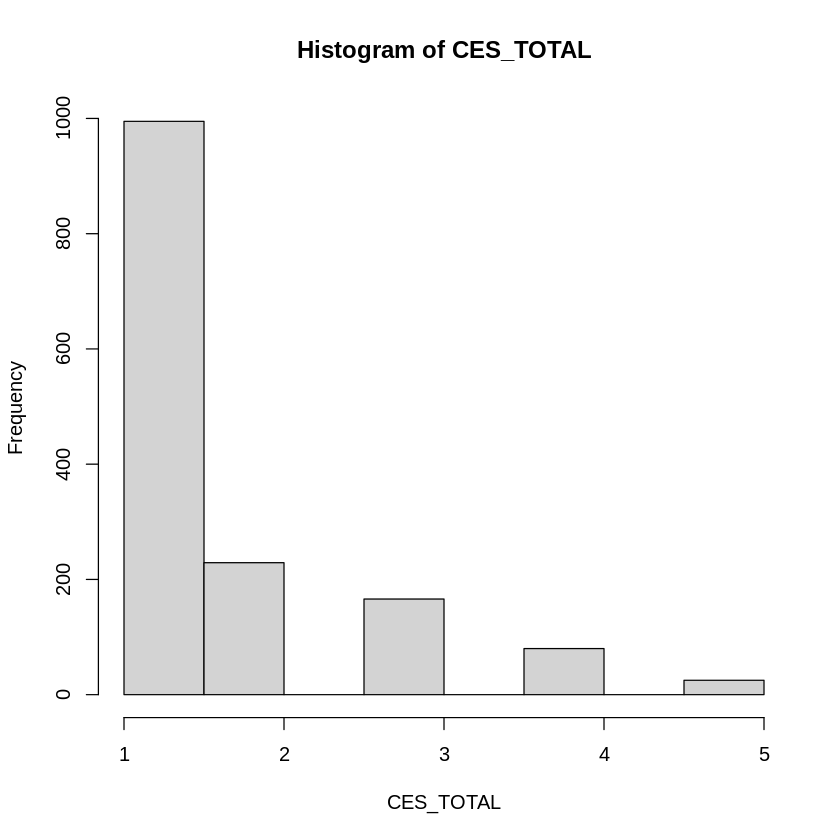

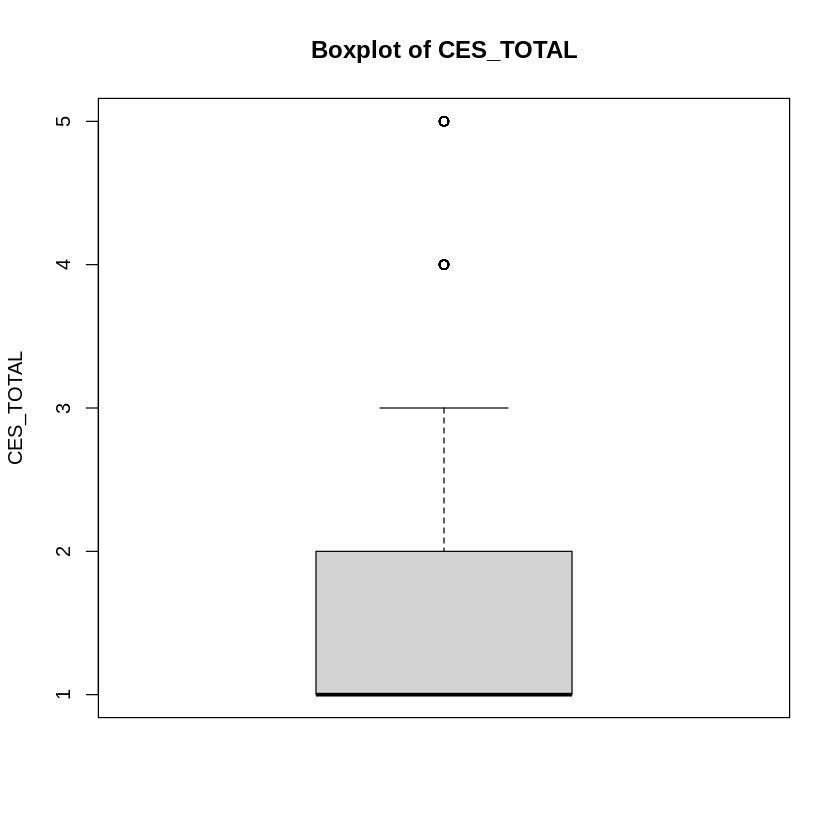

In [ ]:
# Install necessary packages if not already installed
if(!require(dplyr)){install.packages("dplyr")}
if(!require(psych)){install.packages("psych")}

# Select variables starting with "CES_"
ces_vars <- MilitaryDF %>%
  select(starts_with("CES_")) %>%
  names()

# Loop through each variable and print descriptive statistics and create graphs
for (var in ces_vars) {
  print(paste("Descriptive Statistics for", var))
  print(describe(MilitaryDF[[var]])) # Using describe() from psych package

  # Histogram
  hist(MilitaryDF[[var]], main = paste("Histogram of", var), xlab = var, ylab = "Frequency")

  # Boxplot
  boxplot(MilitaryDF[[var]], main = paste("Boxplot of", var), ylab = var)
}

In [ ]:
table(MilitaryDF$Combat_Exposure)

< table of extent 0 >

In [ ]:
# Select the CES variables you want to sum
ces_vars_to_sum <- c("CES_1", "CES_2", "CES_3", "CES_4", "CES_5", "CES_6", "CES_7")

# Calculate the row sums and create the new variable COM_EXP
MilitaryDF$COM_EXP <- rowSums(MilitaryDF[, ces_vars_to_sum], na.rm = TRUE)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   7.00    7.00    8.00   11.58   15.00   35.00 

[1] 6.055312

[1] 11.57993

,vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X1,1,1495,11.57993,6.055312,8,10.48371,1.4826,7,35,28,1.29128,0.7701973,0.1566087


25% 50% 75% 
  7   8  15

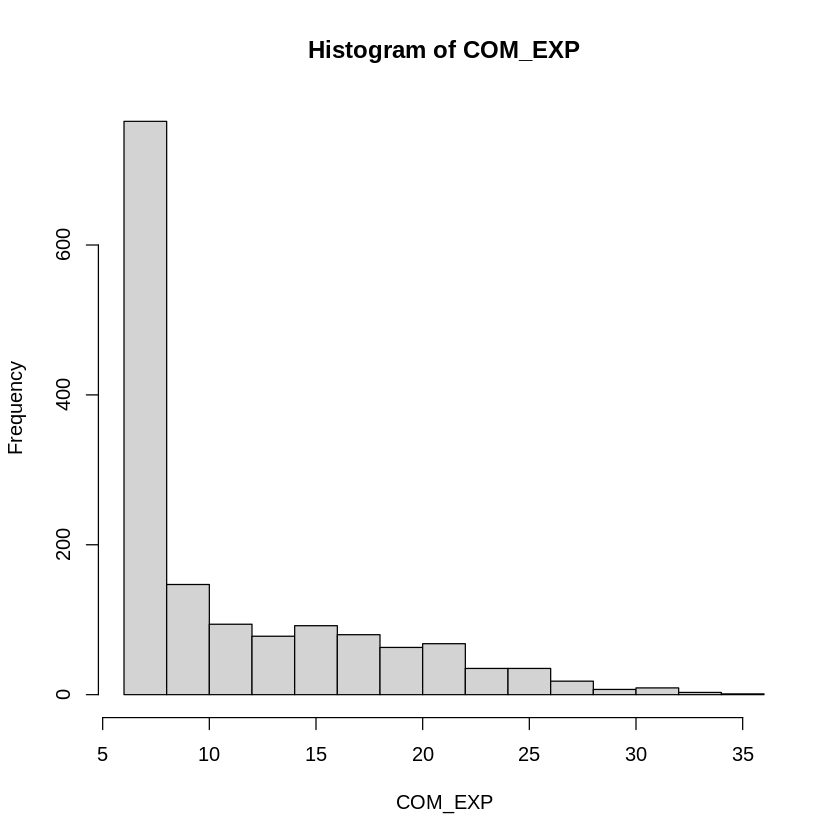

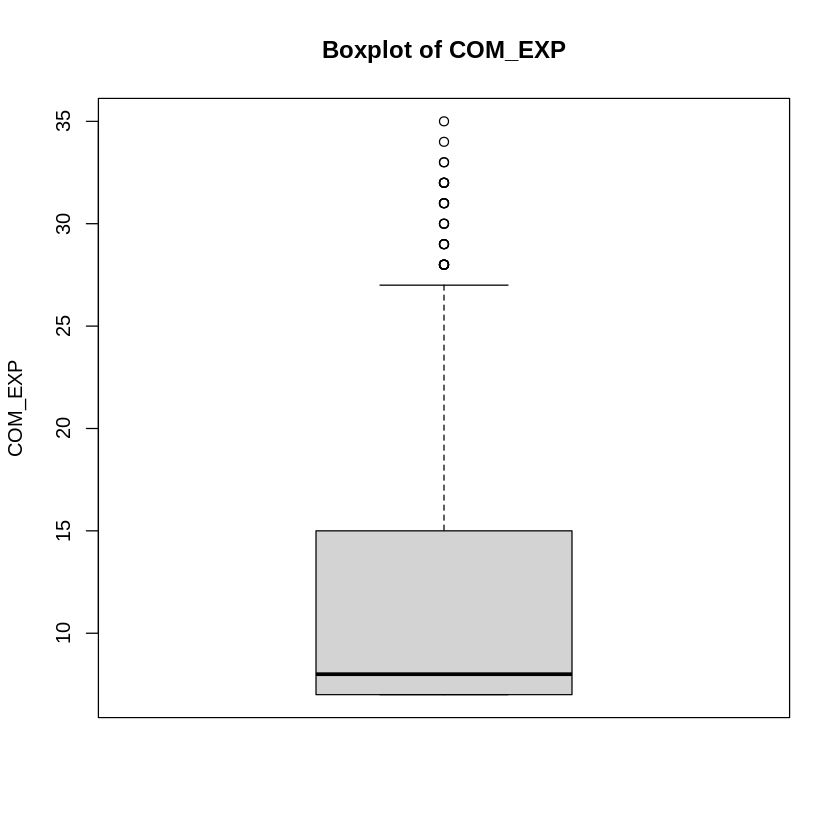

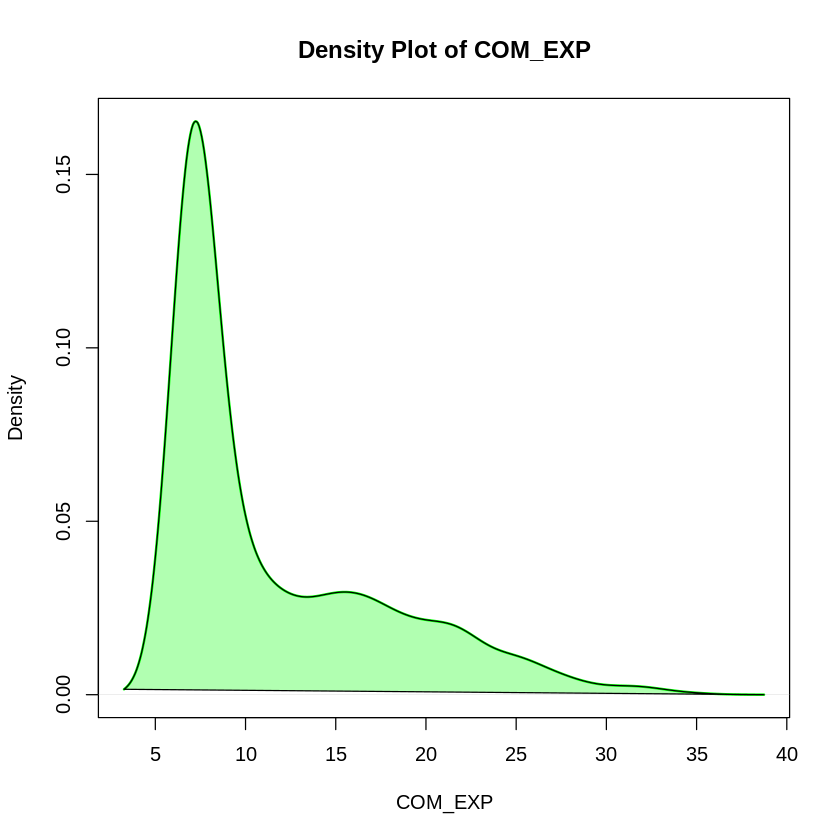

In [ ]:
# Descriptive Statistics
summary(MilitaryDF$COM_EXP)
sd(MilitaryDF$COM_EXP, na.rm = TRUE)
mean(MilitaryDF$COM_EXP, na.rm = TRUE)

# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}
describe(MilitaryDF$COM_EXP) #using psych package

# You can also add other descriptive stats here as per your requirement
# For example: quantiles, skewness, kurtosis, etc.
# Example:
quantile(MilitaryDF$COM_EXP, probs = c(0.25, 0.5, 0.75), na.rm = TRUE)
#For more details about describe() function, see ?describe


# Histogram
hist(MilitaryDF$COM_EXP, main = "Histogram of COM_EXP", xlab = "COM_EXP", ylab = "Frequency")

# Boxplot
boxplot(MilitaryDF$COM_EXP, main = "Boxplot of COM_EXP", ylab = "COM_EXP")

# Density Plot with Green Color
plot(density(MilitaryDF$COM_EXP, na.rm = TRUE),
     main = "Density Plot of COM_EXP",
     xlab = "COM_EXP",
     col = "green",  # Set line color to green
     lwd = 2)       # Set line width (optional)

polygon(density(MilitaryDF$COM_EXP, na.rm = TRUE), col = rgb(0, 1, 0, alpha = 0.3)) # Light green shading

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0000  0.0000  0.8555  2.0000  4.0000 

[1] 1.311261

[1] 0.8555184

,vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X1,1,1495,0.8555184,1.311261,0,0.6056809,0,0,4,4,1.266221,0.1775909,0.03391318


25% 50% 75% 
  0   0   2

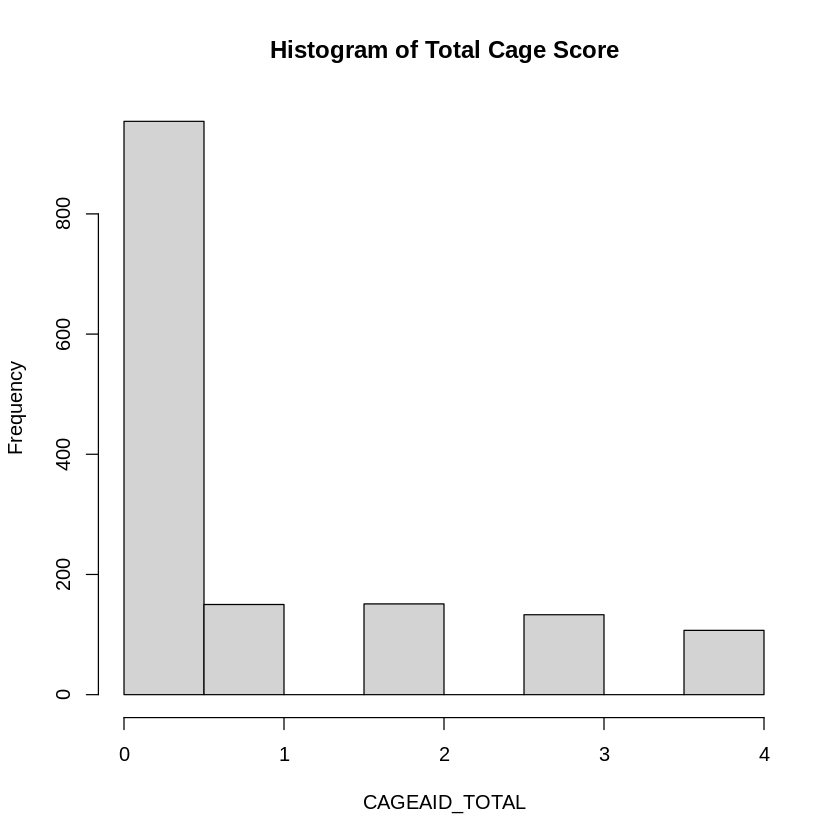

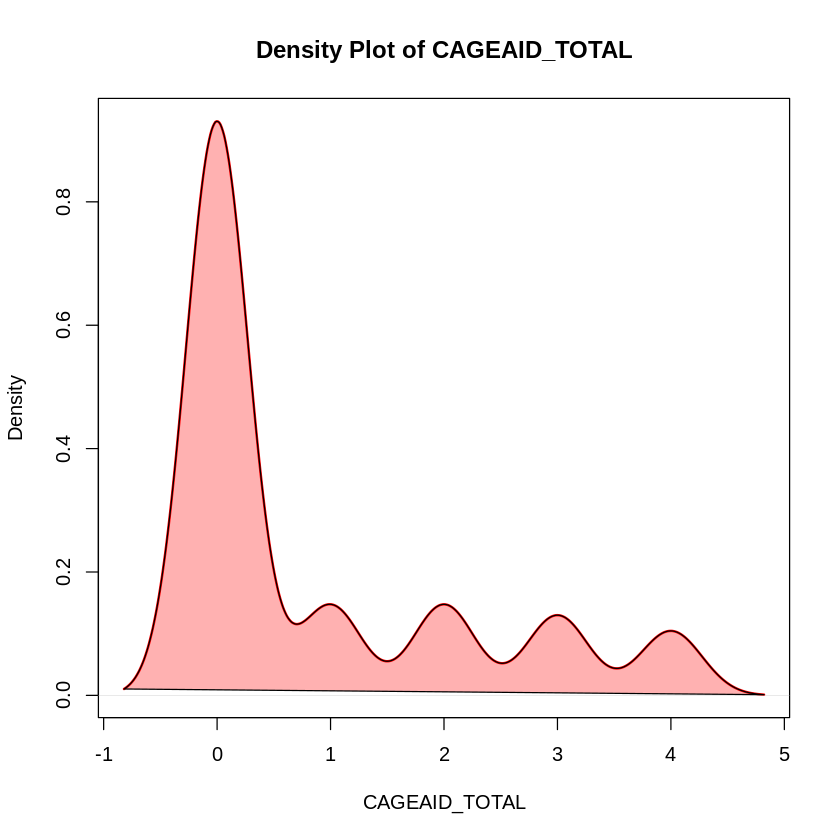

In [ ]:
# Descriptive Statistics
summary(MilitaryDF$CAGEAID_TOTAL)
sd(MilitaryDF$CAGEAID_TOTAL, na.rm = TRUE)
mean(MilitaryDF$CAGEAID_TOTAL, na.rm = TRUE)

# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}
describe(MilitaryDF$CAGEAID_TOTAL) #using psych package

# You can also add other descriptive stats here as per your requirement
# For example: quantiles, skewness, kurtosis, etc.
# Example:
quantile(MilitaryDF$CAGEAID_TOTAL, probs = c(0.25, 0.5, 0.75), na.rm = TRUE)
#For more details about describe() function, see ?describe


# Histogram
hist(MilitaryDF$CAGEAID_TOTAL, main = "Histogram of Total Cage Score", xlab = "CAGEAID_TOTAL", ylab = "Frequency")


# Density Plot with Red Color
plot(density(MilitaryDF$CAGEAID_TOTAL, na.rm = TRUE),
     main = "Density Plot of CAGEAID_TOTAL",
     xlab = "CAGEAID_TOTAL",
     col = "red",  # Set line color to red
     lwd = 2)       # Set line width (optional)

polygon(density(MilitaryDF$CAGEAID_TOTAL, na.rm = TRUE), col = rgb(1, 0, 0, alpha = 0.3)) # Light red shading

In [ ]:
MilitaryDF$Combat_Exposure <- MilitaryDF$COMBAT_TOTAL

In [ ]:
# Select the columns to be summed
CAGEAID_cols <- c("CAGEAID_1", "CAGEAID_2", "CAGEAID_3", "CAGEAID_4")

# Calculate the row sums and create the new variable CAGEAID_TOTAL
MilitaryDF$CAGEAID_TOTAL <- rowSums(MilitaryDF[, CAGEAID_cols], na.rm = TRUE)

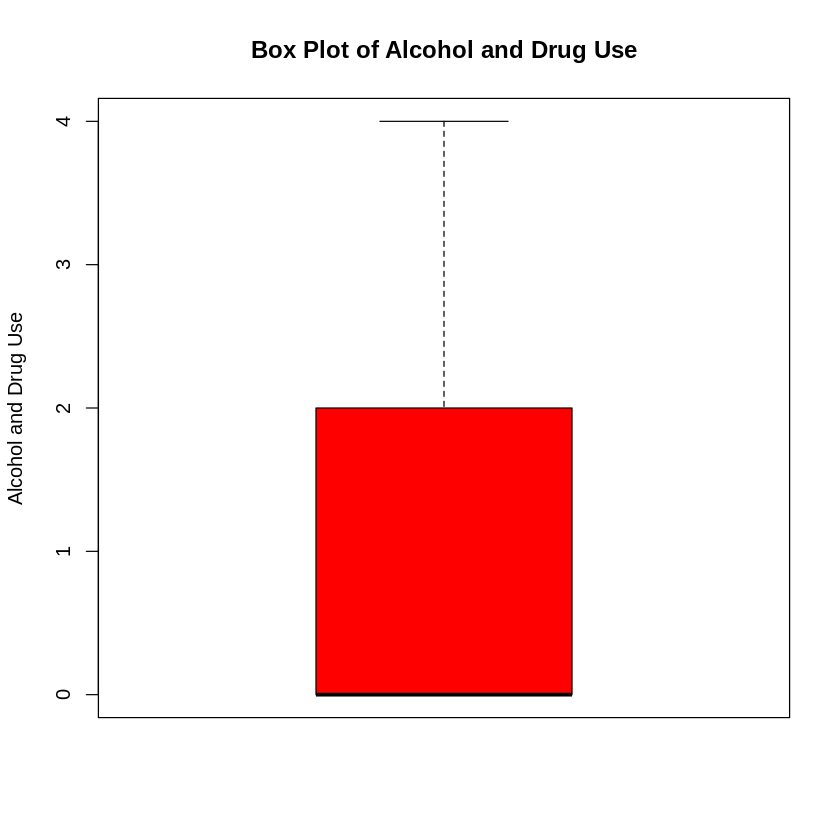

In [ ]:
boxplot(MilitaryDF$CAGEAID_TOTAL,
        main = "Box Plot of Alcohol and Drug Use", # Updated title
        ylab = "Alcohol and Drug Use",              # Updated y-axis label
        col = "red")  # Or any color you prefer

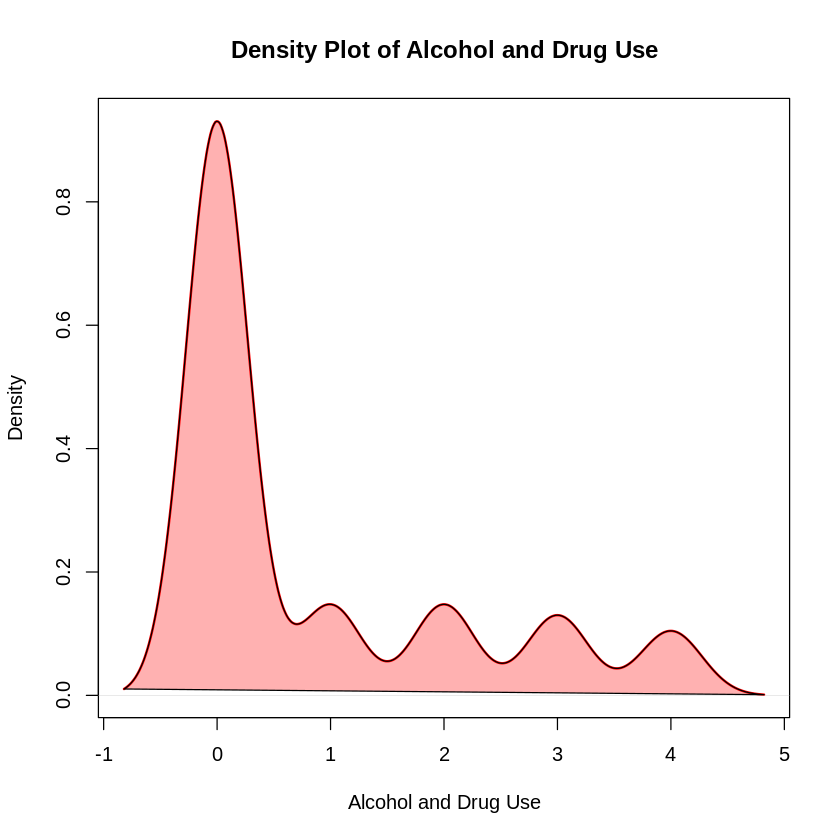

In [ ]:
plot(density(MilitaryDF$CAGEAID_TOTAL, na.rm = TRUE),
     main = "Density Plot of Alcohol and Drug Use", # Updated title
     xlab = "Alcohol and Drug Use",                 # Updated x-axis label
     col = "red",  # Or any color you prefer
     lwd = 2)
polygon(density(MilitaryDF$CAGEAID_TOTAL, na.rm = TRUE),
        col = rgb(1, 0, 0, alpha = 0.3))  # Adjust alpha for transparency

In [ ]:
MilitaryDF$STRESS_TOTAL <- MilitaryDF$STRESS_1 + MilitaryDF$STRESS_2 + MilitaryDF$STRESS_3 + MilitaryDF$STRESS_4 + MilitaryDF$STRESS_5 + MilitaryDF$STRESS_6 + MilitaryDF$STRESS_7

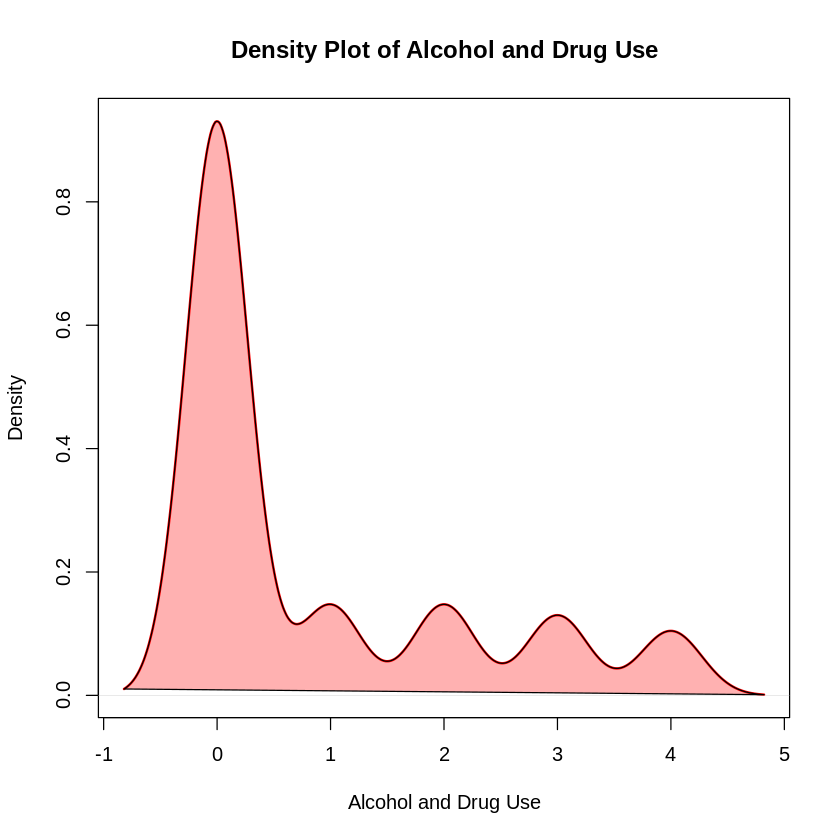

In [ ]:
plot(density(MilitaryDF$CAGEAID_TOTAL, na.rm = TRUE),
     main = "Density Plot of Alcohol and Drug Use", # Updated title
     xlab = "Alcohol and Drug Use",                 # Updated x-axis label
     col = "red",  # Or any color you prefer
     lwd = 2)
polygon(density(MilitaryDF$CAGEAID_TOTAL, na.rm = TRUE),
        col = rgb(1, 0, 0, alpha = 0.3))  # Adjust alpha for transparency

In [ ]:
# Select the CES variables you want to sum
ces_vars_to_sum <- c("CES_1C", "CES_2C", "CES_3C", "CES_4C", "CES_5C", "CES_6C", "CES_7C")

# Calculate the row sums and create the new variable Combat_Exposure
MilitaryDF$Combat_Exposure <- rowSums(MilitaryDF[, ces_vars_to_sum], na.rm = TRUE)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   0.000   2.000   7.215  13.000  41.000 

[1] 9.397394

[1] 7.215385

,vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X1,1,1495,7.215385,9.397394,2,5.531328,2.9652,0,41,41,1.265506,0.7082009,0.2430451


25% 50% 75% 
  0   2  13


  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18  19 
644  34  89  31  78  22  37  23  37  30  24  29  31  30  21  28  36  26  20  23 
 20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  38  39  40 
 26  19  21  20  11  13  13   9  13   8  11   5   8   5   2   5   1   5   3   2 
 41 
  2 

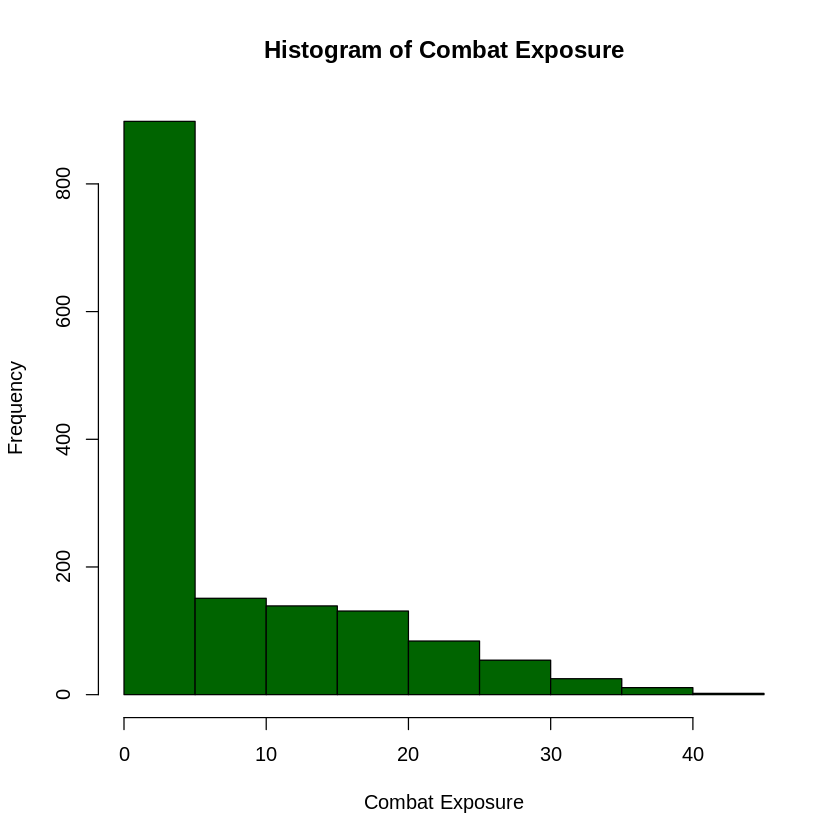

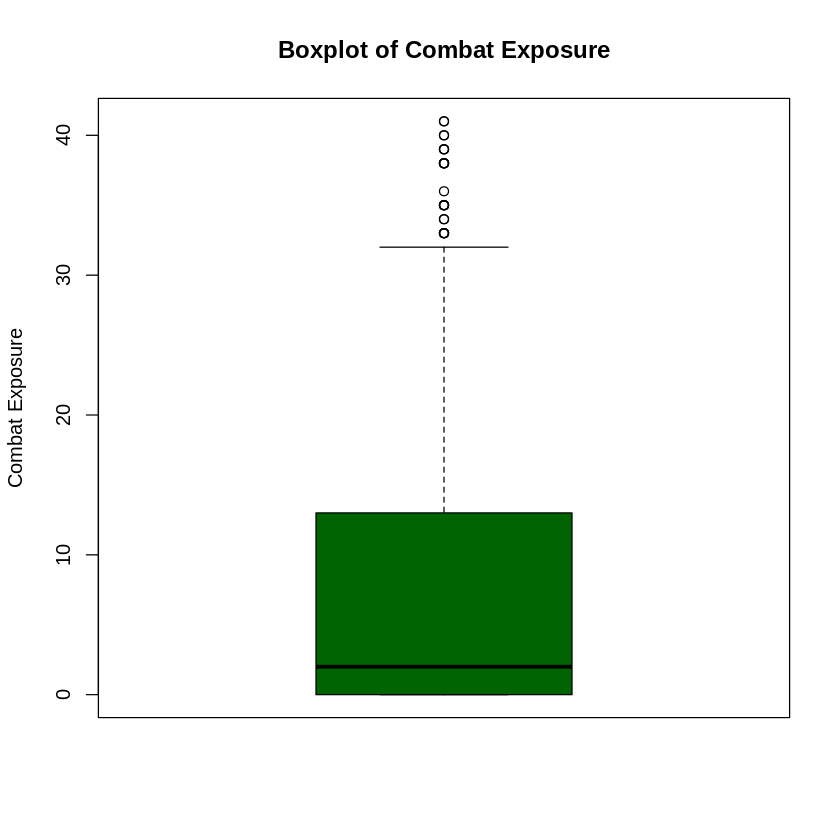

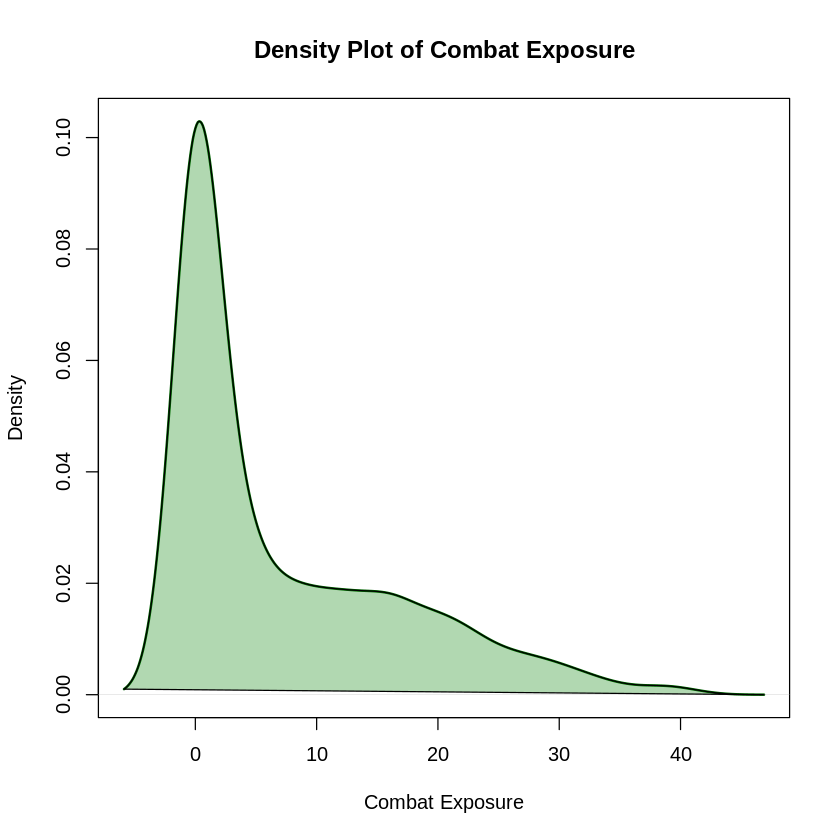

In [ ]:
# Descriptive Statistics
summary(MilitaryDF$Combat_Exposure)
sd(MilitaryDF$Combat_Exposure, na.rm = TRUE)
mean(MilitaryDF$Combat_Exposure, na.rm = TRUE)

# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}
describe(MilitaryDF$Combat_Exposure) #using psych package

# You can also add other descriptive stats here as per your requirement
# For example: quantiles, skewness, kurtosis, etc.
# Example:
quantile(MilitaryDF$Combat_Exposure, probs = c(0.25, 0.5, 0.75), na.rm = TRUE)
#For more details about describe() function, see ?describe

# Frequency Table
table(MilitaryDF$Combat_Exposure)


# Histogram with Dark Green Color
hist(MilitaryDF$Combat_Exposure, main = "Histogram of Combat Exposure",
     xlab = "Combat Exposure", ylab = "Frequency", col = "darkgreen")

# Boxplot with Dark Green Color
boxplot(MilitaryDF$Combat_Exposure, main = "Boxplot of Combat Exposure",
        ylab = "Combat Exposure", col = "darkgreen")

# Density Plot with Dark Green Color
plot(density(MilitaryDF$Combat_Exposure, na.rm = TRUE),
     main = "Density Plot of Combat Exposure",
     xlab = "Combat Exposure", col = "darkgreen", lwd = 2)
polygon(density(MilitaryDF$Combat_Exposure, na.rm = TRUE), col = rgb(0, 0.5, 0, alpha = 0.3)) # Dark green shading

In [ ]:
MilitaryDF$Combat_Exposure_Recoded <- cut(MilitaryDF$Combat_Exposure,
                                         breaks = c(0, 9, 17, 25, 33, Inf),
                                         labels = c(1, 2, 3, 4, 5),
                                         right = FALSE,
                                         include.lowest = TRUE)

# Print the frequency table of the recoded variable
table(MilitaryDF$Combat_Exposure_Recoded)


  1   2   3   4   5 
995 229 166  80  25 

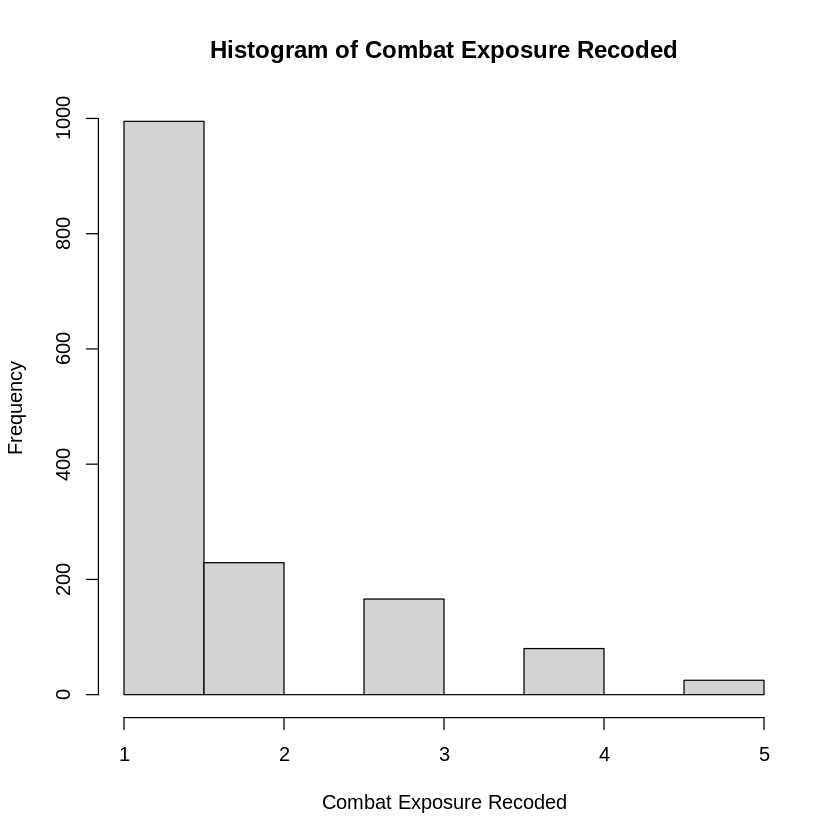

In [ ]:
# prompt: Histogram for Combat_Exposure_Recoded

# Convert the factor to numeric before plotting
hist(as.numeric(as.character(MilitaryDF$Combat_Exposure_Recoded)),
     main = "Histogram of Combat Exposure Recoded",
     xlab = "Combat Exposure Recoded",
     ylab = "Frequency")

   vars    n mean   sd median trimmed mad min max range skew kurtosis   se
X1    1 1495  1.6 0.99      1     1.4   0   1   5     4  1.6     1.66 0.03


1   2   3   4   5 
995 229 166  80  25


  1   2   3   4   5 
995 229 166  80  25 

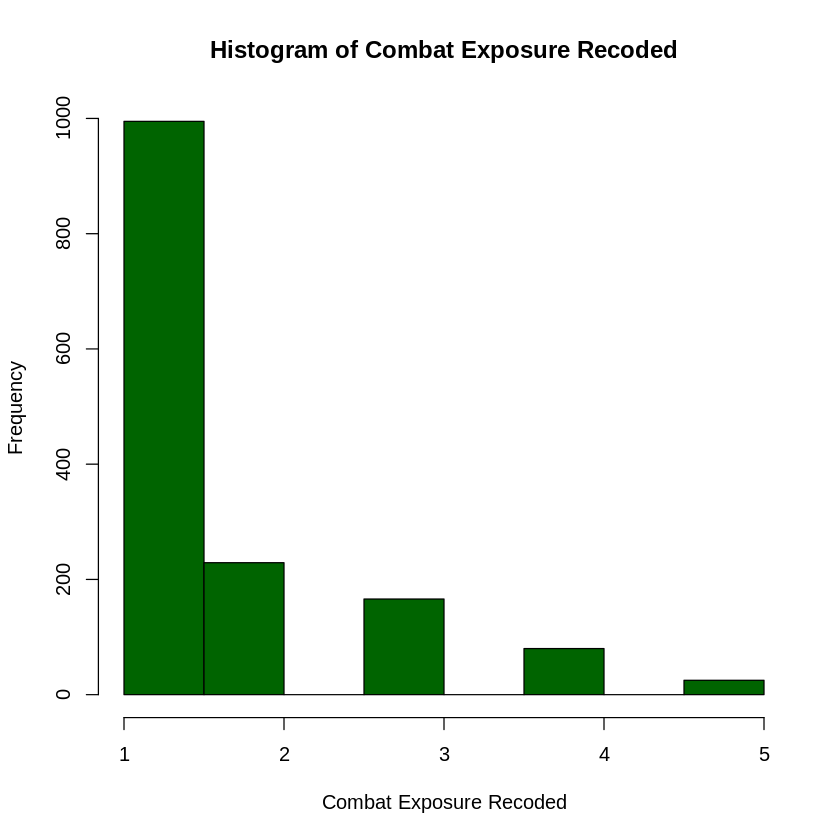

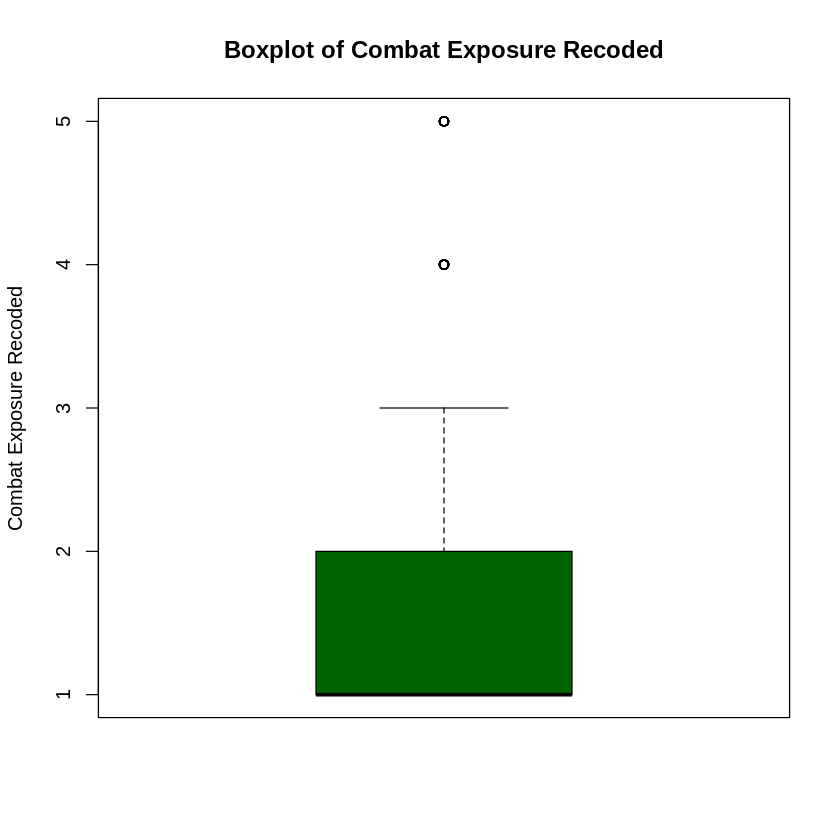

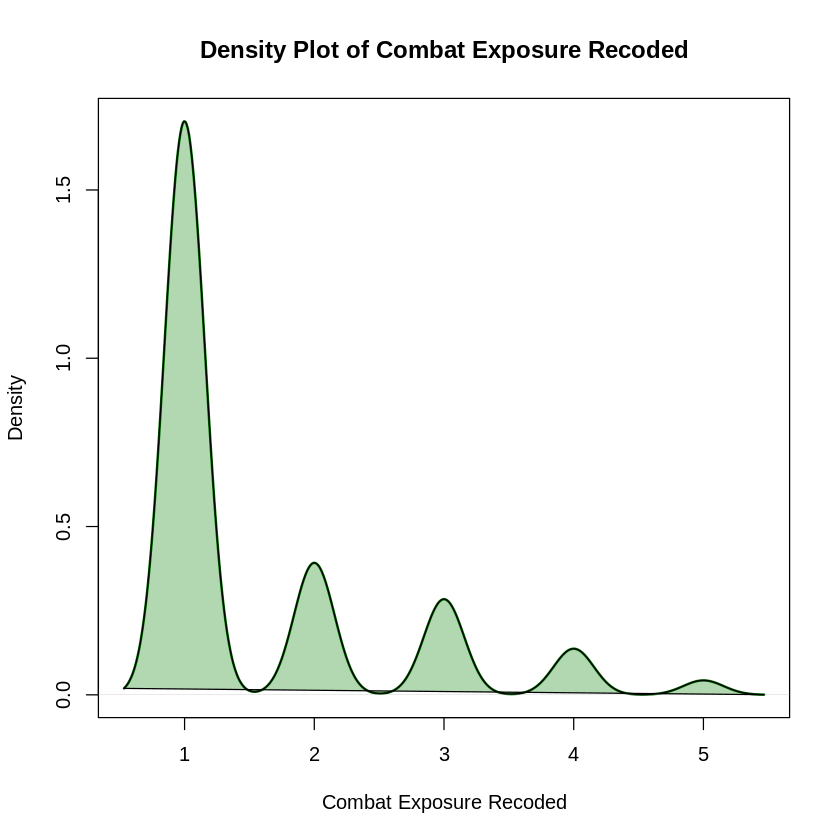

In [ ]:
# Descriptive Statistics for Combat_Exposure_Recoded

# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}

# Convert to numeric for descriptive stats and plots
numeric_recoded <- as.numeric(as.character(MilitaryDF$Combat_Exposure_Recoded))

# Descriptive statistics
print(describe(numeric_recoded)) # Using describe() from psych package
summary(MilitaryDF$Combat_Exposure_Recoded)
table(MilitaryDF$Combat_Exposure_Recoded) # Frequency Table

# Histogram with Dark Green Color
hist(numeric_recoded,
     main = "Histogram of Combat Exposure Recoded",
     xlab = "Combat Exposure Recoded",
     ylab = "Frequency",
     col = "darkgreen")

# Boxplot with Dark Green Color
boxplot(numeric_recoded,
        main = "Boxplot of Combat Exposure Recoded",
        ylab = "Combat Exposure Recoded",
        col = "darkgreen")

# Density Plot with Dark Green Color and Shading
plot(density(numeric_recoded, na.rm = TRUE),
     main = "Density Plot of Combat Exposure Recoded",
     xlab = "Combat Exposure Recoded",
     col = "darkgreen",  # Line color
     lwd = 2)           # Line width (optional)

polygon(density(numeric_recoded, na.rm = TRUE),
        col = rgb(0, 0.5, 0, alpha = 0.3)) # Dark green shading

In [ ]:
# prompt: rename a new variable named COM_EX_RB where "0" = Combat_Exposure <17 and "1" = Combat_Exposure >16

# Create the new variable COM_EX_RB based on Combat_Exposure
MilitaryDF$COM_EX_RB <- ifelse(MilitaryDF$Combat_Exposure < 17, 0, 1)

# Display the frequency table of the new variable
table(MilitaryDF$COM_EX_RB)


   0    1 
1224  271 

In [ ]:
# prompt: provide the appropriate graph for COM_EX_RB, Title "Side-by-Side Bar Plot Combat Exposure" x-axis 0 = "Light to Light Moderate" and 1 =  "Moderate to Moderate Heavy", use dark orange. Remove legend. Label the bars with counts and %

library(ggplot2)

# Calculate counts and percentages for each group
COM_EX_RB_summary <- MilitaryDF %>%
  group_by(COM_EX_RB) %>%
  summarise(count = n()) %>%
  mutate(percent = (count / sum(count)) * 100)

# Create the side-by-side bar plot
ggplot(COM_EX_RB_summary, aes(x = factor(COM_EX_RB), y = count, fill = factor(COM_EX_RB))) +
  geom_bar(stat = "identity", position = "dodge", fill = "darkorange") +  # Use darkorange fill
  geom_text(aes(label = paste0(count, "\n(", round(percent, 1), "%)")),
            position = position_dodge(width = 0.9), vjust = -0.5) + # Add labels
  labs(title = "Side-by-Side Bar Plot Combat Exposure",
       x = "", # Remove default x-axis label
       y = "Count") +
  scale_x_discrete(labels = c("0" = "Light to Light Moderate", "1" = "Moderate to Moderate Heavy")) + # Custom x-axis labels
  theme(legend.position = "none") # Remove legend

ERROR: [1m[33mError[39m in `n()`:[22m
[1m[22m[33m![39m Must only be used inside data-masking verbs like `mutate()`,
  `filter()`, and `group_by()`.


   vars    n  mean    sd median trimmed mad min max range skew kurtosis   se
X1    1 1495 22.22 16.27     12   18.69   0   4  92    88 1.77     2.57 0.42


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   4.00   12.00   12.00   22.22   26.00   92.00 

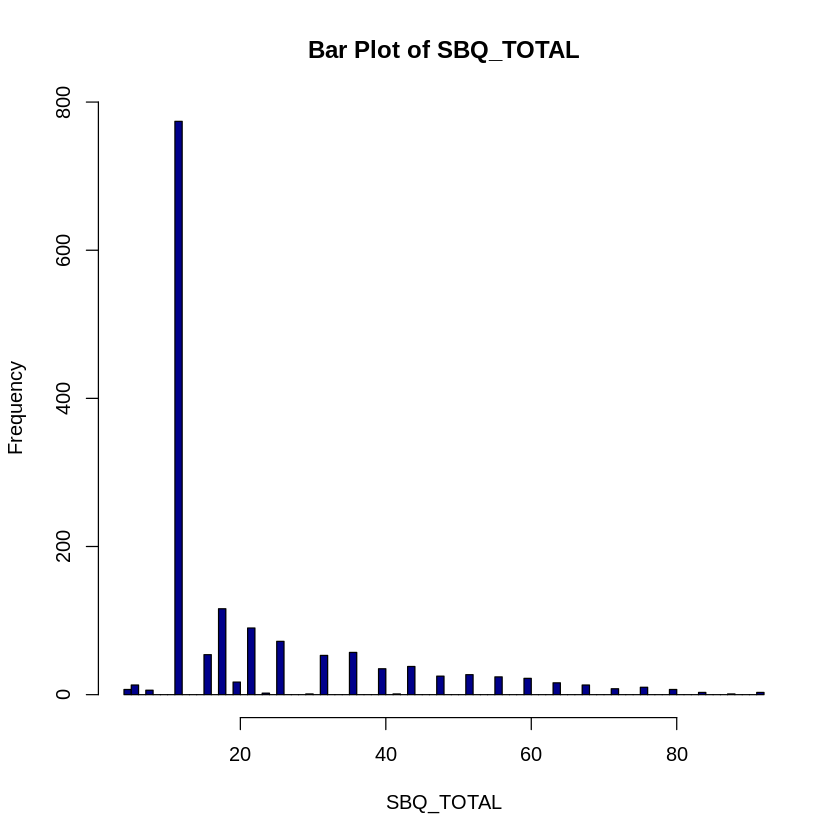

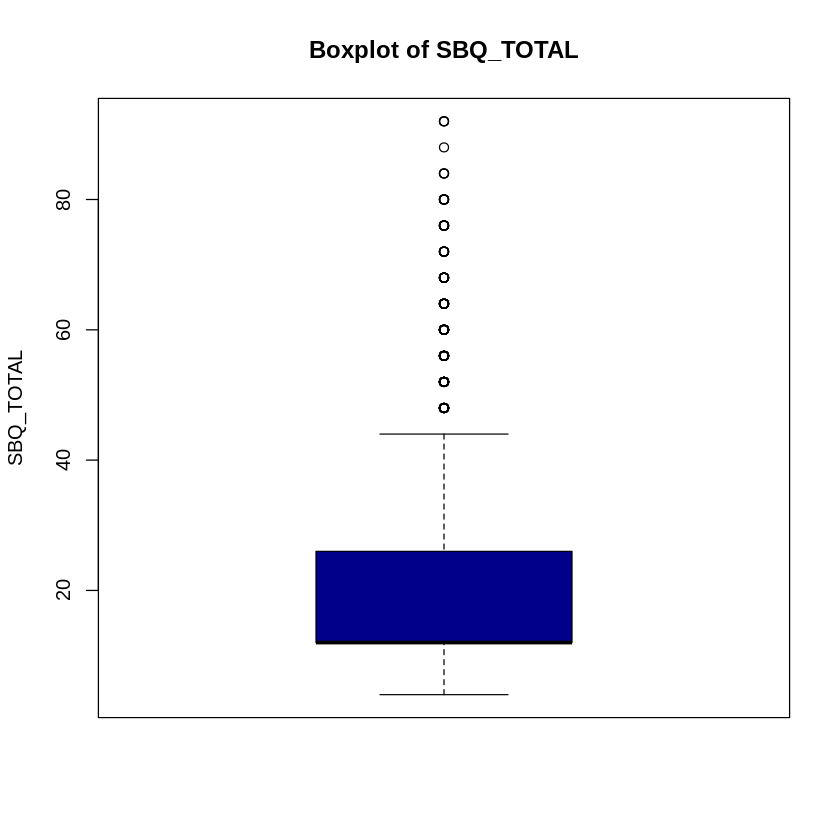

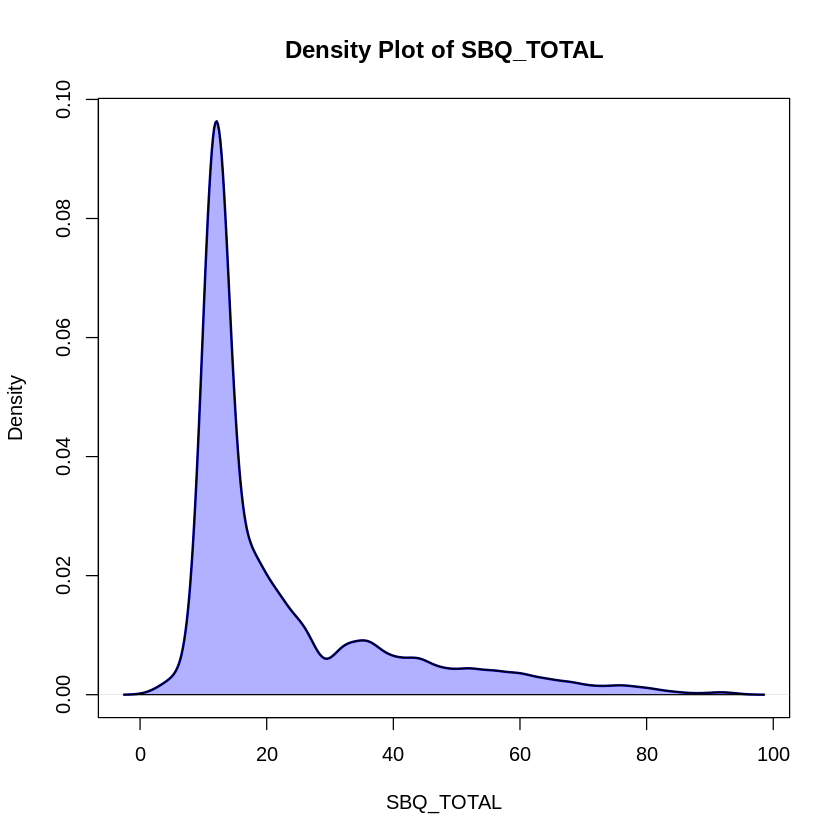

In [ ]:
# Descriptive Statistics for SBQ_TOTAL

# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}

# Descriptive statistics
print(describe(MilitaryDF$SBQ_TOTAL)) # Using describe() from psych package
summary(MilitaryDF$SBQ_TOTAL)


# Bar Plot (using histogram with breaks for bar-like appearance)
hist(MilitaryDF$SBQ_TOTAL,
     main = "Bar Plot of SBQ_TOTAL",
     xlab = "SBQ_TOTAL",
     ylab = "Frequency",
     col = "darkblue",
     breaks = seq(min(MilitaryDF$SBQ_TOTAL, na.rm = TRUE),
                  max(MilitaryDF$SBQ_TOTAL, na.rm = TRUE),
                  by = 1))  # Adjust 'by' for desired bar width

# Boxplot with Dark Blue Color
boxplot(MilitaryDF$SBQ_TOTAL,
        main = "Boxplot of SBQ_TOTAL",
        ylab = "SBQ_TOTAL",
        col = "darkblue")

# Density Plot with Dark Blue Color and Shading
plot(density(MilitaryDF$SBQ_TOTAL, na.rm = TRUE),
     main = "Density Plot of SBQ_TOTAL",
     xlab = "SBQ_TOTAL",
     col = "darkblue",  # Line color
     lwd = 2)           # Line width (optional)

polygon(density(MilitaryDF$SBQ_TOTAL, na.rm = TRUE),
        col = rgb(0, 0, 1, alpha = 0.3)) # Dark blue shading with transparency

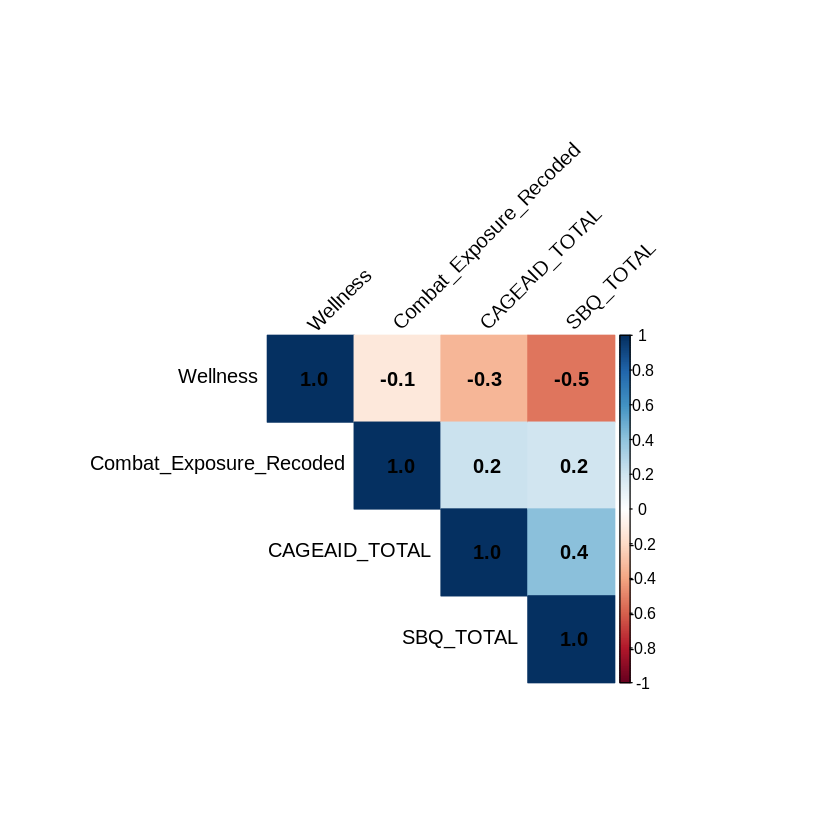

In [ ]:
# Install necessary packages if not already installed
if(!require(dplyr)){install.packages("dplyr")}
if(!require(corrplot)){install.packages("corrplot")}

# Select variables for correlation matrix
selected_vars <- c("CAGEAID_TOTAL", "Combat_Exposure_Recoded", "Wellness", "SBQ_TOTAL")

# Ensure Combat_Exposure_Recoded is numeric before correlation:
MilitaryDF$Combat_Exposure_Recoded <- as.numeric(as.character(MilitaryDF$Combat_Exposure_Recoded))

# Create correlation matrix (ensure Combat_Exposure_Recoded is numeric)
cor_matrix <- cor(MilitaryDF[, selected_vars],
                  use = "pairwise.complete.obs")


# Visualize correlation matrix with 1 significant figure
corrplot(cor_matrix,
         method = "color",
         type = "upper",
         order = "hclust",
         tl.col = "black",
         tl.srt = 45,
         addCoef.col = "black",  # Add coefficient colors
         number.digits = 1,     # Set number of digits to 1
         insig = "blank")       # Optionally hide insignificant correlations

                        CAGEAID_TOTAL Combat_Exposure_Recoded      Wellness
CAGEAID_TOTAL                      NA            2.364604e-17  2.296105e-41
Combat_Exposure_Recoded  2.364604e-17                      NA  2.280809e-06
Wellness                 2.296105e-41            2.280809e-06            NA
SBQ_TOTAL                5.669570e-62            6.230895e-15 4.196949e-112
                            SBQ_TOTAL
CAGEAID_TOTAL            5.669570e-62
Combat_Exposure_Recoded  6.230895e-15
Wellness                4.196949e-112
SBQ_TOTAL                          NA


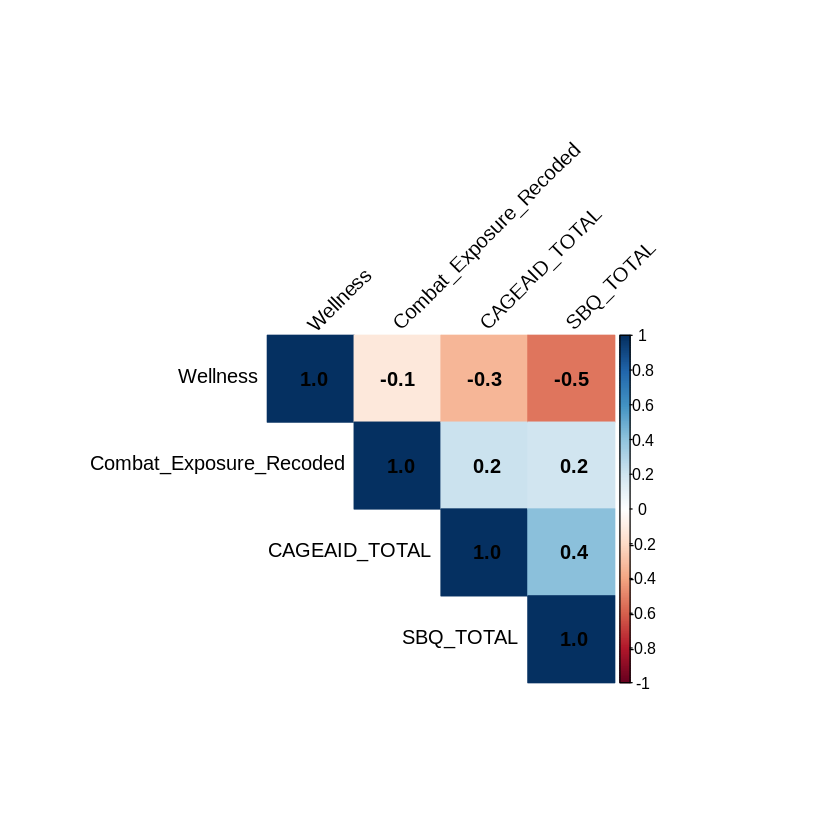

In [ ]:
# Install necessary packages if not already installed
if(!require(dplyr)){install.packages("dplyr")}
if(!require(corrplot)){install.packages("corrplot")}

# Select variables for correlation matrix
selected_vars <- c("CAGEAID_TOTAL", "Combat_Exposure_Recoded", "Wellness", "SBQ_TOTAL")

# Ensure Combat_Exposure_Recoded is numeric before correlation:
MilitaryDF$Combat_Exposure_Recoded <- as.numeric(as.character(MilitaryDF$Combat_Exposure_Recoded))

# Create correlation matrix
cor_matrix <- cor(MilitaryDF[, selected_vars], use = "pairwise.complete.obs")

# Calculate p-values for each correlation
p_values <- matrix(NA, nrow = length(selected_vars), ncol = length(selected_vars))
rownames(p_values) <- selected_vars
colnames(p_values) <- selected_vars

for (i in 1:length(selected_vars)) {
  for (j in 1:length(selected_vars)) {
    if (i != j) { # Avoid calculating p-value for a variable with itself
      cor_test <- cor.test(MilitaryDF[, selected_vars[i]],
                           MilitaryDF[, selected_vars[j]],
                           use = "pairwise.complete.obs")
      p_values[i, j] <- cor_test$p.value
    }
  }
}

# Print the p-values
print(p_values)

# Visualize correlation matrix with 1 significant figure
corrplot(cor_matrix,
         method = "color",
         type = "upper",
         order = "hclust",
         tl.col = "black",
         tl.srt = 45,
         addCoef.col = "black",  # Add coefficient colors
         number.digits = 1,     # Set number of digits to 1
         insig = "blank")       # Optionally hide insignificant correlations

In [ ]:
# Install necessary packages if not already installed
if(!require(dplyr)){install.packages("dplyr")}
if(!require(corrplot)){install.packages("corrplot")}

# ... (rest of the code remains the same) ...

In [ ]:
# Check if the variables exist in the dataframe
variable_names <- names(MilitaryDF)

# Check for each variable
soc_integration_1r_exists <- "SOC_INTEGRATION_1R" %in% variable_names
soc_contribution_2r_exists <- "SOC_CONTRIBUTION_2R" %in% variable_names
soc_contribution_3r_exists <- "SOC_CONTRIBUTION_3R" %in% variable_names

# Print the results
print(paste("SOC_INTEGRATION_1R exists:", soc_integration_1r_exists))
print(paste("SOC_CONTRIBUTION_2R exists:", soc_contribution_2r_exists))
print(paste("SOC_CONTRIBUTION_3R exists:", soc_contribution_3r_exists))

[1] "SOC_INTEGRATION_1R exists: TRUE"
[1] "SOC_CONTRIBUTION_2R exists: TRUE"
[1] "SOC_CONTRIBUTION_3R exists: TRUE"


In [ ]:
MilitaryDF$SOC_INT_TOTAL <- MilitaryDF$SOC_INTEGRATION_1R +
                             MilitaryDF$SOC_INTEGRATION_2 +
                             MilitaryDF$SOC_INTEGRATION_3

In [ ]:
MilitaryDF$SOC_CON_TOTAL <- MilitaryDF$SOC_CONTRIBUTION_1 +
                             MilitaryDF$SOC_CONTRIBUTION_2R +
                             MilitaryDF$SOC_CONTRIBUTION_3R

In [ ]:
MilitaryDF$SOC_TOTAL <- MilitaryDF$SOC_INT_TOTAL + MilitaryDF$SOC_CON_TOTAL

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  12.00   24.00   27.00   26.67   31.00   36.00 

[1] 5.168928

[1] 26.67023

,vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X1,1,1495,26.67023,5.168928,27,26.86299,4.4478,12,36,24,-0.3202999,-0.2544564,0.1336842


25% 50% 75% 
 24  27  31

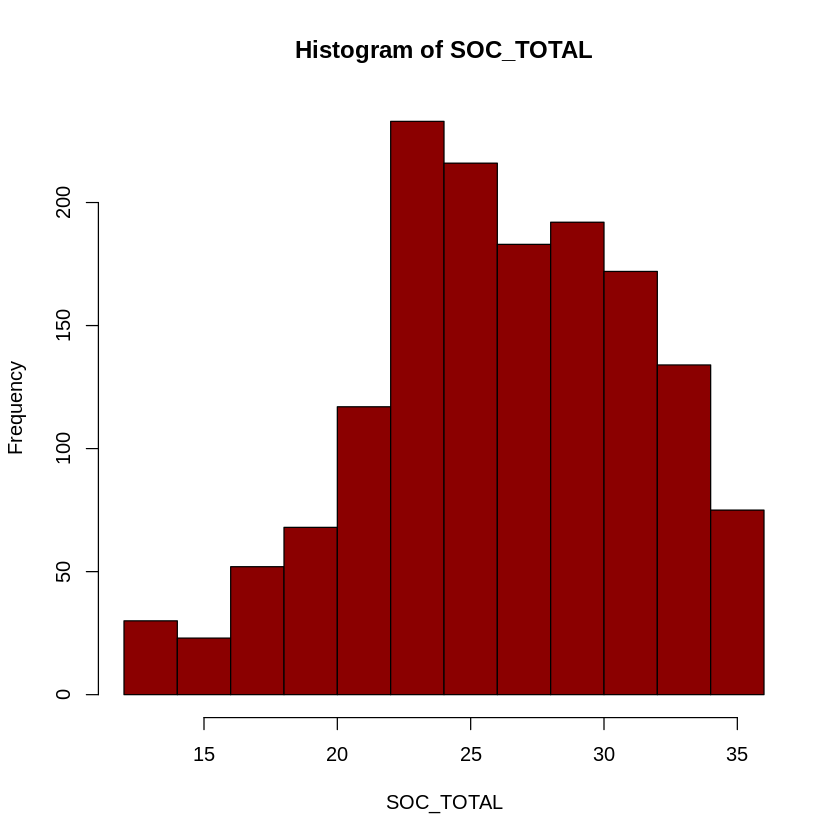

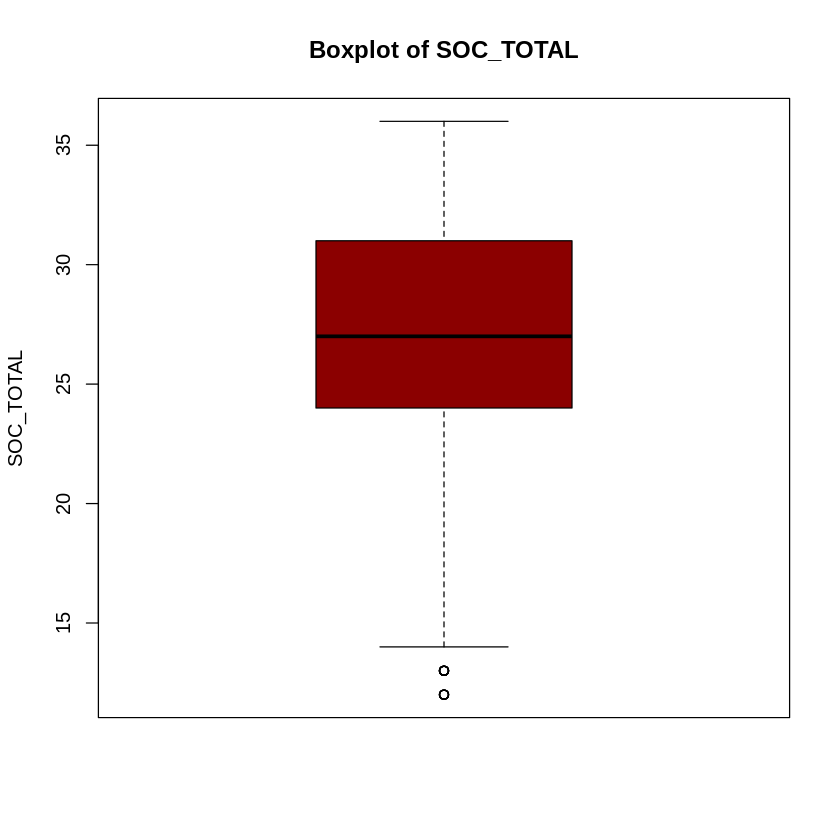

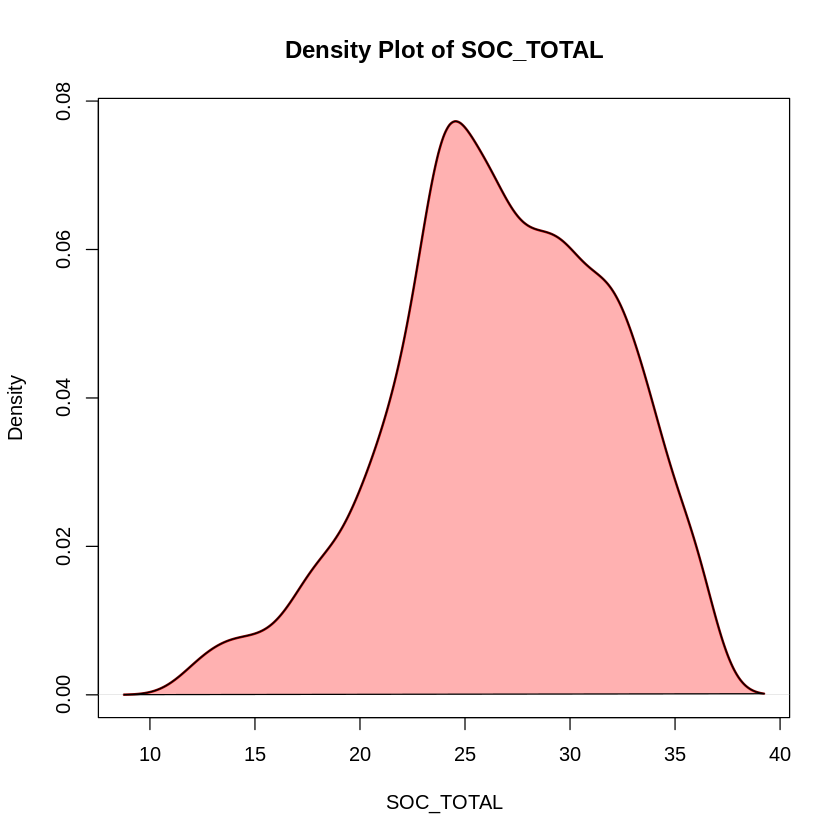

In [ ]:
# Descriptive Statistics
summary(MilitaryDF$SOC_TOTAL)
sd(MilitaryDF$SOC_TOTAL, na.rm = TRUE)
mean(MilitaryDF$SOC_TOTAL, na.rm = TRUE)

# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}
describe(MilitaryDF$SOC_TOTAL) #using psych package

# You can also add other descriptive stats here as per your requirement
# For example: quantiles, skewness, kurtosis, etc.
# Example:
quantile(MilitaryDF$SOC_TOTAL, probs = c(0.25, 0.5, 0.75), na.rm = TRUE)
#For more details about describe() function, see ?describe


# Histogram
hist(MilitaryDF$SOC_TOTAL, main = "Histogram of SOC_TOTAL", xlab = "SOC_TOTAL", ylab = "Frequency", col = "darkred")

# Boxplot
boxplot(MilitaryDF$SOC_TOTAL, main = "Boxplot of SOC_TOTAL", ylab = "SOC_TOTAL", col = "darkred")

# Density Plot
plot(density(MilitaryDF$SOC_TOTAL, na.rm = TRUE), main = "Density Plot of SOC_TOTAL", xlab = "SOC_TOTAL", col = "darkred", lwd = 2)
polygon(density(MilitaryDF$SOC_TOTAL, na.rm = TRUE), col = rgb(1, 0, 0, alpha = 0.3)) # Light red shading (you can adjust alpha for transparency)

In [ ]:
# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}

# Load the psych package
library(psych)

# Descriptive Statistics
summary(MilitaryDF$SOC_TOTAL)
sd(MilitaryDF$SOC_TOTAL, na.rm = TRUE)
mean(MilitaryDF$SOC_TOTAL, na.rm = TRUE)

describe(MilitaryDF$SOC_TOTAL) #using psych package

# ... (rest of your code) ...

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  12.00   24.00   27.00   26.67   31.00   36.00 

[1] 5.168928

[1] 26.67023

,vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X1,1,1495,26.67023,5.168928,27,26.86299,4.4478,12,36,24,-0.3202999,-0.2544564,0.1336842


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  12.00   24.00   27.00   26.67   31.00   36.00 

[1] 5.168928

[1] 26.67023

,vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X1,1,1495,26.67023,5.168928,27,26.86299,4.4478,12,36,24,-0.3202999,-0.2544564,0.1336842


25% 50% 75% 
 24  27  31

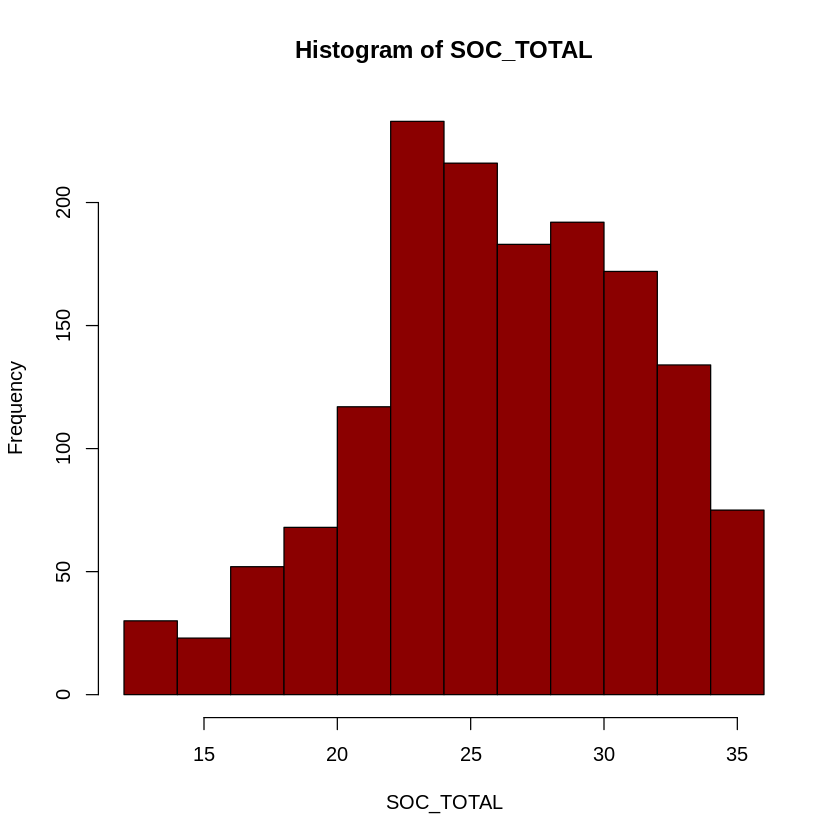

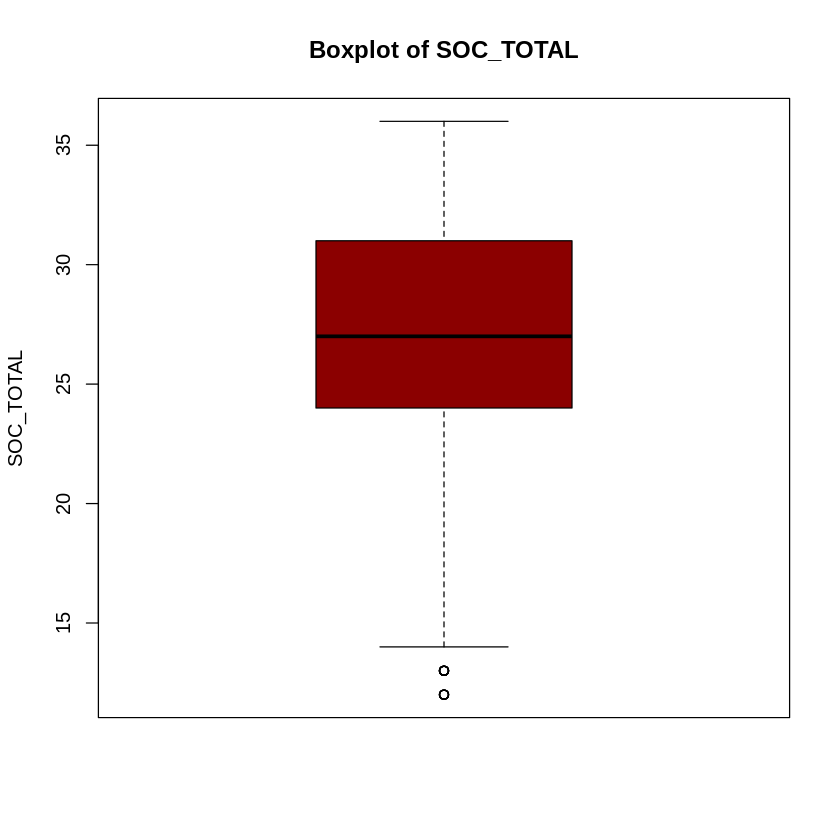

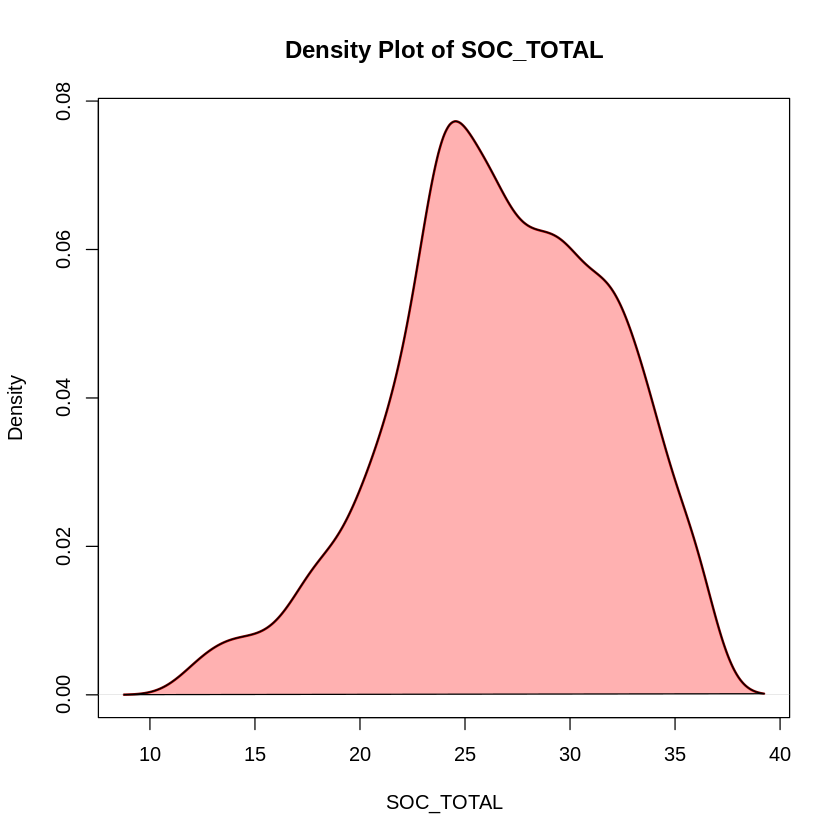

In [ ]:
# Descriptive Statistics
summary(MilitaryDF$SOC_TOTAL)
sd(MilitaryDF$SOC_TOTAL, na.rm = TRUE)
mean(MilitaryDF$SOC_TOTAL, na.rm = TRUE)

# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}
describe(MilitaryDF$SOC_TOTAL) #using psych package

# You can also add other descriptive stats here as per your requirement
# For example: quantiles, skewness, kurtosis, etc.
# Example:
quantile(MilitaryDF$SOC_TOTAL, probs = c(0.25, 0.5, 0.75), na.rm = TRUE)
#For more details about describe() function, see ?describe


# Histogram
hist(MilitaryDF$SOC_TOTAL, main = "Histogram of SOC_TOTAL", xlab = "SOC_TOTAL", ylab = "Frequency", col = "darkred")

# Boxplot
boxplot(MilitaryDF$SOC_TOTAL, main = "Boxplot of SOC_TOTAL", ylab = "SOC_TOTAL", col = "darkred")

# Density Plot
plot(density(MilitaryDF$SOC_TOTAL, na.rm = TRUE), main = "Density Plot of SOC_TOTAL", xlab = "SOC_TOTAL", col = "darkred", lwd = 2)
polygon(density(MilitaryDF$SOC_TOTAL, na.rm = TRUE), col = rgb(1, 0, 0, alpha = 0.3)) # Light red shading (you can adjust alpha for transparency)

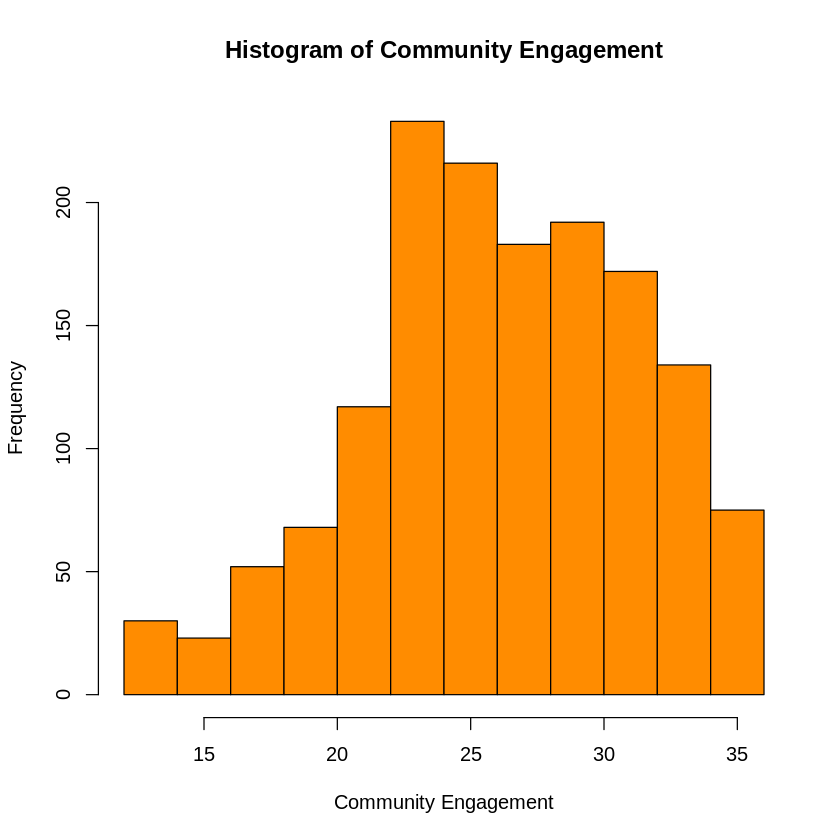

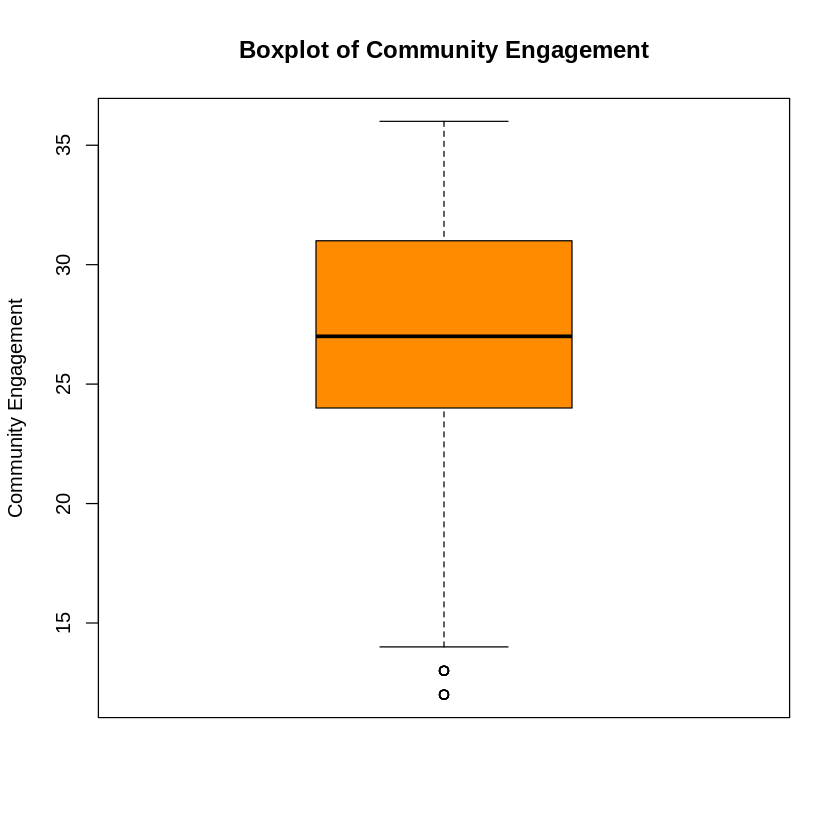

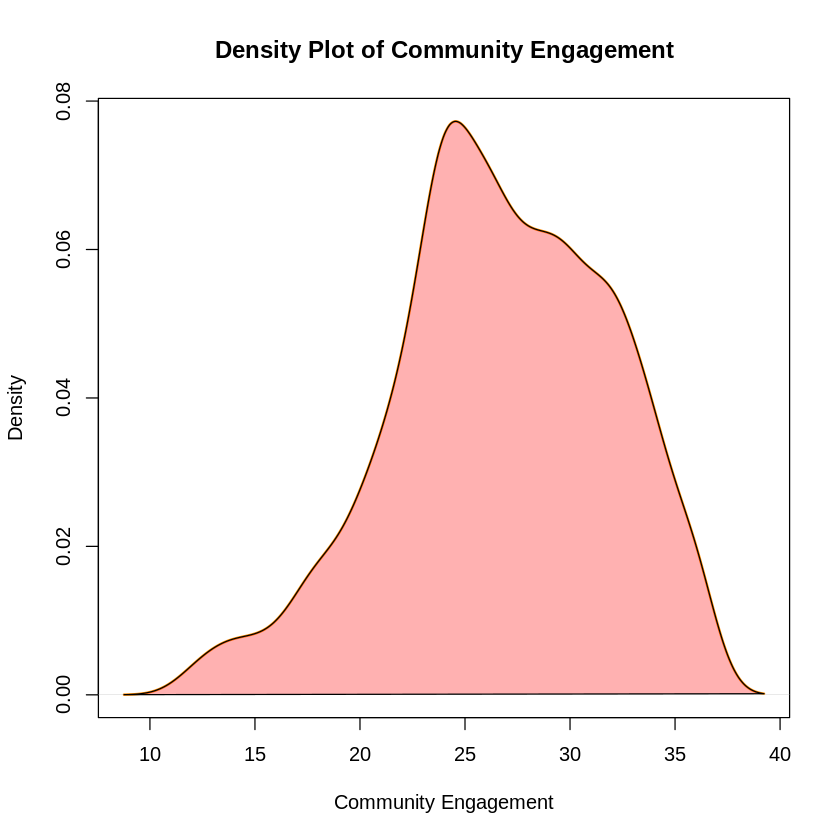

In [ ]:
# ... (previous code for descriptive statistics) ...

# Histogram
hist(MilitaryDF$SOC_TOTAL,
     main = "Histogram of Community Engagement", # Updated title
     xlab = "Community Engagement",             # Updated x-axis label
     ylab = "Frequency",
     col = "darkorange")

# Boxplot
boxplot(MilitaryDF$SOC_TOTAL,
        main = "Boxplot of Community Engagement", # Updated title
        ylab = "Community Engagement",             # Updated y-axis label
        col = "darkorange")

# Density Plot
plot(density(MilitaryDF$SOC_TOTAL, na.rm = TRUE),
     main = "Density Plot of Community Engagement", # Updated title
     xlab = "Community Engagement",                 # Updated x-axis label
     col = "darkorange",
     lwd = 2)
polygon(density(MilitaryDF$SOC_TOTAL, na.rm = TRUE),
        col = rgb(1, 0, 0, alpha = 0.3))

In [ ]:
MilitaryDF$PUR_TOTAL <- MilitaryDF$PURPOSE_1 + MilitaryDF$PURPOSE_2 + MilitaryDF$PURPOSE_3 + MilitaryDF$PURPOSE_4 + MilitaryDF$PURPOSE_5

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   5.00   18.00   20.00   20.24   23.00   25.00 

[1] 3.15261

[1] 20.24013

,vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X1,1,1495,20.24013,3.15261,20,20.39683,2.9652,5,25,20,-0.6041098,0.8913178,0.08153605


25% 50% 75% 
 18  20  23

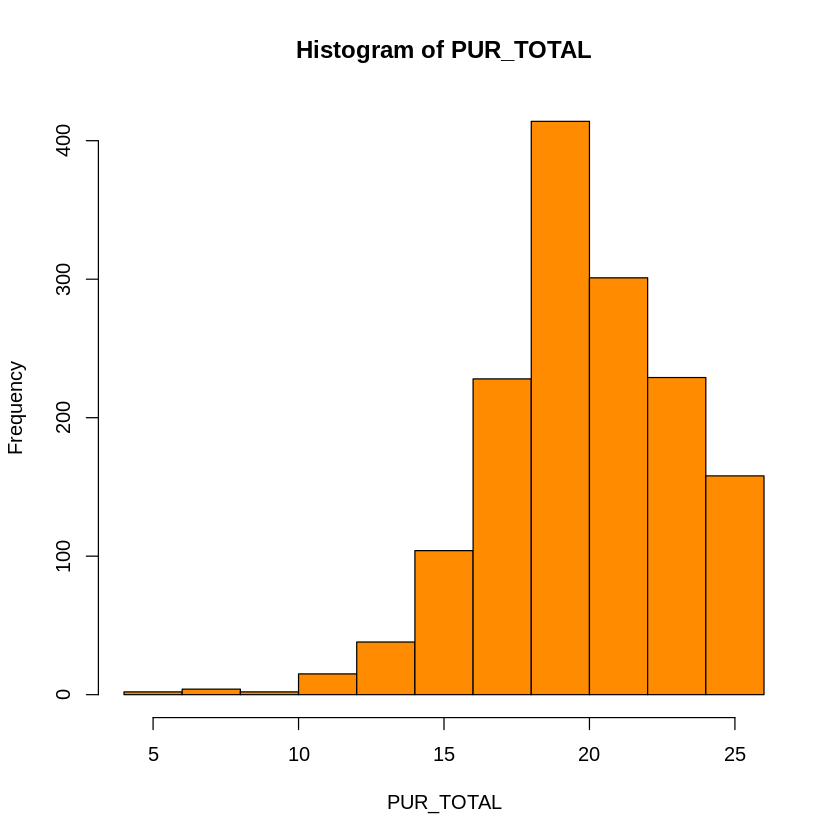

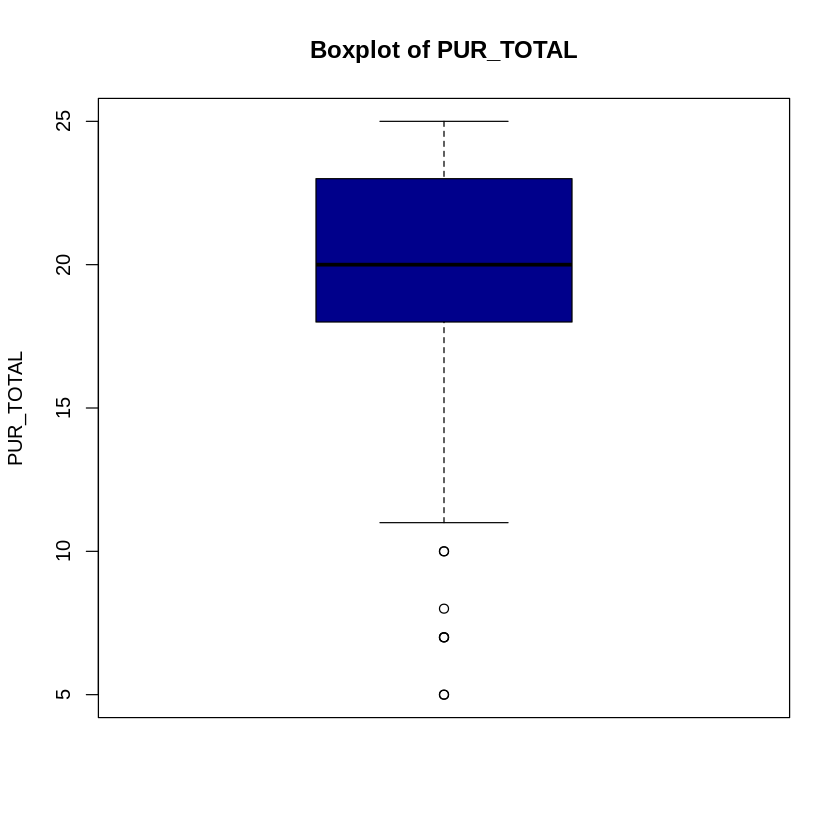

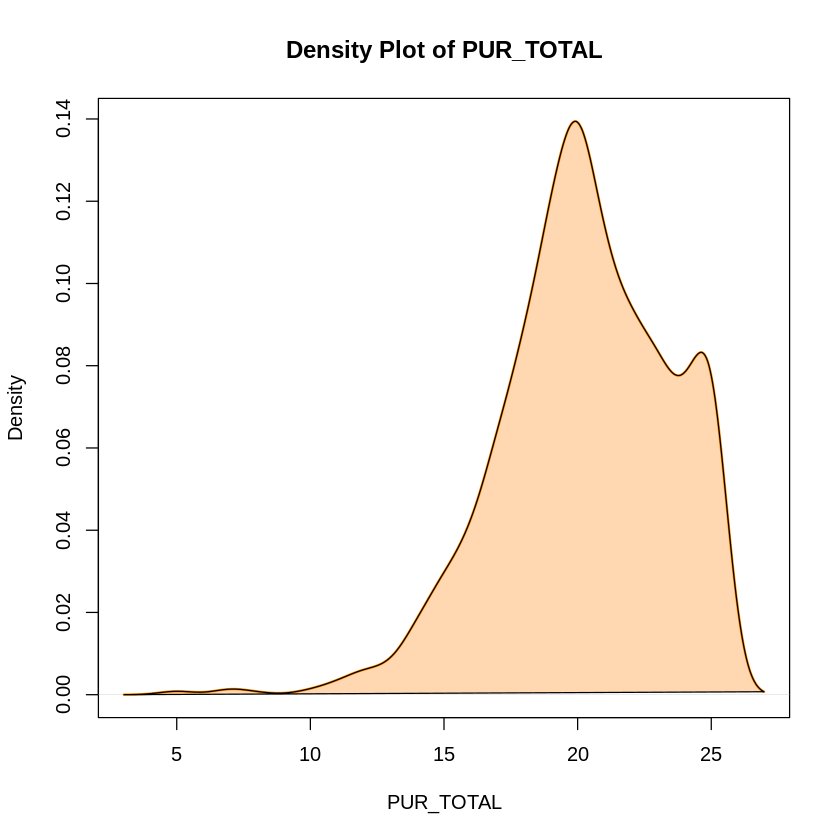

In [ ]:
# Descriptive Statistics
summary(MilitaryDF$PUR_TOTAL)
sd(MilitaryDF$PUR_TOTAL, na.rm = TRUE)
mean(MilitaryDF$PUR_TOTAL, na.rm = TRUE)

# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}
describe(MilitaryDF$PUR_TOTAL) #using psych package

# You can also add other descriptive stats here as per your requirement
# For example: quantiles, skewness, kurtosis, etc.
# Example:
quantile(MilitaryDF$PUR_TOTAL, probs = c(0.25, 0.5, 0.75), na.rm = TRUE)
#For more details about describe() function, see ?describe


# Histogram
hist(MilitaryDF$PUR_TOTAL, main = "Histogram of PUR_TOTAL", xlab = "PUR_TOTAL", ylab = "Frequency", col = "darkorange")

# Boxplot
boxplot(MilitaryDF$PUR_TOTAL, main = "Boxplot of PUR_TOTAL", ylab = "PUR_TOTAL", col = "darkblue")

# Density Plot
plot(density(MilitaryDF$PUR_TOTAL, na.rm = TRUE), main = "Density Plot of PUR_TOTAL", xlab = "PUR_TOTAL", col = "darkorange", lwd = 2)
polygon(density(MilitaryDF$PUR_TOTAL, na.rm = TRUE), col = rgb(1, 0.5, 0, alpha = 0.3)) # Light orange shading

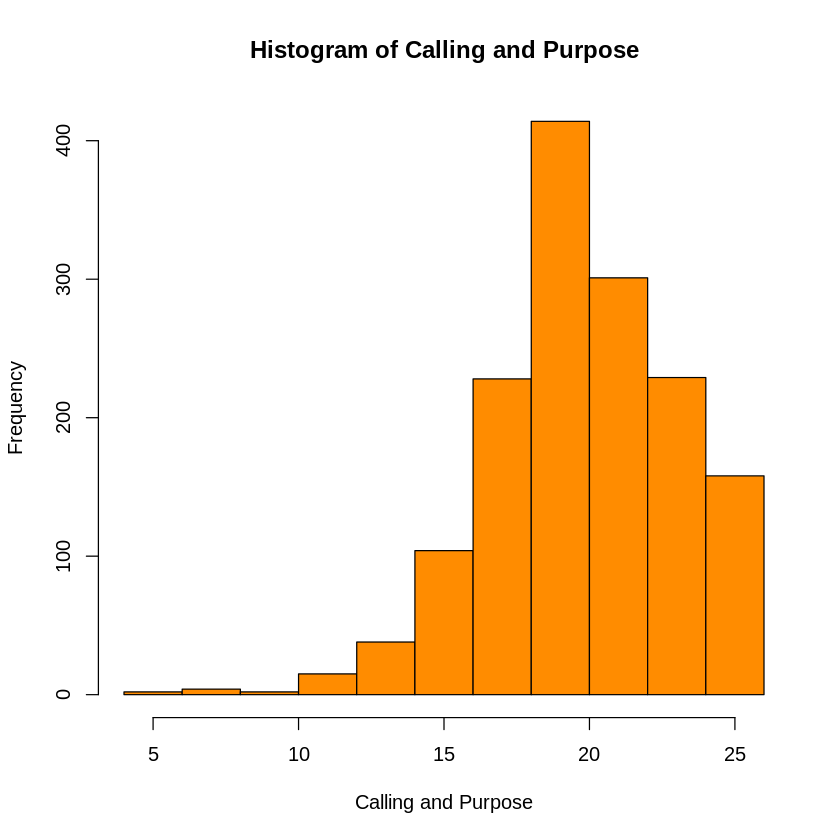

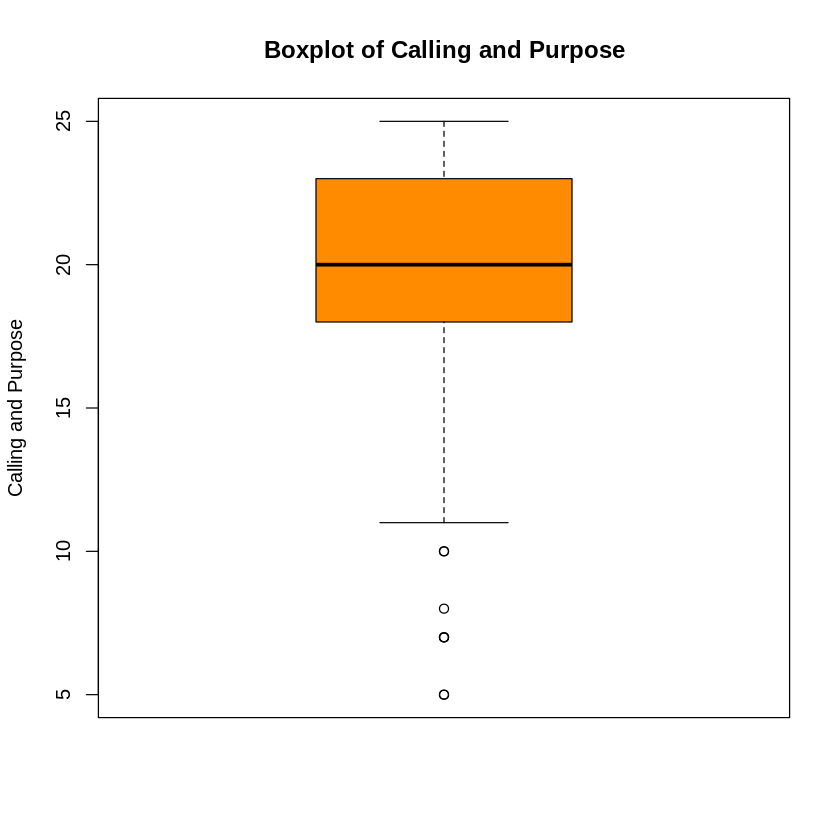

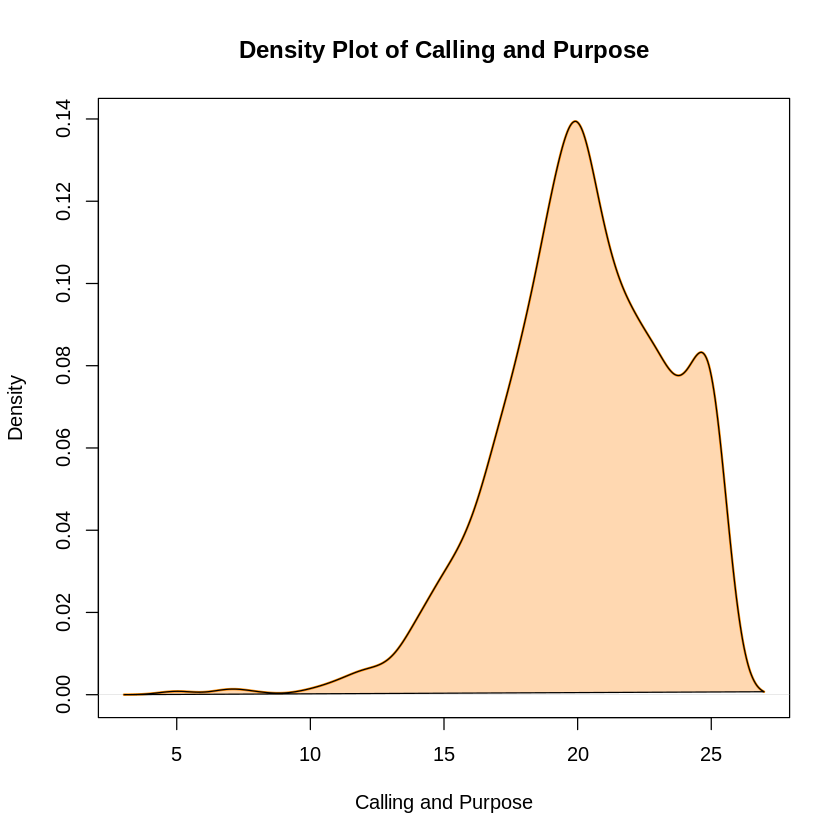

In [ ]:
# ... (previous code for descriptive statistics) ...

# Histogram
hist(MilitaryDF$PUR_TOTAL,
     main = "Histogram of Calling and Purpose", # Updated title
     xlab = "Calling and Purpose",             # Updated x-axis label
     ylab = "Frequency",
     col = "darkorange")

# Boxplot
boxplot(MilitaryDF$PUR_TOTAL,
        main = "Boxplot of Calling and Purpose", # Updated title
        ylab = "Calling and Purpose",             # Updated y-axis label
        col = "darkorange")

# Density Plot
plot(density(MilitaryDF$PUR_TOTAL, na.rm = TRUE),
     main = "Density Plot of Calling and Purpose", # Updated title
     xlab = "Calling and Purpose",                 # Updated x-axis label
     col = "darkorange",
     lwd = 2)
polygon(density(MilitaryDF$PUR_TOTAL, na.rm = TRUE),
        col = rgb(1, 0.5, 0, alpha = 0.3))

In [ ]:
MilitaryDF$STRESS_TOTAL <- MilitaryDF$STRESS_1 + MilitaryDF$STRESS_2 + MilitaryDF$STRESS_3 + MilitaryDF$STRESS_4 + MilitaryDF$STRESS_5 + MilitaryDF$STRESS_6 + MilitaryDF$STRESS_7

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   0.000   1.000   1.591   3.000   7.000 

[1] 1.776966

[1] 1.590635

,vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X1,1,1495,1.590635,1.776966,1,1.329156,1.4826,0,7,7,0.992568,0.1158326,0.04595774


25% 50% 75% 
  0   1   3

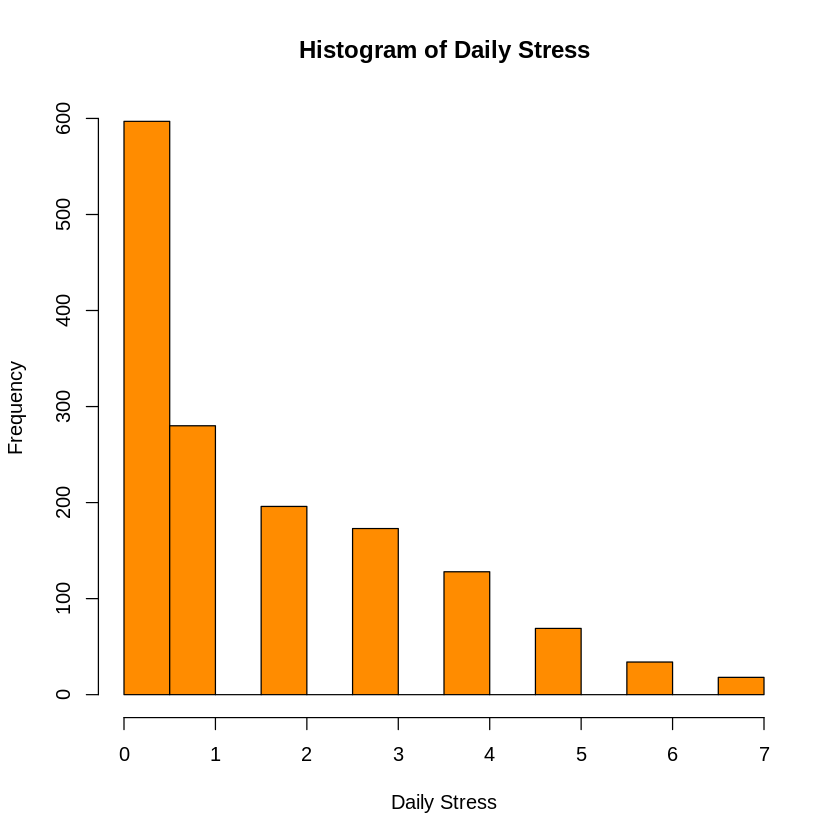

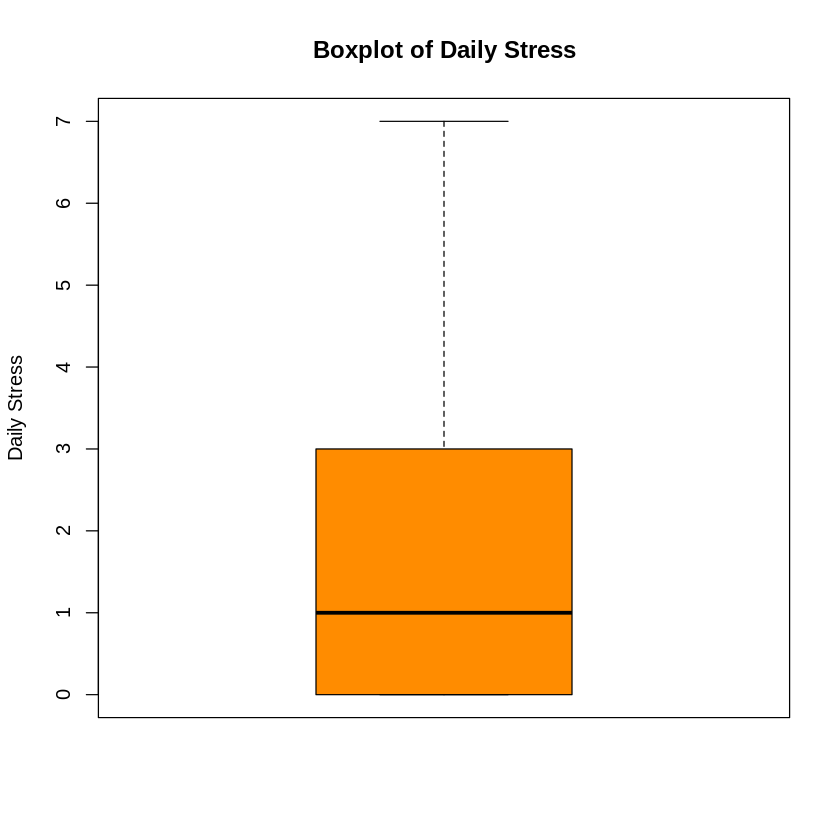

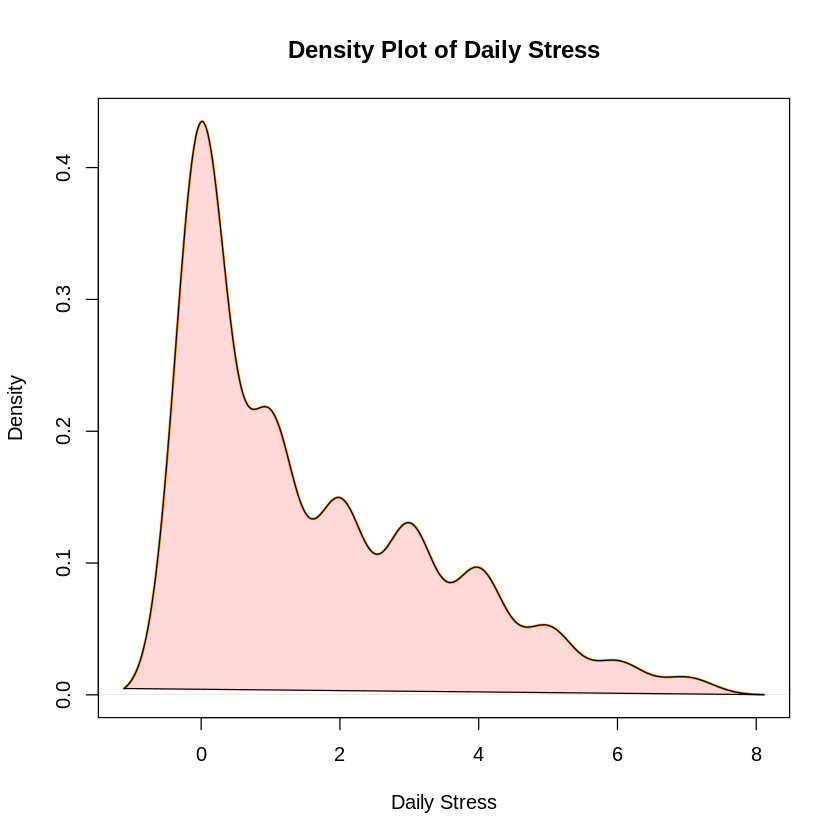

In [ ]:
# Descriptive Statistics
summary(MilitaryDF$STRESS_TOTAL)
sd(MilitaryDF$STRESS_TOTAL, na.rm = TRUE)
mean(MilitaryDF$STRESS_TOTAL, na.rm = TRUE)

# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}
describe(MilitaryDF$STRESS_TOTAL) #using psych package

# You can also add other descriptive stats here as per your requirement
# For example: quantiles, skewness, kurtosis, etc.
# Example:
quantile(MilitaryDF$STRESS_TOTAL, probs = c(0.25, 0.5, 0.75), na.rm = TRUE)
#For more details about describe() function, see ?describe


# Histogram
hist(MilitaryDF$STRESS_TOTAL,
     main = "Histogram of Daily Stress",      # Updated title
     xlab = "Daily Stress",                  # Updated x-axis label
     ylab = "Frequency",
     col = "darkorange")  # Light red color

# Boxplot
boxplot(MilitaryDF$STRESS_TOTAL,
        main = "Boxplot of Daily Stress",      # Updated title
        ylab = "Daily Stress",                  # Updated y-axis label
        col = "darkorange")  # Light red color

# Density Plot
plot(density(MilitaryDF$STRESS_TOTAL, na.rm = TRUE),
     main = "Density Plot of Daily Stress",  # Updated title
     xlab = "Daily Stress",                # Updated x-axis label
     col = "darkorange",                    # Light red color
     lwd = 2)
polygon(density(MilitaryDF$STRESS_TOTAL, na.rm = TRUE),
        col = rgb(1, 0.5, 0.5, alpha = 0.3)) # Light red shading

In [ ]:
# Install necessary packages if not already installed
if(!require(dplyr)){install.packages("dplyr")}
if(!require(psych)){install.packages("psych")}

# Select variables starting with "HELP-SEEKING_"
help_seeking_vars <- MilitaryDF %>%
  select(starts_with("HELP_SEEKING_")) %>%
  names()

# Loop through each variable and print descriptive statistics
for (var in help_seeking_vars) {
  print(paste("Descriptive Statistics for", var))
  print(describe(MilitaryDF[[var]])) # Using describe() from psych package
}

[1] "Descriptive Statistics for HELP_SEEKING_1"
   vars    n mean   sd median trimmed  mad min max range  skew kurtosis   se
X1    1 1495 4.43 1.69      5    4.53 1.48   1   7     6 -0.51    -0.56 0.04
[1] "Descriptive Statistics for HELP_SEEKING_2"
   vars    n mean   sd median trimmed  mad min max range  skew kurtosis   se
X1    1 1495 3.77 1.87      4    3.76 2.97   1   7     6 -0.05    -1.12 0.05
[1] "Descriptive Statistics for HELP_SEEKING_3"
   vars    n mean  sd median trimmed  mad min max range skew kurtosis   se
X1    1 1495 4.76 1.6      5    4.89 1.48   1   7     6 -0.7    -0.06 0.04


In [ ]:
# prompt: create new variable names HELP_TOTAL fromt he summation of the variables HELP_SEEKING_1 though 3

MilitaryDF$HELP_TOTAL <- MilitaryDF$HELP_SEEKING_1 + MilitaryDF$HELP_SEEKING_2 + MilitaryDF$HELP_SEEKING_3

[1] "Descriptive Statistics for HELP_TOTAL"
   vars    n  mean   sd median trimmed  mad min max range  skew kurtosis   se
X1    1 1495 12.96 4.29     13   13.16 4.45   3  21    18 -0.37    -0.27 0.11


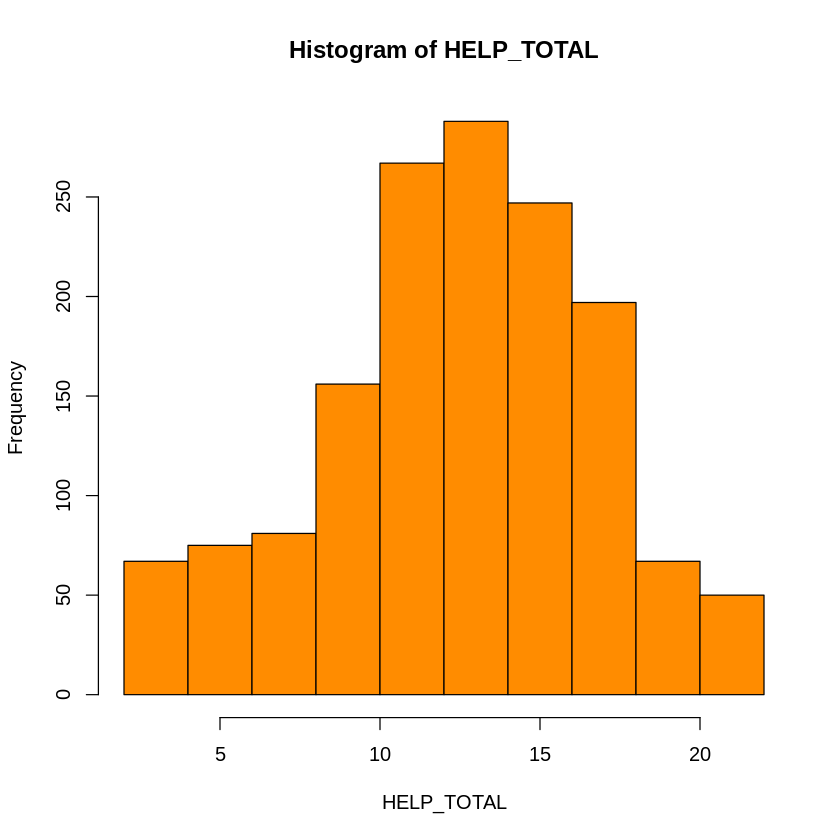

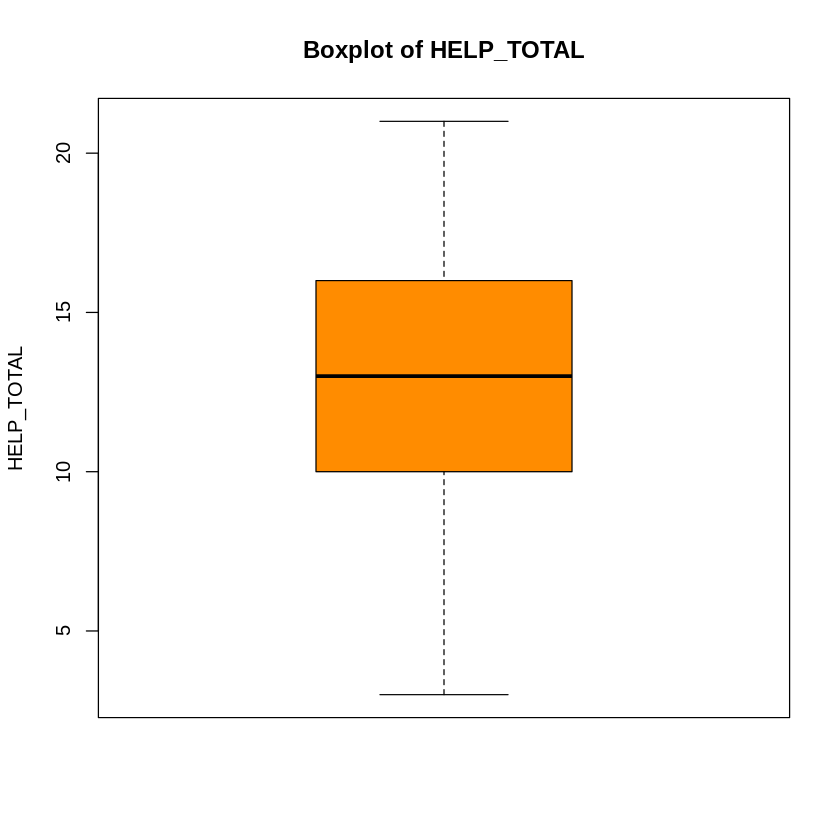

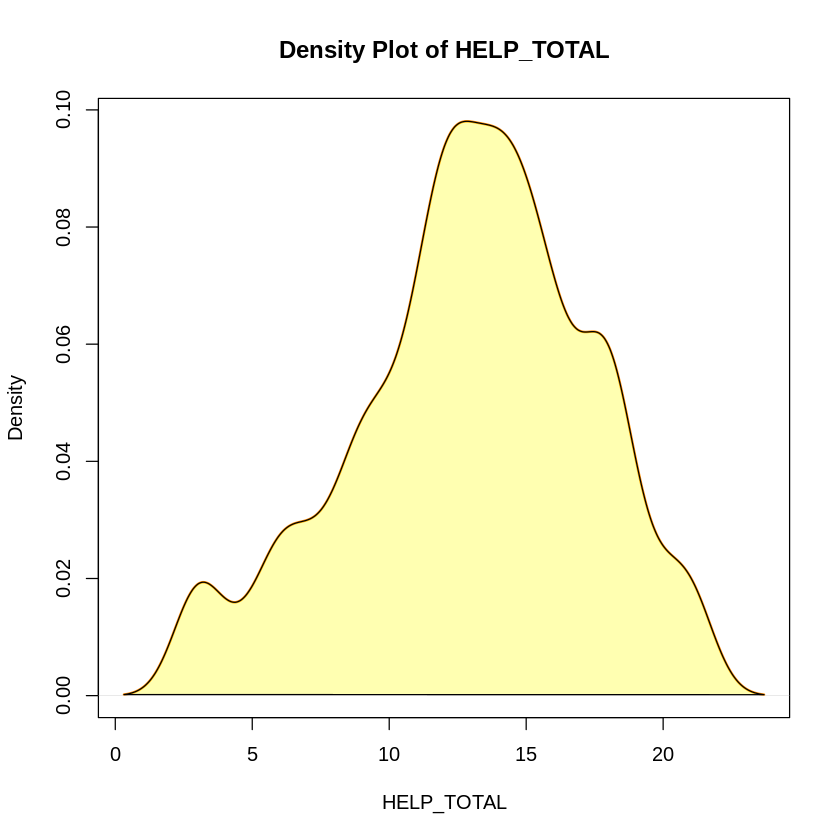

In [ ]:
# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}

# Function to create descriptive statistics and plots
descriptive_plots <- function(data, var_name) {
  # Descriptive Statistics
  print(paste("Descriptive Statistics for", var_name))
  print(describe(data[[var_name]]))  # Using describe() from psych package
  summary(data[[var_name]])

  # Histogram
  hist(data[[var_name]],
       main = paste("Histogram of", var_name),
       xlab = var_name,
       ylab = "Frequency",
       col = "dark orange") # Changed color to yellow

  # Boxplot
  boxplot(data[[var_name]],
          main = paste("Boxplot of", var_name),
          ylab = var_name,
          col = "dark orange") # Changed color to yellow

  # Density Plot
  plot(density(data[[var_name]], na.rm = TRUE),
       main = paste("Density Plot of", var_name),
       xlab = var_name,
       col = "darkorange", # Changed color to yellow
       lwd = 2)
  polygon(density(data[[var_name]], na.rm = TRUE),
          col = rgb(1, 1, 0, alpha = 0.3)) # Light yellow shading using rgb
}

# Apply the function to HELP_TOTAL
descriptive_plots(MilitaryDF, "HELP_TOTAL")

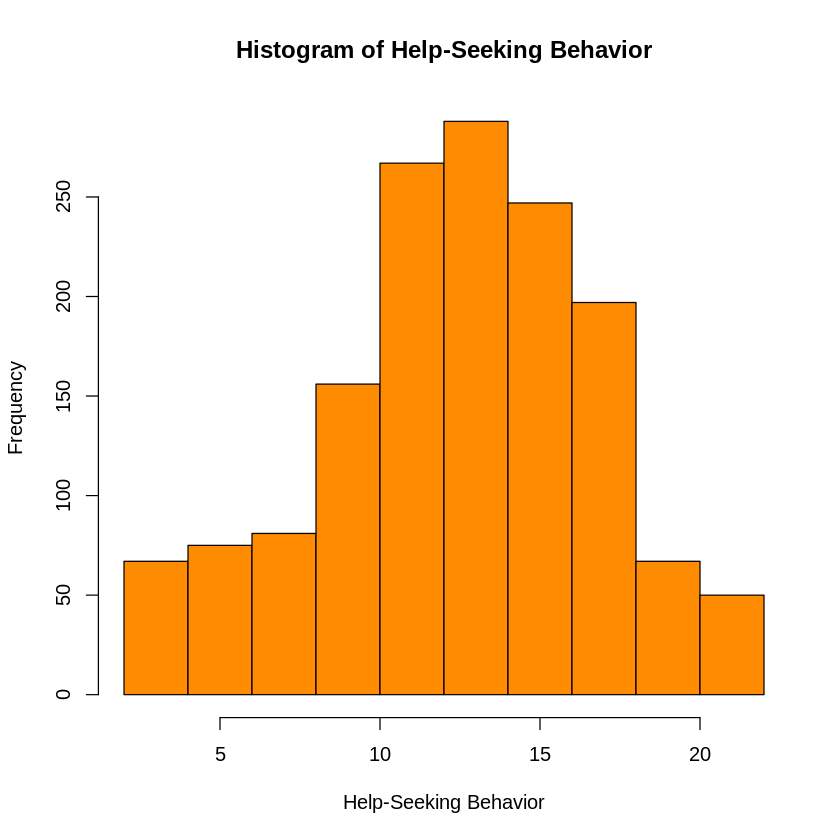

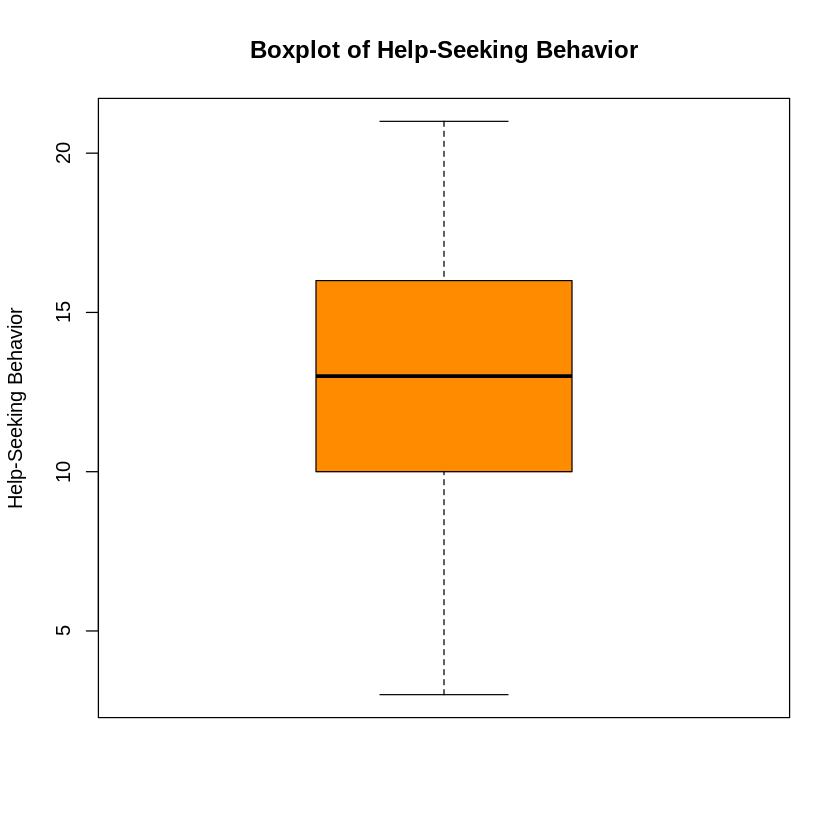

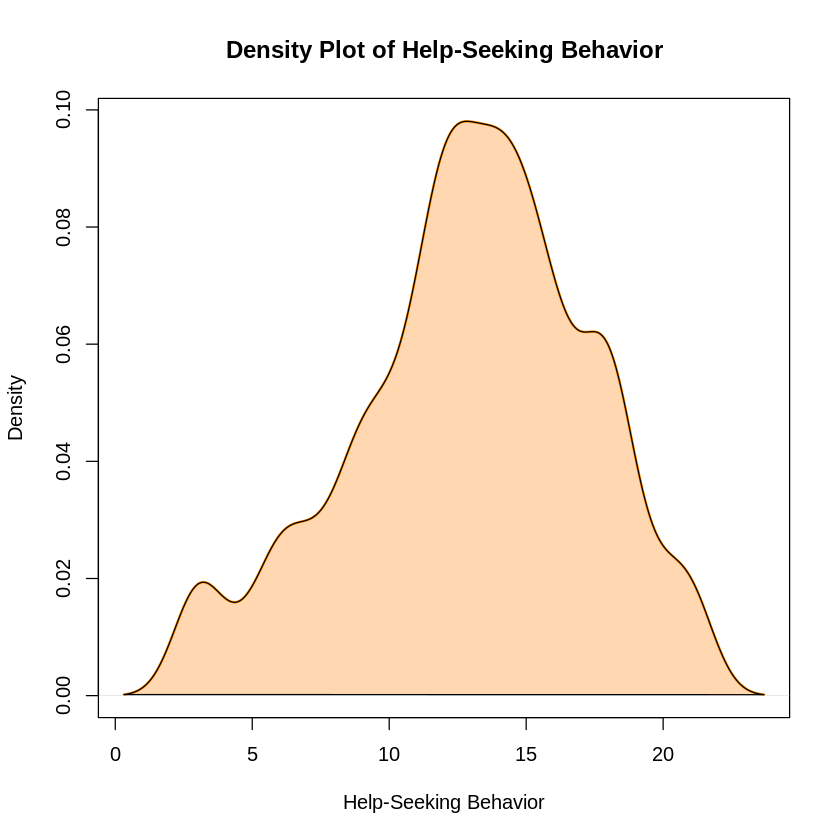

In [ ]:
# prompt: Label the graphs with "Help-Seeking Behavior"

# ... (previous code) ...

# Histogram
hist(MilitaryDF$HELP_TOTAL,
     main = "Histogram of Help-Seeking Behavior", # Updated title
     xlab = "Help-Seeking Behavior",             # Updated x-axis label
     ylab = "Frequency",
     col = "darkorange")

# Boxplot
boxplot(MilitaryDF$HELP_TOTAL,
        main = "Boxplot of Help-Seeking Behavior", # Updated title
        ylab = "Help-Seeking Behavior",             # Updated y-axis label
        col = "darkorange")

# Density Plot
plot(density(MilitaryDF$HELP_TOTAL, na.rm = TRUE),
     main = "Density Plot of Help-Seeking Behavior", # Updated title
     xlab = "Help-Seeking Behavior",                 # Updated x-axis label
     col = "darkorange",
     lwd = 2)
polygon(density(MilitaryDF$HELP_TOTAL, na.rm = TRUE),
        col = rgb(1, 0.5, 0, alpha = 0.3))

[1] "Descriptive Statistics for HELP_TOTAL"
   vars    n  mean   sd median trimmed  mad min max range  skew kurtosis   se
X1    1 1495 12.96 4.29     13   13.16 4.45   3  21    18 -0.37    -0.27 0.11


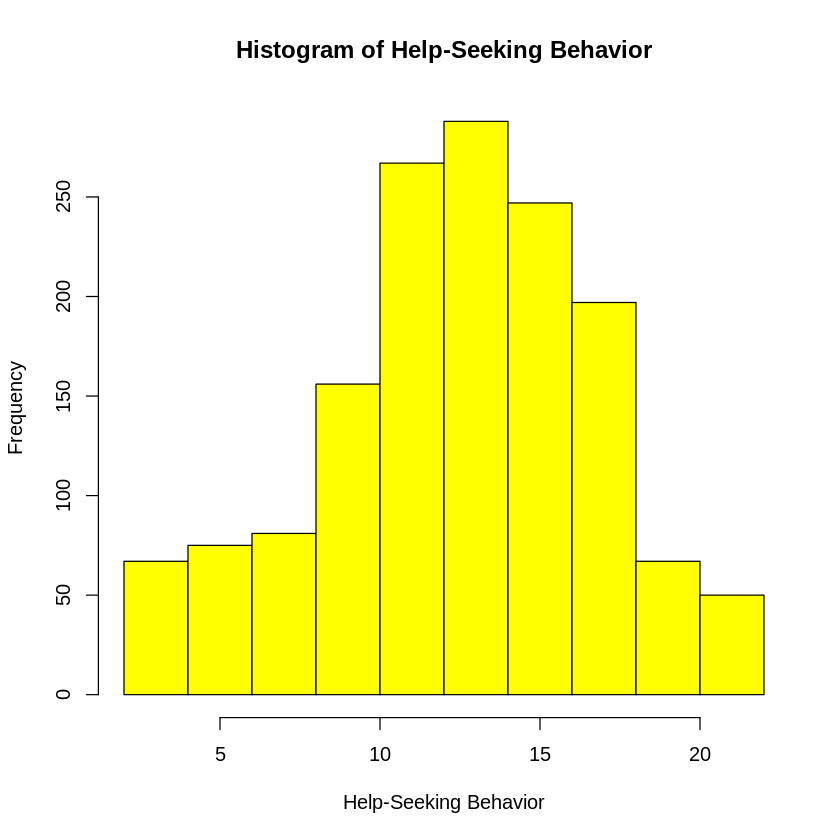

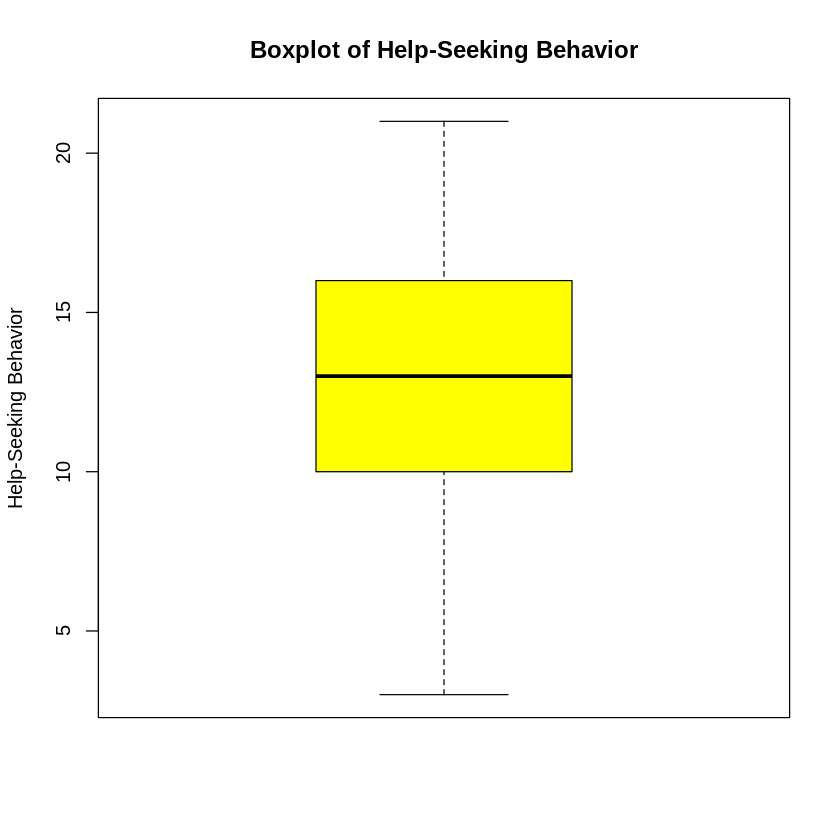

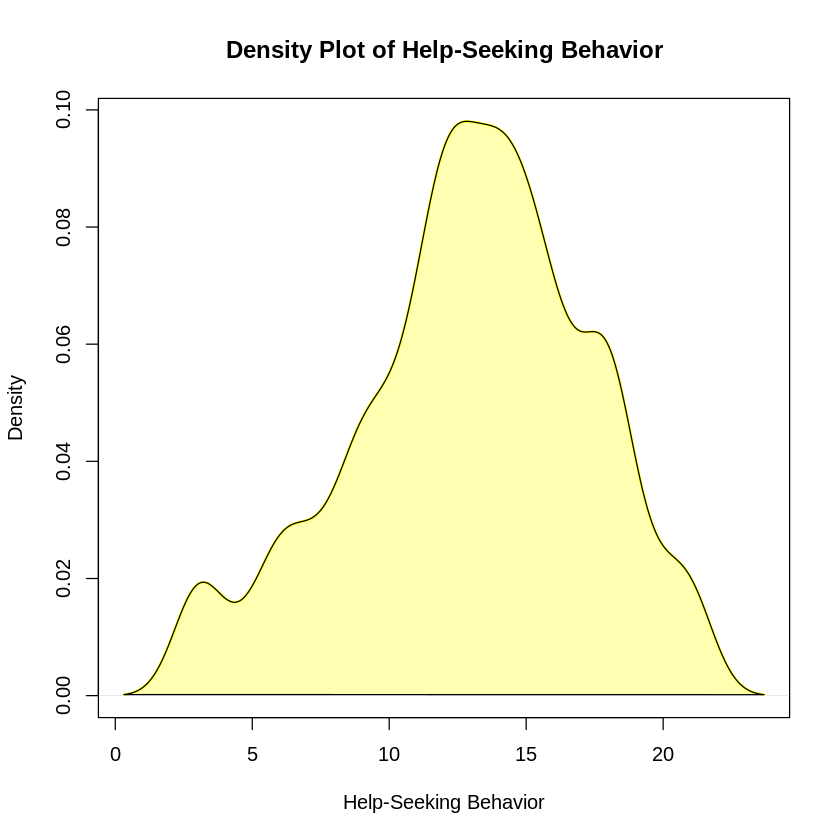

In [ ]:
# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}

# Function to create descriptive statistics and plots
descriptive_plots <- function(data, var_name, plot_label) { # Added plot_label argument
  # Descriptive Statistics
  print(paste("Descriptive Statistics for", var_name))
  print(describe(data[[var_name]]))  # Using describe() from psych package
  summary(data[[var_name]])

  # Histogram
  hist(data[[var_name]],
       main = paste("Histogram of", plot_label), # Using plot_label in title
       xlab = plot_label,                       # Using plot_label in x-axis label
       ylab = "Frequency",
       col = "yellow")

  # Boxplot
  boxplot(data[[var_name]],
          main = paste("Boxplot of", plot_label), # Using plot_label in title
          ylab = plot_label,                       # Using plot_label in y-axis label
          col = "yellow")

  # Density Plot
  plot(density(data[[var_name]], na.rm = TRUE),
       main = paste("Density Plot of", plot_label), # Using plot_label in title
       xlab = plot_label,                       # Using plot_label in x-axis label
       col = "yellow",
       lwd = 2)
  polygon(density(data[[var_name]], na.rm = TRUE),
          col = rgb(1, 1, 0, alpha = 0.3))
}

# Apply the function to HELP_TOTAL with the desired label
descriptive_plots(MilitaryDF, "HELP_TOTAL", "Help-Seeking Behavior")

In [ ]:
MilitaryDF$LONE_TOTAL <- MilitaryDF$LONELINESS_1 + MilitaryDF$LONELINESS_2 + MilitaryDF$LONELINESS_3

In [ ]:
# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}

# Calculate statistics
summary_data <- summary(MilitaryDF$HELP_TOTAL)
sd_data <- sd(MilitaryDF$HELP_TOTAL, na.rm = TRUE)
mean_data <- mean(MilitaryDF$HELP_TOTAL, na.rm = TRUE)

# Combine into a data frame
table_data <- data.frame(
  Statistic = c("Minimum", "1st Quartile", "Median", "3rd Quartile", "Maximum", "SD", "Mean"),
  Value = c(summary_data[1], summary_data[2], summary_data[3], summary_data[5], summary_data[6], sd_data, mean_data)
)

# Print the table
print(table_data)

     Statistic     Value
1      Minimum  3.000000
2 1st Quartile 10.000000
3       Median 13.000000
4 3rd Quartile 16.000000
5      Maximum 21.000000
6           SD  4.285222
7         Mean 12.959197


[1] "Descriptive Statistics for LONE_TOTAL"
   vars    n mean   sd median trimmed  mad min max range skew kurtosis   se
X1    1 1495 4.89 1.89      4    4.66 1.48   3   9     6 0.66    -0.69 0.05


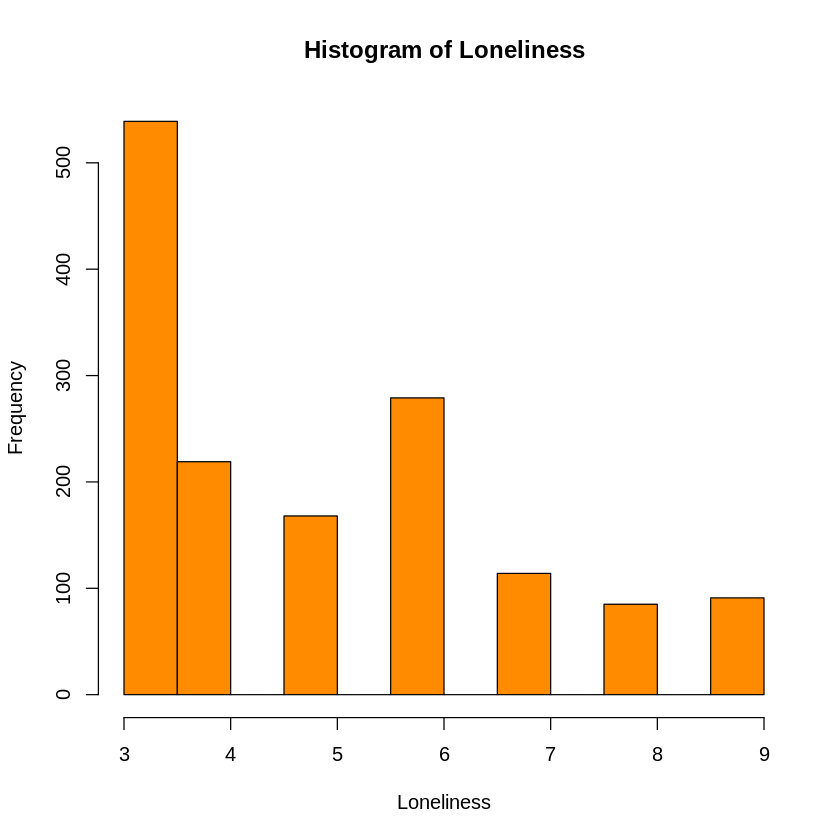

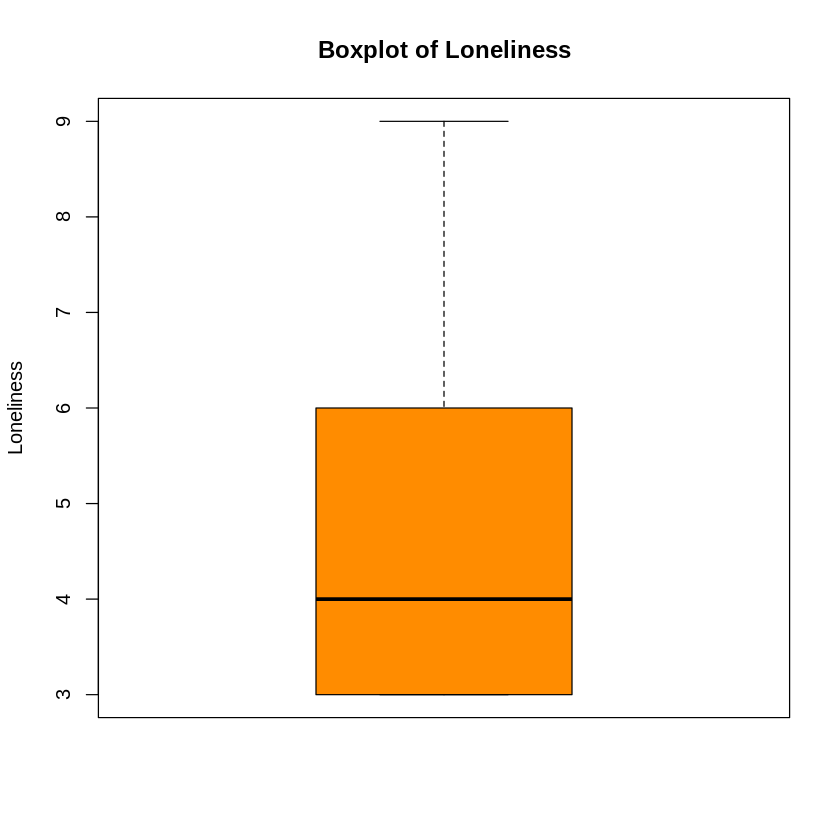

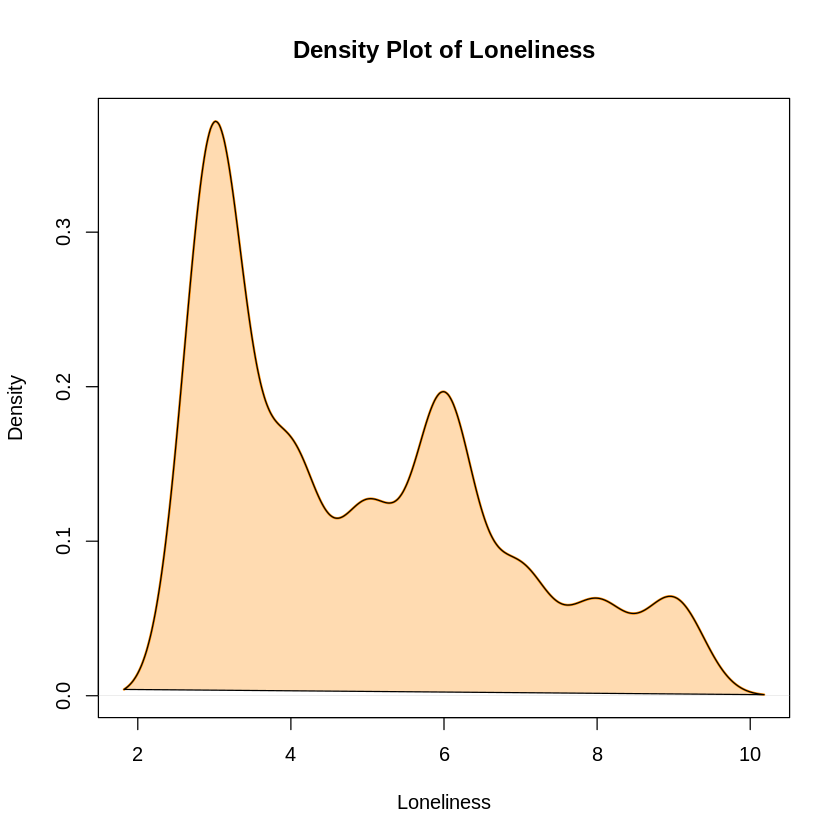

In [ ]:
# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}

# Function to create descriptive statistics and plots
descriptive_plots <- function(data, var_name, plot_label, color_name) {
  # Descriptive Statistics
  print(paste("Descriptive Statistics for", var_name))
  print(describe(data[[var_name]]))  # Using describe() from psych package
  summary(data[[var_name]])

  # Histogram
  hist(data[[var_name]],
       main = paste("Histogram of", plot_label),
       xlab = plot_label,
       ylab = "Frequency",
       col = color_name)

  # Boxplot
  boxplot(data[[var_name]],
          main = paste("Boxplot of", plot_label),
          ylab = plot_label,
          col = color_name)

  # Density Plot
  plot(density(data[[var_name]], na.rm = TRUE),
       main = paste("Density Plot of", plot_label),
       xlab = plot_label,
       col = color_name,
       lwd = 2)
  polygon(density(data[[var_name]], na.rm = TRUE),
          col = adjustcolor(color_name, alpha.f = 0.3)) # Lighten color for shading
}

# Apply the function to LONE_TOTAL with desired settings
descriptive_plots(MilitaryDF, "LONE_TOTAL", "Loneliness", "darkorange")

In [ ]:
# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}

# Select columns starting with "LONELINESS_"
LONELINESS_cols <- grep("^LONELINESS_", names(MilitaryDF), value = TRUE)

# Calculate the row sums and create the new variable
MilitaryDF$LONE_TOTAL <- rowSums(MilitaryDF[, LONELINESS_cols], na.rm = TRUE)

# Calculate the 5-point summary
summary(MilitaryDF$LONE_TOTAL)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  3.000   3.000   4.000   4.886   6.000   9.000 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   3.00   16.00   18.00   17.38   20.00   21.00 

[1] 3.650563

[1] 17.37926

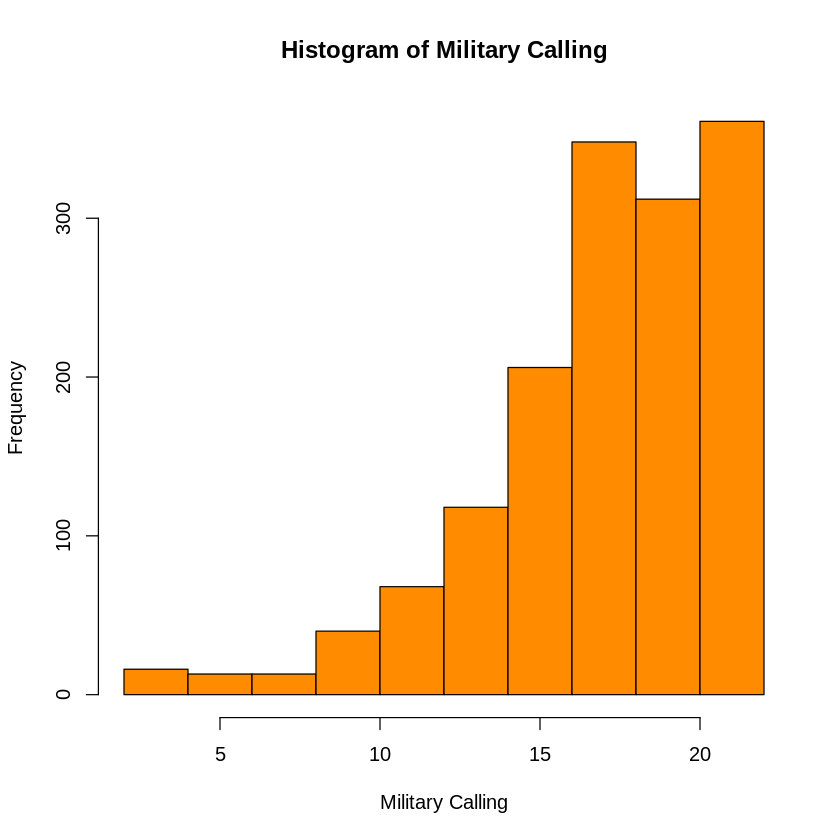

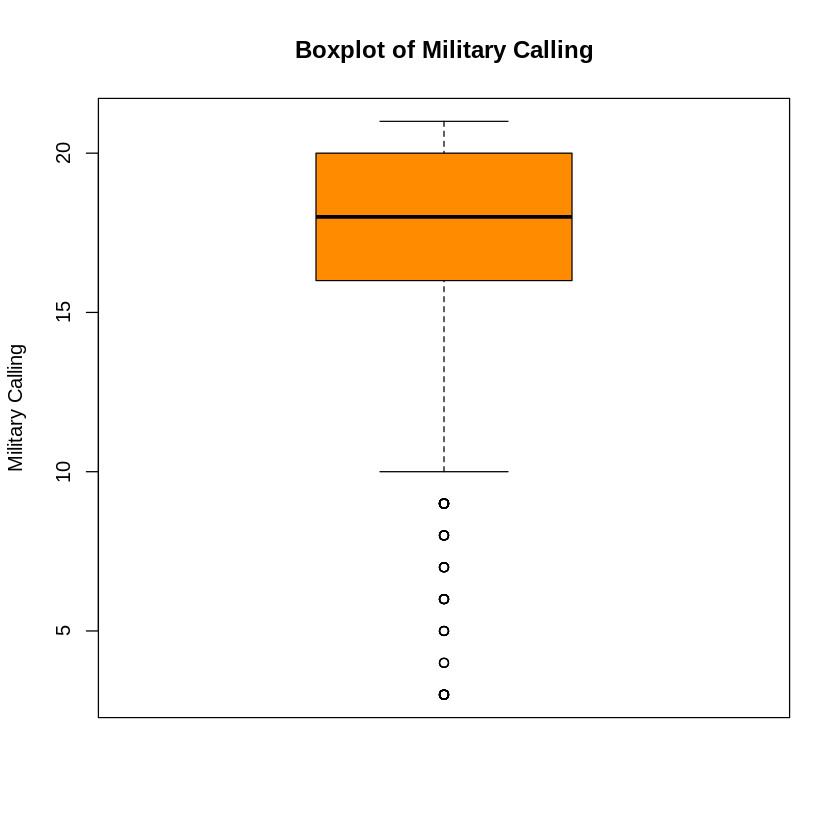

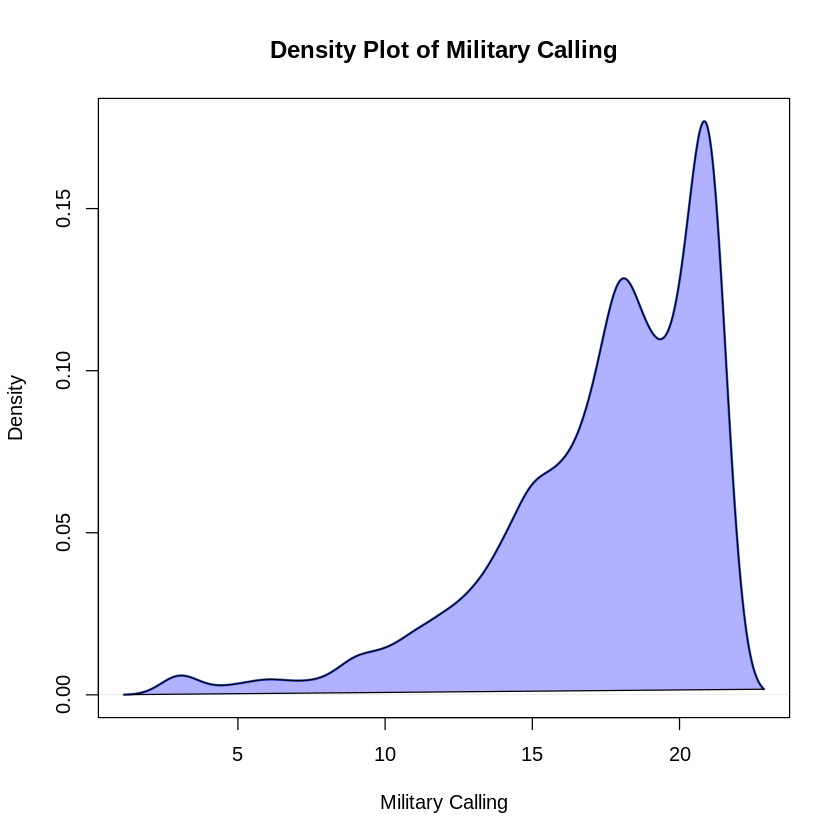

In [ ]:
# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}

# Create MIL_CALL variable
MilitaryDF$MIL_CALL <- MilitaryDF$NPIS_1 + MilitaryDF$NPIS_2 + MilitaryDF$NPIS_3

# Descriptive statistics with 5-point summary, SD, and Mean
summary(MilitaryDF$MIL_CALL)
sd(MilitaryDF$MIL_CALL, na.rm = TRUE)
mean(MilitaryDF$MIL_CALL, na.rm = TRUE)

# Histogram
hist(MilitaryDF$MIL_CALL,
     main = "Histogram of Military Calling",
     xlab = "Military Calling",
     ylab = "Frequency",
     col = "darkorange")

# Box plot
boxplot(MilitaryDF$MIL_CALL,
        main = "Boxplot of Military Calling",
        ylab = "Military Calling",
        col = "darkorange")

# Density plot
plot(density(MilitaryDF$MIL_CALL, na.rm = TRUE),
     main = "Density Plot of Military Calling",
     xlab = "Military Calling",
     col = "royalblue",
     lwd = 2)
polygon(density(MilitaryDF$MIL_CALL, na.rm = TRUE), col = rgb(0, 0, 1, alpha = 0.3)) # Light royal blue shading

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   1.000   1.000   1.722   2.000   5.000 

[1] 1.014699

[1] 1.721739

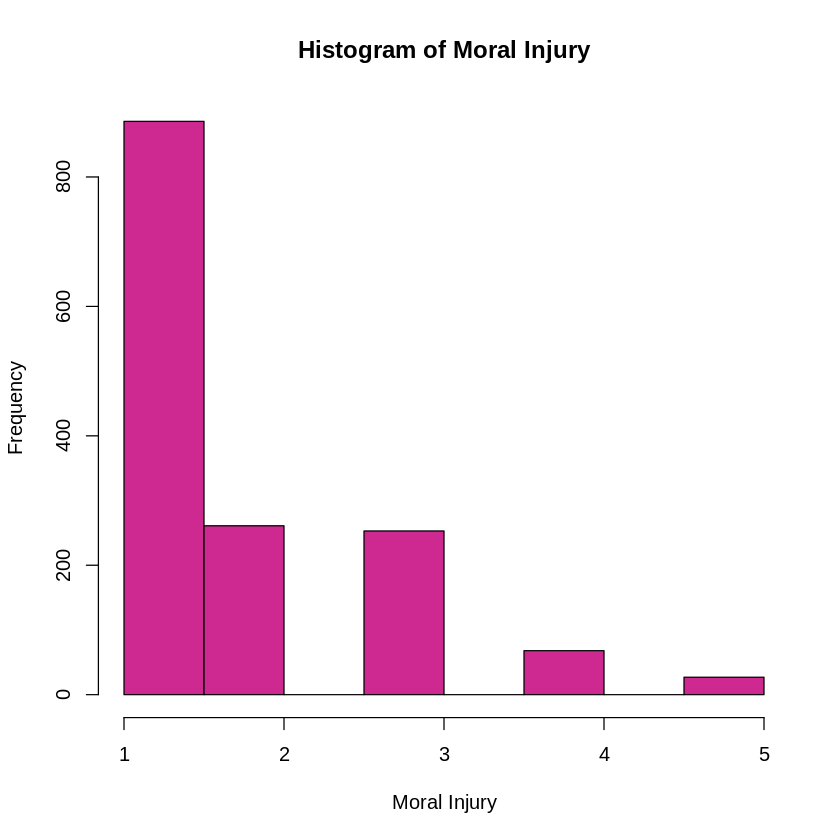

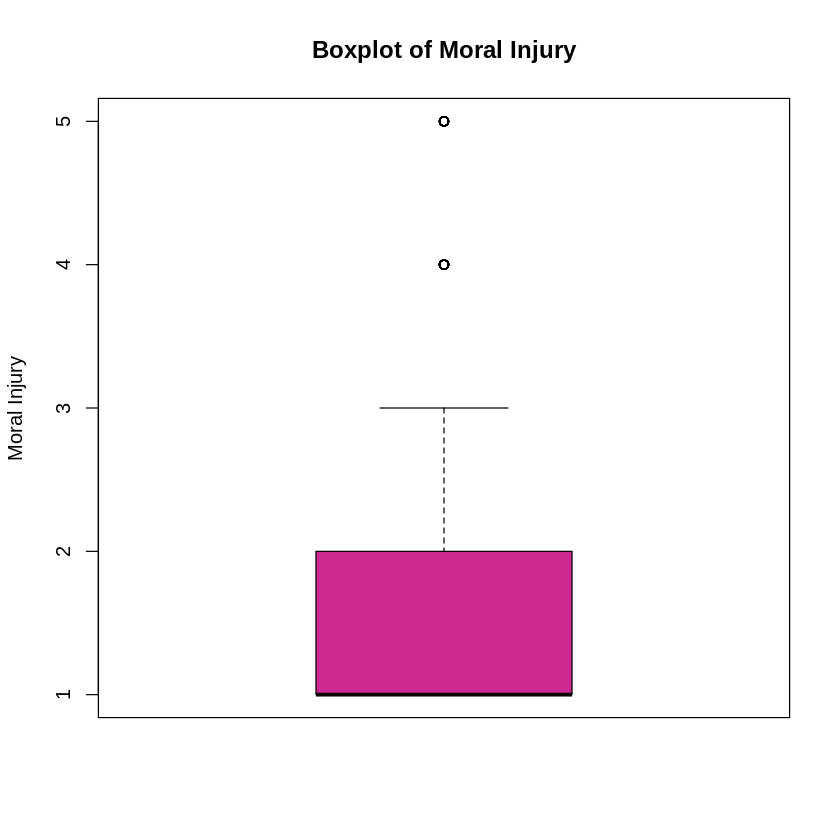

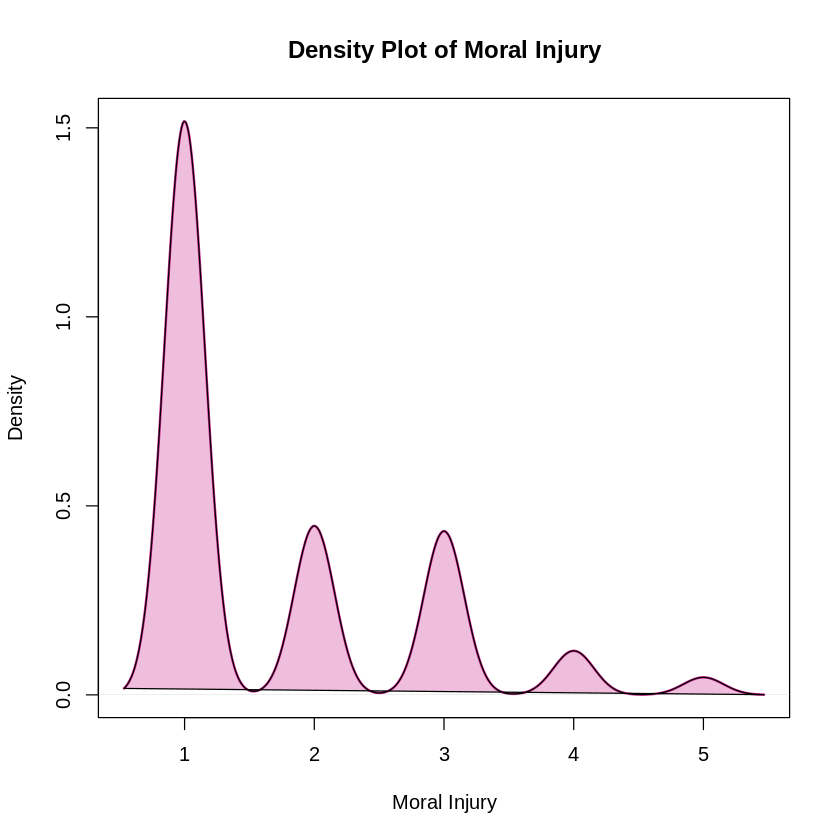

In [ ]:
# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}

# Descriptive Statistics
summary(MilitaryDF$MISSSF_11)
sd(MilitaryDF$MISSSF_11, na.rm = TRUE)
mean(MilitaryDF$MISSSF_11, na.rm = TRUE)


# Histogram
hist(MilitaryDF$MISSSF_11,
     main = "Histogram of Moral Injury",
     xlab = "Moral Injury",
     ylab = "Frequency",
     col = "maroon3")

# Box plot
boxplot(MilitaryDF$MISSSF_11,
        main = "Boxplot of Moral Injury",
        ylab = "Moral Injury",
        col = "maroon3")

# Density plot
plot(density(MilitaryDF$MISSSF_11, na.rm = TRUE),
     main = "Density Plot of Moral Injury",
     xlab = "Moral Injury",
     col = "maroon3",
     lwd = 2)
polygon(density(MilitaryDF$MISSSF_11, na.rm = TRUE), col = adjustcolor("maroon3", alpha.f = 0.3)) # Light maroon3 shading

In [ ]:
# Create the new variable PUB_SER
MilitaryDF$PUB_SER <- MilitaryDF$PUBLIC_1 + MilitaryDF$PUBLIC_2 + MilitaryDF$PUBLIC_3 + MilitaryDF$PUBLIC_4 + MilitaryDF$PUBLIC_5

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   5.00   18.00   20.00   19.96   22.00   25.00 

[1] 3.381142

[1] 19.95987

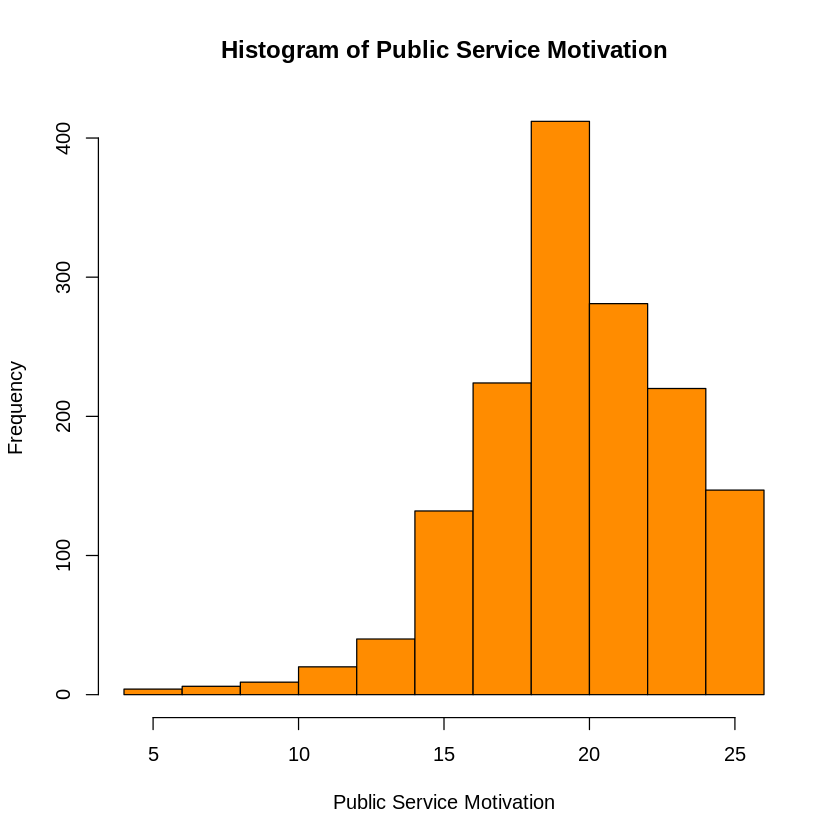

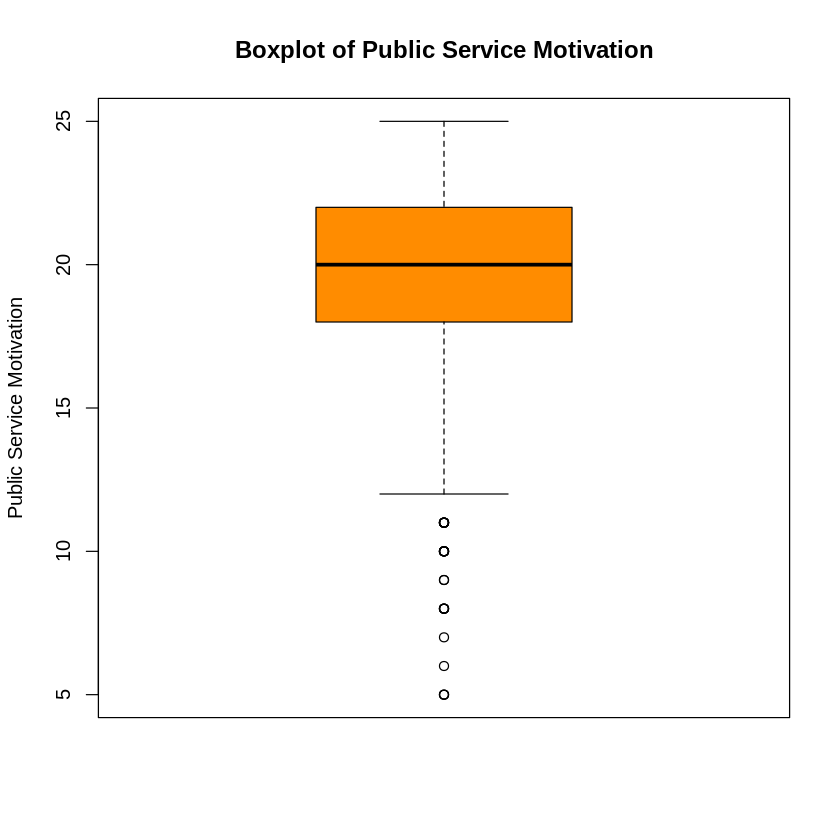

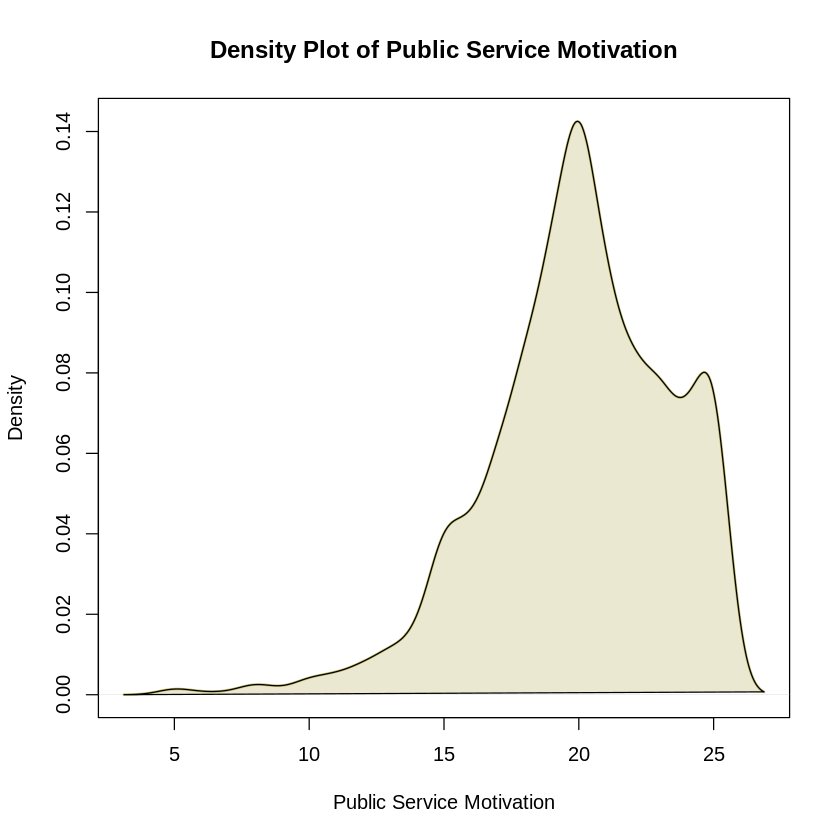

In [ ]:
# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}

# Descriptive Statistics
summary(MilitaryDF$PUB_SER)
sd(MilitaryDF$PUB_SER, na.rm = TRUE)
mean(MilitaryDF$PUB_SER, na.rm = TRUE)

# Histogram
hist(MilitaryDF$PUB_SER,
     main = "Histogram of Public Service Motivation",
     xlab = "Public Service Motivation",
     ylab = "Frequency",
     col = "darkorange")

# Box plot
boxplot(MilitaryDF$PUB_SER,
        main = "Boxplot of Public Service Motivation",
        ylab = "Public Service Motivation",
        col = "darkorange")

# Density plot
plot(density(MilitaryDF$PUB_SER, na.rm = TRUE),
     main = "Density Plot of Public Service Motivation",
     xlab = "Public Service Motivation",
     col = "darkkhaki",
     lwd = 2)
polygon(density(MilitaryDF$PUB_SER, na.rm = TRUE), col = adjustcolor("darkkhaki", alpha.f = 0.3)) # Light darkkhaki shading

In [ ]:
summary(MilitaryDF$SBQ_TOTAL)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   4.00   12.00   12.00   22.22   26.00   92.00 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   4.00   12.00   12.00   22.22   26.00   92.00 

[1] 16.27117

[1] 22.21672

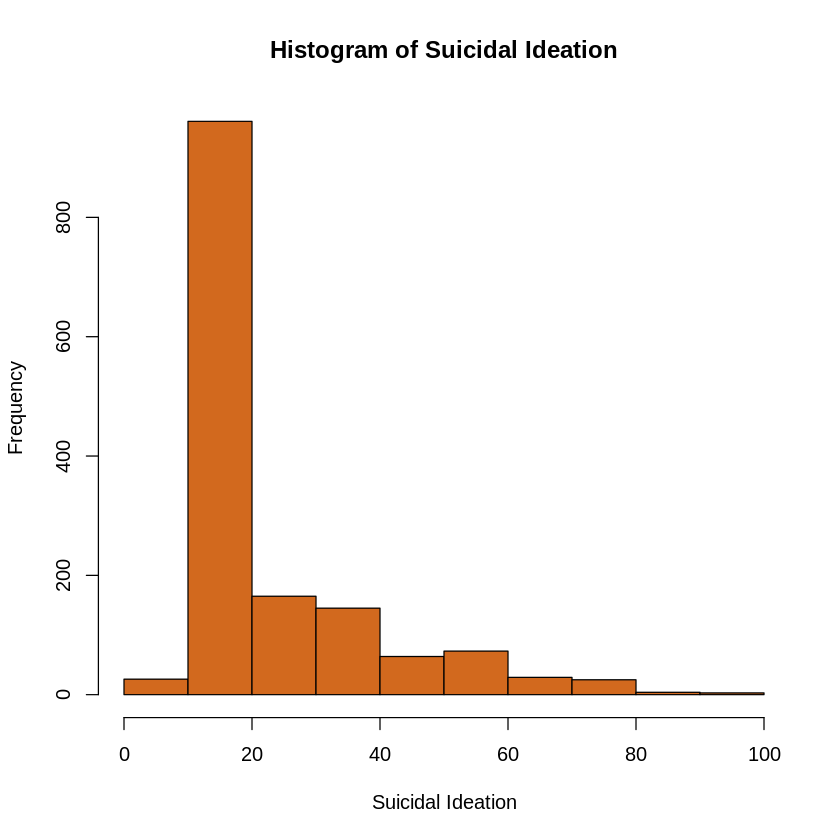

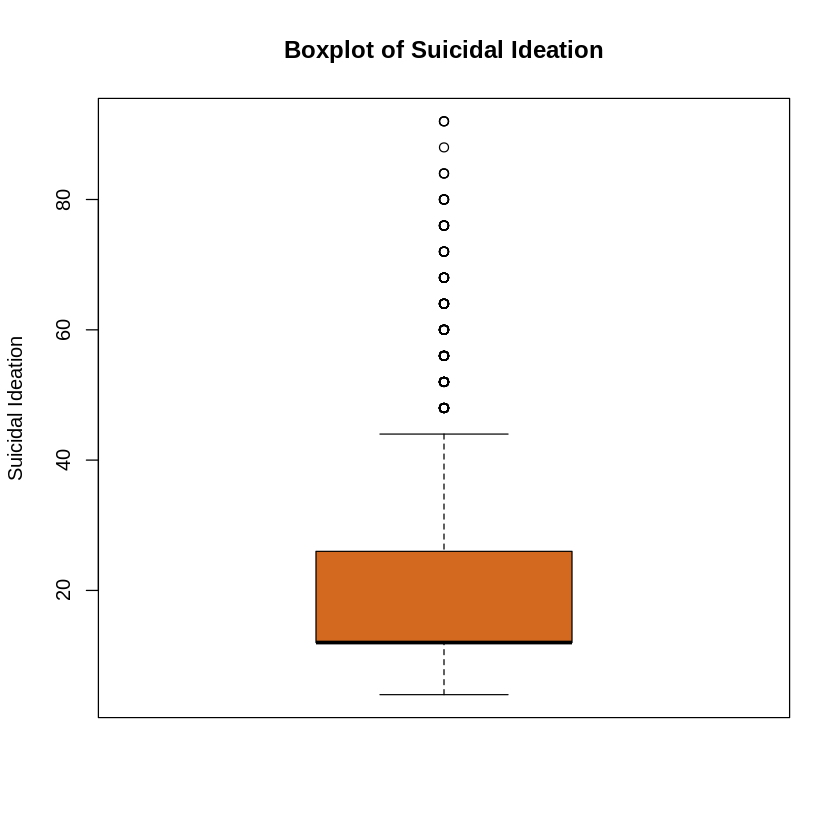

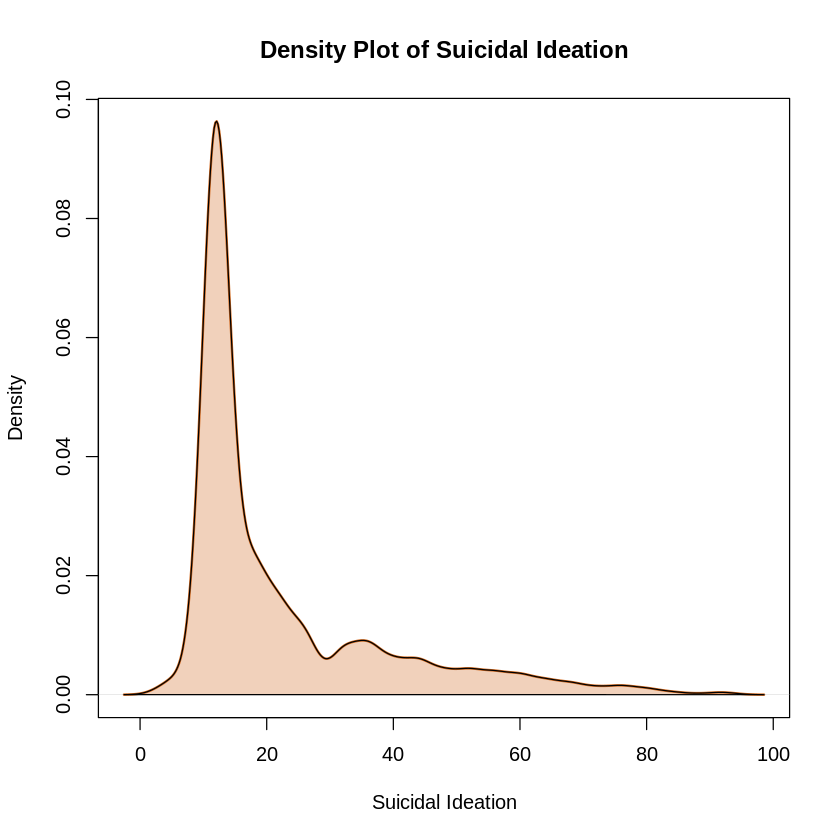

In [ ]:
# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}

# Descriptive Statistics
summary(MilitaryDF$SBQ_TOTAL)
sd(MilitaryDF$SBQ_TOTAL, na.rm = TRUE)
mean(MilitaryDF$SBQ_TOTAL, na.rm = TRUE)

# Histogram
hist(MilitaryDF$SBQ_TOTAL,
     main = "Histogram of Suicidal Ideation",
     xlab = "Suicidal Ideation",
     ylab = "Frequency",
     col = "chocolate")

# Box plot
boxplot(MilitaryDF$SBQ_TOTAL,
        main = "Boxplot of Suicidal Ideation",
        ylab = "Suicidal Ideation",
        col = "chocolate")

# Density plot
plot(density(MilitaryDF$SBQ_TOTAL, na.rm = TRUE),
     main = "Density Plot of Suicidal Ideation",
     xlab = "Suicidal Ideation",
     col = "chocolate",
     lwd = 2)
polygon(density(MilitaryDF$SBQ_TOTAL, na.rm = TRUE), col = adjustcolor("chocolate", alpha.f = 0.3)) # Light chocolate shading

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   4.000   4.000   3.957   5.000   5.000 

[1] 0.8781804

[1] 3.956522

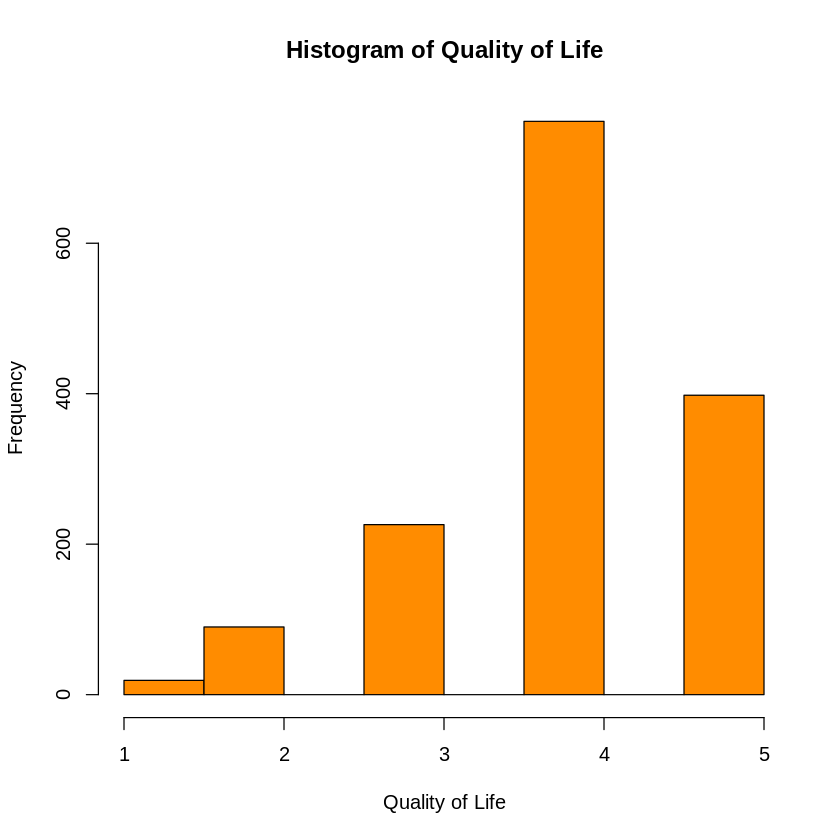

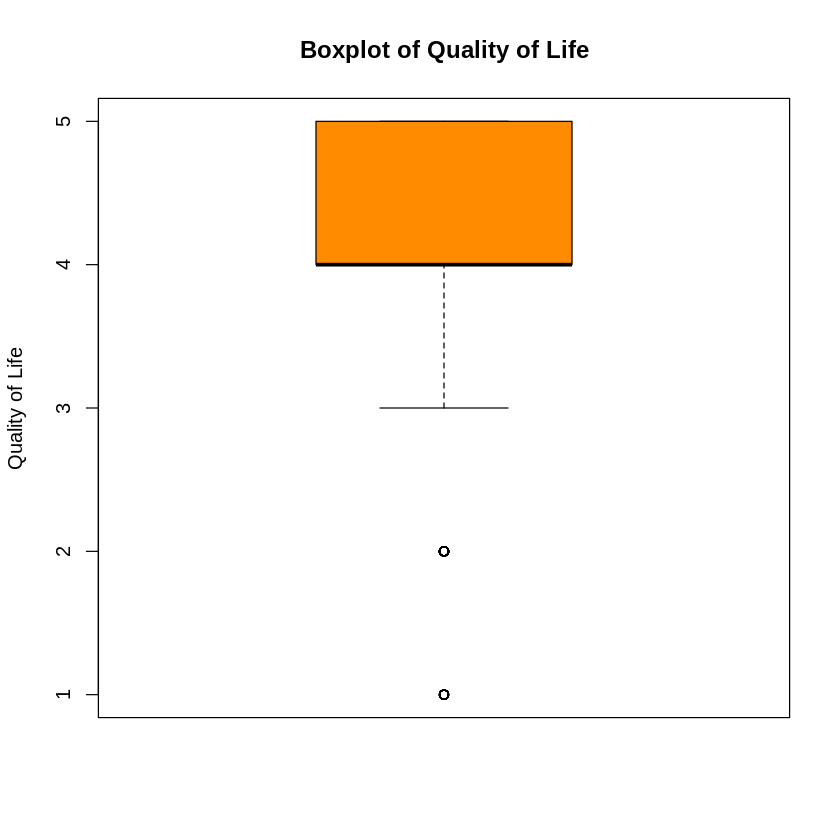

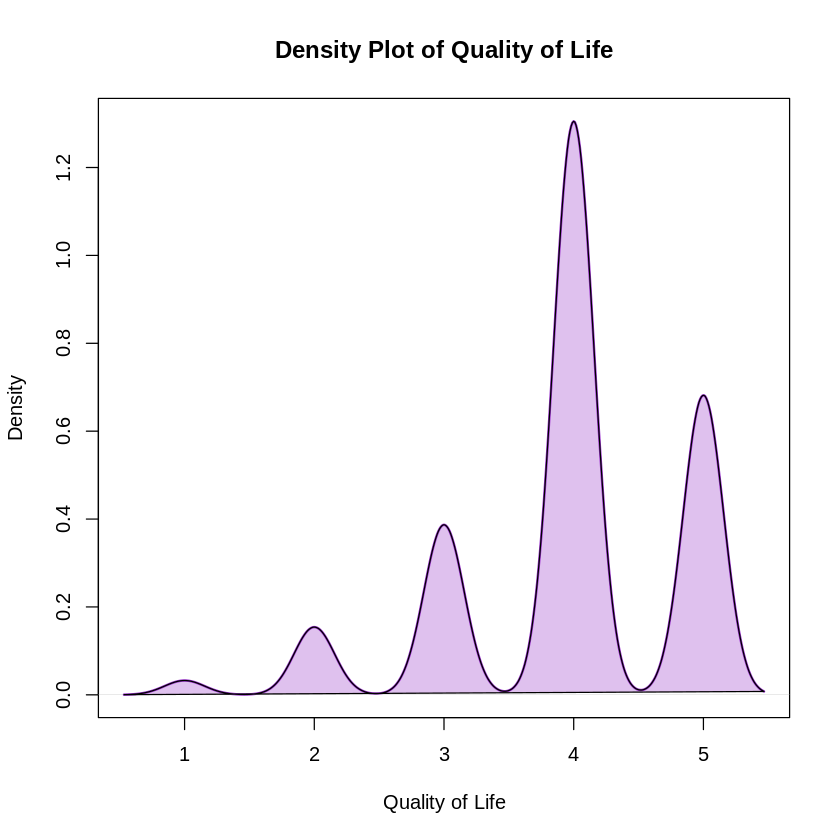

In [ ]:
# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}

# Descriptive Statistics
summary(MilitaryDF$WHO1)
sd(MilitaryDF$WHO1, na.rm = TRUE)
mean(MilitaryDF$WHO1, na.rm = TRUE)

# Histogram
hist(MilitaryDF$WHO1,
     main = "Histogram of Quality of Life",
     xlab = "Quality of Life",
     ylab = "Frequency",
     col = "darkorange")

# Box plot
boxplot(MilitaryDF$WHO1,
        main = "Boxplot of Quality of Life",
        ylab = "Quality of Life",
        col = "darkorange")

# Density plot
plot(density(MilitaryDF$WHO1, na.rm = TRUE),
     main = "Density Plot of Quality of Life",
     xlab = "Quality of Life",
     col = "darkorchid",
     lwd = 2)
polygon(density(MilitaryDF$WHO1, na.rm = TRUE), col = adjustcolor("darkorchid", alpha.f = 0.3)) # Light darkorchid shading

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   4.000   4.000   3.957   5.000   5.000 

[1] 0.8781804

[1] 3.956522


(0.996,1.4]   (1.4,1.8]   (1.8,2.2]   (2.2,2.6]     (2.6,3]     (3,3.4] 
         19           0          90           0         226           0 
  (3.4,3.8]   (3.8,4.2]   (4.2,4.6]     (4.6,5] 
          0         762           0         398 

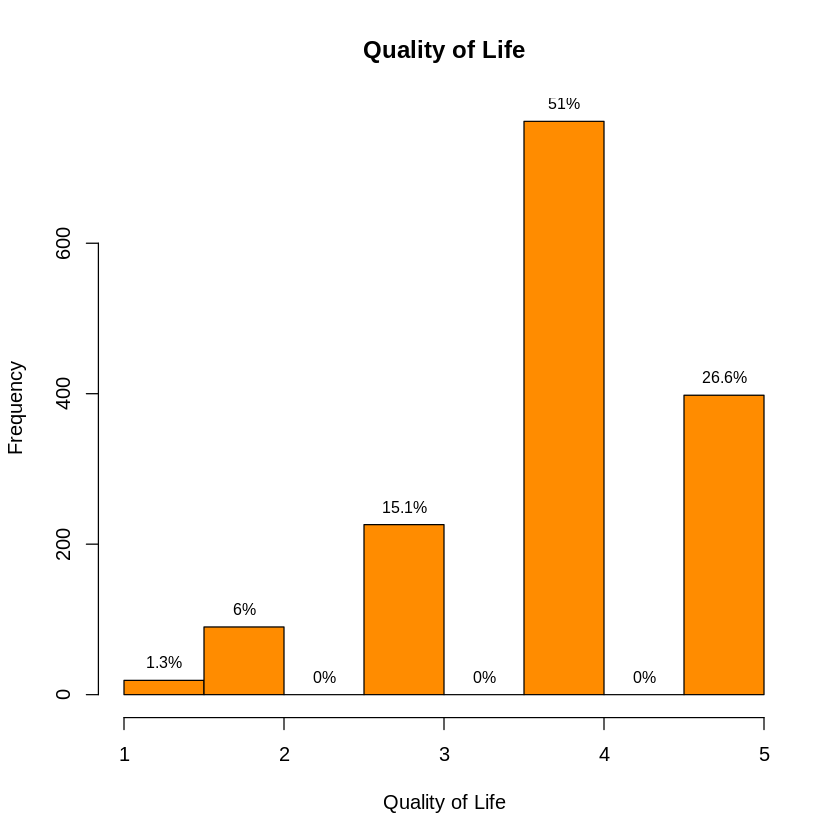

In [ ]:
# prompt: Descriptive statistic for WHO_1 with histogram and frequency table.  Use the color darkorange.  Title "Quality of Life".  include the % frequency centered at the top of each bar

# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}

# Descriptive Statistics
summary(MilitaryDF$WHO1)
sd(MilitaryDF$WHO1, na.rm = TRUE)
mean(MilitaryDF$WHO1, na.rm = TRUE)

# Histogram with percentage frequency
hist(MilitaryDF$WHO1,
     main = "Quality of Life",
     xlab = "Quality of Life",
     ylab = "Frequency",
     col = "darkorange",
     breaks = 10) # Adjust breaks as needed


# Calculate percentage frequencies
counts <- hist(MilitaryDF$WHO1, plot = FALSE, breaks = 10)
percent_freq <- round(100 * counts$counts / sum(counts$counts), 1)

# Add percentage frequency labels to the histogram
text(counts$mids, counts$counts, labels = paste0(percent_freq, "%"), pos = 3, cex = 0.8)

# Frequency Table
freq_table <- table(cut(MilitaryDF$WHO1, breaks = 10))
freq_table


  1   2   3   4   5   6   7 
366  36 491 115  42 122 323 


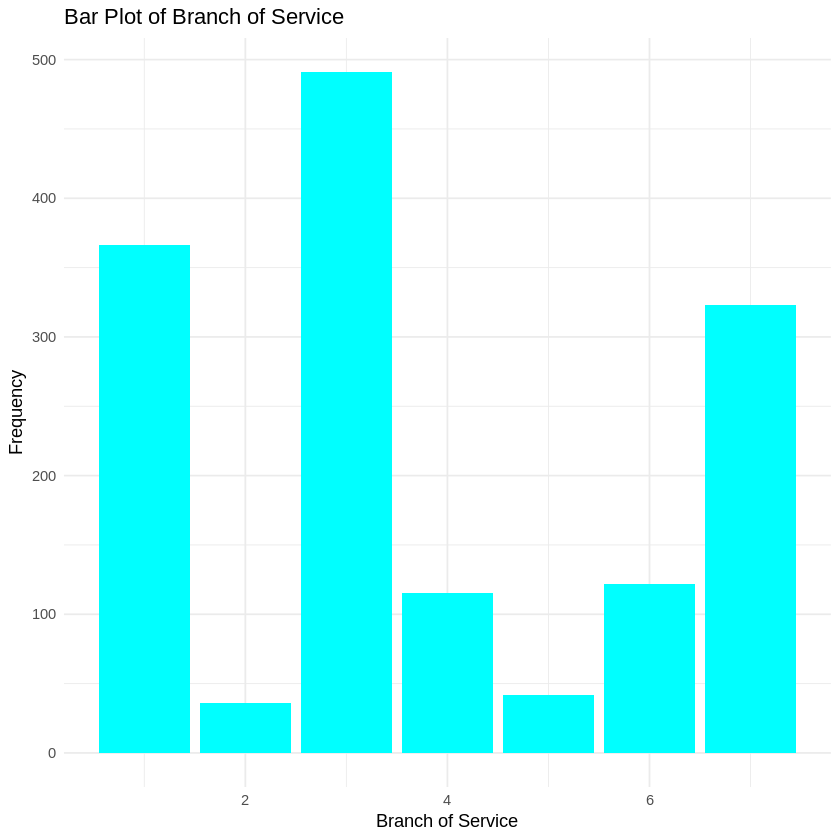

In [ ]:
# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2")}

# Descriptive Statistics (Frequency Table)
branch_freq <- table(MilitaryDF$BRANCH)
print(branch_freq)

# Bar plot with cyan color and custom label
ggplot(MilitaryDF, aes(x = BRANCH)) +
  geom_bar(fill = "cyan") +  # Set bar color to cyan
  labs(title = "Bar Plot of Branch of Service",
       x = "Branch of Service",
       y = "Frequency") +
  theme_minimal()

In [ ]:
# Descriptive Statistics for BRANCH

# Install necessary packages (if not already installed)
if(!require(dplyr)){install.packages("dplyr")}

# Calculate frequency table for BRANCH
branch_freq <- table(MilitaryDF$BRANCH)

# Calculate percentage for each branch
branch_perc <- prop.table(branch_freq) * 100

# Print the results
print("Descriptive Statistics for BRANCH")
print("Frequency Table:")
print(branch_freq)
print("Percentage:")
print(branch_perc)

[1] "Descriptive Statistics for BRANCH"
[1] "Frequency Table:"

  1   2   3   4   5   6   7 
366  36 491 115  42 122 323 
[1] "Percentage:"

        1         2         3         4         5         6         7 
24.481605  2.408027 32.842809  7.692308  2.809365  8.160535 21.605351 



  1   2   3   4   5   6   7 
366  36 491 115  42 122 323 

         1          2          3          4          5          6          7 
0.24481605 0.02408027 0.32842809 0.07692308 0.02809365 0.08160535 0.21605351 


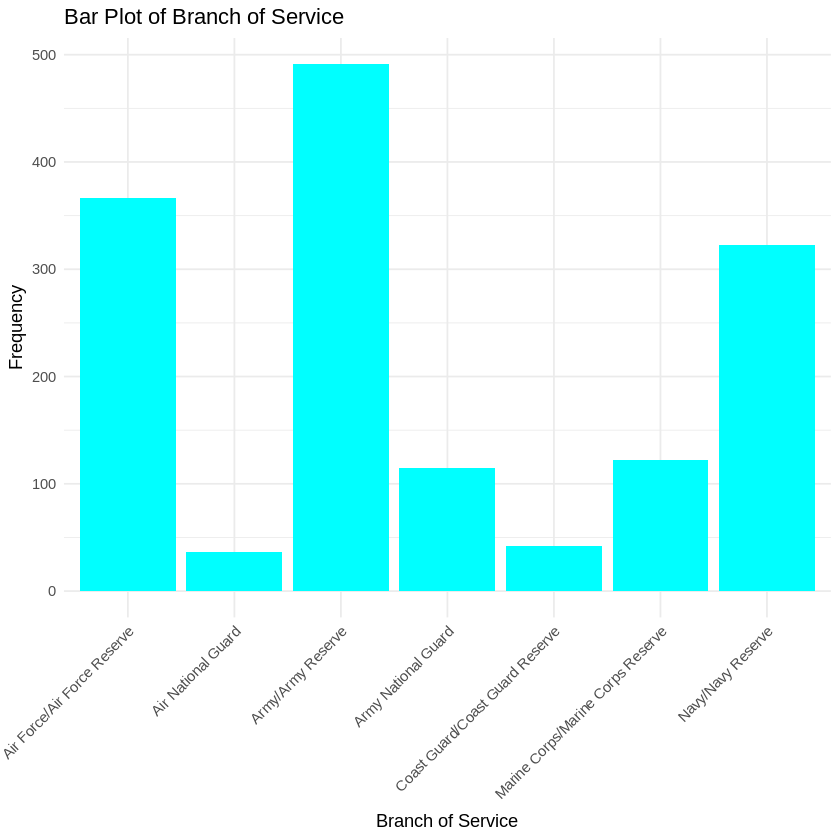

In [ ]:
# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2")}

# Descriptive Statistics (Frequency Table and Proportions)
branch_freq <- table(MilitaryDF$BRANCH)
print(branch_freq)
print(prop.table(branch_freq))  # Proportions

# Create custom labels for BRANCH categories
branch_labels <- c("1" = "Air Force/Air Force Reserve",
                   "2" = "Air National Guard",
                   "3" = "Army/Army Reserve",
                   "4" = "Army National Guard",
                   "5" = "Coast Guard/Coast Guard Reserve",
                   "6" = "Marine Corps/Marine Corps Reserve",
                   "7" = "Navy/Navy Reserve")

# Bar plot with cyan color, custom label, and category labels
ggplot(MilitaryDF, aes(x = factor(BRANCH))) +  # Convert BRANCH to factor
  geom_bar(fill = "cyan") +
  labs(title = "Bar Plot of Branch of Service",
       x = "Branch of Service",
       y = "Frequency") +
  scale_x_discrete(labels = branch_labels) +  # Apply custom labels
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotate x-axis labels for readability


   1    2    3 
1004  483    8 

          1           2           3 
0.671571906 0.323076923 0.005351171 


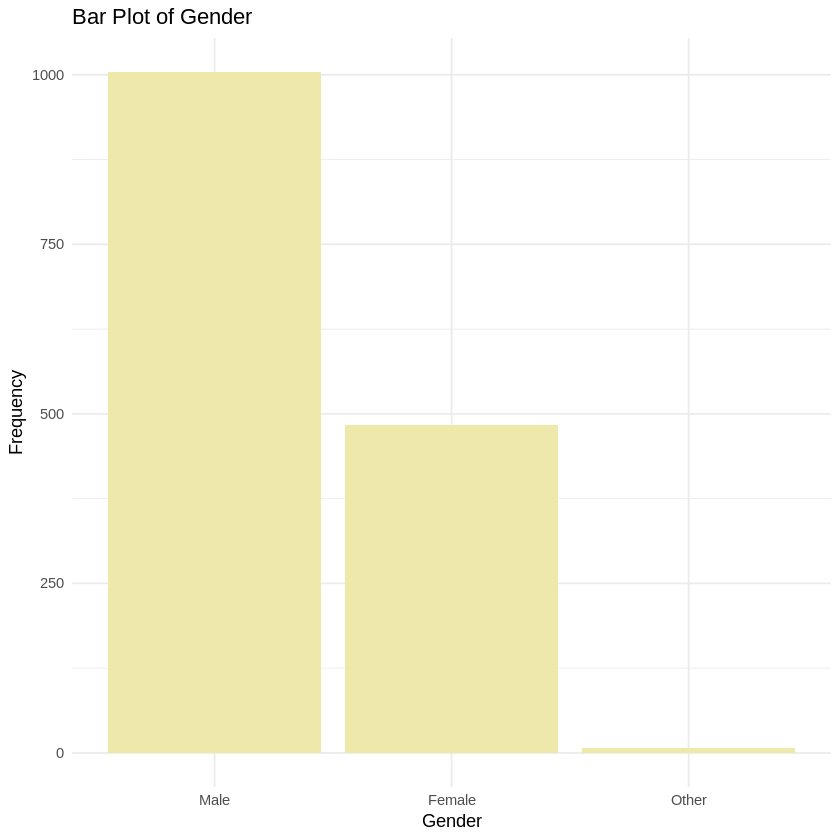

In [ ]:
# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2")}

# Descriptive Statistics (Frequency Table and Proportions)
gender_freq <- table(MilitaryDF$GENDER)
print(gender_freq)
print(prop.table(gender_freq))  # Proportions

# Create custom labels for GENDER categories
gender_labels <- c("1" = "Male",
                   "2" = "Female",
                   "3" = "Other")

# Bar plot with oldlace color, custom label, and category labels
ggplot(MilitaryDF, aes(x = factor(GENDER))) +  # Convert GENDER to factor
  geom_bar(fill = "palegoldenrod") +  # Set bar color to oldlace
  labs(title = "Bar Plot of Gender",
       x = "Gender",
       y = "Frequency") +
  scale_x_discrete(labels = gender_labels) +  # Apply custom labels
  theme_minimal()


   1    2    3    4    5    6 
1129  215   86   42   13   10 

          1           2           3           4           5           6 
0.755183946 0.143812709 0.057525084 0.028093645 0.008695652 0.006688963 


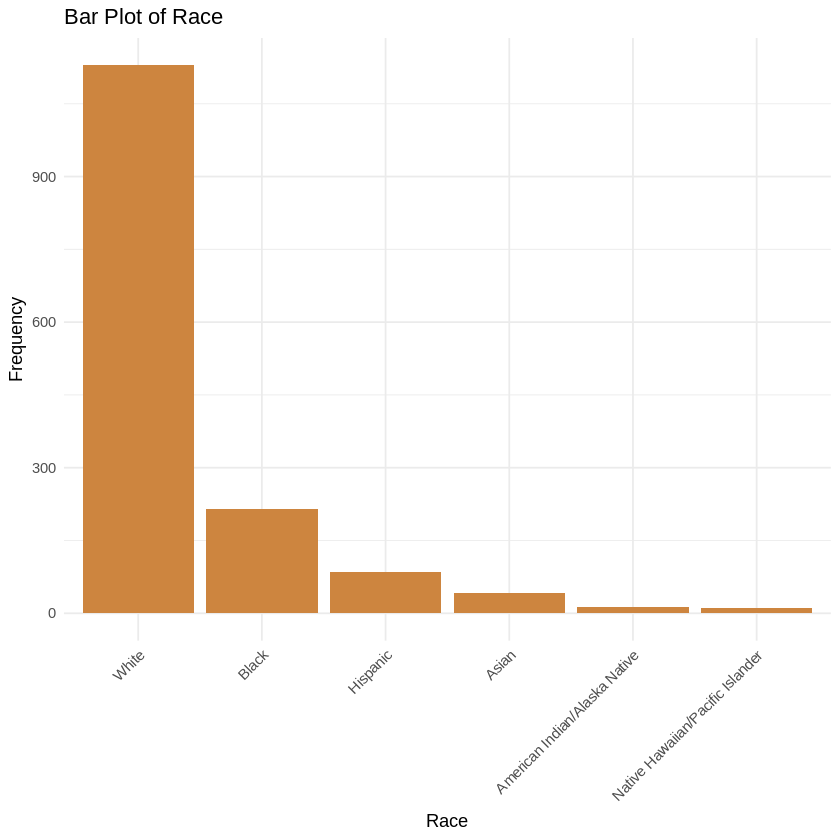

In [ ]:
# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2")}

# Descriptive Statistics (Frequency Table and Proportions)
race_freq <- table(MilitaryDF$RACE)
print(race_freq)
print(prop.table(race_freq))  # Proportions

# Create custom labels for RACE categories
race_labels <- c("1" = "White",
                 "2" = "Black",
                 "3" = "Hispanic",
                 "4" = "Asian",
                 "5" = "American Indian/Alaska Native",
                 "6" = "Native Hawaiian/Pacific Islander")

# Bar plot with peru color, custom label, and category labels
ggplot(MilitaryDF, aes(x = factor(RACE))) +  # Convert RACE to factor
  geom_bar(fill = "peru") +  # Set bar color to peru
  labs(title = "Bar Plot of Race",
       x = "Race",
       y = "Frequency") +
  scale_x_discrete(labels = race_labels) +  # Apply custom labels
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotate x-axis labels for readability

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  18.00   41.00   54.00   50.05   61.00   86.00 

[1] 13.40957

[1] 50.04615

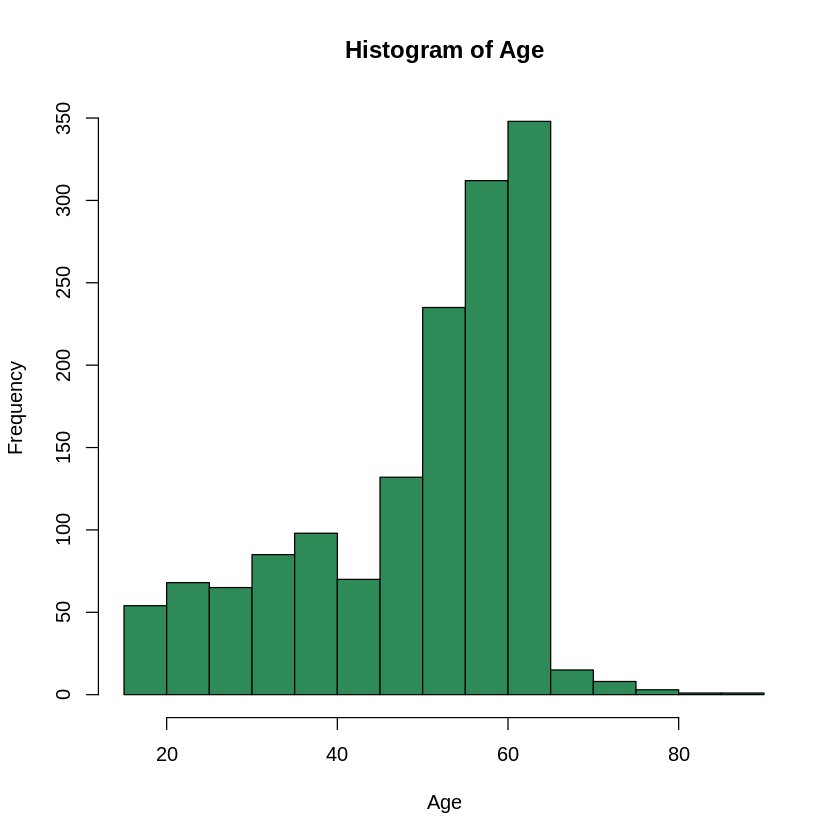

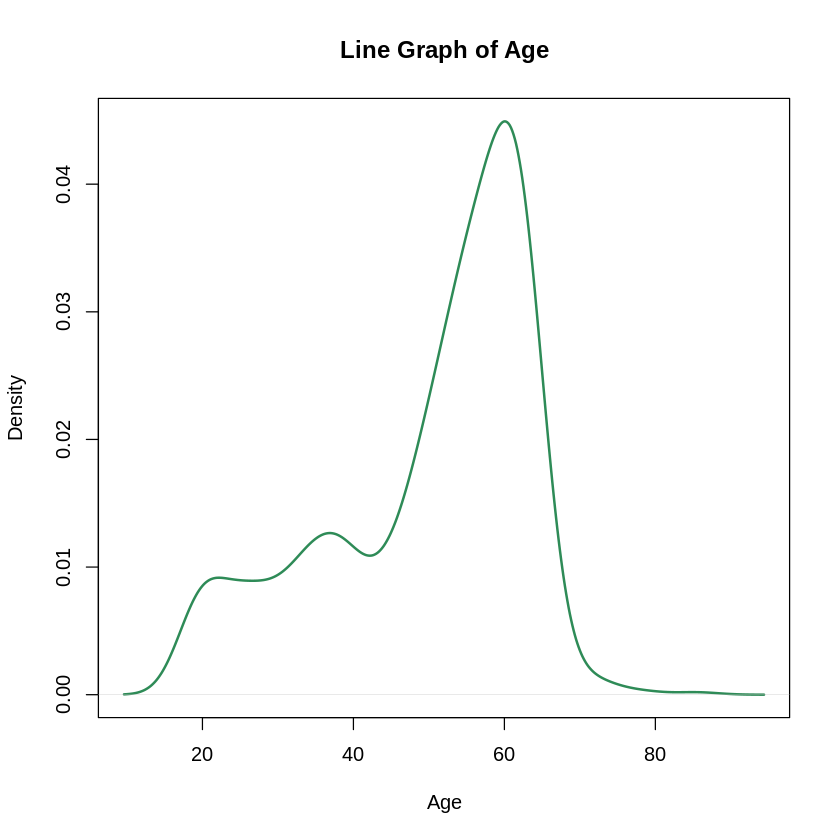

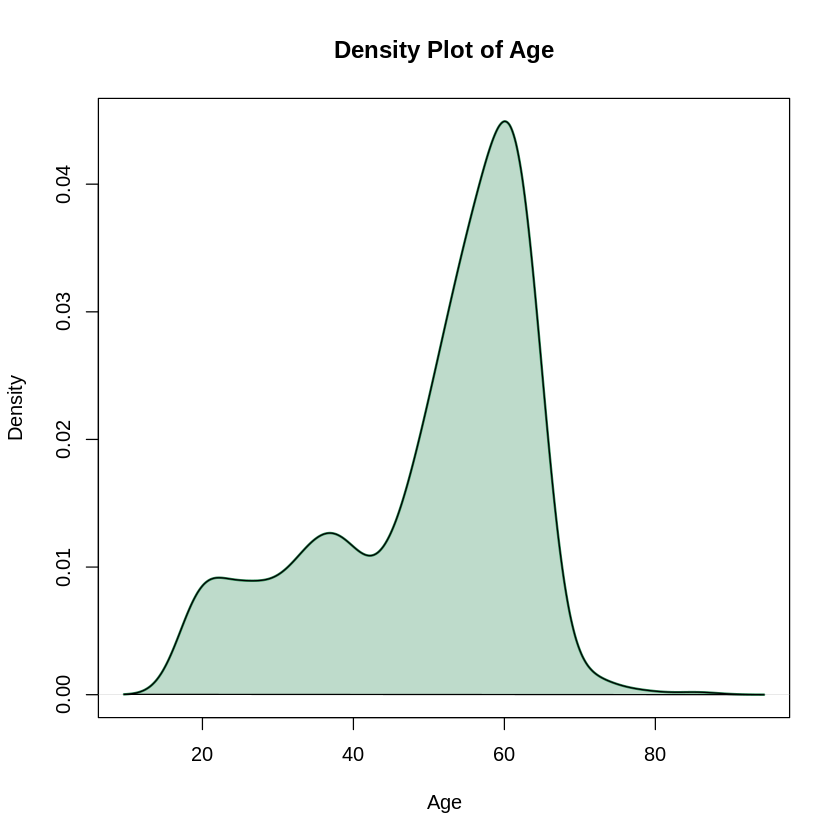

In [ ]:
# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}

# Descriptive Statistics
summary(MilitaryDF$AGE)
sd(MilitaryDF$AGE, na.rm = TRUE)
mean(MilitaryDF$AGE, na.rm = TRUE)

# Histogram
hist(MilitaryDF$AGE,
     main = "Histogram of Age",
     xlab = "Age",
     ylab = "Frequency",
     col = "seagreen")

# Line graph (density plot with a line)
plot(density(MilitaryDF$AGE, na.rm = TRUE),
     main = "Line Graph of Age",
     xlab = "Age",
     col = "seagreen",
     lwd = 2)

# Density plot with shading
plot(density(MilitaryDF$AGE, na.rm = TRUE),
     main = "Density Plot of Age",
     xlab = "Age",
     col = "seagreen",
     lwd = 2)
polygon(density(MilitaryDF$AGE, na.rm = TRUE), col = adjustcolor("seagreen", alpha.f = 0.3)) # Light seagreen shading


  1   2   3   4   5 
282 886  73 211  43 

         1          2          3          4          5 
0.18862876 0.59264214 0.04882943 0.14113712 0.02876254 


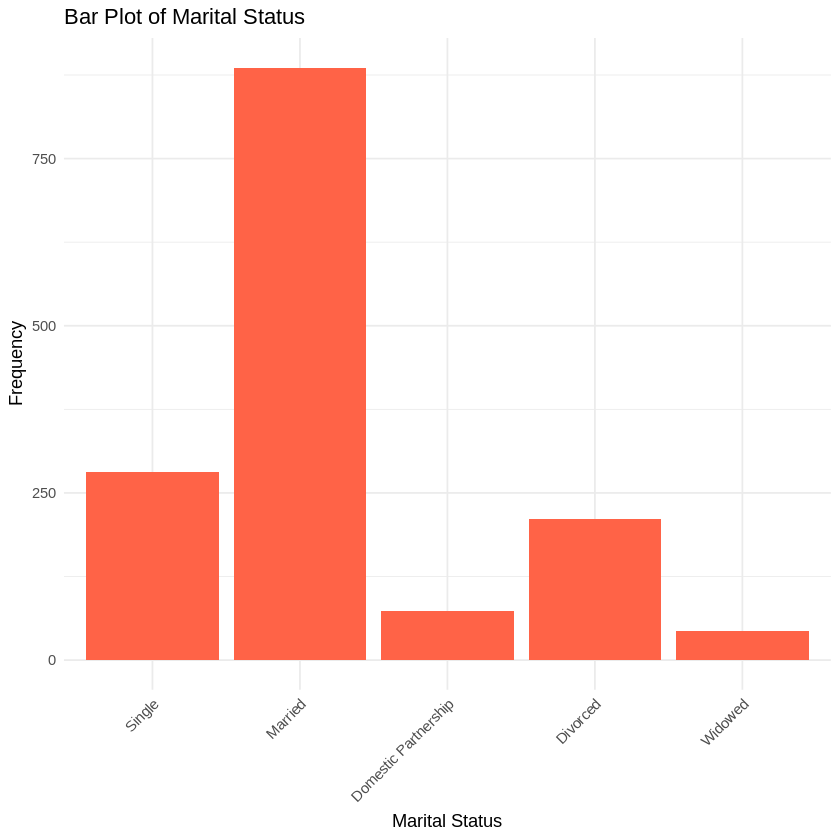

In [ ]:
# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2")}

# Descriptive Statistics (Frequency Table and Proportions)
marital_freq <- table(MilitaryDF$MARITAL)
print(marital_freq)
print(prop.table(marital_freq))  # Proportions

# Create custom labels for MARITAL categories
marital_labels <- c("1" = "Single",
                    "2" = "Married",
                    "3" = "Domestic Partnership",
                    "4" = "Divorced",
                    "5" = "Widowed")

# Bar plot with tomato color, custom label, and category labels
ggplot(MilitaryDF, aes(x = factor(MARITAL))) +  # Convert MARITAL to factor
  geom_bar(fill = "tomato") +  # Set bar color to tomato
  labs(title = "Bar Plot of Marital Status",
       x = "Marital Status",
       y = "Frequency") +
  scale_x_discrete(labels = marital_labels) +  # Apply custom labels
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotate x-axis labels for readability


  1   2   3   4   5 
507 262 272 295 159 

        1         2         3         4         5 
0.3391304 0.1752508 0.1819398 0.1973244 0.1063545 


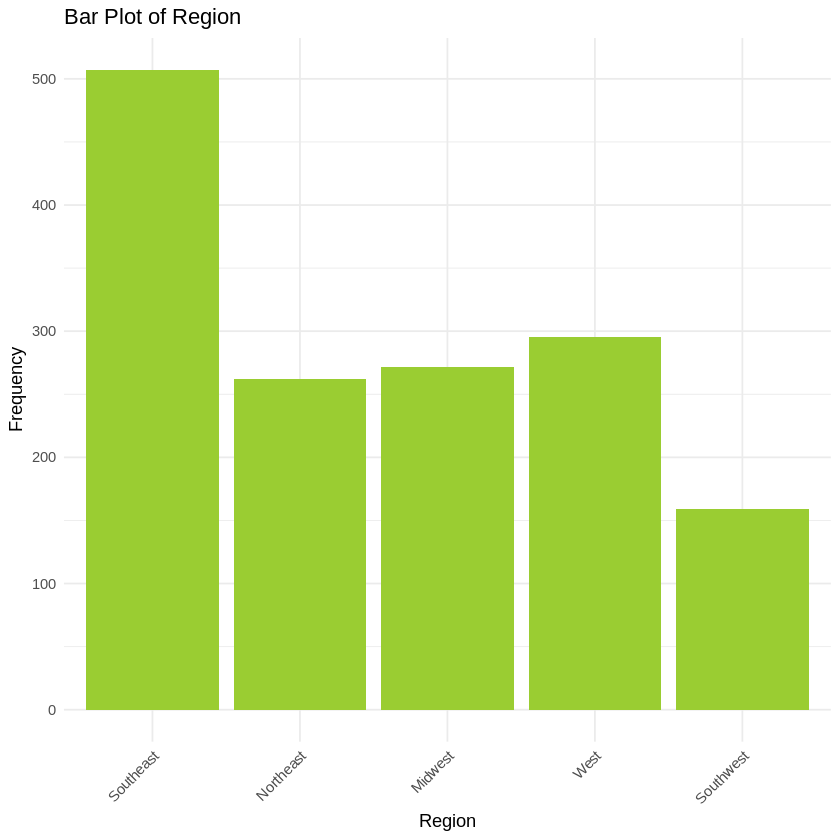

In [ ]:
# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2")}

# Descriptive Statistics (Frequency Table and Proportions)
region_freq <- table(MilitaryDF$REGION)
print(region_freq)
print(prop.table(region_freq))  # Proportions

# Create custom labels for REGION categories
region_labels <- c("1" = "Southeast",
                   "2" = "Northeast",
                   "3" = "Midwest",
                   "4" = "West",
                   "5" = "Southwest")

# Bar plot with yellowgreen color, custom label, and category labels
ggplot(MilitaryDF, aes(x = factor(REGION))) +  # Convert REGION to factor
  geom_bar(fill = "yellowgreen") +  # Set bar color to yellowgreen
  labs(title = "Bar Plot of Region",
       x = "Region",
       y = "Frequency") +
  scale_x_discrete(labels = region_labels) +  # Apply custom labels
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotate x-axis labels for readability

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   0.03    4.00    6.00    9.59   14.00   40.00 

[1] 8.152934

[1] 9.589612

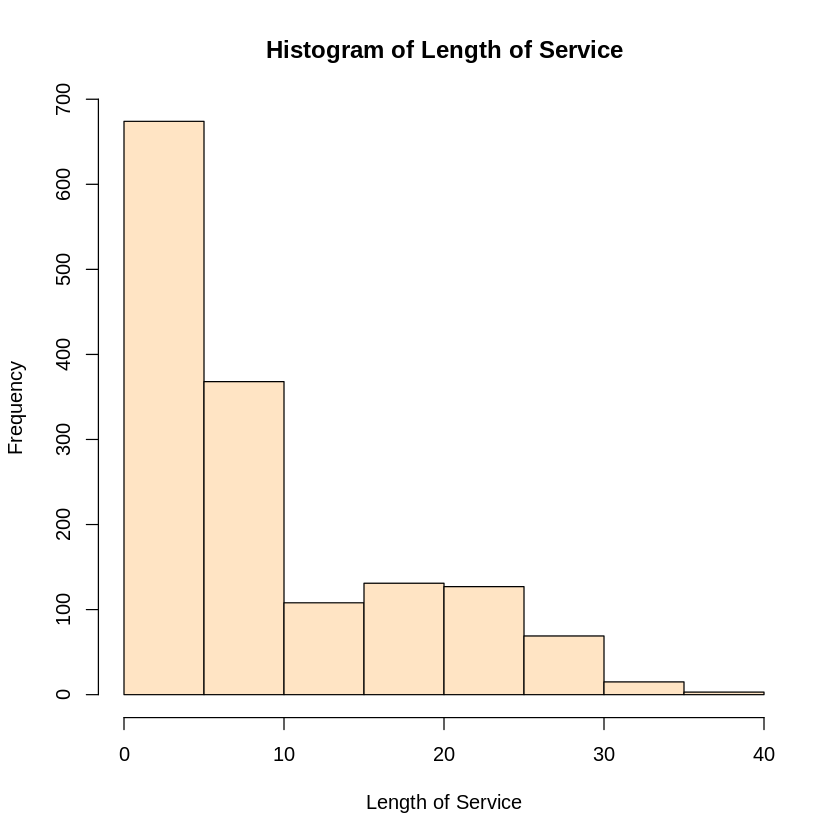

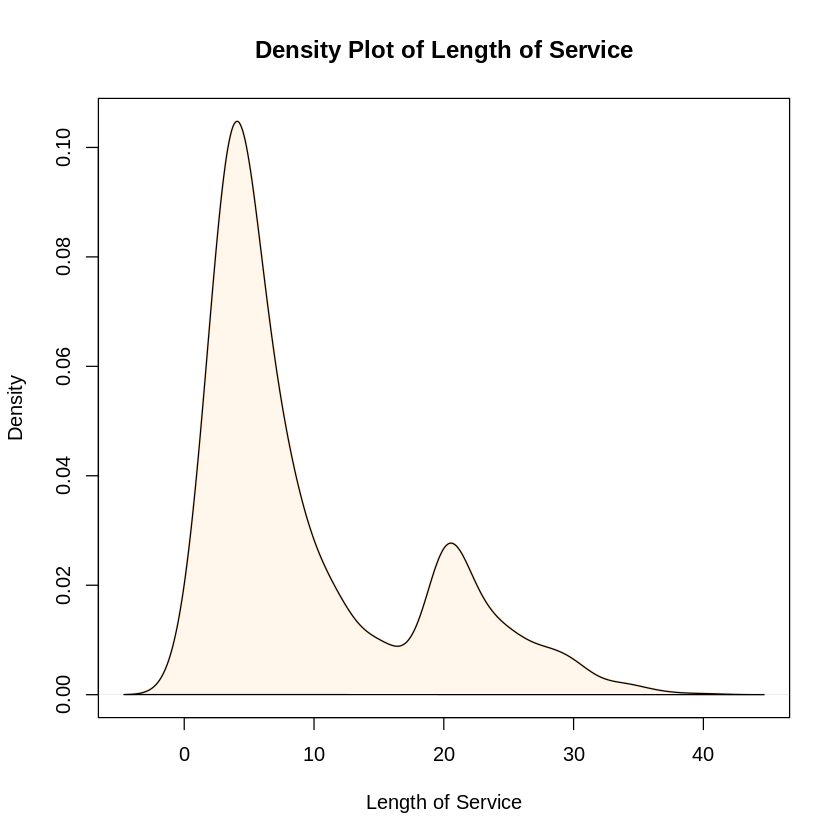

In [ ]:
# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}

# Descriptive Statistics
summary(MilitaryDF$DURATION)
sd(MilitaryDF$DURATION, na.rm = TRUE)
mean(MilitaryDF$DURATION, na.rm = TRUE)

# Histogram
hist(MilitaryDF$DURATION,
     main = "Histogram of Length of Service",
     xlab = "Length of Service",
     ylab = "Frequency",
     col = "bisque")

# Density plot with shading
plot(density(MilitaryDF$DURATION, na.rm = TRUE),
     main = "Density Plot of Length of Service",
     xlab = "Length of Service",
     col = "bisque",  # Line color
     lwd = 2)          # Line width (optional)
polygon(density(MilitaryDF$DURATION, na.rm = TRUE), col = adjustcolor("bisque", alpha.f = 0.3)) # Light bisque shading

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   1975    1988    1999    1999    2010    2020 

[1] 12.63749

[1] 1999.172

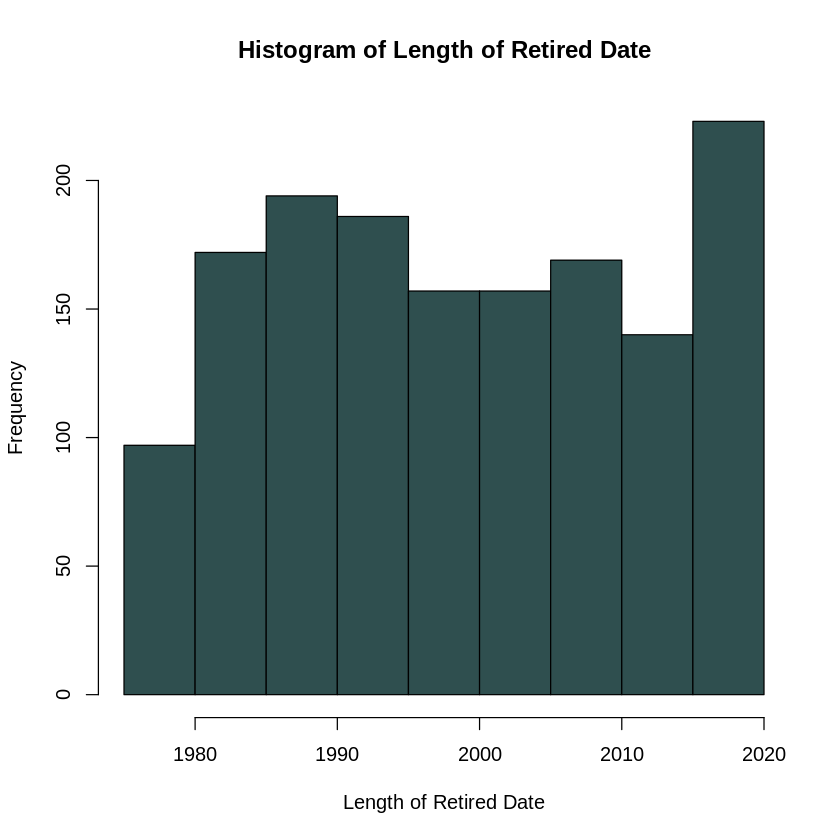

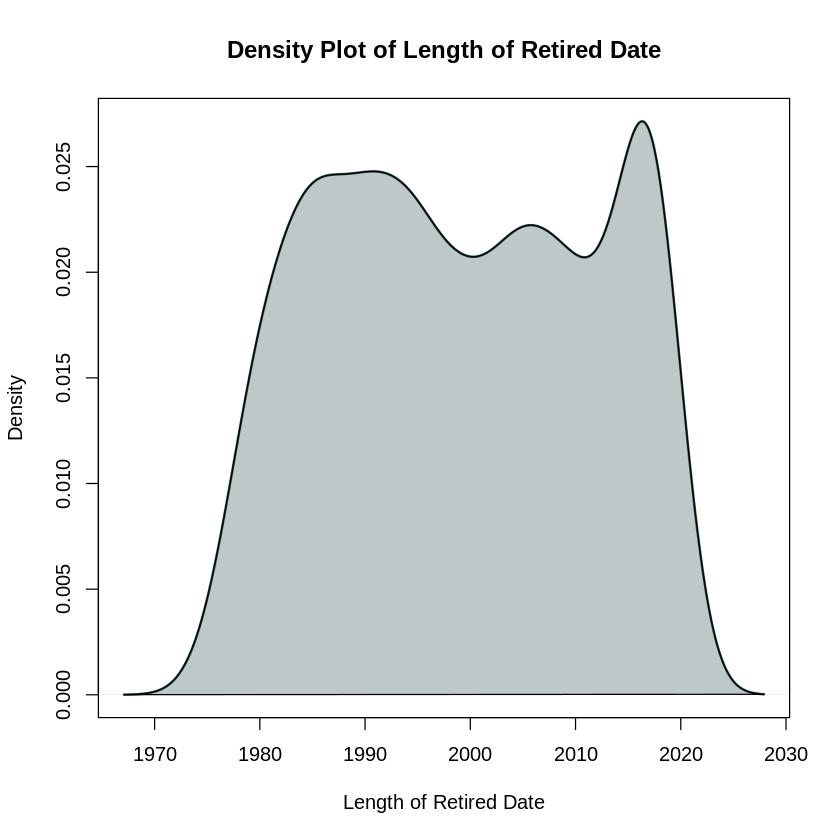

In [ ]:
# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}

# Descriptive Statistics
summary(MilitaryDF$RETIRED)
sd(MilitaryDF$RETIRED, na.rm = TRUE)
mean(MilitaryDF$RETIRED, na.rm = TRUE)

# Histogram
hist(MilitaryDF$RETIRED,
     main = "Histogram of Length of Retired Date",
     xlab = "Length of Retired Date",
     ylab = "Frequency",
     col = "darkslategray")

# Density plot with shading
plot(density(MilitaryDF$RETIRED, na.rm = TRUE),
     main = "Density Plot of Length of Retired Date",
     xlab = "Length of Retired Date",
     col = "darkslategray",  # Line color
     lwd = 2)          # Line width (optional)
polygon(density(MilitaryDF$RETIRED, na.rm = TRUE), col = adjustcolor("darkslategray", alpha.f = 0.3)) # Light darkslategray shading


  0   1 
604 891 

        0         1 
0.4040134 0.5959866 


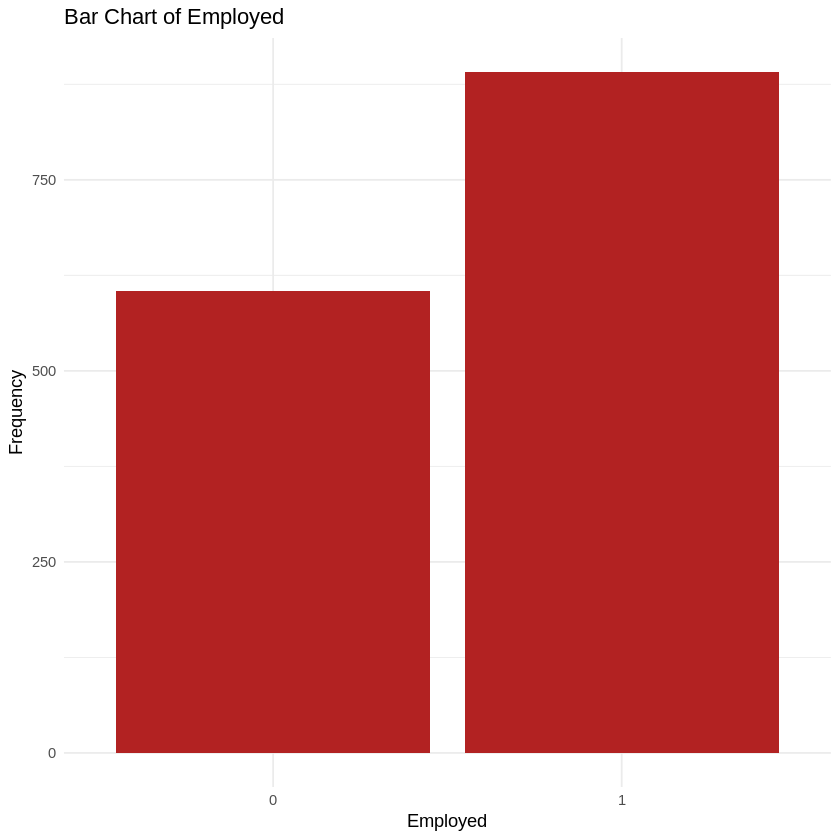

In [ ]:
# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2")}

# Descriptive Statistics (Frequency Table and Proportions)
employed_freq <- table(MilitaryDF$EMPLOYED)
print(employed_freq)
print(prop.table(employed_freq))  # Proportions

# Bar chart with firebrick color and label "Employed"
ggplot(MilitaryDF, aes(x = factor(EMPLOYED))) +
  geom_bar(fill = "firebrick") +
  labs(title = "Bar Chart of Employed",
       x = "Employed",
       y = "Frequency") +
  theme_minimal()

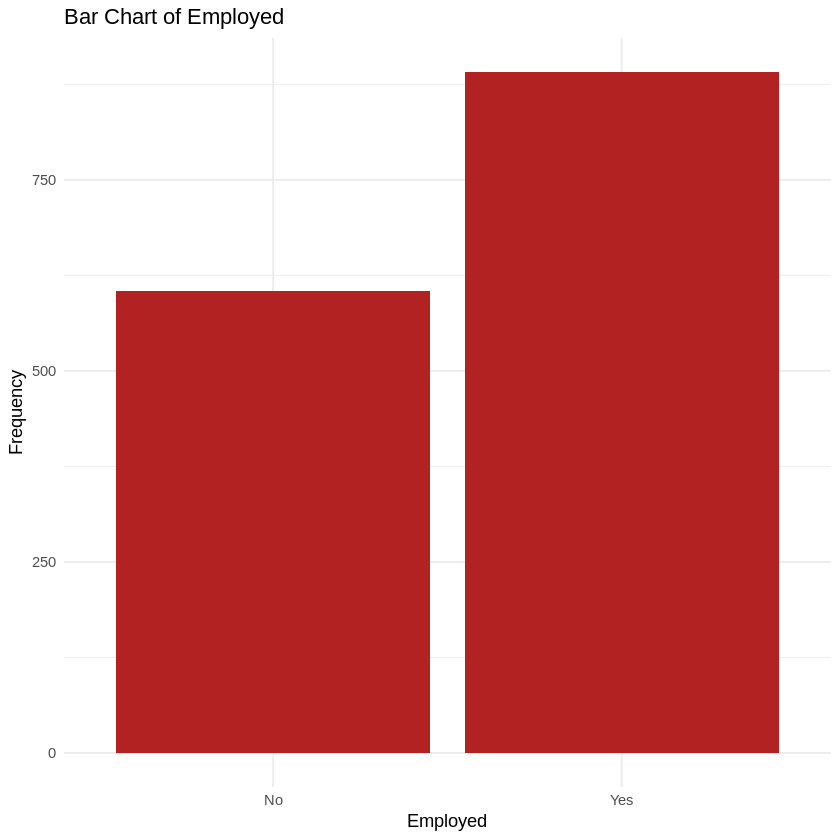

In [ ]:
# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2")}

# ... (Descriptive Statistics code remains the same) ...

# Create custom labels for EMPLOYED categories
employed_labels <- c("0" = "No", "1" = "Yes")

# Bar chart with firebrick color, label "Employed", and custom labels
ggplot(MilitaryDF, aes(x = factor(EMPLOYED))) +
  geom_bar(fill = "firebrick") +
  labs(title = "Bar Chart of Employed",
       x = "Employed",
       y = "Frequency") +
  scale_x_discrete(labels = employed_labels) +  # Apply custom labels
  theme_minimal()

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
      0   33000   60000   81972  100000 1500000 

[1] 112487.8

[1] 81971.69

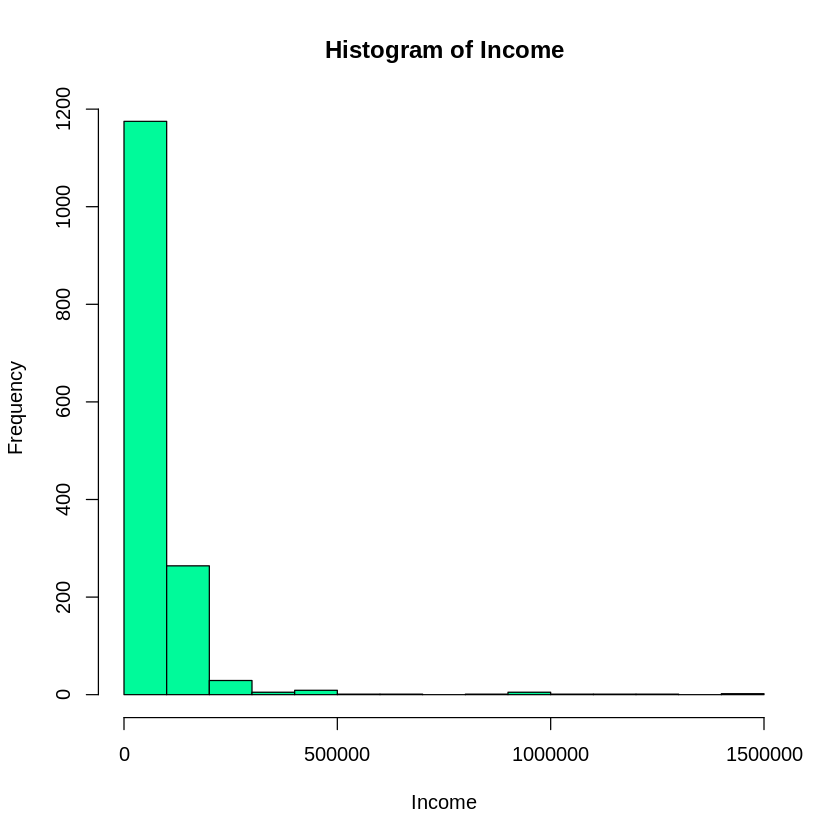

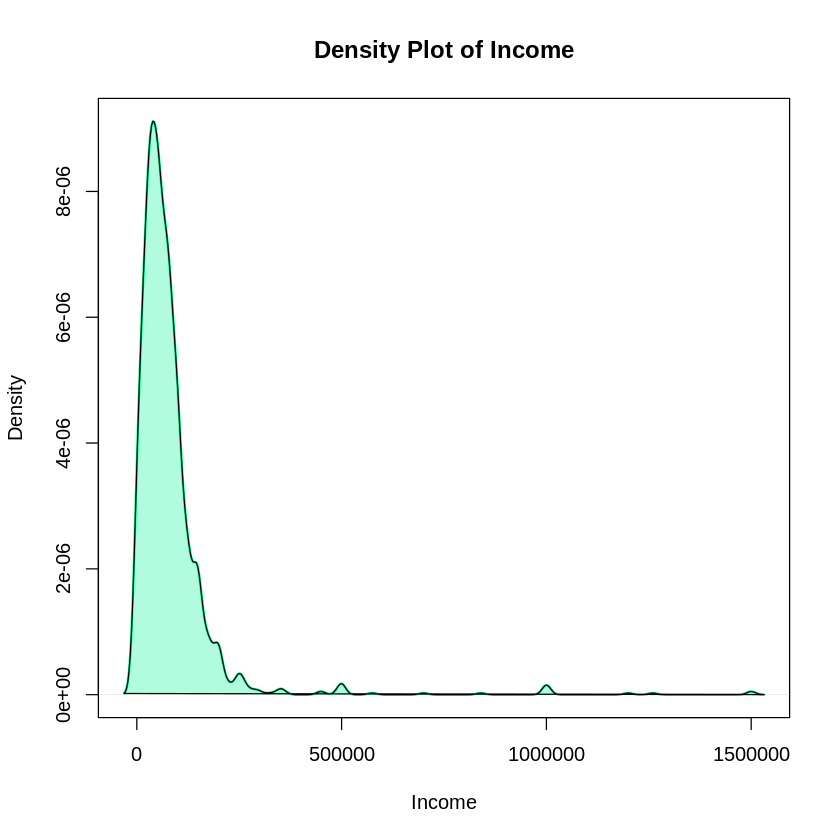

In [ ]:
# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}

# Descriptive Statistics
summary(MilitaryDF$INCOME)
sd(MilitaryDF$INCOME, na.rm = TRUE)
mean(MilitaryDF$INCOME, na.rm = TRUE)

# Histogram
hist(MilitaryDF$INCOME,
     main = "Histogram of Income",
     xlab = "Income",
     ylab = "Frequency",
     col = "mediumspringgreen")

# Density plot with shading
plot(density(MilitaryDF$INCOME, na.rm = TRUE),
     main = "Density Plot of Income",
     xlab = "Income",
     col = "mediumspringgreen",
     lwd = 2)
polygon(density(MilitaryDF$INCOME, na.rm = TRUE), col = adjustcolor("mediumspringgreen", alpha.f = 0.3)) # Light mediumspringgreen shading


  1   2   3   4   5   6   7   8   9  10 
545  68  59  60 111  70  41   6 358 177 

          1           2           3           4           5           6 
0.364548495 0.045484950 0.039464883 0.040133779 0.074247492 0.046822742 
          7           8           9          10 
0.027424749 0.004013378 0.239464883 0.118394649 


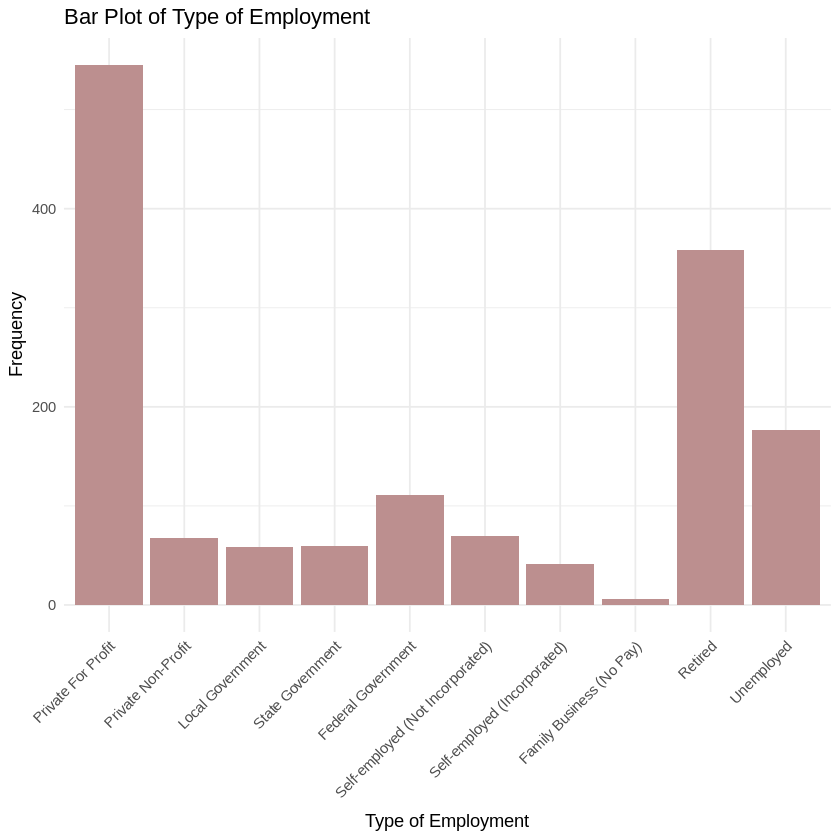

In [ ]:
# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2")}

# Descriptive Statistics (Frequency Table and Proportions)
occupation_freq <- table(MilitaryDF$OCCUPATION)
print(occupation_freq)
print(prop.table(occupation_freq))  # Proportions

# Create custom labels for OCCUPATION categories
occupation_labels <- c("1" = "Private For Profit",
                       "2" = "Private Non-Profit",
                       "3" = "Local Government",
                       "4" = "State Government",
                       "5" = "Federal Government",
                       "6" = "Self-employed (Not Incorporated)",
                       "7" = "Self-employed (Incorporated)",
                       "8" = "Family Business (No Pay)",
                       "9" = "Retired",
                       "10" = "Unemployed")

# Bar plot with papayawhip color, custom label, and category labels
ggplot(MilitaryDF, aes(x = factor(OCCUPATION))) +
  geom_bar(fill = "rosybrown") +
  labs(title = "Bar Plot of Type of Employment",
       x = "Type of Employment",
       y = "Frequency") +
  scale_x_discrete(labels = occupation_labels) +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotate x-axis labels for readability

In [ ]:
# Frequency Table and Proportions
rent_text_freq <- table(MilitaryDF$RENT_TEXT)
print(rent_text_freq)  # Frequency table
print(prop.table(rent_text_freq))  # Proportions

# Optional: If you want to see the unique values
unique_rent_text <- unique(MilitaryDF$RENT_TEXT)
print(unique_rent_text)


                                               
                                          1468 
                        I live with a roommate 
                                             1 
                         I STILL PAYING FOR IT 
                                             1 
Live  with father-in-law to help provide care. 
                                             1 
                    Live rent free with family 
                                             1 
                                live w/ family 
                                             1 
                              live with family 
                                             3 
                              Live with family 
                                             3 
                              Live with parent 
                                             1 
                             Live with parents 
                                             2 
                            Live with r

In [ ]:
# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}

# Descriptive Statistics
summary(MilitaryDF$RENT)  # 5-number summary (min, quartiles, max)
sd(MilitaryDF$RENT, na.rm = TRUE)  # Standard deviation
mean(MilitaryDF$RENT, na.rm = TRUE)  # Mean
describe(MilitaryDF$RENT)  # More detailed statistics from psych package

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  1.000   2.000   2.000   1.794   2.000   3.000       8 

[1] 0.4545495

[1] 1.794217

,vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
X1,1,1487,1.794217,0.4545495,2,1.84047,0,1,3,2,-0.7410912,0.215688,0.01178761


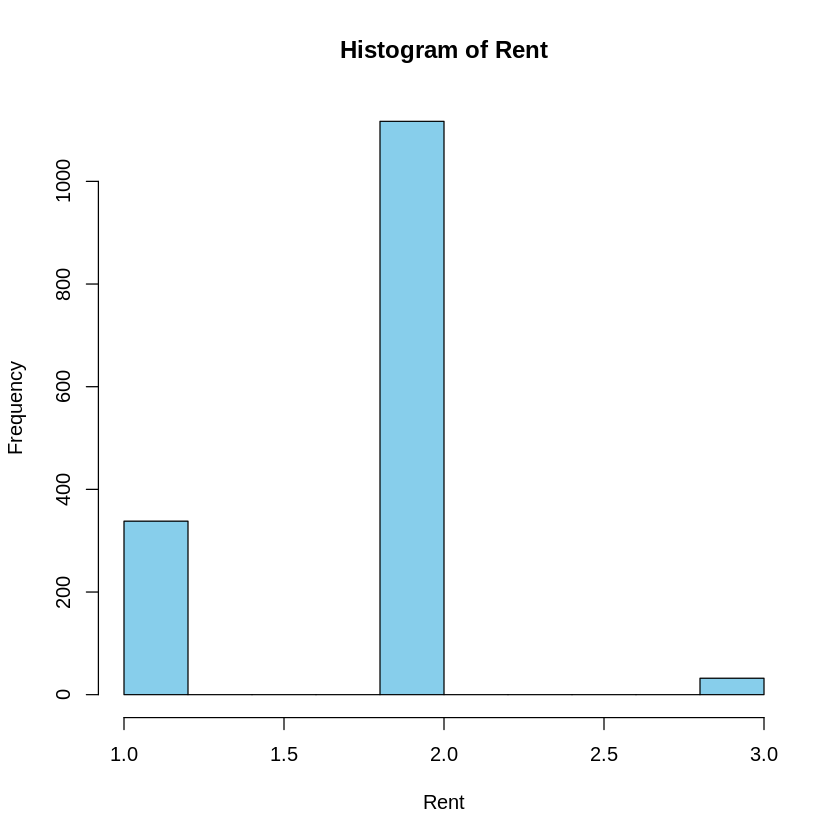

In [ ]:
# Histogram for RENT
hist(MilitaryDF$RENT,
     main = "Histogram of Rent",
     xlab = "Rent",
     ylab = "Frequency",
     col = "skyblue")  # You can adjust the color as needed


   1    2    3    4    5    6    7    8    9   10   11 
  59 1026  125   44   71   59   39   30   30    4    8 

          1           2           3           4           5           6 
0.039464883 0.686287625 0.083612040 0.029431438 0.047491639 0.039464883 
          7           8           9          10          11 
0.026086957 0.020066890 0.020066890 0.002675585 0.005351171 


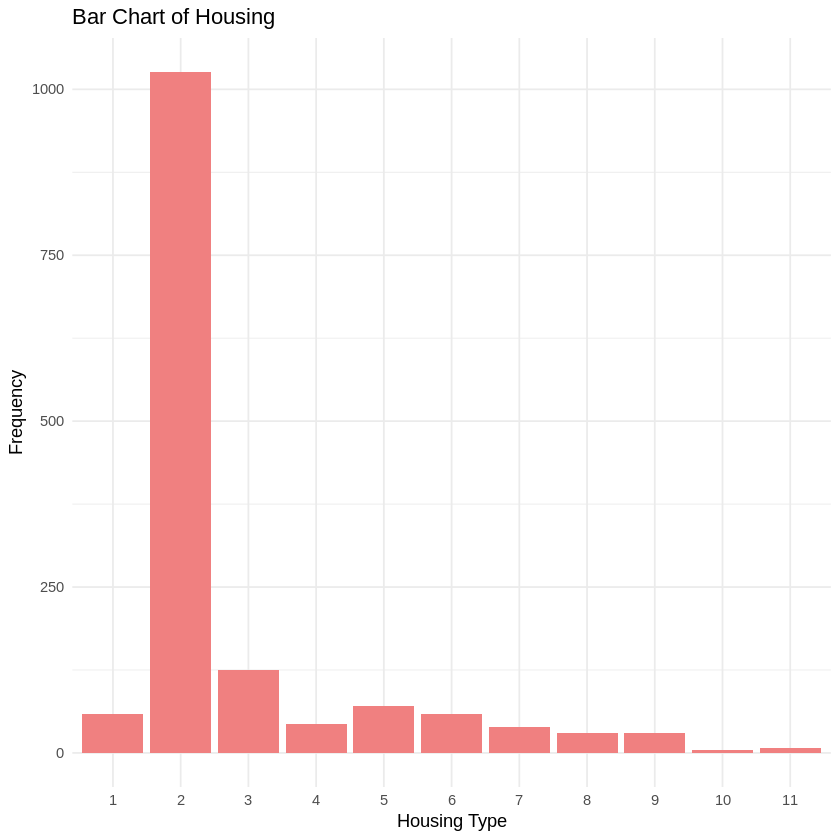

In [ ]:
# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2")}

# Descriptive Statistics (Frequency Table and Proportions)
housing_freq <- table(MilitaryDF$HOUSING)
print(housing_freq)  # Frequency table
print(prop.table(housing_freq))  # Proportions

# Bar chart for HOUSING
ggplot(MilitaryDF, aes(x = factor(HOUSING))) +
  geom_bar(fill = "lightcoral") +  # You can adjust the color as needed
  labs(title = "Bar Chart of Housing",
       x = "Housing Type",
       y = "Frequency") +
  theme_minimal()

In [ ]:
# Recode HOUSING labels
MilitaryDF$HOUSING_Recoded <- recode(MilitaryDF$HOUSING,
                                     "1" = "1",
                                     "2" = "2",
                                     "3" = "3",
                                     "4" = "4",
                                     "5" = "5",
                                     "6" = "7+8+9",  # Combine 7, 8, 9 into one category
                                     "7" = "10",
                                     "8" = "11")

# Frequency table of recoded variable
table(MilitaryDF$HOUSING_Recoded)

Warning message:
“Unreplaced values treated as NA as `.x` is not compatible.
Please specify replacements exhaustively or supply `.default`.”



    1    10    11     2     3     4     5 7+8+9 
   59    39    30  1026   125    44    71    59 


    1    10    11     2     3     4     5 7+8+9 
   59    39    30  1026   125    44    71    59 

         1         10         11          2          3          4          5 
0.04060564 0.02684102 0.02064694 0.70612526 0.08602891 0.03028217 0.04886442 
     7+8+9 
0.04060564 


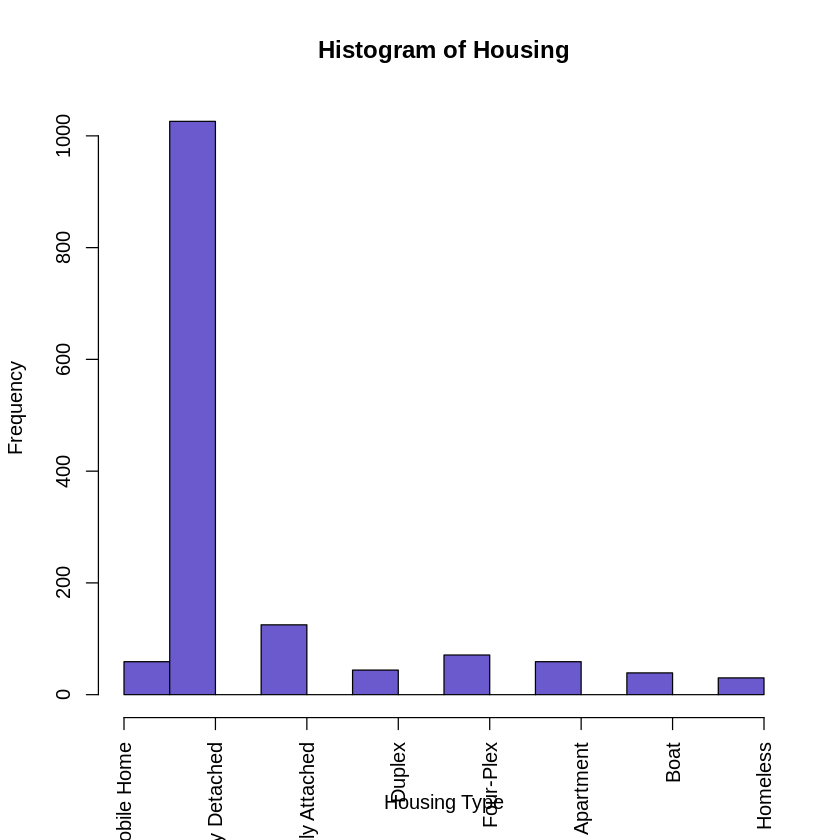

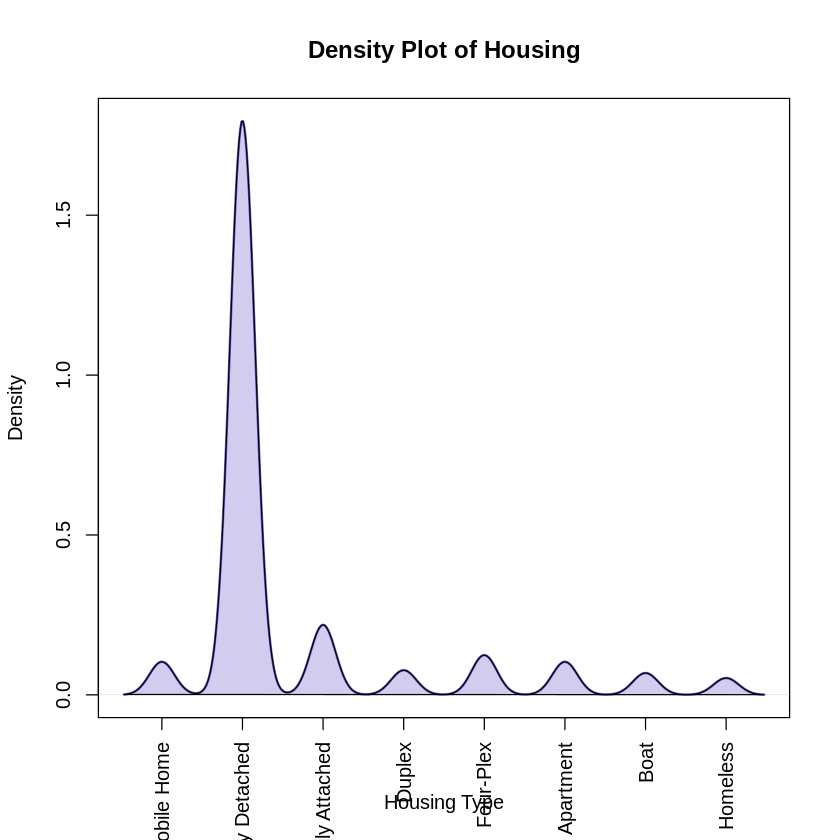

In [ ]:
# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}

# Descriptive Statistics (Frequency Table and Proportions)
housing_recoded_freq <- table(MilitaryDF$HOUSING_Recoded)
print(housing_recoded_freq)  # Frequency table
print(prop.table(housing_recoded_freq))  # Proportions

# Create custom labels for HOUSING_Recoded categories
housing_labels <- c("1" = "Mobile Home",
                    "2" = "Single Family Detached",
                    "3" = "Single Family Attached",
                    "4" = "Duplex",
                    "5" = "Four-Plex",
                    "7+8+9" = "Apartment",  # Combined category
                    "10" = "Boat",
                    "11" = "Homeless")


# Convert HOUSING_Recoded to a factor with custom labels
MilitaryDF$HOUSING_Recoded <- factor(MilitaryDF$HOUSING_Recoded,
                                      levels = names(housing_labels),
                                      labels = housing_labels)

# Histogram
hist(as.numeric(MilitaryDF$HOUSING_Recoded),
     main = "Histogram of Housing",
     xlab = "Housing Type",
     ylab = "Frequency",
     col = "slateblue",
     xaxt = "n")  # Remove default x-axis labels
axis(1, at = 1:length(housing_labels), labels = housing_labels, las = 2)  # Add custom labels

# Density Plot (may not be as meaningful for categorical data)
plot(density(as.numeric(MilitaryDF$HOUSING_Recoded), na.rm = TRUE),
     main = "Density Plot of Housing",
     xlab = "Housing Type",
     col = "slateblue",
     lwd = 2,
     xaxt = "n")  # Remove default x-axis labels
axis(1, at = 1:length(housing_labels), labels = housing_labels, las = 2)  # Add custom labels
polygon(density(as.numeric(MilitaryDF$HOUSING_Recoded), na.rm = TRUE), col = adjustcolor("slateblue", alpha.f = 0.3))


   1    2    3 
 338 1117   32 

         1          2          3 
0.22730330 0.75117687 0.02151984 


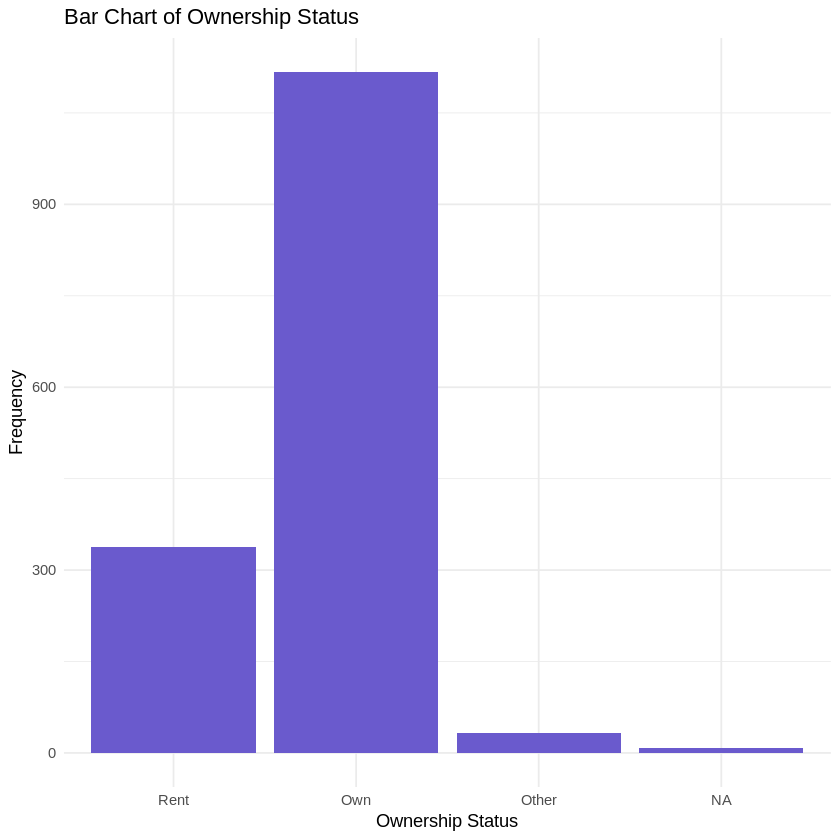

In [ ]:
# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}
if(!require(ggplot2)){install.packages("ggplot2")}

# Descriptive Statistics (Frequency Table and Proportions)
rent_freq <- table(MilitaryDF$RENT)
print(rent_freq)  # Frequency table
print(prop.table(rent_freq))  # Proportions

# Create custom labels for RENT categories
rent_labels <- c("1" = "Rent",
                  "2" = "Own",
                  "3" = "Other")

# Convert RENT to a factor with custom labels
MilitaryDF$RENT <- factor(MilitaryDF$RENT,
                            levels = names(rent_labels),
                            labels = rent_labels)

# Bar chart for RENT with custom labels and slateblue color
ggplot(MilitaryDF, aes(x = RENT)) +
  geom_bar(fill = "slateblue") +
  labs(title = "Bar Chart of Ownership Status",
       x = "Ownership Status",
       y = "Frequency") +
  theme_minimal()

[1] -0.04137055

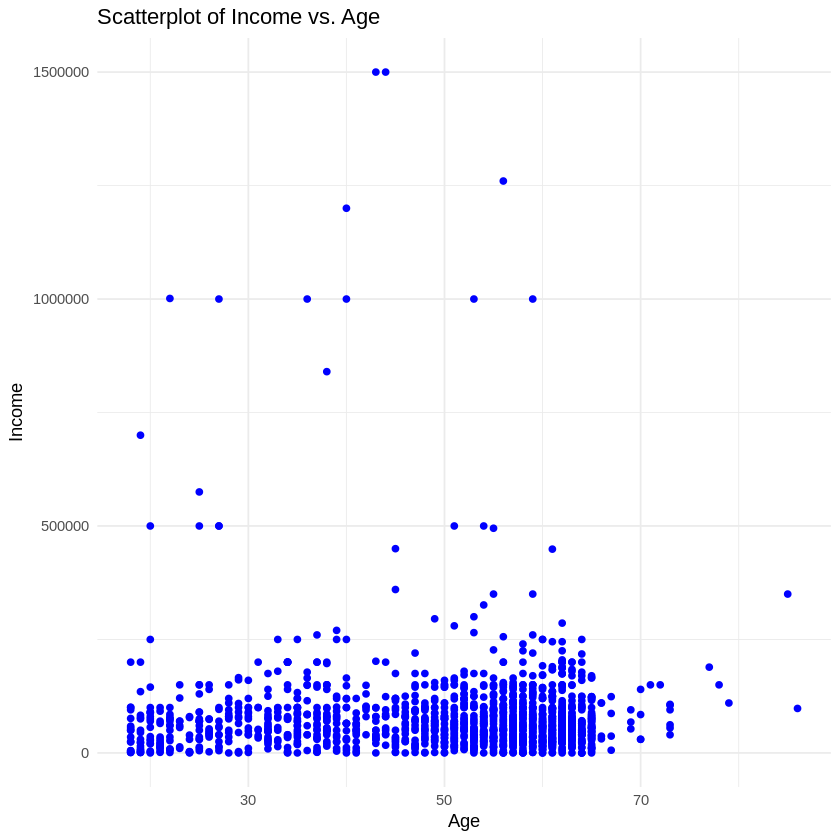

In [ ]:
# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2")}

# Scatterplot of INCOME vs AGE with blue color
ggplot(MilitaryDF, aes(x = AGE, y = INCOME)) +
  geom_point(color = "blue") +  # Set point color to blue
  labs(title = "Scatterplot of Income vs. Age",
       x = "Age",
       y = "Income") +
  theme_minimal()

# Calculate Correlation
cor(MilitaryDF$INCOME, MilitaryDF$AGE, use = "complete.obs")  # Use "complete.obs" to handle missing values


Call:
lm(formula = AGE ~ INCOME, data = MilitaryDF)

Residuals:
    Min      1Q  Median      3Q     Max 
-32.445  -9.206   4.289  10.628  36.276 

Coefficients:
              Estimate Std. Error t value Pr(>|t|)    
(Intercept)  5.045e+01  4.290e-01   117.6   <2e-16 ***
INCOME      -4.932e-06  3.083e-06    -1.6     0.11    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 13.4 on 1493 degrees of freedom
Multiple R-squared:  0.001712,	Adjusted R-squared:  0.001043 
F-statistic:  2.56 on 1 and 1493 DF,  p-value: 0.1098


`geom_smooth()` using formula = 'y ~ x'


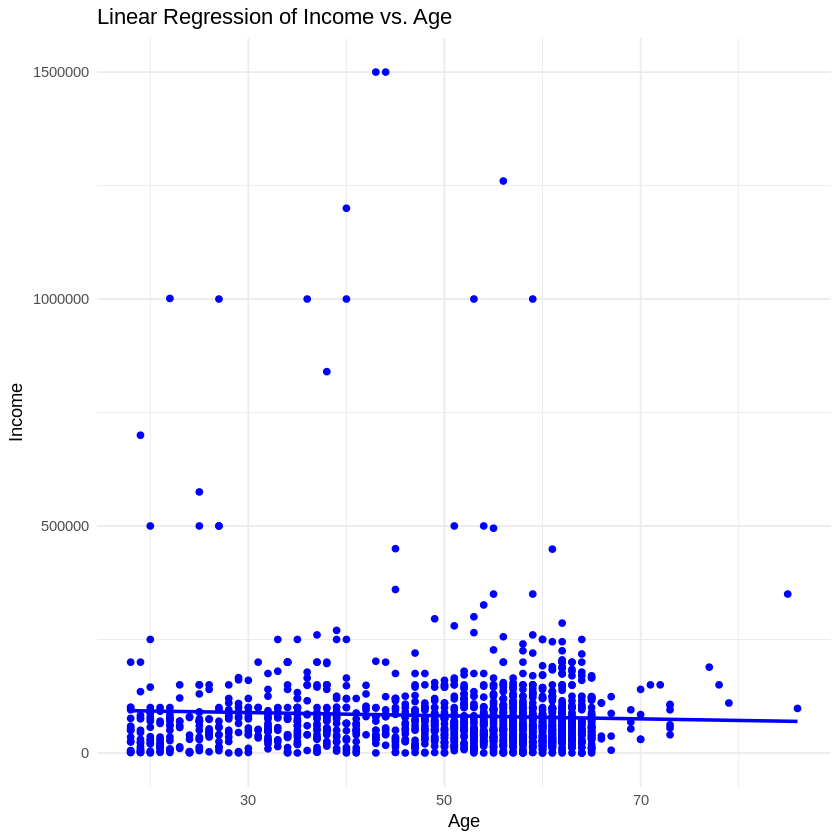

In [ ]:
# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2")}

# Fit the linear regression model
model <- lm(AGE ~ INCOME, data = MilitaryDF)

# Print the model summary
summary(model)

# Plot with regression line (blue)
ggplot(MilitaryDF, aes(x = AGE, y = INCOME)) +
  geom_point(color = "blue") +  # Points in blue
  geom_smooth(method = "lm", se = FALSE, color = "blue") +  # Regression line in blue
  labs(title = "Linear Regression of Income vs. Age",
       x = "Age",
       y = "Income") +
  theme_minimal()

              Df    Sum Sq   Mean Sq F value  Pr(>F)    
BRANCH         6 3.474e+11 5.791e+10   4.643 0.00011 ***
Residuals   1488 1.856e+13 1.247e+10                    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

<ggproto object: Class ScaleDiscrete, Scale, gg>
    aesthetics: fill
    axis_order: function
    break_info: function
    break_positions: function
    breaks: waiver
    call: call
    clone: function
    dimension: function
    drop: TRUE
    expand: waiver
    get_breaks: function
    get_breaks_minor: function
    get_labels: function
    get_limits: function
    get_transformation: function
    guide: legend
    is_discrete: function
    is_empty: function
    labels: waiver
    limits: NULL
    make_sec_title: function
    make_title: function
    map: function
    map_df: function
    n.breaks.cache: NULL
    na.translate: TRUE
    na.value: grey50
    name: waiver
    palette: function
    palette.cache: NULL
    position: left
    range: environment
    rescale: function
    reset: function
    train: function
    train_df: function
    transform: function
    transform_df: function
    super:  <ggproto object: Class ScaleDiscrete, Scale, gg>

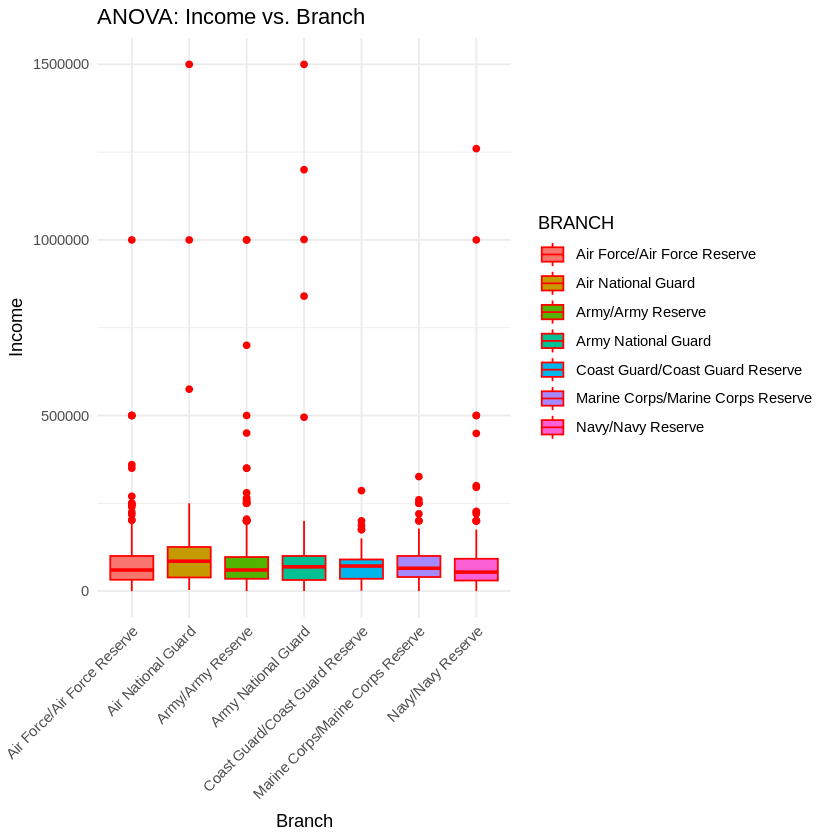

In [ ]:
# Install necessary packages if not already installed
if(!require(ggplot2)){install.packages("ggplot2")}

# Create custom labels for BRANCH categories
branch_labels <- c("1" = "Air Force/Air Force Reserve",
                   "2" = "Air National Guard",
                   "3" = "Army/Army Reserve",
                   "4" = "Army National Guard",
                   "5" = "Coast Guard/Coast Guard Reserve",
                   "6" = "Marine Corps/Marine Corps Reserve",
                   "7" = "Navy/Navy Reserve")

# Convert BRANCH to a factor with custom labels
MilitaryDF$BRANCH <- factor(MilitaryDF$BRANCH,
                             levels = names(branch_labels),
                             labels = branch_labels)

# Perform ANOVA
anova_result <- aov(INCOME ~ BRANCH, data = MilitaryDF)
summary(anova_result)  # Print ANOVA results

# Create side-by-side box plot with red color and custom labels
ggplot(MilitaryDF, aes(x = BRANCH, y = INCOME, fill = BRANCH)) +
  geom_boxplot(color = "red") +  # Set boxplot color to red
  labs(title = "ANOVA: Income vs. Branch",
       x = "Branch",
       y = "Income") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1))  # Rotate x-axis labels for readability +
  scale_fill_manual(values = rep("red", length(branch_labels))) # Set all box colors to red

In [ ]:
# Descriptive Statistics for COMBAT_EXPOSURE_RECODED

# Frequency table
combat_exposure_freq <- table(MilitaryDF$COMBAT_EXPOSURE_RECODED)
print(combat_exposure_freq)

# Proportions (percentages)
combat_exposure_prop <- prop.table(combat_exposure_freq)
print(combat_exposure_prop)

# Summary statistics (if applicable) - might not be very meaningful for categorical data
summary(MilitaryDF$COMBAT_EXPOSURE_RECODED)

< table of extent 0 >
numeric(0)


Length  Class   Mode 
     0   NULL   NULL 

In [ ]:
# Check if the variable exists
if ("COMBAT_EXPOSURE_RECODED" %in% names(MilitaryDF)) {
  print("Yes, the variable COMBAT_EXPOSURE_RECODED exists in the dataframe.")
} else {
  print("No, the variable COMBAT_EXPOSURE_RECODED does not exist in the dataframe.")
}

[1] "No, the variable COMBAT_EXPOSURE_RECODED does not exist in the dataframe."


In [ ]:
# Descriptive Statistics for Combat_Exposure_Recoded

# Frequency table
combat_exposure_freq <- table(MilitaryDF$Combat_Exposure_Recoded)
print(combat_exposure_freq)

# Proportions (percentages)
combat_exposure_prop <- prop.table(combat_exposure_freq)
print(combat_exposure_prop)

# Summary statistics (if applicable)
summary(MilitaryDF$Combat_Exposure_Recoded)


  1   2   3   4   5 
995 229 166  80  25 

         1          2          3          4          5 
0.66555184 0.15317726 0.11103679 0.05351171 0.01672241 


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   1.000   1.000   1.603   2.000   5.000 

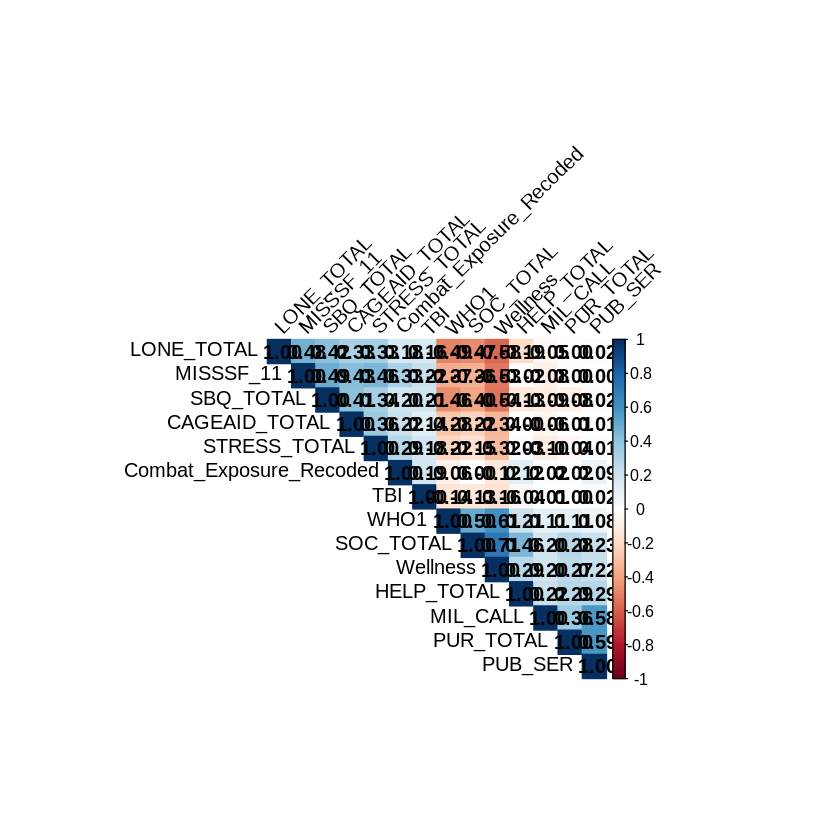

In [ ]:
# Install necessary packages if not already installed
if(!require(corrplot)){install.packages("corrplot")}

# Select variables for correlation matrix
selected_vars <- c("CAGEAID_TOTAL", "Combat_Exposure_Recoded", "SOC_TOTAL",
                   "PUR_TOTAL", "STRESS_TOTAL", "HELP_TOTAL", "LONE_TOTAL",
                   "MIL_CALL", "MISSSF_11", "PUB_SER", "SBQ_TOTAL", "TBI", "Wellness", "WHO1")

# Ensure Combat_Exposure_Recoded is numeric
MilitaryDF$Combat_Exposure_Recoded <- as.numeric(as.character(MilitaryDF$Combat_Exposure_Recoded))

# Create correlation matrix
cor_matrix <- cor(MilitaryDF[, selected_vars], use = "pairwise.complete.obs")

# Visualize correlation matrix using corrplot
corrplot(cor_matrix, method = "color", type = "upper", order = "hclust",
         tl.col = "black", tl.srt = 45, addCoef.col = "black",
         number.digits = 2, insig = "blank") # Show 2 digits and hide insignificant correlations

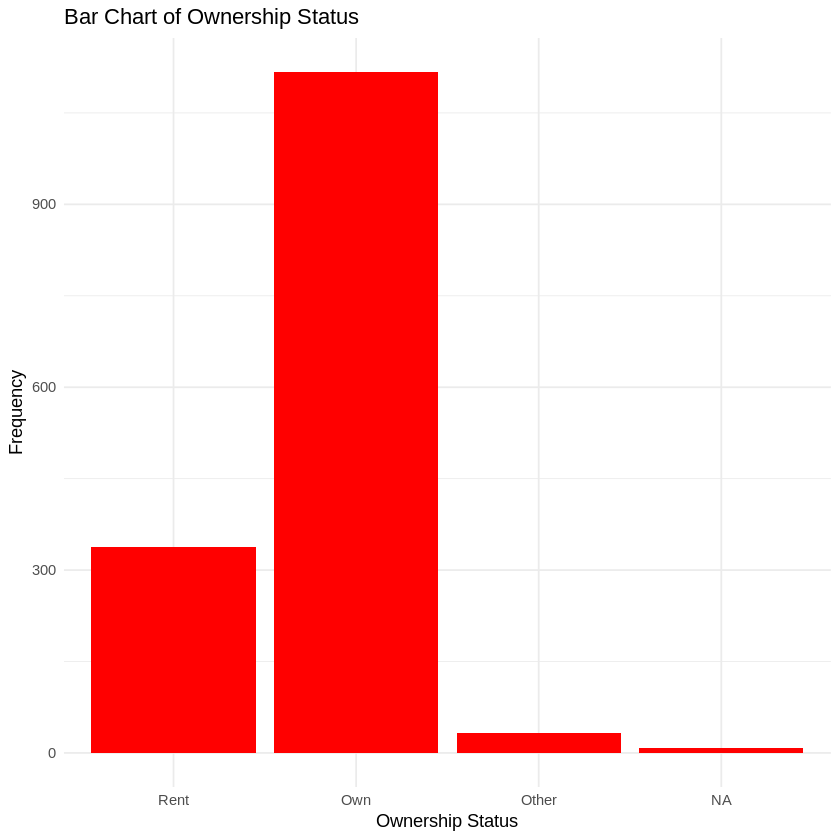

In [ ]:
# ... (previous code for descriptive statistics and custom labels) ...

# Bar chart for RENT with custom labels and red color
ggplot(MilitaryDF, aes(x = RENT)) +
  geom_bar(fill = "red") +  # Change color to "red"
  labs(title = "Bar Chart of Ownership Status",
       x = "Ownership Status",
       y = "Frequency") +
  theme_minimal()

                        CAGEAID_TOTAL Combat_Exposure_Recoded      Wellness
CAGEAID_TOTAL                      NA            2.364604e-17  2.296105e-41
Combat_Exposure_Recoded  2.364604e-17                      NA  2.280809e-06
Wellness                 2.296105e-41            2.280809e-06            NA
SBQ_TOTAL                5.669570e-62            6.230895e-15 4.196949e-112
                            SBQ_TOTAL
CAGEAID_TOTAL            5.669570e-62
Combat_Exposure_Recoded  6.230895e-15
Wellness                4.196949e-112
SBQ_TOTAL                          NA


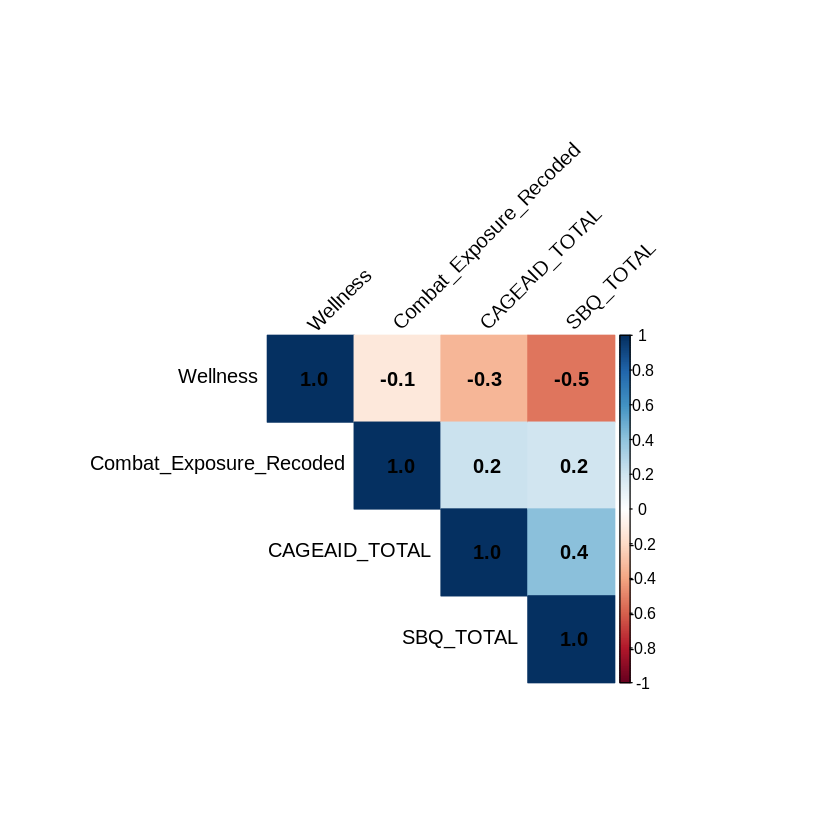

In [ ]:
# Install necessary packages if not already installed
if(!require(dplyr)){install.packages("dplyr")}
if(!require(corrplot)){install.packages("corrplot")}

# Select variables for correlation matrix
selected_vars <- c("CAGEAID_TOTAL", "Combat_Exposure_Recoded", "Wellness", "SBQ_TOTAL")

# Ensure Combat_Exposure_Recoded is numeric before correlation:
MilitaryDF$Combat_Exposure_Recoded <- as.numeric(as.character(MilitaryDF$Combat_Exposure_Recoded))

# Create correlation matrix
cor_matrix <- cor(MilitaryDF[, selected_vars], use = "pairwise.complete.obs")

# Calculate p-values for each correlation
p_values <- matrix(NA, nrow = length(selected_vars), ncol = length(selected_vars))
rownames(p_values) <- selected_vars
colnames(p_values) <- selected_vars

for (i in 1:length(selected_vars)) {
  for (j in 1:length(selected_vars)) {
    if (i != j) { # Avoid calculating p-value for a variable with itself
      cor_test <- cor.test(MilitaryDF[, selected_vars[i]],
                           MilitaryDF[, selected_vars[j]],
                           use = "pairwise.complete.obs")
      p_values[i, j] <- cor_test$p.value
    }
  }
}

# Print the p-values
print(p_values)

# Visualize correlation matrix with 1 significant figure
corrplot(cor_matrix,
         method = "color",
         type = "upper",
         order = "hclust",
         tl.col = "black",
         tl.srt = 45,
         addCoef.col = "black",  # Add coefficient colors
         number.digits = 1,     # Set number of digits to 1
         insig = "blank")       # Optionally hide insignificant correlations

In [ ]:
# prompt: wilcox.test(MilitaryDF$PUR_TOTAL ~ MilitaryDF$CAGE_R)

wilcox.test(MilitaryDF$PUR_TOTAL ~ MilitaryDF$CAGE_R)



	Wilcoxon rank sum test with continuity correction

data:  MilitaryDF$PUR_TOTAL by MilitaryDF$CAGE_R
W = 219802, p-value = 0.5865
alternative hypothesis: true location shift is not equal to 0


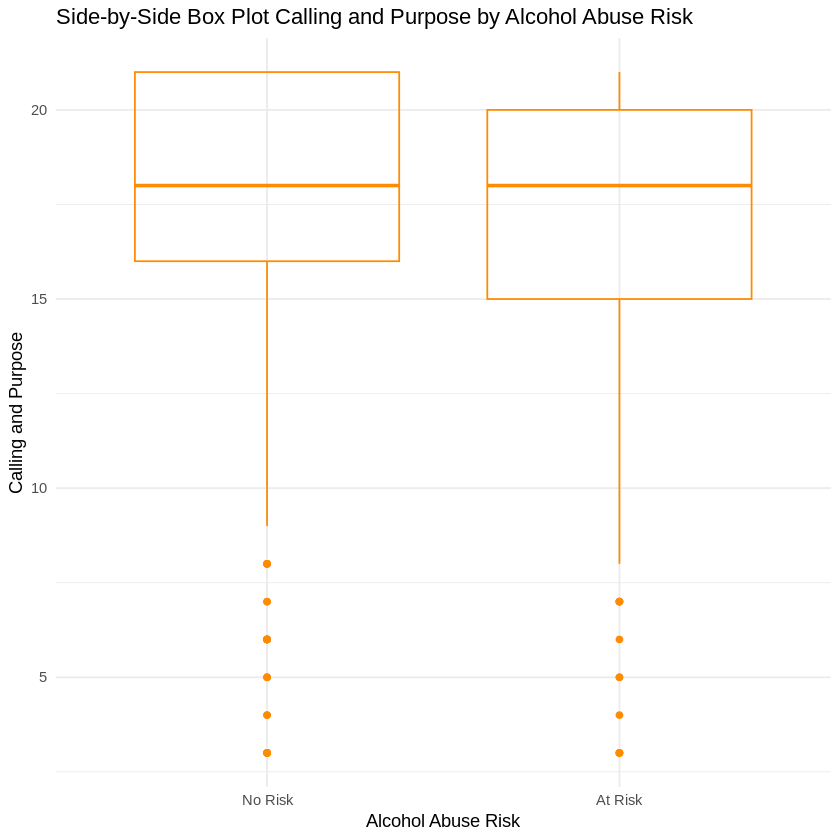

In [ ]:
# prompt: Produce a side by side box plot with the title, "Side-by-Side Box Plot Calling and Purpose by Alcohol Abuse Risk". Label the x-axis "Alcohol Abuse Risk" and the y-axis "Calling and Purpose". Use the color darkorange with 100% transparency

# Assuming 'MilitaryDF' is your dataframe and it contains columns 'MIL_CALL', 'PURPOSE', and 'CAGE_R'
# Replace 'MilitaryDF' with your actual dataframe name

if(!require(ggplot2)){install.packages("ggplot2")}

ggplot(MilitaryDF, aes(x = factor(CAGE_R), y = MIL_CALL, fill = factor(CAGE_R))) +
  geom_boxplot(color = "darkorange", fill = adjustcolor("darkorange", alpha.f = 0)) + #Darkorange with 100% transparency fill
  labs(title = "Side-by-Side Box Plot Calling and Purpose by Alcohol Abuse Risk",
       x = "Alcohol Abuse Risk",
       y = "Calling and Purpose") +
  theme_minimal()


In [ ]:
# prompt: based on the box plot and grouping by levels of CAGE_R what is the mean and SD for PUR_TOTAL

# Calculate mean and SD of PUR_TOTAL for each level of CAGE_R
aggregate(PUR_TOTAL ~ CAGE_R, data = MilitaryDF, FUN = function(x) c(mean = mean(x, na.rm = TRUE), sd = sd(x, na.rm = TRUE)))

CAGE_R,PUR_TOTAL
<fct>,"<dbl[,2]>"
No Risk,"20.29257, 3.073075"
At Risk,"20.09207, 3.366763"


In [ ]:
# prompt: base on the table, provide the sample size grouped by CAGE_R

# Calculate sample size for each group in 'CAGE_R'
table(MilitaryDF$CAGE_R)


No Risk At Risk 
   1104     391 

In [ ]:
# prompt: wilcox.test(MilitaryDF$SOC_TOTAL ~ MilitaryDF$CAGE_R)

wilcox.test(MilitaryDF$SOC_TOTAL ~ MilitaryDF$CAGE_R)



	Wilcoxon rank sum test with continuity correction

data:  MilitaryDF$SOC_TOTAL by MilitaryDF$CAGE_R
W = 274476, p-value = 1.15e-15
alternative hypothesis: true location shift is not equal to 0


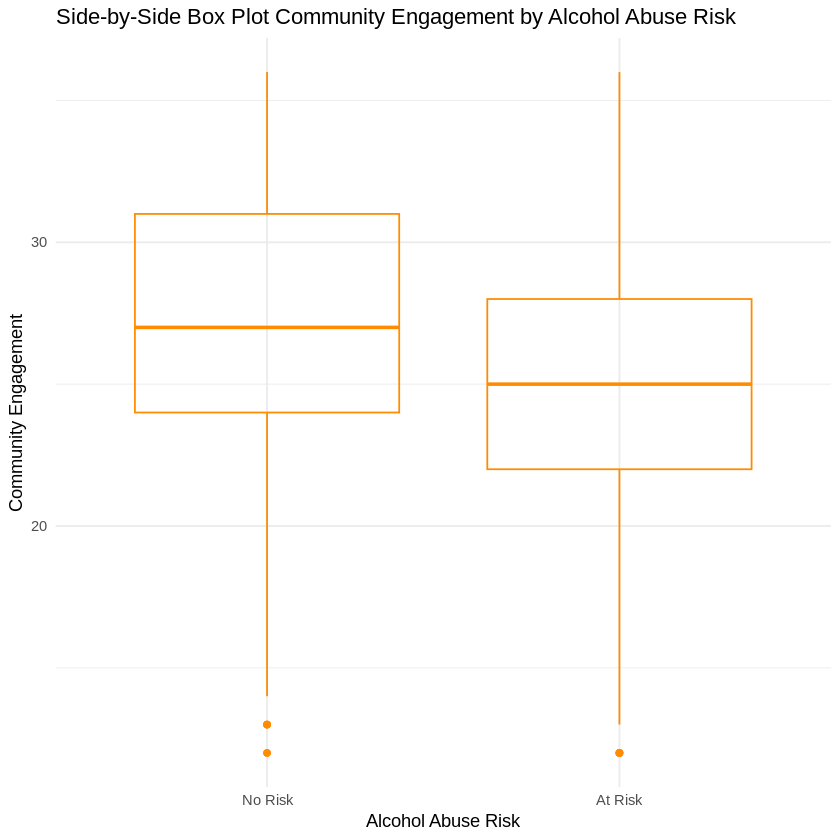

In [ ]:
# prompt: Produce a side by side box plot with the title, "Side-by-Side Box Plot Calling and Purpose by Alcohol Abuse Risk". Label the x-axis "Alcohol Abuse Risk" and the y-axis "Calling and Purpose". Use the color darkorange with 100% transparency

# Assuming 'MilitaryDF' is your dataframe and it contains columns 'MIL_CALL', 'Community Engagement', and 'CAGE_R'
# Replace 'MilitaryDF' with your actual dataframe name

if(!require(ggplot2)){install.packages("ggplot2")}

ggplot(MilitaryDF, aes(x = factor(CAGE_R), y = SOC_TOTAL, fill = factor(CAGE_R))) +
  geom_boxplot(color = "darkorange", fill = adjustcolor("darkorange", alpha.f = 0)) + #Darkorange with 100% transparency fill
  labs(title = "Side-by-Side Box Plot Community Engagement by Alcohol Abuse Risk",
       x = "Alcohol Abuse Risk",
       y = "Community Engagement") +
  theme_minimal()


In [ ]:
# prompt: based on the box plot and grouping by levels of CAGE_R what is the mean and SD for SOC_TOTAL

# Calculate mean and SD of SOC_TOTAL for each level of CAGE_R
aggregate(SOC_TOTAL ~ CAGE_R, data = MilitaryDF, FUN = function(x) c(mean = mean(x, na.rm = TRUE), sd = sd(x, na.rm = TRUE)))

CAGE_R,SOC_TOTAL
<fct>,"<dbl[,2]>"
No Risk,"27.30978, 5.015665"
At Risk,"24.86445, 5.174349"


In [ ]:
# prompt: wilcox.test(MilitaryDF$HELP_TOTAL ~ MilitaryDF$CAGE_R)

wilcox.test(MilitaryDF$HELP_TOTAL ~ MilitaryDF$CAGE_R)



	Wilcoxon rank sum test with continuity correction

data:  MilitaryDF$HELP_TOTAL by MilitaryDF$CAGE_R
W = 216700, p-value = 0.9056
alternative hypothesis: true location shift is not equal to 0


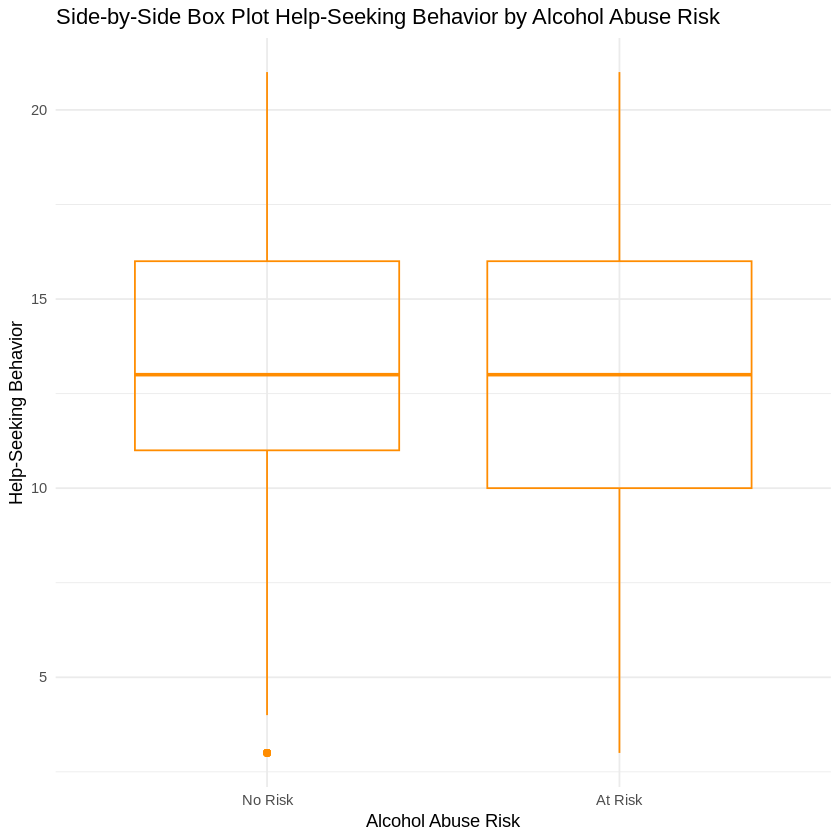

In [ ]:
# prompt: Produce a side by side box plot with the title, "Side-by-Side Box Plot Help-Seeking Behavior by Alcohol Abuse Risk". Label the x-axis "Alcohol Abuse Risk" and the y-axis "Help-Seeking Behavior". Use the color darkorange with 100% transparency

# Assuming 'MilitaryDF' is your dataframe and it contains columns 'HELP_TOTAL' and 'CAGE_R'
# Replace 'MilitaryDF' with your actual dataframe name

if(!require(ggplot2)){install.packages("ggplot2")}

ggplot(MilitaryDF, aes(x = factor(CAGE_R), y = HELP_TOTAL, fill = factor(CAGE_R))) +
  geom_boxplot(color = "darkorange", fill = adjustcolor("darkorange", alpha.f = 0)) + #Darkorange with 100% transparency fill
  labs(title = "Side-by-Side Box Plot Help-Seeking Behavior by Alcohol Abuse Risk",
       x = "Alcohol Abuse Risk",
       y = "Help-Seeking Behavior") +
  theme_minimal()

In [ ]:
# prompt: based on the box plot and grouping by levels of CAGE_R what is the mean and SD for HELP_TOTAL

# Calculate mean and SD of HELP_TOTAL for each level of CAGE_R
aggregate(HELP_TOTAL ~ CAGE_R, data = MilitaryDF, FUN = function(x) c(mean = mean(x, na.rm = TRUE), sd = sd(x, na.rm = TRUE)))

CAGE_R,HELP_TOTAL
<fct>,"<dbl[,2]>"
No Risk,"12.97464, 4.254728"
At Risk,"12.91560, 4.375402"


In [ ]:
# prompt: wilcox.test(MilitaryDF$MIL_CALL ~ MilitaryDF$CAGE_R)

wilcox.test(MilitaryDF$MIL_CALL ~ MilitaryDF$CAGE_R)



	Wilcoxon rank sum test with continuity correction

data:  MilitaryDF$MIL_CALL by MilitaryDF$CAGE_R
W = 237758, p-value = 0.002523
alternative hypothesis: true location shift is not equal to 0


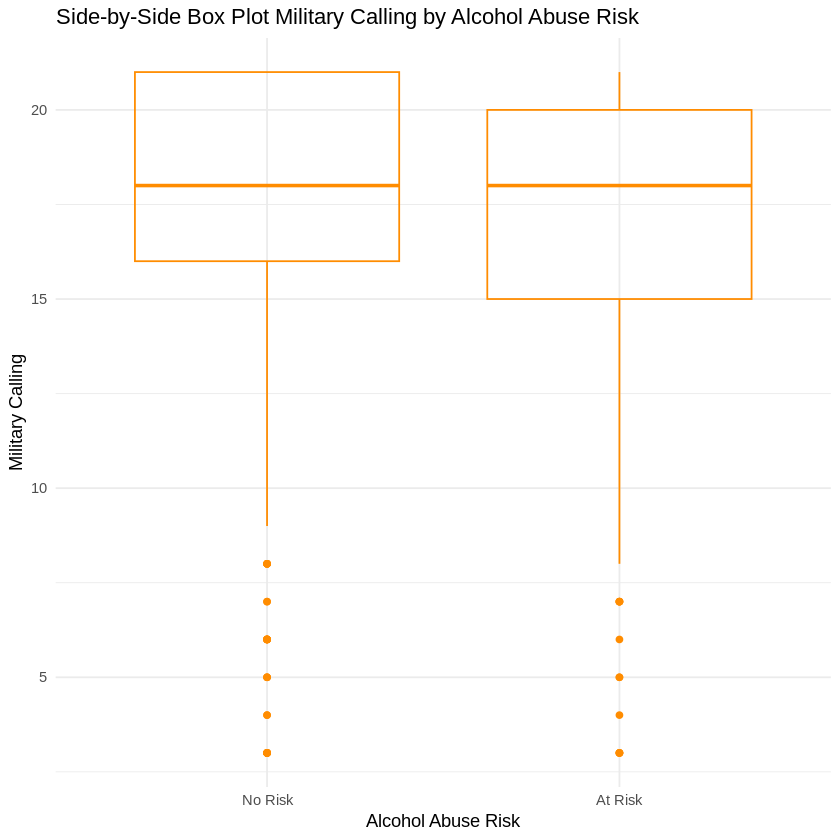

In [ ]:
# prompt: Produce a side by side box plot with the title, "Side-by-Side Box Plot Military Calling by Alcohol Abuse Risk". Label the x-axis "Alcohol Abuse Risk" and the y-axis "Military Calling". Use the color darkorange with 100% transparency

# Assuming 'MilitaryDF' is your dataframe and it contains columns 'MIL_CALL' and 'CAGE_R'
# Replace 'MilitaryDF' with your actual dataframe name

if(!require(ggplot2)){install.packages("ggplot2")}

ggplot(MilitaryDF, aes(x = factor(CAGE_R), y = MIL_CALL, fill = factor(CAGE_R))) +
  geom_boxplot(color = "darkorange", fill = adjustcolor("darkorange", alpha.f = 0)) + #Darkorange with 100% transparency fill
  labs(title = "Side-by-Side Box Plot Military Calling by Alcohol Abuse Risk",
       x = "Alcohol Abuse Risk",
       y = "Military Calling") +
  theme_minimal()

In [ ]:
# prompt: based on the box plot and grouping by levels of CAGE_R what is the mean and SD for MIL_CALL

# Calculate mean and SD of MIL_CALL for each level of CAGE_R
aggregate(MIL_CALL ~ CAGE_R, data = MilitaryDF, FUN = function(x) c(mean = mean(x, na.rm = TRUE), sd = sd(x, na.rm = TRUE)))

CAGE_R,MIL_CALL
<fct>,"<dbl[,2]>"
No Risk,"17.52899, 3.593471"
At Risk,"16.95652, 3.779927"


In [ ]:
# prompt: wilcox.test(MilitaryDF$PUB_SER ~ MilitaryDF$CAGE_R)

wilcox.test(MilitaryDF$PUB_SER ~ MilitaryDF$CAGE_R)



	Wilcoxon rank sum test with continuity correction

data:  MilitaryDF$PUB_SER by MilitaryDF$CAGE_R
W = 217322, p-value = 0.8383
alternative hypothesis: true location shift is not equal to 0


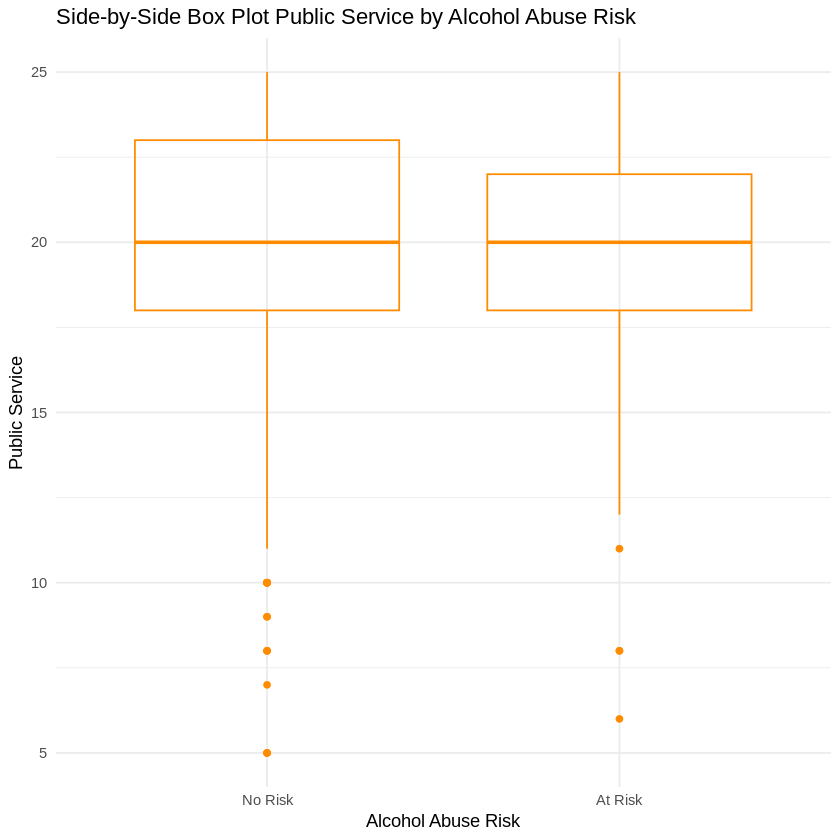

In [ ]:
# prompt: Produce a side by side box plot with the title, "Side-by-Side Box Plot Public Service by Alcohol Abuse Risk". Label the x-axis "Alcohol Abuse Risk" and the y-axis "Public Service". Use the color darkorange with 100% transparency

# Assuming 'MilitaryDF' is your dataframe and it contains columns 'PUB_SER' and 'CAGE_R'
# Replace 'MilitaryDF' with your actual dataframe name

if(!require(ggplot2)){install.packages("ggplot2")}

ggplot(MilitaryDF, aes(x = factor(CAGE_R), y = PUB_SER, fill = factor(CAGE_R))) +
  geom_boxplot(color = "darkorange", fill = adjustcolor("darkorange", alpha.f = 0)) + #Darkorange with 100% transparency fill
  labs(title = "Side-by-Side Box Plot Public Service by Alcohol Abuse Risk",
       x = "Alcohol Abuse Risk",
       y = "Public Service") +
  theme_minimal()

In [ ]:
# prompt: wilcox.test(MilitaryDF$Wellness ~ MilitaryDF$CAGE_R)

wilcox.test(MilitaryDF$Wellness ~ MilitaryDF$CAGE_R)



	Wilcoxon rank sum test with continuity correction

data:  MilitaryDF$Wellness by MilitaryDF$CAGE_R
W = 307927, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0


In [ ]:
# prompt: based on the box plot and grouping by levels of CAGE_R what is the mean and SD for Wellness

# Calculate mean and SD of Wellness for each level of CAGE_R
aggregate(Wellness ~ CAGE_R, data = MilitaryDF, FUN = function(x) c(mean = mean(x, na.rm = TRUE), sd = sd(x, na.rm = TRUE)))

CAGE_R,Wellness
<fct>,"<dbl[,2]>"
No Risk,"19.70404, 3.408359"
At Risk,"17.15896, 3.075883"


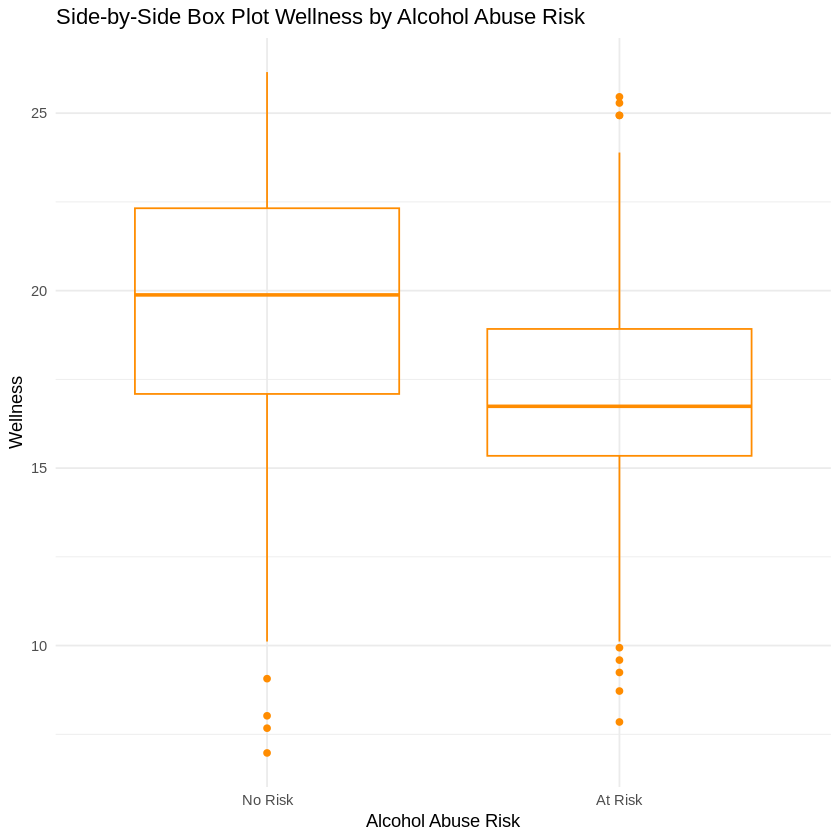

In [ ]:
# prompt: Produce a side by side box plot with the title, "Side-by-Side Box Plot Wellness by Alcohol Abuse Risk". Label the x-axis "Alcohol Abuse Risk" and the y-axis "Wellness". Use the color darkorange with 100% transparency

# Assuming 'MilitaryDF' is your dataframe and it contains columns 'Wellness' and 'CAGE_R'
# Replace 'MilitaryDF' with your actual dataframe name

if(!require(ggplot2)){install.packages("ggplot2")}

ggplot(MilitaryDF, aes(x = factor(CAGE_R), y = Wellness, fill = factor(CAGE_R))) +
  geom_boxplot(color = "darkorange", fill = adjustcolor("darkorange", alpha.f = 0)) + #Darkorange with 100% transparency fill
  labs(title = "Side-by-Side Box Plot Wellness by Alcohol Abuse Risk",
       x = "Alcohol Abuse Risk",
       y = "Wellness") +
  theme_minimal()

In [ ]:
# Install and load the package (if not already installed)
install.packages("DescTools")
library(DescTools)

# Create a contingency table (replace variables with your data)
table_data <- table(MilitaryDF$CAGE_R, MilitaryDF$WHO1)

# Perform the G-test
GTest(table_data)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)


Attaching package: ‘DescTools’


The following objects are masked from ‘package:caret’:

    MAE, RMSE


The following objects are masked from ‘package:psych’:

    AUC, ICC, SD





	Log likelihood ratio (G-test) test of independence without correction

data:  table_data
G = 110.22, X-squared df = 4, p-value < 2.2e-16


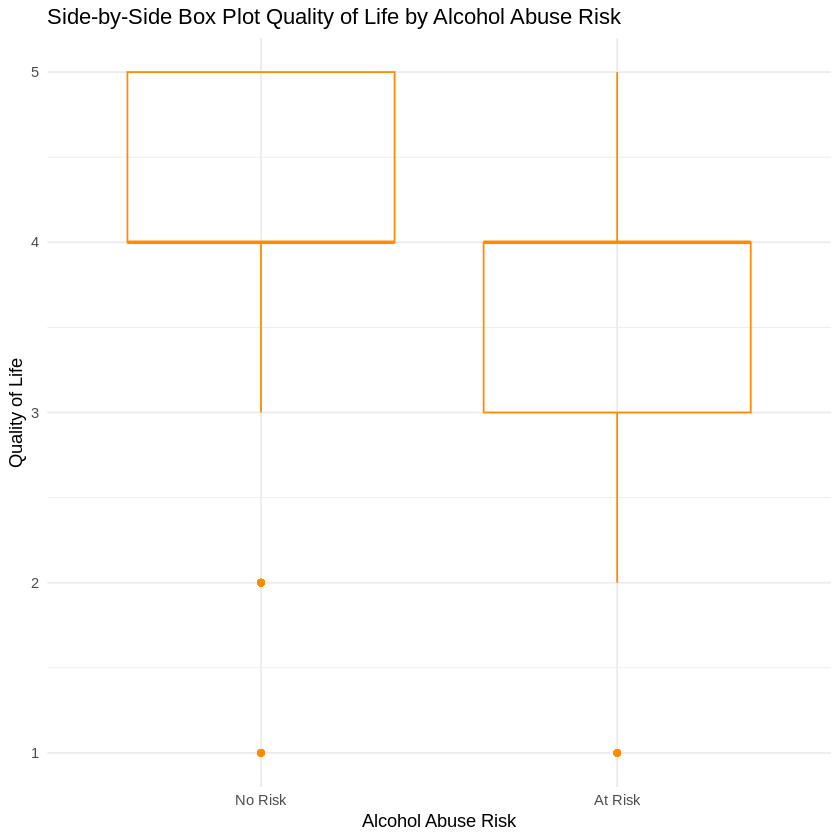

In [ ]:
# prompt: Produce a side by side box plot with the title, "Side-by-Side Box Plot Quality of Life by Alcohol Abuse Risk". Label the x-axis "Alcohol Abuse Risk" and the y-axis "Quality of Life". Use the color darkorange with 100% transparency

# Assuming 'MilitaryDF' is your dataframe and it contains columns 'WHO1' and 'CAGE_R'
# Replace 'MilitaryDF' with your actual dataframe name

if(!require(ggplot2)){install.packages("ggplot2")}

ggplot(MilitaryDF, aes(x = factor(CAGE_R), y = WHO1, fill = factor(CAGE_R))) +
  geom_boxplot(color = "darkorange", fill = adjustcolor("darkorange", alpha.f = 0)) + #Darkorange with 100% transparency fill
  labs(title = "Side-by-Side Box Plot Quality of Life by Alcohol Abuse Risk",
       x = "Alcohol Abuse Risk",
       y = "Quality of Life") +
  theme_minimal()

In [ ]:
# prompt: provide a crosstabs contingency table for categorical variable with 5 levels, WHO_1 vs binary variable CAGE_R

# Install and load necessary packages
if(!require(gmodels)){install.packages("gmodels")}

# Create the cross-tabulation
CrossTable(MilitaryDF$WHO1, MilitaryDF$CAGE_R, chisq = TRUE, expected = TRUE, prop.chisq = FALSE, prop.t = FALSE, prop.r = FALSE, prop.c = FALSE)

Loading required package: gmodels

Registered S3 method overwritten by 'gdata':
  method         from     
  reorder.factor DescTools

Warning message in chisq.test(t, correct = FALSE, ...):
“Chi-squared approximation may be incorrect”



 
   Cell Contents
|-------------------------|
|                       N |
|              Expected N |
|-------------------------|

 
Total Observations in Table:  1495 

 
                | MilitaryDF$CAGE_R 
MilitaryDF$WHO1 |   No Risk |   At Risk | Row Total | 
----------------|-----------|-----------|-----------|
              1 |        11 |         8 |        19 | 
                |    14.031 |     4.969 |           | 
----------------|-----------|-----------|-----------|
              2 |        36 |        54 |        90 | 
                |    66.462 |    23.538 |           | 
----------------|-----------|-----------|-----------|
              3 |       130 |        96 |       226 | 
                |   166.892 |    59.108 |           | 
----------------|-----------|-----------|-----------|
              4 |       588 |       174 |       762 | 
                |   562.708 |   199.292 |           | 
----------------|-----------|-----------|-----------|
              5 |       

In [ ]:
# prompt: conduct a multivariate analysis (multiple logistic regression) using the variables CAGE_R, PUR_TOTAL, SOC_TOTAL, HELP_TOTAL, MIL_CALL, WHO1, PUB_SER, and Wellness. For the variable WHO1 use level 1 as the reference level. Provide the p-values

# Install and load necessary packages
if(!require(nnet)){install.packages("nnet")}

# Assuming 'MilitaryDF' is your dataframe
# Replace 'MilitaryDF' with your actual dataframe name

# Relevel WHO1 (make level 1 the reference)
MilitaryDF$WHO1 <- relevel(factor(MilitaryDF$WHO1), ref = "1")

# Fit the multinomial logistic regression model
model <- multinom(CAGE_R ~ PUR_TOTAL + SOC_TOTAL + HELP_TOTAL + MIL_CALL + WHO1+ PUB_SER + Wellness, data = MilitaryDF)

# Summarize the model to get p-values
summary(model)

Loading required package: nnet



# weights:  12 (11 variable)
initial  value 1036.255035 
iter  10 value 825.000345
final  value 760.718810 
converged


Call:
multinom(formula = CAGE_R ~ PUR_TOTAL + SOC_TOTAL + HELP_TOTAL + 
    MIL_CALL + WHO1 + PUB_SER + Wellness, data = MilitaryDF)

Coefficients:
                  Values  Std. Err.
(Intercept)  1.668269364 0.71093848
PUR_TOTAL    0.013792273 0.02526515
SOC_TOTAL    0.006694927 0.01889526
HELP_TOTAL   0.057678565 0.01771831
MIL_CALL    -0.046219394 0.02086540
WHO12        0.805328141 0.52465070
WHO13        0.345955734 0.49890234
WHO14       -0.137665272 0.49546014
WHO15       -0.180619194 0.52321186
PUB_SER      0.041756834 0.02740154
Wellness    -0.214362137 0.02960567

Residual Deviance: 1521.438 
AIC: 1543.438 

In [ ]:
# prompt: conduct a multivariate analysis (multiple logistic regression) using the variables CAGE_R, PUR_TOTAL, SOC_TOTAL, HELP_TOTAL, MIL_CALL, WHO1, PUB_SER, and Wellness. For the variable WHO1 use level 3 as the reference level. Provide the p-values

# Install and load necessary packages
if(!require(nnet)){install.packages("nnet")}

# Assuming 'MilitaryDF' is your dataframe
# Replace 'MilitaryDF' with your actual dataframe name

# Relevel WHO1 (make level 3 the reference)
MilitaryDF$WHO1 <- relevel(factor(MilitaryDF$WHO1), ref = "3")

# Fit the multinomial logistic regression model
model <- multinom(CAGE_R ~ PUR_TOTAL + SOC_TOTAL + HELP_TOTAL + MIL_CALL + WHO1 + PUB_SER + Wellness, data = MilitaryDF)

# Summarize the model to get p-values
summary(model)

# weights:  12 (11 variable)
initial  value 1036.255035 
iter  10 value 816.983038
iter  20 value 760.718810
iter  20 value 760.718810
iter  20 value 760.718810
final  value 760.718810 
converged


Call:
multinom(formula = CAGE_R ~ PUR_TOTAL + SOC_TOTAL + HELP_TOTAL + 
    MIL_CALL + WHO1 + PUB_SER + Wellness, data = MilitaryDF)

Coefficients:
                  Values  Std. Err.
(Intercept)  2.014261493 0.54922754
PUR_TOTAL    0.013802528 0.02526526
SOC_TOTAL    0.006699291 0.01889533
HELP_TOTAL   0.057680723 0.01771841
MIL_CALL    -0.046226723 0.02086538
WHO11       -0.345951783 0.49890270
WHO12        0.459362749 0.26709539
WHO14       -0.483645747 0.17457155
WHO15       -0.526601854 0.23289828
PUB_SER      0.041747100 0.02740153
Wellness    -0.214365422 0.02960581

Residual Deviance: 1521.438 
AIC: 1543.438 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   0.000   1.000   1.425   3.000   6.000 


  0   1   2   3   4   5   6 
628 284 207 170 128  57  21 

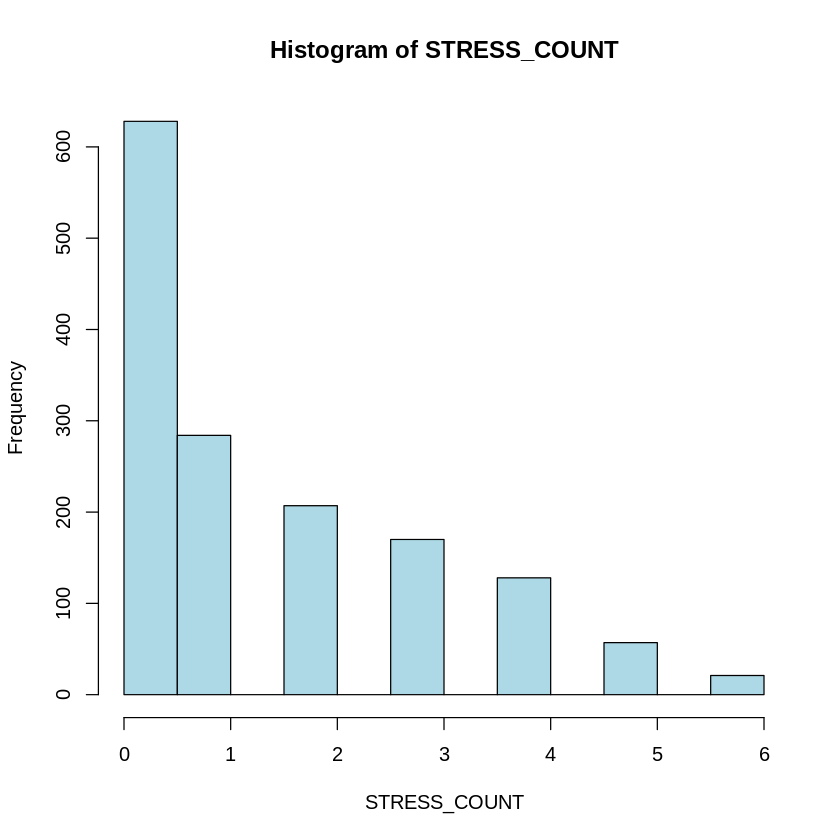

In [ ]:
# prompt: summary table of STRESS_COUNT

# Assuming 'MilitaryDF' is your dataframe and it contains a column named 'STRESS_COUNT'.
# Replace 'MilitaryDF' with your actual dataframe name if different.

# Summary statistics for STRESS_COUNT
summary(MilitaryDF$STRESS_COUNT)

# Frequency table for STRESS_COUNT
table(MilitaryDF$STRESS_COUNT)

# Histogram for STRESS_COUNT
hist(MilitaryDF$STRESS_COUNT, main = "Histogram of STRESS_COUNT", xlab = "STRESS_COUNT", col = "lightblue")

In [ ]:
# prompt: create new variable STRESS_COUNT_C = the summation of STRESS_1 through STRESS_7

MilitaryDF$STRESS_COUNT_C <- MilitaryDF$STRESS_1 + MilitaryDF$STRESS_2 + MilitaryDF$STRESS_3 + MilitaryDF$STRESS_4 + MilitaryDF$STRESS_5 + MilitaryDF$STRESS_6 + MilitaryDF$STRESS_7

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   0.000   1.000   1.591   3.000   7.000 


  0   1   2   3   4   5   6   7 
597 280 196 173 128  69  34  18 

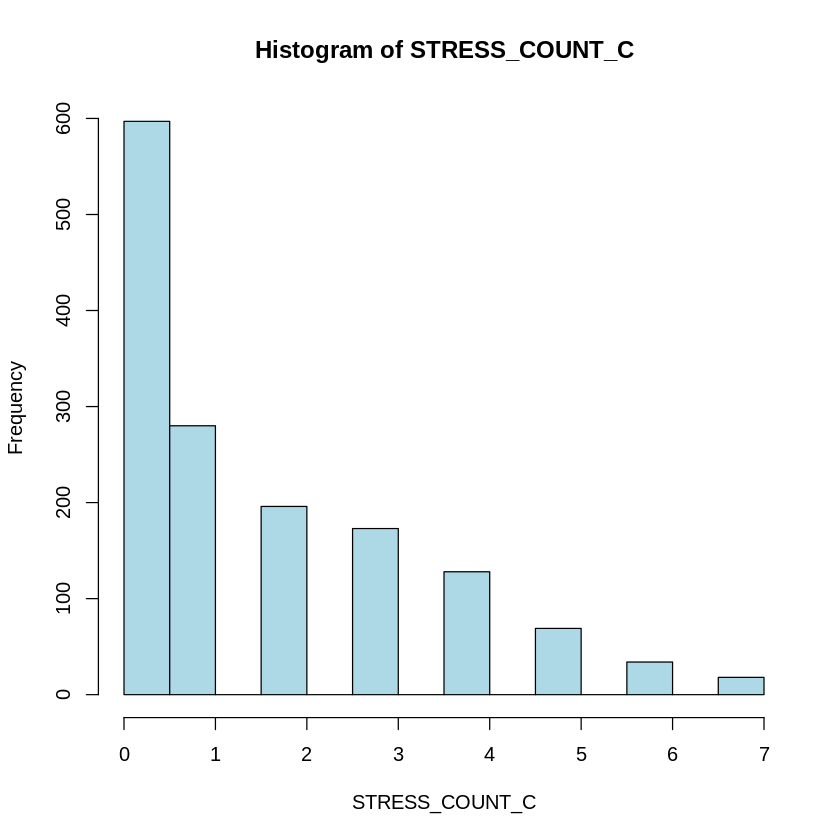

In [ ]:
# prompt: summary table for STRESS_COUNT_C

# Summary statistics for STRESS_COUNT_C
summary(MilitaryDF$STRESS_COUNT_C)

# Frequency table for STRESS_COUNT_C
table(MilitaryDF$STRESS_COUNT_C)

# Histogram for STRESS_COUNT_C
hist(MilitaryDF$STRESS_COUNT_C, main = "Histogram of STRESS_COUNT_C", xlab = "STRESS_COUNT_C", col = "lightblue")

In [ ]:
# prompt: create new variable STRESS_SEV with 0 = STRESS_COUNT_C = 0 and 1 = STRESS_COUNT_C >0.  Label 0 = "No Stress", 1= 'Daily Stress"

# Create STRESS_SEV based on STRESS_COUNT_C
MilitaryDF$STRESS_SEV <- ifelse(MilitaryDF$STRESS_COUNT_C == 0, 0, 1)

# Convert STRESS_SEV to a factor with labels
MilitaryDF$STRESS_SEV <- factor(MilitaryDF$STRESS_SEV, levels = c(0, 1), labels = c("No Stress", "Daily Stress"))

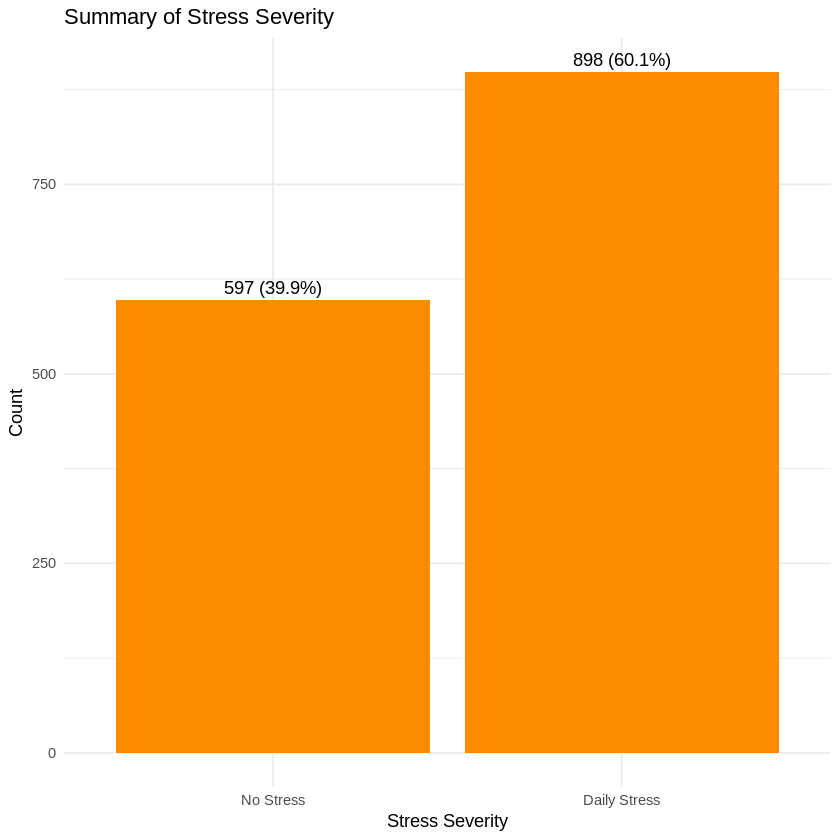

In [ ]:
# prompt: summary table for STRESS SEV, use the color dark orange, label bars with counts and %

# Load necessary library
library(ggplot2)

# Assuming MilitaryDF$STRESS_SEV is already created and is a factor

# Calculate counts and percentages for each level of STRESS_SEV
stress_sev_counts <- table(MilitaryDF$STRESS_SEV)
stress_sev_percentages <- prop.table(stress_sev_counts) * 100

# Create the bar chart
ggplot(as.data.frame(stress_sev_counts), aes(x = Var1, y = Freq)) +
  geom_bar(stat = "identity", fill = "darkorange") +
  geom_text(aes(label = paste0(Freq, " (", round(stress_sev_percentages, 1), "%)")), vjust = -0.5) +
  labs(title = "Summary of Stress Severity", x = "Stress Severity", y = "Count") +
  theme_minimal()

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  3.000   3.000   4.000   4.886   6.000   9.000 


  3   4   5   6   7   8   9 
539 219 168 279 114  85  91 

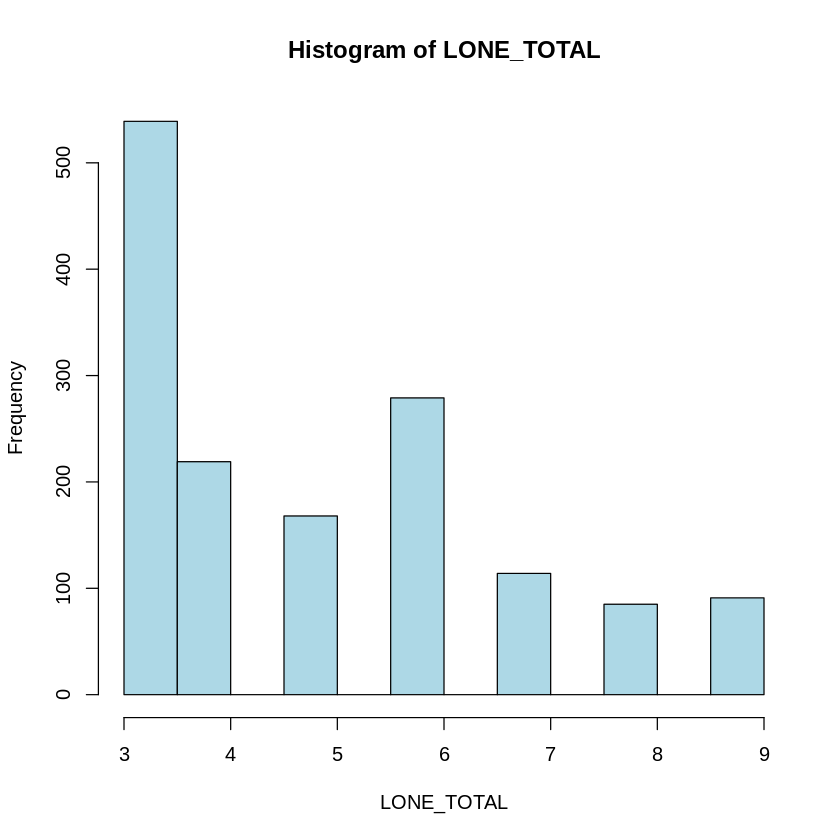

In [ ]:
# prompt: summary table for LONE_TOTAL

# Assuming 'MilitaryDF' is your dataframe and it contains a column named 'LONE_TOTAL'.
# Replace 'MilitaryDF' with your actual dataframe name if different.

# Summary statistics for LONE_TOTAL
summary(MilitaryDF$LONE_TOTAL)

# Frequency table for LONE_TOTAL
table(MilitaryDF$LONE_TOTAL)

# Histogram for LONE_TOTAL
hist(MilitaryDF$LONE_TOTAL, main = "Histogram of LONE_TOTAL", xlab = "LONE_TOTAL", col = "lightblue")

In [ ]:
# prompt: how to decrease the number of levels of a categorical variable Example use LONE_TOTAL so there are only 3 levels 0 = Low, 1 = Moderate and 2 = High where 0 = summation of count from the variable LONE_TOTAL of 3 and 4, 1 = 5 and 6, and 2 = 7, 8, and 9.  Name the new variable LONE_R. Display summary table

# Create LONE_R based on LONE_TOTAL
MilitaryDF$LONE_R <- NA
MilitaryDF$LONE_R[MilitaryDF$LONE_TOTAL %in% 3:4] <- 0
MilitaryDF$LONE_R[MilitaryDF$LONE_TOTAL %in% 5:6] <- 1
MilitaryDF$LONE_R[MilitaryDF$LONE_TOTAL %in% 7:9] <- 2

# Convert LONE_R to a factor for proper display in summary table
MilitaryDF$LONE_R <- factor(MilitaryDF$LONE_R, levels = c(0, 1, 2), labels = c("Low", "Moderate", "High"))


# Display the summary table for LONE_R
summary(MilitaryDF$LONE_R)

Low Moderate     High 
     758      447      290

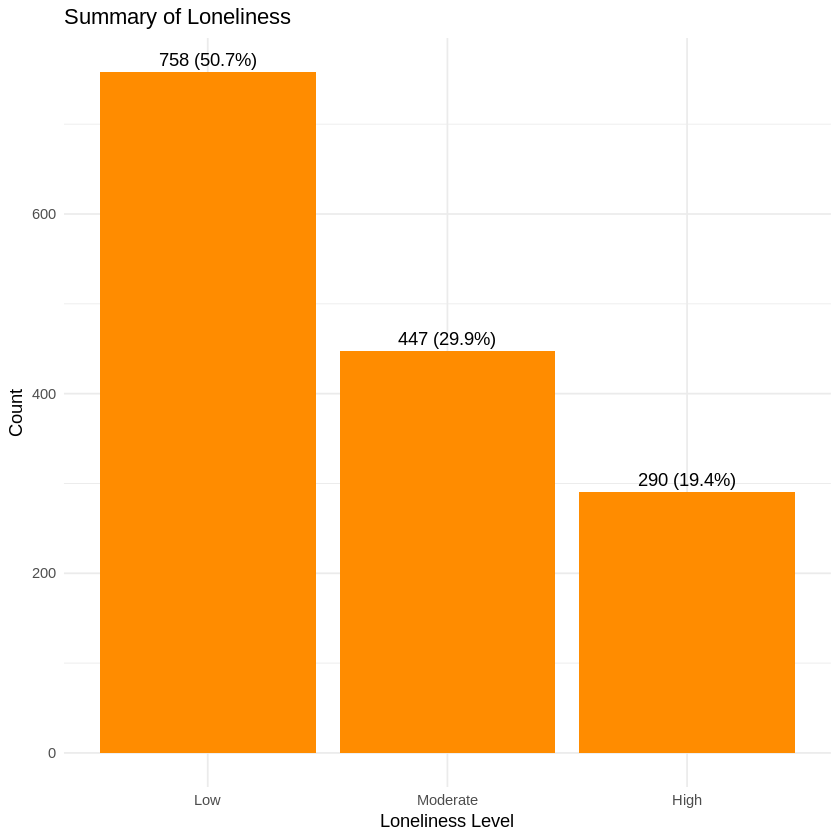

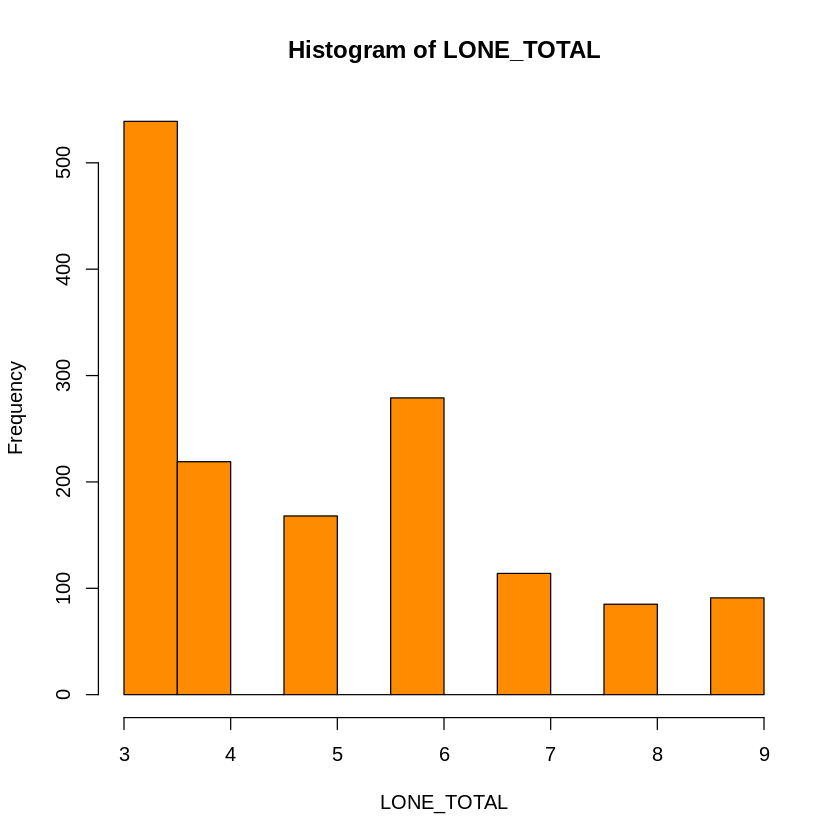

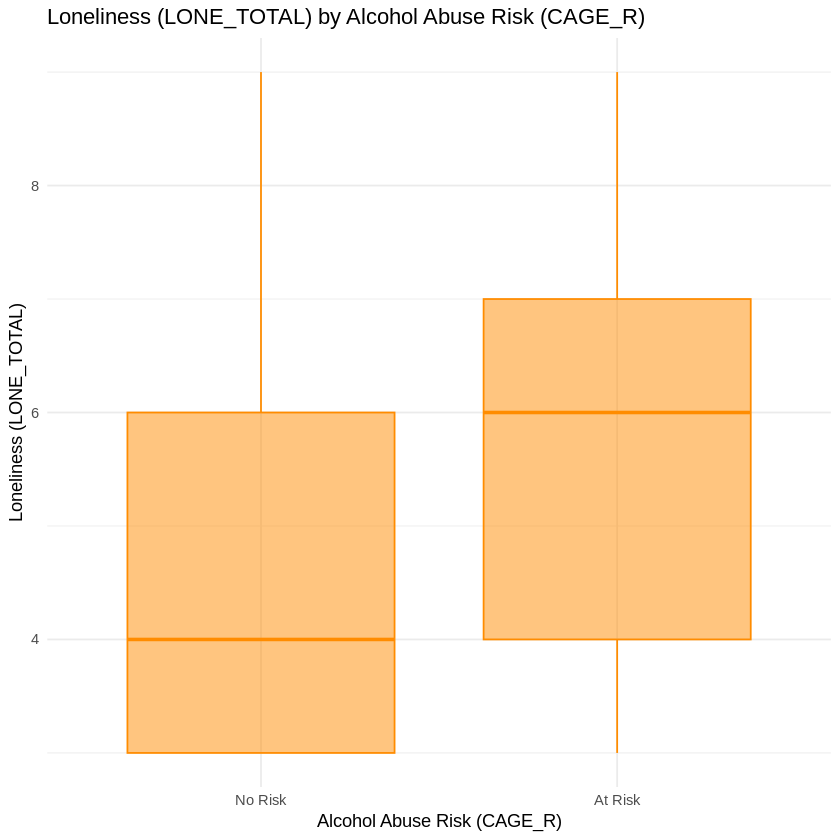

In [ ]:
# prompt: Descriptive statistics for LONE_R with graphs using dark orange

# Install and load necessary packages
if(!require(ggplot2)){install.packages("ggplot2")}

# Calculate counts and percentages for each level of LONE_R
lone_r_counts <- table(MilitaryDF$LONE_R)
lone_r_percentages <- prop.table(lone_r_counts) * 100

# Create the bar chart
ggplot(as.data.frame(lone_r_counts), aes(x = Var1, y = Freq)) +
  geom_bar(stat = "identity", fill = "darkorange") +
  geom_text(aes(label = paste0(Freq, " (", round(lone_r_percentages, 1), "%)")), vjust = -0.5) +
  labs(title = "Summary of Loneliness", x = "Loneliness Level", y = "Count") +
  theme_minimal()


# Histogram for LONE_TOTAL with dark orange color
hist(MilitaryDF$LONE_TOTAL,
     main = "Histogram of LONE_TOTAL",
     xlab = "LONE_TOTAL",
     col = "darkorange")


# Boxplot of LONE_TOTAL by CAGE_R with dark orange color
ggplot(MilitaryDF, aes(x = factor(CAGE_R), y = LONE_TOTAL, fill = factor(CAGE_R))) +
  geom_boxplot(color = "darkorange", fill = adjustcolor("darkorange", alpha.f = 0.5)) + #Darkorange with transparency fill
  labs(title = "Loneliness (LONE_TOTAL) by Alcohol Abuse Risk (CAGE_R)",
       x = "Alcohol Abuse Risk (CAGE_R)",
       y = "Loneliness (LONE_TOTAL)") +
  theme_minimal()

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  1.000   1.000   1.000   1.722   2.000   5.000 


  1   2   3   4   5 
886 261 253  68  27 

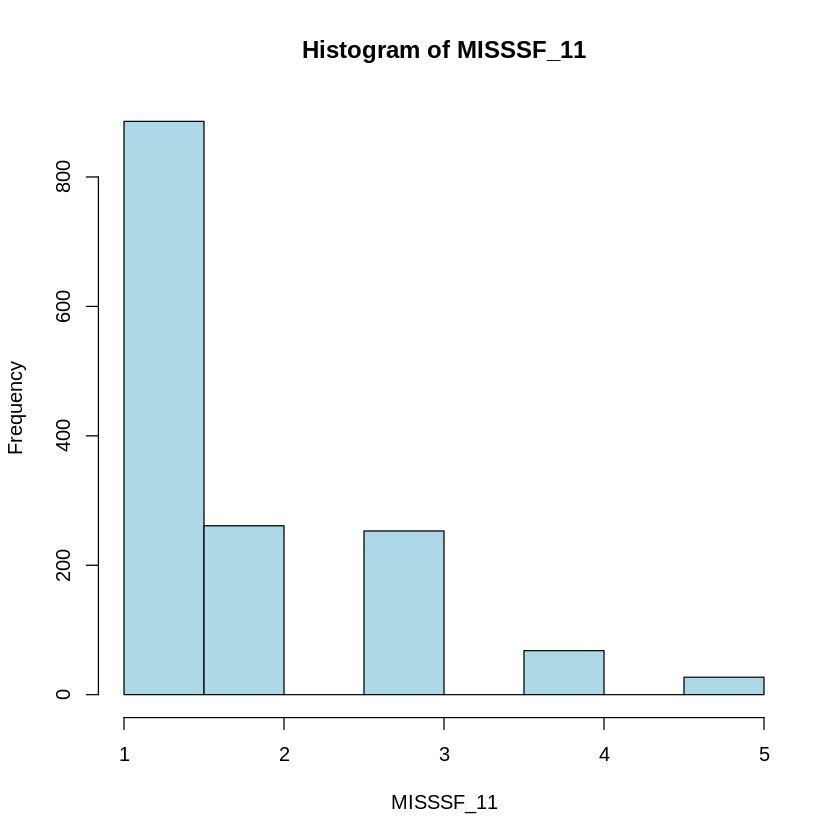

In [ ]:
# prompt: summary tables for MISSSF_11

# Assuming 'MilitaryDF' is your dataframe and it contains a column named 'MISSSF_11'.
# Replace 'MilitaryDF' with your actual dataframe name if different.

# Summary statistics for MISSSF_11
summary(MilitaryDF$MISSSF_11)

# Frequency table for MISSSF_11
table(MilitaryDF$MISSSF_11)

# Histogram for MISSSF_11
hist(MilitaryDF$MISSSF_11, main = "Histogram of MISSSF_11", xlab = "MISSSF_11", col = "lightblue")

In [ ]:
# prompt: how to decrease the number of levels of a categorical variable Example use MISSF_11 so there are only 3 levels 0 = No, 1 = Mild to Moderate and 2 = Very to Extreme where 0 = summation of count from the variable MISSF_11 of 1, 1 = 2 and 3,  and 2 = 4 and 5.  Name the new variable MOR_INJ Display summary table

# Create MOR_INJ based on MISSF_11
MilitaryDF$MOR_INJ <- NA
MilitaryDF$MOR_INJ[MilitaryDF$MISSSF_11 == 1] <- 0
MilitaryDF$MOR_INJ[MilitaryDF$MISSSF_11 %in% 2:3] <- 1
MilitaryDF$MOR_INJ[MilitaryDF$MISSSF_11 %in% 4:5] <- 2

# Convert MOR_INJ to a factor for proper display in summary table
MilitaryDF$MOR_INJ <- factor(MilitaryDF$MOR_INJ, levels = c(0, 1, 2), labels = c("No", "Mild to Moderate", "Very to Extreme"))

# Display the summary table for MOR_INJ
summary(MilitaryDF$MOR_INJ)

No Mild to Moderate  Very to Extreme 
             886              514               95

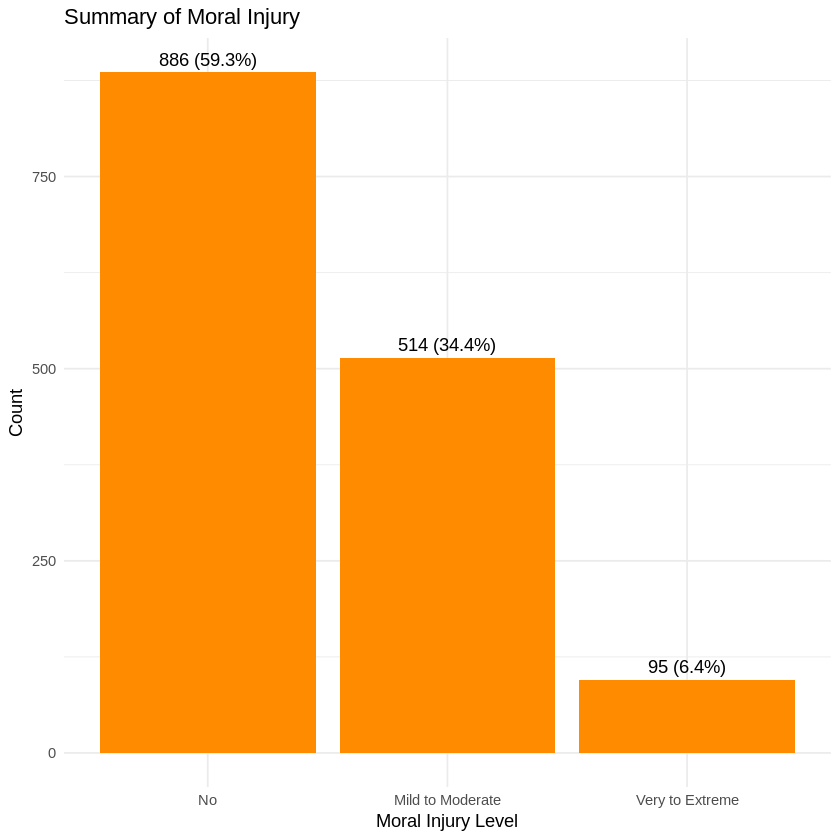

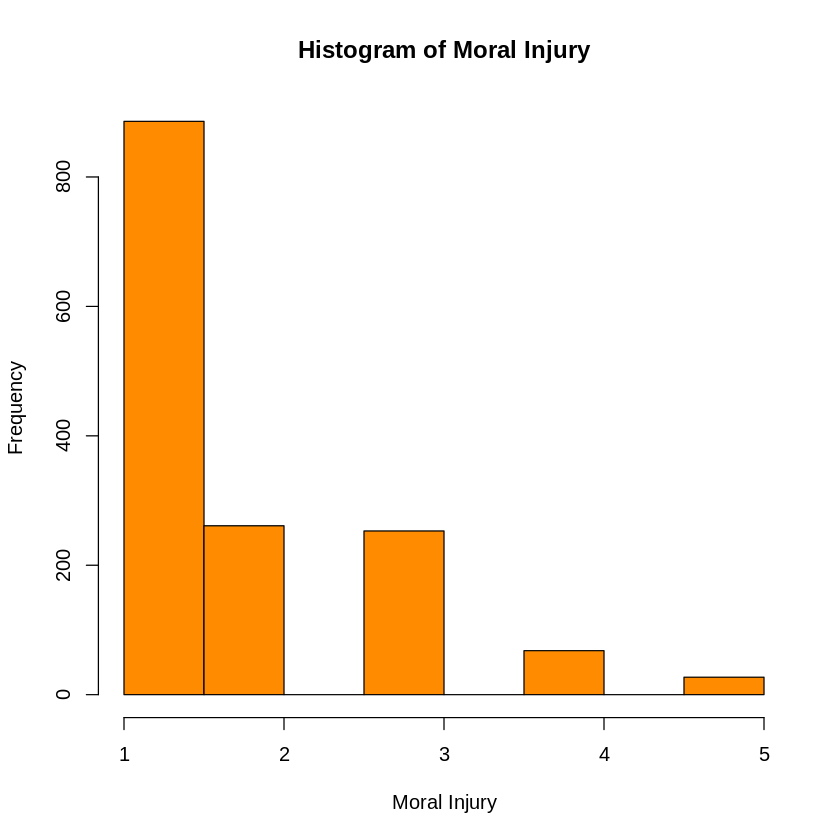

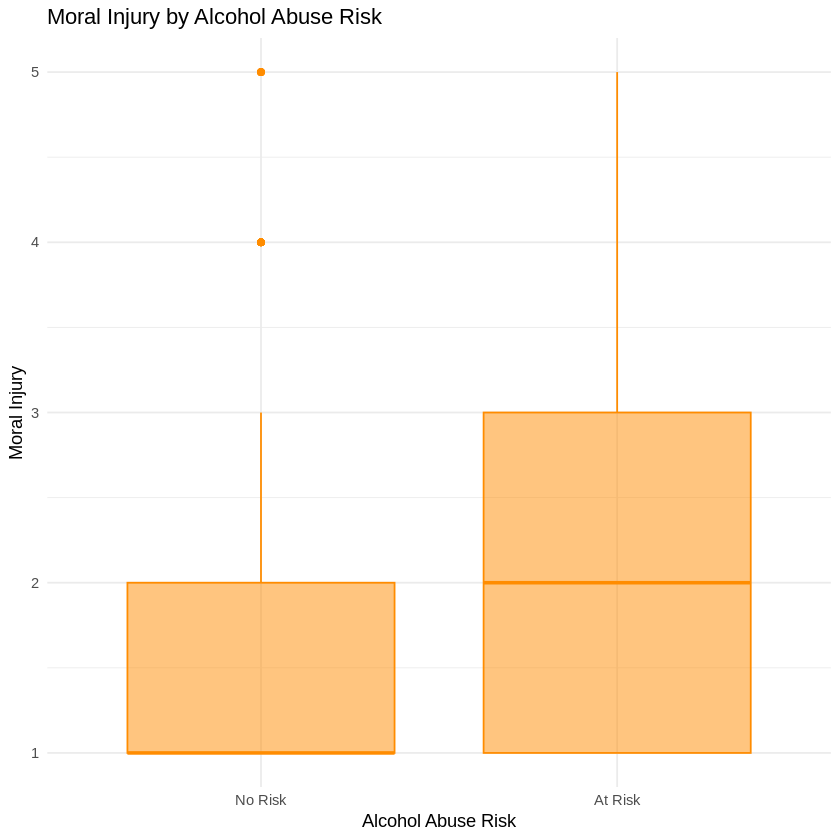

In [ ]:
# prompt: Descriptive statistics for MOR_INJ with graphs using dark orange

# Install and load necessary packages
if(!require(ggplot2)){install.packages("ggplot2")}

# Calculate counts and percentages for each level of MOR_INJ
mor_inj_counts <- table(MilitaryDF$MOR_INJ)
mor_inj_percentages <- prop.table(mor_inj_counts) * 100

# Create the bar chart
ggplot(as.data.frame(mor_inj_counts), aes(x = Var1, y = Freq)) +
  geom_bar(stat = "identity", fill = "darkorange") +
  geom_text(aes(label = paste0(Freq, " (", round(mor_inj_percentages, 1), "%)")), vjust = -0.5) +
  labs(title = "Summary of Moral Injury", x = "Moral Injury Level", y = "Count") +
  theme_minimal()

# Histogram for MISSSF_11 with dark orange color
hist(MilitaryDF$MISSSF_11,
     main = "Histogram of Moral Injury",
     xlab = "Moral Injury",
     col = "darkorange")


# Boxplot of MISSSF_11 by CAGE_R with dark orange color
ggplot(MilitaryDF, aes(x = factor(CAGE_R), y = MISSSF_11, fill = factor(CAGE_R))) +
  geom_boxplot(color = "darkorange", fill = adjustcolor("darkorange", alpha.f = 0.5)) + #Darkorange with transparency fill
  labs(title = "Moral Injury by Alcohol Abuse Risk ",
       x = "Alcohol Abuse Risk",
       y = "Moral Injury") +
  theme_minimal()

In [ ]:
# prompt: create new variable STIGMA from summation of DD_1 through DD_4

MilitaryDF$STIGMA <- MilitaryDF$DD_1 + MilitaryDF$DD_2 + MilitaryDF$DD_3 + MilitaryDF$DD_4

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  4.000   4.000   7.000   8.803  11.000  28.000 


  4   5   6   7   8   9  10  11  12  13  14  15  16  17  18  19  20  21  22  23 
400 104 104 142 139  79 109  71  58  48  37  22  42  27  13  21  18   9  15  11 
 24  25  26  27  28 
 11   1   7   2   5 

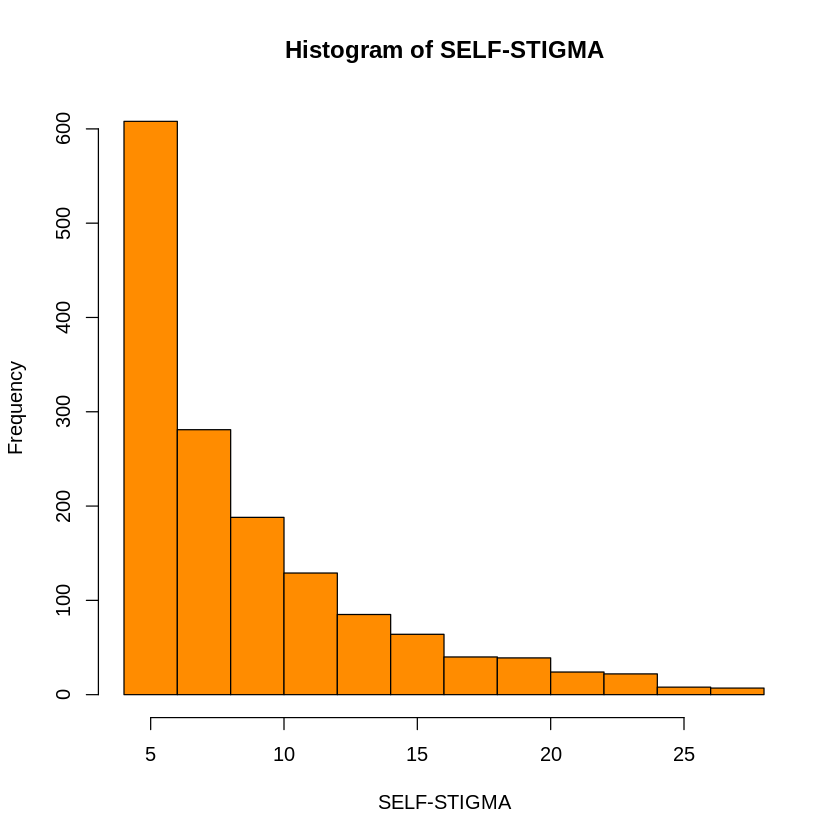

ERROR: Error in dimnames(x) <- dnx: 'dimnames' applied to non-array


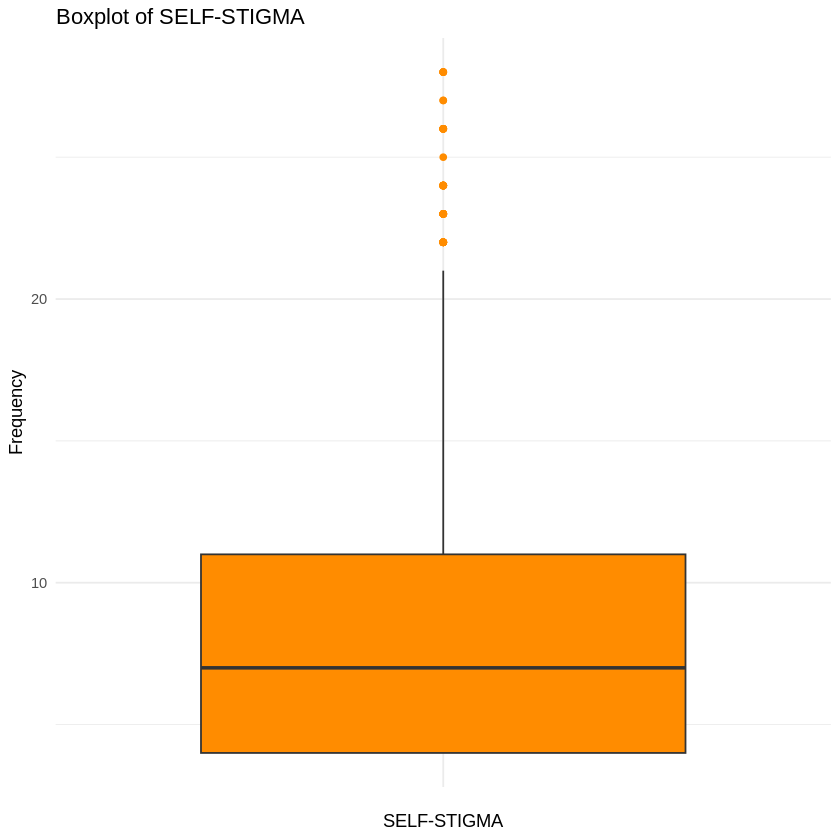

In [ ]:
# prompt: Descriptive statistics for STIGMA with graphs (Box plot and histogram for STIGMA) using dark orange, include a box plot and table. use x-axis and title labels as SELF-STIGMA

# Load necessary libraries
if(!require(ggplot2)){install.packages("ggplot2")}

# Summary statistics for STIGMA
summary(MilitaryDF$STIGMA)

# Frequency table for STIGMA
table(MilitaryDF$STIGMA)

# Histogram for STIGMA
hist(MilitaryDF$STIGMA, main = "Histogram of SELF-STIGMA", xlab = "SELF-STIGMA", col = "darkorange")

# Boxplot for STIGMA
ggplot(MilitaryDF, aes(x = "", y = STIGMA)) +
  geom_boxplot(fill = "darkorange", outlier.colour = "darkorange") +
  labs(title = "Boxplot of SELF-STIGMA", x = "SELF-STIGMA", y = "Frequency") +
  theme_minimal()


# Create a table for STIGMA statistics
stigma_stats <- data.frame(
  Statistic = c("Minimum", "1st Quartile", "Median", "Mean", "3rd Quartile", "Maximum"),
  Value = summary(MilitaryDF$STIGMA)
)
stigma_stats

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  4.000   4.000   7.000   8.803  11.000  28.000 

[1] 5.106639

[1] 8.803344

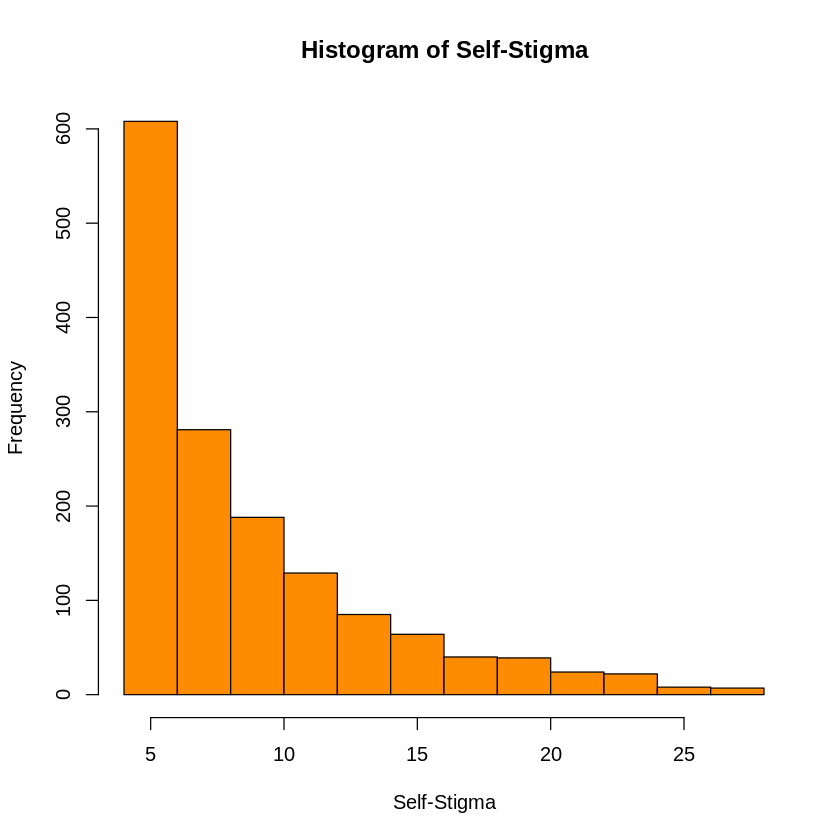

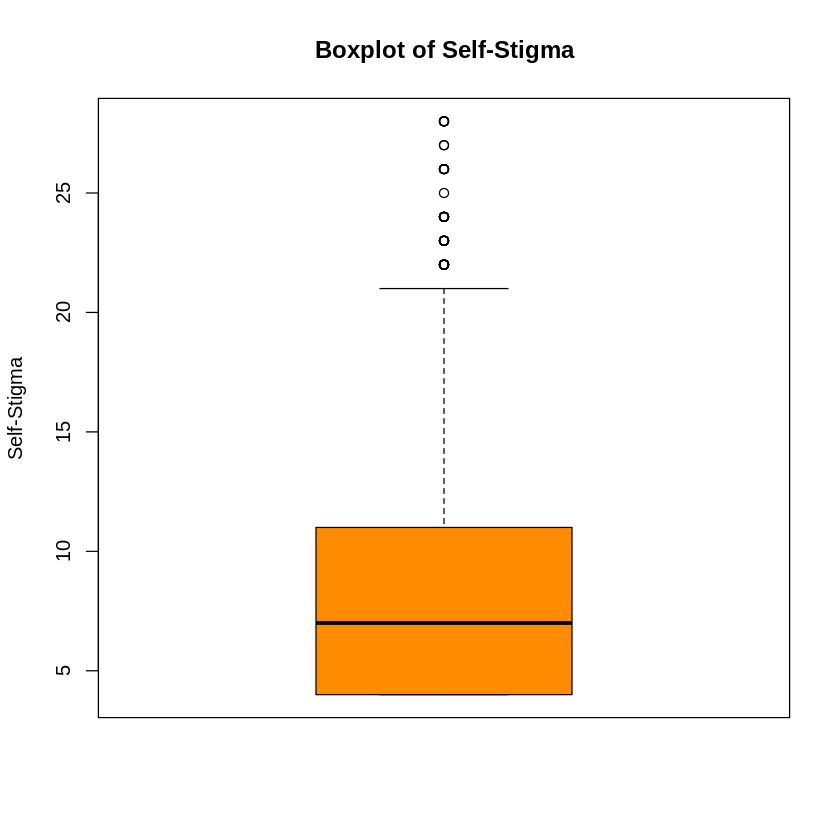

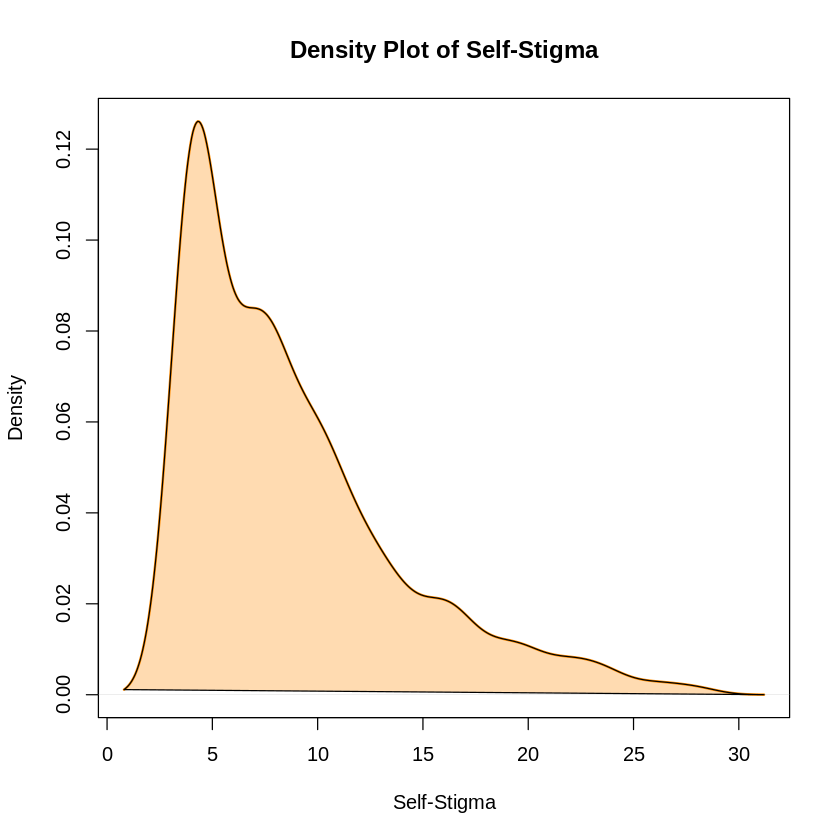

In [ ]:
# Install necessary packages if not already installed
if(!require(psych)){install.packages("psych")}

# Descriptive Statistics
summary(MilitaryDF$STIGMA)
sd(MilitaryDF$STIGMA, na.rm = TRUE)
mean(MilitaryDF$STIGMA, na.rm = TRUE)

# Histogram
hist(MilitaryDF$STIGMA,
     main = "Histogram of Self-Stigma",
     xlab = "Self-Stigma",
     ylab = "Frequency",
     col = "darkorange")

# Box plot
boxplot(MilitaryDF$STIGMA,
        main = "Boxplot of Self-Stigma",
        ylab = "Self-Stigma",
        col = "darkorange")

# Density plot
plot(density(MilitaryDF$STIGMA, na.rm = TRUE),
     main = "Density Plot of Self-Stigma",
     xlab = "Self-Stigma",
     col = "darkorange",
     lwd = 2)
polygon(density(MilitaryDF$STIGMA, na.rm = TRUE), col = adjustcolor("darkorange", alpha.f = 0.3)) # Light darkorchid shading

In [ ]:
# prompt: create new variable SBQ_TOTAL = summation of SBQ_1 through SBQ_4

MilitaryDF$SBQ_TOTAL <- MilitaryDF$SBQ_1 + MilitaryDF$SBQ_2 + MilitaryDF$SBQ_3 + MilitaryDF$SBQ_4

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max.    NA's 
  3.000   3.000   3.000   5.298   6.000  22.000      26 


  3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18  19  20  21  22 
774 170 107  74  54  57  35  39  25  27  24  22  16  13   8  10   7   3   1   3 

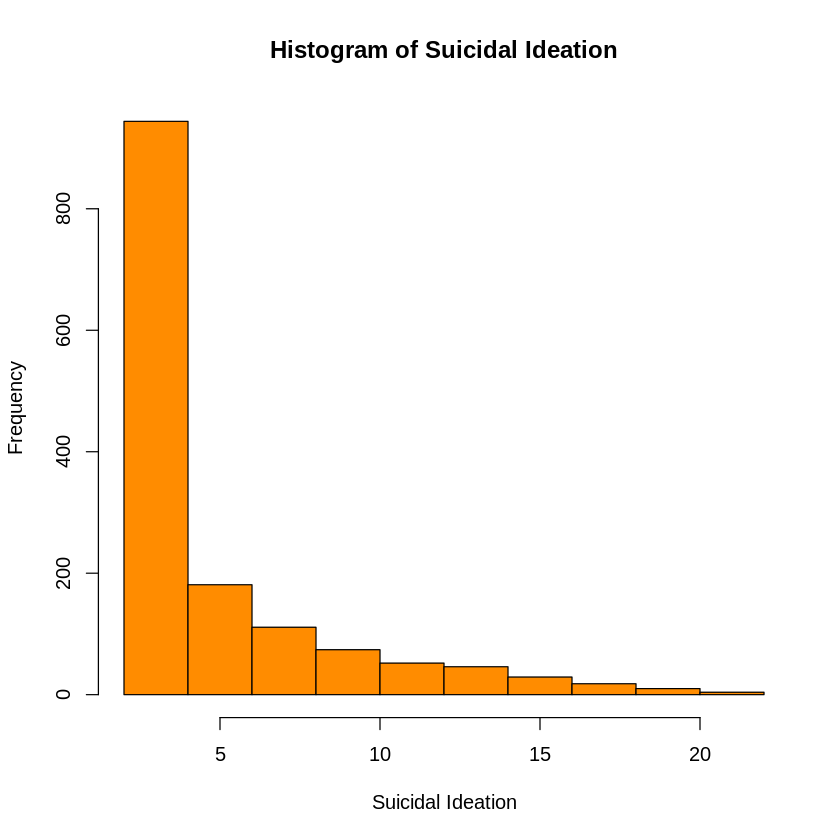

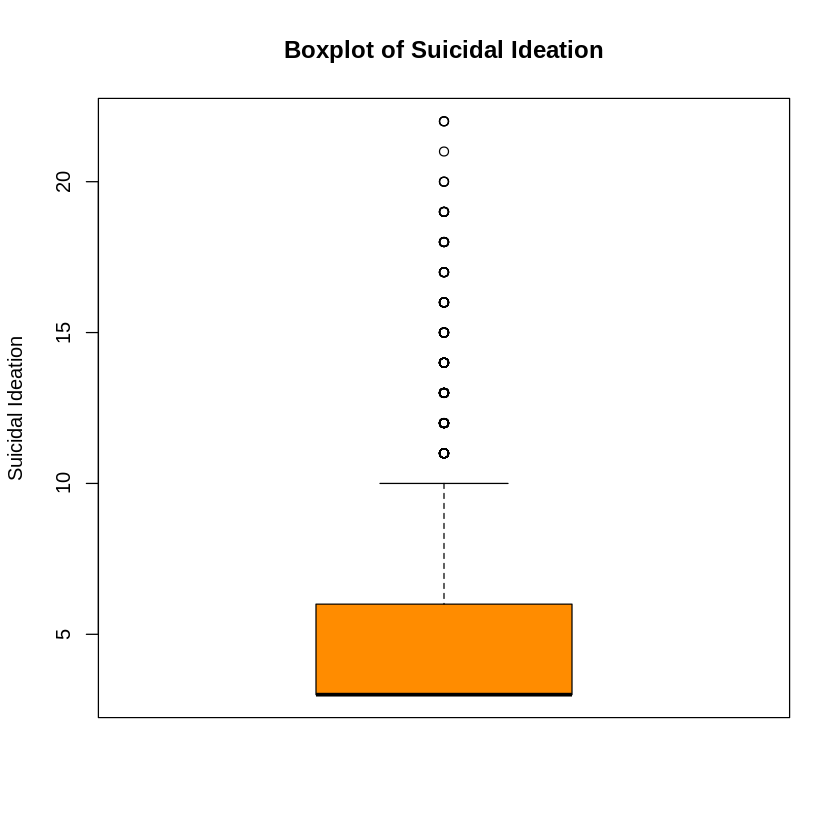

In [ ]:
# prompt: descriptive stats for SBQ_TOTAL, use the color dark orange and use the label Suicidal Ideation for SBQ_TOTAL

# Assuming 'MilitaryDF' is your dataframe and it contains a column named 'SBQ_TOTAL'.
# Replace 'MilitaryDF' with your actual dataframe name if different.

# Summary statistics for SBQ_TOTAL
summary(MilitaryDF$SBQ_TOTAL)

# Frequency table for SBQ_TOTAL
table(MilitaryDF$SBQ_TOTAL)

# Histogram for SBQ_TOTAL
hist(MilitaryDF$SBQ_TOTAL, main = "Histogram of Suicidal Ideation", xlab = "Suicidal Ideation", col = "darkorange")

# Boxplot for SBQ_TOTAL
boxplot(MilitaryDF$SBQ_TOTAL,
        main = "Boxplot of Suicidal Ideation",
        ylab = "Suicidal Ideation",
        col = "darkorange")

In [ ]:
# prompt: create a new variable SUICIDE_R from SBQ_TOTAL where 0 = SBQ_TOTAL <8 and 1 = SBQ >7. Use labels 0 = Nonsuicidal and 1 = Suicidal. Treat the "NA" responses as suicidal

# Create SUICIDE_R based on SBQ_TOTAL
MilitaryDF$SUICIDE_R <- ifelse(MilitaryDF$SBQ_TOTAL < 8, 0, 1)

# Convert SUICIDE_R to a factor with labels
MilitaryDF$SUICIDE_R <- factor(MilitaryDF$SUICIDE_R, levels = c(0, 1), labels = c("Nonsuicidal", "Suicidal"))

# Treat NA values as suicidal
MilitaryDF$SUICIDE_R[is.na(MilitaryDF$SUICIDE_R)] <- "Suicidal"

Nonsuicidal    Suicidal 
       1179         316


Nonsuicidal    Suicidal 
       1179         316 

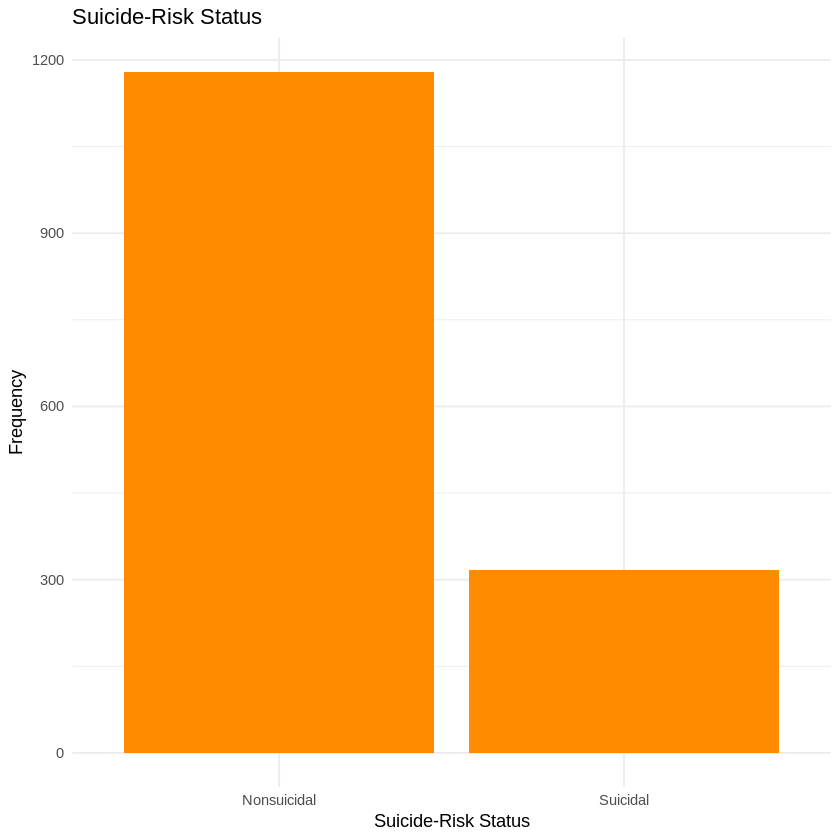

In [ ]:
# prompt: descriptive stats for SUICIDE_R, use the color dark orange and use the label "Suicide-Risk Status"

# Assuming 'MilitaryDF' is your dataframe and it contains a column named 'SUICIDE_R'.
# Replace 'MilitaryDF' with your actual dataframe name if different.

# Summary statistics for SUICIDE_R
summary(MilitaryDF$SUICIDE_R)

# Frequency table for SUICIDE_R
table(MilitaryDF$SUICIDE_R)

# Bar plot for SUICIDE_R with dark orange color and label
library(ggplot2)

ggplot(MilitaryDF, aes(x = SUICIDE_R)) +
  geom_bar(fill = "darkorange") +
  labs(title = "Suicide-Risk Status",
       x = "Suicide-Risk Status",
       y = "Frequency") +
  theme_minimal()

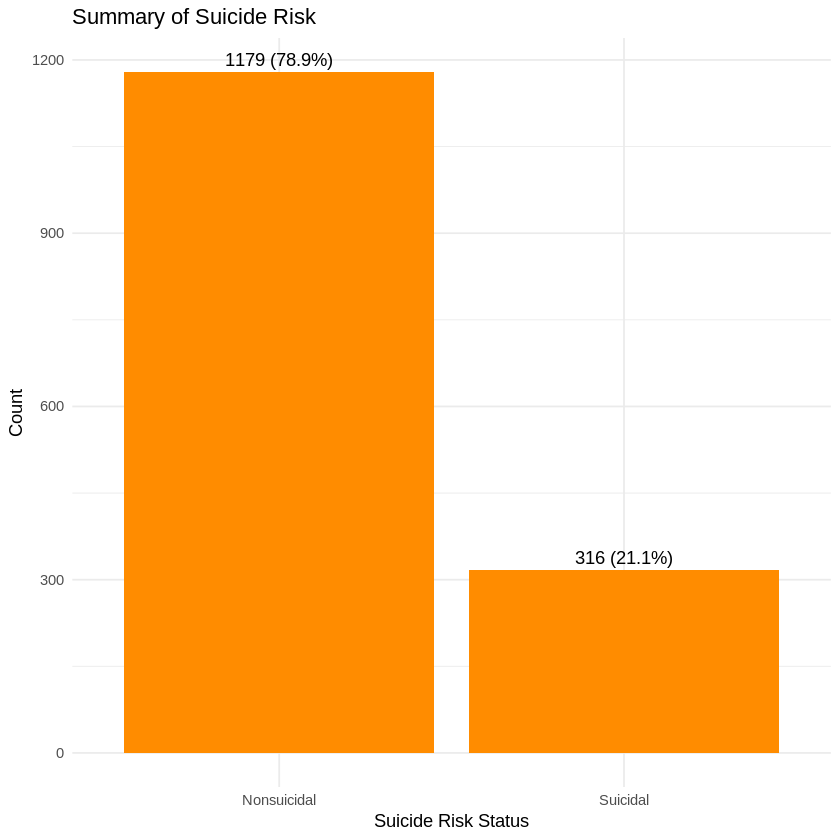

In [ ]:
# prompt: Descriptive statistics for SUICIDE_R with graphs using dark orange with %

# Calculate counts and percentages for each level of SUICIDE_R
suicide_r_counts <- table(MilitaryDF$SUICIDE_R)
suicide_r_percentages <- prop.table(suicide_r_counts) * 100

# Create the bar chart with percentages
ggplot(as.data.frame(suicide_r_counts), aes(x = Var1, y = Freq)) +
  geom_bar(stat = "identity", fill = "darkorange") +
  geom_text(aes(label = paste0(Freq, " (", round(suicide_r_percentages, 1), "%)")), vjust = -0.5) +
  labs(title = "Summary of Suicide Risk", x = "Suicide Risk Status", y = "Count") +
  theme_minimal()

In [ ]:
# prompt: Provide a count of the number of missing values that are in SQB_TOTAL

# Assuming 'MilitaryDF' is your dataframe and it contains a column named 'SQB_TOTAL'.
# Replace 'MilitaryDF' with your actual dataframe name if different.

sum(is.na(MilitaryDF$SQB_TOTAL))

[1] 0

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0000  0.0000  0.1686  0.0000  1.0000 


   0    1 
1243  252 

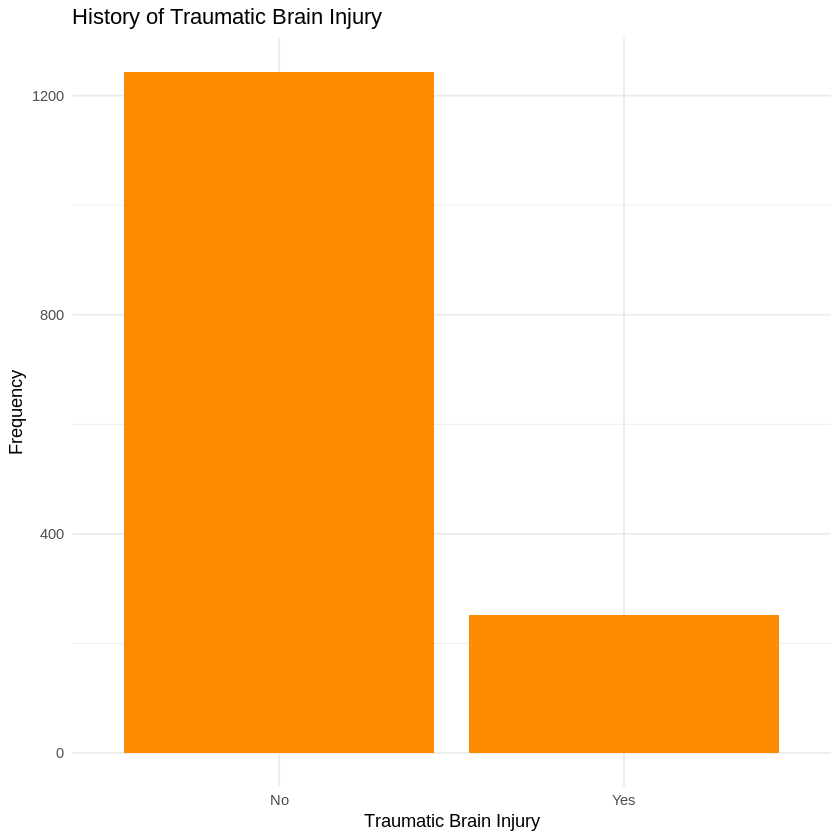

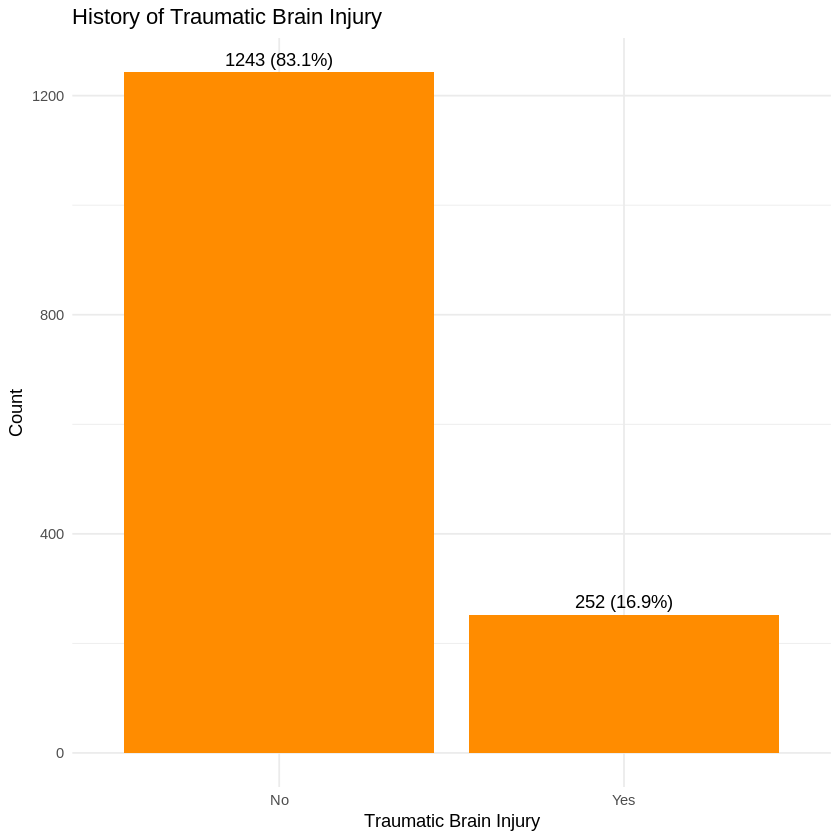

In [ ]:
# prompt: descriptive stats for TBI, use the color dark orange and use the title label "History of Traumatic Brain Injury".  Replace "0" with No and "1" with Yes for the x-axis labels

# Assuming 'MilitaryDF' is your dataframe and it contains a column named 'TBI'.
# Replace 'MilitaryDF' with your actual dataframe name if different.

# Summary statistics for TBI
summary(MilitaryDF$TBI)

# Frequency table for TBI
table(MilitaryDF$TBI)

# Bar plot for TBI with dark orange color, custom labels, and title
library(ggplot2)

ggplot(MilitaryDF, aes(x = factor(TBI))) +
  geom_bar(fill = "darkorange") +
  labs(title = "History of Traumatic Brain Injury",
       x = "Traumatic Brain Injury",
       y = "Frequency") +
  scale_x_discrete(labels = c("0" = "No", "1" = "Yes")) +  # Replace 0 and 1 with No and Yes
  theme_minimal()

# Calculate counts and percentages for each level of TBI
tbi_counts <- table(MilitaryDF$TBI)
tbi_percentages <- prop.table(tbi_counts) * 100

# Create the bar chart with percentages and custom labels
ggplot(as.data.frame(tbi_counts), aes(x = Var1, y = Freq)) +
  geom_bar(stat = "identity", fill = "darkorange") +
  geom_text(aes(label = paste0(Freq, " (", round(tbi_percentages, 1), "%)")), vjust = -0.5) +
  labs(title = "History of Traumatic Brain Injury", x = "Traumatic Brain Injury", y = "Count") +
  scale_x_discrete(labels = c("0" = "No", "1" = "Yes")) +  # Replace 0 and 1 with No and Yes
  theme_minimal()

In [ ]:
# prompt: provide a correlation matrix for the variables CAGE_R, PUR_TOTAL, HELP_TOTAL, SOC_TOTAL, MIL_CALL, WHO1, PUB_SER, and Wellness.

# Assuming 'MilitaryDF' is your dataframe
# Replace 'MilitaryDF' with your actual dataframe name

# Select the variables for the correlation matrix
correlation_variables <- MilitaryDF[, c("CAGE_R", "PUR_TOTAL", "HELP_TOTAL", "SOC_TOTAL", "MIL_CALL", "WHO1", "PUB_SER", "Wellness")]

# Convert non-numeric columns to numeric (if any)
correlation_variables$CAGE_R <- as.numeric(correlation_variables$CAGE_R)  # Convert CAGE_R to numeric
# Add similar conversions for other non-numeric columns if needed

# Calculate the correlation matrix
correlation_matrix <- cor(correlation_variables, use = "complete.obs")

# Print the correlation matrix
correlation_matrix

ERROR: Error in cor(correlation_variables, use = "complete.obs"): 'x' must be numeric


                        CAGEAID_TOTAL Combat_Exposure_Recoded      Wellness
CAGEAID_TOTAL                      NA            2.364604e-17  2.296105e-41
Combat_Exposure_Recoded  2.364604e-17                      NA  2.280809e-06
Wellness                 2.296105e-41            2.280809e-06            NA
SBQ_TOTAL                1.935651e-59            2.465041e-15 5.814439e-109
                            SBQ_TOTAL
CAGEAID_TOTAL            1.935651e-59
Combat_Exposure_Recoded  2.465041e-15
Wellness                5.814439e-109
SBQ_TOTAL                          NA


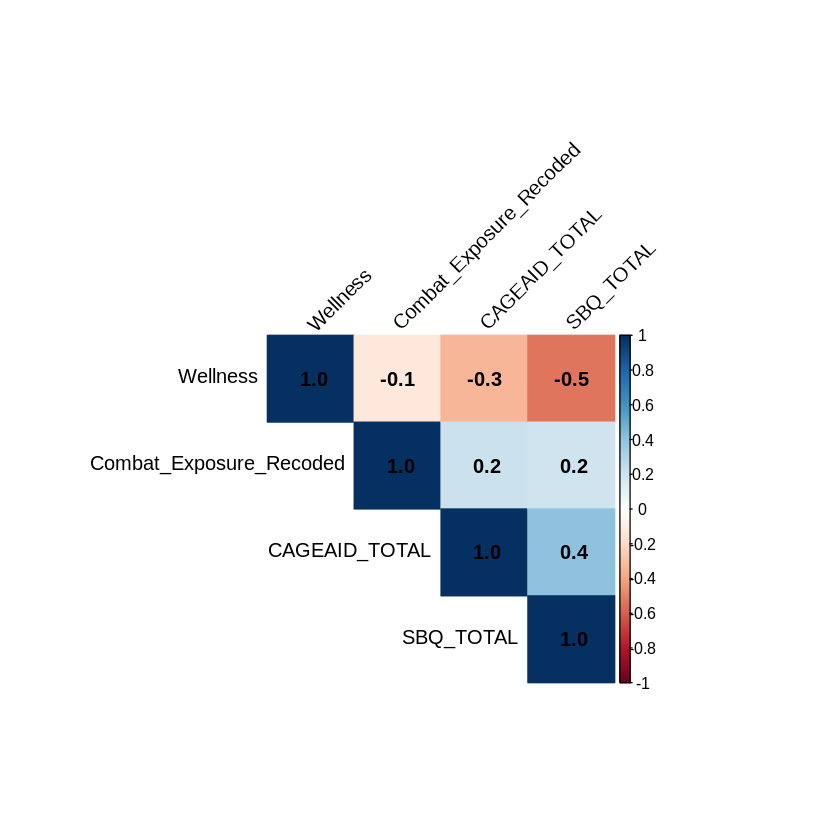

In [ ]:
# Install necessary packages if not already installed
if(!require(dplyr)){install.packages("dplyr")}
if(!require(corrplot)){install.packages("corrplot")}

# Select variables for correlation matrix
selected_vars <- c("CAGEAID_TOTAL", "Combat_Exposure_Recoded", "Wellness", "SBQ_TOTAL")

# Ensure Combat_Exposure_Recoded is numeric before correlation:
MilitaryDF$Combat_Exposure_Recoded <- as.numeric(as.character(MilitaryDF$Combat_Exposure_Recoded))

# Create correlation matrix
cor_matrix <- cor(MilitaryDF[, selected_vars], use = "pairwise.complete.obs")

# Calculate p-values for each correlation
p_values <- matrix(NA, nrow = length(selected_vars), ncol = length(selected_vars))
rownames(p_values) <- selected_vars
colnames(p_values) <- selected_vars

for (i in 1:length(selected_vars)) {
  for (j in 1:length(selected_vars)) {
    if (i != j) { # Avoid calculating p-value for a variable with itself
      cor_test <- cor.test(MilitaryDF[, selected_vars[i]],
                           MilitaryDF[, selected_vars[j]],
                           use = "pairwise.complete.obs")
      p_values[i, j] <- cor_test$p.value
    }
  }
}

# Print the p-values
print(p_values)

# Visualize correlation matrix with 1 significant figure
corrplot(cor_matrix,
         method = "color",
         type = "upper",
         order = "hclust",
         tl.col = "black",
         tl.srt = 45,
         addCoef.col = "black",  # Add coefficient colors
         number.digits = 1,     # Set number of digits to 1
         insig = "blank")       # Optionally hide insignificant correlations


	Wilcoxon rank sum test with continuity correction

data:  PUR_TOTAL by CAGE_R
W = 219802, p-value = 0.5865
alternative hypothesis: true location shift is not equal to 0


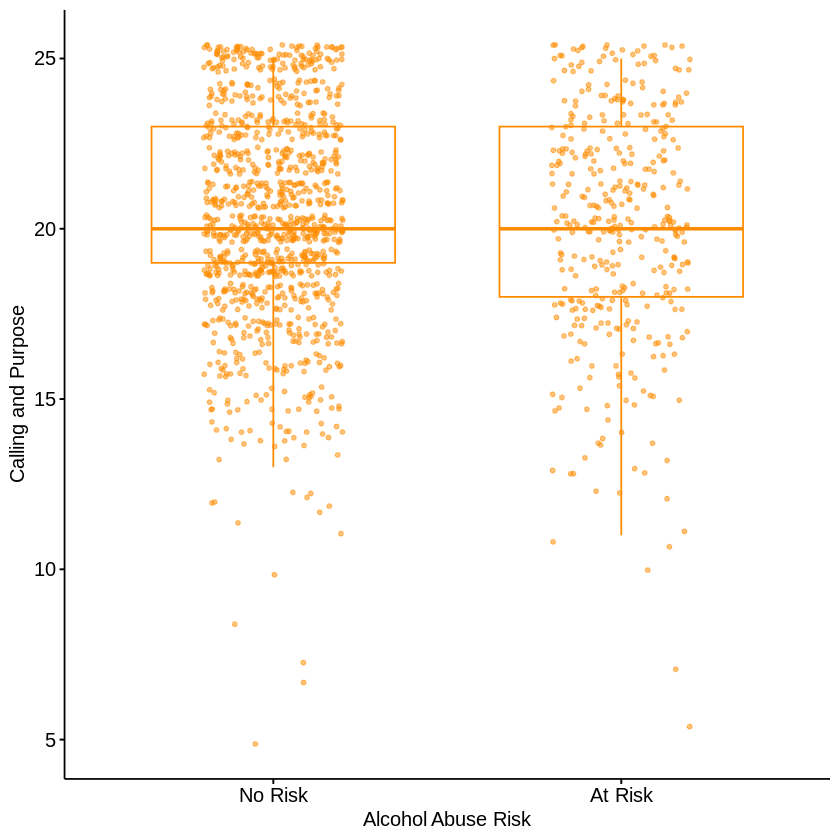

In [ ]:
# prompt: Conduct a Mann Whitney test for variables PUR_TOTAL and CAGE_R. Include a side-by-side bar chart. Use the color dark orange for graph. Remove the jitter. Use the labels Alcohol Abuse Risk and Calling and Purpose.

# Install and load necessary packages
if(!require(ggplot2)){install.packages("ggplot2")}
if(!require(ggpubr)){install.packages("ggpubr")}

# Perform Mann-Whitney U test
wilcox.test(PUR_TOTAL ~ CAGE_R, data = MilitaryDF)


# Create side-by-side bar chart
ggboxplot(MilitaryDF, x = "CAGE_R", y = "PUR_TOTAL",
          color = "darkorange",
          add = "jitter", # Add jitter points
          add.params = list(size = 1, alpha = 0.5), # Adjust size and alpha for points
          ylab = "Calling and Purpose",
          xlab = "Alcohol Abuse Risk")



In [ ]:
# prompt: # prompt: based on the box plot and grouping by levels of CAGE_R what is the mean and SD for PUR_TOTAL

# Calculate mean and SD of PUR_TOTAL for each level of CAGE_R
aggregate(PUR_TOTAL ~ CAGE_R, data = MilitaryDF, FUN = function(x) c(Mean = mean(x, na.rm = TRUE), SD = sd(x, na.rm = TRUE)))

CAGE_R,PUR_TOTAL
<fct>,"<dbl[,2]>"
No Risk,"20.29257, 3.073075"
At Risk,"20.09207, 3.366763"


In [ ]:
# prompt: Conduct a Mann Whitney test for variables PUR_TOTAL and CAGE_R. Include a side-by-side bar chart. Use the color dark orange for graph. Remove the jitter. Use the labels Alcohol Abuse Risk and Calling and Purpose.

# Install and load necessary packages
if(!require(ggplot2)){install.packages("ggplot2")}
if(!require(ggpubr)){install.packages("ggpubr")}

# Perform Mann-Whitney U test
wilcox.test(PUR_TOTAL ~ CAGE_R, data = MilitaryDF)

# Create side-by-side boxplot (better for comparing distributions)
ggboxplot(MilitaryDF, x = "CAGE_R", y = "PUR_TOTAL",
          color = "darkorange",
          add = "jitter", # Add jitter points
          add.params = list(size = 1, alpha = 0.5), # Adjust size and alpha for points
          ylab = "Calling and Purpose",
          xlab = "Alcohol Abuse Risk")


 
   Cell Contents
|-------------------------|
|                       N |
|           N / Row Total |
|           N / Col Total |
|-------------------------|

 
Total Observations in Table:  1495 

 
                | Alcohol Abuse Risk 
Combat Exposure |   No Risk |   At Risk | Row Total | 
----------------|-----------|-----------|-----------|
              0 |       945 |       279 |      1224 | 
                |     0.772 |     0.228 |     0.819 | 
                |     0.856 |     0.714 |           | 
----------------|-----------|-----------|-----------|
              1 |       159 |       112 |       271 | 
                |     0.587 |     0.413 |     0.181 | 
                |     0.144 |     0.286 |           | 
----------------|-----------|-----------|-----------|
   Column Total |      1104 |       391 |      1495 | 
                |     0.738 |     0.262 |           | 
----------------|-----------|-----------|-----------|

 
Statistics for All Table Factors


Pearson's C

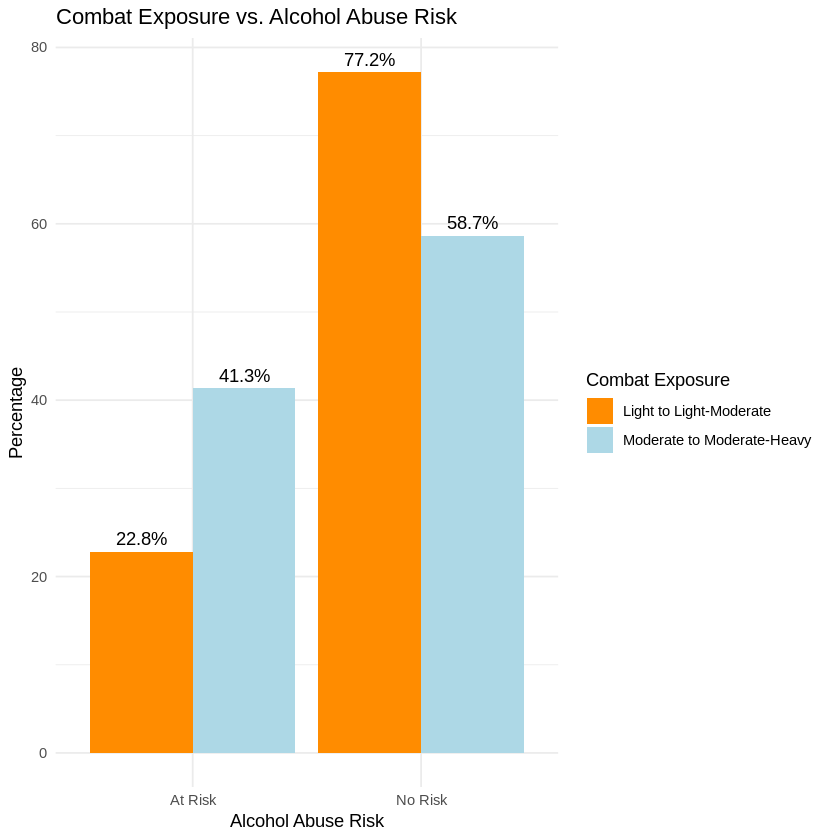

In [ ]:
# prompt: Perform a Person Chi-Square of the binary variables COM_EX_RB and CAGE_R.  Include a side-by-side bar chart. Remove the jitter. Use the labels Alcohol Abuse Risk and Combat Exposure. Use the colors dark orange and light blue. Use labels for COM_EX_RB with 0 = Light to Light-Moderate and 1 = Moderate to Moderate-Heavy. Show percentages

# Load necessary libraries
library(gmodels)
library(ggplot2)

# Assuming MilitaryDF is your data frame
# Replace with your actual data frame name

# Create the cross-tabulation
CrossTable(MilitaryDF$COM_EX_RB, MilitaryDF$CAGE_R, chisq = TRUE,
           prop.chisq = FALSE, prop.t = FALSE, prop.r = TRUE, prop.c = TRUE,
           dnn = c("Combat Exposure", "Alcohol Abuse Risk"))


# Create the side-by-side bar chart
# Calculate proportions for the chart
combat_cage_table <- table(MilitaryDF$COM_EX_RB, MilitaryDF$CAGE_R)
combat_cage_prop <- prop.table(combat_cage_table, margin = 1) * 100 # Calculate row percentages

# Create a data frame for ggplot2
combat_cage_df <- data.frame(
  Combat_Exposure = factor(rep(rownames(combat_cage_table), ncol(combat_cage_table)),
                           levels = c("0", "1"),
                           labels = c("Light to Light-Moderate", "Moderate to Moderate-Heavy")),
  Alcohol_Abuse_Risk = factor(rep(colnames(combat_cage_table), each = nrow(combat_cage_table))),
  Percentage = as.vector(combat_cage_prop)
)


ggplot(combat_cage_df, aes(x = Alcohol_Abuse_Risk, y = Percentage, fill = Combat_Exposure)) +
  geom_bar(stat = "identity", position = "dodge") +
  geom_text(aes(label = paste0(round(Percentage, 1), "%")),
            position = position_dodge(width = 0.9), vjust = -0.5) +
  labs(title = "Combat Exposure vs. Alcohol Abuse Risk",
       x = "Alcohol Abuse Risk",
       y = "Percentage",
       fill = "Combat Exposure") +
  scale_fill_manual(values = c("darkorange", "lightblue")) +
  theme_minimal()


 
   Cell Contents
|-------------------------|
|                       N |
|           N / Row Total |
|           N / Col Total |
|-------------------------|

 
Total Observations in Table:  1495 

 
                | Alcohol Abuse Risk 
Combat Exposure |   No Risk |   At Risk | Row Total | 
----------------|-----------|-----------|-----------|
      No Stress |       518 |        79 |       597 | 
                |     0.868 |     0.132 |     0.399 | 
                |     0.469 |     0.202 |           | 
----------------|-----------|-----------|-----------|
   Daily Stress |       586 |       312 |       898 | 
                |     0.653 |     0.347 |     0.601 | 
                |     0.531 |     0.798 |           | 
----------------|-----------|-----------|-----------|
   Column Total |      1104 |       391 |      1495 | 
                |     0.738 |     0.262 |           | 
----------------|-----------|-----------|-----------|

 
Statistics for All Table Factors


Pearson's C

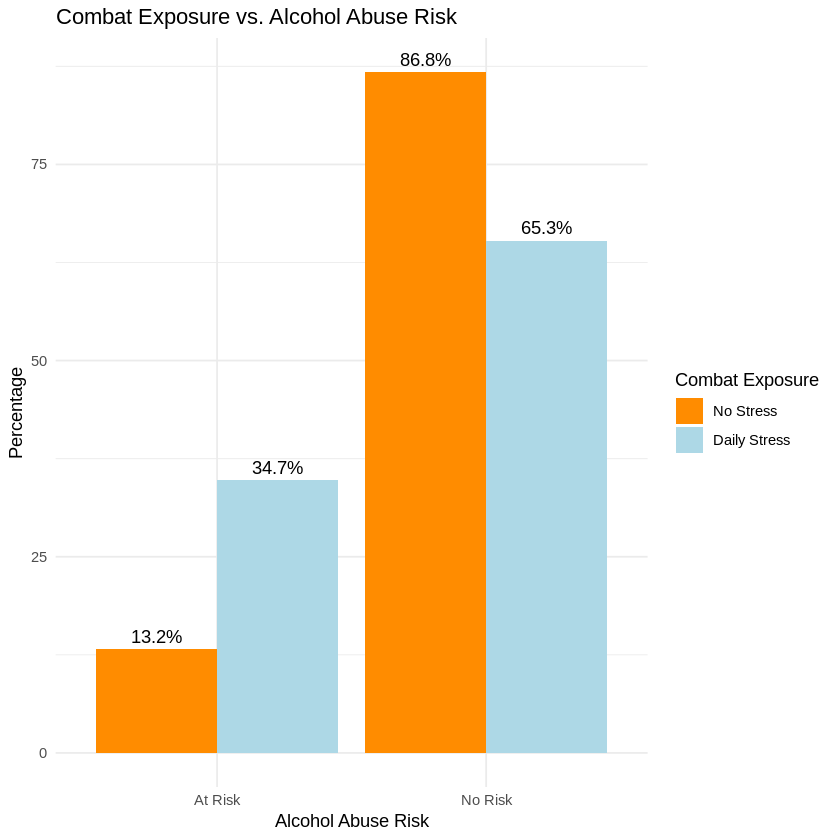

In [ ]:
# prompt: Perform a Person Chi-Square of the binary variables STRESS_SEV and CAGE_R.  Include a side-by-side bar chart. Remove the jitter. Use the labels Alcohol Abuse Risk and Combat Exposure. Use the colors dark orange and light blue. Use labels for STRESS_SEV with 0 = No Stress and 1 = Daily Stress. Show percentages.

# Load necessary libraries
library(gmodels)
library(ggplot2)

# Assuming MilitaryDF is your data frame
# Replace with your actual data frame name

# Create the cross-tabulation
CrossTable(MilitaryDF$STRESS_SEV, MilitaryDF$CAGE_R, chisq = TRUE,
           prop.chisq = FALSE, prop.t = FALSE, prop.r = TRUE, prop.c = TRUE,
           dnn = c("Combat Exposure", "Alcohol Abuse Risk"))


# Create the side-by-side bar chart
# Calculate proportions for the chart
stress_cage_table <- table(MilitaryDF$STRESS_SEV, MilitaryDF$CAGE_R)
stress_cage_prop <- prop.table(stress_cage_table, margin = 1) * 100 # Calculate row percentages

# Create a data frame for ggplot2
stress_cage_df <- data.frame(
  Combat_Exposure = factor(rep(rownames(stress_cage_table), ncol(stress_cage_table)),
                           levels = c("No Stress", "Daily Stress"),
                           labels = c("No Stress", "Daily Stress")),
  Alcohol_Abuse_Risk = factor(rep(colnames(stress_cage_table), each = nrow(stress_cage_table))),
  Percentage = as.vector(stress_cage_prop)
)


ggplot(stress_cage_df, aes(x = Alcohol_Abuse_Risk, y = Percentage, fill = Combat_Exposure)) +
  geom_bar(stat = "identity", position = "dodge") +
  geom_text(aes(label = paste0(round(Percentage, 1), "%")),
            position = position_dodge(width = 0.9), vjust = -0.5) +
  labs(title = "Combat Exposure vs. Alcohol Abuse Risk",
       x = "Alcohol Abuse Risk",
       y = "Percentage",
       fill = "Combat Exposure") +
  scale_fill_manual(values = c("darkorange", "lightblue")) +
  theme_minimal()


 
   Cell Contents
|-------------------------|
|                       N |
|           N / Row Total |
|           N / Col Total |
|-------------------------|

 
Total Observations in Table:  1495 

 
                   | Combat Exposure 
Alcohol Abuse Risk |   No Risk |   At Risk | Row Total | 
-------------------|-----------|-----------|-----------|
       Nonsuicidal |       957 |       222 |      1179 | 
                   |     0.812 |     0.188 |     0.789 | 
                   |     0.867 |     0.568 |           | 
-------------------|-----------|-----------|-----------|
          Suicidal |       147 |       169 |       316 | 
                   |     0.465 |     0.535 |     0.211 | 
                   |     0.133 |     0.432 |           | 
-------------------|-----------|-----------|-----------|
      Column Total |      1104 |       391 |      1495 | 
                   |     0.738 |     0.262 |           | 
-------------------|-----------|-----------|-----------|

 
Statist

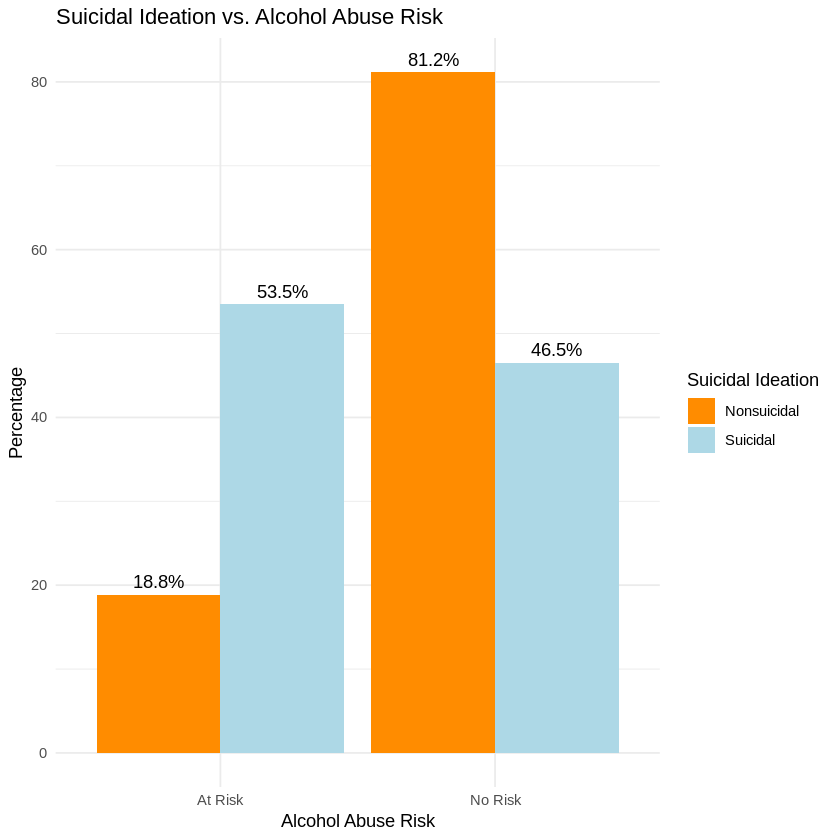

In [ ]:
# prompt: Perform a Person Chi-Square of the binary variables SUICIDE_R and CAGE_R.  Include a side-by-side bar chart. Remove the jitter. Use the labels Alcohol Abuse Risk and Combat Exposure. Use the colors dark orange and light blue. Use labels for SUICIDE_R with 0 = Nonsuicidal and 1 = Suicidal. Show percentages.

# Load necessary libraries
library(gmodels)
library(ggplot2)

# Assuming MilitaryDF is your data frame
# Replace with your actual data frame name

# Create the cross-tabulation
CrossTable(MilitaryDF$SUICIDE_R, MilitaryDF$CAGE_R, chisq = TRUE,
           prop.chisq = FALSE, prop.t = FALSE, prop.r = TRUE, prop.c = TRUE,
           dnn = c("Alcohol Abuse Risk", "Combat Exposure"))


# Create the side-by-side bar chart
# Calculate proportions for the chart
suicide_cage_table <- table(MilitaryDF$SUICIDE_R, MilitaryDF$CAGE_R)
suicide_cage_prop <- prop.table(suicide_cage_table, margin = 1) * 100 # Calculate row percentages

# Create a data frame for ggplot2
suicide_cage_df <- data.frame(
  Combat_Exposure = factor(rep(rownames(suicide_cage_table), ncol(suicide_cage_table)),
                           levels = c("Nonsuicidal", "Suicidal"),
                           labels = c("Nonsuicidal", "Suicidal")),
  Alcohol_Abuse_Risk = factor(rep(colnames(suicide_cage_table), each = nrow(suicide_cage_table))),
  Percentage = as.vector(suicide_cage_prop)
)


ggplot(suicide_cage_df, aes(x = Alcohol_Abuse_Risk, y = Percentage, fill = Combat_Exposure)) +
  geom_bar(stat = "identity", position = "dodge") +
  geom_text(aes(label = paste0(round(Percentage, 1), "%")),
            position = position_dodge(width = 0.9), vjust = -0.5) +
  labs(title = "Suicidal Ideation vs. Alcohol Abuse Risk",
       x = "Alcohol Abuse Risk",
       y = "Percentage",
       fill = "Suicidal Ideation") +
  scale_fill_manual(values = c("darkorange", "lightblue")) +
  theme_minimal()


 
   Cell Contents
|-------------------------|
|                       N |
|           N / Row Total |
|           N / Col Total |
|-------------------------|

 
Total Observations in Table:  1495 

 
               | Alcohol Abuse Risk 
History of TBI |   No Risk |   At Risk | Row Total | 
---------------|-----------|-----------|-----------|
             0 |       948 |       295 |      1243 | 
               |     0.763 |     0.237 |     0.831 | 
               |     0.859 |     0.754 |           | 
---------------|-----------|-----------|-----------|
             1 |       156 |        96 |       252 | 
               |     0.619 |     0.381 |     0.169 | 
               |     0.141 |     0.246 |           | 
---------------|-----------|-----------|-----------|
  Column Total |      1104 |       391 |      1495 | 
               |     0.738 |     0.262 |           | 
---------------|-----------|-----------|-----------|

 
Statistics for All Table Factors


Pearson's Chi-squared tes

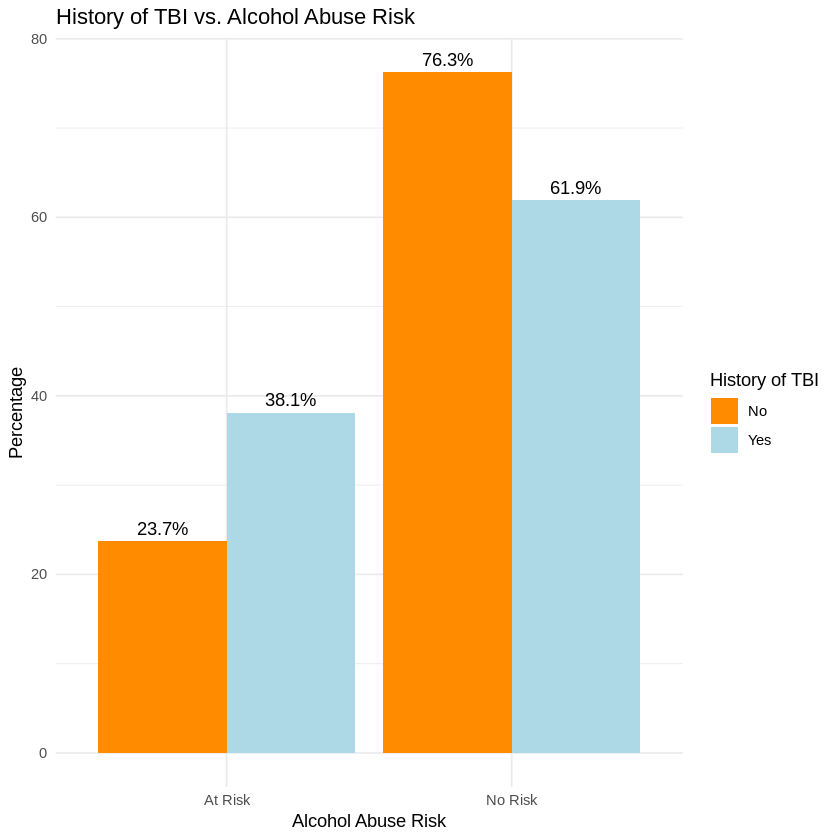

In [ ]:
# prompt: Perform a Person Chi-Square of the binary variables TBI and CAGE_R.  Include a side-by-side bar chart. Remove the jitter. Use the labels Alcohol Abuse Risk and History of TBI. Use the colors dark orange and light blue. Use labels for TBI with 0 = No and 1 = Yes. Show percentages.

# Load necessary libraries
library(gmodels)
library(ggplot2)

# Assuming MilitaryDF is your data frame
# Replace with your actual data frame name

# Create the cross-tabulation
CrossTable(MilitaryDF$TBI, MilitaryDF$CAGE_R, chisq = TRUE,
           prop.chisq = FALSE, prop.t = FALSE, prop.r = TRUE, prop.c = TRUE,
           dnn = c("History of TBI", "Alcohol Abuse Risk"))


# Create the side-by-side bar chart
# Calculate proportions for the chart
tbi_cage_table <- table(MilitaryDF$TBI, MilitaryDF$CAGE_R)
tbi_cage_prop <- prop.table(tbi_cage_table, margin = 1) * 100 # Calculate row percentages

# Create a data frame for ggplot2
tbi_cage_df <- data.frame(
  TBI = factor(rep(rownames(tbi_cage_table), ncol(tbi_cage_table)),
                           levels = c("0", "1"),
                           labels = c("No", "Yes")),
  Alcohol_Abuse_Risk = factor(rep(colnames(tbi_cage_table), each = nrow(tbi_cage_table))),
  Percentage = as.vector(tbi_cage_prop)
)


ggplot(tbi_cage_df, aes(x = Alcohol_Abuse_Risk, y = Percentage, fill = TBI)) +
  geom_bar(stat = "identity", position = "dodge") +
  geom_text(aes(label = paste0(round(Percentage, 1), "%")),
            position = position_dodge(width = 0.9), vjust = -0.5) +
  labs(title = "History of TBI vs. Alcohol Abuse Risk",
       x = "Alcohol Abuse Risk",
       y = "Percentage",
       fill = "History of TBI") +
  scale_fill_manual(values = c("darkorange", "lightblue")) +
  theme_minimal()


	Wilcoxon rank sum test with continuity correction

data:  STIGMA by CAGE_R
W = 157994, p-value = 1.542e-15
alternative hypothesis: true location shift is not equal to 0


ERROR while rich displaying an object: Error in `palette()`:
! Insufficient values in manual scale. 25 needed but only 3 provided.

Traceback:
1. sapply(x, f, simplify = simplify)
2. lapply(X = X, FUN = FUN, ...)
3. FUN(X[[i]], ...)
4. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
5. tryCatchList(expr, classes, parentenv, handlers)
6. tryCatchOne(expr, names, parentenv, handlers[[1L]])
7. doTryCatch(return(expr), name, parentenv, handler)
8. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw

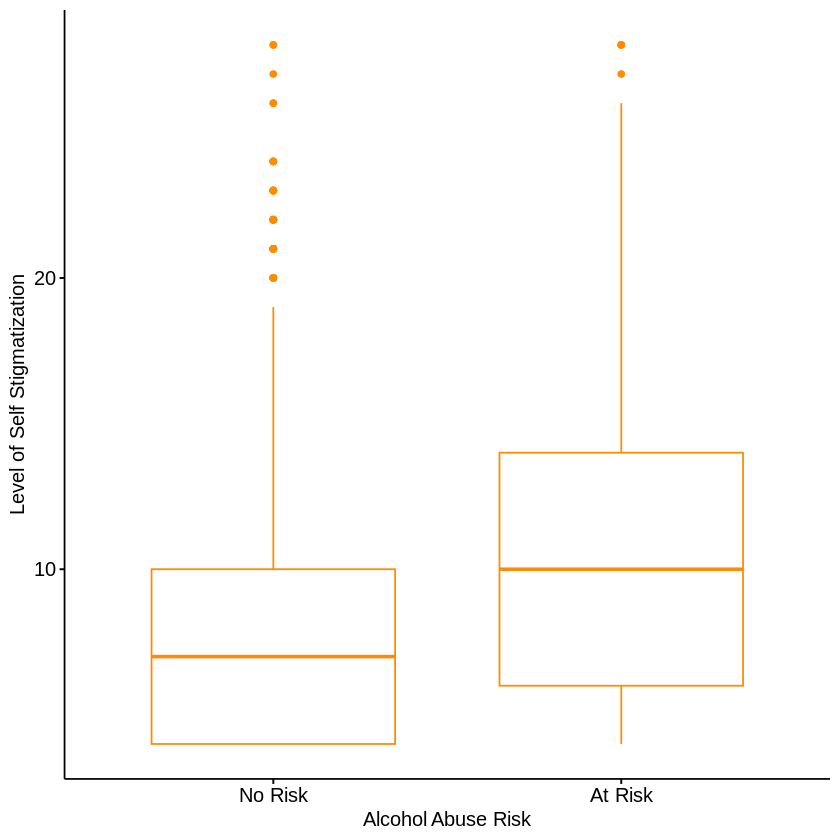

In [ ]:
# prompt: Perform a Mann Whitney test for the Categorical variable with three level STIGMA and the binary variable CAGE_R.   Include a side-by-side bar chart. Remove the jitter. Use the labels Alcohol Abuse Risk and Level of Self Stigmatization. Use the color dark orange. Show percentages.

# Load necessary libraries
library(ggplot2)
library(ggpubr)

# Perform Mann-Whitney U test
wilcox.test(STIGMA ~ CAGE_R, data = MilitaryDF)

# Create side-by-side bar chart without jitter
ggboxplot(MilitaryDF, x = "CAGE_R", y = "STIGMA",
          color = "darkorange",
          add = "none",  # Remove jitter
          ylab = "Level of Self Stigmatization",
          xlab = "Alcohol Abuse Risk")


# Calculate percentages for the bar chart
stigma_cage_table <- table(MilitaryDF$STIGMA, MilitaryDF$CAGE_R)
stigma_cage_prop <- prop.table(stigma_cage_table, margin = 1) * 100

# Create data frame for ggplot2
stigma_cage_df <- data.frame(
  Stigma = factor(rep(rownames(stigma_cage_table), ncol(stigma_cage_table))),
  Alcohol_Abuse_Risk = factor(rep(colnames(stigma_cage_table), each = nrow(stigma_cage_table))),
  Percentage = as.vector(stigma_cage_prop)
)

ggplot(stigma_cage_df, aes(x = Alcohol_Abuse_Risk, y = Percentage, fill = Stigma)) +
  geom_bar(stat = "identity", position = "dodge") +
  geom_text(aes(label = paste0(round(Percentage, 1), "%")),
            position = position_dodge(width = 0.9), vjust = -0.5) +
  labs(title = "Self-Stigma vs. Alcohol Abuse Risk",
       x = "Alcohol Abuse Risk",
       y = "Percentage",
       fill = "Level of Self-Stigmatization") +
  scale_fill_manual(values = c("darkorange", "darkorange", "darkorange")) + # Use dark orange color
  theme_minimal()

In [ ]:
# prompt: # prompt: based on the box plot and grouping by levels of CAGE_R what is the mean and SD for STIGMA

# Calculate mean and SD of STIGMA for each level of CAGE_R
aggregate(STIGMA ~ CAGE_R, data = MilitaryDF, FUN = function(x) c(Mean = mean(x, na.rm = TRUE), SD = sd(x, na.rm = TRUE)))

CAGE_R,STIGMA
<fct>,"<dbl[,2]>"
No Risk,"8.129529, 4.607385"
At Risk,"10.705882, 5.911565"



 
   Cell Contents
|-------------------------|
|                       N |
|           N / Row Total |
|           N / Col Total |
|-------------------------|

 
Total Observations in Table:  1495 

 
                 | Alcohol Abuse Risk 
Loneliness Level |   No Risk |   At Risk | Row Total | 
-----------------|-----------|-----------|-----------|
             Low |       654 |       104 |       758 | 
                 |     0.863 |     0.137 |     0.507 | 
                 |     0.592 |     0.266 |           | 
-----------------|-----------|-----------|-----------|
        Moderate |       290 |       157 |       447 | 
                 |     0.649 |     0.351 |     0.299 | 
                 |     0.263 |     0.402 |           | 
-----------------|-----------|-----------|-----------|
            High |       160 |       130 |       290 | 
                 |     0.552 |     0.448 |     0.194 | 
                 |     0.145 |     0.332 |           | 
-----------------|-----------|----

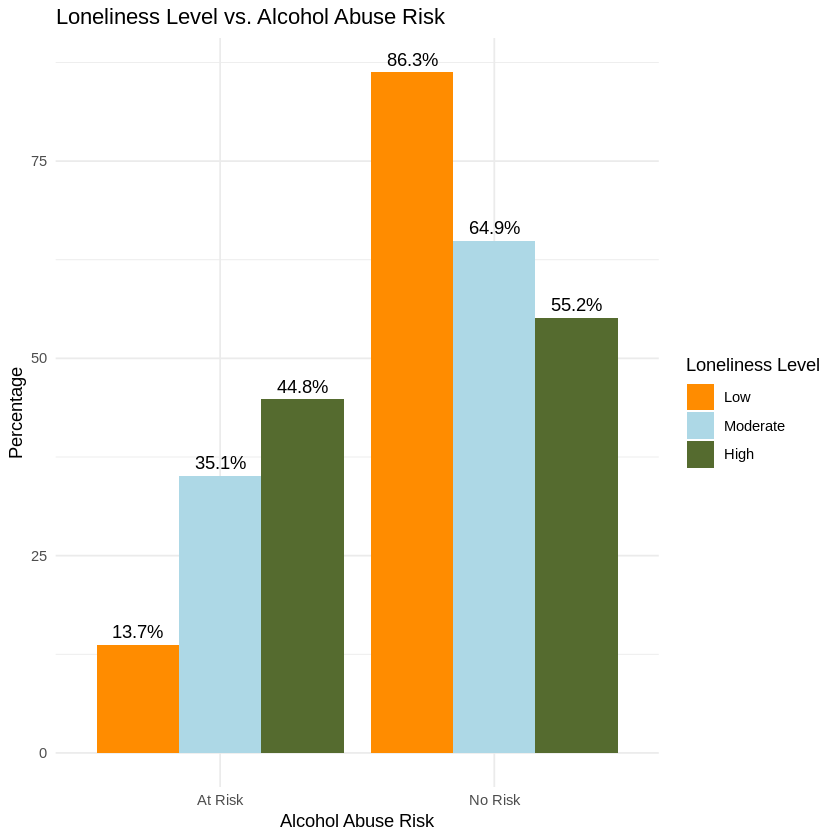

In [ ]:
# prompt: Perform a Pearson's Chi Square test for the categorical variable with 3 level LONE_R and the binary variable CAGE_R.  Include a side-by-side bar chart. Remove the jitter. Use the labels Alcohol Abuse Risk and Loneliness Level. Use the colors dark orange, light blue, and dark olive green. Show percentages.  Place bars in the following order Low, Moderate and then High

# Load necessary libraries
library(gmodels)
library(ggplot2)

# Assuming MilitaryDF is your data frame
# Replace with your actual data frame name

# Create the cross-tabulation
CrossTable(MilitaryDF$LONE_R, MilitaryDF$CAGE_R, chisq = TRUE,
           prop.chisq = FALSE, prop.t = FALSE, prop.r = TRUE, prop.c = TRUE,
           dnn = c("Loneliness Level", "Alcohol Abuse Risk"))

# Calculate proportions for the chart
lone_cage_table <- table(MilitaryDF$LONE_R, MilitaryDF$CAGE_R)
lone_cage_prop <- prop.table(lone_cage_table, margin = 1) * 100 # Calculate row percentages

# Create a data frame for ggplot2
lone_cage_df <- data.frame(
  Loneliness = factor(rep(rownames(lone_cage_table), ncol(lone_cage_table)),
                     levels = c("Low", "Moderate", "High"), #Specify order
                     labels = c("Low", "Moderate", "High")),
  Alcohol_Abuse_Risk = factor(rep(colnames(lone_cage_table), each = nrow(lone_cage_table))),
  Percentage = as.vector(lone_cage_prop)
)

# Create the side-by-side bar chart
ggplot(lone_cage_df, aes(x = Alcohol_Abuse_Risk, y = Percentage, fill = Loneliness)) +
  geom_bar(stat = "identity", position = "dodge") +
  geom_text(aes(label = paste0(round(Percentage, 1), "%")),
            position = position_dodge(width = 0.9), vjust = -0.5) +
  labs(title = "Loneliness Level vs. Alcohol Abuse Risk",
       x = "Alcohol Abuse Risk",
       y = "Percentage",
       fill = "Loneliness Level") +
  scale_fill_manual(values = c("darkorange", "lightblue", "darkolivegreen")) +
  theme_minimal()

No Mild to Moderate  Very to Extreme 
             886              514               95


              No Mild to Moderate  Very to Extreme 
             886              514               95 

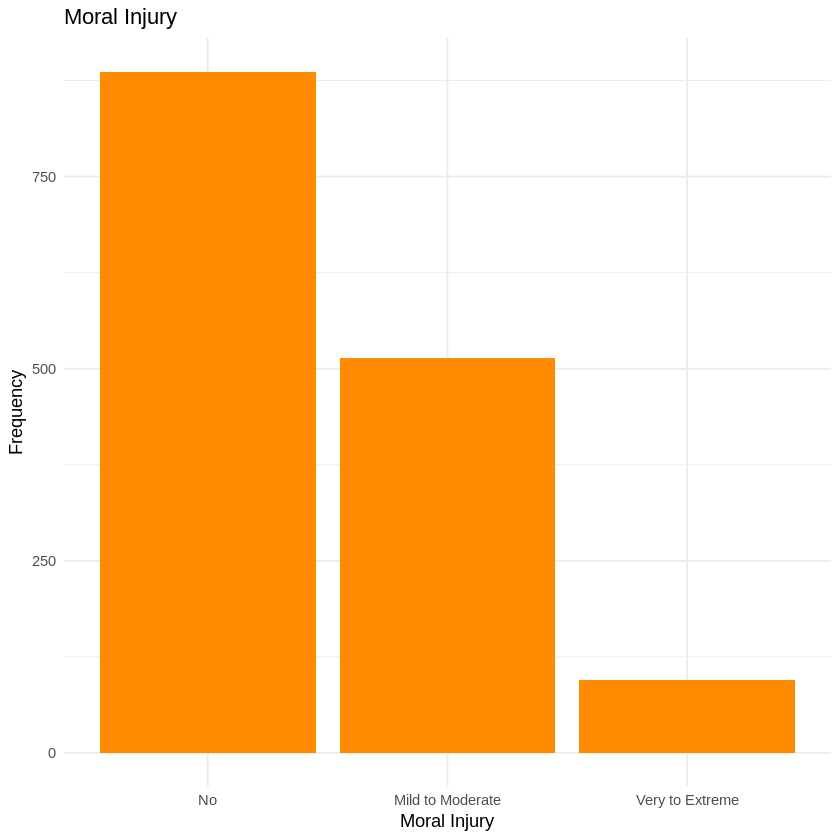

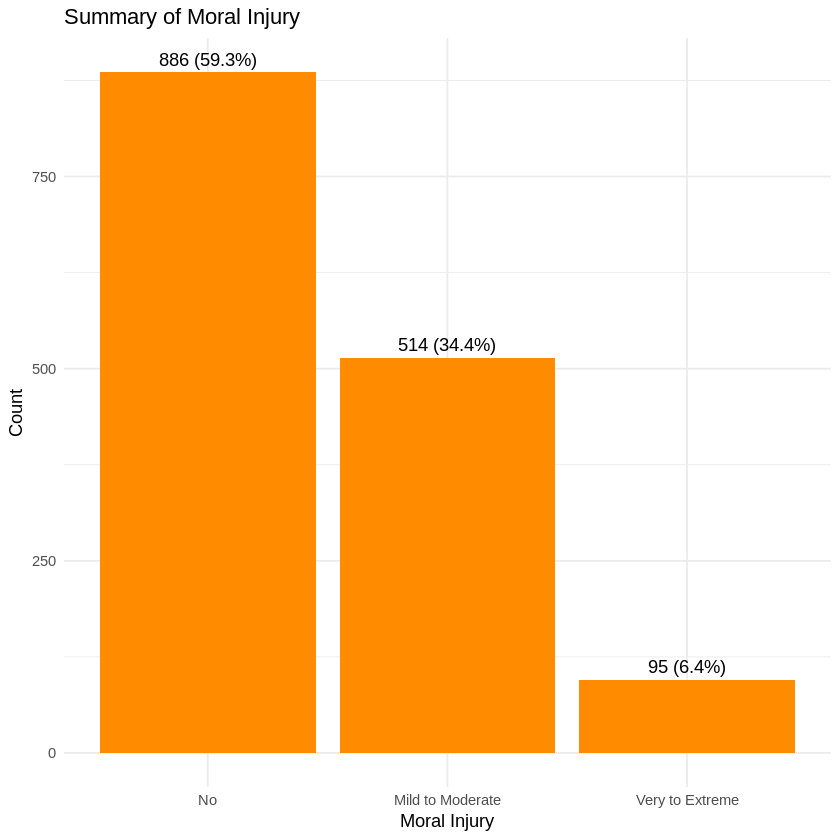

In [ ]:
# prompt: Descriptive statistics for MOR_INJ with bar chart

# Assuming 'MilitaryDF' is your dataframe and it contains a column named 'MOR_INJ'.
# Replace 'MilitaryDF' with your actual dataframe name if different.

# Summary statistics for MOR_INJ
summary(MilitaryDF$MOR_INJ)

# Frequency table for MOR_INJ
table(MilitaryDF$MOR_INJ)

# Bar plot for MOR_INJ with dark orange color and label
library(ggplot2)

ggplot(MilitaryDF, aes(x = factor(MOR_INJ))) +
  geom_bar(fill = "darkorange") +
  labs(title = "Moral Injury",
       x = "Moral Injury",
       y = "Frequency") +
  theme_minimal()


# Calculate counts and percentages for each level of MOR_INJ
mor_inj_counts <- table(MilitaryDF$MOR_INJ)
mor_inj_percentages <- prop.table(mor_inj_counts) * 100

# Create the bar chart with percentages
ggplot(as.data.frame(mor_inj_counts), aes(x = Var1, y = Freq)) +
  geom_bar(stat = "identity", fill = "darkorange") +
  geom_text(aes(label = paste0(Freq, " (", round(mor_inj_percentages, 1), "%)")), vjust = -0.5) +
  labs(title = "Summary of Moral Injury", x = "Moral Injury", y = "Count") +
  theme_minimal()


 
   Cell Contents
|-------------------------|
|                       N |
|           N / Row Total |
|           N / Col Total |
|-------------------------|

 
Total Observations in Table:  1495 

 
                    | Alcohol Abuse Risk 
Moral Injury Degree |   No Risk |   At Risk | Row Total | 
--------------------|-----------|-----------|-----------|
                 No |       781 |       105 |       886 | 
                    |     0.881 |     0.119 |     0.593 | 
                    |     0.707 |     0.269 |           | 
--------------------|-----------|-----------|-----------|
   Mild to Moderate |       290 |       224 |       514 | 
                    |     0.564 |     0.436 |     0.344 | 
                    |     0.263 |     0.573 |           | 
--------------------|-----------|-----------|-----------|
    Very to Extreme |        33 |        62 |        95 | 
                    |     0.347 |     0.653 |     0.064 | 
                    |     0.030 |     0.159 |      

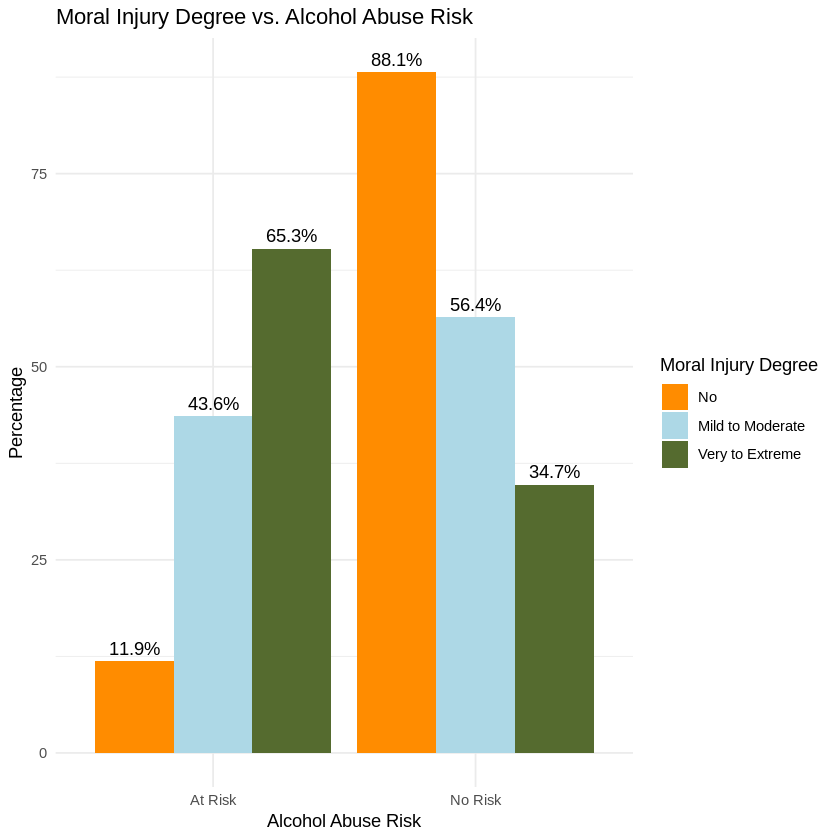

In [ ]:
# prompt: Perform a Pearson's Chi Square test for the categorical variable with 3 level MOR_INJ and the binary variable CAGE_R.  Include a side-by-side bar chart. Remove the jitter. Use the labels Alcohol Abuse Risk and Moral Injury Degree. Use the colors dark orange, light blue, and dark olive green. Show percentages.  Place bars in the following order Low, Moderate and then High

# Load necessary libraries
library(gmodels)
library(ggplot2)

# Assuming MilitaryDF is your data frame
# Replace with your actual data frame name

# Create the cross-tabulation
CrossTable(MilitaryDF$MOR_INJ, MilitaryDF$CAGE_R, chisq = TRUE,
           prop.chisq = FALSE, prop.t = FALSE, prop.r = TRUE, prop.c = TRUE,
           dnn = c("Moral Injury Degree", "Alcohol Abuse Risk"))

# Calculate proportions for the chart
morinj_cage_table <- table(MilitaryDF$MOR_INJ, MilitaryDF$CAGE_R)
morinj_cage_prop <- prop.table(morinj_cage_table, margin = 1) * 100 # Calculate row percentages

# Create a data frame for ggplot2, specifying the order of levels
morinj_cage_df <- data.frame(
  MoralInjury = factor(rep(rownames(morinj_cage_table), ncol(morinj_cage_table)),
                       levels = c("No", "Mild to Moderate", "Very to Extreme"), #Specify order
                       labels = c("No", "Mild to Moderate", "Very to Extreme")),
  AlcoholAbuseRisk = factor(rep(colnames(morinj_cage_table), each = nrow(morinj_cage_table))),
  Percentage = as.vector(morinj_cage_prop)
)

# Create the side-by-side bar chart
ggplot(morinj_cage_df, aes(x = AlcoholAbuseRisk, y = Percentage, fill = MoralInjury)) +
  geom_bar(stat = "identity", position = "dodge") +
  geom_text(aes(label = paste0(round(Percentage, 1), "%")),
            position = position_dodge(width = 0.9), vjust = -0.5) +
  labs(title = "Moral Injury Degree vs. Alcohol Abuse Risk",
       x = "Alcohol Abuse Risk",
       y = "Percentage",
       fill = "Moral Injury Degree") +
  scale_fill_manual(values = c("darkorange", "lightblue", "darkolivegreen")) +
  theme_minimal()

In [ ]:
# prompt:  prompt: conduct a multivariate analysis (multiple logistic regression) using the variables CAGE_R, COM_EX_RB, STRESS_SEV, LONE_R, MOR_INJ, STIGMA, SUICIDE_R, and TBI. Provide the p-values

# Load necessary libraries
library(dplyr)
library(nnet)

# Assuming 'MilitaryDF' is your dataframe
# Replace 'MilitaryDF' with your actual dataframe name

# Select relevant variables
variables <- c("CAGE_R", "COM_EX_RB", "STRESS_SEV", "LONE_R", "MOR_INJ", "STIGMA", "SUICIDE_R", "TBI")

# Create a subset of the data
model_data <- MilitaryDF %>% select(all_of(variables))

# Convert character variables to factors if needed.  This is crucial
# for logistic regression.
for (col in names(model_data)) {
  if (is.character(model_data[[col]])) {
    model_data[[col]] <- factor(model_data[[col]])
  }
}

# Fit the multinomial logistic regression model
# Assuming "CAGE_R" is your outcome variable.  Change if your outcome is different
model <- multinom(as.factor(CAGE_R) ~ ., data = model_data)


# Summarize the model, including p-values.
summary(model)

# weights:  11 (10 variable)
initial  value 1036.255035 
iter  10 value 719.998704
final  value 698.751159 
converged


Call:
multinom(formula = as.factor(CAGE_R) ~ ., data = model_data)

Coefficients:
                             Values  Std. Err.
(Intercept)             -2.81029117 0.17487848
COM_EX_RB1               0.18736420 0.16661127
STRESS_SEVDaily Stress   0.56177172 0.15663050
LONE_RModerate           0.50274185 0.16473252
LONE_RHigh               0.53361210 0.18755945
MOR_INJMild to Moderate  1.05987812 0.16075764
MOR_INJVery to Extreme   1.56405510 0.27830087
STIGMA                   0.02889255 0.01275773
SUICIDE_RSuicidal        0.74517531 0.15673931
TBI1                     0.06481184 0.17158379

Residual Deviance: 1397.502 
AIC: 1417.502 